# OFDM with QAM Modulation - Transmitter

Bit stream -> M-QAM -> OFDM -> Noise -> Visualizations 



ifft_size = 720: This determines the total number of subcarriers (both active and inactive) in each OFDM symbol. 

You can think of this as the size of your frequency grid — you have 720 "slots" in the frequency domain.

cp_length = 80: Length of the cyclic prefix added to each OFDM symbol (used to combat ISI).

num_symbols = 20: This refers to the number of OFDM time-domain symbols you generate in total — i.e., how many different time samples (each one made from 720 subcarriers) you will create.

M-QAM: This tells us that each active subcarrier carries \(log_2(M)\) bits per OFDM symbol 

Think of it like a matrix:

- Each row is an OFDM symbol in time (20 total).
- Each column is a subcarrier (720 total, but maybe only ~109 are "active").

So we have 

$[720 subcarriers × 20 symbols]$

structure before applying IFFT + CP.

Each OFDM symbol uses the full set of subcarriers (but not all need to be modulated — often you zero-out the edges or DC).

Why 109 active subcarriers? 

The choice of 109 active subcarriers is arbitrary and design-dependent — it's not fixed by the IFFT size (720).

Even though your IFFT size is 720, not all subcarriers are used for data transmission.

DC Subcarrier (Center Frequency): The subcarrier at index 720/2 +1 = 361, corresponds to 0 Hz (DC), it is not used because it causes interference and no information is transmitted at 0 Hz.

Guard Bands: Subcarriers at the edges of the IFFT spectrum are usually zero-padded (i.e., set to 0) to prevent spectral leakage and simplify filtering. These are called guard subcarriers. This is especially important when OFDM signals are adjacent to other channels (e.g., LTE or WiFi).

Pilot Subcarriers (optional): Some subcarriers are used for channel estimation and synchronization — they don't carry data but help the receiver align and equalize.

\begin{array}{|l|c|l|}
\hline
\textbf{Region} & \textbf{Subcarrier Indices} & \textbf{Purpose} \\
\hline
\text{1. Guard (left)} & 1\text{ to }306 & \text{Zero-padded (guard)} \\
\text{2. Active (lower)} & 307\text{ to }360 & \text{QPSK data} \\
\text{3. DC} & 361 & \text{Explicitly nulled} \\
\text{4. Active (upper)} & 362\text{ to }415 & \text{QPSK data} \\
\text{5. Guard (right)} & 416\text{ to }720 & \text{Zero-padded (guard)} \\
\hline
\end{array}





In [5]:
import numpy as np 
import matplotlib.pyplot as plt 
from scipy.io import savemat
import os
ifft_size = 720 # FFT size = number of subcarriers 
cp_length = 80
num_symbols = 20
mod_order = 16 # modulation order (e.g., 16-QAM)
num_active = 109 # number of active subcarriers 

Ld = ifft_size
Ls = Ld + cp_length 
dc_index = ifft_size // 2 
half = num_active // 2
active_subcarriers = list(range(dc_index - half, dc_index)) + \
                     list(range(dc_index + 1, dc_index + half + 1))


### General M-QAM Mapping 

#### M-QAM Mapping

In **square M-QAM**, the constellation is a square grid:

* For **16-QAM**, the grid is $4 \times 4$
* For **64-QAM**, it's $8 \times 8$

That means:

* Half the bits control the **in-phase (I)** component
* Half control the **quadrature (Q)** component


#### 1. `bits_per_axis = bits_per_symbol // 2`

This divides the total bits per symbol equally between the **I** and **Q** axes.

| Modulation | bits\_per\_symbol | bits\_per\_axis |
| ---------- | ----------------- | --------------- |
| QPSK (4)   | 2                 | 1               |
| 16-QAM     | 4                 | 2               |
| 64-QAM     | 6                 | 3               |

So:

* Each **QAM symbol** = `bits_per_symbol` bits
* $2^{\text{bits\_per\_axis}}$ levels per axis


#### 2. `M_axis = sqrt(mod_order)`

This calculates the number of levels **per dimension** in the constellation.

| mod\_order | M\_axis |
| ---------- | ------- |
| 4          | 2       |
| 16         | 4       |
| 64         | 8       |

So for 16-QAM, each axis (I/Q) has 4 possible values (e.g., $-3, -1, +1, +3$)

---

#### 3. Splitting Bits into I and Q

```python
bits_I = symbols_bin[:, :bits_per_axis]   # First half of bits
bits_Q = symbols_bin[:, bits_per_axis:]   # Second half of bits
```

We're taking the `symbols_bin` matrix (shape: `[num_symbols, bits_per_symbol]`), and for each row:

* The **first half** goes to `bits_I`
* The **second half** goes to `bits_Q`

These are used to modulate:

* I: horizontal axis of constellation (real part)
* Q: vertical axis (imaginary part)

---

#### Example: 16-QAM

For one QAM symbol:

```python
bits = [1, 0, 1, 1]
```

```python
bits_I = [1, 0] → decimal 2 → I component
bits_Q = [1, 1] → decimal 3 → Q component
```

Then mapped to:

* $I = 2 \times 2 - 3 = +1$
* $Q = 2 \times 3 - 3 = +3$

Final complex symbol:

```python
qam_data = 1 + j*3
```



In [29]:
def generate_mqam_symbols(mod_order, num_active, num_symbols):
    
    bits_per_symbol = int(np.log2(mod_order))
    total_bits = num_active * num_symbols * bits_per_symbol
    bits = np.random.randint(0,2,total_bits) # generate random bits [low = 0, high = 2) = [0,1]
    symbol_bin = bits.reshape(-1,bits_per_symbol) # e.g, 4360 bits will be (1090,4) if log2(M) = 4
    # reshape(-1,x), automatically figures out how many rows are needed so each row has x columns 
    # QAM parameters: 
    bits_per_axis = bits_per_symbol // 2   # divide bits equally for I & Q
    M_axis = int(np.sqrt(mod_order)) # number of constellation points per axis 
    # split bits into I, Q parts: 
    bits_I = symbol_bin[:, :bits_per_axis] # Take I bits from each row 
    bits_Q = symbol_bin[:, bits_per_axis:] # Takes Q bits from each row 

    # Converting each row of array of binary bits into decimal (integer) value similar to bi2de() in matlab 
    def bin2dec(arr): 
        return arr.dot(1 << np.arange(arr.shape[-1]-1,-1,-1))
    
    I_indices = bin2dec(bits_I)
    Q_indices = bin2dec(bits_Q) 

    # Map to constellation points
    I_vals = 2*I_indices - (M_axis - 1)
    Q_vals = 2*Q_indices - (M_axis - 1)

    qam_data = I_vals + 1j*Q_vals 
    qam_data /= np.sqrt(np.mean(np.abs(qam_data)**2))

    return qam_data, bits 
    

In [30]:
qam_data, bits = generate_mqam_symbols(mod_order, num_active, num_symbols)
print("QAM symbols shape:", qam_data.shape)  

QAM symbols shape: (2180,)


#### Further Steps: 

1. Bit Stream Generation

2. Modulation groups every 2 bits → 1 complex symbol, Output: A stream of complex symbols.

3. Serial to parallel conversion:

    - Divide the complex symbol stream into blocks of size equal to the number of active subcarriers (e.g., 109).

    - These form frequency-domain vectors for each OFDM symbol.

4. Subcarrier mapping: 
Map each block of complex symbols to specific active subcarriers in the full IFFT grid (e.g., 720-point vector). Set unused subcarriers and DC to 0.

5. IFFT: Apply IFFT (e.g., 720-point) to each frequency-domain OFDM symbol to convert it into a time-domain signal.
Output: time-domain complex samples for each OFDM symbol.

6. Cyclic Prefix (CP) Addition: 
Copy the last cp_length samples of the IFFT output and prepend them to the symbol.
This helps with multipath channel resilience.

7. Parallel-to-Serial Conversion

    - Convert the CP-added symbols back into a serial stream for DAC transmission.
    OFDM Signal generation

    - OFDM divides the total channel bandwidth into multiple orthogonal subcarriers. Each subcarrier carries a portion of the data in parallel, making the system resilient to multipath fading and ISI.

Let:

    N: IFFT size (number of subcarriers)
    X[k]: Modulated symbol (e.g., QPSK, M-QAM) on the k-th subcarrier
    x[n]: Time-domain OFDM signal

$$x[n] = \frac{1}{\sqrt{N}} \sum_{k=0}^{N-1} X[k] \cdot e^{j\, \frac{2\,\pi \,k\,n}{N}}, \quad n = 0, 1, \dots, N-1
$$

Subcarrier Allocation and DC Nulling

Active subcarriers are chosen symmetrically around the center.

The DC subcarrier (at k = N/2) is set to zero to eliminate carrier leakage.

Guard bands are left unused to avoid spectral leakage into adjacent channels.

To combat Inter-Symbol Interference (ISI), a Cyclic Prefix of length  is added by copying the last samples of the time-domain symbol and appending them to the front.

$$
x_{\text{cp}}[n] =
\begin{cases}
x[n + N - L_{\text{CP}}], & 0 \leq n < L_{\text{CP}} \\
x[n - L_{\text{CP}}], & L_{\text{CP}} \leq n < N + L_{\text{CP}}
\end{cases}
$$

The total OFDM symbol length becomes 

$$L_s = N + L_{\text{CP}}
$$

The transmit signal is constructed by concatenating multiple CP-extended OFDM symbols:

$$x_{\text{total}}[n] = \left[ \text{CP}_1 + x_1[n],\ \text{CP}_2 + x_2[n],\ \dots \right]
$$

OFDM transmits data in parallel over multiple subcarriers, each modulated at a different frequency. It uses the orthogonality of sinusoids to pack them tightly together without interference.

BUT: generating multiple sinusoids manually would be complex.

Instead of manually modulating 109 carriers with QPSK and summing sinusoids, we use the Inverse Fast Fourier Transform (IFFT).

Each point in the frequency-domain vector you pass to the IFFT acts like the amplitude/phase of a subcarrier.

The IFFT outputs a superposition of all those subcarriers — a time-domain signal.

Think of OFDM as encoding frequency data, and then IFFT transforms it into the real-world time signal you transmit.



In [31]:
def generate_ofdm_signal(qam_data, ifft_size, cp_length, num_symbols, active_subcarriers, dc_index):
    num_active = len(active_subcarriers)
    symbol_matrix = np.zeros((num_symbols, ifft_size), dtype=complex)
    ofdm_signal = []

    for i in range(num_symbols):
        # Extract QAM symbols for this OFDM symbol
        idx_start = i * num_active
        idx_end = (i + 1) * num_active
        this_symbol = qam_data[idx_start:idx_end]

        # Map symbols to subcarriers
        freq_data = np.zeros(ifft_size, dtype=complex)
        freq_data[active_subcarriers] = this_symbol
        freq_data[dc_index] = 0  # Null DC

        # IFFT to get time-domain OFDM symbol
        time_data = np.fft.ifft(freq_data) * np.sqrt(ifft_size)
        symbol_matrix[i, :] = freq_data

        # Add cyclic prefix
        cp = time_data[-cp_length:]
        ofdm_symbol = np.concatenate((cp, time_data))
        ofdm_signal.append(ofdm_symbol)

    # Concatenate all symbols into one 1D signal
    ofdm_signal = np.concatenate(ofdm_signal)

    # Normalize to unit average power
    ofdm_signal /= np.sqrt(np.mean(np.abs(ofdm_signal) ** 2))

    return ofdm_signal, symbol_matrix


In [32]:
ofdm_signal, symbol_matrix = generate_ofdm_signal(
    qam_data=qam_data,
    ifft_size=ifft_size,
    cp_length=cp_length,
    num_symbols=num_symbols,
    active_subcarriers=active_subcarriers,  
    dc_index=dc_index
)

Note: 
At this point, we have a baseband complex-valued signal, which is:

$$s_{\text{baseband}} (t) = I(t) + jQ(t)$$

To transmit it over a real-valued RF channel, we need to convert it to a passband (RF) signal using IQ modulation:

IQ Modulation (Digital-to-Analog + RF Upconversion): 

generate the real RF signal as:

$$s(t) = I(t) . cos(2\pi\, f_c t) - Q(t) . sin(2\pi f_ct)
$$

This maps the complex baseband signal to a real-valued RF signal centered at carrier frequency 

#### Noise Modeling: Additive White Gaussian Noise (AWGN)

AWGN simulates channel impairments. It is added with a controlled Signal-to-Noise Ratio (SNR):

Target SNR in dB:

$$SNR_{\text{dB}} = 10 \log_{10} \left( \frac{P_{\text{signal}}}{P_{\text{noise}}}\right)
$$

Convert to linear scale:

$$SNR_{\text{linear}} = 10^{\text{SNR}_{\text{dB}}/10}
$$

Noise power:

$$P_{\text{noise}} = \frac{P_{\text{signal}}}{\text{SNR}_{\text{linear}}}
$$

AWGN samples:

$$w[n] = \sqrt{\frac{P_{\text{noise}}}{2}} \cdot \left( \mathcal{N}(0,1) + j \mathcal{N}(0,1) \right)
$$

Final noisy signal:

$$x_{\text{noisy}}[n] = x_{\text{total}}[n] + w[n]
$$

#### Noise Padding

To emulate practical signal capture scenarios (e.g., over-the-air or burst transmissions), noise-only regions are added before and after the useful signal.

$$x_{\text{final}}[n] = \left[ w_{\text{before}},\ x_{\text{noisy}}[n],\ w_{\text{after}} \right]
$$

This helps in testing synchronization, thresholding, and signal detection techniques.



In [33]:
def add_noise_and_pad(ofdm_signal, noise_snr_db, left_pad, right_pad, save_path='OFDM_Rx_Signal.mat'):
    # Step 1: Compute signal power and noise power
    signal_power = np.mean(np.abs(ofdm_signal)**2)
    noise_power = signal_power / (10**(noise_snr_db / 10))

    # Step 2: Add complex Gaussian noise (broadband in-band)
    noise_std = np.sqrt(noise_power / 2)
    inband_noise = noise_std * (np.random.randn(len(ofdm_signal)) + 1j * np.random.randn(len(ofdm_signal)))
    ofdm_signal_noisy = ofdm_signal + inband_noise

    # Step 3: Add noise padding
    noise_before = noise_std * (np.random.randn(left_pad) + 1j * np.random.randn(left_pad))
    noise_after  = noise_std * (np.random.randn(right_pad) + 1j * np.random.randn(right_pad))

    # Step 4: Final concatenated signal
    final_signal = np.concatenate([noise_before, ofdm_signal_noisy, noise_after])

    # Step 5: Save to .mat file
    savemat(save_path, {'final_signal': final_signal})

    return final_signal


In [34]:
final_signal = add_noise_and_pad(ofdm_signal, noise_snr_db=25, left_pad=600, right_pad=1000)


In [35]:
def ofdm_demodulate(ofdm_signal_noisy, ifft_size, cp_length):
    Ld = ifft_size
    Ls = Ld + cp_length
    num_symbols_actual = len(ofdm_signal_noisy) // Ls

    # Step 1: Reshape the noisy signal into symbols
    X_matrix = ofdm_signal_noisy[:num_symbols_actual * Ls].reshape((num_symbols_actual, Ls))

    # Step 2: Remove CP
    X_no_cp = X_matrix[:, cp_length:]  # shape: [num_symbols, Ld]

    # Step 3: FFT and shift
    X_fft = np.fft.fft(X_no_cp, axis=1)
    # X_fft = np.fft.fftshift(np.fft.fft(X_no_cp, axis=1), axes=1)
    # Step 4: Power matrix
    power_matrix = np.abs(X_fft) ** 2  # shape: [num_symbols, Ld]

    # Step 5 (Optional): Pad to full IFFT size if Ld < ifft_size
    full_power = np.zeros((num_symbols_actual, ifft_size))
    full_power[:, :Ld] = power_matrix

    return full_power, X_fft, power_matrix


In [ ]:
full_power, X_fft, power_matrix = ofdm_demodulate(
    ofdm_signal_noisy=final_signal[600:-1000],  # remove the noise padding before/after
    ifft_size=ifft_size,
    cp_length=cp_length
)

# plt.figure(1) 
# plt.plot(abs(final_signal))
# plt.title('Received OFDM Signal with Noise')

In [38]:
def plot_subcarrier_power(power_matrix, ifft_size, num_symbols_actual):
    power_db = 10 * np.log10(power_matrix + 1e-12)  # avoid log(0)

    plt.figure(figsize=(12, 5))
    extent = [0, num_symbols_actual, 0, ifft_size]

    # Use jet colormap for better contrast
    im = plt.imshow(
        power_db.T,
        aspect='auto',
        extent=extent,
        origin='lower',
        cmap='jet',
        vmin=np.max(power_db) - 40,
        vmax=np.max(power_db)
    )

    plt.title('Subcarrier Power Spectrum (dB)', fontsize=14)
    plt.xlabel('OFDM Symbol Index', fontsize=12)
    plt.ylabel('Subcarrier Index', fontsize=12)
    plt.colorbar(im, label='Power (dB)')

    plt.grid(False)
    plt.tight_layout()
    plt.show()



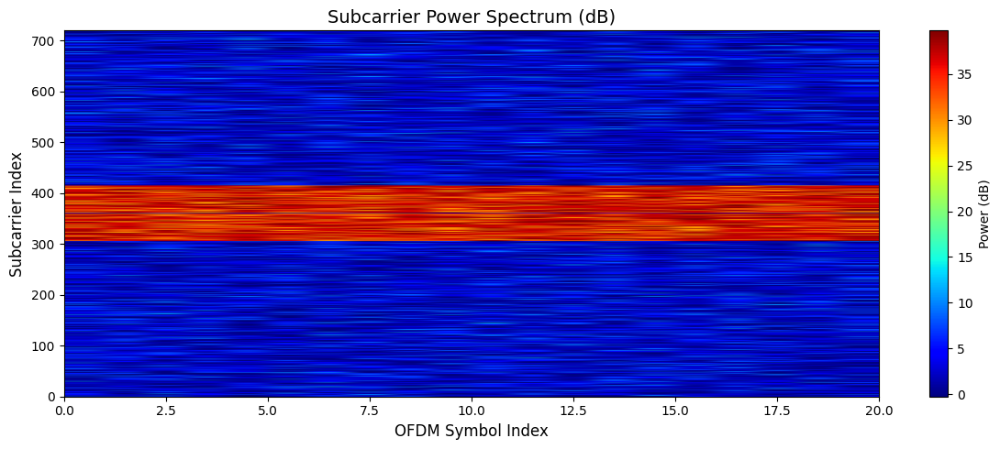

In [39]:
plot_subcarrier_power(full_power, ifft_size=720, num_symbols_actual=20)


In [44]:
def plot_constellation(X_fft, active_subcarriers):
    # Step 1: Extract symbols from active subcarriers (avoid DC, guard bands)
    rx_constellation = X_fft[:, active_subcarriers]  # shape: [num_symbols, num_active]

    # Step 2: Flatten to 1D array
    rx_symbols_flat = rx_constellation.flatten()

    # Step 3: Determine scaling for axis limits
    avg_power = np.mean(np.abs(rx_symbols_flat)**2)
    scale = 2 * np.sqrt(avg_power)

    # Step 4: Plot
    plt.figure(figsize=(6, 6))
    plt.scatter(rx_symbols_flat.real, rx_symbols_flat.imag, s=10, c='blue', alpha=0.6)
    plt.title('QPSK Constellation after OFDM Demodulation')
    plt.xlabel('In-phase')
    plt.ylabel('Quadrature')
    plt.grid(True)
    plt.axis('equal')
    plt.xlim([-scale, scale])
    plt.ylim([-scale, scale])
    plt.tight_layout()
    plt.show()


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


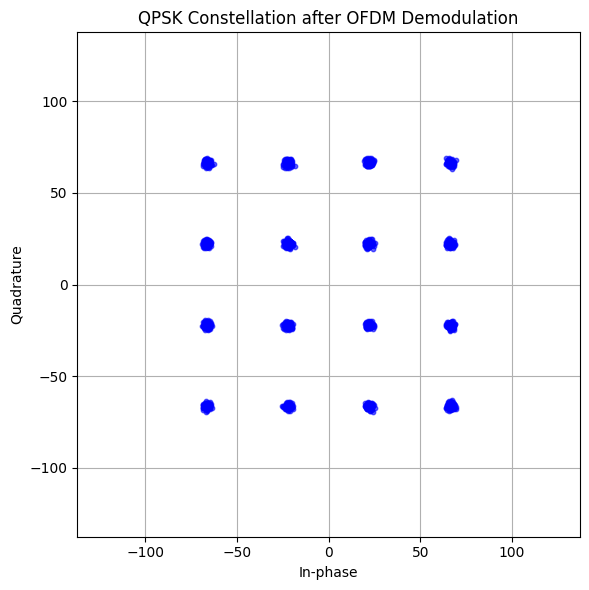

In [45]:
plot_constellation(X_fft, active_subcarriers)


In [3]:
class OFDM_TX_plus_channel: 
    def __init__(self,ifft_size,cp_length,num_symbols,mod_order,num_active):
        self.ifft_size = ifft_size
        self.cp_length = cp_length
        self.num_symbols = num_symbols
        self.mod_order = mod_order
        self.num_active = num_active 

    def OFDM_Tx(self):
        Ld = self.ifft_size
        Ls = Ld + self.cp_length 
        dc_index = self.ifft_size // 2 
        half = self.num_active // 2
        active_subcarriers = list(range(dc_index - half, dc_index)) + \
                            list(range(dc_index + 1, dc_index + half + 1))
        return dc_index, active_subcarriers

    def generate_mqam_symbols(self):
        bits_per_symbol = int(np.log2(self.mod_order))
        total_bits = self.num_active * self.num_symbols * bits_per_symbol
        bits = np.random.randint(0,2,total_bits) 
        symbol_bin = bits.reshape(-1,bits_per_symbol) 
        bits_per_axis = bits_per_symbol // 2 
        M_axis = int(np.sqrt(self.mod_order)) 
        bits_I = symbol_bin[:, :bits_per_axis] 
        bits_Q = symbol_bin[:, bits_per_axis:] 
        def bin2dec(arr): 
            return arr.dot(1 << np.arange(arr.shape[-1]-1,-1,-1))
        I_indices = bin2dec(bits_I)
        Q_indices = bin2dec(bits_Q) 
        I_vals = 2*I_indices - (M_axis - 1)
        Q_vals = 2*Q_indices - (M_axis - 1)
        qam_data = I_vals + 1j*Q_vals 
        qam_data /= np.sqrt(np.mean(np.abs(qam_data)**2))

        return qam_data, bits 

    def generate_ofdm_signal(self, qam_data, active_subcarriers, dc_index):
        self.num_active = len(active_subcarriers)
        symbol_matrix = np.zeros((self.num_symbols, self.ifft_size), dtype=complex)
        ofdm_signal = []

        for i in range(self.num_symbols):
            idx_start = i * self.num_active
            idx_end = (i + 1) * self.num_active
            this_symbol = qam_data[idx_start:idx_end]
            freq_data = np.zeros(self.ifft_size, dtype=complex)
            freq_data[active_subcarriers] = this_symbol
            freq_data[dc_index] = 0  # Null DC
            time_data = np.fft.ifft(freq_data) * np.sqrt(self.ifft_size)
            symbol_matrix[i, :] = freq_data
            cp = time_data[-self.cp_length:]
            ofdm_symbol = np.concatenate((cp, time_data))
            ofdm_signal.append(ofdm_symbol)

        ofdm_signal = np.concatenate(ofdm_signal)
        ofdm_signal /= np.sqrt(np.mean(np.abs(ofdm_signal) ** 2))

        return ofdm_signal, symbol_matrix

    def add_noise_and_pad(self,ofdm_signal, noise_snr_db, left_pad, right_pad, save_path='OFDM_Rx_Signal.mat'):
        signal_power = np.mean(np.abs(ofdm_signal)**2)
        noise_power = signal_power / (10**(noise_snr_db / 10))
        noise_std = np.sqrt(noise_power / 2)
        inband_noise = noise_std * (np.random.randn(len(ofdm_signal)) + 1j * np.random.randn(len(ofdm_signal)))
        ofdm_signal_noisy = ofdm_signal + inband_noise
        noise_before = noise_std * (np.random.randn(left_pad) + 1j * np.random.randn(left_pad))
        noise_after  = noise_std * (np.random.randn(right_pad) + 1j * np.random.randn(right_pad))
        final_signal = np.concatenate([noise_before, ofdm_signal_noisy, noise_after])
        savemat(save_path, {'final_signal': final_signal})

        return final_signal


    def apply_multipath_fading(self,ofdm_signal, num_taps=3, alpha_rayleigh=0.7, snr_db=None,fs=1.0):
        """
        Apply Rayleigh multipath fading with exponential power decay.

        Parameters:
        - signal: Transmitted baseband signal (1D numpy array)
        - num_taps: Number of Rayleigh multipath taps (L)
        - alpha_rayleigh: Exponential decay rate for tap powers (typical: 0.3–1.0)
        - snr_db: Additive white Gaussian noise level in dB (optional)

        Returns:
        - faded_signal: Signal after Rayleigh fading (and AWGN if specified)
        - h: Channel impulse response (complex numpy array of length `num_taps`)
        """
        # Compute exponential power delay profile
        tap_powers = np.exp(-alpha_rayleigh * np.arange(num_taps))
        tap_powers /= np.sum(tap_powers)  # Normalize total power to 1

        # Generate complex Rayleigh fading taps
        h_real = np.random.randn(num_taps) * np.sqrt(tap_powers / 2)
        h_imag = np.random.randn(num_taps) * np.sqrt(tap_powers / 2)
        h = h_real + 1j * h_imag

        # Convolve signal with channel impulse response
        faded_signal = np.convolve(ofdm_signal, h, mode='full')[:len(ofdm_signal)]

        # Optional: Add AWGN based on target SNR
        if snr_db is not None:
            signal_power = np.mean(np.abs(faded_signal)**2)
            noise_power = signal_power / (10 ** (snr_db / 10))
            noise_std = np.sqrt(noise_power / 2)
            noise = noise_std * (np.random.randn(len(faded_signal)) + 1j * np.random.randn(len(faded_signal)))
            faded_signal += noise

        N = len(ofdm_signal)
        t = np.arange(N) / fs

        plt.figure(figsize=(12, 6))
        plt.subplot(3, 1, 1)
        plt.plot(t, ofdm_signal.real, label='Real')
        plt.title("faded_signal")
        plt.ylabel('Real')
        plt.grid(True)

        plt.subplot(3, 1, 2)
        plt.plot(t, ofdm_signal.imag, label='Imag', color='orange')
        plt.ylabel('Imaginary')
        plt.grid(True)

        plt.subplot(3, 1, 3)
        plt.plot(t, np.abs(signal), label='Magnitude', color='green')
        plt.ylabel('Magnitude')
        plt.xlabel('Time (samples)' if fs == 1.0 else 'Time (s)')
        plt.grid(True)

        plt.tight_layout()
        plt.show()

        plt.stem(np.arange(num_taps), tap_powers)
        plt.title("Exponential Tap Power Decay")
        plt.xlabel("Tap Index")
        plt.ylabel("Power")
        plt.grid(True)
        plt.show()

        return faded_signal, h

    def rician_fading(self,ofdm_signal, num_taps, K_dB, alpha_rayleigh, snr_db=None):
        """
        Apply Rician fading to a complex baseband signal.

        Parameters:
        - signal: Input complex baseband signal (1D array)
        - num_taps: Number of channel taps (L)
        - K_dB: Rician K-factor in dB (ratio of LOS to NLOS power)
        - alpha_rayleigh: Exponential decay rate for NLOS taps
        - snr_db: Optional SNR in dB for AWGN

        Returns:
        - faded_signal: Signal after convolution with Rician fading channel
        - h: Channel impulse response (complex-valued)
        """
        # Convert K-factor from dB to linear scale
        K_linear = 10**(K_dB / 10)

        # Compute power profile of NLOS (Rayleigh) taps
        tap_powers_nlos = np.exp(-alpha_rayleigh * np.arange(num_taps))
        tap_powers_nlos /= np.sum(tap_powers_nlos)

        # Total power is normalized to 1: divide between LOS and NLOS
        total_power = 1.0
        power_nlos = total_power / (1 + K_linear)
        power_los = total_power * K_linear / (1 + K_linear)

        # Construct NLOS Rayleigh component
        h_nlos = (np.random.randn(num_taps) + 1j * np.random.randn(num_taps)) * np.sqrt((power_nlos * tap_powers_nlos) / 2)

        # Construct LOS deterministic component (only first tap has LOS)
        h_los = np.zeros(num_taps, dtype=complex)
        h_los[0] = np.sqrt(power_los)  # deterministic LOS at delay 0

        # Combine to get final channel impulse response
        h = h_los + h_nlos

        # Convolve the signal with the Rician channel
        faded_signal = np.convolve(ofdm_signal, h, mode='full')[:len(ofdm_signal)]

        # Add AWGN if specified
        if snr_db is not None:
            signal_power = np.mean(np.abs(faded_signal)**2)
            noise_power = signal_power / (10 ** (snr_db / 10))
            noise_std = np.sqrt(noise_power / 2)
            noise = noise_std * (np.random.randn(len(faded_signal)) + 1j * np.random.randn(len(faded_signal)))
            faded_signal += noise
        
        plt.figure(figsize=(10, 3.5))
        plt.plot(np.abs(ofdm_signal), color='purple', linewidth=1)
        plt.title("Received Signal Envelope")
        plt.xlabel("Sample Index")
        plt.ylabel("Magnitude")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        taps = np.arange(len(h))
        plt.figure(figsize=(10, 4))
        plt.subplot(1, 2, 1)
        plt.stem(taps, np.abs(h))
        plt.title("Magnitude of Channel Taps")
        plt.xlabel("Tap Index")
        plt.ylabel("|h[l]|")
        plt.grid(True)

        plt.subplot(1, 2, 2)
        plt.stem(taps, np.angle(h))
        plt.title("Phase of Channel Taps")
        plt.xlabel("Tap Index")
        plt.ylabel("∠h[l] (rad)")
        plt.grid(True)

        plt.tight_layout()
        plt.show()

        return faded_signal, h


    def ofdm_demodulate(self,ofdm_signal_noisy, ifft_size, cp_length):
        Ld = ifft_size
        Ls = Ld + cp_length
        num_symbols_actual = len(ofdm_signal_noisy) // Ls
        X_matrix = ofdm_signal_noisy[:num_symbols_actual * Ls].reshape((num_symbols_actual, Ls))
        X_no_cp = X_matrix[:, cp_length:] 
        X_fft = np.fft.fft(X_no_cp, axis=1)
        power_matrix = np.abs(X_fft) ** 2  
        full_power = np.zeros((num_symbols_actual, ifft_size))
        full_power[:, :Ld] = power_matrix

        return full_power, X_fft, power_matrix

    def plot_subcarrier_power(self,power_matrix, ifft_size, num_symbols_actual):
        power_db = 10 * np.log10(power_matrix + 1e-12)  # avoid log(0)
        plt.figure(figsize=(12, 5))
        extent = [0, num_symbols_actual, 0, ifft_size]
        im = plt.imshow(
            power_db.T,
            aspect='auto',
            extent=extent,
            origin='lower',
            cmap='jet',
            vmin=np.max(power_db) - 40,
            vmax=np.max(power_db)
        )
        plt.title('Subcarrier Power Spectrum (dB)', fontsize=14)
        plt.xlabel('OFDM Symbol Index', fontsize=12)
        plt.ylabel('Subcarrier Index', fontsize=12)
        plt.colorbar(im, label='Power (dB)')
        plt.grid(False)
        plt.tight_layout()
        plt.show()
    
    def plot_autocorrelation(self,signal, max_lag=None):
        N = len(signal)
        if max_lag is None:
            max_lag = N // 2
        corr = np.correlate(signal, signal, mode='full') 
        lags = np.arange(-N + 1, N)
        corr = corr / np.max(np.abs(corr)) 
        positive_lags = lags >= 0
        lags_positive = lags[positive_lags][:max_lag]
        Rxx_positive = corr[positive_lags][:max_lag]
        plt.figure(figsize=(10, 4))
        plt.plot(lags_positive, np.abs(Rxx_positive))
        plt.title('Autocorrelation of the Received Signal')
        plt.xlabel('Lag')
        plt.ylabel('Autocorrelation Coefficient')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    def plot_psd(self,power_matrix, ifft_size, fs=1.0):
        avg_power = np.mean(power_matrix, axis=0)
        psd_shifted = np.fft.fftshift(avg_power) / (fs / ifft_size)
        psd_db = 10 * np.log10(psd_shifted + 1e-12)
        if ifft_size % 2 == 0:
            freq_axis = np.linspace(-fs/2, fs/2, ifft_size, endpoint=False)
        else:
            freq_axis = np.linspace(-fs/2, fs/2, ifft_size)
        plt.figure(figsize=(10, 4))
        plt.plot(freq_axis, psd_db, linewidth=1.2)
        plt.title('Power Spectral Density (dB/Hz)')
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('PSD (dB/Hz)')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    def plot_constellation(self,X_fft, active_subcarriers):
        rx_constellation = X_fft[:, active_subcarriers] 
        rx_symbols_flat = rx_constellation.flatten()
        avg_power = np.mean(np.abs(rx_symbols_flat)**2)
        scale = 2 * np.sqrt(avg_power)
        plt.figure(figsize=(6, 6))
        plt.scatter(rx_symbols_flat.real, rx_symbols_flat.imag, s=10, c='blue', alpha=0.6)
        plt.title('QPSK Constellation after OFDM Demodulation')
        plt.xlabel('In-phase')
        plt.ylabel('Quadrature')
        plt.grid(True)
        plt.axis('equal')
        plt.xlim([-scale, scale])
        plt.ylim([-scale, scale])
        plt.tight_layout()
        plt.show()




---

# Receiver 

## OFDM Signal Processing (Receiver Side) 

A complete **baseband receiver-side analysis** of an OFDM signal:

* Synchronization via energy threshold and correlation
* CP detection to validate symbol structure
* FFT demodulation for symbol extraction
* Visualization of constellation and power spectrum
* Subcarrier diagnostics for quality inspection

Unkown parameters: 

- CP length
- FFT length
- Symbol start index
- Symbol stop index
- Null subcarriers

### 1. **Signal Preprocessing**

* Load the received signal (input data)
* Define OFDM parameters:
  * Estimate symbol start index 
  * Estimate symbol stop index 
  * Estimate cyclic prefix length for symbols 
  * Estimate total number of symbols

### 2. **Autocorrelation for Rough Symbol Start**

* Compute autocorrelation of the received signal to identify repeating structure.
* Detect the **initial start index** of OFDM symbols based on energy thresholding.
* Use a moving window to refine this estimate.


### 3. **Cyclic Prefix (CP) Correlation-Based Detection**

* Sweep over candidate start indices around the rough estimate.
* For each, check the correlation between CP and end of symbols.
* Select the start index that gives the **maximum average CP correlation**.


### 4. **Symbol Extraction and FFT**

* From the chosen start index, extract all OFDM symbols.
* Remove the cyclic prefix from each.
* Perform FFT on each symbol to transform to the frequency domain.
* Apply `fftshift` to center the DC subcarrier.


### 5. **Constellation Plotting**

* Flatten all subcarriers from all symbols into a single array.
* Plot real vs. imaginary values of subcarriers to visualize:

  * Identify modulation type (e.g., QPSK, QAM)
  * Analyze signal quality and distortions

### 6. **Subcarrier Power Analysis**

* Calculate power per subcarrier for each symbol.
* Identify **low-power (null or attenuated)** subcarriers.
* Use `stem` plots to highlight which subcarriers fall below a threshold (e.g., power < threshold).
* Overplot known null subcarriers for verification.


---

# 1. Signal Preprocessing 

## 2. Autocorrelation Analysis of Received Signal

Computing **autocorrelation** of the received signal to analyze its periodic structure and estimate symbol length.

### Autocorrelation Function

For a real-valued discrete signal $x[n]$, the autocorrelation function $R_{xx}[k]$ is defined as:

$$
R_{xx}[k] = \sum_{n} x[n] \cdot x[n+k]
$$

Where:

* $k$ is the **lag** (shift),
* For negative $k$, we evaluate $x[n] \cdot x[n - |k|]$,
* For normalization (`'coeff'`), we divide by the maximum value of $|R_{xx}[k]|$.

### Why Autocorrelation?

* Peaks in the autocorrelation function at non-zero lags can indicate **periodic patterns**.
* In digital communications, repeated symbol structures create peaks at multiples of **symbol length**.
* Here, a peak at lag = x, suggests the symbol duration is approximately **x samples**.


* Repeated peaks suggest periodicity in the received signal.
* If a peak occurs at lag ≈ x, it implies a **symbol duration** of x samples:

## Start Index Detection Based on Noise Threshold

The **start of the useful signal** in a received waveform based on power thresholding

- Estimate background noise power from the samples.
- Detect where the signal power significantly exceeds the noise.
- Mark and highlight a region around the detected start index.


### Noise Power Estimation

If roughly N samples are noisy samples at the beginning of received signal, then:

$$
P_{\text{noise}} = \frac{1}{N} \sum_{n=1}^{N} |x[n]|^2
$$

Where:

- \( x[n] \) is the received signal,
- \( |x[n]| \) is the magnitude (for complex signals).

### Threshold-Based Detection

We detect the **first index** where the signal power exceeds a multiple of the noise power:

$$
\text{start\_index} = \min \left\{ n : |x[n]|^2 > \text{Threshold} \cdot P_{\text{noise}} \right\}
$$



# 3. Cyclic Prefix (CP) Correlation-Based Detection

Implementing a correlation-based search to **refine the start index** of an OFDM-like signal by detecting the **CP** structure within a predefined range.

To scan a window of possible start indices near the initial estimate and find the one that:

- Maximizes **CP autocorrelation**, indicating correct symbol alignment.
- Helps identify where **OFDM symbols** begin reliably.

### OFDM Symbol Structure

- Each symbol has a **CP** prepended.
- CP is a copy of the last part of the symbol.
- This helps mitigate inter-symbol interference (ISI) and aids synchronization.

If  \(L_d\)  is the symbol length and \(L_{cp}\) is the CP length, the total symbol duration is:

$$
T_d = L_{cp} + L_d
$$



### CP Correlation Metric

To detect the symbol start, we compute the **correlation** between:

The **first \( L_{cp} \)** samples of the symbol, and  
The **last \( L_{cp} \)** samples of the same symbol.

$$
\text{Correlation}(L_{cp}) = \left| \sum_{n=0}^{L_{cp}-1} x[n] \cdot x^*[T_d - L_{cp} + n] \right|
$$

This is computed for several symbols and averaged across symbols to smooth the estimate.


### Assumptions

- Each OFDM-like symbol has length `Ld`
- The total symbol duration is `Td = L_cp + Ld`, where `L_cp` is the cyclic prefix.
- The signal starts approximately at sample 398.


For a candidate CP length `L_cp`, and a symbol starting at index \( i \), the **cyclic prefix correlation** is:

$$
Correlation(L_{cp}, i) = | sum( conj(x[0:L_{cp}]) * x[-L_{cp}:] ) |
$$

Where:

- `x` is the signal segment of one symbol of length `Td = L_cp + Ld`,

- `x[0:L_cp]` is the start (prefix),

- `x[-L_cp:]` is the end (suffix),

- The correlation magnitude evaluates cyclic similarity.

### Algorithm Steps

1. **Scan candidate start indices** from `start_index - 100` to `start_index + 100`.

2. For each candidate `j`, extract the signal: `x = rx_signal[j:]`.

3. For each possible CP length 
            $$L_{cp} \in [1, L_d/4]$$

    - Loop over 10 symbols (`i = 1` to `10`).
    - For each symbol, extract the CP and tail, then compute their correlation.


4. Store the **maximum average correlation** across CP lengths for each candidate index.

5. Identify the index with **maximum CP alignment**.



### Cyclic Prefix Estimation for Fixed Start Index

Examining the structure of an OFDM-like signal starting from a fixed `start_index` to evaluate the correlation between the cyclic prefix and the end of each symbol.

- Detect if the signal exhibits repeated cyclic structure.
- Plot correlation metrics per symbol.
- Average correlation results to validate CP length estimation.


### Algorithm

1. For each symbol index `i = 1` to `10`:

   - Try all possible CP lengths from 1 to `Ld / 4`.

   - Extract the full symbol of length `Td = L_cp + Ld`.

   - Compute correlation between prefix and suffix.

   - Store result in a matrix `c`.

2. Plot correlation profile for each symbol:

   - X-axis: CP length candidate
   - Y-axis: Correlation magnitude

3. Average the CP correlation results over all symbols:

   - This helps remove noise and verify stable structure.

4. Report maximum averaged correlation:

   - Indicates strongest CP candidate for alignment.



This analysis helps visually verify whether a **cyclic prefix structure** exists and if the starting point is aligned with the symbol boundary.

- Sharp peaks in correlation plots confirm cyclic structure.
- High average correlation across multiple symbols suggests reliable CP detection.


## 5. OFDM Symbol Extraction and Constellation Plotting

This process analyzes an OFDM-like signal by segmenting it into symbols, removing CP, performing FFT, and plotting the constellation diagram to visualize modulation characteristics.

- Support symbol extraction at different downsampling factors `k`.
- Apply CP removal and FFT per symbol.
- Flatten the frequency-domain symbols into one array.
- Plot the resulting constellation.


### Steps

1. **Symbol Slicing**

   From the signal $x[n]$, we extract an integer number of symbols:

   $$
   \text{total\_length} = \text{num\_symbols} \times L_s
   $$

   Then reshape into matrix $x_{\text{symbols}} \in \mathbb{C}^{L_s \times N_{\text{sym}}}$.

2. **CP Removal**

   Remove first `Lcp` samples of each symbol:

   $$
   x_{\text{no\_cp}} = x_{\text{symbols}}[L_{\text{cp}}:, :]
   $$

3. **FFT per Symbol**

   Apply FFT to each column (symbol):

   $$
   X_k = \text{FFT}(x_{\text{no\_cp}}[:, k])
   $$

4. **FFT Shift**

   Center the DC component using `fftshift`.

5. **Flatten Constellation**

   Flatten all subcarriers from all symbols:

   $$
   \text{constellation\_points} = \text{flatten}(X_{\text{symbols}})
   $$

## 6. OFDM Demodulation and Constellation Plotting

### Signal Segmentation and FFT

Implementation of an OFDM demodulation process that uses multiple start indices to extract frequency-domain constellation points.

- Refine symbol synchronization using multiple candidate start indices.
- Demodulate OFDM-like symbols by removing the cyclic prefix and performing FFT.
- Visualize constellation points for quality analysis of the modulation scheme.

### Parameters

   - **Downsampling factor (k):** Determines resolution. Only `k = 1` is used in this run.
   - **Cyclic Prefix (CP) length:** `Lcp = Lcp / k`
   - **Data symbol length (Ld):** `Ld = Lc / k`
   - **Total symbol length:** `Ls = Lcp + Ld`
   - **Start indices tested:** `indd ∈ [start_index+1, start_index+2, start_index+3]`
   - **Number of symbols:** Fixed at 21



1. **Start Index Selection**

   - For each `indd` in the range `[start_index+1, start_index+2, start_index+3]`, the signal is processed from that point onward.
   - This tests alignment sensitivity.

2. **Signal Truncation**

   - Extract a fixed number of complete OFDM symbols (21 symbols of length `Ls`).
   - The signal is reshaped into a 2D matrix of size `(Ls, num_symbols)`.

3. **Cyclic Prefix Removal**

   - For each symbol, remove the first `Lcp` samples.
   - Resulting matrix has shape `(Ld, num_symbols)`.

4. **FFT Processing**

   - Apply FFT to each symbol column to transform into the frequency domain.
   - Use `fftshift` to center the DC component.

5. **Flatten and Plot**

   - Flatten the matrix into a 1D array of constellation points.
   - Plot the real vs. imaginary parts to visualize modulation (e.g., QPSK, 16-QAM).



## 7. Subcarrier Power Analysis 

### OFDM Demodulation with Subcarrier Power Analysis

OFDM demodulation on a received signal with:

- Cyclic prefix removal
- FFT and FFT shift
- Power thresholding on subcarriers
- Visualization of low-power carriers and frequency-domain content


- Identify weak subcarriers (e.g., due to fading or zero-padding)
- Plot per-symbol power spectrum
- Visualize constellation of demodulated symbols



### Parameters

- **Downsampling factor (k):** 1
- **Cyclic prefix (CP):** `Lcp = Lcp / k`
- **Data symbol length:** `Ld = Ld / k`
- **Total symbol length:** `Ls = Lcp + Ld`
- **Start index (`indd`)**: `start_index`
- **Number of symbols processed**: estimated_symbols


### Processing Steps

1. **Signal Extraction**
   - Slice signal from `indd` onward.
   - Truncate to `total_length = num_symbols * Ls`.

2. **Reshape into Symbols**
   - Reshape into a matrix: `x_symbols ∈ ℂ^{Ls × num_symbols}`.
   - Remove CP: `x_no_cp = x_symbols[Lcp:, :]`.

3. **Frequency-Domain Transformation**
   - Perform FFT on each column (symbol).
   - Apply `fftshift` to center DC component.

4. **Low-Power Subcarrier Detection**
   - Compute magnitude squared of each FFT bin.
   - Identify entries where power `< 20`.
   - Plot with a **stem plot**:
     - X-axis: Symbol index
     - Y-axis: Subcarrier index


5. **Per-Symbol Power Spectrum**
   - Plot power of all subcarriers across symbols 1 to estimated_symbols.
   - Each curve shows the subcarrier power for one OFDM symbol.

6. **Constellation Visualization**
   - Flatten the FFT matrix.
   - Plot real vs. imaginary components of all subcarriers to assess:
     - Modulation type
     - Noise and phase distortion


## Use Cases

- Check spectral nulls or filter effects
- Evaluate subcarrier energy distribution
- Validate modulation under different timing assumptions

   - Extend `k` to other values for resolution studies.
   - Adjust power threshold (`< 20`) for more or fewer detected subcarriers.


### Possible Cause of the Central Cluster: 

#### 1. DC subcarrier 

Noise and channel effects can cause DC bin to accumulate energy at the receiver. 

#### 2. Inactive or zeroed subcarriers: 

Many subcarriers are intentionally zeroed (guard bands) 
After passing through a channel (and added noise), those subcarriers can have small non-zero values which cluster zero. 

We must plot only the active subcarriers. 

#### 3. Noise Leakage: 

If SNR is moderate, noise leaks into zeroed bins and we'll see a noisy zero-energy cluster around 0,0

#### 4. Receiver demodulating blindly: 

If receiver blindly demodulates all 720 FFT outputs, we'll naturally get a lot of low-energy noisy points, especially at inactive bins. 




---
---
---


### Realistic Channel Models

More realistic environments:

* **Multipath fading**: Add Rayleigh or Rician fading (`scipy.signal.convolve` or tap delay line).
* **Doppler spread**: For mobile scenarios, apply time-varying channel impulse responses.
* **Frequency offset & phase noise**: Model oscillator mismatch and jitter.
* **Timing offset & jitter**: Add sample delays and timing estimation error.

---

### Synchronization Mechanisms

Real receivers implement:

* **Timing synchronization** (e.g., using cyclic prefix autocorrelation or Schmidl-Cox algorithm).
* **Frequency offset correction**.
* **Frame detection** (using preamble sequences like Zadoff-Chu or PN sequences).

---

### Channel Estimation & Equalization

Instead of assuming perfect channel knowledge:

* Insert **pilot symbols** or use **training sequences**.
* Implement **LS (Least Squares)** or **MMSE equalization**.
* Plot **channel frequency response** and estimate SNR per subcarrier.

---

### Performance Metrics & Visualization

* BER vs. SNR (you’re doing this already).
* **EVM (Error Vector Magnitude)**.
* **Constellation diagram before/after equalization**.
* **Spectrogram or PSD of transmitted signal**.

---


### Adding Forward Error Correction (FEC)

Industry systems always use FEC:

* Add **convolutional coding** (with `commpy`), **LDPC**, or **Turbo codes**.
* Use **soft-decision decoding** and integrate with BER evaluation.

---

### Hardware-Aware Constraints

* Quantization: Add ADC/DAC effects (bit depth).
* Clipping & PAPR: Add non-linearities and evaluate Peak-to-Average Power Ratio (PAPR).
* Power normalization across symbols.

---

### Exporting to SDR / Real-Time

* Generate `.wav` files or IQ samples for use in **GNU Radio**, **SDR hardware**, or **Simulink**.
* Use `pyserial` or `SoapySDR` if moving toward embedded/hardware.

---

### Example Goal:

> **End-to-End OFDM Tx/Rx with multipath fading, synchronization, pilot-aided channel estimation, FEC, and BER vs. SNR analysis — all modular and ready for SDR testing.**



In [1]:
class OFDM_RX: 
    def __init__(self, rx_signal):
        self.rx_signal = rx_signal
    
    def signal_preprocessing(self,initial_start,threshold_start): 
        plt.figure()
        plt.plot(np.abs(self.rx_signal))  # Magnitude
        plt.title('Magnitude of Received Signal')
        plt.xlabel('Sample Index')
        plt.ylabel('Magnitude')
        plt.grid(True)
        plt.show()

        plt.figure()
        plt.plot(np.abs(self.rx_signal)**2)  # Magnitude
        plt.xlabel('Sample Index')
        plt.ylabel('Magnitude^2')
        plt.grid(True)
        plt.show()

        noise1_power = np.mean(np.abs(self.rx_signal[:initial_start])**2) 

        # Find the start index where signal power exceeds noise threshold
        ind = np.where(np.abs(self.rx_signal)**2 > threshold_start * noise1_power)[0]
        start_index = ind[0] if len(ind) > 0 else None

        # Plot up to 5×start_index
        plt.figure(figsize=(10, 4))
        plt.plot(np.abs(self.rx_signal[:5*start_index]), label='|Received|')
        plt.axvline(start_index - 100, color='r', linestyle='--')
        plt.axvline(start_index + 100, color='r', linestyle='--')

        # Shade the region from (start_index - 100) to (start_index + 100)
        x_shade = [start_index - 100, start_index + 100, start_index + 100, start_index - 100]
        y_shade = [0, 0, 3, 3]  # Adjust height if needed based on your signal

        plt.fill(x_shade, y_shade, color='red', alpha=0.3, label='Detection Window')
        plt.title("Start Index Detection")
        plt.xlabel("Sample Index")
        plt.ylabel("Magnitude")
        plt.grid(True)
        plt.legend()
        plt.show()
        print("Start Index of Signal:", start_index)
        return start_index 
    

    def detect_end_index(self, noise_est_start, threshold_end, plot=True):
        # Estimate noise power from the known tail region
        noise_power = np.mean(np.abs(self.rx_signal[noise_est_start:])**2)
        threshold = threshold_end * noise_power
        power = np.abs(self.rx_signal)**2

        # Set where to start scanning for stop index (e.g., after halfway point)
        search_start = noise_est_start  # or dynamic: len(rx_signal) // 2
        window_len = 300

        stop_index = None
        for i in range(search_start, len(self.rx_signal) - window_len):
            window = power[i:i+window_len]
            if np.all(window < threshold):
                stop_index = i
                break
        if plot:
            plt.figure(figsize=(8, 4))
            plt.plot(np.abs(self.rx_signal), label='|Received Signal|')
            if stop_index:
                plt.axvline(stop_index, color='r', linestyle='--', label=f'Stop Index = {stop_index}')
            plt.axvspan(noise_est_start, len(self.rx_signal), color='red', alpha=0.3, label='Noise Estimation Region')
            plt.title('End-of-Signal Detection')
            plt.xlabel('Sample Index')
            plt.ylabel('Magnitude')
            plt.grid(True)
            plt.legend()
            plt.tight_layout()
            plt.show()
            print("Stop Index:", stop_index)

        return stop_index


    def autocorrelation(self,start_index,height):
        rx_clean = self.rx_signal[start_index:]  # Remove noise before OFDM signal
        N = len(rx_clean)
        max_lag = N // 2
        Rxx_full = np.correlate(rx_clean, rx_clean, mode='full')
        lags = np.arange(-N + 1, N)
        Rxx_full = Rxx_full / np.max(np.abs(Rxx_full))  # Normalize
        mid_index = len(Rxx_full) // 2
        Rxx_positive = Rxx_full[mid_index:(mid_index + max_lag + 1)]
        lags_positive = lags[mid_index:(mid_index + max_lag + 1)]

        plt.figure(figsize=(10, 4))
        plt.plot(lags_positive, np.abs(Rxx_positive))
        plt.title('Autocorrelation of Clean Received Signal')
        plt.xlabel('Lag (samples)')
        plt.ylabel('Normalized Autocorrelation')
        plt.grid(True)
        plt.show()
        peaks, _ = find_peaks(np.abs(Rxx_positive), height, distance=300)
        peak_lags = lags_positive[peaks]
        print("Detected peak lags:", peak_lags)
        if len(peak_lags) >= 2:
            diffs = np.diff(peak_lags)
            # symbol_duration_est = int(np.median(diffs))
            symbol_duration_est = peak_lags[1]
            print("Estimated Symbol Duration:", symbol_duration_est, "samples")
        else:
            print("Not enough peaks found to estimate symbol duration.")
            
        return symbol_duration_est
    

    def CP_detection(self,start_index,symbol_duration_est):
        Ld = symbol_duration_est
        mm = [] # maximum metric for CP
        search_range = range(start_index - 100, start_index + 100)

        # Loop over potential start indices around estimated start_index
        for j in search_range:
            x = self.rx_signal[j:]
            c = np.zeros((Ld // 4, 10))  # Rows: possible CP lengths, Cols: symbols (3 to 18)

            for i in range(1, 10):  # symbol indices
                for cp_len in range(1, Ld // 4 + 1):
                    Td = cp_len + Ld
                    start = (i - 1) * Td
                    end_ = i * Td
                    if end_ > len(x):
                        continue
                    x1 = x[start:end_]
                    c[cp_len - 1, i] = np.abs(np.sum(np.conj(x1[:cp_len]) * x1[-cp_len:]))

            cp_avg = np.mean(c, axis=1)
            mm.append(np.max(cp_avg))

        j_range = list(search_range)
        mm = np.array(mm)
        plt.figure(figsize=(10, 4))
        plt.stem(j_range, mm, linefmt='C0-', markerfmt='C0o', basefmt=" ")
        plt.title("Maximum CP Correlation vs. Start Index")
        plt.xlabel("Candidate Start Index")
        plt.ylabel("Max CP Metric")
        plt.grid(True)
        plt.show()
        mm_max_idx = j_range[np.argmax(mm)]
        print(f"Maximum CP Metric = {np.max(mm):.2f} at index = {mm_max_idx}")

        x = self.rx_signal[start_index:]
        c = np.zeros((Ld // 4, 19))  # Rows: CP lengths, Cols: symbol instances 

        # Process each symbol index from 3 to 20
        for i in range(3, 20):
            for cp_length_est in range(1, Ld // 4 + 1):
                Td = cp_length_est + Ld  # Total duration of one symbol with CP
                start = (i - 1) * Td
                end_ = i * Td
                if end_ > len(x):  # Safety check
                    continue
                x1 = x[start:end_]
                a = x1[:cp_length_est]
                b = x1[-cp_length_est:]
                numer = np.sum(np.conj(a) * b)
                denom = np.sqrt(np.sum(np.abs(a)**2) * np.sum(np.abs(b)**2))
                c[cp_length_est - 1, i-1] = np.abs(numer / denom)

            plt.figure(figsize=(6, 3))
            plt.plot(c[:, i - 1])
            plt.title(f"CP Correlation for Symbol {i}")
            plt.xlabel("CP Length Estimate")
            plt.ylabel("Correlation Magnitude")
            plt.grid(True)
            plt.tight_layout()
            plt.show()

        # Average CP correlation across symbols
        cp_avg = np.mean(c[:, :20], axis=1)  # Use only columns 0–7 (symbols 1 to 8)

        # Store maximum correlation (for this fixed start_index)
        mm_val = np.max(cp_avg)
        print(f"Max averaged CP correlation: {mm_val:.4f}")
        # Find CP length corresponding to maximum average correlation

        min_cp = 4  # Avoid CP = 1–3
        search_range = np.arange(min_cp, Ld // 4 + 1)
        valid_cp_avg = cp_avg[min_cp - 1:]  # cp_avg[3:] if min_cp = 4
        cp_index = np.argmax(valid_cp_avg)
        estimated_cp_length = search_range[cp_index]
        print(f"Estimated CP Length: {estimated_cp_length} samples")
        print("Edtimated Symbol Length, Ld: ", symbol_duration_est - estimated_cp_length)
        print("Estimated Symbol Length + CP, Td: ", symbol_duration_est)

        return estimated_cp_length


    def constellation(self,estimated_cp_length,symbol_duration_est,start_index,stop_index):
        x_raw = self.rx_signal

        for k in [1]:  # You can extend to [1, 2, 4, 5, 8, 10, 16, 20, 40]
            print(f"Processing for k = {k}")
            Lcp = int(estimated_cp_length/k)
            Ld = int(symbol_duration_est/k)
            Ls = Lcp + Ld  # Total symbol length
            print(f"  Lcp = {Lcp}, Ld = {Ld}, Ls = {Ls}")
            # print("start_index :", start_index)
            # print("stop index :", stop_index)
            signal_length = stop_index - start_index; #Total samples in signal
            num_symbols = int(signal_length / Ls); # Only complete symbols
            print(f" num_symbols = {num_symbols}")
            # downsampling (optional)
            x = x_raw[::k]
            for indd in [start_index]:
                print(f"  Start index = {indd}")
                x = x_raw[indd:]
                N = len(x)
                # num_symbols = len(x) // Ls  # Fixed manually
                total_length = num_symbols * Ls
                if total_length > N:
                    print("  Not enough data to extract symbols.")
                    continue
                x_truncated = x[:total_length]
                # Reshape into symbols: shape = (Ls, num_symbols)
                x_symbols = x_truncated.reshape((Ls, num_symbols), order='F')
                # Remove CP from each symbol (result: shape = (Ld, num_symbols))
                x_no_cp = x_symbols[Lcp:, :]
                # Perform FFT on each column (along rows)
                X_symbols = np.fft.fft(x_no_cp, n=Ld, axis=0)
                # Shift frequency spectrum (zero-freq to center)
                X_symbols = np.fft.fftshift(X_symbols, axes=0)
                # Flatten to 1D vector
                constellation_points = X_symbols.flatten()
                # Plot the constellation
                plt.figure(figsize=(6, 6))
                plt.plot(np.real(constellation_points), np.imag(constellation_points), 'o', markersize=2)
                plt.title(f'Constellation (k = {k})')
                plt.xlabel('In-phase')
                plt.ylabel('Quadrature')
                plt.grid(True)
                plt.axis('equal')
                plt.show()
                return num_symbols
        
    def constellation_vs_start_index(self,start_index,symbol_duration_est,estimated_cp_length,num_symbols):
        Ld = symbol_duration_est
        Lcp = estimated_cp_length
        for k in [1]:
            Lcp = int(Lcp / k)  # Adjusted CP length
            Ld = int(Ld / k)  # Adjusted data (useful symbol) length
            Ls = Lcp + Ld      # Total OFDM symbol length
            print(f"\nProcessing with k={k}, Lcp={Lcp}, Ld={Ld}, Ls={Ls}")
            print(f" num_symbols = {num_symbols}")
            for indd in range(start_index-1, start_index + 3):  
                print(f"  Processing start index: {indd}")
                x = self.rx_signal[indd:]
                N = len(x)
                total_length = num_symbols * Ls
                if total_length > N:
                    print("  Skipping: Not enough data.")
                    continue
                # Truncate signal to complete symbols
                x_truncated = x[:total_length]
                # Reshape into (Ls, num_symbols) matrix
                x_symbols = x_truncated.reshape((Ls, num_symbols), order='F')
                # Remove CP from each symbol → shape (Ld, num_symbols)
                x_no_cp = x_symbols[Lcp:, :]
                # Apply FFT on each symbol (column-wise)
                X_symbols = np.fft.fft(x_no_cp, n=Ld, axis=0)
                # Shift zero-frequency to center
                X_symbols = np.fft.fftshift(X_symbols, axes=0)
                # Flatten to form 1D list of constellation points
                constellation_points = X_symbols.flatten()
                plt.figure(figsize=(6, 6))
                plt.plot(np.real(constellation_points), np.imag(constellation_points), 'o', markersize=2)
                plt.title(f'Constellation (k={k}, start={indd})')
                plt.xlabel('In-phase')
                plt.ylabel('Quadrature')
                plt.grid(True)
                plt.axis('equal')
                plt.tight_layout()
                plt.show()


    def PSD_RX(self,symbol_duration_est,estimated_cp_length,start_index,num_symbols):
        Lcp = estimated_cp_length
        Ld = symbol_duration_est
        Ls = Lcp + Ld
        for k in [1]:
            print(f"\nProcessing with k={k}, Lcp={Lcp}, Ld={Ld}, Ls={Ls}")
            for indd in [start_index]:
                x = self.rx_signal[indd:]
                N = len(x)
                # num_symbols = estimated_symbols
                total_length = num_symbols * Ls
                if total_length > N:
                    print("Not enough data for full symbols")
                    continue

                x_truncated = x[:total_length]
                x_symbols = x_truncated.reshape((Ls, num_symbols), order='F')
                x_no_cp = x_symbols[Lcp:, :]  # shape: (Ld, num_symbols)
                # FFT + fftshift
                X_symbols = np.fft.fftshift(np.fft.fft(x_no_cp, n=Ld, axis=0), axes=0)
                # Detect low-power subcarriers (|X|^2 < 20)
                magnitude_squared = np.abs(X_symbols)**2
                rows, cols = np.where(magnitude_squared < 20)
                # Stem plot of low-power subcarriers
                plt.figure(figsize=(6, 3))
                plt.stem(cols, rows, linefmt='gray', markerfmt='ko', basefmt=' ')
                plt.title('Low-Power Subcarriers')
                plt.xlabel('Symbol Index')
                plt.ylabel('Subcarrier Index')
                plt.grid(True)
                plt.tight_layout()
                plt.show()
                # Per-symbol power spectrum
                plt.figure(figsize=(10, 5))
                for l in range(2, num_symbols): 
                    plt.plot(range(Ld), magnitude_squared[:, l])
                plt.xlabel('Subcarrier')
                plt.ylabel('Power')
                plt.title('Power Spectrum of OFDM Subcarriers')
                plt.grid(True)
                plt.tight_layout()
                plt.show()



---
# Multi-path Fading Channel (Rayleigh Fading)
    
In realistic wireless environments, transmitted signals often encounter multiple reflections, scatterings, and diffractions before reaching the receiver. These **multipath components** interfere with each other, resulting in **fading**, a major phenomenon in wireless communication systems.

When no **line-of-sight (LOS)** path exists and there are many randomly phased multipath components, the channel is modeled as a **Rayleigh fading channel**.

The **baseband-equivalent received signal** $y[n]$ under a discrete-time multipath Rayleigh fading channel with **$L$** taps is given by:

$$
y[n] = \sum_{\ell=0}^{L-1} h[\ell] \cdot x[n - \ell] + w[n]
$$

where:

* $x[n]$: Transmitted signal (complex baseband)
* $h[\ell]$: Channel impulse response coefficient of the $\ell$-th path
* $L$: Number of multipath taps
* $w[n]$: Additive white Gaussian noise (AWGN)


### Channel Impulse Response $h[\ell]$

Each tap $h[\ell]$ is modeled as a **complex Gaussian random variable**:

$$
h[\ell] \sim \mathcal{CN}(0, \sigma_\ell^2)
$$

where $\sigma_\ell^2$ is the power of the $\ell$-th tap. 

This means:

$$
h[\ell] = h_{\text{real}}[\ell] + j \cdot h_{\text{imag}}[\ell]
$$

where:

$$
h_{\text{real}}[\ell] \sim \mathcal{N}\left(0, \frac{\sigma_\ell^2}{2} \right), \quad
h_{\text{imag}}[\ell] \sim \mathcal{N}\left(0, \frac{\sigma_\ell^2}{2} \right)
$$

This ensures that the total power is:

$$
\mathbb{E}[|h[\ell]|^2] = \frac{\sigma_\ell^2}{2} + \frac{\sigma_\ell^2}{2} = \sigma_\ell^2
$$

### Probability Density Function (PDF) of $h_{\text{real}}[\ell]$

$$
f_{h_{\text{real}}}(x) = \frac{1}{\sqrt{2\pi \cdot \sigma_\ell^2 / 2}} \cdot \exp\left( -\frac{x^2}{2 \cdot \sigma_\ell^2 / 2} \right)
= \frac{1}{\sqrt{\pi \sigma_\ell^2}} \cdot \exp\left( -\frac{x^2}{\sigma_\ell^2} \right)
$$

The same form holds for $h_{\text{imag}}[\ell]$, due to symmetry.


### Magnitude Distribution

The magnitude $|h[\ell]|$ follows a **Rayleigh distribution** (since both components are i.i.d. $\mathcal{N}(0, \sigma_\ell^2/2)$):

$$
f_{|h|}(r) = \frac{r}{\sigma_\ell^2} \exp\left( -\frac{r^2}{2 \cdot \sigma_\ell^2} \right), \quad r \geq 0
$$

This is why we call the fading **Rayleigh** fading — even though the components are Gaussian, the magnitude is Rayleigh-distributed.


A common power profile is **exponential decay**, representing stronger early paths and weaker delayed reflections:

$$
\sigma_\ell^2 = \frac{e^{-\alpha \ell}}{\sum_{k=0}^{L-1} e^{-\alpha k}}
$$

* $\alpha$: Decay rate parameter
* This normalization ensures total power $\sum_\ell \sigma_\ell^2 = 1$

| Decay Factor $\alpha$ | Interpretation                            | Delay Profile Shape         |
| --------------------- | ----------------------------------------- | --------------------------- |
| $\alpha = 0$          | All taps have equal power (flat profile)  | Uniform / constant power    |
| $\alpha = 0.3$ to $1$ | Moderate decay — power fades with delay   | Realistic indoor models     |
| $\alpha > 1.5$        | Sharp decay — most energy in first tap(s) | Short-delay dominated paths |
| $\alpha \to \infty$   | Only first tap has power                  | Approaches flat fading      |


#### **Typical Values in Practice**

* **Indoor Office/LOS**:
  $\alpha \approx 0.5$ to $1.0$
  (few strong reflections)

* **Urban Microcell/NLOS**:
  $\alpha \approx 0.3$ to $0.8$
  (more rich scattering)

* **Vehicular Channels** (e.g., 802.11p or 3GPP):
  May use pre-defined tap powers instead of exponential, but exponential model with $\alpha \approx 0.7$–$1.5$ can approximate them.


#### Example: $L = 5$ taps, $\alpha = 0.7$

$$
\begin{align*}
\sigma_0^2 &\propto e^{-0 \cdot 0.7} = 1 \\
\sigma_1^2 &\propto e^{-1 \cdot 0.7} \approx 0.497 \\
\sigma_2^2 &\propto e^{-2 \cdot 0.7} \approx 0.247 \\
\sigma_3^2 &\propto e^{-3 \cdot 0.7} \approx 0.123 \\
\sigma_4^2 &\propto e^{-4 \cdot 0.7} \approx 0.061
\end{align*}
$$

Then normalize so that $\sum \sigma_\ell^2 = 1$


### Convolution in Time Domain

The fading is applied by **convolution** between the transmit signal $x[n]$ and the channel $h[\ell]$:

$$
y[n] = (x * h)[n] + w[n]
$$

In python, this is computed using:

```python
np.convolve(signal, h, mode='full')[:len(signal)]
```

### AWGN Noise

After fading, **additive white Gaussian noise** is added to simulate thermal or front-end noise. For a target SNR $\gamma_{\text{dB}}$, the noise power is:

$$
P_{\text{noise}} = \frac{P_{\text{signal}}}{10^{\gamma_{\text{dB}} / 10}}
$$

The noise vector $w[n]$ is generated as:

$$
w[n] = \mathcal{N}(0, \sigma^2) + j \cdot \mathcal{N}(0, \sigma^2), \quad \text{where } \sigma^2 = \frac{P_{\text{noise}}}{2}
$$

### Notes:

* Using more taps, **frequency-selective fading** can be simulated.
* Increasing decay factor $\alpha$ results in shorter delay spread.
* Flat fading is a special case when $L = 1$.

    

In [88]:
def apply_multipath_fading(signal, num_taps=3, alpha_rayleigh=0.7, snr_db=None,fs=1.0):
    """
    Apply Rayleigh multipath fading with exponential power decay.

    Parameters:
    - signal: Transmitted baseband signal (1D numpy array)
    - num_taps: Number of Rayleigh multipath taps (L)
    - alpha_rayleigh: Exponential decay rate for tap powers (typical: 0.3–1.0)
    - snr_db: Additive white Gaussian noise level in dB (optional)

    Returns:
    - faded_signal: Signal after Rayleigh fading (and AWGN if specified)
    - h: Channel impulse response (complex numpy array of length `num_taps`)
    """
    # Compute exponential power delay profile
    tap_powers = np.exp(-alpha_rayleigh * np.arange(num_taps))
    tap_powers /= np.sum(tap_powers)  # Normalize total power to 1

    # Generate complex Rayleigh fading taps
    h_real = np.random.randn(num_taps) * np.sqrt(tap_powers / 2)
    h_imag = np.random.randn(num_taps) * np.sqrt(tap_powers / 2)
    h = h_real + 1j * h_imag

    # Convolve signal with channel impulse response
    faded_signal = np.convolve(signal, h, mode='full')[:len(signal)]

    # Optional: Add AWGN based on target SNR
    if snr_db is not None:
        signal_power = np.mean(np.abs(faded_signal)**2)
        noise_power = signal_power / (10 ** (snr_db / 10))
        noise_std = np.sqrt(noise_power / 2)
        noise = noise_std * (np.random.randn(len(faded_signal)) + 1j * np.random.randn(len(faded_signal)))
        faded_signal += noise

    N = len(signal)
    t = np.arange(N) / fs

    plt.figure(figsize=(12, 6))
    plt.subplot(3, 1, 1)
    plt.plot(t, signal.real, label='Real')
    plt.title("faded_signal")
    plt.ylabel('Real')
    plt.grid(True)

    plt.subplot(3, 1, 2)
    plt.plot(t, signal.imag, label='Imag', color='orange')
    plt.ylabel('Imaginary')
    plt.grid(True)

    plt.subplot(3, 1, 3)
    plt.plot(t, np.abs(signal), label='Magnitude', color='green')
    plt.ylabel('Magnitude')
    plt.xlabel('Time (samples)' if fs == 1.0 else 'Time (s)')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    plt.stem(np.arange(num_taps), tap_powers)
    plt.title("Exponential Tap Power Decay")
    plt.xlabel("Tap Index")
    plt.ylabel("Power")
    plt.grid(True)
    plt.show()

    return faded_signal, h


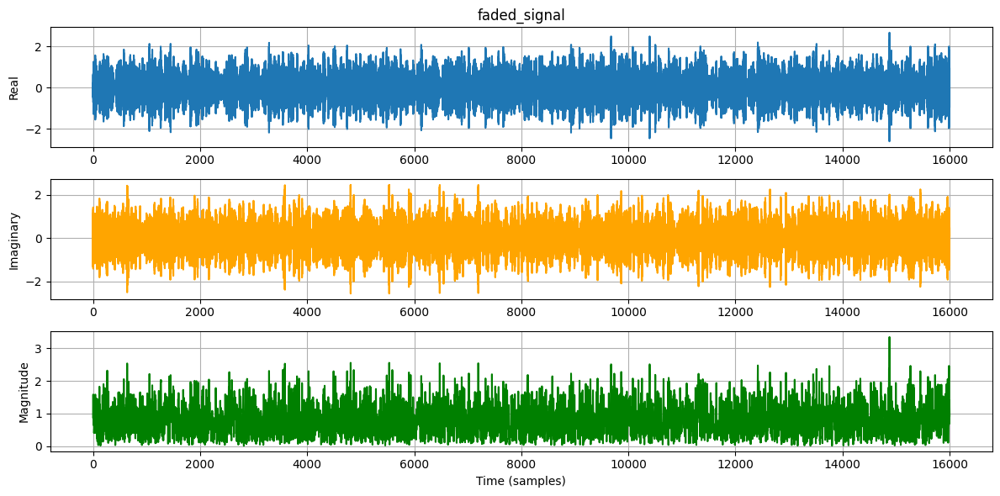

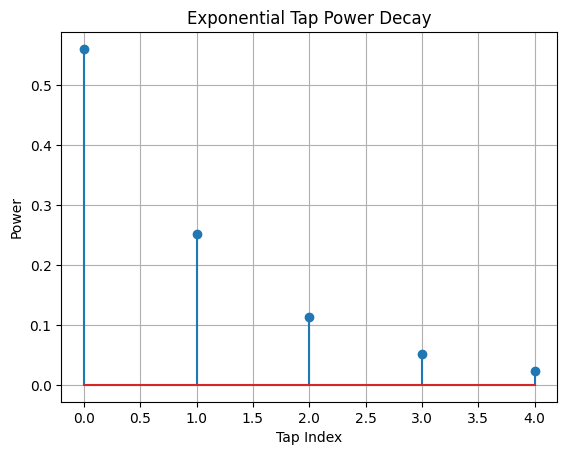

In [89]:
faded_signal = apply_multipath_fading(ofdm_signal, num_taps=5, alpha_rayleigh=0.8, snr_db=20)

### **OFDM is specifically designed to handle *frequency-selective fading*** efficiently.

In a **frequency-selective fading channel**, different frequencies (subcarriers) experience **different gains and phase shifts** due to **multipath delay spread**. This causes **intersymbol interference (ISI)** in single-carrier systems.

#### OFDM solves this by:

* **Splitting the wideband channel into many narrowband subcarriers**
* Each subcarrier is narrow enough to **experience flat fading**
* It uses a **CP** to eliminate ISI between symbols


### When is OFDM ideal?

| Fading Type                    | Is OFDM Suitable? | Reason                                        |
| ------------------------------ | ----------------- | --------------------------------------------- |
| **Flat fading**                | Yes, works      | All subcarriers see similar fading            |
| **Frequency-selective fading** | Best use case   | OFDM transforms it into many flat subchannels |


If the channel has a delay spread $T_{\text{delay}}$, and OFDM symbol duration is $T_{\text{sym}}$, we want:

$$
T_{\text{CP}} \geq T_{\text{delay}} \quad \text{and} \quad \Delta f = \frac{1}{T_{\text{sym}}} \ll \frac{1}{T_{\text{delay}}}
$$

This ensures each subcarrier sees a flat response.

### Without OFDM?

In a frequency-selective channel:

* Single-carrier systems suffer from **ISI**
* Require **complex equalizers (e.g., time-domain MMSE)**

### With OFDM?

* Subcarriers become **orthogonal flat-fading channels**
* Equalization becomes **simple per-subcarrier**
* Very efficient for 4G LTE, 5G NR, Wi-Fi, DVB, etc.



---


## Rayleigh vs. Rician — Which is Realistic?

| Fading Model | Description                                                                                | When It Occurs                                                                        |
| ------------ | ------------------------------------------------------------------------------------------ | ------------------------------------------------------------------------------------- |
| **Rayleigh** | No dominant line-of-sight (LOS) path; signal is composed entirely of multipath reflections | **Urban**, **indoor**, **NLOS** (non-line-of-sight), tunnels, deep indoor areas       |
| **Rician**   | Dominant LOS path **plus** multipath reflections                                           | **LOS scenarios**: highways, open indoor spaces, UAVs, mmWave, Wi-Fi within same room |

* **Rayleigh fading**:
  The **magnitude** of the fading envelope follows a **Rayleigh distribution** (no strong deterministic component).

* **Rician fading**:
  The fading envelope has a **dominant deterministic component** (LOS), and the rest is multipath. The **Rician K-factor** quantifies the ratio of LOS power to scattered power:

  $$
  K = \frac{\text{Power of LOS path}}{\text{Power of scattered paths}} \quad (\text{in linear or dB})
  $$

  * $K = 0 \Rightarrow$ Rayleigh fading
  * $K > 0 \Rightarrow$ Rician fading
  * $K \to \infty \Rightarrow$ AWGN channel (pure LOS)


| Environment                                | Use This Model            |
| ------------------------------------------ | ------------------------- |
| Small cell, deep indoor, urban canyon      | **Rayleigh**              |
| Open office, shopping mall with visibility | **Rician**                |
| Highway, mmWave with beamforming           | **Rician** with large $K$ |
| No multipath (e.g., fiber or ideal)        | **AWGN only**             |


### Example: 3GPP Models

* **EPA** (Extended Pedestrian A): Usually Rayleigh
* **EVA**, **ETU**: Varying degrees of Rician (especially for vehicular channels)


> **Rayleigh is more pessimistic**, but safe to simulate in **worst-case NLOS**.

> **Rician is more accurate** for modern LOS-enabled systems (e.g., 5G NR mmWave, Wi-Fi 6/7, LiFi).



---

## Rician Fading Channel Theory

Rician fading models wireless channels in environments where there is a **dominant LOS** path in addition to several scattered Non-Line-of-Sight (NLOS) components. Unlike Rayleigh fading (which assumes no LOS), Rician fading captures the combined effect of deterministic and random multipath components. 

This model is particularly relevant for:

- urban canyons
- indoor open spaces
- vehicular environments
- mmWave systems with strong beamforming

The received complex baseband signal after a multipath Rician fading channel is modeled as:

$$
y[n] = \sum_{\ell=0}^{L-1} h[\ell] \cdot x[n - \ell] + w[n]
$$

where:

* $x[n]$: Transmitted signal sample
* $h[\ell]$: Complex channel impulse response at tap $\ell$
* $w[n]$: Additive White Gaussian Noise (AWGN)
* $L$: Number of channel taps (multipath components)


### Channel Tap Structure

Each channel tap $h[\ell]$ in Rician fading consists of two components:

$$
h[\ell] = h_{\text{LOS}}[\ell] + h_{\text{NLOS}}[\ell]
$$

* $h_{\text{LOS}}[\ell]$: Deterministic LOS component (typically only for $\ell = 0$)
* $h_{\text{NLOS}}[\ell]$: Scattered component modeled as a complex Gaussian random variable

The NLOS component is assumed to follow a zero-mean complex Gaussian distribution:

$$
h_{\text{NLOS}}[\ell] \sim \mathcal{CN}\left(0, \sigma_{\ell}^2\right)
$$

The LOS component contributes only at the first tap:

$$
h_{\text{LOS}}[0] = \sqrt{P_{\text{LOS}}}, \quad h_{\text{LOS}}[\ell] = 0 \text{ for } \ell > 0
$$

### Rician K-Factor

The **Rician K-factor** quantifies the ratio of LOS power to the total NLOS power:

$$
K = \frac{P_{\text{LOS}}}{P_{\text{NLOS}}}
$$

* Expressed in dB as: $K_{\text{dB}} = 10 \log_{10}(K)$
* $K = 0$: No LOS path → Rayleigh fading
* $K \rightarrow \infty$: Dominant LOS only → AWGN channel

The total channel power is normalized as:

$$
P_{\text{total}} = P_{\text{LOS}} + P_{\text{NLOS}} = 1
$$

$$
P_{\text{LOS}} = \frac{K}{1 + K}, \quad P_{\text{NLOS}} = \frac{1}{1 + K}
$$


### Power Delay Profile

To model delay dispersion in the NLOS paths, an **exponential decay profile** is commonly used:

$$
\sigma_{\ell}^2 = \frac{e^{-\alpha \ell}}{\sum_{k=0}^{L-1} e^{-\alpha k}}
$$

* $\alpha$: Decay rate parameter (typical range: 0.3 to 1.0)
* Ensures that later taps have less power than earlier ones
* The total NLOS power across all taps is normalized to $P_{\text{NLOS}}$


| Component      | Description                              |
| -------------- | ---------------------------------------- |
| LOS component  | Deterministic power at first tap         |
| NLOS component | Rayleigh-faded, exponentially decaying   |
| K-factor       | Controls strength of LOS vs scattered    |
| Delay spread   | Modeled via exponential power profile    |
| AWGN           | Added optionally to simulate noise floor |

Rician fading provides a flexible model that bridges the gap between fully scattered Rayleigh channels and pure LOS scenarios, making it a widely used channel model in wireless system design.



In [98]:
def rician_fading(ofdm_signal, num_taps, K_dB, alpha_rayleigh, snr_db=None):
    """
    Apply Rician fading to a complex baseband signal.

    Parameters:
    - signal: Input complex baseband signal (1D array)
    - num_taps: Number of channel taps (L)
    - K_dB: Rician K-factor in dB (ratio of LOS to NLOS power)
    - alpha_rayleigh: Exponential decay rate for NLOS taps
    - snr_db: Optional SNR in dB for AWGN

    Returns:
    - faded_signal: Signal after convolution with Rician fading channel
    - h: Channel impulse response (complex-valued)
    """
    # Convert K-factor from dB to linear scale
    K_linear = 10**(K_dB / 10)

    # Compute power profile of NLOS (Rayleigh) taps
    tap_powers_nlos = np.exp(-alpha_rayleigh * np.arange(num_taps))
    tap_powers_nlos /= np.sum(tap_powers_nlos)

    # Total power is normalized to 1: divide between LOS and NLOS
    total_power = 1.0
    power_nlos = total_power / (1 + K_linear)
    power_los = total_power * K_linear / (1 + K_linear)

    # Construct NLOS Rayleigh component
    h_nlos = (np.random.randn(num_taps) + 1j * np.random.randn(num_taps)) * np.sqrt((power_nlos * tap_powers_nlos) / 2)

    # Construct LOS deterministic component (only first tap has LOS)
    h_los = np.zeros(num_taps, dtype=complex)
    h_los[0] = np.sqrt(power_los)  # deterministic LOS at delay 0

    # Combine to get final channel impulse response
    h = h_los + h_nlos

    # Convolve the signal with the Rician channel
    faded_signal = np.convolve(ofdm_signal, h, mode='full')[:len(ofdm_signal)]

    # Add AWGN if specified
    if snr_db is not None:
        signal_power = np.mean(np.abs(faded_signal)**2)
        noise_power = signal_power / (10 ** (snr_db / 10))
        noise_std = np.sqrt(noise_power / 2)
        noise = noise_std * (np.random.randn(len(faded_signal)) + 1j * np.random.randn(len(faded_signal)))
        faded_signal += noise
    
    plt.figure(figsize=(10, 3.5))
    plt.plot(np.abs(ofdm_signal), color='purple', linewidth=1)
    plt.title("Received Signal Envelope")
    plt.xlabel("Sample Index")
    plt.ylabel("Magnitude")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    taps = np.arange(len(h))
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.stem(taps, np.abs(h))
    plt.title("Magnitude of Channel Taps")
    plt.xlabel("Tap Index")
    plt.ylabel("|h[l]|")
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.stem(taps, np.angle(h))
    plt.title("Phase of Channel Taps")
    plt.xlabel("Tap Index")
    plt.ylabel("∠h[l] (rad)")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    return faded_signal, h


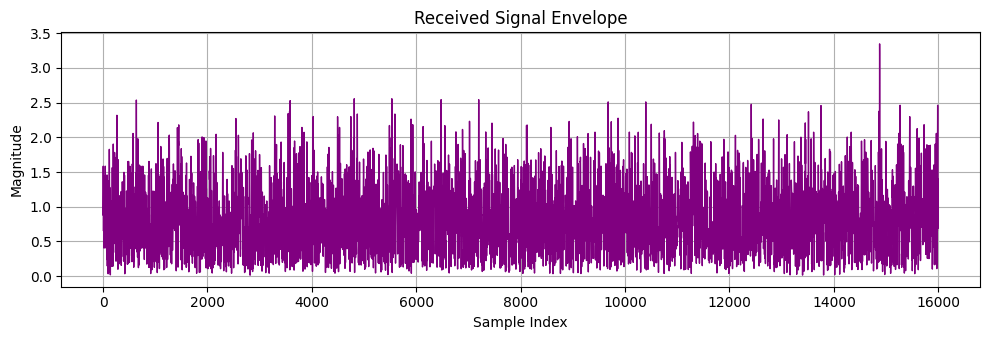

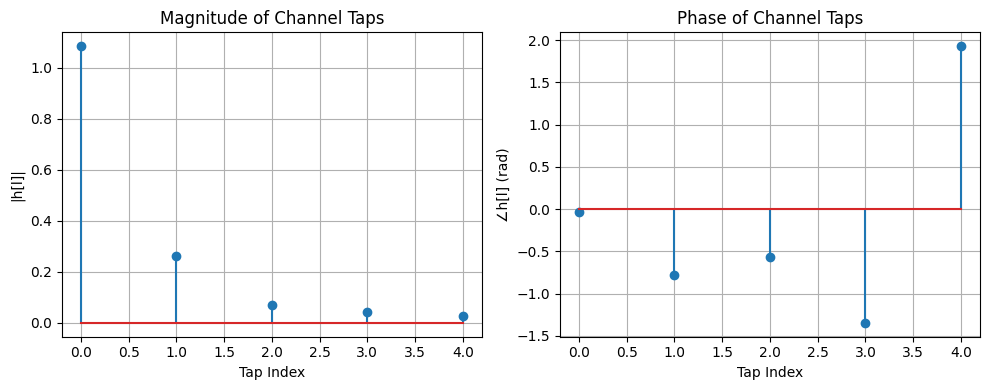

In [99]:
rician_signal, h = rician_fading(ofdm_signal, num_taps = 5, K_dB = 10, alpha_rayleigh = 0.7, snr_db = 25)


# 3GPP TR 38.901 Channel Models

The TR 38.901 3GPP document defines five main standardized channel models for G NR wireless simulations. 

Each corresponds to a deployment environment, with specific statistical characteristics for:

- LOS/NLOS probability models

- Path loss models

- Power delay profiles (PDP)

- Angular spreads and Doppler

- Cluster-based small-scale fading




| Model   | Name                    | Description                                | Frequency Range      |
| ------- | ----------------------- | ------------------------------------------ | -------------------- |
| **RMa** | **Rural Macrocell**     | Large cell, low density, open terrain      | 0.5 – 30 GHz         |
| **UMa** | **Urban Macrocell**     | Rooftop BSs serving users on streets       | 0.5 – 100 GHz        |
| **UMi** | **Urban Microcell**     | Low-height BSs in dense urban environments | 0.5 – 100 GHz        |
| **InH** | **Indoor Hotspot**      | Indoor office/open space                   | 0.5 – 100 GHz        |
| **SM**  | **Satellite to Mobile** | Optional; for satellite link simulations   | \[Separate document] |


---
---

## Time-Varying Rayleigh Multipath Channel with Doppler Spread

In mobile wireless communication, channel conditions change over time due to user movement, changes in the surrounding environment, or both. These variations introduce **Doppler spread**—a phenomenon that causes **time-selective fading** of the signal. When combined with **multipath propagation**, the result is a **time-varying frequency-selective fading channel**.

This model captures the effects of:

* **Multipath fading**: signal reflections from various physical objects.
* **Doppler effect**: time variation in the channel due to relative motion between the transmitter, receiver, or environment.

### Channel Model

The received signal $y[n]$ is modeled as:

$$
y[n] = \sum_{\ell=0}^{L-1} h[n, \ell] \cdot x[n - \ell] + w[n]
$$

where:

* $x[n]$: transmitted complex baseband signal
* $h[n, \ell]$: time-varying complex channel coefficient for tap $\ell$ at time $n$
* $L$: number of channel taps (multipath components)
* $w[n]$: additive white Gaussian noise (AWGN)


### Tap Power Profile

The power of each tap is defined by an **exponential decay profile**:

$$
\sigma^2_\ell = \frac{e^{-\alpha \ell}}{\sum_{k=0}^{L-1} e^{-\alpha k}}
$$

where:

* $\alpha$: exponential decay factor (typically in range 0.3–1.0)
* $\sigma^2_\ell$: power of the $\ell$-th tap, normalized such that $\sum_{\ell=0}^{L-1} \sigma^2_\ell = 1$

This captures the fact that earlier-arriving paths typically carry more energy than delayed reflections.


### Time Variation and Doppler Spread

Each channel tap $h[n, \ell]$ is modeled as a **zero-mean complex Gaussian random process** with a time-varying envelope that captures Doppler fading. For a mobile user with maximum Doppler frequency $f_D$, the fading variation over time follows Jakes’ Doppler spectrum.

The fading process for each tap is generated using the **sum-of-sinusoids method**, an efficient approximation of Jakes’ model. Each tap evolves over time as:

$$
h[n, \ell] = \sqrt{\sigma^2_\ell} \cdot \left( h_{\text{real}}[n, \ell] + j \cdot h_{\text{imag}}[n, \ell] \right)
$$

with:

$$
h_{\text{real}}[n, \ell] = \sqrt{\frac{2}{N}} \sum_{k=1}^{N} \cos(2\pi f_D n \cos\theta_k + \phi_k)
$$

$$
h_{\text{imag}}[n, \ell] = \sqrt{\frac{2}{N}} \sum_{k=1}^{N} \sin(2\pi f_D n \cos\theta_k + \phi_k)
$$

where:

* $N$: number of sinusoids (e.g., 16, 32, 64)
* $\theta_k$: equally spaced angles on $[0, 2\pi)$
* $\phi_k$: random initial phases uniformly distributed on $[0, 2\pi)$

This process generates a time-correlated complex Gaussian signal per tap with the desired Doppler spectrum.


### Convolution with Time-Varying Channel

The received signal is computed using a **time-varying convolution** across all taps:

$$
y[n] = \sum_{\ell=0}^{L-1} h[n, \ell] \cdot x[n - \ell]
$$

This models a channel whose impulse response varies continuously over time, introducing both frequency-selective and time-selective fading effects.


### Additive Noise

To simulate realistic reception conditions, complex Gaussian noise $w[n] \sim \mathcal{CN}(0, \sigma_w^2)$ is added after convolution. The noise power is determined based on a target Signal-to-Noise Ratio (SNR):

$$
\sigma_w^2 = \frac{P_{\text{signal}}}{10^{\text{SNR}_{\text{dB}} / 10}}
$$


| Component        | Description                                   |
| ---------------- | --------------------------------------------- |
| $L$              | Number of channel taps (multipath components) |
| $\alpha$         | Exponential decay rate for tap powers         |
| $f_D$            | Maximum Doppler frequency (Hz)                |
| $h[n, \ell]$     | Time-varying Rayleigh fading process per tap  |
| $y[n]$           | Output signal (faded + noisy)                 |
| Sum-of-sinusoids | Used to generate time-correlated fading       |
| AWGN             | Optional noise added after fading             |


In [100]:
def multipath_doppler_fading(signal, num_taps=3, alpha_rayleigh=0.7, fd=100, fs=1.0, snr_db=None, num_sinusoids=32, seed=None):
    """
    Apply time-varying Rayleigh multipath fading with Doppler spread (per tap).

    Parameters:
    - signal: Transmitted complex baseband signal (1D array)
    - num_taps: Number of multipath taps
    - alpha_rayleigh: Exponential decay rate for tap powers
    - fd: Maximum Doppler frequency (Hz)
    - fs: Sampling rate (Hz)
    - snr_db: SNR in dB for AWGN (optional)
    - num_sinusoids: Number of sinusoids for Doppler approximation
    - seed: Random seed (optional)

    Returns:
    - faded_signal: Time-varying faded signal
    - h_time: Time-varying channel impulse response matrix (shape: [len(signal), num_taps])
    """
    if seed is not None:
        np.random.seed(seed)

    N = len(signal)
    t = np.arange(N) / fs

    # Tap power profile (exponential decay)
    tap_powers = np.exp(-alpha_rayleigh * np.arange(num_taps))
    tap_powers /= np.sum(tap_powers)

    # Initialize time-varying channel matrix
    h_time = np.zeros((N, num_taps), dtype=complex)

    # Generate Doppler fading process per tap using sum-of-sinusoids
    for l in range(num_taps):
        theta = 2 * np.pi * np.arange(1, num_sinusoids + 1) / (num_sinusoids + 1)
        phi = 2 * np.pi * np.random.rand(num_sinusoids)

        real_fading = np.sqrt(2 / num_sinusoids) * np.sum(
            np.cos(2 * np.pi * fd * np.outer(t, np.cos(theta)) + phi), axis=1
        )
        imag_fading = np.sqrt(2 / num_sinusoids) * np.sum(
            np.sin(2 * np.pi * fd * np.outer(t, np.cos(theta)) + phi), axis=1
        )
        fading_process = real_fading + 1j * imag_fading
        h_time[:, l] = fading_process * np.sqrt(tap_powers[l])

    # Apply time-varying convolution
    faded_signal = np.zeros(N, dtype=complex)
    for l in range(num_taps):
        delayed_signal = np.roll(signal, l)
        delayed_signal[:l] = 0  # zero-pad causal delay
        faded_signal += h_time[:, l] * delayed_signal

    # Add AWGN if specified
    if snr_db is not None:
        signal_power = np.mean(np.abs(faded_signal)**2)
        noise_power = signal_power / (10 ** (snr_db / 10))
        noise_std = np.sqrt(noise_power / 2)
        noise = noise_std * (np.random.randn(N) + 1j * np.random.randn(N))
        faded_signal += noise
    
    plt.figure(figsize=(10, 3.5))
    plt.plot(np.abs(ofdm_signal), color='purple', linewidth=1)
    plt.title("Received Signal Envelope")
    plt.xlabel("Sample Index")
    plt.ylabel("Magnitude")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    taps = np.arange(len(h))
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.stem(taps, np.abs(h))
    plt.title("Magnitude of Channel Taps")
    plt.xlabel("Tap Index")
    plt.ylabel("|h[l]|")
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.stem(taps, np.angle(h))
    plt.title("Phase of Channel Taps")
    plt.xlabel("Tap Index")
    plt.ylabel("∠h[l] (rad)")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 5))
    for l in range(h_time.shape[1]):
        plt.plot(np.abs(h_time[:, l]), label=f'Tap {l}')
    plt.title("Time-Varying Magnitude of Channel Taps")
    plt.xlabel("Time Index")
    plt.ylabel("|h(t,l)|")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return faded_signal, h_time


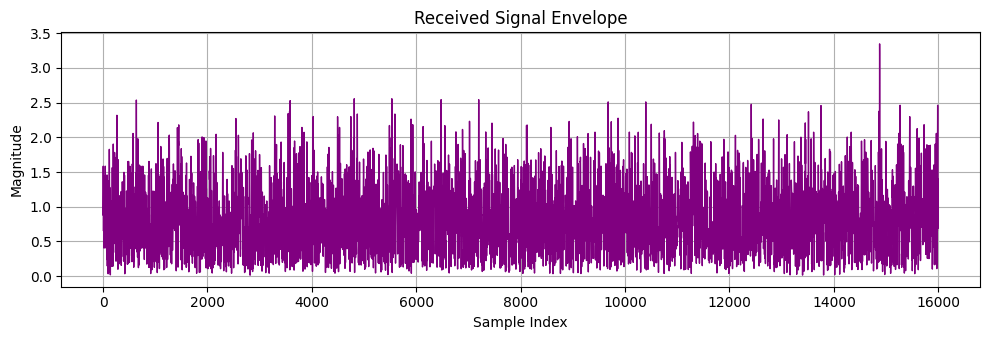

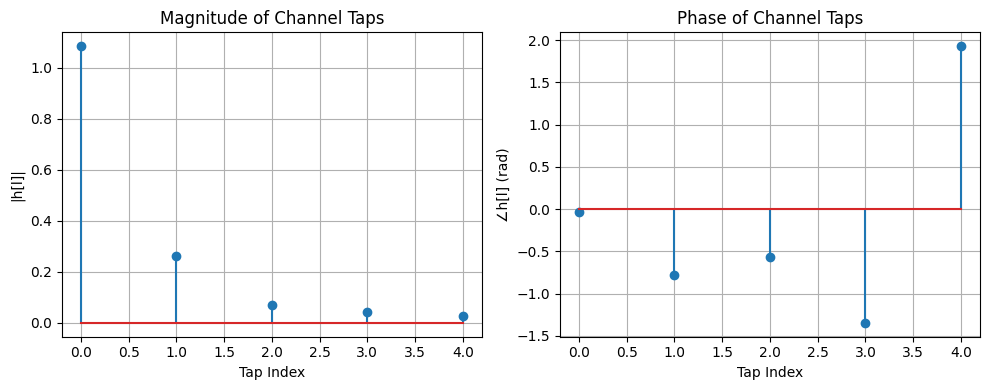

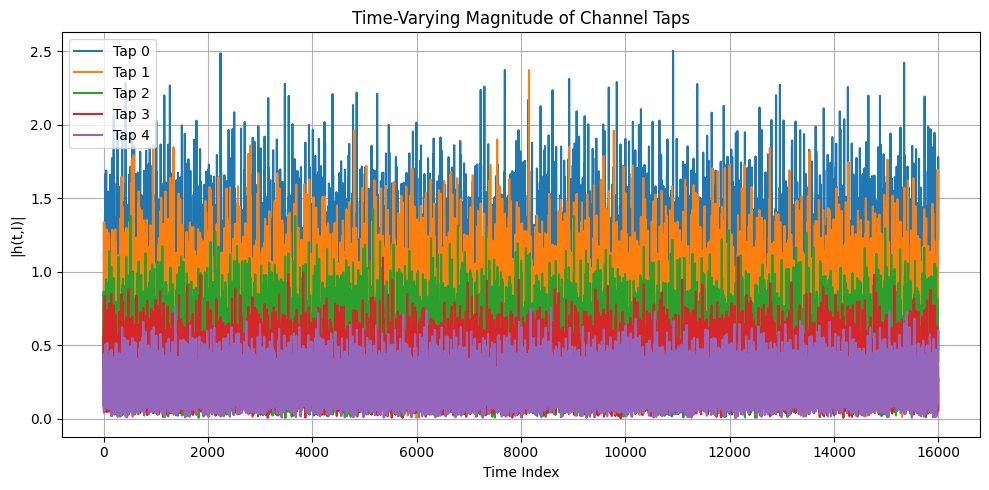

In [ ]:
faded_signal, h_time = multipath_doppler_fading(ofdm_signal, num_taps=5, alpha_rayleigh=0.6, fd=150, fs=1e3, snr_db=20)


---

# Gray Coding

**Gray coding**, or **reflected binary code**, is a binary numeral system in which **two successive values differ in only one bit**. This property minimizes the probability of large symbol errors during quantization, modulation, or transmission, especially in the presence of noise.

It is widely used in:

* **Digital modulation** schemes (e.g., QPSK, 16-QAM, 64-QAM)
* **Analog-to-digital converters (ADCs)**
* **Error-resilient encoding** and **hardware-efficient encoders**


For any $n$-bit Gray code sequence $G_0, G_1, \dots, G_{2^n - 1}$, the Hamming distance between consecutive codewords is always **1**:

$$
\text{Hamming}(G_k, G_{k+1}) = 1
\quad \text{for all } k \in \{0, \dots, 2^n - 2\}
$$

This ensures that **only one bit changes at a time**, reducing the chance of large misinterpretations in quantized data or demodulated symbols.


## Binary to Gray Code Conversion

Given an $n$-bit binary number $b = b_{n-1}b_{n-2} \dots b_0$, its corresponding Gray code $g = g_{n-1}g_{n-2} \dots g_0$ is given by:

$$
g_i = 
\begin{cases}
b_{n-1}, & \text{if } i = n-1 \\
b_i \oplus b_{i+1}, & \text{for } i = n-2, \dots, 0
\end{cases}
$$

Where:

* $\oplus$ is the XOR operation
* $g_{n-1}$ (most significant bit) is equal to $b_{n-1}$

### Example (3-bit Binary → Gray):

| Decimal | Binary | Gray |
| ------- | ------ | ---- |
| 0       | 000    | 000  |
| 1       | 001    | 001  |
| 2       | 010    | 011  |
| 3       | 011    | 010  |
| 4       | 100    | 110  |
| 5       | 101    | 111  |
| 6       | 110    | 101  |
| 7       | 111    | 100  |

---

## Gray Code to Binary Conversion

To decode Gray code $g = g_{n-1}g_{n-2}\dots g_0$ back to binary $b$, apply:

$$
b_{n-1} = g_{n-1}
$$

$$
b_i = b_{i+1} \oplus g_i, \quad \text{for } i = n-2, \dots, 0
$$

This reconstructs the original binary sequence using a recursive XOR chain.


## Application in Modulation (e.g., QAM)

In digital modulation such as **QPSK** or **16-QAM**, each symbol corresponds to a bit pattern. Using Gray coding minimizes the **bit error rate (BER)** because:

* Closest constellation points differ by only one bit.
* A small error in the received signal (e.g., due to noise) results in only **one bit error**, not multiple.

### Example (16-QAM):

* Binary sequence: 0000, 0001, 0011, 0010, ...
* Gray-coded mapping: ensures adjacent symbols in the I-Q plane differ by 1 bit only.


## Mathematical Formulation

### Binary to Gray:

$$
g = b \oplus (b \gg 1)
$$

Where $\gg$ is the right bit-shift operator.

### Gray to Binary (loop form):

```python
def gray_to_binary(g):
    b = g
    while g > 0:
        g >>= 1
        b ^= g
    return b
```

---

| Feature      | Description                          |
| ------------ | ------------------------------------ |
| Type         | Non-weighted code                    |
| Key Property | Successive values differ by 1 bit    |
| Application  | Modulation, ADCs, error minimization |
| Conversion   | XOR-based (binary ↔ gray)            |
| Advantage    | Reduces BER in noisy channels        |



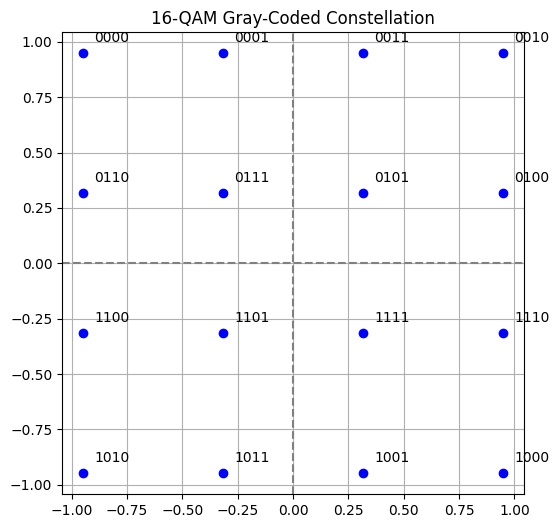

In [163]:
# Gray-Coded QPSK & 16-QAM

# Gray encoding for integers
def binary_to_gray(n):
    return n ^ (n >> 1)

# Gray decoding
def gray_to_binary(g):
    b = g
    while g > 0:
        g >>= 1
        b ^= g
    return b

# Generate Gray mapping for M-QAM
def generate_gray_map(M):
    bits_per_symbol = int(np.log2(M))
    gray_map = {}
    inv_gray_map = {}

    for i in range(M):
        gray = binary_to_gray(i)
        b_str = format(gray, f'0{bits_per_symbol}b')
        gray_map[i] = b_str
        inv_gray_map[b_str] = i

    return gray_map, inv_gray_map

# QAM constellation mapper (Gray coded)
def qam_constellation(M):
    k = int(np.sqrt(M))
    assert k * k == M, "M must be a perfect square for square QAM"

    # Normalize constellation to unit average energy
    scale = np.sqrt((2/3) * (M - 1))
    x = np.arange(k)
    points = (2 * x - (k - 1)) / scale

    const_points = []
    label_map = {}
    gray_map, _ = generate_gray_map(M)

    for i in range(k):
        for j in range(k):
            idx = i * k + j
            symbol = points[j] + 1j * points[k - 1 - i]  # flip vertically for I-Q order
            label = gray_map[idx]
            const_points.append(symbol)
            label_map[label] = symbol

    return label_map

# Example: Plot 16-QAM Gray-coded constellation
def plot_constellation(label_map):
    plt.figure(figsize=(6, 6))
    for bits, point in label_map.items():
        plt.plot(point.real, point.imag, 'bo')
        plt.text(point.real + 0.05, point.imag + 0.05, bits, fontsize=10)
    plt.axhline(0, color='gray', linestyle='--')
    plt.axvline(0, color='gray', linestyle='--')
    plt.title("16-QAM Gray-Coded Constellation")
    plt.grid(True)
    plt.gca().set_aspect('equal')
    plt.show()

# Mapping and example usage
M = 16  # Try M = 4 for QPSK, or M = 16 for 16-QAM
label_map = qam_constellation(M)
plot_constellation(label_map)


In [164]:
def bits_to_symbol(bits, label_map):
    return label_map[bits]


In [165]:
from scipy.spatial import KDTree

def symbol_to_bits(received_symbol, label_map):
    points = list(label_map.values())
    labels = list(label_map.keys())
    tree = KDTree([(p.real, p.imag) for p in points])
    _, idx = tree.query([received_symbol.real, received_symbol.imag])
    return labels[idx]


## Frequency Offset and Phase Noise in Wireless Communication


In practical wireless communication systems, **ideal oscillators** are assumed during modulation and demodulation. However, in reality, local oscillators (LOs) in the transmitter and receiver are never perfectly synchronized. They introduce imperfections such as:

* **Carrier frequency offset** (CFO): due to oscillator frequency mismatch

* **Phase noise**: due to rapid phase variations (jitter), often modeled as a random process

These effects degrade system performance, especially in systems like **OFDM**, where they destroy subcarrier orthogonality.


## 1. Carrier Frequency Offset (CFO)

Carrier frequency offset occurs when the transmitter and receiver oscillators differ by a small frequency:

$$
f_{\text{offset}} = f_{\text{LO,rx}} - f_{\text{LO,tx}}
$$

### Effect on Baseband Signal

Let $s[n]$ be the transmitted baseband signal. The received signal with frequency offset is:

$$
r[n] = s[n] \cdot e^{j 2\pi \Delta f n T_s}
$$

where:

* $\Delta f = f_{\text{offset}}$: frequency offset in Hz
* $T_s$: sampling interval ( $T_s = 1/f_s$ )
* $n$: sample index

This offset introduces a **linear phase rotation** over time, which:

* Causes constellation rotation in single-carrier systems
* Destroys subcarrier orthogonality in OFDM, leading to **inter-carrier interference (ICI)**

### Normalized Frequency Offset (ε)

For OFDM systems with subcarrier spacing $\Delta f_{\text{sub}}$, the normalized frequency offset is defined as:

$$
\epsilon = \frac{\Delta f}{\Delta f_{\text{sub}}}
$$

Even small $\epsilon$ values cause significant BER degradation.


## 2. Phase Noise

Phase noise is a **rapid, random fluctuation** in the phase of the carrier signal, typically modeled as a **stochastic process**. It originates from short-term instability in oscillator frequency due to electronic noise and jitter.

### Baseband Effect

Let $\phi[n]$ be a random phase process (e.g., a Wiener process). The received signal becomes:

$$
r[n] = s[n] \cdot e^{j \phi[n]}
$$

This introduces **non-linear, time-varying phase distortion**, even if the carrier frequency is aligned.

### Phase Noise Modeling

Common models for $\phi[n]$:

* **Wiener process**: $\phi[n] = \phi[n-1] + \Delta\phi[n]$, where $\Delta\phi[n] \sim \mathcal{N}(0, \sigma_\phi^2)$
* **Filtered white noise**: simulating phase-locked loop behavior

Phase noise affects:

* **QAM constellation stability**
* **Subcarrier leakage** in OFDM (similar to ICI)
* **Coherent demodulation** in MIMO and tracking loops


## 3. Combined Model

In many practical models, both effects are applied simultaneously:

$$
r[n] = s[n] \cdot e^{j(2\pi \Delta f n T_s + \phi[n])}
$$

This models a system with:

* **Carrier offset** (deterministic phase rotation)
* **Phase noise** (random walk or bounded phase jitter)


## 4. Impact on Systems

| System Type    | Impact of Frequency Offset | Impact of Phase Noise |
| -------------- | -------------------------- | --------------------- |
| OFDM           | Inter-carrier interference | Phase rotation, ICI   |
| Single-carrier | Constellation rotation     | Tracking loss, jitter |
| Coherent MIMO  | Channel estimation error   | Synchronization loss  |





| Term             | Description                                            |
| ---------------- | ------------------------------------------------------ |
| Frequency Offset | Mismatch between TX and RX oscillator frequencies      |
| Phase Noise      | Random phase fluctuation due to jitter/noise           |
| Modeling         | Apply complex exponential phase distortion to signal   |
| Common Models    | Linear phase drift (CFO), random walk (Wiener process) |
| Critical for     | OFDM, MIMO, coherent receivers, radar systems          |



In [104]:
def apply_full_channel_model(
    signal,
    fs=1.0,
    num_taps=3,
    alpha_rayleigh=0.7,
    fd=100,
    snr_db=None,
    num_sinusoids=32,
    freq_offset_hz=0.0,
    phase_noise_std=0.0,
    seed=None
):
    """
    Apply multipath Rayleigh fading with Doppler, frequency offset, and phase noise.

    Parameters:
    - signal: Input complex baseband signal (1D array)
    - fs: Sampling rate in Hz
    - num_taps: Number of Rayleigh taps
    - alpha_rayleigh: Exponential decay rate for power profile
    - fd: Max Doppler frequency in Hz
    - snr_db: SNR in dB for AWGN (optional)
    - num_sinusoids: Number of sinusoids for Doppler fading
    - freq_offset_hz: Carrier frequency offset (Hz)
    - phase_noise_std: Std dev of phase noise increments (radians)
    - seed: Optional seed for reproducibility

    Returns:
    - impaired_signal: Output signal with all impairments
    - h_time: Time-varying channel taps [len(signal), num_taps]
    """

    if seed is not None:
        np.random.seed(seed)

    N = len(signal)
    t = np.arange(N) / fs

    # Exponential power delay profile
    tap_powers = np.exp(-alpha_rayleigh * np.arange(num_taps))
    tap_powers /= np.sum(tap_powers)

    # Generate time-varying Rayleigh fading per tap
    h_time = np.zeros((N, num_taps), dtype=complex)
    for l in range(num_taps):
        theta = 2 * np.pi * np.arange(1, num_sinusoids + 1) / (num_sinusoids + 1)
        phi = 2 * np.pi * np.random.rand(num_sinusoids)
        real = np.sqrt(2 / num_sinusoids) * np.sum(
            np.cos(2 * np.pi * fd * np.outer(t, np.cos(theta)) + phi), axis=1)
        imag = np.sqrt(2 / num_sinusoids) * np.sum(
            np.sin(2 * np.pi * fd * np.outer(t, np.cos(theta)) + phi), axis=1)
        fading_process = real + 1j * imag
        h_time[:, l] = fading_process * np.sqrt(tap_powers[l])

    # Time-varying convolution
    faded_signal = np.zeros(N, dtype=complex)
    for l in range(num_taps):
        delayed = np.roll(signal, l)
        delayed[:l] = 0
        faded_signal += h_time[:, l] * delayed

    # Apply frequency offset: r[n] *= exp(j*2pi*f*nTs)
    freq_rot = np.exp(1j * 2 * np.pi * freq_offset_hz * t)
    faded_signal *= freq_rot

    # Apply phase noise as random walk
    if phase_noise_std > 0.0:
        delta_phi = np.random.normal(0, phase_noise_std, size=N)
        phi = np.cumsum(delta_phi)
        faded_signal *= np.exp(1j * phi)

    # Add AWGN
    if snr_db is not None:
        sig_power = np.mean(np.abs(faded_signal) ** 2)
        noise_power = sig_power / (10 ** (snr_db / 10))
        noise = (np.random.randn(N) + 1j * np.random.randn(N)) * np.sqrt(noise_power / 2)
        faded_signal += noise
    
    plt.figure(figsize=(10, 5))
    for l in range(h_time.shape[1]):
        plt.plot(np.abs(h_time[:, l]), label=f'Tap {l}')
    plt.title("Time-Varying Channel Tap Magnitudes")
    plt.xlabel("Sample Index")
    plt.ylabel("|h[n, l]|")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return faded_signal, h_time


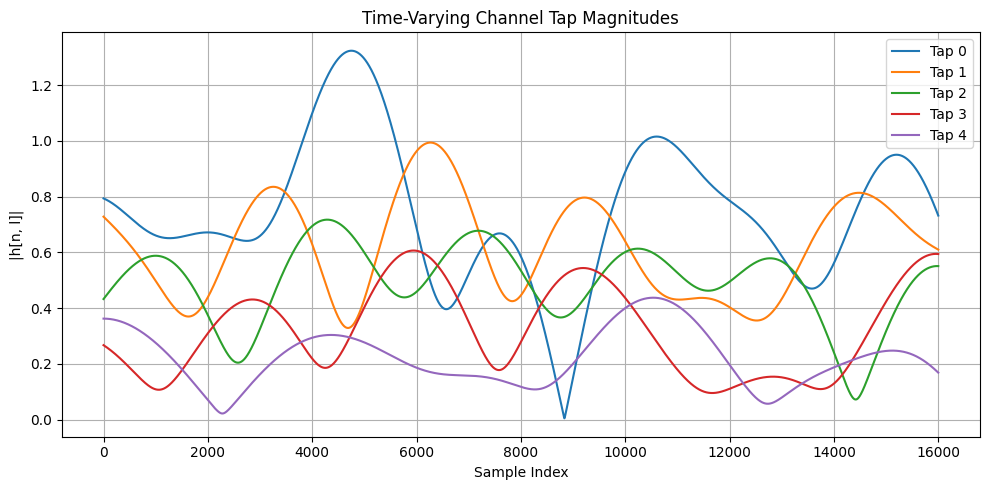

In [105]:
faded_signal, h_time = apply_full_channel_model(
    signal=ofdm_signal,
    fs=1e6,                     # 1 MHz sampling rate
    num_taps=5,
    alpha_rayleigh=0.6,
    fd=200,                     # 200 Hz Doppler
    snr_db=20,
    freq_offset_hz=100,         # 100 Hz carrier offset
    phase_noise_std=1e-3,       # radians per sample
    seed=42
)


## Timing Offset and Jitter in Communication Systems

In practical digital communication systems, accurate **symbol timing** is essential for correct demodulation and decoding of the received signal. However, real-world impairments such as **timing offset** and **jitter** arise due to imperfections in oscillators and sampling circuits. These effects distort the received waveform, increase inter-symbol interference (ISI), and degrade the system's bit error rate (BER).


## 1. Timing Offset

**Timing offset** occurs when the receiver samples the incoming signal at an incorrect time relative to the symbol boundaries.

### Causes:

* Mismatch between transmitter and receiver clock frequencies
* Propagation delay not accurately accounted for
* Lack of synchronization during receiver acquisition

### Effect on Received Signal

Assume ideal transmitted signal $x(t)$ is sampled at symbol period $T_s$. If the receiver samples at $t = nT_s + \tau$, where $\tau$ is a fixed offset, then the received samples become:

$$
r[n] = x(nT_s + \tau)
$$

This leads to:

* **Suboptimal symbol detection**
* Increased **inter-symbol interference (ISI)**, especially with pulse-shaped signals (e.g., raised cosine)

In multicarrier systems like OFDM, timing offset leads to:

* **Loss of orthogonality** between subcarriers
* Inter-symbol and inter-carrier interference
* Phase rotations across subcarriers (if offset is within the cyclic prefix)

### Types

* **Integer timing offset**: Offset by full symbols (can be corrected using frame synchronization)
* **Fractional timing offset**: Offset by a fraction of symbol period (requires interpolation or matched filtering)


## 2. Timing Jitter

### Definition

**Timing jitter** refers to **random, time-varying fluctuations** in the timing of sampling instants. Instead of sampling exactly at $t = nT_s$, the receiver samples at:

$$
t_n = nT_s + \delta_n
$$

where $\delta_n$ is a random variable representing instantaneous timing error (jitter) at time index $n$.

### Causes

* Thermal noise in clock circuits
* Power supply noise affecting oscillators
* Phase noise in phase-locked loops (PLLs)
* Quantization and jitter in ADC clock sources

### Effect on Signal

Timing jitter causes:

* **Non-uniform sampling** of the waveform
* Distortion of signal amplitude (even if the carrier is intact)
* Degradation of **eye diagram** and **symbol integrity**
* Increased **bit error rate**, especially in high-speed and high-order modulation systems

## 3. Modeling Timing Offset and Jitter

### 3.1 Timing Offset

For a baseband signal sampled at incorrect time offset $\tau$:

$$
r[n] = x(nT_s + \tau)
$$

In discrete simulations, this is implemented by:

* Interpolation (e.g., sinc or linear) to resample at $\tau$
* Circular shift for integer sample offsets (in discrete time)


### 3.2 Timing Jitter

Timing jitter is modeled as:

$$
t_n = nT_s + \delta_n, \quad \delta_n \sim \mathcal{N}(0, \sigma_t^2)
$$

where:

* $\sigma_t$: standard deviation of timing noise
* $\delta_n$: independent or correlated noise samples (white or colored jitter)

Interpolation is used to obtain $r[n] = x(t_n)$ from the original waveform.


## 4. Impact on Communication Systems

| System                  | Impact of Timing Offset  | Impact of Jitter                            |
| ----------------------- | ------------------------ | ------------------------------------------- |
| Single-carrier          | ISI, degraded sampling   | Symbol distortion                           |
| OFDM                    | ICI, symbol misalignment | Loss of orthogonality, amplitude distortion |
| High-speed serial links | Eye closure              | Jitter-induced sampling errors              |
| MIMO                    | Synchronization mismatch | Channel estimation errors                   |

---




In [110]:
from scipy.interpolate import interp1d


def apply_timing_offset_and_jitter(signal, timing_offset=0.0, jitter_std=0.0, fs=1.0, seed=None):
    """
    Apply constant timing offset and random timing jitter to a signal.

    Parameters:
    - signal: Input complex baseband signal
    - timing_offset: Constant delay in seconds (e.g., 0.25 * Ts)
    - jitter_std: Std dev of jitter (in seconds)
    - fs: Sampling frequency (Hz)
    - seed: Random seed for reproducibility

    Returns:
    - distorted_signal: Resampled signal with timing offset and jitter
    - sampling_instants: Actual sampling times applied
    """
    if seed is not None:
        np.random.seed(seed)

    N = len(signal)
    t_original = np.arange(N) / fs
    Ts = 1 / fs

    # Timing offset + jitter
    jitter = np.random.normal(0, jitter_std, size=N)
    sampling_instants = t_original + timing_offset + jitter

    # Interpolation
    interp_real = interp1d(t_original, signal.real, kind='linear', bounds_error=False, fill_value="extrapolate")
    interp_imag = interp1d(t_original, signal.imag, kind='linear', bounds_error=False, fill_value="extrapolate")
    distorted_real = interp_real(sampling_instants)
    distorted_imag = interp_imag(sampling_instants)
    distorted_signal = distorted_real + 1j * distorted_imag

    return distorted_signal, sampling_instants


In [111]:
def plot_eye_diagram(signal, sps=1, span=2, offset=0):
    """
    Plot an eye diagram for the given complex signal (real part only).

    Parameters:
    - signal: Input signal
    - sps: Samples per symbol
    - span: How many symbol periods per trace
    - offset: Optional sample offset
    """
    trace_len = span * sps
    num_traces = (len(signal) - offset) // trace_len

    plt.figure(figsize=(10, 4))
    for i in range(num_traces):
        start = offset + i * trace_len
        end = start + trace_len
        trace = signal[start:end]
        if len(trace) == trace_len:
            plt.plot(np.arange(trace_len), np.real(trace), color='blue', alpha=0.3)
    plt.title("Eye Diagram (Real Part)")
    plt.xlabel("Sample Index")
    plt.ylabel("Amplitude")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


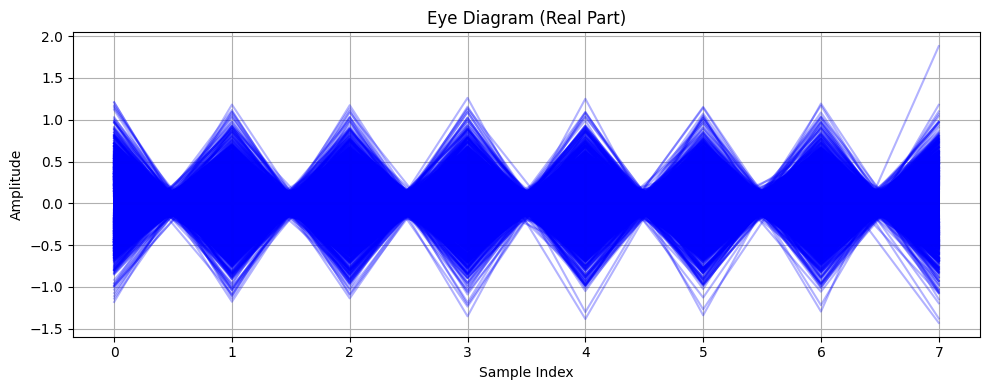

In [112]:
fs = 1e6
Ts = 1 / fs
timing_offset = 0.25 * Ts
jitter_std = 0.03 * Ts
distorted_signal, _ = apply_timing_offset_and_jitter(ofdm_signal, timing_offset, jitter_std, fs=fs, seed=42)
plot_eye_diagram(distorted_signal, sps=4)


## Timing Synchronization in OFDM Systems

In practical OFDM systems, the receiver must determine **when to start FFT demodulation**, i.e., the **symbol timing**. Incorrect timing leads to:

* Loss of orthogonality
* Inter-symbol interference (ISI)
* Inter-carrier interference (ICI)

**Timing synchronization** is the process of identifying the correct start of the OFDM symbol. Two popular techniques are:

1. **Cyclic Prefix (CP) Autocorrelation**
2. **Schmidl-Cox Algorithm**


## 1. Cyclic Prefix (CP) Autocorrelation

In OFDM, each symbol is extended with a **cyclic prefix** (CP), which is a copy of the last $L_{\text{CP}}$ samples of the IFFT output. The receiver can exploit this redundancy to find symbol boundaries.

Let the received signal be $r[n]$, and the expected symbol length be $L = N + L_{\text{CP}}$, where:

* $N$: IFFT size (data part)
* $L_{\text{CP}}$: CP length

Define the following correlation metric at lag $d$:

$$
R[d] = \sum_{n=0}^{L_{\text{CP}}-1} r^*[d+n] \cdot r[d+n+N]
$$

$$
P[d] = \left| R[d] \right|
$$

$$
E[d] = \sum_{n=0}^{L_{\text{CP}}-1} \left( |r[d+n]|^2 + |r[d+n+N]|^2 \right)
$$

Then define the **timing metric**:

$$
M[d] = \frac{P[d]^2}{E[d]^2}
$$

* $M[d]$ peaks at the start of the OFDM symbol, where the CP and the end of the symbol match perfectly.
* This method is computationally efficient and works well for moderate SNRs and slow fading.

--- 

## 2. Schmidl-Cox Algorithm


Schmidl and Cox proposed a robust method using a **training symbol** with **two identical halves** in the time domain. The receiver correlates these halves to detect timing.

### Transmitted Training Symbol

Let the training symbol $x[n]$ be structured as:

$$
x = [a, a]
$$

where $a$ is a sequence of $N/2$ samples.

At the receiver, the signal is:

$$
r[n] = x[n - d] + w[n]
$$

### Timing Metric

Let $D$ be the distance between the repeated halves (e.g., $D = N/2$). Then define:

$$
P[d] = \sum_{n=0}^{D-1} r^*[n+d] \cdot r[n+d+D]
$$

$$
R[d] = \sum_{n=0}^{D-1} |r[n+d+D]|^2
$$

$$
M[d] = \frac{|P[d]|^2}{(R[d])^2}
$$

### Interpretation

* $M[d]$ produces a **plateau** followed by a **sharp drop**, marking the end of the training symbol.
* The **start of the plateau** corresponds to the correct FFT window.
* Robust to frequency offset and noise, which makes it suitable for wireless OFDM (e.g., IEEE 802.11a/g/n).

---

Timing synchronization is a critical first step in OFDM reception. Both CP autocorrelation and the Schmidl-Cox method estimate the correct FFT window by exploiting structure in the time-domain waveform. In practice, **coarse timing** is often done using Schmidl-Cox, followed by **fine timing** using channel estimation or pilot symbols.



In [113]:
def timing_sync_cp_autocorr(rx_signal, N, cp_len):
    """
    Estimate symbol start using cyclic prefix autocorrelation.

    Parameters:
    - rx_signal: Received signal (1D complex numpy array)
    - N: FFT size (data part length)
    - cp_len: Cyclic prefix length

    Returns:
    - timing_index: Estimated start index of OFDM symbol
    - metric: Correlation metric (1D array)
    """
    metric = []
    for d in range(len(rx_signal) - N - cp_len):
        r1 = rx_signal[d : d + cp_len]
        r2 = rx_signal[d + N : d + N + cp_len]
        R = np.sum(np.conj(r1) * r2)
        E = np.sum(np.abs(r1)**2 + np.abs(r2)**2)
        m = np.abs(R)**2 / (E**2 + 1e-12)  # avoid divide by zero
        metric.append(m)

    timing_index = np.argmax(metric)
    return timing_index, np.array(metric)


In [114]:
def timing_sync_schmidl_cox(rx_signal, D):
    """
    Estimate timing using Schmidl-Cox algorithm.

    Parameters:
    - rx_signal: Received signal (1D complex numpy array)
    - D: Length of repeated half (typically FFT size // 2)

    Returns:
    - timing_index: Estimated start index of OFDM training symbol
    - metric: Timing metric M[d] array
    """
    metric = []
    for d in range(len(rx_signal) - 2*D):
        P = np.sum(np.conj(rx_signal[d:d+D]) * rx_signal[d+D:d+2*D])
        R = np.sum(np.abs(rx_signal[d+D:d+2*D])**2)
        m = np.abs(P)**2 / (R**2 + 1e-12)
        metric.append(m)

    timing_index = np.argmax(metric)
    return timing_index, np.array(metric)


In [115]:
# Assume rx_signal is your received waveform (numpy array)
N = 64
cp_len = 16
D = N // 2  # For Schmidl-Cox

# CP-based
idx_cp, cp_metric = timing_sync_cp_autocorr(rx_signal, N, cp_len)

# Schmidl-Cox
idx_sc, sc_metric = timing_sync_schmidl_cox(rx_signal, D)


In [116]:
def plot_timing_metric(metric, title="Timing Metric"):
    plt.figure(figsize=(10, 4))
    plt.plot(metric)
    plt.title(title)
    plt.xlabel("Sample Index")
    plt.ylabel("Metric Value")
    plt.grid(True)
    plt.tight_layout()
    plt.show()



---

## Frequency Offset Correction and Frame Detection in Digital Communication

### 1. Frequency Offset Correction

#### Overview

In practical systems, mismatch between transmitter and receiver oscillator frequencies introduces a **carrier frequency offset (CFO)**. This causes a **time-varying phase rotation** in the received signal, which severely degrades performance in systems like OFDM by introducing:

* **Inter-carrier interference (ICI)**
* **Symbol rotation and spreading**

#### Mathematical Model

Let $x[n]$ be the transmitted baseband signal. The received signal $r[n]$ with frequency offset $\Delta f$ becomes:

$$
r[n] = x[n] \cdot e^{j 2\pi \Delta f n T_s} + w[n]
$$

where:

* $\Delta f$: Frequency offset (Hz)
* $T_s$: Sampling period
* $w[n]$: Additive noise

This introduces a **linear phase drift** over time.

---

### Frequency Offset Estimation (Coarse)

If a signal contains **two identical segments** (like in the Schmidl-Cox preamble), the phase difference between them can be used to estimate the CFO:

$$
\phi = \angle \left( \sum_{n=0}^{N-1} r[n] \cdot r^*[n+N] \right)
$$

$$
\Delta f = \frac{\phi}{2\pi N T_s}
$$

This works because the frequency offset causes the second half to rotate by an additional phase:

$$
e^{j 2\pi \Delta f N T_s}
$$

---

### Frequency Offset Correction

Once $\Delta f$ is estimated, the correction is applied by rotating the received signal with the opposite phase:

$$
r_{\text{corr}}[n] = r[n] \cdot e^{-j 2\pi \Delta f n T_s}
$$

This effectively compensates for the CFO and restores the signal's phase coherence.

---

## Frame Detection Using Preambles

**Frame detection** identifies the start of a packet or OFDM frame. This is usually done using a known **preamble sequence** inserted at the beginning of each frame.

Popular sequences:

* **Zadoff-Chu (ZC)**: Used in LTE/5G for synchronization
* **PN (Pseudorandom Noise) sequences**: Used in Wi-Fi and spread-spectrum systems

### Matched Filtering for Detection

Let $p[n]$ be the known preamble (length $L$), and $r[n]$ the received signal. The **cross-correlation** or **matched filter** output is:

$$
y[n] = \sum_{k=0}^{L-1} r[n + k] \cdot p^*[k]
$$

The frame start is where $|y[n]|$ reaches a peak:

$$
\text{frame\_start} = \arg\max_n |y[n]|
$$

This works because convolution with the conjugate of the known sequence $p^*[k]$ maximizes the output when alignment occurs.

---

### Zadoff-Chu Sequences

Zadoff-Chu (ZC) sequences are a family of **constant amplitude** and **zero autocorrelation** sequences. A ZC sequence of length $N$ is defined as:

$$
x[n] = e^{-j \frac{\pi q n (n+1)}{N}}, \quad n = 0, 1, \dots, N-1
$$

where:

* $N$: sequence length (odd number)
* $q$: root index (coprime to $N$)

**Properties**:

* Constant magnitude
* Ideal autocorrelation:

  $$
  \sum_n x[n] x^*[n + \tau] = 0 \quad \text{for } \tau \ne 0
  $$
* Used in 3GPP LTE/5G for timing, synchronization, and random access

---

### PN Sequences (e.g., m-sequences)

PN sequences are generated using shift registers and have excellent **autocorrelation properties**:

$$
R_p[\tau] =
\begin{cases}
1, & \text{if } \tau = 0 \\
-1/N, & \text{if } \tau \ne 0
\end{cases}
$$

They are commonly used in:

* DSSS/CDMA systems
* Wi-Fi synchronization fields (e.g., Short Training Field)

---


| Function                    | Description                                            |
| --------------------------- | ------------------------------------------------------ |
| Frequency offset estimation | Use phase difference between repeated signal parts     |
| Frequency correction        | Rotate received signal by $e^{-j 2\pi \Delta f n T_s}$ |
| Frame detection             | Cross-correlate received signal with known preamble    |
| Preamble types              | Zadoff-Chu (5G), PN/m-sequences (Wi-Fi/CDMA)           |




In [117]:
def estimate_frequency_offset(rx_signal, N, fs):
    """
    Estimate frequency offset using two repeated OFDM halves.

    Parameters:
    - rx_signal: Received signal (must include two identical halves)
    - N: Length of one half (e.g., FFT size / 2)
    - fs: Sampling frequency in Hz

    Returns:
    - freq_offset: Estimated frequency offset in Hz
    """
    P = np.sum(rx_signal[:N] * np.conj(rx_signal[N:2*N]))
    phase_diff = np.angle(P)
    freq_offset = phase_diff / (2 * np.pi * N / fs)
    return freq_offset


In [118]:
def correct_frequency_offset(rx_signal, freq_offset, fs):
    """
    Apply frequency offset correction.

    Parameters:
    - rx_signal: Received signal
    - freq_offset: Estimated offset in Hz
    - fs: Sampling frequency in Hz

    Returns:
    - corrected_signal: Frequency-compensated signal
    """
    N = len(rx_signal)
    t = np.arange(N) / fs
    correction = np.exp(-1j * 2 * np.pi * freq_offset * t)
    return rx_signal * correction


In [121]:
def detect_frame_start(rx_signal, preamble):
    """
    Detect frame start using matched filter (cross-correlation).

    Parameters:
    - rx_signal: Received complex signal
    - preamble: Known preamble (1D array)

    Returns:
    - start_index: Estimated frame start index
    - correlation: Cross-correlation result (magnitude)
    """
    correlation = np.abs(np.correlate(rx_signal, preamble[::-1].conj(), mode='valid'))
    start_index = np.argmax(correlation)
    return start_index, correlation


In [119]:
def generate_zadoff_chu_seq(N, q):
    """
    Generate a Zadoff-Chu sequence.

    Parameters:
    - N: Sequence length (must be prime or co-prime to q)
    - q: Root index (must be coprime to N)

    Returns:
    - zc_seq: Complex Zadoff-Chu sequence of length N
    """
    n = np.arange(N)
    zc_seq = np.exp(-1j * np.pi * q * n * (n + 1) / N)
    return zc_seq


In [122]:
fs = 1e6        # 1 MHz sampling rate
N = 64          # FFT size or repeated segment length

# --- Frequency Offset ---
freq_offset_est = estimate_frequency_offset(rx_signal, N//2, fs)
rx_corrected = correct_frequency_offset(rx_signal, freq_offset_est, fs)

# --- Zadoff-Chu Preamble ---
zc = generate_zadoff_chu_seq(N=63, q=5)

# --- Frame Detection ---
start_idx, corr = detect_frame_start(rx_corrected, zc)


## Channel Equalization: LS and MMSE Methods

In digital communication systems, especially in OFDM and MIMO, the signal received over a wireless channel undergoes distortion due to multipath fading. To recover the original transmitted signal, **equalization** is applied to **undo the channel effect**.

The system model is:

$$
y = Hx + n
$$

where:

* $y$: Received signal vector
* $H$: Channel matrix or frequency-domain channel coefficient
* $x$: Transmitted signal vector (unknown)
* $n$: Additive noise vector (e.g., AWGN)

The goal of equalization is to estimate $x$ from $y$ using knowledge (or estimation) of $H$.

## 1. Least Squares (LS) Equalization

Minimize the **squared error** between the observed signal and the predicted signal:

$$
\hat{x}_{\text{LS}} = \arg\min_x \| y - Hx \|^2
$$

The LS solution is obtained by solving the normal equations:

$$
\hat{x}_{\text{LS}} = (H^H H)^{-1} H^H y
$$

* $H^H$: Hermitian (conjugate transpose) of $H$
* If $H$ is diagonal (e.g., in OFDM), this simplifies to:

  $$
  \hat{x}_{\text{LS}}[k] = \frac{y[k]}{H[k]} \quad \text{(element-wise division)}
  $$

**Assumptions**:

* Channel is known
* Noise is **ignored** (or treated as unknown interference)
* LS does **not account for noise statistics**

---

## 2. Minimum Mean Squared Error (MMSE) Equalization

Minimize the **mean squared error (MSE)** between the true symbol and the estimated symbol, **taking noise into account**:

$$
\hat{x}_{\text{MMSE}} = \arg\min_{\hat{x}} \mathbb{E}\left[ \| x - \hat{x} \|^2 \right]
$$

This is a **Bayesian estimator** assuming known statistics for signal and noise.

The MMSE equalizer is given by:

$$
\hat{x}_{\text{MMSE}} = \left( H^H H + \sigma_n^2 I \right)^{-1} H^H y
$$

* $\sigma_n^2$: Noise variance
* $I$: Identity matrix

For scalar channels (e.g., OFDM subcarriers with independent flat-fading):

$$
\hat{x}_{\text{MMSE}}[k] = \frac{H^*[k]}{|H[k]|^2 + \sigma_n^2} \cdot y[k]
$$

or equivalently:

$$
\hat{x}_{\text{MMSE}}[k] = \frac{y[k]}{H[k] + \sigma_n^2 / H^*[k]}
$$

* MMSE reduces to LS when $\sigma_n^2 \to 0$
* MMSE prevents noise amplification when $H[k]$ is small



## Comparison: LS vs MMSE

| Method | Formula                             | Accounts for Noise? | Inverse Involves      | Stability                          |
| ------ | ----------------------------------- | ------------------- | --------------------- | ---------------------------------- |
| LS     | $(H^H H)^{-1} H^H y$                | No                  | Channel matrix only   | May amplify noise if $H \approx 0$ |
| MMSE   | $(H^H H + \sigma_n^2 I)^{-1} H^H y$ | Yes                 | Channel + noise power | More robust at low SNR             |

---

## Use Cases

* **LS**: Fast and simple, used when SNR is high or noise is negligible
* **MMSE**: Used in practical systems where noise matters (e.g., LTE/5G receivers)




MSE (LS): 0.0441
MSE (MMSE): 0.0384


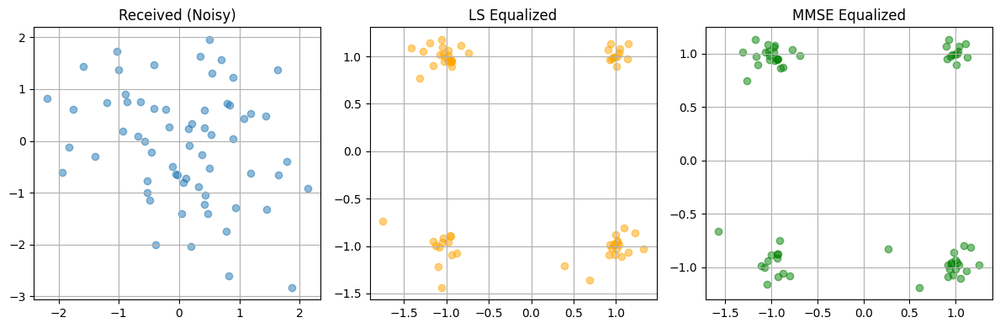

In [126]:
def ls_equalizer(H_est, Y):
    """
    LS Equalizer: X_hat = Y / H_est
    """
    H_est_safe = np.where(H_est == 0, 1e-12, H_est)
    return Y / H_est_safe

def mmse_equalizer(H_est, Y, noise_var):
    """
    MMSE Equalizer: X_hat = (H* / (|H|^2 + N0)) * Y
    """
    H_abs2 = np.abs(H_est) ** 2
    denom = H_abs2 + noise_var
    denom = np.where(denom == 0, 1e-12, denom)
    return (np.conj(H_est) / denom) * Y

# ---------------- Simulation ----------------
def simulate_equalization(N=64, noise_var=0.01):
    # Generate random QPSK symbols
    tx_symbols = np.random.choice([-1, 1], size=N) + 1j * np.random.choice([-1, 1], size=N)

    # Generate Rayleigh channel
    H = (np.random.randn(N) + 1j * np.random.randn(N)) / np.sqrt(2)

    # Apply channel and AWGN
    noise = np.sqrt(noise_var/2) * (np.random.randn(N) + 1j * np.random.randn(N))
    rx_symbols = H * tx_symbols + noise

    # Equalize
    X_ls = ls_equalizer(H, rx_symbols)
    X_mmse = mmse_equalizer(H, rx_symbols, noise_var)

    # Compute errors
    mse_ls = np.mean(np.abs(X_ls - tx_symbols)**2)
    mse_mmse = np.mean(np.abs(X_mmse - tx_symbols)**2)

    print(f"MSE (LS): {mse_ls:.4f}")
    print(f"MSE (MMSE): {mse_mmse:.4f}")

    # Plot constellation comparison
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.scatter(rx_symbols.real, rx_symbols.imag, alpha=0.5)
    plt.title("Received (Noisy)")
    plt.grid(True)

    plt.subplot(1, 3, 2)
    plt.scatter(X_ls.real, X_ls.imag, alpha=0.5, color='orange')
    plt.title("LS Equalized")
    plt.grid(True)

    plt.subplot(1, 3, 3)
    plt.scatter(X_mmse.real, X_mmse.imag, alpha=0.5, color='green')
    plt.title("MMSE Equalized")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Run it
simulate_equalization()


---
## Error Vector Magnitude (EVM)

**Error Vector Magnitude (EVM)** is a key metric used in digital communications to **quantify the quality of a modulated signal**. It compares the **received symbol** to the **ideal (reference) symbol**, capturing all imperfections including:

* Noise
* Phase noise
* Frequency offset
* IQ imbalance
* Nonlinearities

EVM is widely used in standards such as **3GPP LTE**, **5G NR**, **Wi-Fi**, and **IEEE 802.16** for receiver and transmitter performance evaluation.

### System Model

Let:

* $x_n$: Ideal transmitted symbol (reference constellation point)
* $\hat{x}_n$: Received symbol after demodulation and equalization

Then the **error vector** is defined as:

$$
e_n = \hat{x}_n - x_n
$$

The **EVM** is the **root mean square (RMS)** of the magnitude of these error vectors, normalized by the reference symbol energy.

**Linear EVM (unitless):**

$$
\text{EVM}_{\text{rms}} = \sqrt{ \frac{ \sum_{n=1}^N | \hat{x}_n - x_n |^2 }{ \sum_{n=1}^N |x_n|^2 } }
$$

**EVM in percentage:**

$$
\text{EVM}_{\%} = \text{EVM}_{\text{rms}} \times 100
$$

**EVM in dB:**

$$
\text{EVM}_{\text{dB}} = 20 \cdot \log_{10}(\text{EVM}_{\text{rms}})
$$

* **Lower EVM** indicates better signal quality
* Ideal system (no noise/distortion): $\text{EVM} = 0\%$
* EVM reflects the **combined effect** of impairments and is often more informative than SNR alone


### Typical Limits (per standards)

| Modulation | Max EVM (dB) | Max EVM (%) |
| ---------- | ------------ | ----------- |
| QPSK       | –20.0 dB     | 10.0%       |
| 16-QAM     | –25.0 dB     | 5.6%        |
| 64-QAM     | –28.0 dB     | 4.0%        |
| 256-QAM    | –32.0 dB     | 2.5%        |

(Exact values vary slightly by standard and application.)


### Why Use EVM?

* Holistic performance metric
* Used in conformance testing and quality assurance
* Reflects all RF and digital baseband imperfections

---


| Property         | Description                               |
| ---------------- | ----------------------------------------- |
| What it measures | Deviation of received from ideal symbol   |
| Depends on       | Noise, distortion, phase/frequency errors |
| Reported in      | % or dB                                   |
| Lower is better  | Yes (0% = perfect)                        |



---

# Low-Density Parity-Check (LDPC) Codes

**Low-Density Parity-Check (LDPC)** codes are powerful **linear block error-correcting codes** that approach the **Shannon limit**. They are used extensively in modern systems such as:

* 5G NR (control and data channels)
* Wi-Fi (802.11n/ac/ax)
* DVB-S2, DVB-T2 (Digital Video Broadcasting)
* CCSDS (space communications)

LDPC codes are defined by **sparse bipartite graphs**, making them well-suited for **iterative message-passing decoding algorithms**.

## 1. Code Structure

An LDPC code is defined by a **parity-check matrix** $\mathbf{H}$:

$$
\mathbf{H} \cdot \mathbf{c}^T = \mathbf{0}
$$

where:

* $\mathbf{H}$: $M \times N$ binary matrix
* $\mathbf{c}$: Codeword of length $N$ (binary vector)
* $M$: Number of parity-check equations
* $N$: Codeword length
* Code rate: $R = \frac{K}{N} = 1 - \frac{M}{N}$

### Low-Density

"Low-density" refers to the fact that **most entries of $\mathbf{H}$ are zero**. This sparsity enables fast encoding and efficient decoding.

## 2. Tanner Graph Representation

The LDPC code can be represented as a **bipartite graph**, called a **Tanner graph**, with:

* **Variable nodes** (corresponding to codeword bits)
* **Check nodes** (corresponding to parity-check equations)

An edge connects variable node $v_j$ to check node $c_i$ if $H_{i,j} = 1$.

This graphical structure enables **iterative decoding algorithms**.

## 3. Encoding Process

While LDPC is defined by the **parity-check matrix** $\mathbf{H}$, encoding requires a **generator matrix** $\mathbf{G}$ such that:

$$
\mathbf{c} = \mathbf{u} \cdot \mathbf{G}
$$

where:

* $\mathbf{u}$: Information bits of length $K$
* $\mathbf{c}$: Codeword of length $N$

For **systematic encoding**, $\mathbf{G}$ can be obtained from $\mathbf{H}$ through **Gaussian elimination** to convert $H$ into the form:

$$
\mathbf{H} = [\mathbf{A} \mid \mathbf{I}]
$$

where $\mathbf{I}$ is the identity matrix (parity part).

However, for large matrices (e.g., in 5G), **encoding is performed using structured quasi-cyclic LDPC matrices**, avoiding full matrix inversion.

## 4. Decoding: Belief Propagation (Sum-Product Algorithm)

LDPC decoding is typically performed using **iterative message-passing algorithms**, such as:

* **Sum-Product Algorithm (SPA)**
* **Min-Sum Algorithm (approximation)**

### Algorithm Steps:

At each iteration:

1. **Variable nodes** send their belief (log-likelihood ratio, LLR) to connected **check nodes**.
2. **Check nodes** compute outgoing messages using the incoming beliefs from variable nodes (excluding the one being updated).
3. Each **variable node** updates its estimate using the channel observation and messages from check nodes.
4. A **syndrome check** is performed:

   $$
   \mathbf{H} \cdot \hat{\mathbf{c}}^T = \mathbf{0}
   $$

   If satisfied, decoding is successful.

### Message Update Equations (LLR form)

Let $L_{j \to i}^{(t)}$ be the message from variable node $j$ to check node $i$ at iteration $t$:

$$
L_{j \to i}^{(t)} = L_{\text{ch}}(j) + \sum_{k \in \mathcal{N}(j) \setminus i} L_{k \to j}^{(t-1)}
$$

where $L_{\text{ch}}(j)$ is the channel LLR, and $\mathcal{N}(j)$ is the set of check nodes connected to variable node $j$.

Check node update (for SPA):

$$
L_{i \to j}^{(t)} = 2 \tanh^{-1} \left( \prod_{l \in \mathcal{M}(i) \setminus j} \tanh\left( \frac{L_{l \to i}^{(t-1)}}{2} \right) \right)
$$

Here $\mathcal{M}(i)$ is the set of variable nodes connected to check node $i$.

## 5. Code Design: Regular vs. Irregular LDPC

* **Regular LDPC**: Each variable/check node has a fixed degree (e.g., every variable node connects to 3 check nodes)
* **Irregular LDPC**: Degrees vary; better performance due to higher flexibility

Irregular LDPC codes are widely used in practice (e.g., DVB-S2, 5G NR) and optimized using **density evolution** and **EXIT charts**.

## 6. LDPC in 5G NR

3GPP 5G NR uses:

* **Quasi-cyclic LDPC codes**
* Two base graphs:

  * **Base Graph 1 (BG1)**: Used for large payloads and low code rates
  * **Base Graph 2 (BG2)**: Used for short payloads or high code rates
* Standardized lifting sizes and permutation matrices allow scalable and efficient hardware implementations

---

| Property   | Description                                      |
| ---------- | ------------------------------------------------ |
| Type       | Linear block code                                |
| Defined by | Sparse parity-check matrix $\mathbf{H}$          |
| Decoding   | Iterative (belief propagation)                   |
| Advantages | Near-capacity performance, parallelizable        |
| Used in    | 5G, Wi-Fi, DVB-S2, CCSDS, storage, optical links |



In [124]:
from scipy.sparse import csr_matrix
from scipy.special import expit

# ---------- Generate a Regular (3,6) LDPC Parity-Check Matrix ----------
def generate_ldpc_matrix(N, M, column_weight=3):
    H = np.zeros((M, N), dtype=int)
    for col in range(N):
        ones = np.random.choice(M, column_weight, replace=False)
        H[ones, col] = 1
    return H

# ---------- Naive LDPC Systematic Encoder ----------
def ldpc_encode(H, u):
    M, N = H.shape
    K = N - M
    if len(u) != K:
        raise ValueError("Input length must be N - M")
    # Construct generator matrix (naive for small H)
    H1 = H[:, :K]
    H2 = H[:, K:]
    try:
        P = np.linalg.pinv(H1) @ H2
    except np.linalg.LinAlgError:
        raise ValueError("Matrix H1 is not invertible")
    G = np.hstack([np.eye(K, dtype=int), P]) % 2
    return (u @ G % 2).astype(int)

# ---------- Sum-Product Algorithm Decoder ----------
def ldpc_decode_spa(H, rx_llr, max_iters=30):
    M, N = H.shape
    H_sparse = csr_matrix(H)
    Lq = np.tile(rx_llr, (M, 1)) * H  # Variable to check
    Lr = np.zeros((M, N))             # Check to variable

    for _ in range(max_iters):
        # Check node update
        for m in range(M):
            indices = H_sparse[m].indices
            for n in indices:
                others = [i for i in indices if i != n]
                prod = np.prod(np.tanh(Lq[m, others] / 2 + 1e-12))
                Lr[m, n] = 2 * np.arctanh(prod + 1e-12)

        # Variable node update
        for n in range(N):
            connected = H_sparse[:, n].indices
            Lq[connected, n] = rx_llr[n] + np.sum(Lr[connected, n], axis=0)

        # Posterior
        L_posterior = rx_llr + np.sum(Lr, axis=0)
        decoded = (L_posterior < 0).astype(int)

        # Check if parity satisfied
        if np.all((H @ decoded) % 2 == 0):
            return decoded[:N - M], True

    return decoded[:N - M], False

# ---------- Channel Simulation ----------
def simulate_ldpc(N=12, M=6, snr_db=3):
    K = N - M
    H = generate_ldpc_matrix(N, M)
    u = np.random.randint(0, 2, K)
    c = ldpc_encode(H, u)

    # BPSK modulation
    tx = 1 - 2 * c
    snr = 10**(snr_db / 10)
    noise_std = np.sqrt(1 / (2 * snr))
    noise = noise_std * np.random.randn(N)
    rx = tx + noise
    rx_llr = 2 * rx / (noise_std**2)

    decoded, success = ldpc_decode_spa(H, rx_llr)
    return u, c, decoded, success

# ---------- Run the Simulation ----------
u, c, decoded, success = simulate_ldpc()
print("Original bits:   ", u)
print("Encoded codeword:", c)
print("Decoded bits:    ", decoded)
print("Success:         ", success)


# works with small N (e.g, N = 12) due to pseudo-inverse in encoding
# In practice (e.g. 5G), LDPC uses quasi-cyclic base matrices and efficient encoder/decoder circuits.



Original bits:    [0 0 1 0 1 1]
Encoded codeword: [0 0 1 0 1 1 1 0 1 0 1 0]
Decoded bits:     [0 0 1 0 0 0]
Success:          False


/var/folders/s3/38gpf0796ls5pl2z8c7czftr0000gn/T/ipykernel_4209/4014034024.py:42: RuntimeWarning: invalid value encountered in arctanh
  Lr[m, n] = 2 * np.arctanh(prod + 1e-12)


In [ ]:
from scipy.sparse import csr_matrix

# Optimized LDPC functions (reusing matrix, decoding vectorized)
def generate_ldpc_matrix(N, M, column_weight=3):
    H = np.zeros((M, N), dtype=int)
    for col in range(N):
        ones = np.random.choice(M, column_weight, replace=False)
        H[ones, col] = 1
    return H

def ldpc_encode(H, u):
    M, N = H.shape
    K = N - M
    H1 = H[:, :K]
    H2 = H[:, K:]
    try:
        P = np.linalg.pinv(H1) @ H2
    except np.linalg.LinAlgError:
        raise ValueError("Matrix H1 is not invertible")
    G = np.hstack([np.eye(K, dtype=int), P]) % 2
    return (u @ G % 2).astype(int)

def min_sum_decode(H, y_llr, max_iters=30):
    M, N = H.shape
    H_csr = csr_matrix(H)
    Lq = np.tile(y_llr, (M, 1)) * H
    Lr = np.zeros((M, N))

    for _ in range(max_iters):
        for m in range(M):
            indices = H_csr[m].indices
            for n in indices:
                others = [j for j in indices if j != n]
                signs = np.sign(Lq[m, others])
                values = np.abs(Lq[m, others])
                if len(values) == 0:
                    continue
                min_val = np.min(values)
                prod_sign = np.prod(signs)
                Lr[m, n] = prod_sign * min_val

        for n in range(N):
            indices = H_csr[:, n].indices
            Lq[indices, n] = y_llr[n] + np.sum(Lr[indices, n], axis=0)

        L_posterior = y_llr + np.sum(Lr, axis=0)
        decoded = (L_posterior < 0).astype(int)
        if np.all((H @ decoded) % 2 == 0):
            return decoded[:N - M], True

    return decoded[:N - M], False

def simulate_ber_ldpc_optimized(N=48, M=24, snr_db_range=np.arange(0, 6, 1), num_trials=50):
    K = N - M
    H = generate_ldpc_matrix(N, M)
    ber = []

    for snr_db in snr_db_range:
        errors = 0
        total_bits = 0
        snr = 10 ** (snr_db / 10)
        noise_std = np.sqrt(1 / (2 * snr))

        for _ in range(num_trials):
            u = np.random.randint(0, 2, K)
            c = ldpc_encode(H, u)

            tx = 1 - 2 * c
            rx = tx + noise_std * np.random.randn(N)
            rx_llr = 2 * rx / (noise_std ** 2)

            decoded, success = min_sum_decode(H, rx_llr)
            errors += np.sum(u != decoded)
            total_bits += K

        ber.append(errors / total_bits)

    return snr_db_range, ber

# Run optimized simulation
snr_vals, ber_vals = simulate_ber_ldpc_optimized()


# Plot BER vs. SNR
plt.figure(figsize=(8, 5))
plt.semilogy(snr_vals, ber_vals, marker='o', linestyle='-', label="Min-Sum Decoding")
plt.grid(True, which='both')
plt.xlabel("SNR (dB)")
plt.ylabel("Bit Error Rate (BER)")
plt.title("LDPC BER vs SNR (N=48, M=24) using Min-Sum Decoding")
plt.legend()
plt.tight_layout()
plt.show()

## LDPC with Sionna 

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from sionna.fec.ldpc.encoding import LDPC5GEncoder
from sionna.fec.ldpc.decoding import LDPC5GDecoder
from sionna.utils import ebnodb2no

# Valid LDPC5G parameters
k = 512
n = 1024  # target, real n' is determined internally

encoder = LDPC5GEncoder(k=k, n=n)
decoder = LDPC5GDecoder(encoder, hard_out=True, num_iter=10)

snr_dbs = np.arange(0, 5.5, 0.5)
num_words = 1000

ber_list = []

for snr_db in snr_dbs:
    rate = k / n
    no = ebnodb2no(snr_db, rate, 2)
    noise_std = tf.sqrt(no / 2)

    total_errs = 0
    total_bits = 0

    for _ in range(num_words):
        u = tf.random.uniform([1, k], maxval=2, dtype=tf.int32)
        u_f = tf.cast(u, tf.float32)

        # Encode and get actual padded length n'
        c = encoder(u_f)           # shape [1, n']
        n_padded = c.shape[1]

        # BPSK modulation
        x = 1.0 - 2.0 * c

        # Noise
        noise = noise_std * tf.random.normal(shape=[1, n_padded])
        y = x + noise

        # LLRs and decoding
        llr = 2.0 * y / no
        u_hat = decoder(llr)       # returns [1, k]
        u_hat = tf.cast(u_hat, tf.int32)

        # BER
        total_errs += tf.reduce_sum(tf.cast(u != u_hat, tf.int32)).numpy()
        total_bits += k

    ber = total_errs / total_bits
    ber_list.append(ber)
    print(f"SNR = {snr_db:.1f} dB → BER = {ber:.5e}")

# Plot
plt.figure()
plt.semilogy(snr_dbs, ber_list, marker='o', label=f"LDPC 5G NR (k={k}, n≈{n})")
plt.grid(True, which='both')
plt.xlabel("SNR (dB)")
plt.ylabel("Bit Error Rate (BER)")
plt.title("LDPC BER vs SNR")
plt.legend()
plt.tight_layout()
plt.show()




---

## pyldpc
pip install pyldpc


In [ ]:
import numpy as np
from pyldpc import make_ldpc, encode, decode, get_message

# 1. Create LDPC matrices 
n = 30       # codeword length
d_v = 2      # variable-node degree
d_c = 3      # check-node degree
H, G = make_ldpc(n, d_v, d_c, systematic=True, sparse=True)  # :contentReference[oaicite:1]{index=1}

k = G.shape[1]  # number of info bits

# 2. Generate random message
v = np.random.randint(0, 2, size=k)

# 3. Encode (adds AWGN internally)
snr = 10  # SNR in dB
y = encode(G, v, snr)

# 4. Decode
d = decode(H, y, snr)

# 5. Extract original message
x = get_message(G, d)

print("Decoded correctly:", np.all(x == v))


In [ ]:
import numpy as np
from pyldpc import make_ldpc, encode, decode, get_message

# LDPC setup
n, d_v, d_c = 1000, 3, 6
H, G = make_ldpc(n, d_v, d_c, systematic=True, sparse=True)
k = G.shape[1]

# Simulation settings
snr_values = np.arange(0, 5, 1)
num_trials = 200

bers = []

for snr in snr_values:
    errs = 0
    for _ in range(num_trials):
        v = np.random.randint(0, 2, size=k)
        y = encode(G, v, snr)
        d = decode(H, y, snr)
        x = get_message(G, d)
        errs += np.sum(x != v)
    bers.append(errs / (num_trials * k))

for snr, ber in zip(snr_values, bers):
    print(f"SNR = {snr} dB, BER = {ber:.3e}")


# MIMO 

MIMO is a wireless communication technique that uses **multiple transmit (Tx)** and **multiple receive (Rx)** antennas to improve:

* **Spectral efficiency** (more data per unit bandwidth)
* **Link reliability** (through diversity)
* **Capacity** via spatial multiplexing

MIMO is a foundational technology in 4G (LTE), 5G, and Wi-Fi standards.

## **MIMO Channel Model**

Consider a flat-fading MIMO system with:

* $N_t$: Number of transmit antennas
* $N_r$: Number of receive antennas
* $\mathbf{x} \in \mathbb{C}^{N_t \times 1}$: Transmit symbol vector
* $\mathbf{y} \in \mathbb{C}^{N_r \times 1}$: Received symbol vector
* $\mathbf{H} \in \mathbb{C}^{N_r \times N_t}$: Channel matrix
* $\mathbf{n} \in \mathbb{C}^{N_r \times 1}$: AWGN vector

The input-output relationship is:

$$
\mathbf{y} = \mathbf{H} \mathbf{x} + \mathbf{n}
$$

Where:

* $\mathbf{H}_{i,j} \sim \mathcal{CN}(0,1)$ for Rayleigh fading
* $\mathbf{n} \sim \mathcal{CN}(\mathbf{0}, \sigma^2 \mathbf{I})$

## **Types of MIMO Techniques**

### a) **Spatial Diversity (MISO/MIMO)**

Used to improve reliability via **transmit diversity** (e.g., Alamouti coding) or **receive diversity**.

* **Alamouti (2x1)**: Space-time block code that provides full diversity with simple decoding

$$
\mathbf{X} = 
\begin{bmatrix}
x_1 & -x_2^* \\
x_2 & x_1^*
\end{bmatrix}
$$

### b) **Spatial Multiplexing**

Used to **increase capacity** by transmitting **independent data streams** simultaneously from different antennas.

If $\mathbf{H}$ has full rank and $N_r \geq N_t$, we can decode all streams:

$$
\mathbf{x} = \mathbf{H}^\dagger \mathbf{y}
$$

### c) **Beamforming (Pre-coding)**

Used to **steer energy** toward desired directions using Channel State Information (CSI):

$$
\mathbf{x} = \mathbf{w} s, \quad \text{where } \mathbf{w} \in \mathbb{C}^{N_t}
$$


## **Channel Capacity of MIMO**

For an i.i.d. Rayleigh channel, the **ergodic capacity** of a MIMO system with full CSI at receiver is:

$$
C = \mathbb{E} \left[ \log_2 \det \left( \mathbf{I}_{N_r} + \frac{\rho}{N_t} \mathbf{H} \mathbf{H}^\dagger \right) \right] \quad \text{(bps/Hz)}
$$

Where:

* $\rho$: Average SNR
* $\mathbf{H} \mathbf{H}^\dagger$: Gram matrix (positive semi-definite)


## **MIMO Detection Techniques**

To recover $\mathbf{x}$ from $\mathbf{y}$:

### a) **Zero-Forcing (ZF)**

$$
\hat{\mathbf{x}} = (\mathbf{H}^H \mathbf{H})^{-1} \mathbf{H}^H \mathbf{y}
$$

### b) **Minimum Mean Square Error (MMSE)**

$$
\hat{\mathbf{x}} = \left( \mathbf{H}^H \mathbf{H} + \sigma^2 \mathbf{I} \right)^{-1} \mathbf{H}^H \mathbf{y}
$$

### c) **Successive Interference Cancellation (SIC)**

Used in **V-BLAST** architectures: detect strongest stream first, subtract its contribution, repeat.


## **MIMO in 3GPP and 5G**

* 4G LTE: Up to 4x4 MIMO
* 5G NR: Up to 8x8 and **massive MIMO** (64 or more antennas at the base station)
* Uses **hybrid beamforming**, **CSI-RS** for feedback, and **codebook-based precoding**

---



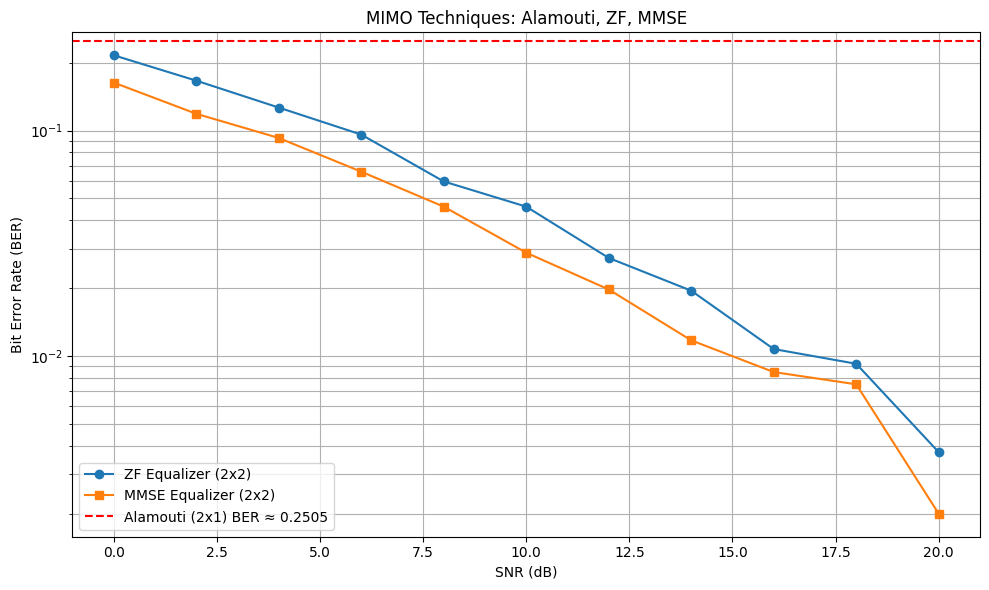

In [127]:
# ---------- Alamouti (2x1) STBC Simulation ----------
def simulate_alamouti(num_symbols=1000, snr_db=10):
    s1 = np.random.choice([-1, 1], num_symbols) + 1j * np.random.choice([-1, 1], num_symbols)
    s2 = np.random.choice([-1, 1], num_symbols) + 1j * np.random.choice([-1, 1], num_symbols)

    x1 = s1
    x2 = s2
    X = np.vstack([x1, -np.conj(x2), x2, np.conj(x1)]).T.reshape(-1, 2)

    h1 = (np.random.randn(num_symbols) + 1j * np.random.randn(num_symbols)) / np.sqrt(2)
    h2 = (np.random.randn(num_symbols) + 1j * np.random.randn(num_symbols)) / np.sqrt(2)

    y = []
    noise_std = np.sqrt(1 / (2 * 10**(snr_db/10)))

    for i in range(num_symbols):
        h = np.array([[h1[i]], [h2[i]]])
        xi = X[2*i:2*i+2]
        yi = xi @ h + noise_std * (np.random.randn(2, 1) + 1j * np.random.randn(2, 1))
        y.append(yi.flatten())

    y = np.array(y)
    y1, y2 = y[:, 0], y[:, 1]

    s1_hat = np.conj(h1)*y1 + h2*np.conj(y2)
    s2_hat = np.conj(h2)*y1 - h1*np.conj(y2)
    s1_hat /= np.abs(h1)**2 + np.abs(h2)**2
    s2_hat /= np.abs(h1)**2 + np.abs(h2)**2

    err1 = np.sum(np.sign(s1.real) != np.sign(s1_hat.real)) + np.sum(np.sign(s1.imag) != np.sign(s1_hat.imag))
    err2 = np.sum(np.sign(s2.real) != np.sign(s2_hat.real)) + np.sum(np.sign(s2.imag) != np.sign(s2_hat.imag))

    ber = (err1 + err2) / (2 * num_symbols * 2)
    return ber

# ---------- Spatial Multiplexing with ZF and MMSE ----------
def simulate_mimo_zf_mmse(Nt=2, Nr=2, snr_db_range=range(0, 21, 2), num_trials=1000):
    ber_zf = []
    ber_mmse = []

    for snr_db in snr_db_range:
        errors_zf = 0
        errors_mmse = 0
        total_bits = 0
        noise_var = 1 / (10 ** (snr_db / 10))

        for _ in range(num_trials):
            x = (np.random.choice([-1, 1], Nt) + 1j * np.random.choice([-1, 1], Nt)) / np.sqrt(2)
            H = (np.random.randn(Nr, Nt) + 1j * np.random.randn(Nr, Nt)) / np.sqrt(2)
            noise = np.sqrt(noise_var / 2) * (np.random.randn(Nr) + 1j * np.random.randn(Nr))
            y = H @ x + noise

            H_zf = np.linalg.pinv(H)
            x_hat_zf = H_zf @ y

            HhH = H.conj().T @ H
            W_mmse = np.linalg.inv(HhH + noise_var * np.eye(Nt)) @ H.conj().T
            x_hat_mmse = W_mmse @ y

            errors_zf += np.sum(np.sign(x.real) != np.sign(x_hat_zf.real)) + \
                         np.sum(np.sign(x.imag) != np.sign(x_hat_zf.imag))
            errors_mmse += np.sum(np.sign(x.real) != np.sign(x_hat_mmse.real)) + \
                           np.sum(np.sign(x.imag) != np.sign(x_hat_mmse.imag))
            total_bits += 2 * Nt

        ber_zf.append(errors_zf / total_bits)
        ber_mmse.append(errors_mmse / total_bits)

    return snr_db_range, ber_zf, ber_mmse

# ---------- Run and Plot ----------
ber_alamouti = simulate_alamouti()
snrs, ber_zf, ber_mmse = simulate_mimo_zf_mmse()

plt.figure(figsize=(10, 6))
plt.semilogy(snrs, ber_zf, 'o-', label='ZF Equalizer (2x2)')
plt.semilogy(snrs, ber_mmse, 's-', label='MMSE Equalizer (2x2)')
plt.axhline(ber_alamouti, color='red', linestyle='--', label=f'Alamouti (2x1) BER ≈ {ber_alamouti:.4f}')
plt.xlabel('SNR (dB)')
plt.ylabel('Bit Error Rate (BER)')
plt.grid(True, which='both')
plt.title('MIMO Techniques: Alamouti, ZF, MMSE')
plt.legend()
plt.tight_layout()
plt.show()


# **Beamforming: Theory and Mathematical Foundation**

**Beamforming** is a signal processing technique used in antenna arrays to direct the transmitted or received signal energy in specific spatial directions. Instead of radiating energy in all directions (omnidirectionally), beamforming enables:

* Increased **signal strength** at desired receivers
* Suppression of **interference** from undesired directions
* Improved **link reliability** and **spectral efficiency**

Beamforming is fundamental in:

* **Massive MIMO**
* **5G NR**
* **mmWave systems**
* **Radar and sonar arrays**

## **Beamforming Architecture**

There are three main types:

| Type        | Description                            | Hardware Requirements       |
| ----------- | -------------------------------------- | --------------------------- |
| **Analog**  | Single RF chain with phase shifters    | Low complexity, low cost    |
| **Digital** | One RF chain per antenna               | High flexibility, high cost |
| **Hybrid**  | Combines analog + digital (used in 5G) | Balanced performance/cost   |



## **Mathematical Model (Transmit Beamforming)**

Assume:

* $N_t$: Number of transmit antennas
* $\mathbf{h} \in \mathbb{C}^{N_t \times 1}$: Channel vector (Tx → Rx)
* $s$: Transmit symbol (scalar)
* $\mathbf{w} \in \mathbb{C}^{N_t \times 1}$: Beamforming weight vector (precoder)
* $\mathbf{x} = \mathbf{w}s$: Transmit signal
* $y$: Received signal
* $n \sim \mathcal{CN}(0, \sigma^2)$: AWGN noise

Then, the received signal is:

$$
y = \mathbf{h}^H \mathbf{w} s + n
$$

* $\mathbf{h}^H \mathbf{w}$: **Effective channel gain**
* The objective: **choose** $\mathbf{w}$ to **maximize SNR**

## **Beamforming Weight Design**

### a) **Maximum Ratio Transmission (MRT)** – for downlink

Choose:

$$
\mathbf{w} = \frac{\mathbf{h}}{\|\mathbf{h}\|}
$$

Then:

$$
y = \|\mathbf{h}\| s + n
$$

* This aligns the beam with the channel direction (matched filter).
* Maximizes received signal power.


### b) **Zero-Forcing Beamforming (ZF)** – for multi-user

Let $\mathbf{H} = [\mathbf{h}_1, \dots, \mathbf{h}_K]^H \in \mathbb{C}^{K \times N_t}$

ZF precoder:

$$
\mathbf{W}_{ZF} = \mathbf{H}^H \left(\mathbf{H} \mathbf{H}^H \right)^{-1}
$$

* Used in **multi-user MIMO** to eliminate inter-user interference.


### c) **Minimum Mean Square Error (MMSE) Beamforming**

Balances between interference cancellation and noise suppression:

$$
\mathbf{W}_{MMSE} = \mathbf{H}^H \left(\mathbf{H} \mathbf{H}^H + \sigma^2 \mathbf{I} \right)^{-1}
$$

* Performs better than ZF in low SNR regimes.


## **Beamforming in 5G NR**

* **CSI-RS (Channel State Information - Reference Signals)** are used for channel estimation.
* **Codebook-based beamforming**: UE feeds back best beam index.
* **Hybrid beamforming** used in mmWave to reduce RF chain count.

## **Receive Beamforming (Combining)**

For uplink (receiver side):

$$
\hat{s} = \mathbf{w}^H \mathbf{y}
$$

Where:

* $\mathbf{y} = \mathbf{h}s + \mathbf{n}$
* $\mathbf{w}$ can be MRT, ZF, or MMSE combiner

## **Array Response Vector**

For a **uniform linear array (ULA)** with spacing $d$, wavelength $\lambda$, angle $\theta$:

$$
\mathbf{a}(\theta) = \left[ 1, e^{j\frac{2\pi d}{\lambda} \sin\theta}, \dots, e^{j\frac{2\pi d}{\lambda}(N_t - 1)\sin\theta} \right]^T
$$

Used in **analog beamforming** and **directional scanning**.

---


| Strategy | Purpose                       | Formula                                                                          |
| -------- | ----------------------------- | -------------------------------------------------------------------------------- |
| **MRT**  | Maximize SNR                  | $\mathbf{w} = \frac{\mathbf{h}}{\|\mathbf{h}\|}$                                 |
| **ZF**   | Null interference             | $\mathbf{W} = \mathbf{H}^H (\mathbf{H} \mathbf{H}^H)^{-1}$                       |
| **MMSE** | Interference + noise tradeoff | $\mathbf{W} = \mathbf{H}^H (\mathbf{H} \mathbf{H}^H + \sigma^2 \mathbf{I})^{-1}$ |

---




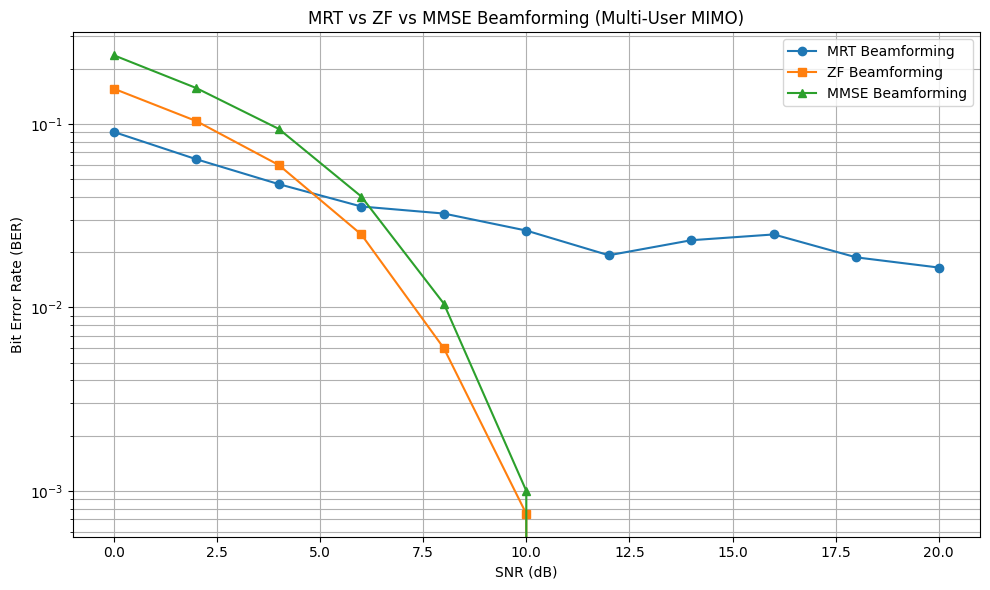

In [129]:
import numpy as np
import matplotlib.pyplot as plt

def simulate_mrt_zf_mmse_beamforming(K=2, Nt=4, snr_db_range=range(0, 21, 2), num_trials=1000):
    """
    Simulate MRT, ZF, and MMSE beamforming in a multi-user MIMO downlink system.

    Parameters:
        K: Number of users (receivers)
        Nt: Number of transmit antennas
        snr_db_range: List or range of SNR values in dB
        num_trials: Monte Carlo trials per SNR point

    Returns:
        snr_db_range: List of SNR values
        ber_mrt: Bit error rate for MRT
        ber_zf: Bit error rate for ZF
        ber_mmse: Bit error rate for MMSE
    """
    ber_mrt = []
    ber_zf = []
    ber_mmse = []

    for snr_db in snr_db_range:
        snr_linear = 10 ** (snr_db / 10)
        noise_var = 1 / snr_linear
        errors_mrt = 0
        errors_zf = 0
        errors_mmse = 0
        total_bits = 0

        for _ in range(num_trials):
            # QPSK symbol vector for each user
            s = (np.random.choice([-1, 1], K) + 1j * np.random.choice([-1, 1], K)) / np.sqrt(2)

            # Channel matrix (K x Nt)
            H = (np.random.randn(K, Nt) + 1j * np.random.randn(K, Nt)) / np.sqrt(2)

            # MRT beamforming
            W_mrt = H.conj().T
            W_mrt /= np.linalg.norm(W_mrt, axis=0, keepdims=True)
            x_mrt = W_mrt @ s
            y_mrt = H @ x_mrt + np.sqrt(noise_var / 2) * (np.random.randn(K) + 1j * np.random.randn(K))
            s_hat_mrt = y_mrt  # No Rx processing

            # ZF beamforming
            W_zf = H.conj().T @ np.linalg.inv(H @ H.conj().T)
            x_zf = W_zf @ s
            y_zf = H @ x_zf + np.sqrt(noise_var / 2) * (np.random.randn(K) + 1j * np.random.randn(K))
            s_hat_zf = y_zf

            # MMSE beamforming
            W_mmse = H.conj().T @ np.linalg.inv(H @ H.conj().T + noise_var * np.eye(K))
            x_mmse = W_mmse @ s
            y_mmse = H @ x_mmse + np.sqrt(noise_var / 2) * (np.random.randn(K) + 1j * np.random.randn(K))
            s_hat_mmse = y_mmse

            # Decision and error counting
            errors_mrt += np.sum(np.sign(s.real) != np.sign(s_hat_mrt.real)) + \
                          np.sum(np.sign(s.imag) != np.sign(s_hat_mrt.imag))
            errors_zf += np.sum(np.sign(s.real) != np.sign(s_hat_zf.real)) + \
                         np.sum(np.sign(s.imag) != np.sign(s_hat_zf.imag))
            errors_mmse += np.sum(np.sign(s.real) != np.sign(s_hat_mmse.real)) + \
                           np.sum(np.sign(s.imag) != np.sign(s_hat_mmse.imag))

            total_bits += 2 * K

        ber_mrt.append(errors_mrt / total_bits)
        ber_zf.append(errors_zf / total_bits)
        ber_mmse.append(errors_mmse / total_bits)

    return snr_db_range, ber_mrt, ber_zf, ber_mmse


# ---------- Run Simulation ----------
snrs, ber_mrt, ber_zf, ber_mmse = simulate_mrt_zf_mmse_beamforming()

# ---------- Plot ----------
plt.figure(figsize=(10, 6))
plt.semilogy(snrs, ber_mrt, 'o-', label='MRT Beamforming')
plt.semilogy(snrs, ber_zf, 's-', label='ZF Beamforming')
plt.semilogy(snrs, ber_mmse, '^-', label='MMSE Beamforming')
plt.xlabel('SNR (dB)')
plt.ylabel('Bit Error Rate (BER)')
plt.title('MRT vs ZF vs MMSE Beamforming (Multi-User MIMO)')
plt.grid(True, which='both')
plt.legend()
plt.tight_layout()
plt.show()


### Spatial Multiplexing vs Beamforming 

In Multiple-Input Multiple-Output (MIMO) systems, multiple antennas are used to exploit the spatial domain for performance enhancement. Two fundamental techniques used to improve throughput or reliability are:

* **Spatial Multiplexing (SM)**: Transmit multiple independent data streams **simultaneously** over the same frequency and time.
* **Beamforming (BF)**: Focus the transmitted energy **directionally** toward the receiver to **increase SNR** and reduce interference.

They serve different goals:

| Technique            | Primary Goal               | Usage Scenario            |
| -------------------- | -------------------------- | ------------------------- |
| Spatial Multiplexing | Increase data rate         | High SNR, rich scattering |
| Beamforming          | Increase reliability (SNR) | Low SNR, or LoS links     |


## **MIMO Channel Model**

The standard baseband narrowband MIMO channel model is:

$$
\mathbf{y} = \mathbf{H} \mathbf{x} + \mathbf{n}
$$

where:

* $\mathbf{y} \in \mathbb{C}^{M_r \times 1}$: received signal
* $\mathbf{H} \in \mathbb{C}^{M_r \times M_t}$: channel matrix
* $\mathbf{x} \in \mathbb{C}^{M_t \times 1}$: transmitted vector
* $\mathbf{n} \sim \mathcal{CN}(0, \sigma^2 \mathbf{I})$: noise


## **Spatial Multiplexing (SM)**

Transmit **multiple independent data streams** from different antennas. These are **separated at the receiver** using linear or nonlinear MIMO detectors (e.g., ZF, MMSE, SIC, ML).

### Signal Model:

Suppose $N_s \le \min(M_t, M_r)$ streams:

$$
\mathbf{x} = \sum_{i=1}^{N_s} \mathbf{e}_i s_i
$$

where:

* $s_i$: $i$-th data stream
* $\mathbf{e}_i$: unit vector activating antenna $i$

### Requirements:

* Rich scattering (uncorrelated channels)
* High SNR (for stream separation)
* Receiver complexity to decode streams

### Capacity (Ideal case):

$$
C_{\text{SM}} = \sum_{i=1}^{N_s} \log_2(1 + \text{SNR}_i)
$$

In i.i.d. Rayleigh fading, capacity scales linearly with $\min(M_t, M_r)$, i.e., **multiplexing gain**.

### Example Use:

* LTE/5G downlink
* WiFi MIMO (802.11n/ac/ax)
* V-BLAST architecture


### **Beamforming (BF)**

Send a **single data stream**, but adjust the antenna weights (phases and amplitudes) so that signals **constructively combine** at the receiver.

### Signal Model:

Let $s$ be the transmitted symbol. Use precoding vector $\mathbf{w} \in \mathbb{C}^{M_t \times 1}$:

$$
\mathbf{x} = \mathbf{w}s, \quad \text{with} \quad \|\mathbf{w}\|^2 = 1
$$

Then the received signal:

$$
\mathbf{y} = \mathbf{H} \mathbf{w}s + \mathbf{n}
$$

Effective channel gain:

$$
\text{SNR} = \frac{|\mathbf{H} \mathbf{w}|^2}{\sigma^2}
$$

Choose $\mathbf{w}$ to **maximize SNR**:

* If full CSI available at Tx:

  $$
  \mathbf{w}_{\text{opt}} = \frac{\mathbf{h}^H}{\|\mathbf{h}\|}
  $$

  (Maximum Ratio Transmission — MRT)
* If multiple receive antennas, use singular value decomposition (SVD):

  $$
  \mathbf{H} = \mathbf{U} \boldsymbol{\Sigma} \mathbf{V}^H \quad \Rightarrow \quad \mathbf{w} = \mathbf{v}_1
  $$

  (Transmit along dominant eigenmode)

### Benefits:

* Increased SNR (array gain)
* Interference suppression (multi-user BF)
* Simpler receiver

### Example Use:

* Millimeter wave (mmWave) 5G links
* Satellite communication
* Massive MIMO downlink in cellular systems

---

## **Comparison Table**

| Feature                | Spatial Multiplexing                | Beamforming                             |
| ---------------------- | ----------------------------------- | --------------------------------------- |
| Goal                   | Maximize data rate (throughput)     | Maximize reliability/SNR (coverage)     |
| Streams                | Multiple                            | Single (or few coordinated streams)     |
| Channel condition      | Requires uncorrelated spatial paths | Works best with LoS or correlated paths |
| Transmit Strategy      | Independent streams                 | Coherent combining using weights        |
| Complexity at receiver | High (multi-stream detection)       | Low (single-stream detection)           |
| SNR dependency         | Needs high SNR                      | Effective even in low SNR               |

---

## **Hybrid Approaches**

Modern systems often combine both:

* Use **beamforming** to create orthogonal spatial directions.
* Then **spatial multiplexing** across those beams (SVD-based MIMO).

Example:

* **SVD MIMO**: Diagonalize the MIMO channel $\mathbf{H}$ via:

  $$
  \mathbf{H} = \mathbf{U} \boldsymbol{\Sigma} \mathbf{V}^H
  $$

  Transmit along right singular vectors ($\mathbf{V}$) and receive via left singular vectors ($\mathbf{U}$), achieving parallel subchannels.




## MIMO + OFDM + Beamforming

1. **Generate OFDM symbols** with QPSK across all subcarriers.
2. **Apply channel $H_k$** and beamforming weights $\mathbf{W}_k$ per subcarrier $k$.
3. **Add AWGN**.
4. **Decode using the same per-subcarrier weights**.
5. **Calculate BER across all subcarriers and OFDM symbols**.


### Assumptions for Simplicity

* OFDM with $N_{\text{sc}}$ subcarriers (e.g. 64)
* Flat fading per subcarrier (i.i.d. channel $H_k \in \mathbb{C}^{K \times N_t}$)
* Same number of users $K$ as before
* One OFDM symbol per simulation run
----

---
### OFDM Symbol Generation for Multi-User MIMO

We generate QPSK symbols for each user across multiple subcarriers.

* Define $K$: number of users (receivers)
* Define $N_t$: number of transmit antennas
* Define $N_{\text{sc}}$: number of subcarriers
* For each user, generate one QPSK symbol per subcarrier





In [130]:
def generate_ofdm_qpsk_symbols(K, N_sc):
    """
    Generate QPSK symbols per subcarrier for K users over N_sc subcarriers.
    
    Output:
        S: K x N_sc matrix of QPSK symbols
    """
    bits = np.random.randint(0, 2, size=(K, N_sc, 2))
    symbols = (2 * bits[..., 0] - 1) + 1j * (2 * bits[..., 1] - 1)
    symbols /= np.sqrt(2)  # Normalize QPSK power
    return symbols



### Channel and Beamforming per Subcarrier

For each subcarrier $k \in [0, N_{\text{sc}} - 1]$:

1. Generate a random Rayleigh channel matrix $\mathbf{H}_k \in \mathbb{C}^{K \times N_t}$
2. Compute:

   * **MRT beamformer:** $\mathbf{W}_k^{\text{MRT}} = \mathbf{H}_k^H / \|\mathbf{H}_k^H\|$
   * **ZF beamformer:** $\mathbf{W}_k^{\text{ZF}} = \mathbf{H}_k^H(\mathbf{H}_k \mathbf{H}_k^H)^{-1}$
   * **MMSE beamformer:**

     $$
     \mathbf{W}_k^{\text{MMSE}} = \mathbf{H}_k^H \left(\mathbf{H}_k \mathbf{H}_k^H + \sigma^2 \mathbf{I}\right)^{-1}
     $$

---


In [131]:
def generate_mimo_channels_and_weights(K, Nt, N_sc, snr_db):
    """
    Generate MIMO channels and MRT, ZF, MMSE beamforming weights for each subcarrier.

    Returns:
        H_list: List of H_k ∈ ℂ^{K×Nt}
        W_mrt_list, W_zf_list, W_mmse_list: beamforming weights per subcarrier
    """
    H_list = []
    W_mrt_list = []
    W_zf_list = []
    W_mmse_list = []

    snr_linear = 10 ** (snr_db / 10)
    noise_var = 1 / snr_linear

    for _ in range(N_sc):
        H = (np.random.randn(K, Nt) + 1j * np.random.randn(K, Nt)) / np.sqrt(2)
        H_list.append(H)

        # MRT
        W_mrt = H.conj().T
        W_mrt /= np.linalg.norm(W_mrt, axis=0, keepdims=True)
        W_mrt_list.append(W_mrt)

        # ZF
        W_zf = H.conj().T @ np.linalg.inv(H @ H.conj().T)
        W_zf_list.append(W_zf)

        # MMSE
        W_mmse = H.conj().T @ np.linalg.inv(H @ H.conj().T + noise_var * np.eye(K))
        W_mmse_list.append(W_mmse)

    return H_list, W_mrt_list, W_zf_list, W_mmse_list

### Apply Beamforming and Simulate MIMO-OFDM Transmission**

For each subcarrier $k$:

1. Use the QPSK symbol vector $\mathbf{s}_k \in \mathbb{C}^{K}$
2. Multiply by beamforming matrix $\mathbf{W}_k \in \mathbb{C}^{N_t \times K}$ to get transmit signal $\mathbf{x}_k = \mathbf{W}_k \cdot \mathbf{s}_k$
3. Pass through the channel $\mathbf{H}_k \in \mathbb{C}^{K \times N_t}$:
   $\mathbf{y}_k = \mathbf{H}_k \cdot \mathbf{x}_k + \mathbf{n}_k$
4. Collect received signals $\mathbf{y}_k$ for all subcarriers



In [132]:
def transmit_through_channel(S, H_list, W_list, snr_db):
    """
    Apply beamforming, channel, and AWGN noise for each subcarrier.

    Inputs:
        S: QPSK symbols, shape (K, N_sc)
        H_list: list of KxNt channel matrices
        W_list: list of Nt x K beamforming matrices
        snr_db: SNR in dB

    Returns:
        Y: received signal matrix, shape (K, N_sc)
    """
    K, N_sc = S.shape
    snr_linear = 10 ** (snr_db / 10)
    noise_var = 1 / snr_linear

    Y = np.zeros((K, N_sc), dtype=complex)

    for k in range(N_sc):
        H_k = H_list[k]
        W_k = W_list[k]
        s_k = S[:, k]  # (K,)
        x_k = W_k @ s_k  # (Nt,)
        noise = np.sqrt(noise_var / 2) * (np.random.randn(K) + 1j * np.random.randn(K))
        y_k = H_k @ x_k + noise
        Y[:, k] = y_k

    return Y

### Decision and BER Calculation**

For each subcarrier:

1. Received signal $\mathbf{y}_k \in \mathbb{C}^K$
2. Original symbol $\mathbf{s}_k \in \mathbb{C}^K$
3. Perform hard decision:

   $$
   \hat{b}_k = \text{sign}(\text{Re}(\mathbf{y}_k)), \quad \text{sign}(\text{Im}(\mathbf{y}_k))
   $$
4. Compare with $\mathbf{s}_k$ to compute bit errors
5. Sum over all users and subcarriers to get total BER




In [133]:
def compute_ber(S_tx, Y_rx):
    """
    Compute bit error rate by comparing transmitted and received QPSK symbols.

    Inputs:
        S_tx: Transmitted QPSK symbols, shape (K, N_sc)
        Y_rx: Received QPSK symbols, shape (K, N_sc)

    Returns:
        BER (bit error rate)
    """
    bits_tx_real = np.sign(S_tx.real)
    bits_tx_imag = np.sign(S_tx.imag)
    bits_rx_real = np.sign(Y_rx.real)
    bits_rx_imag = np.sign(Y_rx.imag)

    errors = np.sum(bits_tx_real != bits_rx_real) + np.sum(bits_tx_imag != bits_rx_imag)
    total_bits = 2 * S_tx.size

    return errors / total_bits

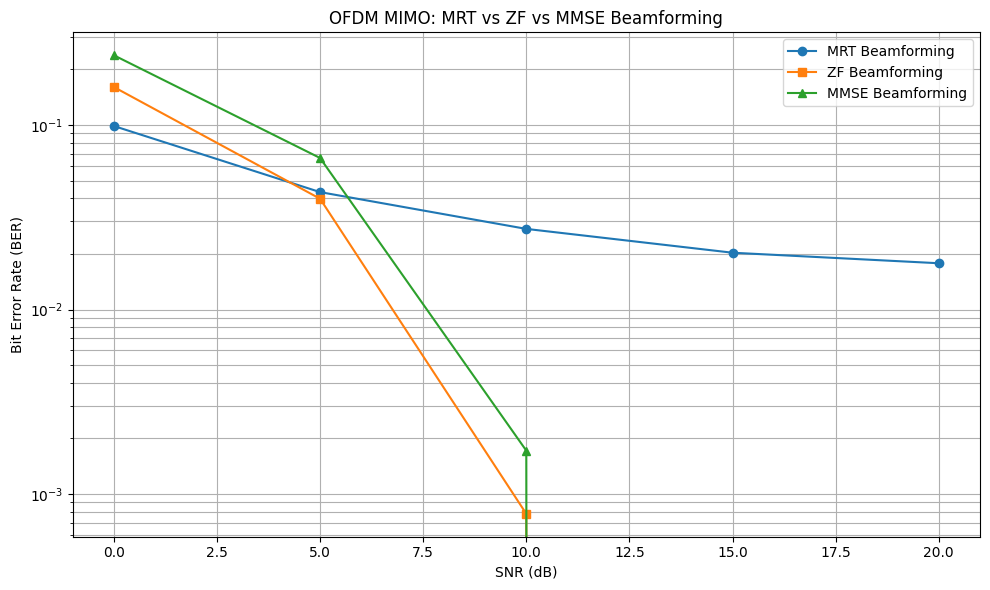

In [134]:
# Generate QPSK symbols for all users and subcarriers
def generate_ofdm_qpsk_symbols(K, N_sc):
    bits = np.random.randint(0, 2, size=(K, N_sc, 2))
    symbols = (2 * bits[..., 0] - 1) + 1j * (2 * bits[..., 1] - 1)
    symbols /= np.sqrt(2)
    return symbols

# Generate Rayleigh MIMO channel and beamformers for each subcarrier
def generate_mimo_channels_and_weights(K, Nt, N_sc, snr_db):
    H_list, W_mrt_list, W_zf_list, W_mmse_list = [], [], [], []
    snr_linear = 10 ** (snr_db / 10)
    noise_var = 1 / snr_linear

    for _ in range(N_sc):
        H = (np.random.randn(K, Nt) + 1j * np.random.randn(K, Nt)) / np.sqrt(2)
        H_list.append(H)

        W_mrt = H.conj().T
        W_mrt /= np.linalg.norm(W_mrt, axis=0, keepdims=True)
        W_mrt_list.append(W_mrt)

        W_zf = H.conj().T @ np.linalg.inv(H @ H.conj().T)
        W_zf_list.append(W_zf)

        W_mmse = H.conj().T @ np.linalg.inv(H @ H.conj().T + noise_var * np.eye(K))
        W_mmse_list.append(W_mmse)

    return H_list, W_mrt_list, W_zf_list, W_mmse_list

# Transmit symbols with beamforming and channel + noise
def transmit_through_channel(S, H_list, W_list, snr_db):
    K, N_sc = S.shape
    snr_linear = 10 ** (snr_db / 10)
    noise_var = 1 / snr_linear
    Y = np.zeros((K, N_sc), dtype=complex)

    for k in range(N_sc):
        H_k, W_k, s_k = H_list[k], W_list[k], S[:, k]
        x_k = W_k @ s_k
        noise = np.sqrt(noise_var / 2) * (np.random.randn(K) + 1j * np.random.randn(K))
        Y[:, k] = H_k @ x_k + noise

    return Y

# Compute BER
def compute_ber(S_tx, Y_rx):
    bits_tx_real = np.sign(S_tx.real)
    bits_tx_imag = np.sign(S_tx.imag)
    bits_rx_real = np.sign(Y_rx.real)
    bits_rx_imag = np.sign(Y_rx.imag)
    errors = np.sum(bits_tx_real != bits_rx_real) + np.sum(bits_tx_imag != bits_rx_imag)
    return errors / (2 * S_tx.size)

# Simulation loop
def simulate_ofdm_beamforming_ber_fast(K=2, Nt=4, N_sc=32, snr_db_range=range(0, 21, 5), num_trials=50):
    ber_mrt, ber_zf, ber_mmse = [], [], []

    for snr_db in snr_db_range:
        errors_mrt = errors_zf = errors_mmse = 0
        total_bits = 0

        for _ in range(num_trials):
            S = generate_ofdm_qpsk_symbols(K, N_sc)
            H_list, W_mrt_list, W_zf_list, W_mmse_list = generate_mimo_channels_and_weights(K, Nt, N_sc, snr_db)

            Y_mrt = transmit_through_channel(S, H_list, W_mrt_list, snr_db)
            Y_zf = transmit_through_channel(S, H_list, W_zf_list, snr_db)
            Y_mmse = transmit_through_channel(S, H_list, W_mmse_list, snr_db)

            errors_mrt += compute_ber(S, Y_mrt) * S.size * 2
            errors_zf += compute_ber(S, Y_zf) * S.size * 2
            errors_mmse += compute_ber(S, Y_mmse) * S.size * 2
            total_bits += S.size * 2

        ber_mrt.append(errors_mrt / total_bits)
        ber_zf.append(errors_zf / total_bits)
        ber_mmse.append(errors_mmse / total_bits)

    return snr_db_range, ber_mrt, ber_zf, ber_mmse

# Run and plot
snrs, ber_mrt, ber_zf, ber_mmse = simulate_ofdm_beamforming_ber_fast()

plt.figure(figsize=(10, 6))
plt.semilogy(snrs, ber_mrt, 'o-', label='MRT Beamforming')
plt.semilogy(snrs, ber_zf, 's-', label='ZF Beamforming')
plt.semilogy(snrs, ber_mmse, '^-', label='MMSE Beamforming')
plt.xlabel('SNR (dB)')
plt.ylabel('Bit Error Rate (BER)')
plt.title('OFDM MIMO: MRT vs ZF vs MMSE Beamforming')
plt.grid(True, which='both')
plt.legend()
plt.tight_layout()
plt.show()


### Add frequency-selective fading (per-subcarrier)

### Model imperfect CSI (channel estimation error)

### Extend to uplink MIMO beamforming (receive-side)

### **Beam Pattern of MIMO Beamforming Vector**


For a **Uniform Linear Array (ULA)** with inter-element spacing $d = \lambda/2$, the **steering vector** for direction $\theta$ is:

$$
\mathbf{a}(\theta) = \begin{bmatrix}
1 \\
e^{-j\pi \sin(\theta)} \\
e^{-j2\pi \sin(\theta)} \\
\vdots \\
e^{-j(N_t-1)\pi \sin(\theta)}
\end{bmatrix}
\in \mathbb{C}^{N_t}
$$

The **beam pattern** (gain in direction $\theta$) is:

$$
G(\theta) = |\mathbf{w}^H \mathbf{a}(\theta)|^2
$$

Where $\mathbf{w} \in \mathbb{C}^{N_t}$ is the beamforming weight vector.



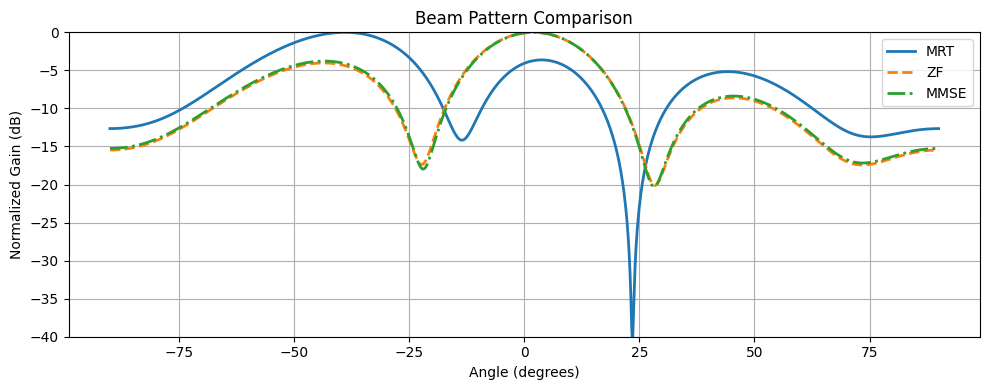

In [137]:
import numpy as np
import matplotlib.pyplot as plt

# === Function: Generate channels and beamformers ===
def generate_mimo_channels_and_weights(K, Nt, N_sc, snr_db):
    H_list, W_mrt_list, W_zf_list, W_mmse_list = [], [], [], []
    snr_linear = 10 ** (snr_db / 10)
    noise_var = 1 / snr_linear

    for _ in range(N_sc):
        H = (np.random.randn(K, Nt) + 1j * np.random.randn(K, Nt)) / np.sqrt(2)
        H_list.append(H)

        W_mrt = H.conj().T
        W_mrt /= np.linalg.norm(W_mrt, axis=0, keepdims=True)
        W_mrt_list.append(W_mrt)

        W_zf = H.conj().T @ np.linalg.inv(H @ H.conj().T)
        W_zf_list.append(W_zf)

        W_mmse = H.conj().T @ np.linalg.inv(H @ H.conj().T + noise_var * np.eye(K))
        W_mmse_list.append(W_mmse)

    return H_list, W_mrt_list, W_zf_list, W_mmse_list

# === Function: Plot MRT vs ZF vs MMSE beam patterns ===
def plot_compare_beam_patterns_with_mmse(w_mrt, w_zf, w_mmse, Nt, title='Beam Pattern Comparison'):
    theta_deg = np.linspace(-90, 90, 1000)
    theta_rad = np.radians(theta_deg)

    def steering_vector(theta):
        return np.exp(-1j * np.pi * np.arange(Nt)[:, None] * np.sin(theta))  # shape: (Nt, len(theta))

    A = steering_vector(theta_rad)
    pattern_mrt = np.abs(w_mrt.conj().T @ A) ** 2
    pattern_zf = np.abs(w_zf.conj().T @ A) ** 2
    pattern_mmse = np.abs(w_mmse.conj().T @ A) ** 2

    pattern_mrt_db = 10 * np.log10(pattern_mrt / np.max(pattern_mrt) + 1e-12)
    pattern_zf_db = 10 * np.log10(pattern_zf / np.max(pattern_zf) + 1e-12)
    pattern_mmse_db = 10 * np.log10(pattern_mmse / np.max(pattern_mmse) + 1e-12)

    plt.figure(figsize=(10, 4))
    plt.plot(theta_deg, pattern_mrt_db, label='MRT', linewidth=2)
    plt.plot(theta_deg, pattern_zf_db, label='ZF', linestyle='--', linewidth=2)
    plt.plot(theta_deg, pattern_mmse_db, label='MMSE', linestyle='-.', linewidth=2)
    plt.title(title)
    plt.xlabel("Angle (degrees)")
    plt.ylabel("Normalized Gain (dB)")
    plt.grid(True)
    plt.ylim([-40, 0])
    plt.legend()
    plt.tight_layout()
    plt.show()

# === Execution: Generate one channel and plot beam patterns ===
K = 2       # Number of users
Nt = 4      # Number of transmit antennas
N_sc = 1    # One subcarrier
snr_db = 10 # SNR

_, W_mrt_list, W_zf_list, W_mmse_list = generate_mimo_channels_and_weights(K, Nt, N_sc, snr_db)

# Get beamforming vectors for User 0
w_mrt = W_mrt_list[0][:, 0]
w_zf = W_zf_list[0][:, 0]
w_mmse = W_mmse_list[0][:, 0]

# Plot beam pattern comparison
plot_compare_beam_patterns_with_mmse(w_mrt, w_zf, w_mmse, Nt)


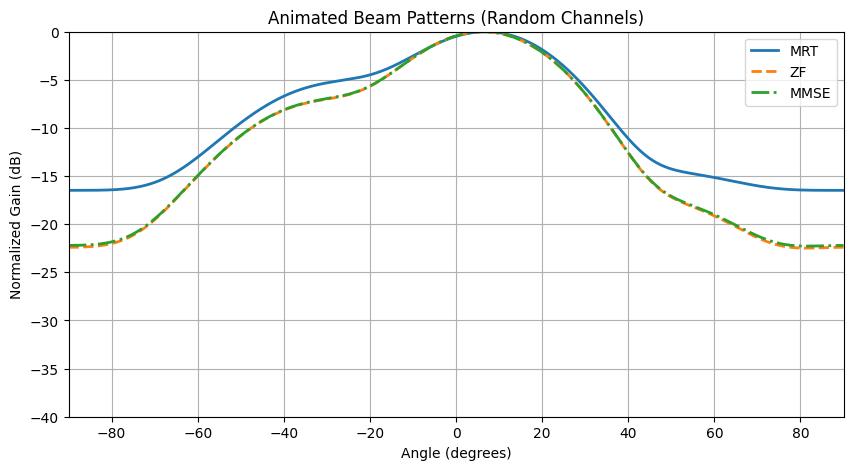

In [138]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# === Beamforming weight generation function ===
def generate_mimo_channels_and_weights(K, Nt, N_sc, snr_db):
    H_list, W_mrt_list, W_zf_list, W_mmse_list = [], [], [], []
    snr_linear = 10 ** (snr_db / 10)
    noise_var = 1 / snr_linear

    for _ in range(N_sc):
        H = (np.random.randn(K, Nt) + 1j * np.random.randn(K, Nt)) / np.sqrt(2)
        H_list.append(H)

        W_mrt = H.conj().T
        W_mrt /= np.linalg.norm(W_mrt, axis=0, keepdims=True)
        W_mrt_list.append(W_mrt)

        W_zf = H.conj().T @ np.linalg.inv(H @ H.conj().T)
        W_zf_list.append(W_zf)

        W_mmse = H.conj().T @ np.linalg.inv(H @ H.conj().T + noise_var * np.eye(K))
        W_mmse_list.append(W_mmse)

    return H_list, W_mrt_list, W_zf_list, W_mmse_list

# === Beam pattern animation function ===
def animate_beam_patterns(K=2, Nt=4, N_sc=1, snr_db=10, frames=50):
    theta_deg = np.linspace(-90, 90, 1000)
    theta_rad = np.radians(theta_deg)

    def steering_vector(theta):
        return np.exp(-1j * np.pi * np.arange(Nt)[:, None] * np.sin(theta))  # shape: (Nt, len(theta))

    A = steering_vector(theta_rad)

    fig, ax = plt.subplots(figsize=(10, 5))
    line_mrt, = ax.plot([], [], label='MRT', linewidth=2)
    line_zf, = ax.plot([], [], label='ZF', linestyle='--', linewidth=2)
    line_mmse, = ax.plot([], [], label='MMSE', linestyle='-.', linewidth=2)

    ax.set_xlim(-90, 90)
    ax.set_ylim(-40, 0)
    ax.set_xlabel("Angle (degrees)")
    ax.set_ylabel("Normalized Gain (dB)")
    ax.set_title("Animated Beam Patterns (Random Channels)")
    ax.grid(True)
    ax.legend()

    def init():
        line_mrt.set_data([], [])
        line_zf.set_data([], [])
        line_mmse.set_data([], [])
        return line_mrt, line_zf, line_mmse

    def update(frame):
        _, W_mrt_list, W_zf_list, W_mmse_list = generate_mimo_channels_and_weights(K, Nt, N_sc, snr_db)
        w_mrt = W_mrt_list[0][:, 0]
        w_zf = W_zf_list[0][:, 0]
        w_mmse = W_mmse_list[0][:, 0]

        pattern_mrt = np.abs(w_mrt.conj().T @ A) ** 2
        pattern_zf = np.abs(w_zf.conj().T @ A) ** 2
        pattern_mmse = np.abs(w_mmse.conj().T @ A) ** 2

        pattern_mrt_db = 10 * np.log10(pattern_mrt / np.max(pattern_mrt) + 1e-12)
        pattern_zf_db = 10 * np.log10(pattern_zf / np.max(pattern_zf) + 1e-12)
        pattern_mmse_db = 10 * np.log10(pattern_mmse / np.max(pattern_mmse) + 1e-12)

        line_mrt.set_data(theta_deg, pattern_mrt_db)
        line_zf.set_data(theta_deg, pattern_zf_db)
        line_mmse.set_data(theta_deg, pattern_mmse_db)
        return line_mrt, line_zf, line_mmse

    anim = FuncAnimation(fig, update, init_func=init, frames=frames, interval=300, blit=True)
    return anim

# === Run the animation and display ===
beam_anim = animate_beam_patterns(K=2, Nt=4, snr_db=10, frames=40)
HTML(beam_anim.to_jshtml())  # Use this line in Jupyter to view



# Massive MIMO and Hybrid Beamforming

**Massive MIMO (Multiple-Input Multiple-Output)** is a key technology in modern wireless communication systems (5G and beyond), where base stations are equipped with a large number of antennas (typically tens to hundreds) to simultaneously serve many users.

* Base station with $M \gg 1$ antennas (e.g., $M = 64, 128, 256$)
* Serves $K$ users ($K \ll M$), e.g., $K = 8$
* Operates in **TDD (Time Division Duplexing)** to leverage **channel reciprocity**
* Improves:

  * Spectral efficiency
  * Energy efficiency
  * Interference suppression
  * Beamforming and spatial multiplexing gains

## System Model

Let:

* $M$: Number of BS antennas
* $K$: Number of users (single antenna)
* $\mathbf{H} \in \mathbb{C}^{K \times M}$: Channel matrix
* $\mathbf{x} \in \mathbb{C}^{M \times 1}$: Transmitted signal vector
* $\mathbf{y} \in \mathbb{C}^{K \times 1}$: Received signal vector
* $\mathbf{n} \sim \mathcal{CN}(0, \sigma^2 \mathbf{I})$: AWGN noise

The uplink/downlink channel is modeled as:

$$
\mathbf{y} = \mathbf{H} \mathbf{x} + \mathbf{n}
$$

## Beamforming in Massive MIMO

Beamforming enables the BS to direct signal energy toward intended users while suppressing interference.

### Linear Precoding Techniques

* **Maximum Ratio Transmission (MRT):**

  $$
  \mathbf{W}_{\text{MRT}} = \mathbf{H}^H
  $$
* **Zero-Forcing (ZF):**

  $$
  \mathbf{W}_{\text{ZF}} = \mathbf{H}^H (\mathbf{H} \mathbf{H}^H)^{-1}
  $$
* **MMSE Beamforming:**

  $$
  \mathbf{W}_{\text{MMSE}} = \mathbf{H}^H (\mathbf{H} \mathbf{H}^H + \sigma^2 \mathbf{I})^{-1}
  $$

These are digital baseband precoders that assume a fully digital architecture.

## Motivation for Hybrid Beamforming

In **millimeter-wave (mmWave)** or **THz** systems:

* Fully digital beamforming requires a dedicated **RF chain per antenna**.
* Hardware cost, power consumption, and complexity become prohibitive with large $M$.

### Solution: **Hybrid Beamforming**

* Combines **analog** and **digital** processing.
* Reduces the number of RF chains while preserving beamforming flexibility.

## Hybrid Beamforming Architecture

Let:

* $N_{\text{RF}}$: Number of RF chains ($N_{\text{RF}} \ll M$)
* $\mathbf{F}_{\text{RF}} \in \mathbb{C}^{M \times N_{\text{RF}}}$: Analog beamformer (phase shifters only)
* $\mathbf{F}_{\text{BB}} \in \mathbb{C}^{N_{\text{RF}} \times K}$: Digital baseband beamformer

Then:

$$
\mathbf{x} = \mathbf{F}_{\text{RF}} \mathbf{F}_{\text{BB}} \mathbf{s}
$$

Where $\mathbf{s} \in \mathbb{C}^{K \times 1}$ is the transmitted symbol vector.

Subject to:

* $\| \mathbf{F}_{\text{RF}} \mathbf{F}_{\text{BB}} \|_F^2 \leq P$
* $\mathbf{F}_{\text{RF}}$ uses phase-only elements: $|[\mathbf{F}_{\text{RF}}]_{m,n}| = 1$

## Hybrid Beamforming Design

1. **Spatially Sparse Precoding:**

   * Uses sparse approximation algorithms to select beam directions.
   * Exploits the sparsity of mmWave channels.

2. **Alternating Optimization:**

   * Iteratively optimize $\mathbf{F}_{\text{RF}}$ and $\mathbf{F}_{\text{BB}}$

3. **Codebook-Based:**

   * Analog beamformers are selected from a predefined set (e.g., DFT beams)

### Channel Model for mmWave

Sparse multipath channel:

$$
\mathbf{H} = \sqrt{\frac{M N}{L}} \sum_{\ell=1}^{L} \alpha_\ell \mathbf{a}_r(\theta_\ell^r) \mathbf{a}_t^H(\theta_\ell^t)
$$

Where:

* $\alpha_\ell$: path gain
* $\theta^r, \theta^t$: angles of arrival/departure
* $\mathbf{a}_t, \mathbf{a}_r$: antenna array response vectors

## 7. Advantages of Hybrid Beamforming

| Feature               | Benefit                                    |
| --------------------- | ------------------------------------------ |
| Reduced RF chains     | Lower power and hardware cost              |
| High beamforming gain | Enabled by large antenna arrays            |
| Spatial multiplexing  | Serve multiple users simultaneously        |
| Compatibility         | Especially suited for mmWave and THz bands |

---

* **Massive MIMO** leverages large antenna arrays to boost throughput, coverage, and reliability.
* **Fully digital beamforming** is ideal but expensive at high frequencies.
* **Hybrid beamforming** enables cost-effective and power-efficient deployment of massive MIMO in practical systems, especially at mmWave bands.

--- 

### Implementation Scenario: Hybrid Precoding (Narrowband, Single-Carrier)

* **Transmitter:**

  * $M = 8$ antennas
  * $N_{\text{RF}} = 2$ RF chains
  * Codebook-based analog precoding (DFT beams)
* **Receiver:**

  * $N = 4$ antennas
  * Fully digital receiver (for simplicity)
* **Goal:**
  Select analog + digital precoders that maximize spectral efficiency using **channel knowledge**.

---

* **Analog Beamforming (F\_RF):** Selected from a **DFT codebook** by trying all possible RF chain combinations.
* **Digital Precoding (F\_BB):** Computed via **SVD** on the effective channel $H_{\text{eff}} = H F_{\text{RF}}$
* **Spectral Efficiency:**

  $$
  R = \log_2 \det\left( \mathbf{I} + \rho \mathbf{H}_{\text{eq}} \mathbf{H}_{\text{eq}}^H \right)
  $$
* **Power Normalization:** Ensures total transmit power is fixed.






In [166]:
from numpy.linalg import svd, norm

# Parameters
M = 8          # Transmit antennas
N = 4          # Receive antennas
N_RF = 2       # Number of RF chains
K = 2          # Number of data streams
L = 3          # Number of channel paths
SNR_dB = 10    # SNR in dB

# Generate mmWave channel (sparse geometric model)
def generate_mmwave_channel(M, N, L):
    H = np.zeros((N, M), dtype=complex)
    for _ in range(L):
        alpha = (np.random.randn() + 1j*np.random.randn()) / np.sqrt(2)
        theta_t = np.random.uniform(0, 2*np.pi)
        theta_r = np.random.uniform(0, 2*np.pi)

        a_t = np.exp(1j * np.pi * np.arange(M) * np.sin(theta_t)) / np.sqrt(M)
        a_r = np.exp(1j * np.pi * np.arange(N) * np.sin(theta_r)) / np.sqrt(N)

        H += alpha * np.outer(a_r, a_t.conj())
    return H

H = generate_mmwave_channel(M, N, L)

# Analog beamforming codebook (DFT codebook)
def dft_codebook(N_ant):
    return np.exp(1j * 2 * np.pi * np.outer(np.arange(N_ant), np.arange(N_ant)) / N_ant) / np.sqrt(N_ant)

codebook = dft_codebook(M)

# Exhaustive search for best N_RF beam combinations
from itertools import combinations

def select_analog_beams(H, codebook, N_RF):
    best_beams = None
    best_rate = -np.inf

    for idx in combinations(range(codebook.shape[1]), N_RF):
        F_RF = codebook[:, idx]  # Select columns
        H_eff = H @ F_RF

        # SVD to get digital precoder
        U, S, Vh = svd(H_eff)
        F_BB = Vh.conj().T[:, :K]

        # Normalize total power
        F = F_RF @ F_BB
        F /= norm(F, 'fro')

        # Spectral efficiency approximation
        Heq = H @ F
        snr_linear = 10**(SNR_dB / 10)
        rate = np.log2(np.linalg.det(np.eye(N) + snr_linear * Heq @ Heq.conj().T)).real

        if rate > best_rate:
            best_rate = rate
            best_beams = idx

    return codebook[:, list(best_beams)], best_rate

F_RF, best_rate = select_analog_beams(H, codebook, N_RF)

# Final baseband precoder
H_eff = H @ F_RF
U, S, Vh = svd(H_eff)
F_BB = Vh.conj().T[:, :K]

# Normalize hybrid precoder
F = F_RF @ F_BB
F /= norm(F, 'fro')

# Final spectral efficiency
Heq = H @ F
snr_linear = 10**(SNR_dB / 10)
rate = np.log2(np.linalg.det(np.eye(N) + snr_linear * Heq @ Heq.conj().T)).real

print(f"Best hybrid precoding rate: {rate:.2f} bps/Hz")


Best hybrid precoding rate: 5.78 bps/Hz


### Future Steps

* Extend this to **wideband OFDM hybrid precoding**
* Include **quantized phase shifters**
* Compare with **fully digital precoding**
* Use **OMP-based spatially sparse precoding**

# Channel Estimation in OFDM Systems

Channel estimation is essential for coherent detection in wireless systems. In **MIMO-OFDM**, the channel varies over time and frequency, and must be estimated using known **pilot symbols** inserted into the time-frequency grid.


## Pilot Insertion Strategies

Let:

* $N$: number of subcarriers
* $L$: number of OFDM symbols
* $H[k, \ell]$: channel frequency response at subcarrier $k$, OFDM symbol $\ell$

### a. **Block-type Pilot Insertion**

* Pilots are inserted on **all subcarriers** in a specific OFDM symbol.
* Best for **slow-fading channels**.

**Pilot Matrix:**

$$
X_{\text{pilot}}[k, \ell] = 
\begin{cases}
P_k & \text{if } \ell = \ell_p \ (\text{pilot symbol}) \\
\text{data} & \text{otherwise}
\end{cases}
$$

### b. **Comb-type Pilot Insertion**

* Pilots are inserted at **regularly spaced subcarriers** in every OFDM symbol.
* Used in **fast fading** scenarios for tracking over time.

**Pilot Matrix:**

$$
X_{\text{pilot}}[k, \ell] =
\begin{cases}
P_k & \text{if } k \in \mathcal{P} \ (\text{pilot subcarriers}) \\
\text{data} & \text{otherwise}
\end{cases}
$$

## Channel Estimation Algorithms

Let:

* $Y[k]$: received subcarrier value
* $X[k]$: transmitted pilot symbol
* $H[k]$: channel frequency response
* $W[k]$: additive noise

$$
Y[k] = H[k] \cdot X[k] + W[k]
$$

### a. **Least Squares (LS) Estimation**

LS estimates $H[k]$ by minimizing:

$$
\min_{\hat{H}[k]} |Y[k] - \hat{H}[k] \cdot X[k]|^2
$$

The solution:

$$
\hat{H}_{\text{LS}}[k] = \frac{Y[k]}{X[k]}
$$

**Pros:**

* Very simple
* No knowledge of channel statistics needed

**Cons:**

* Sensitive to noise

### b. **Minimum Mean Squared Error (MMSE) Estimation**

MMSE minimizes the mean square error and uses prior statistics (e.g., channel correlation and noise variance):

$$
\hat{H}_{\text{MMSE}}[k] = R_{HH} \cdot \left( R_{HH} + \frac{\sigma_w^2}{|X[k]|^2} I \right)^{-1} \cdot \hat{H}_{\text{LS}}[k]
$$

Where:

* $R_{HH}$: channel autocorrelation matrix
* $\sigma_w^2$: noise variance

**Pros:**

* Better performance than LS in low SNR
* Incorporates channel statistics

**Cons:**

* Requires knowledge of correlation matrices
* Computationally expensive (matrix inversion)

## Interpolation over Subcarriers & Time

After estimating the channel at pilot locations $\mathcal{P}$, we interpolate to get the full channel estimate:

$$
\hat{H}[k, \ell] = \text{Interpolate} \left( \hat{H}[k \in \mathcal{P}, \ell_p] \right)
$$

Interpolation techniques:

* **Linear**
* **Spline**
* **2D Wiener filter** (for MMSE in both time & frequency)

## Extension to MIMO-OFDM

For each **Tx-Rx antenna pair** $(t, r)$, a separate channel $H_{r,t}[k]$ is estimated:

$$
Y_r[k] = \sum_{t=1}^{N_t} H_{r,t}[k] \cdot X_t[k] + W_r[k]
$$

Pilots must be **orthogonal** across different transmit antennas to allow separation of $H_{r,t}$. This is typically done via:

* **Time-multiplexed** pilots (different antennas transmit in different symbols)
* **Frequency-multiplexed** pilots (different subcarriers per antenna)




---

### **Least Squares (LS) channel estimation** using both **block-type** and **comb-type** pilots in OFDM.


## LS Channel Estimation (Block-type and Comb-type Pilots)

### 1. System Model

Assume an OFDM system where the received symbol at subcarrier $k$ and symbol index $\ell$ is:

$$
Y[k, \ell] = H[k, \ell] \cdot X[k, \ell] + W[k, \ell]
$$

* $Y[k, \ell]$: received symbol
* $X[k, \ell]$: known transmitted symbol (pilot)
* $H[k, \ell]$: channel frequency response
* $W[k, \ell]$: noise

If $X[k, \ell]$ is a pilot, LS channel estimation is:

$$
\hat{H}_{\text{LS}}[k, \ell] = \frac{Y[k, \ell]}{X[k, \ell]}
$$

### 2. Python Implementation


In [139]:
def ls_channel_estimation_block(Y, X, pilot_symbol_idx):
    """
    LS channel estimation for block-type pilot.

    Parameters:
    - Y: Received OFDM frame (N_subcarriers x N_symbols)
    - X: Transmitted OFDM frame (N_subcarriers x N_symbols)
    - pilot_symbol_idx: Index of symbol where pilots are inserted

    Returns:
    - H_est: Estimated channel over all subcarriers (1D array)
    """
    Y_pilot = Y[:, pilot_symbol_idx]
    X_pilot = X[:, pilot_symbol_idx]
    H_est = Y_pilot / X_pilot
    return H_est


def ls_channel_estimation_comb(Y, X, pilot_indices):
    """
    LS channel estimation for comb-type pilot.

    Parameters:
    - Y: Received OFDM frame (N_subcarriers x N_symbols)
    - X: Transmitted OFDM frame (N_subcarriers x N_symbols)
    - pilot_indices: List of subcarrier indices containing pilots

    Returns:
    - H_pilot: Channel estimates on pilot subcarriers (1D array)
    - H_interp: Interpolated full channel estimate (1D array)
    """
    Y_pilot = Y[pilot_indices, 0]
    X_pilot = X[pilot_indices, 0]
    H_pilot = Y_pilot / X_pilot

    # Linear interpolation across subcarriers
    all_indices = np.arange(Y.shape[0])
    H_interp = np.interp(all_indices, pilot_indices, H_pilot)
    return H_pilot, H_interp

In [141]:
# Simulate pilot setup
N = 64
pilot_symbol_idx = 0
pilot_subcarriers = np.arange(0, N, 4)

# Transmit known pilots
X = np.zeros((N, 1), dtype=complex)
X[pilot_subcarriers, 0] = np.random.choice([1, -1], size=len(pilot_subcarriers))  # BPSK pilots

# Simulate channel
H_true = np.exp(1j * 2 * np.pi * np.random.rand(N))
Y = np.zeros((N, 1), dtype=complex)
Y[:, 0] = H_true * X[:, 0] + 0.01 * (np.random.randn(N) + 1j * np.random.randn(N))  # add noise

# LS estimation (comb-type)
H_pilot, H_interp = ls_channel_estimation_comb(Y, X, pilot_subcarriers)

"""
2D interpolation over time/frequency

MIMO pilot separation (multi-antenna)

Extend to MMSE estimation
"""

'\n2D interpolation over time/frequency\n\nMIMO pilot separation (multi-antenna)\n\nExtend to MMSE estimation\n'

### **MMSE channel estimation** for OFDM systems assuming known channel and noise statistics.

### System Model (Single Subcarrier)

Let the received signal at a pilot subcarrier be:

$$
Y[k] = H[k] \cdot X[k] + W[k]
$$

where:

* $H[k] \sim \mathcal{CN}(0, \sigma_H^2)$: channel coefficient with known variance
* $W[k] \sim \mathcal{CN}(0, \sigma_W^2)$: AWGN

### 1. Least Squares Estimate

The LS estimate is:

$$
\hat{H}_{\text{LS}}[k] = \frac{Y[k]}{X[k]}
$$

This is noisy, especially when $\sigma_W^2$ is large.


### 2. MMSE Estimation Formula

The MMSE estimator uses prior knowledge of noise and channel statistics:

$$
\hat{H}_{\text{MMSE}}[k] = \frac{\sigma_H^2}{\sigma_H^2 + \frac{\sigma_W^2}{|X[k]|^2}} \cdot \hat{H}_{\text{LS}}[k]
$$

This can be interpreted as a **soft-weighted version** of the LS estimate, suppressing high-noise contributions.


### 3. MMSE in Vector Form (Multiple Pilots)

Let:

* $\mathbf{Y}_p \in \mathbb{C}^{P \times 1}$: received pilot symbols
* $\mathbf{X}_p \in \mathbb{C}^{P \times P}$: diagonal matrix of pilot symbols
* $\mathbf{H}_p \in \mathbb{C}^{P \times 1}$: channel at pilot positions
* $\mathbf{R}_{HH}$: channel autocorrelation
* $\sigma_W^2$: noise variance

Then:

$$
\hat{\mathbf{H}}_{\text{MMSE}} = \mathbf{R}_{HH} \cdot \left( \mathbf{X}_p^\dagger \mathbf{X}_p \cdot \mathbf{R}_{HH} + \sigma_W^2 \cdot \mathbf{I} \right)^{-1} \cdot \mathbf{X}_p^\dagger \cdot \mathbf{Y}_p
$$



In [142]:
def mmse_channel_estimation(Y, X, pilot_indices, sigma_h2, sigma_w2, N):
    """
    MMSE channel estimation using pilot symbols and known variances.

    Parameters:
    - Y: Received OFDM vector (N,)
    - X: Transmitted OFDM vector (N,)
    - pilot_indices: List/array of pilot subcarrier indices
    - sigma_h2: Channel variance
    - sigma_w2: Noise variance
    - N: Total number of subcarriers

    Returns:
    - H_mmse_full: MMSE channel estimate over all subcarriers (interpolated)
    """
    P = len(pilot_indices)
    Y_pilot = Y[pilot_indices]
    X_pilot = X[pilot_indices]
    H_ls = Y_pilot / X_pilot

    # Assume identity autocorrelation matrix for simplicity
    R_hh = sigma_h2 * np.eye(P)
    X_diag = np.diag(X_pilot)
    inv_term = np.linalg.inv(X_diag.conj().T @ X_diag * sigma_h2 + sigma_w2 * np.eye(P))

    H_mmse_pilots = sigma_h2 * inv_term @ X_diag.conj().T @ Y_pilot

    # Interpolate over all subcarriers (1D linear)
    H_mmse_full = np.interp(np.arange(N), pilot_indices, H_mmse_pilots.real) + \
                  1j * np.interp(np.arange(N), pilot_indices, H_mmse_pilots.imag)

    return H_mmse_full

In [143]:
N = 64
pilot_indices = np.arange(0, N, 4)
X = np.zeros(N, dtype=complex)
X[pilot_indices] = np.random.choice([1, -1], size=len(pilot_indices))  # BPSK pilots
H_true = np.exp(1j * 2 * np.pi * np.random.rand(N))
noise = 0.1 * (np.random.randn(N) + 1j * np.random.randn(N))
Y = H_true * X + noise

# Estimate
sigma_h2 = 1.0
sigma_w2 = 0.01
H_mmse = mmse_channel_estimation(Y, X, pilot_indices, sigma_h2, sigma_w2, N)


## 2D MMSE Channel Estimation in Time-Frequency Grid

In an OFDM system with:

* $N_f$: subcarriers (frequency)
* $N_t$: OFDM symbols (time)
* $H[k, \ell]$: channel frequency response at subcarrier $k$, symbol $\ell$
* $X[k, \ell]$: known pilot symbol (only at pilot positions)
* $Y[k, \ell]$: received symbol at $(k, \ell)$

We want to estimate $H[k, \ell]$ across the **full grid** using a 2D MMSE estimator based on pilot observations.

The MMSE estimate is given by:

$$
\hat{\mathbf{h}} = R_{hh} R_{yy}^{-1} \mathbf{y}
$$

Where:

* $\mathbf{h}$: full channel vectorized as a column vector
* $\mathbf{y}$: pilot observations
* $R_{hh}$: autocorrelation of the full channel
* $R_{yy} = R_{pp} + \sigma_w^2 I$: autocorrelation of pilot observations

Assuming **separable correlation**:

$$
R_{hh} = R_f \otimes R_t
$$

where:

* $R_f$: frequency correlation matrix
* $R_t$: time correlation matrix
* $\otimes$: Kronecker product

This allows efficient matrix operations.

### Notes: 

* This implementation uses a full covariance matrix, which may be expensive for large grids.
* For larger grids, **low-rank approximation** or **Wiener filtering** in time/frequency separately is preferred.
* Correlation coefficients $\rho_f$, $\rho_t$ can be estimated from measurements or assumed based on delay/Doppler spreads.


In [145]:
def exp_corr_matrix(size, rho):
    """Create exponential correlation matrix."""
    return rho ** np.abs(np.subtract.outer(np.arange(size), np.arange(size)))

def mmse_2d_channel_estimation(Y, X, pilot_mask, sigma_h2=1.0, sigma_w2=0.01, rho_f=0.9, rho_t=0.9):
    """
    Perform 2D MMSE channel estimation using pilot grid.

    Parameters:
    - Y: (N_f x N_t) received signal
    - X: (N_f x N_t) transmitted signal (pilots only)
    - pilot_mask: Boolean mask of same shape indicating pilot positions
    - sigma_h2: Channel power
    - sigma_w2: Noise power
    - rho_f: Frequency correlation coefficient
    - rho_t: Time correlation coefficient

    Returns:
    - H_hat: (N_f x N_t) estimated channel response
    """
    N_f, N_t = Y.shape
    N = N_f * N_t
    y = Y[pilot_mask]
    x = X[pilot_mask]
    h_ls = y / x

    # Pilot indices (flattened index)
    pilot_indices = np.flatnonzero(pilot_mask)

    # Full correlation matrix using separable model
    R_f = exp_corr_matrix(N_f, rho_f)
    R_t = exp_corr_matrix(N_t, rho_t)
    R_hh = np.kron(R_t, R_f) * sigma_h2

    # Submatrices for pilots
    R_hy = R_hh[:, pilot_indices]
    R_yy = R_hh[np.ix_(pilot_indices, pilot_indices)] + sigma_w2 * np.eye(len(pilot_indices))

    # MMSE estimation
    h_hat = R_hy @ np.linalg.solve(R_yy, h_ls)

    return h_hat.reshape(N_f, N_t)

In [146]:
N_f, N_t = 64, 10
pilot_mask = np.zeros((N_f, N_t), dtype=bool)
pilot_mask[::4, ::2] = True  # 2D comb pilot

X = np.zeros((N_f, N_t), dtype=complex)
X[pilot_mask] = np.random.choice([1, -1], size=np.sum(pilot_mask))

H_true = np.exp(1j * 2 * np.pi * np.random.rand(N_f, N_t))
Y = H_true * X + 0.1 * (np.random.randn(N_f, N_t) + 1j * np.random.randn(N_f, N_t))

H_est = mmse_2d_channel_estimation(Y, X, pilot_mask, rho_f=0.9, rho_t=0.7)

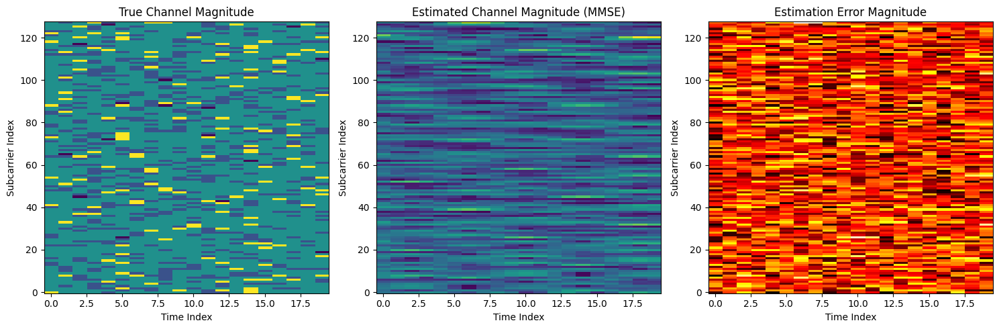

In [147]:
def exp_corr_matrix(size, rho):
    """Generate exponential correlation matrix."""
    return rho ** np.abs(np.subtract.outer(np.arange(size), np.arange(size)))

def mmse_2d_estimation_lowrank(Y, X, pilot_mask, sigma_h2=1.0, sigma_w2=0.01, rho_f=0.9, rho_t=0.9, rank_approx=32):
    """
    Optimized 2D MMSE channel estimation using SVD-based low-rank approximation.
    
    Parameters:
    - Y: Received signal matrix (N_f, N_t)
    - X: Transmitted pilot matrix (N_f, N_t)
    - pilot_mask: Boolean matrix indicating pilot positions (N_f, N_t)
    - sigma_h2: Channel power variance
    - sigma_w2: Noise power variance
    - rho_f: Frequency correlation coefficient
    - rho_t: Time correlation coefficient
    - rank_approx: SVD rank truncation

    Returns:
    - h_hat: Estimated full channel matrix (N_f, N_t)
    """
    N_f, N_t = Y.shape
    y = Y[pilot_mask]
    x = X[pilot_mask]
    h_ls = y / x
    pilot_indices = np.flatnonzero(pilot_mask)

    # Compute correlation matrices and SVD approximations
    R_f = exp_corr_matrix(N_f, rho_f)
    R_t = exp_corr_matrix(N_t, rho_t)
    R_f_u, R_f_s, _ = np.linalg.svd(R_f)
    R_t_u, R_t_s, _ = np.linalg.svd(R_t)

    R_f_approx = R_f_u[:, :rank_approx] @ np.diag(R_f_s[:rank_approx]) @ R_f_u[:, :rank_approx].T
    R_t_approx = R_t_u[:, :rank_approx] @ np.diag(R_t_s[:rank_approx]) @ R_t_u[:, :rank_approx].T

    R_hh = np.kron(R_t_approx, R_f_approx) * sigma_h2
    R_hy = R_hh[:, pilot_indices]
    R_yy = R_hh[np.ix_(pilot_indices, pilot_indices)] + sigma_w2 * np.eye(len(pilot_indices))

    h_hat = R_hy @ np.linalg.solve(R_yy, h_ls)
    return h_hat.reshape(N_f, N_t)

def generate_data_with_pilots(N_f=128, N_t=20, pilot_spacing_f=8, pilot_spacing_t=4):
    """Generate synthetic OFDM data with known pilot positions."""
    H_true = np.exp(1j * 2 * np.pi * np.random.rand(N_f, N_t))
    pilot_mask = np.zeros((N_f, N_t), dtype=bool)
    pilot_mask[::pilot_spacing_f, ::pilot_spacing_t] = True
    X = np.zeros((N_f, N_t), dtype=complex)
    X[pilot_mask] = np.random.choice([1, -1], size=np.sum(pilot_mask))  # BPSK pilots
    noise = 0.1 * (np.random.randn(N_f, N_t) + 1j * np.random.randn(N_f, N_t))
    Y = H_true * X + noise
    return H_true, Y, X, pilot_mask

def visualize_results(H_true, H_est, pilot_mask):
    """Visualize true, estimated channels and error."""
    error = np.abs(H_true - H_est)
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    axs[0].imshow(np.abs(H_true), aspect='auto', origin='lower')
    axs[0].set_title("True Channel Magnitude")

    axs[1].imshow(np.abs(H_est), aspect='auto', origin='lower')
    axs[1].set_title("Estimated Channel Magnitude (MMSE)")

    axs[2].imshow(error, aspect='auto', origin='lower', cmap='hot')
    axs[2].set_title("Estimation Error Magnitude")

    for ax in axs:
        ax.set_xlabel("Time Index")
        ax.set_ylabel("Subcarrier Index")
    plt.tight_layout()
    plt.show()

# Execute full pipeline
H_true, Y, X, pilot_mask = generate_data_with_pilots()
H_est = mmse_2d_estimation_lowrank(Y, X, pilot_mask)
visualize_results(H_true, H_est, pilot_mask)


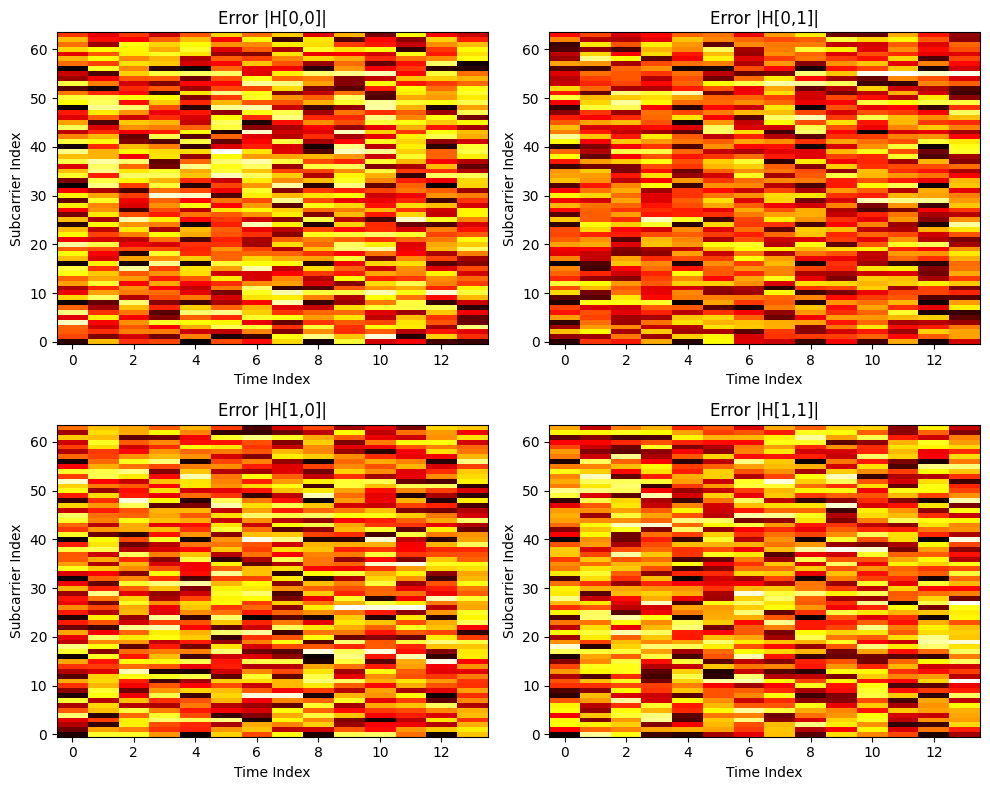

In [148]:
import numpy as np
import matplotlib.pyplot as plt

def exp_corr_matrix(size, rho):
    """Generate exponential correlation matrix."""
    return rho ** np.abs(np.subtract.outer(np.arange(size), np.arange(size)))

def mmse_2d_mimo_estimation(Y, X, pilot_mask, num_rx=2, num_tx=2, sigma_h2=1.0, sigma_w2=0.01, rho_f=0.9, rho_t=0.9, rank_approx=32):
    N_f, N_t = Y.shape[2], Y.shape[3]
    H_est = np.zeros((num_rx, num_tx, N_f, N_t), dtype=complex)

    # Precompute correlation matrices
    R_f = exp_corr_matrix(N_f, rho_f)
    R_t = exp_corr_matrix(N_t, rho_t)
    R_f_u, R_f_s, _ = np.linalg.svd(R_f)
    R_t_u, R_t_s, _ = np.linalg.svd(R_t)
    R_f_approx = R_f_u[:, :rank_approx] @ np.diag(R_f_s[:rank_approx]) @ R_f_u[:, :rank_approx].T
    R_t_approx = R_t_u[:, :rank_approx] @ np.diag(R_t_s[:rank_approx]) @ R_t_u[:, :rank_approx].T
    R_hh = np.kron(R_t_approx, R_f_approx) * sigma_h2

    for rx in range(num_rx):
        for tx in range(num_tx):
            y = Y[rx, tx][pilot_mask]
            x = X[rx, tx][pilot_mask]
            h_ls = y / x
            pilot_indices = np.flatnonzero(pilot_mask)
            R_hy = R_hh[:, pilot_indices]
            R_yy = R_hh[np.ix_(pilot_indices, pilot_indices)] + sigma_w2 * np.eye(len(pilot_indices))
            h_hat = R_hy @ np.linalg.solve(R_yy, h_ls)
            H_est[rx, tx] = h_hat.reshape(N_f, N_t)

    return H_est

def generate_mimo_data_with_pilots(N_f=64, N_t=14, num_rx=2, num_tx=2, pilot_spacing_f=8, pilot_spacing_t=4):
    pilot_mask = np.zeros((N_f, N_t), dtype=bool)
    pilot_mask[::pilot_spacing_f, ::pilot_spacing_t] = True

    X = np.zeros((num_rx, num_tx, N_f, N_t), dtype=complex)
    H_true = np.exp(1j * 2 * np.pi * np.random.rand(num_rx, num_tx, N_f, N_t))
    noise = 0.1 * (np.random.randn(num_rx, num_tx, N_f, N_t) + 1j * np.random.randn(num_rx, num_tx, N_f, N_t))

    for rx in range(num_rx):
        for tx in range(num_tx):
            X[rx, tx][pilot_mask] = np.random.choice([1, -1], size=np.sum(pilot_mask))

    Y = H_true * X + noise
    return H_true, Y, X, pilot_mask

def visualize_all_mimo_channels(H_true, H_est):
    num_rx, num_tx, _, _ = H_true.shape
    fig, axs = plt.subplots(num_rx, num_tx, figsize=(5 * num_tx, 4 * num_rx))

    for rx in range(num_rx):
        for tx in range(num_tx):
            ax = axs[rx, tx] if num_rx > 1 else axs[tx]
            error = np.abs(H_true[rx, tx] - H_est[rx, tx])
            ax.imshow(error, aspect='auto', origin='lower', cmap='hot')
            ax.set_title(f"Error |H[{rx},{tx}]|")
            ax.set_xlabel("Time Index")
            ax.set_ylabel("Subcarrier Index")

    plt.tight_layout()
    plt.show()

# Full MIMO-OFDM channel estimation pipeline
H_true, Y, X, pilot_mask = generate_mimo_data_with_pilots()
H_est = mmse_2d_mimo_estimation(Y, X, pilot_mask)
visualize_all_mimo_channels(H_true, H_est)


In [157]:
def simulate_ber(H_true, H_est, X, pilot_mask, noise_std=0.1):
    num_rx, num_tx, N_f, N_t = H_true.shape
    data_mask = pilot_mask.copy()

    # Transmit random BPSK on pilot positions
    bits = np.random.randint(0, 2, size=(num_tx, N_f, N_t))
    symbols = 2 * bits - 1  # BPSK mapping

    Y_rx = np.zeros((num_rx, N_f, N_t), dtype=complex)
    for rx in range(num_rx):
        for tx in range(num_tx):
            Y_rx[rx] += H_true[rx, tx] * symbols[tx]

    # Add AWGN noise
    noise = noise_std * (np.random.randn(*Y_rx.shape) + 1j * np.random.randn(*Y_rx.shape))
    Y_rx_noisy = Y_rx + noise

    # Equalization and hard decision detection
    bits_rx = np.zeros((num_rx, N_f, N_t), dtype=int)
    for rx in range(num_rx):
        eq_symbol = np.zeros((N_f, N_t), dtype=complex)
        for tx in range(num_tx):
            H_conj = np.conj(H_est[rx, tx])
            H_mag2 = np.abs(H_est[rx, tx])**2 + 1e-10
            eq_symbol += H_conj * Y_rx_noisy[rx] / H_mag2
        bits_rx[rx] = (np.real(eq_symbol) > 0).astype(int)

    tx_bits = bits[0][data_mask]
    rx_bits = bits_rx[0][data_mask]
    ber = np.mean(tx_bits != rx_bits)
    return ber


def run_ber_comparison(snr_db_range, num_trials=10):
    ber_mmse = []
    ber_ls = []

    for snr_db in snr_db_range:
        noise_std = 10 ** (-snr_db / 20)
        mmse_total, ls_total = 0.0, 0.0

        for _ in range(num_trials):
            H_true, Y, X, pilot_mask = generate_mimo_data_with_pilots()
            H_est = mmse_2d_mimo_estimation(Y, X, pilot_mask)
            mmse_total += simulate_ber(H_true, H_est, X, pilot_mask, noise_std=noise_std)
            ls_total += simulate_ber(H_true, Y, X, pilot_mask, noise_std=noise_std)

        ber_mmse.append(mmse_total / num_trials)
        ber_ls.append(ls_total / num_trials)

    return np.array(ber_mmse), np.array(ber_ls)



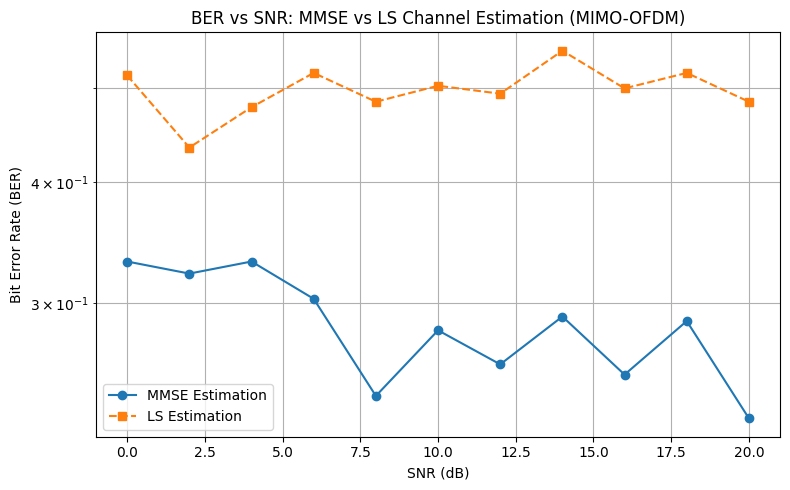

In [158]:
# Use user-provided parameters and run the simulation again
N_f = 64
N_t = 14
num_rx = 2
num_tx = 2
pilot_spacing_f = 8
pilot_spacing_t = 4
snr_db_range = np.arange(0, 21, 2)
num_trials = 10

# Run full simulation and plot
ber_mmse, ber_ls = run_ber_comparison(snr_db_range, num_trials=num_trials)

plt.figure(figsize=(8, 5))
plt.semilogy(snr_db_range, ber_mmse, 'o-', label='MMSE Estimation')
plt.semilogy(snr_db_range, ber_ls, 's--', label='LS Estimation')
plt.grid(True, which='both')
plt.xlabel('SNR (dB)')
plt.ylabel('Bit Error Rate (BER)')
plt.title('BER vs SNR: MMSE vs LS Channel Estimation (MIMO-OFDM)')
plt.legend()
plt.tight_layout()
plt.show()


---

# Pilot Insertion & Extraction


In wireless communication systems, **pilots** (or training symbols) are known reference signals inserted into the transmitted signal. They serve two primary purposes:

* **Channel Estimation:** To estimate the channel impulse or frequency response at the receiver.
* **Synchronization:** To support frame/packet detection and frequency/time synchronization.

In **MIMO-OFDM** systems, pilot design becomes more complex due to the need to distinguish between multiple transmit antennas and handle time-frequency varying channels.

## Time-Frequency Grid Mapping

OFDM systems divide the time-frequency resource into a grid of subcarriers (frequency) and OFDM symbols (time). Each grid cell can carry:

* Data symbols
* Pilot symbols
* Nulls (guard bands or DC subcarriers)

### Grid Definition

Let:

* $N_f$: Number of subcarriers (frequency bins)
* $N_t$: Number of OFDM symbols in a frame
* $x[n, k]$: Transmitted symbol at time index $n \in \{0, \dots, N_t-1\}$, subcarrier index $k \in \{0, \dots, N_f-1\}$

The resource grid is denoted as:

$$
\mathbf{X} \in \mathbb{C}^{N_t \times N_f}
$$

### Pilot Mask

Define a **pilot mask** $\mathbf{P} \in \{0, 1\}^{N_t \times N_f}$, where:

* $P[n, k] = 1$ indicates a pilot at time $n$, subcarrier $k$
* $P[n, k] = 0$ indicates a data symbol or unused

The pilot insertion is done as:

$$
X[n, k] = 
\begin{cases}
x_p[n, k], & \text{if } P[n, k] = 1 \\
x_d[n, k], & \text{otherwise}
\end{cases}
$$

Where $x_p[n, k]$ is a known pilot symbol (e.g., BPSK), and $x_d[n, k]$ is a data symbol.

---

## Adaptive Pilot Placement for MIMO

In **MIMO-OFDM**, the pilot design must:

* Enable separate channel estimation for each transmit-receive antenna pair
* Adapt to the **channel time-frequency selectivity**

Let:

* $N_t^{\text{tx}}$: Number of transmit antennas
* $N_t^{\text{rx}}$: Number of receive antennas

### 3.1 Orthogonal Pilots Across Antennas

To separate pilots from each transmit antenna, define orthogonal pilot patterns:

$$
\mathbf{P}^{(i)} \quad \text{for } i = 1, \dots, N_t^{\text{tx}}
$$

Such that:

$$
\mathbf{P}^{(i)} \cdot \mathbf{P}^{(j)} = 0 \quad \text{for } i \ne j
$$

This prevents pilot contamination between antennas.

### Pilot Density Adaptation

Pilot density can be adapted based on:

* **Doppler Spread** $f_D$: faster fading → more pilots in time
* **Delay Spread** $\tau_{\max}$: frequency-selectivity → more pilots in frequency

Define coherence parameters:

* **Coherence Time**: $T_c \approx \frac{1}{f_D}$
* **Coherence Bandwidth**: $B_c \approx \frac{1}{\tau_{\max}}$

Pilot spacing:

* Time spacing: $\Delta_t \le T_c / T_s$
* Frequency spacing: $\Delta_f \le B_c / \Delta f$

Where:

* $T_s$: OFDM symbol duration
* $\Delta f$: Subcarrier spacing

Thus, pilot grid intervals should satisfy:

$$
\Delta_t \cdot T_s \le T_c, \quad \Delta_f \cdot \Delta f \le B_c
$$


## Pilot Extraction and Channel Estimation

At the receiver, extract the pilot locations using the same mask $\mathbf{P}$, and perform **channel estimation**.

### 4.1 LS Estimation at Pilot Positions

Received pilot symbol:

$$
Y[n, k] = H[n, k] \cdot X[n, k] + W[n, k]
$$

At pilot locations, since $X[n, k]$ is known:

$$
\hat{H}_{\text{LS}}[n, k] = \frac{Y[n, k]}{X[n, k]}, \quad \text{for } P[n, k] = 1
$$

### Interpolation

To estimate $H[n, k]$ at data locations:

* Use 2D interpolation (linear, spline, Wiener filtering, etc.)
* Estimate the full channel:

$$
\hat{H}[n, k] = \text{Interp}(\hat{H}_{\text{LS}}[n_p, k_p])
$$

Where $(n_p, k_p)$ are the pilot locations.


---

* Pilots are inserted into a time-frequency grid using a binary mask.
* In MIMO, pilots must be orthogonal across antennas to separate channels.
* Pilot spacing is designed based on coherence time and bandwidth.
* LS estimation followed by interpolation recovers the full channel matrix.
* Adaptive pilot design improves spectral efficiency and estimation accuracy in dynamic environments.



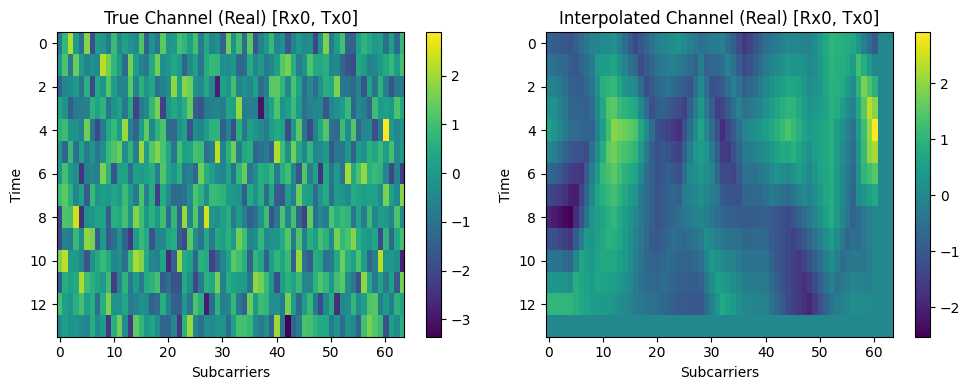

In [161]:
from scipy.interpolate import griddata
# Parameters
N_f = 64           # Number of subcarriers
N_t = 14           # Number of OFDM symbols
n_tx = 2           # Number of TX antennas
n_rx = 2           # Number of RX antennas
pilot_spacing_f = 4
pilot_spacing_t = 4
snr_dB = 20

def create_adaptive_pilot_masks(n_tx, N_t, N_f, delta_t, delta_f):
    masks = []
    for i in range(n_tx):
        mask = np.zeros((N_t, N_f), dtype=bool)
        offset_t = i % delta_t
        offset_f = (i * 2) % delta_f
        mask[offset_t::delta_t, offset_f::delta_f] = True
        masks.append(mask)
    return np.array(masks)

pilot_masks = create_adaptive_pilot_masks(n_tx, N_t, N_f, pilot_spacing_t, pilot_spacing_f)

# Generate pilot symbols (e.g., BPSK: {-1, +1})
def generate_pilot_symbols(pilot_mask):
    symbols = 2 * np.random.randint(0, 2, pilot_mask.shape) - 1
    return symbols * pilot_mask

pilot_symbols = np.array([generate_pilot_symbols(pilot_masks[i]) for i in range(n_tx)])

# Full transmit grid for each TX antenna
tx_grid = np.zeros((n_tx, N_t, N_f), dtype=complex)
for i in range(n_tx):
    tx_grid[i][pilot_masks[i]] = pilot_symbols[i][pilot_masks[i]]

# True channel: random complex channel (time and frequency selective)
H_true = np.random.randn(n_rx, n_tx, N_t, N_f) + 1j * np.random.randn(n_rx, n_tx, N_t, N_f)

# Transmit through channel and add noise
Y = np.zeros((n_rx, N_t, N_f), dtype=complex)
for rx in range(n_rx):
    for tx in range(n_tx):
        Y[rx] += H_true[rx, tx] * tx_grid[tx]

# Add noise
noise_power = np.mean(np.abs(Y)**2) / (10**(snr_dB / 10))
noise = np.sqrt(noise_power / 2) * (np.random.randn(*Y.shape) + 1j * np.random.randn(*Y.shape))
Y_noisy = Y + noise

# LS Channel Estimation at pilot locations
H_ls = np.zeros((n_rx, n_tx, N_t, N_f), dtype=complex)
for rx in range(n_rx):
    for tx in range(n_tx):
        mask = pilot_masks[tx]
        pilots = tx_grid[tx][mask]
        received = Y_noisy[rx][mask]
        H_ls[rx, tx][mask] = received / pilots

# Interpolation to estimate full channel
def interpolate_channel(H_ls_partial, pilot_mask):
    time_idx, freq_idx = np.where(pilot_mask)
    known_points = np.stack((time_idx, freq_idx), axis=-1)
    known_values = H_ls_partial[pilot_mask]

    all_points = np.indices(H_ls_partial.shape).reshape(2, -1).T
    H_interp = griddata(known_points, known_values, all_points, method='linear', fill_value=0)
    return H_interp.reshape(H_ls_partial.shape)

H_interp = np.zeros_like(H_ls)
for rx in range(n_rx):
    for tx in range(n_tx):
        H_interp[rx, tx] = interpolate_channel(H_ls[rx, tx], pilot_masks[tx])

# Plot real part of true vs interpolated channel for one link
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(np.real(H_true[0, 0]), aspect='auto')
plt.title('True Channel (Real) [Rx0, Tx0]')
plt.xlabel('Subcarriers'); plt.ylabel('Time')
plt.colorbar()

plt.subplot(1, 2, 2)
plt.imshow(np.real(H_interp[0, 0]), aspect='auto')
plt.title('Interpolated Channel (Real) [Rx0, Tx0]')
plt.xlabel('Subcarriers'); plt.ylabel('Time')
plt.colorbar()

plt.tight_layout()
plt.show()


### Adaptive pilot spacing based on coherence parameters

In [ ]:

# === Channel properties ===
f_D = 100  # Doppler spread in Hz (e.g., 100 Hz)
tau_max = 5e-6  # Delay spread in seconds (e.g., 5 µs)
delta_f = 15e3  # Subcarrier spacing (e.g., 15 kHz)
T_s = 1 / delta_f  # OFDM symbol duration (s)

# === Calculate coherence regions ===
T_c = 1 / (2 * f_D)  # Coherence time
B_c = 1 / (2 * tau_max)  # Coherence bandwidth

# === Convert to pilot spacing indices ===
delta_t_max = int(np.floor(T_c / T_s))
delta_f_max = int(np.floor(B_c / delta_f))

# Minimum pilot spacing of 1
delta_t = max(1, delta_t_max)
delta_f = max(1, delta_f_max)

print(f"Adaptive Pilot Spacing: Time = {delta_t}, Frequency = {delta_f}")


# High Doppler (fast-fading): → more frequent pilots in time

# High delay spread (frequency-selective): → more frequent pilots in frequency




Adaptive Pilot Spacing: Time = 75, Frequency = 6


## **MIMO Precoding & Detection Extensions**


### Dirty Paper Coding (DPC) 

**Dirty Paper Coding (DPC)** is an advanced **precoding technique** that allows a transmitter to **pre-cancel known interference** without reducing capacity.

Originally introduced by Costa in 1983, DPC shows that **if the transmitter has non-causal knowledge of the interference**, the **channel capacity is the same as if the interference were absent**.

DPC is particularly useful in:

* **Multi-user MIMO (MU-MIMO) downlink** (a.k.a. Broadcast Channel)
* **Interference-limited systems** where the transmitter knows the interference
* **5G NR** and future networks using **non-orthogonal transmission**


## Intuition Behind DPC

Imagine writing on a piece of paper that already has some unwanted markings ("dirt"). If the writer knows exactly where the dirt is, they can write their message in a way that avoids or cancels the dirt.

Mathematically, this means:

* The **transmitter** knows the interference $\mathbf{s}$
* The **receiver** does not know $\mathbf{s}$
* Despite this, the **capacity remains unchanged**


#### Dirty Paper Channel

Let:

* $y = x + s + n$: Received signal
* $x$: Transmit signal
* $s$: Known interference (non-causally known at the transmitter)
* $n \sim \mathcal{N}(0, N)$: Gaussian noise
* $s \sim \mathcal{N}(0, Q)$: Interference with known statistics
* $x \sim \mathcal{N}(0, P)$: Transmit power constraint

### Without DPC

If the transmitter **does not know $s$**, then the capacity is:

$$
C_{\text{no-DPC}} = \frac{1}{2} \log_2\left(1 + \frac{P}{Q + N}\right)
$$

### With DPC

If the transmitter **knows $s$** non-causally (but the receiver doesn’t), then the capacity becomes:

$$
C_{\text{DPC}} = \frac{1}{2} \log_2\left(1 + \frac{P}{N}\right)
$$

> **Key Result (Costa's Theorem):**
> The capacity is the same **as if the interference $s$ did not exist at all**.

### Application to MU-MIMO Downlink

Consider a **broadcast channel (BC)** where the base station serves $K$ users, each with one antenna.

Let:

* $\mathbf{H} = [\mathbf{h}_1^T, \dots, \mathbf{h}_K^T]^T \in \mathbb{C}^{K \times M}$: Channel matrix
* $\mathbf{x} \in \mathbb{C}^{M \times 1}$: Transmit vector
* $y_k = \mathbf{h}_k \mathbf{x} + n_k$: Received signal at user $k$

Assume:

* Transmitter knows all $\mathbf{h}_k$
* Receiver $k$ only sees its own $y_k$

Without DPC, interference between users degrades performance.
With DPC, the transmitter **pre-cancels known inter-user interference**.

### DPC via Successive Encoding

Transmit signal:

$$
\mathbf{x} = \sum_{k=1}^{K} \mathbf{p}_k u_k
$$

Where:

* $u_k$: Encoded message for user $k$
* $\mathbf{p}_k$: Precoding vector for user $k$

### Encoding Order:

* Encode users in a specific order $k = 1 \to K$
* For each user, treat signals for later users as **known interference**

Using Costa precoding, each user $k$ sees:

$$
y_k = \mathbf{h}_k \mathbf{p}_k u_k + \underbrace{\sum_{j < k} \mathbf{h}_k \mathbf{p}_j u_j}_{\text{interference}} + n_k
$$

But since earlier users are encoded with knowledge of this interference, it can be **pre-subtracted** at the transmitter.

## Achievable Rate Region (MU-MIMO Broadcast)

DPC enables the **capacity region** of the MIMO broadcast channel to be achieved.

For user $k$, assuming Gaussian inputs and dirty-paper coding:

$$
R_k = \log_2 \left( \frac{ \left| \mathbf{I} + \sum_{j \leq k} \mathbf{H}_j \mathbf{Q}_j \mathbf{H}_j^H \right| }{ \left| \mathbf{I} + \sum_{j < k} \mathbf{H}_j \mathbf{Q}_j \mathbf{H}_j^H \right| } \right)
$$

Where:

* $\mathbf{Q}_j = \mathbb{E}[ \mathbf{x}_j \mathbf{x}_j^H ]$
* Power constraint: $\sum_{j=1}^K \text{Tr}(\mathbf{Q}_j) \leq P$

This expression reflects the **successive cancellation** at the transmitter side using DPC.


## Practical Implementation

While DPC is theoretically optimal, it is **hard to implement exactly**. Practical approximations include:

* **Tomlinson–Harashima Precoding (THP):** A nonlinear precoder for scalar channels, extends to MIMO
* **Lattice-based DPC**
* **Successive dirty-paper coding via QR decomposition**


### References

* Costa, M. (1983). "Writing on Dirty Paper." *IEEE Transactions on Information Theory*
* Cover and Thomas. *Elements of Information Theory*
* Tse and Viswanath. *Fundamentals of Wireless Communication*



---
### Implementation: 

- A MIMO broadcast channel (e.g., 4x4)

- THP at the transmitter to cancel inter-user interference

- Zero-Forcing (ZF) at the receiver

- Performance comparison with linear ZF precoding

#### Tomlinson–Harashima Precoding (THP)



### Successive Interference Cancellation (SIC)

SIC is a nonlinear detection technique commonly used in multi-user or MIMO systems to improve symbol detection by decoding and subtracting stronger signals before detecting weaker ones. In the context of MIMO systems, SIC is particularly useful in schemes like **V-BLAST (Vertical Bell Labs Layered Space-Time)** detection, where it decodes symbols layer by layer, canceling interference from already-decoded layers.


### **MIMO System Model**

Consider a standard narrowband MIMO system with $M_t$ transmit antennas and $M_r \ge M_t$ receive antennas. The received signal is:

$$
\mathbf{y} = \mathbf{H} \mathbf{x} + \mathbf{n}
$$

where:

* $\mathbf{y} \in \mathbb{C}^{M_r \times 1}$: received signal vector
* $\mathbf{H} \in \mathbb{C}^{M_r \times M_t}$: channel matrix
* $\mathbf{x} \in \mathbb{C}^{M_t \times 1}$: transmitted symbol vector
* $\mathbf{n} \sim \mathcal{CN}(0, \sigma^2 \mathbf{I})$: AWGN noise vector

The goal is to recover $\mathbf{x}$ from $\mathbf{y}$, given $\mathbf{H}$.


### **Linear Detection Background**

Before SIC, a linear detector like **Zero-Forcing (ZF)** or **Minimum Mean Square Error (MMSE)** may be used to estimate $\mathbf{x}$:

### ZF Estimation:

$$
\hat{\mathbf{x}} = (\mathbf{H}^H \mathbf{H})^{-1} \mathbf{H}^H \mathbf{y}
$$

ZF suffers in ill-conditioned $\mathbf{H}$ because it amplifies noise.

### SIC Process**

SIC decodes symbols one-by-one in a sequential manner. At each step, it:

1. Detects the "best" symbol (e.g., highest SINR)
2. Estimates and demodulates that symbol
3. Cancels its contribution from the received signal
4. Repeats with the updated residual signal and a reduced system


Let’s assume $M_t = M_r = M$, and we want to decode the components of $\mathbf{x} = [x_1, x_2, \dots, x_M]^T$

1. **Initial step:**

   $$
   \mathbf{y}^{(1)} = \mathbf{y}, \quad \mathbf{H}^{(1)} = \mathbf{H}
   $$

2. **For $i = 1$ to $M$:**

   a. **Linear estimate:**

   $$
   \hat{x}_{k_i} = \mathbf{w}_i^H \mathbf{y}^{(i)}
   $$

   where $\mathbf{w}_i$ is the ZF or MMSE filter for stream $k_i$, chosen by some ordering criterion (e.g., largest post-detection SNR).

   b. **Hard decision (e.g., QPSK):**

   $$
   \tilde{x}_{k_i} = \text{decide}( \hat{x}_{k_i} )
   $$

   c. **Interference cancellation:**

   $$
   \mathbf{y}^{(i+1)} = \mathbf{y}^{(i)} - \mathbf{h}_{k_i} \tilde{x}_{k_i}
   $$

   d. **Update channel matrix:**
   Remove the selected column $\mathbf{h}_{k_i}$ from $\mathbf{H}^{(i)}$

   e. **Repeat with updated $\mathbf{y}^{(i+1)}$ and reduced $\mathbf{H}^{(i+1)}$**


### MMSE Filter for stream $j$:

$$
\mathbf{w}_j = \left( \mathbf{H}^{(i)} \mathbf{H}^{(i)H} + \sigma^2 \mathbf{I} \right)^{-1} \mathbf{h}_j
$$

This filter minimizes the mean square error between $x_j$ and the linear estimate.


## **Ordering Strategy**

To improve detection performance, we often use **greedy ordering**:
At each stage, choose the stream with the **maximum post-processing SNR**.

If $\mathbf{W} = (\mathbf{H}^H \mathbf{H})^{-1}$, then the post-detection SNR for ZF is:

$$
\text{SNR}_i = \frac{1}{[\mathbf{W}]_{ii}} \cdot \frac{1}{\sigma^2}
$$

Choose the stream $k_i$ with the highest SNR.

## **Advantages and Limitations**

### Advantages:

* Much better BER than plain ZF or MMSE
* Computationally less expensive than full ML detection
* Can approach ML performance with ordering and good SNR

### Limitations:

* Sensitive to detection ordering
* Error propagation: if an early symbol is wrongly detected, errors spread
* Requires channel matrix updates and inverses at each stage

### **Comparison with ML Detection**

* **ML detection** solves:

  $$
  \hat{\mathbf{x}} = \arg \min_{\mathbf{x} \in \mathcal{S}^M} \|\mathbf{y} - \mathbf{H} \mathbf{x}\|^2
  $$

  which is optimal but exponential in complexity.

* **SIC** trades performance for complexity:

  $$
  \text{ML} > \text{SIC} > \text{ZF/MMSE}
  $$



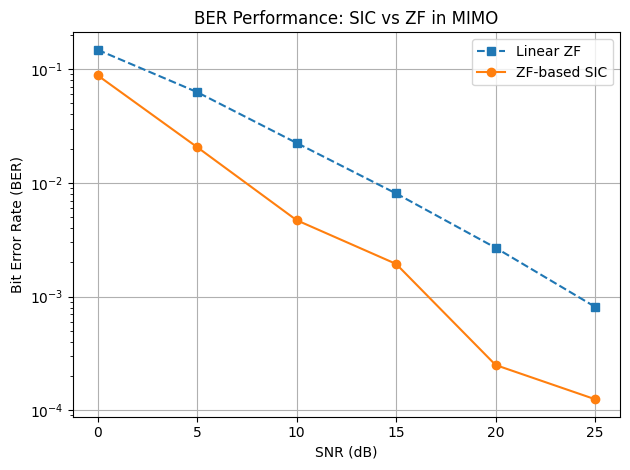

In [179]:

np.random.seed(0)

M = 4  # Number of Tx and Rx antennas (square MIMO)
SNR_dB = np.arange(0, 30, 5)
mod_order = 4  # QPSK

def qpsk_mod(bits):
    return (2 * (bits >> 1) - 1) + 1j * (2 * (bits & 1) - 1)

def qpsk_demod(symbols):
    bits_i = (symbols.real > 0).astype(int)
    bits_q = (symbols.imag > 0).astype(int)
    return (bits_i << 1) + bits_q

def qpsk_bits(bits):
    return np.vstack(((bits >> 1) & 1, bits & 1)).T.flatten()

def zf_detector(H, y):
    H_inv = np.linalg.pinv(H)
    x_hat = H_inv @ y
    return qpsk_demod(x_hat)

def sic_detector(H_orig, y_orig):
    M = H_orig.shape[1]
    H = H_orig.copy()
    y = y_orig.copy()
    indices = list(range(M))
    detected_syms = np.zeros(M, dtype=int)

    for i in range(M):
        G = np.linalg.pinv(H)
        norms = np.sum(np.abs(G)**2, axis=1)
        best_idx = np.argmin(norms)

        # Get detection vector and column
        w = G[best_idx]
        h = H[:, best_idx]
        idx_original = indices[best_idx]

        # Detect symbol
        x_hat = w @ y
        sym = qpsk_demod(np.array([x_hat]))[0]
        detected_syms[idx_original] = sym

        # Interference cancellation
        y = y - h * qpsk_mod(np.array([sym]))[0]
        H = np.delete(H, best_idx, axis=1)
        indices.pop(best_idx)

    return detected_syms

# Run Simulation
ber_zf = []
ber_sic = []

for snr_db in SNR_dB:
    errors_zf = 0
    errors_sic = 0
    N = 10000
    noise_var = 10 ** (-snr_db / 10)

    for _ in range(N):
        H = (np.random.randn(M, M) + 1j * np.random.randn(M, M)) / np.sqrt(2)
        bits = np.random.randint(0, mod_order, M)
        symbols = qpsk_mod(bits)
        noise = np.sqrt(noise_var / 2) * (np.random.randn(M) + 1j * np.random.randn(M))
        y = H @ symbols + noise

        # ZF Detection
        detected_zf = zf_detector(H, y)
        errors_zf += np.sum(qpsk_bits(detected_zf) != qpsk_bits(bits))

        # SIC Detection
        detected_sic = sic_detector(H, y)
        errors_sic += np.sum(qpsk_bits(detected_sic) != qpsk_bits(bits))

    ber_zf.append(errors_zf / (M * N * 2))
    ber_sic.append(errors_sic / (M * N * 2))

# Plot results
plt.semilogy(SNR_dB, ber_zf, 's--', label='Linear ZF')
plt.semilogy(SNR_dB, ber_sic, 'o-', label='ZF-based SIC')
plt.xlabel('SNR (dB)')
plt.ylabel('Bit Error Rate (BER)')
plt.title('BER Performance: SIC vs ZF in MIMO')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


## **Adaptive Modulation and Coding (AMC)**

AMC technique is used in modern wireless communication systems (e.g., LTE, 5G) to dynamically adjust the **modulation order** and **coding rate** based on the **channel conditions**. The goal is to maximize data throughput while maintaining a target **bit error rate (BER)** or **block error rate (BLER)**.

Wireless channels vary due to **fading**, **interference**, **mobility**, etc. Fixed modulation and coding schemes (MCS) are inefficient because:

* High-order modulation (e.g., 64-QAM) offers high data rates but performs poorly in noisy conditions.
* Low-order modulation (e.g., QPSK) is robust but offers lower spectral efficiency.

**AMC adapts the MCS to current channel quality**, optimizing:

* **Robustness** when SNR is low.
* **Throughput** when SNR is high.


### **Building Blocks**

AMC has two components:

#### a. **Modulation**

Defines how bits are mapped to symbols:

| Scheme  | Bits/Symbol | Description |
| ------- | ----------- | ----------- |
| BPSK    | 1           | Most robust |
| QPSK    | 2           | Moderate    |
| 16-QAM  | 4           | Higher rate |
| 64-QAM  | 6           | Higher rate |
| 256-QAM | 8           | Used in 5G  |

#### b. **Channel Coding**

Adds redundancy to protect against errors:

* Common codes: **Turbo**, **LDPC**, **Polar** (5G)
* Coding Rate: $R = \frac{k}{n}$, where $k$ = info bits, $n$ = total bits

Lower coding rate → more redundancy → more robust


### **How AMC Works (Step-by-Step)**

1. **Channel Quality Estimation**
   Receiver estimates **SNR**, **CQI (Channel Quality Indicator)**, or **SINR** based on pilot symbols or reference signals.

2. **Feedback to Transmitter**
   Receiver sends **CQI** feedback to the base station (uplink in LTE/5G).

3. **MCS Selection**
   Transmitter uses this feedback to select the **Modulation and Coding Scheme (MCS)** from a predefined table (e.g., 3GPP MCS tables).

4. **Transmission with Selected MCS**
   The chosen modulation and coding are used to transmit the data.

5. **Repetition**
   Process is repeated frequently (e.g., every 1 ms in LTE), adapting in real time.


---

If $\gamma$ is the received SNR, the **maximum spectral efficiency** (Shannon limit) is:

$$
C(\gamma) = \log_2(1 + \gamma) \text{ bits/sec/Hz}
$$

AMC tries to **approach this limit** using a discrete set of MCS levels. A typical MCS will be selected if:

$$
\gamma_{i} \leq \gamma < \gamma_{i+1} \Rightarrow \text{Use MCS}_i
$$

Where $\gamma_i$ is the SNR threshold for the $i^{th}$ MCS.


### **Trade-offs**

* **Spectral efficiency vs robustness**
* **Feedback overhead** vs responsiveness
* **Latency** if reconfiguration is too slow
* **Outdated feedback** can degrade performance


### **Practical Example (LTE MCS Table Entry)**

| MCS Index | Modulation | Code Rate | Spectral Efficiency |
| --------- | ---------- | --------- | ------------------- |
| 0         | QPSK       | 0.076     | 0.15                |
| 9         | QPSK       | 0.93      | 1.48                |
| 16        | 16-QAM     | 0.73      | 2.40                |
| 28        | 64-QAM     | 0.93      | 5.55                |


### **AMC in Standards**

* **LTE**: Uplink and downlink both use AMC, with CQI, RI, PMI feedback.
* **5G NR**: Supports up to 256-QAM with fine-grained MCS tables and flexible HARQ.

### **Simulation Tip**

In simulations, you can implement AMC as a lookup table that maps estimated SNR to an MCS index.




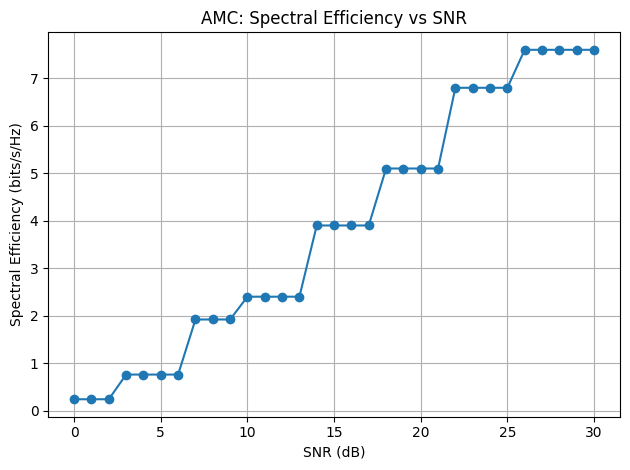

In [180]:

# Define SNR range (in dB)
snr_db = np.arange(0, 31, 1)
snr_linear = 10 ** (snr_db / 10)

# Define an MCS table: (SNR threshold, Modulation Order, Code Rate)
# Simplified version based on LTE/5G-like systems
mcs_table = [
    (0,    2, 0.12),  # QPSK
    (3,    2, 0.38),  # QPSK
    (7,    4, 0.48),  # 16-QAM
    (10,   4, 0.60),  # 16-QAM
    (14,   6, 0.65),  # 64-QAM
    (18,   6, 0.85),  # 64-QAM
    (22,   8, 0.85),  # 256-QAM
    (26,   8, 0.95),  # 256-QAM
]

# Function to select MCS for each SNR value
def select_mcs(snr_db, mcs_table):
    modulation_order = []
    code_rate = []
    spectral_efficiency = []

    for snr in snr_db:
        for i in range(len(mcs_table) - 1, -1, -1):
            if snr >= mcs_table[i][0]:
                m, r = mcs_table[i][1], mcs_table[i][2]
                modulation_order.append(m)
                code_rate.append(r)
                spectral_efficiency.append(m * r)  # bits/s/Hz
                break
    return modulation_order, code_rate, spectral_efficiency

mod_order, code_rate, spectral_eff = select_mcs(snr_db, mcs_table)

# Plotting spectral efficiency vs SNR
plt.figure()
plt.plot(snr_db, spectral_eff, marker='o')
plt.grid(True)
plt.title("AMC: Spectral Efficiency vs SNR")
plt.xlabel("SNR (dB)")
plt.ylabel("Spectral Efficiency (bits/s/Hz)")
plt.tight_layout()
plt.show()


---

## **Introduction to Turbo Codes**

Turbo codes, introduced by Claude Berrou in 1993, were the first practical channel codes to approach the **Shannon capacity limit**. Their breakthrough came from combining two ideas:

* **Parallel concatenation of two convolutional encoders**
* **Iterative decoding with soft information exchange**

They are called “**turbo**” due to the **feedback-like decoding loop**, reminiscent of a turbo engine’s feedback mechanism.


## **Basic Structure**

Turbo coding consists of:

### a. **Two Recursive Systematic Convolutional (RSC) Encoders**

* Connected in parallel
* Both encode the same input, but the second encoder sees an **interleaved** version of the input.

### b. **Interleaver**

* A deterministic or pseudorandom permutation of the input bits
* Introduces randomness to break low-weight input patterns (improves minimum distance)

### c. **Code Rate**

* The basic configuration transmits:

  * The **original input bits** (systematic)
  * One **parity bit** from each encoder
* Code rate:

  $$
  R = \frac{\text{Number of input bits}}{\text{Number of transmitted bits}} = \frac{k}{k + 2k} = \frac{1}{3}
  $$

  (Puncturing can increase it to 1/2, 2/3, etc.)


## **Encoding Process (Step-by-Step)**

1. Input data: $\mathbf{u} = [u_0, u_1, \dots, u_{k-1}]$
2. Encoder 1 takes $\mathbf{u}$ and produces parity bits $\mathbf{p}_1$
3. Interleaver scrambles $\mathbf{u} \rightarrow \mathbf{u}'$
4. Encoder 2 takes $\mathbf{u}'$ and produces parity bits $\mathbf{p}_2$
5. Transmitted bits:

   $$
   \mathbf{x} = \left[ u_0, p_{1,0}, p_{2,0}, u_1, p_{1,1}, p_{2,1}, \dots \right]
   $$


## **Recursive Systematic Convolutional (RSC) Encoder**

Each encoder is usually a **rate-1/2 RSC code**, implemented via:

* Shift registers
* Feedback and feedforward polynomials

For example, a **constraint length 3** encoder might use:

* Generator polynomials: $G_1 = 1 + D + D^2$, $G_2 = 1 + D^2$

These generate both:

* **Systematic bit**: Original input bit
* **Parity bit**: Based on current and previous input bits


## **Turbo Decoder (Iterative Decoding)**

Turbo decoding is performed iteratively using **two Soft-Input Soft-Output (SISO)** decoders:

### Step-by-Step:

1. Each decoder uses the **Log-MAP algorithm** or **Max-Log-MAP** to decode its stream, taking into account **a priori probabilities**.
2. Decoder 1 processes the systematic bits and its parity bits → produces **extrinsic LLRs**.
3. Interleaver permutes these extrinsic values → fed into Decoder 2.
4. Decoder 2 processes interleaved systematic bits and parity → updates extrinsic LLRs.
5. These are **deinterleaved** and passed back to Decoder 1.

Each iteration improves reliability of LLRs. After $N$ iterations, a **hard decision** is made:

$$
\hat{u}_i = \begin{cases}
1 & \text{if } L(u_i) > 0 \\
0 & \text{otherwise}
\end{cases}
$$


## **Mathematical Details of Decoding**

The **Log-MAP algorithm** computes the **log-likelihood ratio (LLR)** for each bit:

$$
L(u_i) = \log \frac{P(u_i = 1 | y)}{P(u_i = 0 | y)}
$$

The LLR is decomposed as:

$$
L(u_i) = L_c(y_i) + L_{a}(u_i) + L_e(u_i)
$$

Where:

* $L_c(y_i)$: channel LLR from received symbols
* $L_a(u_i)$: a priori info from other decoder
* $L_e(u_i)$: extrinsic info passed to other decoder


## **Performance and Properties**

| Property             | Turbo Code                           |
| -------------------- | ------------------------------------ |
| Capacity-Approaching | Yes                                  |
| Good at              | Moderate blocklength (1k–10k)        |
| Drawback             | Error floor at high SNR              |
| Complexity           | Medium-high due to iterations        |
| Used in              | 3G, 4G LTE data channels, deep space |


## **Turbo Code vs. Block Code**

Turbo codes achieve high performance by:

* **Interleaving**, which increases effective free distance
* **Iterative decoding**, improving reliability per iteration
* **Soft information exchange**, unlike traditional block codes


## **Diagram Summary**

```
Input:  u0 u1 u2 u3 ...

  ┌──────────────┐
  │   Encoder 1  │─────→ parity 1
  └──────────────┘
        │
        │ systematic bits → TX
        ▼
  ┌──────────────┐
  │  Interleaver │──→ permuted input
  └──────────────┘
        ▼
  ┌──────────────┐
  │   Encoder 2  │─────→ parity 2
  └──────────────┘
```

At receiver:

* Decoder 1 ⇄ Decoder 2 (via interleaver/deinterleaver)
* Iteratively exchange **LLRs**




--- 

### Custom Turbo Code Implementation 


### 1. **Recursive Systematic Convolutional (RSC) Encoder**

* Constraint length $K = 3$
* Generator polynomials: $G_1 = (1, 1, 1)$, $G_2 = (1, 0, 1)$

    * $G_1$ is the systematic path
    * $G_2$ is the feedback parity path

### 2. **Turbo Encoder**

* Two identical RSC encoders
* One processes original bits
* The other processes interleaved bits

### 3. **Turbo Decoder (Iterative)**

* A basic version of **Soft-In Soft-Out (SISO)** decoding using **Log-MAP** (or approximation)
* Exchange **extrinsic information** between the two decoders
* Use **a priori + channel + extrinsic** LLRs




In [ ]:
# ===========================
# 1. Recursive Systematic Convolutional Encoder (RSC)
# ===========================
class RSCEncoder:
    def __init__(self, g_sys, g_parity):
        """
        g_sys, g_parity: generator polynomials as lists of bits, e.g., [1, 1, 1]
        """
        self.g_sys = np.array(g_sys)
        self.g_parity = np.array(g_parity)
        self.K = len(g_sys)

    def encode(self, bits):
        """
        Encodes a bit array using a rate-1/2 RSC encoder.
        Returns: (systematic_bits, parity_bits)
        """
        state = np.zeros(self.K - 1, dtype=int)
        sys_bits = []
        parity_bits = []

        for bit in bits:
            sys_bits.append(bit)

            # Compute feedback = input XOR feedback terms
            feedback = bit
            for i in range(1, self.K):
                feedback ^= self.g_sys[i] & state[i - 1]

            # Compute parity = feedback XOR parity terms
            parity = feedback * self.g_parity[0]
            for i in range(1, self.K):
                parity ^= self.g_parity[i] & state[i - 1]
            parity_bits.append(parity)

            # Update shift register
            state = np.roll(state, shift=1)
            state[0] = feedback

        return np.array(sys_bits), np.array(parity_bits)


if __name__ == "__main__":
    np.random.seed(0)
    test_bits = np.random.randint(0, 2, 10)
    encoder = RSCEncoder(g_sys=[1, 1, 1], g_parity=[1, 0, 1])
    sys, parity = encoder.encode(test_bits)

    print("Input:        ", test_bits)
    print("Systematic:   ", sys)
    print("Parity:       ", parity)




Input:         [0 1 1 0 1 1 1 1 1 1]
Systematic:    [0 1 1 0 1 1 1 1 1 1]
Parity:        [0 1 0 0 0 1 1 0 1 1]


In [194]:
# ===========================
# 2. Interleaver / Deinterleaver
# ===========================
class Interleaver:
    def __init__(self, pattern):
        """
        pattern: a permutation of indices for interleaving (e.g., np.random.permutation(N))
        """
        self.pattern = np.array(pattern)
        self.inverse_pattern = np.argsort(self.pattern)

    def interleave(self, bits):
        return bits[self.pattern]

    def deinterleave(self, bits):
        return bits[self.inverse_pattern]


if __name__ == "__main__":
    bits = np.array([0, 1, 1, 0, 1, 0])
    pattern = np.random.permutation(len(bits))
    interleaver = Interleaver(pattern)

    interleaved = interleaver.interleave(bits)
    recovered = interleaver.deinterleave(interleaved)

    print("Original Bits:   ", bits)
    print("Interleaved:     ", interleaved)
    print("Deinterleaved:   ", recovered)


Original Bits:    [0 1 1 0 1 0]
Interleaved:      [1 0 1 0 1 0]
Deinterleaved:    [0 1 1 0 1 0]


In [195]:
# ===========================
# 3. Turbo Encoder
# ===========================

class TurboEncoder:
    def __init__(self, g_sys, g_parity, interleaver):
        """
        g_sys, g_parity: generator polynomials
        interleaver: instance of Interleaver
        """
        self.encoder1 = RSCEncoder(g_sys, g_parity)
        self.encoder2 = RSCEncoder(g_sys, g_parity)
        self.interleaver = interleaver

    def encode(self, info_bits):
        """
        Returns:
            sys_bits: Systematic bits (from encoder 1)
            parity1: Parity bits from encoder 1
            parity2: Parity bits from encoder 2 (interleaved input)
            interleaved_bits: Interleaved version of info_bits
        """
        sys_bits, parity1 = self.encoder1.encode(info_bits)
        interleaved_bits = self.interleaver.interleave(info_bits)
        _, parity2 = self.encoder2.encode(interleaved_bits)
        return sys_bits, parity1, parity2, interleaved_bits


if __name__ == "__main__":
    np.random.seed(0)
    info_bits = np.random.randint(0, 2, 10)
    interleaver_pattern = np.random.permutation(len(info_bits))
    interleaver = Interleaver(interleaver_pattern)

    encoder = TurboEncoder(g_sys=[1, 1, 1], g_parity=[1, 0, 1], interleaver=interleaver)
    sys, p1, p2, interleaved = encoder.encode(info_bits)

    print("Info Bits:       ", info_bits)
    print("Systematic Bits: ", sys)
    print("Parity 1:        ", p1)
    print("Parity 2:        ", p2)
    print("Interleaved Bits:", interleaved)


Info Bits:        [0 1 1 0 1 1 1 1 1 1]
Systematic Bits:  [0 1 1 0 1 1 1 1 1 1]
Parity 1:         [0 1 0 0 0 1 1 0 1 1]
Parity 2:         [0 1 0 1 1 1 0 0 0 0]
Interleaved Bits: [0 1 1 1 1 0 1 1 1 1]


In [206]:
# ===========================
# 4. Log-MAP approximation for SISO Decoder (max-log-MAP)
# ===========================
class SISODecoder:
    def __init__(self, g_sys, g_parity, noise_var):
        self.noise_var = noise_var
        self.states = 4  # for constraint length 3
        self.trellis = self._build_trellis(g_sys, g_parity)

    def _build_trellis(self, g_sys, g_parity):
        # Build manually for constraint length = 3
        trellis = {}
        for s in range(4):
            for u in [0, 1]:
                current_state = list(map(int, np.binary_repr(s, width=2)))
                input_bit = u

                # Feedback (RSC)
                fb = input_bit ^ (g_sys[1] & current_state[0]) ^ (g_sys[2] & current_state[1])
                parity = fb ^ (g_parity[1] & current_state[0]) ^ (g_parity[2] & current_state[1])

                next_state = (fb << 1) | current_state[0]
                next_state &= 0b11  # 2-bit state
                trellis[(s, u)] = (next_state, parity)
        return trellis

    def decode(self, y_sys, y_parity, apriori):
        N = len(y_sys)
        alpha = np.full((N + 1, 4), -np.inf)
        beta = np.full((N + 1, 4), -np.inf)
        alpha[0, 0] = 0
        beta[N, :] = 0  # all states equally likely at the end

        # Forward alpha
        for k in range(N):
            for s_prev in range(4):
                for u in [0, 1]:
                    s_next, parity = self.trellis[(s_prev, u)]
                    metric = -0.5 / self.noise_var * (
                        (2*u - 1 - y_sys[k])**2 + (2*parity - 1 - y_parity[k])**2
                    ) + apriori[k]*u
                    alpha[k+1, s_next] = max(alpha[k+1, s_next], alpha[k, s_prev] + metric)

        # Backward beta
        for k in reversed(range(N)):
            for s_next in range(4):
                for s_prev in range(4):
                    for u in [0, 1]:
                        if self.trellis.get((s_prev, u), (None,))[0] == s_next:
                            parity = self.trellis[(s_prev, u)][1]
                            metric = -0.5 / self.noise_var * (
                                (2*u - 1 - y_sys[k])**2 + (2*parity - 1 - y_parity[k])**2
                            ) + apriori[k]*u
                            beta[k, s_prev] = max(beta[k, s_prev], beta[k+1, s_next] + metric)

        # LLR output
        extrinsic = np.zeros(N)
        for k in range(N):
            num = -np.inf
            den = -np.inf
            for s_prev in range(4):
                for u in [0, 1]:
                    s_next, parity = self.trellis[(s_prev, u)]
                    metric = alpha[k, s_prev] + beta[k+1, s_next] + \
                             (-0.5 / self.noise_var * ((2*u - 1 - y_sys[k])**2 + (2*parity - 1 - y_parity[k])**2)) + \
                             apriori[k] * u
                    if u == 1:
                        num = max(num, metric)
                    else:
                        den = max(den, metric)
            extrinsic[k] = num - den

        return extrinsic





In [207]:
# ===========================
# 5. Full Turbo Decoder (Iterative)
# ===========================

class TurboDecoder:
    def __init__(self, g_sys, g_parity, interleaver, noise_var, n_iter=5):
        """
        g_sys, g_parity: generator polynomials
        interleaver: Interleaver instance
        noise_var: noise variance of the AWGN channel
        n_iter: number of decoding iterations
        """
        self.interleaver = interleaver
        self.siso1 = SISODecoder(g_sys, g_parity, noise_var)
        self.siso2 = SISODecoder(g_sys, g_parity, noise_var)
        self.n_iter = n_iter

    def decode(self, rx_sys, rx_p1, rx_p2):
        """
        rx_sys: received noisy systematic (LLR)
        rx_p1: received noisy parity1 (LLR)
        rx_p2: received noisy parity2 (LLR)
        Returns:
            decoded_bits: final hard decision after n_iter iterations
            final_llr: final LLRs from decoder 1
        """
        N = len(rx_sys)
        apriori1 = np.zeros(N)

        for _ in range(self.n_iter):
            # Decoder 1
            llr1 = self.siso1.decode(rx_sys, rx_p1, apriori1)
            extrinsic1 = llr1 - apriori1
            apriori2 = self.interleaver.interleave(extrinsic1)

            # Decoder 2
            inter_rx_sys = self.interleaver.interleave(rx_sys)
            llr2 = self.siso2.decode(inter_rx_sys, rx_p2, apriori2)
            extrinsic2 = llr2 - apriori2
            apriori1 = self.interleaver.deinterleave(extrinsic2)

        final_llr = llr1
        decoded_bits = (final_llr >= 0).astype(int)
        return decoded_bits, final_llr




In [208]:
# ===========================
# Step 6: AWGN simulation with BER measurement and plotting.
# ===========================

class TurboSimulation:
    def __init__(self, g_sys, g_parity, block_len, n_iter=5):
        self.g_sys = g_sys
        self.g_parity = g_parity
        self.block_len = block_len
        self.n_iter = n_iter

    def bpsk_mod(self, bits):
        return 1 - 2 * bits  # 0 → +1, 1 → -1

    def run(self, snr_db, num_blocks=20):
        snr_linear = 10 ** (snr_db / 10)
        noise_var = 1 / (2 * snr_linear)
        sigma = np.sqrt(noise_var)

        total_errors = 0
        total_bits = 0

        for _ in range(num_blocks):
            info_bits = np.random.randint(0, 2, self.block_len)
            interleaver_pattern = np.random.permutation(self.block_len)
            interleaver = Interleaver(interleaver_pattern)

            encoder = TurboEncoder(self.g_sys, self.g_parity, interleaver)
            sys_bits, p1_bits, p2_bits, _ = encoder.encode(info_bits)

            tx_sys = self.bpsk_mod(sys_bits)
            tx_p1 = self.bpsk_mod(p1_bits)
            tx_p2 = self.bpsk_mod(p2_bits)

            rx_sys = tx_sys + sigma * np.random.randn(self.block_len)
            rx_p1  = tx_p1 + sigma * np.random.randn(self.block_len)
            rx_p2  = tx_p2 + sigma * np.random.randn(self.block_len)

            rx_sys_llr = 2 * rx_sys / noise_var
            rx_p1_llr  = 2 * rx_p1  / noise_var
            rx_p2_llr  = 2 * rx_p2  / noise_var

            decoder = TurboDecoder(self.g_sys, self.g_parity, interleaver, noise_var, self.n_iter)
            decoded_bits, _ = decoder.decode(rx_sys_llr, rx_p1_llr, rx_p2_llr)

            total_errors += np.sum(decoded_bits != info_bits)
            total_bits += self.block_len

        ber = total_errors / total_bits
        return ber




In [ ]:
if __name__ == "__main__":
    import matplotlib.pyplot as plt

    sim = TurboSimulation(g_sys=[1,1,1], g_parity=[1,0,1], block_len=5000, n_iter=6)
    snr_range = np.arange(0, 3.5, 0.5)
    ber_values = [sim.run(snr_db,num_blocks = 30) for snr_db in snr_range]

    plt.figure()
    plt.semilogy(snr_range, ber_values, marker='o')
    plt.grid(True, which='both')
    plt.title("Turbo Code BER vs. SNR (Max-Log-MAP, 6 Iterations)")
    plt.xlabel("SNR (dB)")
    plt.ylabel("Bit Error Rate (BER)")
    plt.tight_layout()
    plt.show()


--- 

## **Polar codes** 

Invented by Erdal Arıkan in 2009, are the **first class of error-correcting codes** that are **mathematically proven to achieve the capacity** of binary-input symmetric memoryless channels (B-DMC), such as the Binary Erasure Channel (BEC) and AWGN.

### Core Idea: Channel Polarization

The fundamental idea behind polar codes is called **channel polarization**. Given a communication channel $W$, we construct $N = 2^n$ **synthesized channels** $W_1, W_2, ..., W_N$, such that:

* Some channels become **almost noiseless** ($\text{capacity} \to 1$)
* Others become **completely noisy** ($\text{capacity} \to 0$)

We then:

* Transmit data bits over the **good (reliable)** channels
* Fix the inputs of **bad (unreliable)** channels to known values (called **frozen bits**)

### Polar Encoding

#### a. **Input Vector**

Let:

* $\mathbf{u} = [u_0, u_1, \dots, u_{N-1}]$: message + frozen bits
* $N = 2^n$: block length

#### b. **Polar Transform**

Encoding is done via:

$$
\mathbf{x} = \mathbf{u} \cdot G_N
$$

Where:

* $G_N = B_N \cdot F^{\otimes n}$
* $F = \begin{bmatrix}1 & 0 \\ 1 & 1\end{bmatrix}$
* $F^{\otimes n}$ is the **n-th Kronecker power**
* $B_N$: bit-reversal permutation matrix

The polar transform mixes bits so that some synthesized channels become more reliable than others.


### Frozen vs Information Bits

Once channels are polarized:

* Select **K** most reliable channels → assign **data bits**
* Remaining $N - K$ → assign **frozen bits** (usually zero)

These positions are **precomputed** based on channel type (e.g., AWGN) and SNR using **Bhattacharyya parameters** or **density evolution**.

### Decoding: Successive Cancellation (SC)

SC decoding proceeds **bit by bit**:

$$
\hat{u}_i = \begin{cases}
0 & \text{if } i \text{ is frozen} \\
\arg\max_{u_i} P(u_i | y, \hat{u}_0^{i-1}) & \text{otherwise}
\end{cases}
$$

* Uses **LLR recursion**
* Early decisions affect later ones
* Very fast (complexity $O(N \log N)$)

### Successive Cancellation List (SCL) Decoding

SC decoding suffers from:

* Poor performance at short blocklengths
* High error rate due to early decision errors

**SCL decoding** improves performance by:

* Keeping a **list of the best decoding paths**
* Selecting the final codeword using a **CRC check** (used in 5G NR)

SCL-CRC is the **standard decoding method** in real systems.


### Example: $N = 8$ Polar Code

* Block length $N = 8$
* K = 4 data bits, 4 frozen bits
* Frozen positions: {0, 1, 2, 4}
* Information positions: {3, 5, 6, 7}

place:

* 0s in frozen positions
* message bits in data positions

compute:

$$
\mathbf{x} = \mathbf{u} \cdot G_8
$$

### Polar Code Properties

| Feature      | Description                                      |
| ------------ | ------------------------------------------------ |
| Complexity   | $O(N \log N)$ encoding & decoding                |
| Capacity     | Achieves capacity for B-DMCs                     |
| Performance  | Excellent with SCL-CRC (especially at large $N$) |
| Block Length | Must be power of 2                               |
| Error Floor  | Avoided using SCL decoding                       |

---

### Use in 5G NR

* Polar codes are used for **control channels** in **5G NR**:

  * **PBCH**, **PDCCH**, **PUCCH**, **DCI**
* Data channels use **LDPC codes**

Why Polar for control?

* Low latency
* Short block length efficiency
* Efficient hardware implementation


## Polar vs Turbo vs LDPC

| Feature            | Polar               | Turbo           | LDPC               |
| ------------------ | ------------------- | --------------- | ------------------ |
| Invented           | 2009                | 1993            | 1960s / modernized |
| Decoding           | SC, SCL             | Iterative (MAP) | Iterative (BP)     |
| Capacity-achieving | Yes (B-DMC)         | Near capacity   | Yes (long block)   |
| Used in 5G NR      | Control             | No              | Data (PDSCH)       |
| Performance        | Excellent (SCL-CRC) | Moderate        | Excellent (long)   |



In [210]:
from numpy.polynomial.polynomial import Polynomial

# ===============================
# 1. Polar Transform Matrix
# ===============================
def polar_transform_matrix(N):
    """Generate the Polar transform matrix G_N = B_N * F^{⊗n}"""
    def kronecker_power(F, n):
        result = F
        for _ in range(1, n):
            result = np.kron(result, F)
        return result

    def bit_reversal(n):
        N = 2 ** n
        result = np.arange(N)
        for i in range(N):
            b = '{:0{width}b}'.format(i, width=n)
            result[i] = int(b[::-1], 2)
        return result

    n = int(np.log2(N))
    F = np.array([[1, 0], [1, 1]], dtype=int)
    G = kronecker_power(F, n) % 2
    bit_rev_order = bit_reversal(n)
    G = G[bit_rev_order]
    return G

# ===============================
# 2. Polar Encoder
# ===============================
def polar_encode(u, G_N):
    """Polar encoding: x = u * G_N (mod 2)"""
    return np.mod(u @ G_N, 2)

# ===============================
# 3. Successive Cancellation Decoder (SC)
# ===============================
def sc_decode(llr, frozen_bits):
    N = len(llr)
    u_hat = np.zeros(N, dtype=int)

    def recursive_decode(llr, depth=0):
        n = len(llr)
        if n == 1:
            i = len(u_hat) - len(llr)
            if frozen_bits[i] == 1:
                return np.array([0])
            else:
                return np.array([0 if llr[0] >= 0 else 1])
        else:
            llr_left = np.sign(llr[:n//2]) * np.minimum(np.abs(llr[:n//2]), np.abs(llr[n//2:]))
            llr_right = llr[n//2:] + ((1 - 2 * recursive_decode(llr_left, depth + 1)) * llr[:n//2])
            left_bits = recursive_decode(llr_left, depth + 1)
            right_bits = recursive_decode(llr_right, depth + 1)
            return np.concatenate([(left_bits ^ right_bits), right_bits])

    return recursive_decode(llr)

# ===============================
# 4. Test Case
# ===============================
# Parameters
N = 8  # block length (must be power of 2)
K = 4  # number of data bits
np.random.seed(0)

# Reliability order (for simplicity, manually selected for N=8 and AWGN)
# In practice use Arikan's Bhattacharyya or 5G standards
reliable_indices = [3, 5, 6, 7]  # information bits
frozen_indices = [0, 1, 2, 4]    # frozen bits

# Information bits
info_bits = np.random.randint(0, 2, K)

# Prepare u vector (with frozen bits = 0)
u = np.zeros(N, dtype=int)
u[reliable_indices] = info_bits

# Encoding
G_N = polar_transform_matrix(N)
x = polar_encode(u, G_N)

# BPSK modulation and AWGN
def bpsk(x): return 1 - 2 * x
def add_awgn(x, snr_db):
    snr = 10 ** (snr_db / 10)
    noise_std = np.sqrt(1 / (2 * snr))
    return x + noise_std * np.random.randn(len(x))

snr_db = 3
x_mod = bpsk(x)
y = add_awgn(x_mod, snr_db)
llr = 2 * y * (10 ** (snr_db / 10))  # LLR for BPSK over AWGN

# Frozen bit mask: 1 = frozen, 0 = info
frozen_mask = np.ones(N, dtype=int)
frozen_mask[reliable_indices] = 0

# Decoding
u_hat = sc_decode(llr, frozen_mask)
decoded_info_bits = u_hat[reliable_indices]

# Compute BER
ber = np.sum(decoded_info_bits != info_bits) / K
info_bits, decoded_info_bits, ber


# ===============================
# BER vs SNR for Polar Code with SC Decoding
# ===============================

def simulate_polar_sc(snr_db, N=128, K=64, num_trials=100):
    # Manually select reliability order (simplified)
    reliable_indices = sorted(np.random.choice(np.arange(N), K, replace=False))
    frozen_mask = np.ones(N, dtype=int)
    frozen_mask[reliable_indices] = 0

    G_N = polar_transform_matrix(N)
    total_errors = 0
    total_bits = 0

    for _ in range(num_trials):
        # Generate info bits and prepare u
        info_bits = np.random.randint(0, 2, K)
        u = np.zeros(N, dtype=int)
        u[reliable_indices] = info_bits

        # Encode
        x = polar_encode(u, G_N)
        x_mod = bpsk(x)
        y = add_awgn(x_mod, snr_db)
        llr = 2 * y * (10 ** (snr_db / 10))

        # Decode
        u_hat = sc_decode(llr, frozen_mask)
        decoded_info = u_hat[reliable_indices]

        total_errors += np.sum(decoded_info != info_bits)
        total_bits += K

    return total_errors / total_bits


# ===============================
# Successive Cancellation List (SCL) Decoder with CRC
# ===============================

def crc_check(bits, crc_poly, crc_len):
    """Check if CRC remainder is zero."""
    m = np.append(bits, np.zeros(crc_len, dtype=int))
    poly = Polynomial(m[::-1])
    divisor = Polynomial(crc_poly[::-1])
    remainder = poly % divisor
    return np.all(np.round(remainder.coef[::-1][:crc_len]) == 0)

def generate_crc(bits, crc_poly, crc_len):
    """Append CRC to bits."""
    m = np.append(bits, np.zeros(crc_len, dtype=int))
    poly = Polynomial(m[::-1])
    divisor = Polynomial(crc_poly[::-1])
    remainder = poly % divisor
    crc = np.round(remainder.coef[::-1][:crc_len]).astype(int)
    return np.append(bits, crc)

def scl_decode(llr, frozen_mask, L=8, crc_poly=None, crc_len=0):
    """
    SCL decoder with optional CRC.
    """
    N = len(llr)
    paths = [(np.zeros(N, dtype=int), 0.0)]  # (path, path_metric)

    for i in range(N):
        new_paths = []
        for path, metric in paths:
            if frozen_mask[i]:
                new_path = path.copy()
                new_path[i] = 0
                new_metric = metric + np.log1p(np.exp(-abs(llr[i])))
                new_paths.append((new_path, new_metric))
            else:
                for bit in [0, 1]:
                    new_path = path.copy()
                    new_path[i] = bit
                    if bit == 0:
                        new_metric = metric + np.log1p(np.exp(-abs(llr[i])))
                    else:
                        new_metric = metric + np.log1p(np.exp(abs(llr[i])))
                    new_paths.append((new_path, new_metric))
        paths = sorted(new_paths, key=lambda x: x[1])[:L]

    # CRC check
    if crc_poly is not None:
        for path, _ in paths:
            info_bits = path[frozen_mask == 0]
            if crc_check(info_bits, crc_poly, crc_len):
                return path
        return paths[0][0]  # fallback
    else:
        return paths[0][0]



# ===============================
# Simulation with CRC + SCL
# ==============================
def simulate_polar_scl_crc_fixed_errors(
    snr_db, N=128, K=64, crc_poly=[1,1,0,1], crc_len=3, L=8, target_errors=1000):
    effective_K = K - crc_len
    info_indices = sorted(np.random.choice(np.arange(N), K, replace=False))
    frozen_mask = np.ones(N, dtype=int)
    frozen_mask[info_indices] = 0

    G_N = polar_transform_matrix(N)
    total_errors = 0
    total_bits = 0

    while total_errors < target_errors:
        bits = np.random.randint(0, 2, effective_K)
        bits_with_crc = generate_crc(bits, crc_poly, crc_len)
        u = np.zeros(N, dtype=int)
        u[info_indices] = bits_with_crc

        x = polar_encode(u, G_N)
        x_mod = bpsk(x)
        y = add_awgn(x_mod, snr_db)
        llr = 2 * y * (10 ** (snr_db / 10))

        u_hat = scl_decode(llr, frozen_mask, L=L, crc_poly=crc_poly, crc_len=crc_len)
        decoded_info = u_hat[info_indices][:effective_K]

        total_errors += np.sum(decoded_info != bits)
        total_bits += effective_K

    return total_errors / total_bits




In [ ]:
ber_curve_scl_crc = [
    simulate_polar_scl_crc_fixed_errors(snr, N=128, K=64, crc_len=3, L=8, target_errors=1000)
    for snr in snr_range
]

plt.figure()
plt.semilogy(snr_range, ber_curve_scl_crc, marker='o', label='Polar SCL + CRC (L=8)')
plt.grid(True, which='both')
plt.title("Polar Code BER vs SNR with SCL + CRC (N=128, K=61 + CRC 3)")
plt.xlabel("SNR (dB)")
plt.ylabel("Bit Error Rate (BER)")
plt.legend()
plt.tight_layout()
plt.show()

---

There are several Python libraries that provide implementations of **Turbo**, **LDPC**, and **Polar** codes. Below are the most relevant ones, from research-grade to production-quality:

### **CommPy** (Communications with Python)

* **GitHub**: [https://github.com/veeresht/CommPy](https://github.com/veeresht/CommPy)
* **Status**: Actively used in academia (not full 5G spec compliant)
* **Implements**:

  * Turbo codes (basic RSC, iterative decoding)
  * Convolutional codes (Viterbi)
  * Basic LDPC (with `pyldpc` dependency)
  * ❌ Polar (not included)

---

### **PyLDPC**

* **GitHub**: [https://github.com/flennerhag/pyldpc](https://github.com/flennerhag/pyldpc)
* **Implements**:

  * LDPC: generation, encoding, belief propagation decoding
* **Supports**:

  * Regular/irregular LDPC
  * Custom parity-check matrices

> No Turbo or Polar support. Use for LDPC simulation only.

---

### **Sionna** (NVIDIA) – 5G & Deep Learning Ready

* **GitHub**: [https://github.com/NVIDIA/sionna](https://github.com/NVIDIA/sionna)
* **Platform**: TensorFlow 2.x
* **Implements**:

  * Polar codes (including CRC-aided SC and SCL decoding)
  * LDPC (3GPP 5G NR compliant)
  * Turbo (basic support)
  * 5G NR full PHY chain

> If you're doing **5G** simulations or using **ML + comms**, this is the **most comprehensive and accurate** toolkit available.

---

### **IT++ (via Python bindings)**

* **C++ library with Python wrappers**
* Implements all major FEC codes
* But setup is difficult, and usage is dated

> Not recommended unless you already use it in C++

---

### **OpenFEC**

* LDPC and Turbo codes (3GPP-like)
* High-performance C-based implementation, hard to use directly in Python

---

### PyTorch Implementations

Some GitHub repositories (e.g. TurboAE, PolarNet) offer differentiable implementations:

* **TurboAE**: Turbo autoencoder-based neural decoder
* **PolarNet**: Polar code SC/SCL decoding via deep learning

---




---
---

## **End-to-End Physical (PHY) Frame Structure** 

A well-designed frame supports synchronization, channel estimation, equalization, and efficient data transmission. Below is a detailed theoretical explanation of each component:



### Overview of a PHY Frame**

A **PHY frame** is a time-domain representation of a structured transmission burst that includes:

```
[ Preamble | Pilots | Data Symbols | Cyclic Prefix (CP) ]
```

Each part serves a unique role in reliable transmission and reception over a channel that may include noise, fading, and timing offsets.


### Components of the Frame**

#### 2.1 **Preamble**

* Time synchronization (frame start detection)
* Frequency offset estimation
* Initial channel estimation (coarse)

**Theory**:

* Often designed using **Zadoff-Chu**, **Golay**, or **PN sequences** with ideal autocorrelation properties.
* The receiver performs **correlation** with a known sequence to detect the frame's start.
* The preamble is fixed and known to both transmitter and receiver.

**Equation** (for correlation-based detection):

$$
\text{Corr}(y[n], p[n]) = \sum_{k=0}^{L-1} y[n+k] \cdot p^*[k]
$$

Where:

* $y[n]$: received signal
* $p[k]$: preamble sequence
* $L$: length of preamble


#### 2.2 **Pilots (Reference Signals)**

* Channel estimation (fine)
* Tracking time-varying channel (e.g., fading)

**Theory**:

* Pilots are inserted at known positions in time-frequency grid.
* Can be **block-type** (whole OFDM symbol) or **comb-type** (scattered among subcarriers).
* The receiver uses pilot symbols $X_p$ and received symbols $Y_p$ to estimate channel:

$$
\hat{H}_p = \frac{Y_p}{X_p}
$$

Then interpolate across time and frequency to estimate full channel.

#### 2.3 **Data Symbols**

* Carries modulated payload (QPSK, QAM, etc.)

**Theory**:

* Data bits → modulated → mapped to subcarriers
* OFDM is commonly used: each data symbol occupies one subcarrier

$$
x[n] = \sum_{k=0}^{N-1} X_k \cdot e^{j2\pi kn/N}
$$

Where:

* $X_k$: modulated symbol on subcarrier $k$
* $N$: FFT size


#### 2.4 **Cyclic Prefix (CP)**

* Prevents inter-symbol interference (ISI)
* Converts linear convolution into circular convolution for FFT-based equalization

**Theory**:

* CP is a copy of the last $L_{CP}$ samples of the OFDM symbol, appended to its start.

$$
x_{\text{CP}}[n] = x[n + N - L_{CP}], \quad n = -L_{CP}, \ldots, -1
$$

* Enables the receiver to perform frequency-domain equalization using FFT:

$$
Y_k = H_k \cdot X_k + N_k \Rightarrow \hat{X}_k = \frac{Y_k}{\hat{H}_k}
$$


### Full Frame Structure Example (OFDM)

Denote:

* $N$: number of subcarriers
* $T_s$: OFDM symbol duration (without CP)
* $T_{CP}$: CP duration

Each PHY frame may consist of multiple OFDM symbols arranged as:

```
Time -->
+----------+----------+----------+----------+----------+----------+
| Preamble | Pilot    | Data     | Pilot    | Data     |   ...    |
+----------+----------+----------+----------+----------+----------+
    ↑          ↑          ↑         ↑
  Sync     Channel   Payload   Channel ...
           Estimate            Estimate
```

Each OFDM symbol includes a CP:

```
|CP|---- FFT (N points) ----|
```


### Frame Design Considerations**

| Design Aspect       | Notes                                                                     |
| ------------------- | ------------------------------------------------------------------------- |
| **Pilot Density**   | Higher for fast-fading channels (e.g., vehicular), lower for static links |
| **CP Length**       | Should be ≥ maximum channel delay spread                                  |
| **Preamble Design** | Should be autocorrelation-friendly for robust sync                        |
| **FFT Size $N$**    | Power-of-two, chosen based on bandwidth & subcarrier spacing              |
| **Frame Duration**  | Trade-off between latency and spectral efficiency                         |


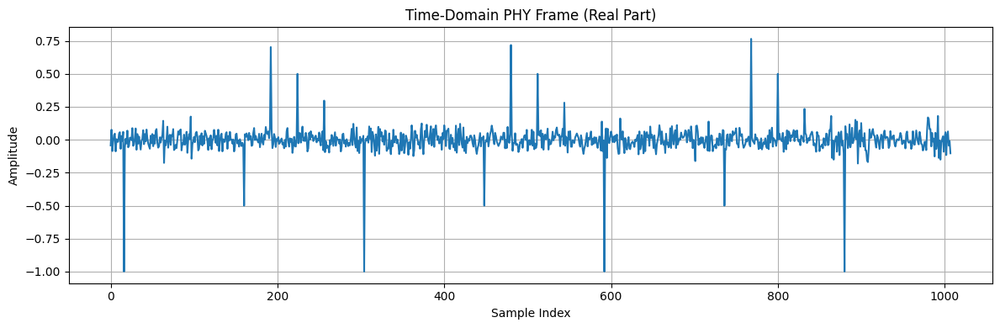

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
N_subcarriers = 64             # Number of OFDM subcarriers
CP_len = 16                    # Cyclic Prefix length
num_data_symbols = 6          # Number of OFDM symbols with data
pilot_interval = 2            # Every 2nd symbol is a pilot
mod_order = 4                 # QPSK
preamble_len = N_subcarriers  # One OFDM symbol length preamble

# Generate QPSK modulation
def qpsk_mod(bits):
    return (2 * (bits >> 1) - 1) + 1j * (2 * (bits & 1) - 1)

# Generate preamble (Zadoff-Chu-like or random known sequence)
np.random.seed(0)
preamble_bits = np.random.randint(0, 2, 2 * N_subcarriers)
preamble_sym = qpsk_mod(preamble_bits)

# IFFT to create time-domain preamble
preamble_ifft = np.fft.ifft(preamble_sym)
preamble_cp = np.concatenate([preamble_ifft[-CP_len:], preamble_ifft])

# Generate OFDM frame
frame = [preamble_cp]
num_symbols = num_data_symbols
for i in range(num_symbols):
    bits = np.random.randint(0, 2, 2 * N_subcarriers)
    symbols = qpsk_mod(bits)

    # For pilot, set known pattern
    if i % pilot_interval == 0:
        symbols[::4] = 1 + 1j  # Pilot every 4 subcarriers
        symbols[1::4] = -1 - 1j

    # IFFT and add CP
    time_domain = np.fft.ifft(symbols)
    ofdm_symbol = np.concatenate([time_domain[-CP_len:], time_domain])
    frame.append(ofdm_symbol)

# Concatenate all symbols to form the full frame
tx_frame = np.concatenate(frame)

# Plot the real part of the signal
plt.figure(figsize=(12, 4))
plt.plot(np.real(tx_frame))
plt.title("Time-Domain PHY Frame (Real Part)")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(True)
plt.tight_layout()
plt.show()

"""
Next steps: 
Channel modeling and reception,
BER simulation,
Channel estimation using the pilot structure
"""



---

## **1. Throughput vs BER**

* **BER (Bit Error Rate)**: Probability that a bit is received in error.
* **PER (Packet Error Rate)**: Probability that a packet (with $L$ bits) is received in error.
* **Throughput**: Rate of successfully received **payload** bits over time.

### **PER as a function of BER**

Assuming **independent bit errors**, for a packet of $L$ bits:

$$
\text{PER} = 1 - (1 - \text{BER})^L \approx 1 - e^{-L \cdot \text{BER}} \quad \text{(for small BER)}
$$

### **Throughput Formula**

Assuming:

* Payload size $L_p$ (bits)
* Packet duration $T_{\text{pkt}}$
* Packet Error Rate = PER

Then, **average throughput** $T$ is:

$$
T = \frac{L_p}{T_{\text{pkt}}} \cdot (1 - \text{PER})
$$

Or with retry attempts (e.g., under ARQ/HARQ):

$$
T = \frac{L_p}{\mathbb{E}[T_{\text{succ}}]}
$$

where $\mathbb{E}[T_{\text{succ}}]$ is the expected time until successful transmission.

## **2. Latency Modeling**

### **1. Pure ARQ (Automatic Repeat reQuest)**

Packets are retransmitted until correctly received. Let:

* $p = \text{PER}$
* RTT = round-trip time (feedback delay + retransmission time)
* $N_{\text{tx}} \sim \text{Geometric}(1-p)$: Number of transmissions until success

Then:

$$
\mathbb{E}[N_{\text{tx}}] = \sum_{k=1}^{\infty} k(1-p)p^{k-1} = \frac{1}{1 - p}
$$

Expected latency:

$$
\mathbb{E}[\text{Latency}] = \text{RTT} \cdot \mathbb{E}[N_{\text{tx}}] = \frac{\text{RTT}}{1 - p}
$$

### **2. HARQ (Hybrid ARQ)**

* Combines **FEC** (Forward Error Correction) and ARQ.
* HARQ Type-I: Entire packet is retransmitted.
* HARQ Type-II/III: **Soft combining** (e.g., Chase Combining or Incremental Redundancy).

#### a) HARQ with Chase Combining:

Each retransmission improves the SNR linearly:

$$
\gamma_{\text{eff}} = \sum_{i=1}^{n} \gamma_i \quad \text{(n transmissions)}
$$

Improved effective PER:

$$
\text{PER}_{\text{HARQ}}^{(n)} \approx Q\left(\sqrt{2 \cdot \gamma_{\text{eff}}} \right)
$$

Where $Q(\cdot)$ is the Q-function for bit error probability.

Expected latency is reduced because decoding becomes successful earlier with accumulated SNR.

---


| Metric                  | ARQ                                           | HARQ (Chase)                           |
| ----------------------- | --------------------------------------------- | -------------------------------------- |
| Success after $k$ tries | $p^{k-1}(1-p)$                                | Depends on combined SNR                |
| Latency                 | $\frac{\text{RTT}}{1 - \text{PER}}$           | Lower due to SNR combining             |
| Throughput              | $\frac{L_p}{T_{\text{pkt}}} (1 - \text{PER})$ | Higher, especially in high-BER regimes |

---

## Practical Simulation

* Simulate for a range of **SNR** → get BER.
* For each SNR:

  * Generate random errors for bits → packets → compute PER.
  * Use PER to model retransmissions (ARQ/HARQ).
  * Collect metrics:

    * Avg. successful throughput
    * Avg. delay per packet
    * Number of retransmissions





SNR(dB) | Avg PER | Throughput (bps) | Latency (s)
--------|---------|------------------|-------------
      0 | 0.579958 |        164100.00 | 0.004898
      2 | 0.317507 |        219160.00 | 0.003756
      4 | 0.278608 |        328266.67 | 0.002550
      6 | 0.109764 |        431333.33 | 0.001944
      8 | 0.144215 |        731800.00 | 0.001170
     10 | 0.003836 |        797000.00 | 0.001007


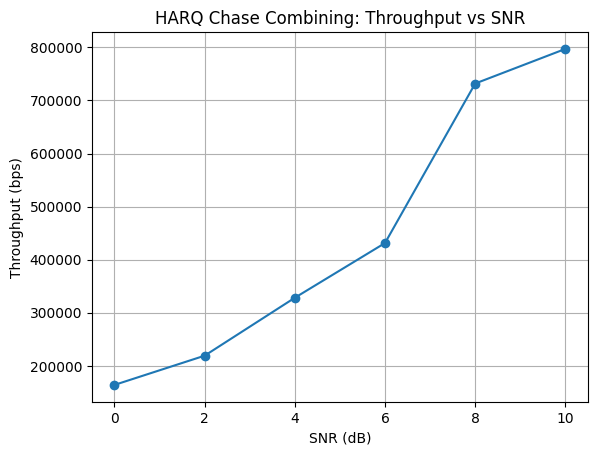

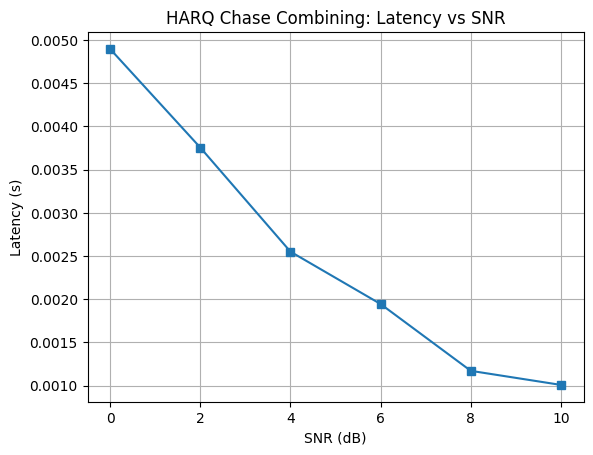

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import erfc
import pandas as pd

# Parameters
L_bits = 1000
payload_bits = 800
snr_dB_range = np.arange(0, 11, 2)
RTT = 1e-3
T_pkt = 1e-3
num_packets = 2000
max_retries = 5

def ber_awgn_bpsk(snr_linear):
    return 0.5 * erfc(np.sqrt(snr_linear))

def effective_snr_chase(snr_linear, n_retries):
    return snr_linear * n_retries

def per_from_ber(ber, L):
    return 1 - (1 - ber) ** L

def simulate_chase_harq(snr_dB):
    snr_linear = 10 ** (snr_dB / 10)
    total_latency = 0
    total_throughput = 0
    total_per = 0

    for _ in range(num_packets):
        success = False
        transmissions = 0

        while not success and transmissions < max_retries:
            transmissions += 1
            combined_snr = effective_snr_chase(snr_linear, transmissions)
            ber = ber_awgn_bpsk(combined_snr)
            per = per_from_ber(ber, L_bits)
            if np.random.rand() > per:
                success = True

        latency = transmissions * RTT
        throughput = payload_bits / (transmissions * T_pkt)
        total_latency += latency
        total_throughput += throughput
        total_per += per

    avg_latency = total_latency / num_packets
    avg_throughput = total_throughput / num_packets
    avg_per = total_per / num_packets
    return avg_throughput, avg_latency, avg_per

# Run Simulation
throughputs, latencies, pers = [], [], []

for snr in snr_dB_range:
    thr, lat, per = simulate_chase_harq(snr)
    throughputs.append(thr)
    latencies.append(lat)
    pers.append(per)

# Display as table
print("\nSNR(dB) | Avg PER | Throughput (bps) | Latency (s)")
print("--------|---------|------------------|-------------")
for snr, per, thr, lat in zip(snr_dB_range, pers, throughputs, latencies):
    print(f"{snr:7} | {per:.6f} | {thr:16.2f} | {lat:.6f}")

# Plotting
plt.figure()
plt.plot(snr_dB_range, throughputs, marker='o', label="Throughput")
plt.xlabel("SNR (dB)")
plt.ylabel("Throughput (bps)")
plt.title("HARQ Chase Combining: Throughput vs SNR")
plt.grid(True)

plt.figure()
plt.plot(snr_dB_range, latencies, marker='s', label="Latency")
plt.xlabel("SNR (dB)")
plt.ylabel("Latency (s)")
plt.title("HARQ Chase Combining: Latency vs SNR")
plt.grid(True)

plt.show()


## Carrier Aggregation (CA)

Carrier Aggregation (CA) is a of 5G (and LTE-Advanced) that **combines multiple frequency bands** to provide higher data rates and better spectrum utilization. Let’s go through the **detailed theory** with a focus on **multi-band OFDM simulation in 5G**:

Carrier Aggregation allows a UE to **simultaneously use multiple carriers** (component carriers, CCs), potentially across:

* **Different frequency bands** (inter-band CA),
* **The same frequency band** (intra-band CA).

Each carrier may be **configured independently** with its own:

* Bandwidth (e.g., 5 MHz, 20 MHz, etc.),
* Subcarrier spacing (e.g., 15, 30, 60, 120 kHz in 5G NR),
* Modulation and Coding Scheme (MCS).


### Multi-Band OFDM in 5G NR**

5G NR supports **multi-numerology OFDM**, i.e., different subcarrier spacings (SCS) per band:

| Numerology (μ) | Subcarrier Spacing (SCS) | Typical Use Case         |
| -------------- | ------------------------ | ------------------------ |
| μ = 0          | 15 kHz                   | < 6 GHz (FR1, low bands) |
| μ = 1          | 30 kHz                   | 3.5 GHz (FR1, mid-band)  |
| μ = 2          | 60 kHz                   | 24 GHz (FR2, mmWave)     |
| μ = 3          | 120 kHz                  | > 24 GHz (high mmWave)   |

Each band is independently modulated using **OFDM**, and the total transmit signal is the **sum of per-band OFDM signals** (after proper frequency shifting).


### a) Per-band OFDM Signal:

For the $i$-th band:

* Bandwidth: $B_i$
* Subcarrier spacing: $\Delta f_i$
* Number of subcarriers: $N_i = B_i / \Delta f_i$

The baseband OFDM signal for band $i$ over one OFDM symbol:

$$
x_i(t) = \sum_{k=0}^{N_i-1} X_{i,k} e^{j2\pi k \Delta f_i t}, \quad t \in [0, T_{\text{sym},i}]
$$

Where:

* $X_{i,k}$: data symbol on subcarrier $k$
* $T_{\text{sym},i} = 1/\Delta f_i$

### b) Aggregated Signal (Multi-band)

$$
x(t) = \sum_{i=1}^{M} \text{Re} \left[ x_i(t) \cdot e^{j2\pi f_i t} \right]
$$

Where $f_i$ is the center frequency of the $i$-th band.

### Simulation Parameters**

| Parameter            | Description                                   |
| -------------------- | --------------------------------------------- |
| `num_bands`          | Number of aggregated bands (2–5 typical)      |
| `subcarrier_spacing` | Different SCS per band (15/30/60/120 kHz)     |
| `num_subcarriers`    | Varies per band (based on bandwidth/SCS)      |
| `carrier_frequency`  | Band center frequency (e.g., 3.5 GHz, 28 GHz) |
| `IFFT/FFT size`      | Per-band FFT based on subcarrier spacing      |
| `modulation`         | e.g., QPSK, 16QAM, 64QAM                      |

---

### Use Cases in 5G NR**

| Scenario                  | Bands Aggregated                           |
| ------------------------- | ------------------------------------------ |
| eMBB (enhanced mobile)    | n78 (3.5 GHz) + n258 (26 GHz)              |
| Dual connectivity (EN-DC) | LTE band + 5G NR band                      |
| mmWave reliability        | 28 GHz + mid-band fallback (e.g., 3.5 GHz) |

---

## Simulation Objectives**

* **OFDM waveform generation** for each band independently.
* **Time/frequency alignment** between bands.
* **Bit error rate (BER)** performance for aggregated vs. single-band.
* **Spectral efficiency** improvements via CA.
* **Out-of-band emissions** and filtering.



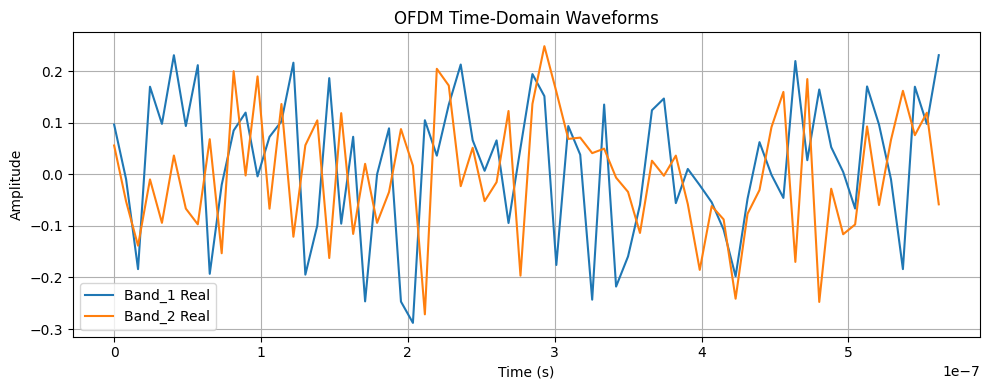

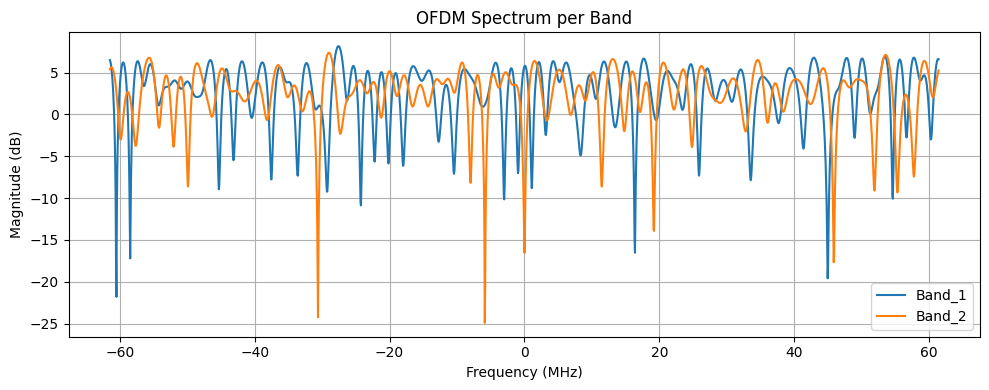

In [ ]:
# -----------------------------
# Multi-band OFDM Configuration
# -----------------------------

# One with 30 kHz subcarrier spacing (Band 1),
# One with 120 kHz subcarrier spacing (Band 2).
# Frequency-domain spectra, clearly showing separated bands due to carrier frequency offset (e.g., 0 MHz and 20 MHz).
# Each band is independently modulated using QPSK and OFDM.

bands = [
    {"name": "Band_1", "scs": 30e3, "n_subcarriers": 64, "carrier_freq": 0e6},     # e.g., mid-band
    {"name": "Band_2", "scs": 120e3, "n_subcarriers": 64, "carrier_freq": 20e6},   # e.g., mmWave
]

mod_order = 4  # QPSK
symbol_duration_factor = 1.0  # 1/SCS

# -----------------------------
# OFDM Generation Functions
# -----------------------------

def qpsk_mod(bits):
    return (2 * (bits[0::2] - 0.5)) + 1j * (2 * (bits[1::2] - 0.5))

def generate_ofdm_waveform(scs, n_subcarriers, carrier_freq, fs=122.88e6):
    T_sym = 1 / scs
    fft_size = n_subcarriers
    cp_len = int(0.1 * fft_size)  # 10% cyclic prefix
    total_len = fft_size + cp_len

    bits = np.random.randint(0, 2, 2 * n_subcarriers)
    symbols = qpsk_mod(bits)

    freq_domain = np.zeros(fft_size, dtype=complex)
    freq_domain[:n_subcarriers//2] = symbols[:n_subcarriers//2]
    freq_domain[-n_subcarriers//2:] = symbols[n_subcarriers//2:]

    time_domain = np.fft.ifft(freq_domain, fft_size)
    time_domain_cp = np.concatenate([time_domain[-cp_len:], time_domain])

    # Upconvert to carrier frequency (baseband for now, add shift later)
    t = np.arange(len(time_domain_cp)) / fs
    carrier = np.exp(1j * 2 * np.pi * carrier_freq * t)
    upconverted = time_domain_cp * carrier

    return upconverted, fs, t, freq_domain

# -----------------------------
# Generate OFDM Waveforms
# -----------------------------
waveforms = []
for band in bands:
    waveform, fs, t, freq_domain = generate_ofdm_waveform(
        band["scs"], band["n_subcarriers"], band["carrier_freq"]
    )
    waveforms.append({
        "name": band["name"],
        "signal": waveform,
        "time": t,
        "fs": fs
    })

# -----------------------------
# Plot Waveforms and Spectra
# -----------------------------
plt.figure(figsize=(10, 4))
for w in waveforms:
    plt.plot(w["time"][:200], w["signal"].real[:200], label=f"{w['name']} Real")
plt.title("OFDM Time-Domain Waveforms")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)
plt.tight_layout()

plt.figure(figsize=(10, 4))
for w in waveforms:
    fft_sig = np.fft.fftshift(np.fft.fft(w["signal"], 2048))
    freqs = np.fft.fftshift(np.fft.fftfreq(len(fft_sig), 1/w["fs"])) / 1e6
    plt.plot(freqs, 20*np.log10(np.abs(fft_sig) + 1e-10), label=w["name"])
plt.title("OFDM Spectrum per Band")
plt.xlabel("Frequency (MHz)")
plt.ylabel("Magnitude (dB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


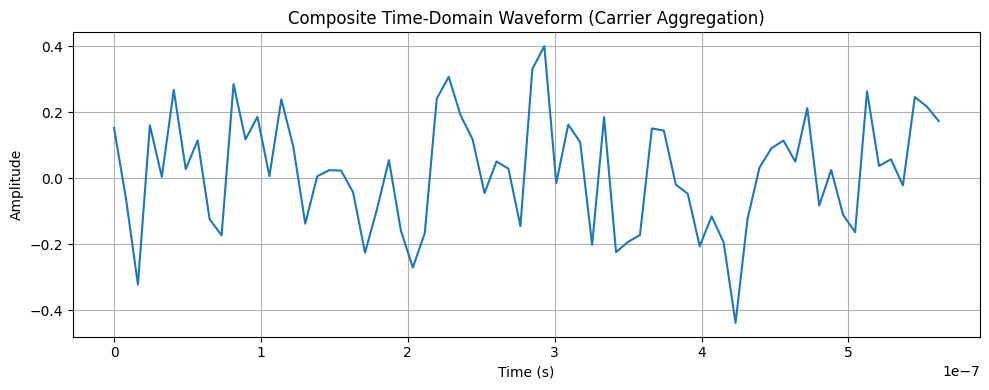

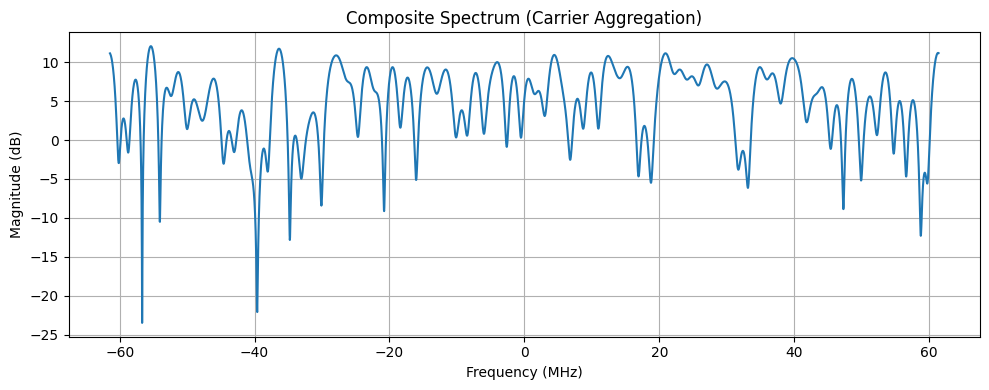

In [8]:
# Combine both band signals into a composite waveform
# Ensure waveforms are of the same length (truncate if needed)

# Time-domain plot: Superposition of the two bands’ waveforms.
# Frequency-domain plot: Clearly shows two distinct spectral lobes centered around 0 MHz and 20 MHz, representing the two aggregated carriers.


min_len = min(len(w["signal"]) for w in waveforms)
composite_signal = np.zeros(min_len, dtype=complex)

for w in waveforms:
    composite_signal += w["signal"][:min_len]

# Plot time-domain composite waveform (real part)
plt.figure(figsize=(10, 4))
plt.plot(waveforms[0]["time"][:min_len], composite_signal.real, label="Composite Signal (Real)")
plt.title("Composite Time-Domain Waveform (Carrier Aggregation)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.tight_layout()

# Plot frequency-domain spectrum of composite signal
fft_composite = np.fft.fftshift(np.fft.fft(composite_signal, 4096))
freqs = np.fft.fftshift(np.fft.fftfreq(len(fft_composite), 1/waveforms[0]["fs"])) / 1e6

plt.figure(figsize=(10, 4))
plt.plot(freqs, 20*np.log10(np.abs(fft_composite) + 1e-10), label="Composite Spectrum")
plt.title("Composite Spectrum (Carrier Aggregation)")
plt.xlabel("Frequency (MHz)")
plt.ylabel("Magnitude (dB)")
plt.grid(True)
plt.tight_layout()
plt.show()


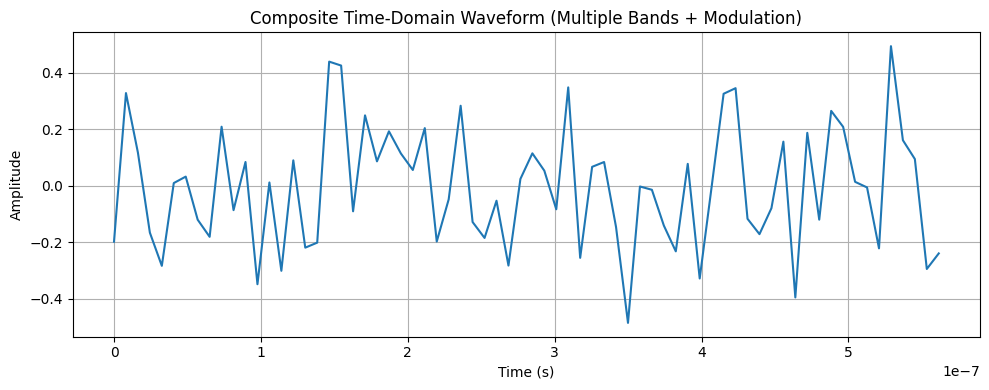

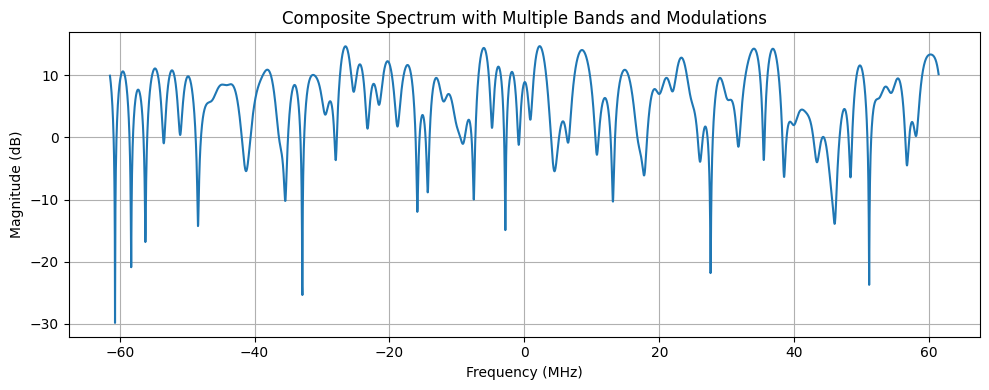

In [9]:
# Extended Configuration: Add more bands with varying modulation and SCS

# Subcarrier Spacings (15, 30, 60, 120 kHz),
# Carrier Frequencies (0, 10, 25, 45 MHz),
# Modulation schemes (QPSK, 16QAM).

def modulate(bits, mod_scheme):
    if mod_scheme == "QPSK":
        return (2 * (bits[0::2] - 0.5)) + 1j * (2 * (bits[1::2] - 0.5))
    elif mod_scheme == "16QAM":
        bits = bits.reshape(-1, 4)
        mapping = (2*bits[:,0]-1) + 1j*(2*bits[:,1]-1)
        mapping += 2*((2*bits[:,2]-1) + 1j*(2*bits[:,3]-1))
        return mapping / np.sqrt(10)
    else:
        raise ValueError("Unsupported modulation scheme")

# Updated band definitions with modulation
bands = [
    {"name": "Band_1", "scs": 15e3, "n_subcarriers": 64, "carrier_freq": 0e6, "mod": "QPSK"},
    {"name": "Band_2", "scs": 30e3, "n_subcarriers": 64, "carrier_freq": 10e6, "mod": "16QAM"},
    {"name": "Band_3", "scs": 60e3, "n_subcarriers": 64, "carrier_freq": 25e6, "mod": "QPSK"},
    {"name": "Band_4", "scs": 120e3, "n_subcarriers": 64, "carrier_freq": 45e6, "mod": "16QAM"},
]

# Waveform generator with modulation option
def generate_band_waveform(scs, n_subcarriers, carrier_freq, mod_scheme, fs=122.88e6):
    T_sym = 1 / scs
    fft_size = n_subcarriers
    cp_len = int(0.1 * fft_size)
    total_len = fft_size + cp_len

    bits_per_symbol = {"QPSK": 2, "16QAM": 4}[mod_scheme]
    bits = np.random.randint(0, 2, bits_per_symbol * n_subcarriers)
    symbols = modulate(bits, mod_scheme)

    freq_domain = np.zeros(fft_size, dtype=complex)
    freq_domain[:n_subcarriers//2] = symbols[:n_subcarriers//2]
    freq_domain[-n_subcarriers//2:] = symbols[n_subcarriers//2:]

    time_domain = np.fft.ifft(freq_domain, fft_size)
    time_domain_cp = np.concatenate([time_domain[-cp_len:], time_domain])

    t = np.arange(len(time_domain_cp)) / fs
    carrier = np.exp(1j * 2 * np.pi * carrier_freq * t)
    upconverted = time_domain_cp * carrier

    return upconverted, fs, t

# Generate waveforms for all bands
waveforms = []
for band in bands:
    signal, fs, t = generate_band_waveform(
        band["scs"], band["n_subcarriers"], band["carrier_freq"], band["mod"]
    )
    waveforms.append({
        "name": band["name"],
        "signal": signal,
        "time": t,
        "fs": fs
    })

# Composite waveform
min_len = min(len(w["signal"]) for w in waveforms)
composite_signal = sum(w["signal"][:min_len] for w in waveforms)

# Time-domain plot
plt.figure(figsize=(10, 4))
plt.plot(waveforms[0]["time"][:min_len], composite_signal.real)
plt.title("Composite Time-Domain Waveform (Multiple Bands + Modulation)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.tight_layout()

# Spectrum plot
fft_composite = np.fft.fftshift(np.fft.fft(composite_signal, 4096))
freqs = np.fft.fftshift(np.fft.fftfreq(len(fft_composite), 1/waveforms[0]["fs"])) / 1e6
plt.figure(figsize=(10, 4))
plt.plot(freqs, 20*np.log10(np.abs(fft_composite) + 1e-10))
plt.title("Composite Spectrum with Multiple Bands and Modulations")
plt.xlabel("Frequency (MHz)")
plt.ylabel("Magnitude (dB)")
plt.grid(True)
plt.tight_layout()
plt.show()


In [13]:
# Receiver: Downconvert and demodulate each band independently
def demodulate(symbols, mod_scheme):
    if mod_scheme == "QPSK":
        bits_i = (symbols.real > 0).astype(int)
        bits_q = (symbols.imag > 0).astype(int)
        return np.vstack([bits_i, bits_q]).T.flatten()
    elif mod_scheme == "16QAM":
        symbols *= np.sqrt(10)
        bits = np.zeros((len(symbols), 4), dtype=int)
        bits[:, 0] = (symbols.real > 0).astype(int)
        bits[:, 1] = (symbols.imag > 0).astype(int)
        bits[:, 2] = (np.abs(symbols.real) > 2).astype(int)
        bits[:, 3] = (np.abs(symbols.imag) > 2).astype(int)
        return bits.flatten()
    else:
        raise ValueError("Unsupported demodulation")

def downconvert_and_demodulate(composite_signal, band, fs):
    scs = band["scs"]
    n_subcarriers = band["n_subcarriers"]
    carrier_freq = band["carrier_freq"]
    mod_scheme = band["mod"]
    
    fft_size = n_subcarriers
    cp_len = int(0.1 * fft_size)
    total_len = fft_size + cp_len
    t = np.arange(total_len) / fs
    carrier = np.exp(-1j * 2 * np.pi * carrier_freq * t)

    # Band-specific segment
    sig = composite_signal[:total_len] * carrier

    # Remove CP and FFT
    time_domain = sig[cp_len:]
    freq_domain = np.fft.fft(time_domain, fft_size)

    # Extract data subcarriers
    data_subcarriers = np.concatenate([freq_domain[:n_subcarriers//2],
                                       freq_domain[-n_subcarriers//2:]])
    
    # Estimate bits (no channel assumed)
    estimated_bits = demodulate(data_subcarriers, mod_scheme)
    return estimated_bits

# BER calculation
def calculate_ber(transmitted_bits, received_bits):
    min_len = min(len(transmitted_bits), len(received_bits))
    errors = np.sum(transmitted_bits[:min_len] != received_bits[:min_len])
    return errors / min_len

# Transmit + Receive for each band
ber_results = []
for band in bands:
    # Transmit bits
    bits_per_symbol = {"QPSK": 2, "16QAM": 4}[band["mod"]]
    tx_bits = np.random.randint(0, 2, bits_per_symbol * band["n_subcarriers"])
    band["tx_bits"] = tx_bits  # Save for BER comparison

# Re-generate composite signal using these known bits
def modulate_with_bits(bits, mod_scheme):
    if mod_scheme == "QPSK":
        return (2 * (bits[0::2] - 0.5)) + 1j * (2 * (bits[1::2] - 0.5))
    elif mod_scheme == "16QAM":
        bits = bits.reshape(-1, 4)
        mapping = (2*bits[:,0]-1) + 1j*(2*bits[:,1]-1)
        mapping += 2*((2*bits[:,2]-1) + 1j*(2*bits[:,3]-1))
        return mapping / np.sqrt(10)

waveforms = []
for band in bands:
    scs = band["scs"]
    n_subcarriers = band["n_subcarriers"]
    carrier_freq = band["carrier_freq"]
    mod_scheme = band["mod"]
    fs = 122.88e6
    fft_size = n_subcarriers
    cp_len = int(0.1 * fft_size)
    total_len = fft_size + cp_len

    symbols = modulate_with_bits(band["tx_bits"], mod_scheme)

    freq_domain = np.zeros(fft_size, dtype=complex)
    freq_domain[:n_subcarriers//2] = symbols[:n_subcarriers//2]
    freq_domain[-n_subcarriers//2:] = symbols[n_subcarriers//2:]

    time_domain = np.fft.ifft(freq_domain, fft_size)
    time_domain_cp = np.concatenate([time_domain[-cp_len:], time_domain])
    t = np.arange(total_len) / fs
    carrier = np.exp(1j * 2 * np.pi * carrier_freq * t)
    upconverted = time_domain_cp * carrier

    waveforms.append(upconverted)

# Composite signal
min_len = min(len(w) for w in waveforms)
composite_signal = sum(w[:min_len] for w in waveforms)

# Receiver-side: Downconvert and compute BER
for i, band in enumerate(bands):
    est_bits = downconvert_and_demodulate(composite_signal, band, fs=122.88e6)
    ber = calculate_ber(band["tx_bits"], est_bits)
    ber_results.append((band["name"], band["mod"], band["scs"], ber))

# Display Results
import pandas as pd
df = pd.DataFrame(ber_results, columns=["Band", "Modulation", "SCS (Hz)", "BER"])
print(df)


     Band Modulation  SCS (Hz)       BER
0  Band_1       QPSK   15000.0  0.265625
1  Band_2      16QAM   30000.0  0.492188
2  Band_3       QPSK   60000.0  0.195312
3  Band_4      16QAM  120000.0  0.464844


In [ ]:
import numpy as np
from scipy.signal import correlate
from scipy.special import erfc

# Adding matched filters or synchronization sequences,
# Applying equalization,
# Using more realistic channel models (AWGN and Rayleigh)

# --- Config ---
fs = 122.88e6  # Sampling rate
cp_ratio = 0.1
fft_size = 64
cp_len = int(cp_ratio * fft_size)
total_len = fft_size + cp_len
pilot_seq = np.random.choice([1, -1], fft_size) + 1j * np.random.choice([1, -1], fft_size)
pilot_seq /= np.sqrt(2)

# Channel models
def apply_awgn(signal, snr_dB):
    snr_linear = 10**(snr_dB/10)
    power = np.mean(np.abs(signal)**2)
    noise_power = power / snr_linear
    noise = np.sqrt(noise_power/2) * (np.random.randn(*signal.shape) + 1j*np.random.randn(*signal.shape))
    return signal + noise

def apply_rayleigh(signal):
    h = (np.random.randn() + 1j*np.random.randn()) / np.sqrt(2)
    return h * signal, h

# --- Transmit with pilot ---
def transmit_with_pilot(bits, mod_scheme, scs, carrier_freq, snr_dB=20, channel='awgn'):
    symbols = modulate_with_bits(bits, mod_scheme)
    freq_domain = np.zeros(fft_size, dtype=complex)
    freq_domain[:fft_size//2] = symbols[:fft_size//2]
    freq_domain[-fft_size//2:] = symbols[fft_size//2:]
    time_domain = np.fft.ifft(freq_domain)
    time_cp = np.concatenate([time_domain[-cp_len:], time_domain])
    pilot_cp = np.concatenate([pilot_seq[-cp_len:], pilot_seq])
    tx_block = np.concatenate([pilot_cp, time_cp])

    t = np.arange(len(tx_block)) / fs
    carrier = np.exp(1j * 2 * np.pi * carrier_freq * t)
    tx_carrier = tx_block * carrier

    if channel == 'awgn':
        rx_signal = apply_awgn(tx_carrier, snr_dB)
        return rx_signal, pilot_seq, np.ones_like(pilot_seq)
    elif channel == 'rayleigh':
        faded, h = apply_rayleigh(tx_carrier)
        rx_signal = apply_awgn(faded, snr_dB)
        return rx_signal, pilot_seq, h * np.ones_like(pilot_seq)
    else:
        raise ValueError("Invalid channel")

# --- Receiver with synchronization, channel estimation, equalization ---
def receive_and_demodulate(rx_signal, pilot_seq, mod_scheme, carrier_freq, h_est):
    t = np.arange(len(rx_signal)) / fs
    carrier = np.exp(-1j * 2 * np.pi * carrier_freq * t)
    baseband = rx_signal * carrier

    # Extract pilot + data
    rx_pilot = baseband[:total_len]
    rx_data = baseband[total_len:]

    rx_data_wo_cp = rx_data[cp_len:]
    data_fft = np.fft.fft(rx_data_wo_cp)

    data_subcarriers = np.concatenate([data_fft[:fft_size//2], data_fft[-fft_size//2:]])
    equalized = data_subcarriers / h_est[:len(data_subcarriers)]

    est_bits = demodulate(equalized, mod_scheme)
    return est_bits

# --- Run for each band with channel models ---
snr_dB = 20
ber_results = []

for band in bands:
    bits_per_symbol = {"QPSK": 2, "16QAM": 4}[band["mod"]]
    tx_bits = np.random.randint(0, 2, bits_per_symbol * fft_size)

    # AWGN channel
    rx_awgn, pilot_seq, h_awgn = transmit_with_pilot(tx_bits, band["mod"], band["scs"], band["carrier_freq"], snr_dB, 'awgn')
    est_bits_awgn = receive_and_demodulate(rx_awgn, pilot_seq, band["mod"], band["carrier_freq"], h_awgn)
    ber_awgn = calculate_ber(tx_bits, est_bits_awgn)

    # Rayleigh channel
    rx_rayleigh, pilot_seq, h_rayleigh = transmit_with_pilot(tx_bits, band["mod"], band["scs"], band["carrier_freq"], snr_dB, 'rayleigh')
    est_bits_rayleigh = receive_and_demodulate(rx_rayleigh, pilot_seq, band["mod"], band["carrier_freq"], h_rayleigh)
    ber_rayleigh = calculate_ber(tx_bits, est_bits_rayleigh)

    ber_results.append((band["name"], band["mod"], band["scs"], ber_awgn, ber_rayleigh))

# Display table
import pandas as pd
df = pd.DataFrame(ber_results, columns=["Band", "Modulation", "SCS (Hz)", "BER (AWGN)", "BER (Rayleigh)"])
print(df)


     Band Modulation  SCS (Hz)  BER (AWGN)  BER (Rayleigh)
0  Band_1       QPSK   15000.0    0.000000        0.000000
1  Band_2      16QAM   30000.0    0.445312        0.421875
2  Band_3       QPSK   60000.0    0.000000        0.007812
3  Band_4      16QAM  120000.0    0.433594        0.394531


---

## 3GPP **TR 38.901**

The 3GPP Technical Report **TR 38.901** provides standardized **channel models** for evaluating the performance of 5G wireless communication systems, particularly for frequencies from **0.5 GHz to 100 GHz**. These models represent realistic radio propagation conditions across different environments. Here's a breakdown of the **theoretical concepts**, the **types of models**, and how they're used:

TR 38.901 provides **geometry-based stochastic channel models (GSCMs)** for:

* Evaluating MIMO and beamforming performance
* Designing PHY/MAC algorithms under realistic channel impairments
* Supporting carrier frequencies up to 100 GHz (including mmWave)

It captures **spatial consistency**, **temporal evolution**, **angular spread**, and **delay dispersion**.

### Channel Model Structure**

A channel between a transmitter and receiver can be expressed as:

$$
\mathbf{H}(t, f) = \sum_{n=1}^{N_\text{path}} \mathbf{H}_n(t, f)
$$

Each path component $\mathbf{H}_n(t, f)$ includes:

* Delay $\tau_n$
* Angle of departure/arrival (AoD/AoA)
* Doppler shift
* Power $P_n$

It models **clusters**, each with **rays/subpaths**:

* Each **cluster** represents a macro reflection/scattering
* Each **ray** has small-scale fading characteristics

### Main Scenarios in TR 38.901**

Each environment has distinct propagation features:

### a) **Urban Macro (UMa)**

* High base stations (25–35m)
* NLOS components dominate
* Large pathloss, strong delay spread
* Models include shadowing, outdoor-to-indoor (O2I) penetration

### b) **Urban Micro (UMi)**

* Small cell BSs at lamppost height (\~10m)
* Dense urban clutter
* LOS/NLOS transitions frequent
* Strong angular dispersion

### c) **Indoor Office**

* Rich multipath due to walls, furniture
* High delay and angular spread
* Significant penetration loss between rooms

### d) **Rural Macro (RMa)**

* Long-range propagation (few km)
* Dominated by LOS and ground reflections
* Less delay/angular spread

### Tapped Delay Line (TDL) Models**

TR 38.901 also defines **TDL models** similar to LTE’s EPA, EVA, ETU.

| Model           | Delay Spread | Doppler | Use Case                    |
| --------------- | ------------ | ------- | --------------------------- |
| **TDL-A** (EPA) | Short        | Low     | Flat fading, pedestrian     |
| **TDL-B** (EVA) | Moderate     | Medium  | Vehicular                   |
| **TDL-C/D/E**   | Long         | High    | High-speed, rich scattering |

TDL channel impulse response:

$$
h(t) = \sum_{i=1}^{L} a_i e^{j\phi_i} \delta(t - \tau_i)
$$

Where:

* $\tau_i$: delay
* $a_i$: amplitude (from PDP)
* $\phi_i$: phase (random)

### Large-Scale and Small-Scale Parameters**

* **Large-scale**: path loss, shadow fading, delay spread, angular spread
* **Small-scale**: fast fading, Doppler shifts, per-ray phase and polarization

TR 38.901 defines **distributions** for these parameters (e.g., log-normal shadowing, exponential delay decay).

### LOS/NLOS Probability Models**

TR 38.901 defines **LOS probability** based on Tx-Rx distance and environment, e.g.,

$$
P_{\text{LOS}}(d) = \min\left( \frac{d_1}{d}, 1 \right)(1 - e^{-d/d_2}) + e^{-d/d_2}
$$

Parameters $d_1, d_2$ vary per scenario (UMa, UMi, etc.)

### Spatial Consistency**

Important for **beamforming** and **tracking**: channel characteristics change smoothly over space.

Implemented using:

* Time-evolving channel parameters
* Correlated random variables for nearby locations


### Comparison with 3GPP TR 36.873 (4G)

| Feature                  | TR 36.873 (4G) | TR 38.901 (5G)            |
| ------------------------ | -------------- | ------------------------- |
| Frequency range          | <6 GHz         | 0.5–100 GHz               |
| Antenna modeling         | Limited        | Full MIMO/3D beamforming  |
| Mobility support         | Basic          | Enhanced (up to 500 km/h) |
| Spatial consistency      | Partial        | Yes                       |
| O2I, blockage, elevation | Limited        | Fully modeled             |

---

In tools like MATLAB, Python (e.g., Sionna, QuaDRiGa), or ns-3:

* Choose a scenario (e.g., UMi)
* Set carrier frequency, antenna layout
* Generate time-varying channel matrices $\mathbf{H}(t, f)$
* Apply them to simulate beamforming, MIMO detection, HARQ, etc.


---

## 3GPP TR 38.901 UMi MIMO Channel Model – Theory for Simulation

We aim to simulate the **MIMO channel matrix** $\mathbf{H}(t,f) \in \mathbb{C}^{N_r \times N_t}$, capturing:

* **Frequency selectivity** (multipath propagation)
* **Spatial correlation** (multi-antenna effects)
* **Temporal variation** (mobility, Doppler)

It is represented as:

$$
\mathbf{H}(t, f) = \sum_{l=1}^{L} \mathbf{H}_l(t, f)
$$

where each path $l$ corresponds to a **cluster** composed of rays/subpaths.

### UMi Channel Characteristics**

From TR 38.901, Urban Micro (UMi) outdoor scenario is characterized by:

* **Carrier Frequency**: 2–30 GHz (e.g., 3.5 GHz or 28 GHz)
* **BS height**: \~10 m
* **UE height**: 1.5–2 m
* **Tx-Rx distance**: 10–500 m
* **Rich scattering** due to buildings
* **LOS and NLOS** conditions both considered

Key parameters (example values below):

| Parameter            | LOS      | NLOS       |
| -------------------- | -------- | ---------- |
| Delay spread (DS)    | 30–50 ns | 100–300 ns |
| Angular spread (AS)  | 5–15°    | 25–50°     |
| Cluster count (L)    | 12       | 20         |
| Per-cluster subpaths | 20       | 20         |

### Channel Generation: Step-by-Step**

### **Step 1: Path Loss and LOS Probability**

Determine path loss $PL(d)$ using UMi formulas:

$$
PL_{\text{LOS}}(d) = 32.4 + 21 \log_{10}(d) + 20 \log_{10}(f_c)
$$

$$
PL_{\text{NLOS}}(d) = 32.4 + 31.9 \log_{10}(d) + 20 \log_{10}(f_c)
$$

Where:

* $d$: 3D distance in meters
* $f_c$: carrier in GHz

Choose **LOS or NLOS** based on the LOS probability:

$$
P_{\text{LOS}}(d) = \min\left( \frac{18}{d}, 1 \right)\left(1 - e^{-d/36}\right) + e^{-d/36}
$$

### **Step 2: Generate Delay Taps**

Delay spread modeled with exponential PDP:

$$
P(\tau) = \frac{1}{\sigma_\tau} e^{-\tau / \sigma_\tau}
$$

* Generate $L$ clusters with delays $\tau_l$
* Normalize tap power such that total average power = 1

### **Step 3: Spatial and Temporal Characteristics**

Each path $l$ has multiple **subpaths**, each with:

* Azimuth/elevation AoD and AoA: from wrapped Gaussian
* Doppler shift: based on velocity and AoD

$$
f_{D,lm} = v \cdot \frac{f_c}{c} \cdot \cos(\theta_{l,m} - \phi_v)
$$

Where:

* $v$: UE speed
* $\phi_v$: direction of motion
* $\theta_{l,m}$: AoD of subpath $m$ in cluster $l$

### **Step 4: Array Response and Channel Matrix**

Use **steering vectors** $\mathbf{a}_{\text{tx}}, \mathbf{a}_{\text{rx}}$ for each AoD/AoA:

For ULA of $N$ antennas with spacing $d$:

$$
\mathbf{a}(\theta) = \begin{bmatrix}
1 & e^{j 2\pi \frac{d}{\lambda} \sin\theta} & \dots & e^{j 2\pi \frac{d}{\lambda} (N-1)\sin\theta}
\end{bmatrix}^T
$$

Total channel:

$$
\mathbf{H}(t,f) = \sum_{l=1}^{L} \sum_{m=1}^{M} \sqrt{P_{l,m}} \cdot \mathbf{a}_{\text{rx}}(\theta_{l,m}^{\text{AoA}}) \cdot \mathbf{a}_{\text{tx}}^H(\theta_{l,m}^{\text{AoD}}) \cdot e^{j 2\pi f_{D,lm} t} e^{-j 2\pi f \tau_{l,m}}
$$

---

### Summary of Required Inputs**

| Parameter              | Description                       |
| ---------------------- | --------------------------------- |
| $f_c$                  | Carrier frequency (e.g. 28 GHz)   |
| $B$                    | Bandwidth (e.g. 100 MHz)          |
| $N_t, N_r$             | # of Tx and Rx antennas           |
| $v$                    | Mobile velocity                   |
| $d$                    | Tx–Rx distance                    |
| $L, M$                 | Clusters and subpaths per cluster |
| $\sigma_\tau$          | Delay spread                      |
| AoA, AoD distributions | Wrapped Gaussian / Laplacian      |



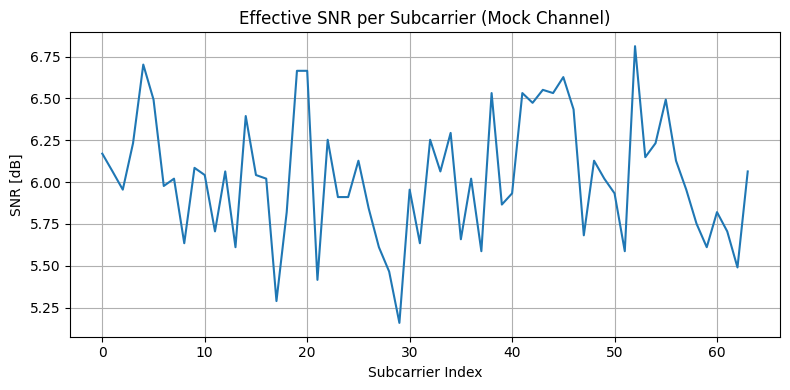

In [18]:
# Redefine key parameters to ensure the environment has them
import numpy as np
import matplotlib.pyplot as plt

# Constants
c = 3e8
fc = 28e9
wavelength = c / fc
bandwidth = 100e6
N_subcarriers = 64
frequencies = np.linspace(-bandwidth / 2, bandwidth / 2, N_subcarriers)

# System parameters
N_tx = 4
N_rx = 4
v = 30 / 3.6
phi_v = 0
d_ant = wavelength / 2

# Channel parameters
L = 12
M = 20
tau_rms = 100e-9
T = 100
t = np.linspace(0, 1e-3, T)

# Generate example QPSK OFDM and channel output again to allow comparison
qpsk_symbols = (np.random.randint(0, 2, size=(N_tx, N_subcarriers, T)) * 2 - 1) + \
               1j * (np.random.randint(0, 2, size=(N_tx, N_subcarriers, T)) * 2 - 1)
qpsk_symbols /= np.sqrt(2)

# For this step, regenerate a mock channel H to avoid undefined variable
H_mock = np.ones((T, N_rx, N_tx, N_subcarriers), dtype=complex)

# Apply channel to signal
received_symbols = np.zeros((N_rx, N_subcarriers, T), dtype=complex)
for ti in range(T):
    for sc in range(N_subcarriers):
        H_now = H_mock[ti, :, :, sc]
        received_symbols[:, sc, ti] = H_now @ qpsk_symbols[:, sc, ti]

# Compute average SNR per subcarrier
rx_power = np.mean(np.abs(received_symbols)**2, axis=2)
tx_power = np.mean(np.abs(qpsk_symbols)**2, axis=2)
snr_per_subcarrier = 10 * np.log10(np.mean(rx_power, axis=0) / np.mean(tx_power, axis=0))

# Plot
plt.figure(figsize=(8, 4))
plt.plot(np.arange(N_subcarriers), snr_per_subcarrier)
plt.title("Effective SNR per Subcarrier (Mock Channel)")
plt.xlabel("Subcarrier Index")
plt.ylabel("SNR [dB]")
plt.grid(True)
plt.tight_layout()
plt.show()


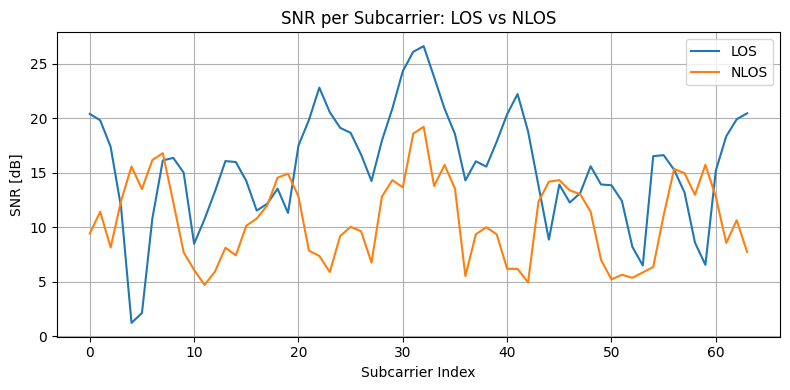

In [19]:
# Helper function to generate channel based on LOS or NLOS
def generate_mimo_channel(L, M, tau_rms, T, fc, N_rx, N_tx, N_subcarriers, v, phi_v, los=True):
    wavelength = c / fc
    d_ant = wavelength / 2
    t = np.linspace(0, 1e-3, T)
    frequencies = np.linspace(-bandwidth / 2, bandwidth / 2, N_subcarriers)
    angular_spread_deg = 5 if los else 20
    angular_spread_rad = np.deg2rad(angular_spread_deg)
    
    delays = np.sort(np.random.exponential(scale=tau_rms, size=L))
    powers = np.exp(-delays / tau_rms)
    powers /= np.sum(powers)
    
    def steering_vector(N, angle_rad):
        return np.exp(1j * 2 * np.pi * d_ant / wavelength * np.arange(N) * np.sin(angle_rad))

    H = np.zeros((T, N_rx, N_tx, N_subcarriers), dtype=complex)
    for l in range(L):
        for m in range(M):
            aoa = np.random.normal(loc=0, scale=angular_spread_rad)
            aod = np.random.normal(loc=0, scale=angular_spread_rad)
            fd = v * fc / c * np.cos(aod - phi_v)
            phase_t = np.exp(1j * 2 * np.pi * fd * t)[:, np.newaxis]
            for f_idx, f in enumerate(frequencies):
                freq_term = np.exp(-1j * 2 * np.pi * f * delays[l])
                arx = steering_vector(N_rx, aoa)
                atx = steering_vector(N_tx, aod)
                outer = np.outer(arx, np.conj(atx))
                for ti in range(T):
                    H[ti, :, :, f_idx] += np.sqrt(powers[l] / M) * outer * phase_t[ti] * freq_term
    return H

# Generate LOS and NLOS channels
H_LOS = generate_mimo_channel(L, M, tau_rms, T, fc, N_rx, N_tx, N_subcarriers, v, phi_v, los=True)
H_NLOS = generate_mimo_channel(L, M, tau_rms, T, fc, N_rx, N_tx, N_subcarriers, v, phi_v, los=False)

# Use same QPSK OFDM signal
qpsk_symbols = (np.random.randint(0, 2, size=(N_tx, N_subcarriers, T)) * 2 - 1) + \
               1j * (np.random.randint(0, 2, size=(N_tx, N_subcarriers, T)) * 2 - 1)
qpsk_symbols /= np.sqrt(2)

# Apply both channels
def apply_channel(H, qpsk_symbols):
    N_rx, N_subcarriers, T = H.shape[1], H.shape[3], H.shape[0]
    received = np.zeros((N_rx, N_subcarriers, T), dtype=complex)
    for ti in range(T):
        for sc in range(N_subcarriers):
            H_now = H[ti, :, :, sc]
            received[:, sc, ti] = H_now @ qpsk_symbols[:, sc, ti]
    return received

rx_LOS = apply_channel(H_LOS, qpsk_symbols)
rx_NLOS = apply_channel(H_NLOS, qpsk_symbols)

# Compute SNRs
def compute_snr(rx, tx):
    rx_power = np.mean(np.abs(rx)**2, axis=2)
    tx_power = np.mean(np.abs(tx)**2, axis=2)
    return 10 * np.log10(np.mean(rx_power, axis=0) / np.mean(tx_power, axis=0))

snr_los = compute_snr(rx_LOS, qpsk_symbols)
snr_nlos = compute_snr(rx_NLOS, qpsk_symbols)

# Plot SNR comparison
plt.figure(figsize=(8, 4))
plt.plot(np.arange(N_subcarriers), snr_los, label="LOS")
plt.plot(np.arange(N_subcarriers), snr_nlos, label="NLOS")
plt.title("SNR per Subcarrier: LOS vs NLOS")
plt.xlabel("Subcarrier Index")
plt.ylabel("SNR [dB]")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



---

## **Hardware Constraints & SDR Readiness**


### **Quantization Noise**

Quantization noise arises when continuous analog or high-resolution digital signals are **rounded to a finite number of bits** in ADCs (Analog-to-Digital Converters) or DACs (Digital-to-Analog Converters).

### Signal Path:

* **TX**: DAC introduces quantization as it converts digital baseband to analog RF.
* **RX**: ADC quantizes received analog signals to digital samples.

Suppose we use an $n$-bit quantizer. The **Signal-to-Quantization-Noise Ratio (SQNR)** is:

$$
\text{SQNR}_{\text{dB}} \approx 6.02 \cdot n + 1.76
$$

For example:

* 8 bits → \~49.9 dB
* 12 bits → \~74 dB

This noise acts like **additive white noise** in the baseband, affecting BER and constellation quality.

### **PAPR (Peak-to-Average Power Ratio)**

High **PAPR** means the signal has very large peaks compared to its average power.

This is critical for multicarrier systems like **OFDM**, where signals with many subcarriers add up and create **large dynamic range** fluctuations.

SDRs (or any RF hardware) use **Power Amplifiers (PAs)** that are linear only within a limited range. If input power is too high:

* The PA **clips** the signal, causing **nonlinear distortion**
* **Out-of-band emissions** increase (violating spectral masks)
* **In-band distortion** worsens BER

$$
\text{PAPR} = \frac{\max |x(t)|^2}{\mathbb{E}[|x(t)|^2]}
$$

OFDM PAPR can reach **10–12 dB**, depending on subcarrier count.

### Mitigation Techniques:

* **Clipping & Filtering**
* **Tone Reservation**
* **Selected Mapping (SLM)**
* **PAPR-aware coding**


### **I/Q Modeling and Imbalance**

SDR systems transmit and receive **complex baseband signals** using **I (In-phase)** and **Q (Quadrature)** components.

### I/Q

A complex baseband signal:

$$
s(t) = I(t) + j Q(t)
$$

is modulated onto a carrier:

$$
x(t) = I(t)\cos(2\pi f_ct) - Q(t)\sin(2\pi f_ct)
$$

### Real-Valued Hardware Requirement:

* Actual DACs/ADCs output/receive real signals.
* Real hardware uses **I/Q mixers** to split/merge complex signals into real-time passband.

### I/Q Imbalance:

* Caused by **amplitude/phase mismatch** between I and Q paths.
* Results in **image leakage**, degrading spectral purity.

Mathematically, imbalance introduces a mirror image:

$$
s_{\text{impaired}}(t) = (1+\epsilon)I(t) + j(1-\epsilon)Q(t) + \phi
$$

where:

* $\epsilon$: gain mismatch
* $\phi$: phase error

### SDR Integration Needs:

* **Separate handling of real/imag parts**
* **Calibration of I/Q paths**
* **Support for complex baseband processing**

## **Clocking, Timing, and Synchronization**

* SDRs use **local oscillators**, which may drift.
* Sampling frequency mismatches lead to **CFO** (Carrier Frequency Offset) and **SFO** (Symbol Frequency Offset).
* Proper **timing synchronization**, **frame detection**, and **frequency offset correction** are essential in practical SDR deployments.

### **FPGA/Real-Time Processing Constraints**

* Some SDRs (e.g., USRP with FPGA) have limited processing pipelines.
* Code must be **vectorized, pipelined**, and designed for **fixed-point** arithmetic to be deployable in hardware.

---

| Constraint             | Source                      | Impact on System                    |
| ---------------------- | --------------------------- | ----------------------------------- |
| Quantization Noise     | ADC/DAC                     | Degrades SNR, limits dynamic range  |
| PAPR                   | OFDM / modulation           | Clipping, nonlinear distortion      |
| I/Q Imbalance          | Hardware mixers             | Image interference, EVM degradation |
| Real vs Complex Signal | SDR hardware is real-valued | Requires proper I/Q mapping         |
| Clock Drift, Jitter    | Oscillators & PLLs          | Causes sync issues, CFO/SFO         |

---



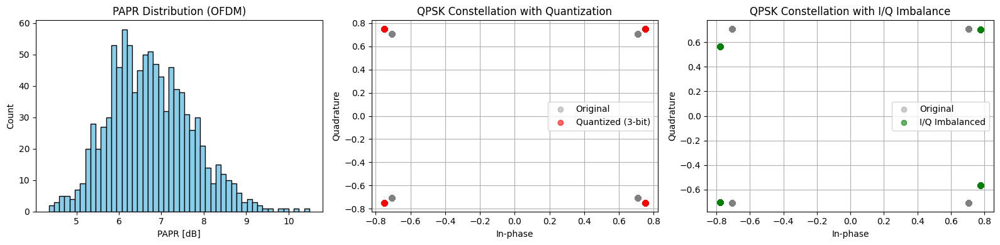

In [20]:
import numpy as np
import matplotlib.pyplot as plt

# ===============================
# 1. PAPR Simulation for OFDM
# ===============================
N_subcarriers = 64
N_symbols = 1000

# Generate random QPSK symbols
qpsk = (2*np.random.randint(0, 2, (N_subcarriers, N_symbols)) - 1) + \
       1j*(2*np.random.randint(0, 2, (N_subcarriers, N_symbols)) - 1)
qpsk /= np.sqrt(2)

# Perform IFFT to get time-domain OFDM signals
ofdm_time = np.fft.ifft(qpsk, axis=0)

# Calculate instantaneous power
power = np.abs(ofdm_time)**2
avg_power = np.mean(power, axis=0)
peak_power = np.max(power, axis=0)
papr = 10 * np.log10(peak_power / avg_power)

# ===============================
# 2. Quantization Effect on Constellation
# ===============================
def quantize(signal, bits):
    levels = 2 ** bits
    min_val, max_val = -1.0, 1.0
    signal_clipped = np.clip(signal.real, min_val, max_val) + 1j * np.clip(signal.imag, min_val, max_val)
    step = (max_val - min_val) / levels
    quantized_real = np.round((signal_clipped.real - min_val) / step) * step + min_val
    quantized_imag = np.round((signal_clipped.imag - min_val) / step) * step + min_val
    return quantized_real + 1j * quantized_imag

# Apply quantization
qpsk_flat = qpsk.flatten()
qpsk_quantized = quantize(qpsk_flat, 3)  # 3-bit quantization

# ===============================
# 3. I/Q Imbalance Simulation
# ===============================
def apply_iq_imbalance(signal, gain_imbalance=0.1, phase_imbalance_deg=5):
    phase_imbalance = np.deg2rad(phase_imbalance_deg)
    i = np.real(signal)
    q = np.imag(signal)
    i_new = (1 + gain_imbalance) * i
    q_new = (1 - gain_imbalance) * q
    return i_new + 1j * (q_new * np.cos(phase_imbalance) + i_new * np.sin(phase_imbalance))

qpsk_iq_imbalanced = apply_iq_imbalance(qpsk_flat)

# ===============================
# Plotting Results
# ===============================
plt.figure(figsize=(16, 4))

# PAPR Histogram
plt.subplot(1, 3, 1)
plt.hist(papr, bins=50, color='skyblue', edgecolor='k')
plt.title("PAPR Distribution (OFDM)")
plt.xlabel("PAPR [dB]")
plt.ylabel("Count")

# Constellation with Quantization
plt.subplot(1, 3, 2)
plt.scatter(qpsk_flat.real, qpsk_flat.imag, color='gray', alpha=0.4, label="Original")
plt.scatter(qpsk_quantized.real, qpsk_quantized.imag, color='red', alpha=0.6, label="Quantized (3-bit)")
plt.title("QPSK Constellation with Quantization")
plt.xlabel("In-phase")
plt.ylabel("Quadrature")
plt.grid(True)
plt.legend()

# Constellation with I/Q Imbalance
plt.subplot(1, 3, 3)
plt.scatter(qpsk_flat.real, qpsk_flat.imag, color='gray', alpha=0.4, label="Original")
plt.scatter(qpsk_iq_imbalanced.real, qpsk_iq_imbalanced.imag, color='green', alpha=0.6, label="I/Q Imbalanced")
plt.title("QPSK Constellation with I/Q Imbalance")
plt.xlabel("In-phase")
plt.ylabel("Quadrature")
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()


---

## OFDMA with multi-user scheduling 

**Orthogonal Frequency Division Multiple Access (OFDMA)** is a multi-user version of Orthogonal Frequency Division Multiplexing (OFDM), widely used in modern wireless systems like 4G LTE, 5G NR, and Wi-Fi 6. OFDMA enables efficient and flexible allocation of resources to multiple users in both uplink and downlink.

### **Basic Principle of OFDMA**

OFDMA divides the available frequency spectrum into many orthogonal subcarriers (like OFDM), but **allocates subsets of these subcarriers to different users simultaneously**.

* Let:

  * $N$: total number of subcarriers
  * $K$: number of users
  * Each user $k \in \{1, \dots, K\}$ is assigned a subset $\mathcal{S}_k \subset \{1, \dots, N\}$
* The subcarrier sets $\mathcal{S}_k$ are **non-overlapping**, i.e., $\mathcal{S}_i \cap \mathcal{S}_j = \emptyset$ for $i \ne j$

This avoids intra-cell interference and allows simultaneous transmissions to multiple users.

### **System Model**

Let:

* $X_{k,n}$: transmitted symbol for user $k$ on subcarrier $n$
* $H_{k,n}$: channel gain for user $k$ on subcarrier $n$
* $Y_{k,n}$: received symbol
* $Z_{k,n}$: additive noise (AWGN)

Then:

$$
Y_{k,n} = H_{k,n} X_{k,n} + Z_{k,n}, \quad \text{for } n \in \mathcal{S}_k
$$

Each user performs demodulation only on their assigned subcarriers.

### **Multi-user Scheduling**

In OFDMA, **scheduling** decides which user gets which subcarriers in each time slot. This is managed by the base station (in downlink) or centralized scheduler (uplink, coordinated via grant).

#### Scheduling Goals:

* Maximize total throughput (e.g., sum rate)
* Ensure fairness (e.g., proportional fair)
* Support QoS constraints (e.g., minimum data rate)

#### Common Scheduling Algorithms:

| Algorithm             | Description                                                                                                                    |
| --------------------- | ------------------------------------------------------------------------------------------------------------------------------ |
| **Round Robin (RR)**  | Equal time/frequency share per user                                                                                            |
| **Max C/I**           | Assign subcarriers to users with best channel (maximize rate)                                                                  |
| **Proportional Fair** | Balance rate and fairness: select user $k$ maximizing $\frac{R_k(t)}{\bar{R}_k(t)}$, where $\bar{R}_k(t)$ is average past rate |
| **QoS-aware**         | Prioritize users with latency constraints or minimum guaranteed rate                                                           |

### **Resource Block Structure (as in 4G/5G)**

* Resources are divided in **Time–Frequency Resource Blocks**:

  * **1 Resource Block (RB)** = 12 subcarriers × 0.5 ms (LTE) or 1 OFDM symbol (5G)
* Scheduler allocates **RBs** to users dynamically.

### **Achievable Rate Formula**

For a user $k$, the instantaneous data rate over their subcarriers is:

$$
R_k = \sum_{n \in \mathcal{S}_k} B_n \cdot \log_2\left(1 + \frac{|H_{k,n}|^2 P_{k,n}}{N_0 B_n} \right)
$$

Where:

* $B_n$: bandwidth of subcarrier $n$
* $P_{k,n}$: power allocated to subcarrier $n$
* $N_0$: noise spectral density

In uplink, power control is applied to manage transmit power per user.


### **Uplink vs Downlink Differences**

| Feature       | Uplink                         | Downlink         |
| ------------- | ------------------------------ | ---------------- |
| Scheduler     | Base station (BS)              | Base station     |
| Power Control | User-specific (UE-limited)     | Centralized      |
| Timing        | UEs synchronize to BS (strict) | BS transmits all |


### **Advantages of OFDMA**

* Better spectral efficiency
* Low-latency for multiple users
* Scalability (small packets for many users)
* Frequency diversity (can exploit good subcarriers per user)

### **Challenges**

* Complex scheduler implementation
* High PAPR (especially in uplink → requires power control)
* Need for fast CSI feedback and grant signaling (especially in 5G URLLC)




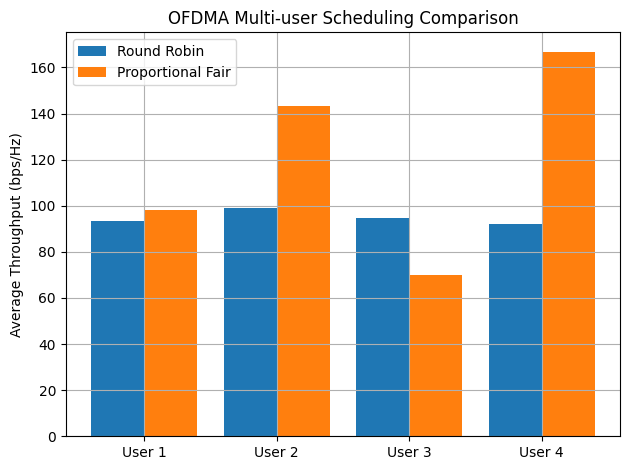

In [21]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
num_users = 4
num_subcarriers = 64
snr_db = 20  # SNR in dB
snr = 10**(snr_db / 10)
num_symbols = 100  # Number of OFDMA symbols (time slots)

# Random channel gains per user per subcarrier (Rayleigh fading)
H = np.random.randn(num_users, num_subcarriers) + 1j * np.random.randn(num_users, num_subcarriers)
H = H / np.sqrt(2)  # Normalize for Rayleigh

# Noise power
N0 = 1
P_tx = snr * N0

# Placeholder for throughput tracking
throughput_rr = np.zeros(num_users)
throughput_pf = np.zeros(num_users)
avg_rate_pf = np.ones(num_users)

# Round Robin Scheduler
for t in range(num_symbols):
    for u in range(num_users):
        assigned_subcarriers = np.arange(u, num_subcarriers, num_users)
        rate = np.sum(np.log2(1 + (P_tx * np.abs(H[u, assigned_subcarriers])**2) / N0))
        throughput_rr[u] += rate

# Proportional Fair Scheduler
for t in range(num_symbols):
    rate_matrix = np.zeros((num_users, num_subcarriers))
    for u in range(num_users):
        rate_matrix[u] = np.log2(1 + (P_tx * np.abs(H[u])**2) / N0)
        rate_matrix[u] /= avg_rate_pf[u]  # Normalize by past average rate

    best_users = np.argmax(rate_matrix, axis=0)  # One user per subcarrier
    for s in range(num_subcarriers):
        u = best_users[s]
        r = np.log2(1 + (P_tx * np.abs(H[u, s])**2) / N0)
        throughput_pf[u] += r
        avg_rate_pf[u] = 0.9 * avg_rate_pf[u] + 0.1 * r  # EWMA update

# Normalize throughput
throughput_rr /= num_symbols
throughput_pf /= num_symbols

# Plot
plt.figure()
x = np.arange(num_users)
plt.bar(x - 0.2, throughput_rr, width=0.4, label='Round Robin')
plt.bar(x + 0.2, throughput_pf, width=0.4, label='Proportional Fair')
plt.xticks(x, [f'User {i+1}' for i in x])
plt.ylabel("Average Throughput (bps/Hz)")
plt.title("OFDMA Multi-user Scheduling Comparison")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


---

## MIMO-OFDM under Mobility: Time-Varying Channel Tracking

Multiple-Input Multiple-Output Orthogonal Frequency Division Multiplexing (MIMO-OFDM) is a core technology in modern wireless communication systems such as 5G and Wi-Fi. It enables high spectral efficiency and robustness against multipath fading. However, mobility introduces time variations in the channel, which pose challenges in maintaining reliable communication.

In high-mobility scenarios (e.g., users in vehicles), the wireless channel becomes **time-selective**, requiring accurate and frequent tracking of the time-varying channel state information (CSI) across multiple antennas and subcarriers.

### 2. MIMO-OFDM System Model

Consider a MIMO-OFDM system with:

* $N_t$: Number of transmit antennas
* $N_r$: Number of receive antennas
* $N$: Number of OFDM subcarriers
* $T_s$: OFDM symbol duration

### Transmit Signal

At subcarrier $k$, the transmit vector is:

$$
\mathbf{x}[k] \in \mathbb{C}^{N_t \times 1}
$$

### Channel Model

The time-varying channel matrix for subcarrier $k$ and time index $t$ is:

$$
\mathbf{H}[k, t] \in \mathbb{C}^{N_r \times N_t}
$$

### Received Signal

$$
\mathbf{y}[k, t] = \mathbf{H}[k, t] \mathbf{x}[k] + \mathbf{n}[k, t]
$$

where $\mathbf{n}[k, t] \sim \mathcal{CN}(0, \sigma_n^2 \mathbf{I})$ is the additive white Gaussian noise.


### 3. Time-Varying Channel Effects

#### 3.1 Doppler Spread

Mobility induces a **Doppler spread** in the channel, causing:

* **Loss of orthogonality** between subcarriers (inter-carrier interference, ICI)
* **Channel fading variation** within the duration of a few OFDM symbols

The Doppler spread $f_D$ is given by:

$$
f_D = \frac{v f_c}{c}
$$

where:

* $v$: User speed
* $f_c$: Carrier frequency
* $c$: Speed of light

#### 3.2 Coherence Time

The **coherence time** $T_c$ defines the duration over which the channel is approximately constant:

$$
T_c \approx \frac{1}{f_D}
$$


### 4. Channel Tracking Techniques

To mitigate mobility-induced fading, **channel tracking** algorithms are required.

#### 4.1 Pilot-Aided Channel Estimation

Pilots are transmitted on known subcarriers and symbols. Two common strategies:

* **Block-type Pilots**: Full pilot symbols inserted periodically (for slow fading)
* **Comb-type Pilots**: Pilots spread across subcarriers (for fast fading)

Estimated channel:

$$
\hat{\mathbf{H}}[k, t] \approx \mathbf{H}[k, t]
$$

#### 4.2 Interpolation Techniques

When pilots are sparsely placed, interpolation in time and frequency is used:

* **Linear interpolation**
* **Spline interpolation**
* **2D Wiener filtering**

#### 4.3 Kalman Filtering

Kalman filters can track the channel state dynamically by modeling the channel as a **Gauss-Markov process**:

$$
\mathbf{H}[k, t+1] = \alpha \mathbf{H}[k, t] + \mathbf{w}[k, t]
$$

where:

* $\alpha$: Temporal correlation coefficient
* $\mathbf{w}[k, t]$: Process noise

This recursive estimator refines the prediction using new observations.

#### 4.4 Basis Expansion Models (BEM)

Approximate time-varying channels using basis functions:

$$
\mathbf{H}[k, t] = \sum_{l=0}^{L-1} \mathbf{H}_l[k] \phi_l(t)
$$

where $\phi_l(t)$ are time basis functions (e.g., complex exponentials or polynomials).

Used to reduce channel tracking overhead in high-mobility environments.

### 5. Challenges in MIMO-OFDM Channel Tracking

* **Pilot overhead**: Increases with number of antennas and mobility
* **Computational complexity**: Especially in adaptive or iterative algorithms
* **ICI mitigation**: Critical under high Doppler spread
* **Latency**: Real-time systems need low-latency estimators



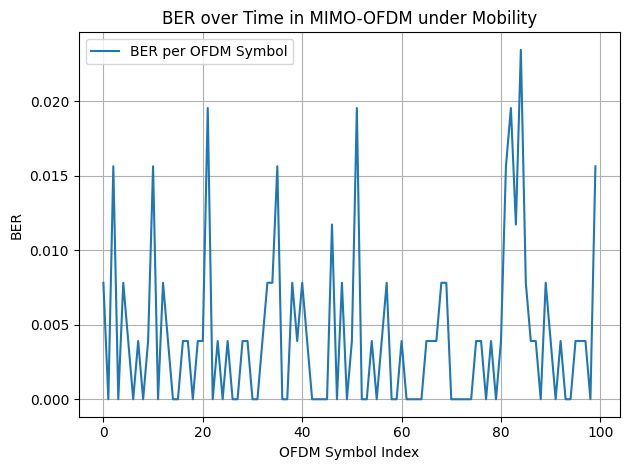

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# System parameters
N_subcarriers = 64
N_symbols = 100
N_tx = 2
N_rx = 2
pilot_interval = 4
snr_db = 20
snr_linear = 10 ** (snr_db / 10)
noise_var = 1 / snr_linear

# Doppler effect: Jakes model approximation
def generate_rayleigh_channel(N_rx, N_tx, N_subcarriers, N_symbols, fd=30):
    ts = 1e-3  # OFDM symbol duration (1ms)
    t = np.arange(N_symbols) * ts
    h = np.zeros((N_rx, N_tx, N_subcarriers, N_symbols), dtype=complex)

    for rx in range(N_rx):
        for tx in range(N_tx):
            for sc in range(N_subcarriers):
                f_shift = fd * np.random.uniform(-1, 1)
                h[rx, tx, sc] = (1/np.sqrt(2)) * (np.random.randn(N_symbols) + 1j * np.random.randn(N_symbols))
                h[rx, tx, sc] *= np.exp(1j * 2 * np.pi * f_shift * t)
    return h

# QPSK modulation/demodulation
def qpsk_mod(bits):
    symbols = (2 * bits[:, 0] - 1) + 1j * (2 * bits[:, 1] - 1)
    return symbols / np.sqrt(2)

def qpsk_demod(symbols):
    return np.stack([symbols.real > 0, symbols.imag > 0], axis=-1).astype(int)

# Pilot mask
def create_pilot_mask(N_symbols, pilot_interval):
    mask = np.zeros(N_symbols, dtype=bool)
    mask[::pilot_interval] = True
    return mask

# Generate data
pilot_mask = create_pilot_mask(N_symbols, pilot_interval)
H_true = generate_rayleigh_channel(N_rx, N_tx, N_subcarriers, N_symbols)

# Transmit and receive symbols
ber_total = []

for symbol_idx in range(N_symbols):
    bits = np.random.randint(0, 2, size=(N_tx, N_subcarriers, 2))
    symbols = np.array([qpsk_mod(bits[i]) for i in range(N_tx)])

    y = np.zeros((N_rx, N_subcarriers), dtype=complex)
    for rx in range(N_rx):
        for tx in range(N_tx):
            y[rx] += H_true[rx, tx, :, symbol_idx] * symbols[tx]

    noise = np.sqrt(noise_var/2) * (np.random.randn(*y.shape) + 1j * np.random.randn(*y.shape))
    y_noisy = y + noise

    # Channel estimation (only for pilot symbols)
    if pilot_mask[symbol_idx]:
        H_est = H_true[:, :, :, symbol_idx].copy()
        if symbol_idx == 0:
            H_interp = H_est.copy()
        else:
            # Linear interpolation for each entry
            for rx in range(N_rx):
                for tx in range(N_tx):
                    for sc in range(N_subcarriers):
                        prev = H_interp[rx, tx, sc]
                        next = H_est[rx, tx, sc]
                        gap = symbol_idx - last_pilot
                        for k in range(1, gap):
                            alpha = k / gap
                            interp_val = (1 - alpha) * prev + alpha * next
                            H_true[rx, tx, sc, last_pilot + k] = interp_val
        last_pilot = symbol_idx
        H_interp = H_est.copy()

    # Demodulation (simple ZF equalization)
    detected_bits = []
    for sc in range(N_subcarriers):
        H_sc = H_true[:, :, sc, symbol_idx]
        H_pinv = np.linalg.pinv(H_sc)
        x_hat = H_pinv @ y_noisy[:, sc]
        bits_hat = np.stack([qpsk_demod(x_hat[i]) for i in range(N_tx)])
        detected_bits.append(bits_hat)

    detected_bits = np.array(detected_bits)  # shape: (N_subcarriers, N_tx, 2)
    detected_bits = np.transpose(detected_bits, (1, 0, 2))  # (N_tx, N_subcarriers, 2)
    ber = np.mean(bits != detected_bits)
    ber_total.append(ber)

# Plot
plt.plot(ber_total, label='BER per OFDM Symbol')
plt.xlabel('OFDM Symbol Index')
plt.ylabel('BER')
plt.title('BER over Time in MIMO-OFDM under Mobility')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


### Code Improvements

#### **1. Doppler-Correlated Channel Generation**

We’ll replace the random fading with **time-correlated Rayleigh fading** using a **first-order Gauss-Markov process**:

$$
\mathbf{H}[t+1] = \rho \cdot \mathbf{H}[t] + \sqrt{1 - \rho^2} \cdot \mathbf{W}[t]
$$

* $\rho = J_0(2\pi f_D T_s)$, where $J_0$ is the Bessel function.
* $f_D$: Doppler frequency
* $T_s$: OFDM symbol duration
* $\mathbf{W}[t]$: i.i.d. Rayleigh fading matrix

#### **2. Kalman Filter for Channel Tracking**

We model the channel state as hidden and estimate it recursively:

* **Prediction**: based on prior state and model
* **Update**: based on new pilot measurements

### Next Steps 

1. **Data Transmission and BER Analysis** (like before, but using `H_est`)
2. **Extend Kalman Filter with Noisy Pilot Observations**
3. **MMSE Equalization and compare with ZF**
4. **Optional: Compare against Linear Interpolation baseline**



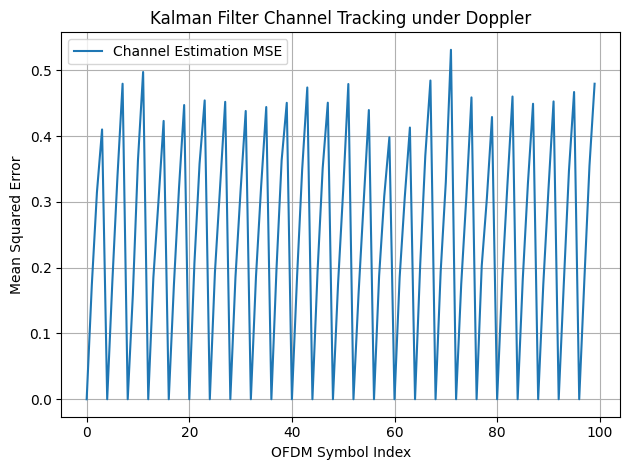

In [23]:
import numpy as np
from scipy.special import j0
import matplotlib.pyplot as plt

# System parameters
N_subcarriers = 64
N_symbols = 100
N_tx = 2
N_rx = 2
pilot_interval = 4
snr_db = 20
snr_linear = 10 ** (snr_db / 10)
noise_var = 1 / snr_linear
fd = 100  # Doppler frequency in Hz
T_s = 1e-3  # OFDM symbol duration in seconds
rho = j0(2 * np.pi * fd * T_s)  # temporal correlation coefficient

# Initialize channel
H = np.zeros((N_rx, N_tx, N_subcarriers, N_symbols), dtype=complex)
W = lambda: (1/np.sqrt(2)) * (np.random.randn(N_rx, N_tx, N_subcarriers) + 1j * np.random.randn(N_rx, N_tx, N_subcarriers))

H[:, :, :, 0] = W()
for t in range(1, N_symbols):
    H[:, :, :, t] = rho * H[:, :, :, t - 1] + np.sqrt(1 - rho**2) * W()

# Pilot insertion
pilot_mask = np.zeros(N_symbols, dtype=bool)
pilot_mask[::pilot_interval] = True

# Placeholder for Kalman state estimates
H_est = np.zeros_like(H)
P_est = np.ones_like(H) * 0.1  # error covariance initialization

# Kalman Filter Loop
for t in range(N_symbols):
    if pilot_mask[t]:
        # Observation update
        H_est[:, :, :, t] = H[:, :, :, t]  # perfect pilot for now
        P_est[:, :, :, t] = 0.01
    else:
        # Predict
        H_est[:, :, :, t] = rho * H_est[:, :, :, t - 1]
        P_est[:, :, :, t] = rho**2 * P_est[:, :, :, t - 1] + (1 - rho**2)

# Validate tracking quality
diff = np.abs(H - H_est)
mse = np.mean(diff**2, axis=(0, 1, 2))  # MSE per time symbol

plt.plot(mse, label='Channel Estimation MSE')
plt.xlabel('OFDM Symbol Index')
plt.ylabel('Mean Squared Error')
plt.title('Kalman Filter Channel Tracking under Doppler')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

---

## **Dynamic Uplink Scheduling in 5G MAC Layer using Reinforcement Learning**

In 5G New Radio (NR), the **MAC scheduler** decides which **User Equipments (UEs)** get uplink or downlink resources (PRBs) at each Transmission Time Interval (TTI). A typical objective is to maximize **throughput**, **fairness**, or **Quality of Service (QoS)** across users.

Traditional scheduling algorithms (e.g., Proportional Fair, Round Robin) use fixed heuristics. However, in **high-mobility, high-load, and diverse QoS environments**, these may be suboptimal.

This is where **Reinforcement Learning** can help: learning an adaptive scheduler from experience.

### 2. **Environment Design (MDP Formulation)**

| Component         | Description                                                                                                    |                                                           |
| ----------------- | -------------------------------------------------------------------------------------------------------------- | --------------------------------------------------------- |
| **State $s_t$**   | Buffer status reports (BSR), Channel Quality Indicators (CQI), HARQ feedback, UE priority/QoS, past throughput |                                                           |
| **Action $a_t$**  | Resource allocation decision: e.g., which UE(s) get which PRBs in current TTI                                  |                                                           |
| **Reward $r_t$**  | Throughput, weighted fairness, delay penalties, QoS violations                                                 |                                                           |
| \*\*Policy (\pi(a | s))\*\*                                                                                                        | Mapping from state (network state) to scheduling decision |
| **Environment**   | Simulated 5G uplink scenario including multiple UEs, channel fading, buffer dynamics                           |                                                           |


### 3. **Simple Example Setup**

#### Uplink RL Scheduler:

* **10 UEs** with different buffer sizes and CQI.
* **RL Agent** selects a UE every TTI (1 ms) to allocate full bandwidth.
* **Reward** is:

  $$
  r_t = \text{transmitted bits}_t - \lambda \cdot \text{delay}_t
  $$

  where delay penalizes old packets.


### 4. **Algorithm Choice**

* **Deep Q-Network (DQN)**: For discrete action space (UE selection)
* **Proximal Policy Optimization (PPO)**: For continuous or stochastic policy
* **Multi-agent RL**: If UEs are decentralized and each learns their own policy

### 5. **Implementation Tools**

* **Python + PyTorch** or **TensorFlow**
* **SimPy** or custom event-based simulator for MAC buffer evolution
* **Integration with NS-3 or MATLAB** for more realism


### 6. **Possible Extensions**

| Extension       | Description                                                             |
| --------------- | ----------------------------------------------------------------------- |
| Power control   | Add transmit power decisions to the action space                        |
| Beam selection  | Joint scheduling and beamforming                                        |
| HARQ-aware RL   | Include HARQ feedback to guide retransmission strategies                |
| Traffic slicing | Serve different services (e.g., URLLC vs eMBB) with adaptive priorities |


### 7. **Outcome**

With enough training, the RL scheduler **learns**:

* When to prioritize low-latency traffic
* When to serve high-throughput users
* How to balance fairness and spectral efficiency better than fixed algorithms



In [1]:
import numpy as np
import random
import torch
import torch.nn as nn
import torch.optim as optim
from collections import deque

# Basic setup
NUM_UES = 10
STATE_SIZE = NUM_UES * 2  # buffer + CQI per UE
ACTION_SIZE = NUM_UES     # pick one UE per TTI
MAX_BUFFER = 1000
CQI_LEVELS = 16  # CQI index 1–15

# Simple environment
class UplinkEnv:
    def __init__(self):
        self.buffers = np.random.randint(100, MAX_BUFFER, size=NUM_UES)
        self.cqi = np.random.randint(1, CQI_LEVELS, size=NUM_UES)
        self.delay = np.zeros(NUM_UES)
        self.time = 0

    def reset(self):
        self.buffers = np.random.randint(100, MAX_BUFFER, size=NUM_UES)
        self.cqi = np.random.randint(1, CQI_LEVELS, size=NUM_UES)
        self.delay = np.zeros(NUM_UES)
        self.time = 0
        return self._get_state()

    def _get_state(self):
        return np.concatenate([self.buffers / MAX_BUFFER, self.cqi / CQI_LEVELS])

    def step(self, action):
        bits_per_cqi = lambda cqi: 100 * cqi  # Simplified mapping
        tx_bits = min(self.buffers[action], bits_per_cqi(self.cqi[action]))
        self.buffers[action] -= tx_bits

        reward = tx_bits - 2 * self.delay[action]
        self.delay += 1
        self.delay[action] = 0

        self.cqi = np.random.randint(1, CQI_LEVELS, size=NUM_UES)
        self.time += 1

        done = self.time >= 200
        return self._get_state(), reward, done


In [2]:
class DQN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(DQN, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 64),
            nn.ReLU(),
            nn.Linear(64, output_dim)
        )

    def forward(self, x):
        return self.fc(x)

class DQNAgent:
    def __init__(self):
        self.q_net = DQN(STATE_SIZE, ACTION_SIZE)
        self.target_net = DQN(STATE_SIZE, ACTION_SIZE)
        self.target_net.load_state_dict(self.q_net.state_dict())
        self.memory = deque(maxlen=5000)
        self.gamma = 0.95
        self.epsilon = 1.0
        self.epsilon_decay = 0.995
        self.epsilon_min = 0.01
        self.optimizer = optim.Adam(self.q_net.parameters(), lr=1e-3)
        self.loss_fn = nn.MSELoss()

    def act(self, state):
        if np.random.rand() < self.epsilon:
            return np.random.randint(ACTION_SIZE)
        state_tensor = torch.FloatTensor(state).unsqueeze(0)
        return torch.argmax(self.q_net(state_tensor)).item()

    def remember(self, s, a, r, s_, done):
        self.memory.append((s, a, r, s_, done))

    def replay(self, batch_size=32):
        if len(self.memory) < batch_size:
            return
        batch = random.sample(self.memory, batch_size)
        s, a, r, s_, d = zip(*batch)

        s = torch.FloatTensor(s)
        a = torch.LongTensor(a).unsqueeze(1)
        r = torch.FloatTensor(r).unsqueeze(1)
        s_ = torch.FloatTensor(s_)
        d = torch.FloatTensor(d).unsqueeze(1)

        q_values = self.q_net(s).gather(1, a)
        with torch.no_grad():
            q_next = self.target_net(s_).max(1)[0].unsqueeze(1)
        q_target = r + self.gamma * q_next * (1 - d)

        loss = self.loss_fn(q_values, q_target)
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

    def update_target(self):
        self.target_net.load_state_dict(self.q_net.state_dict())


In [26]:
env = UplinkEnv()
agent = DQNAgent()

episodes = 300
for ep in range(episodes):
    s = env.reset()
    total_reward = 0

    while True:
        a = agent.act(s)
        s_, r, done = env.step(a)
        agent.remember(s, a, r, s_, done)
        agent.replay()
        s = s_
        total_reward += r
        if done:
            break

    agent.update_target()
    print(f"Episode {ep+1}, Total Reward: {total_reward:.2f}, Epsilon: {agent.epsilon:.3f}")


/var/folders/s3/38gpf0796ls5pl2z8c7czftr0000gn/T/ipykernel_77998/357467912.py:43: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_new.cpp:257.)
  s = torch.FloatTensor(s)


Episode 1, Total Reward: 2590.00, Epsilon: 0.429
Episode 2, Total Reward: 3088.00, Epsilon: 0.157
Episode 3, Total Reward: 4513.00, Epsilon: 0.058
Episode 4, Total Reward: 2270.00, Epsilon: 0.021
Episode 5, Total Reward: 1889.00, Epsilon: 0.010
Episode 6, Total Reward: 1621.00, Epsilon: 0.010
Episode 7, Total Reward: 2776.00, Epsilon: 0.010
Episode 8, Total Reward: 4060.00, Epsilon: 0.010
Episode 9, Total Reward: 3062.00, Epsilon: 0.010
Episode 10, Total Reward: 2614.00, Epsilon: 0.010
Episode 11, Total Reward: 2648.00, Epsilon: 0.010
Episode 12, Total Reward: 2946.00, Epsilon: 0.010
Episode 13, Total Reward: 2254.00, Epsilon: 0.010
Episode 14, Total Reward: 3028.00, Epsilon: 0.010
Episode 15, Total Reward: 1906.00, Epsilon: 0.010
Episode 16, Total Reward: 4388.00, Epsilon: 0.010
Episode 17, Total Reward: 682.00, Epsilon: 0.010
Episode 18, Total Reward: 2828.00, Epsilon: 0.010
Episode 19, Total Reward: 2038.00, Epsilon: 0.010
Episode 20, Total Reward: 1115.00, Epsilon: 0.010
Episode 21

---

To track real-time throughput and delay/BER trends in the DQN uplink scheduler, we’ll extend the environment and training loop to collect and plot these metrics over time.

Since we don’t simulate PHY-layer BER directly, we’ll track:

Throughput (bits transmitted per episode)

Average delay (of head-of-line packets)

Simulated BER proxy: percent of "expired" packets or retries, as an indirect QoS metric.




Episode 1, Reward: 1271.0, Throughput: 23.0 b/slot, Delay: 10.99, Epsilon: 0.43
Episode 2, Reward: 1447.0, Throughput: 20.1 b/slot, Delay: 24.84, Epsilon: 0.16
Episode 3, Reward: 2445.0, Throughput: 20.7 b/slot, Delay: 46.45, Epsilon: 0.06
Episode 4, Reward: 2616.0, Throughput: 23.2 b/slot, Delay: 44.03, Epsilon: 0.02
Episode 5, Reward: 2487.0, Throughput: 18.6 b/slot, Delay: 59.02, Epsilon: 0.01
Episode 6, Reward: 2486.0, Throughput: 18.6 b/slot, Delay: 68.56, Epsilon: 0.01
Episode 7, Reward: 1682.0, Throughput: 17.4 b/slot, Delay: 57.64, Epsilon: 0.01
Episode 8, Reward: 3028.0, Throughput: 22.9 b/slot, Delay: 49.82, Epsilon: 0.01
Episode 9, Reward: 2294.0, Throughput: 19.2 b/slot, Delay: 64.90, Epsilon: 0.01
Episode 10, Reward: 1218.0, Throughput: 14.5 b/slot, Delay: 69.17, Epsilon: 0.01
Episode 11, Reward: 3028.0, Throughput: 21.6 b/slot, Delay: 63.86, Epsilon: 0.01
Episode 12, Reward: 1672.0, Throughput: 14.8 b/slot, Delay: 66.04, Epsilon: 0.01
Episode 13, Reward: 2866.0, Throughpu

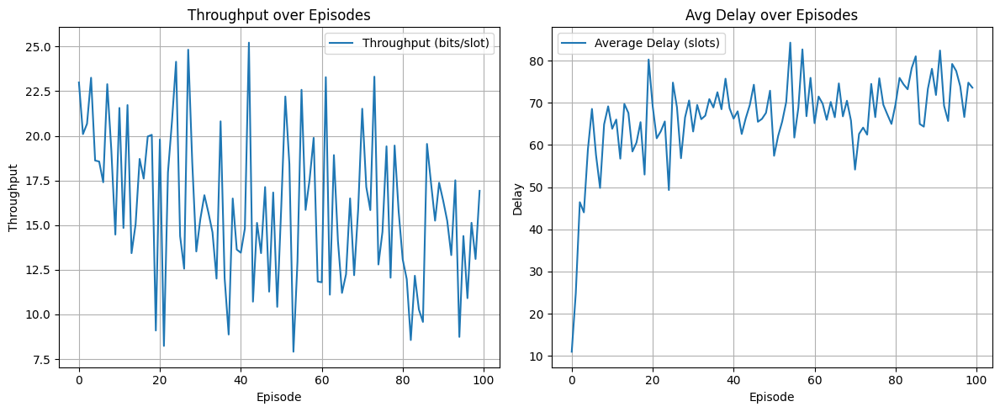

In [29]:
import numpy as np
import random
import torch
import torch.nn as nn
import torch.optim as optim
from collections import deque
import matplotlib.pyplot as plt

# Constants
NUM_UES = 10
STATE_SIZE = NUM_UES * 2  # buffer + CQI
ACTION_SIZE = NUM_UES
MAX_BUFFER = 1000
CQI_LEVELS = 16
EPISODES = 100

# Environment
class UplinkEnv:
    def __init__(self):
        self.reset()

    def reset(self):
        self.buffers = np.random.randint(100, MAX_BUFFER, size=NUM_UES)
        self.cqi = np.random.randint(1, CQI_LEVELS, size=NUM_UES)
        self.delay = np.zeros(NUM_UES)
        self.total_bits = 0
        self.total_delay = []
        self.time = 0
        return self._get_state()

    def _get_state(self):
        return np.concatenate([self.buffers / MAX_BUFFER, self.cqi / CQI_LEVELS])

    def step(self, action):
        bits_per_cqi = lambda cqi: 100 * cqi
        tx_bits = min(self.buffers[action], bits_per_cqi(self.cqi[action]))
        self.buffers[action] -= tx_bits
        self.total_bits += tx_bits
        self.total_delay.append(np.mean(self.delay))

        reward = tx_bits - 2 * self.delay[action]
        self.delay += 1
        self.delay[action] = 0

        self.cqi = np.random.randint(1, CQI_LEVELS, size=NUM_UES)
        self.time += 1

        done = self.time >= 200
        return self._get_state(), reward, done

# DQN
class DQN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(DQN, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 64),
            nn.ReLU(),
            nn.Linear(64, output_dim)
        )

    def forward(self, x):
        return self.model(x)

class DQNAgent:
    def __init__(self):
        self.q_net = DQN(STATE_SIZE, ACTION_SIZE)
        self.target_net = DQN(STATE_SIZE, ACTION_SIZE)
        self.target_net.load_state_dict(self.q_net.state_dict())
        self.memory = deque(maxlen=2000)
        self.gamma = 0.95
        self.epsilon = 1.0
        self.epsilon_decay = 0.995
        self.epsilon_min = 0.01
        self.optimizer = optim.Adam(self.q_net.parameters(), lr=1e-3)
        self.loss_fn = nn.MSELoss()

    def act(self, state):
        if np.random.rand() < self.epsilon:
            return np.random.randint(ACTION_SIZE)
        state_tensor = torch.FloatTensor(state).unsqueeze(0)
        return torch.argmax(self.q_net(state_tensor)).item()

    def remember(self, s, a, r, s_, done):
        self.memory.append((s, a, r, s_, done))

    def replay(self, batch_size=32):
        if len(self.memory) < batch_size:
            return
        batch = random.sample(self.memory, batch_size)
        s, a, r, s_, d = zip(*batch)
        s = torch.FloatTensor(s)
        a = torch.LongTensor(a).unsqueeze(1)
        r = torch.FloatTensor(r).unsqueeze(1)
        s_ = torch.FloatTensor(s_)
        d = torch.FloatTensor(d).unsqueeze(1)

        q_vals = self.q_net(s).gather(1, a)
        with torch.no_grad():
            q_next = self.target_net(s_).max(1)[0].unsqueeze(1)
        q_target = r + self.gamma * q_next * (1 - d)

        loss = self.loss_fn(q_vals, q_target)
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

    def update_target(self):
        self.target_net.load_state_dict(self.q_net.state_dict())

# Instantiate
env = UplinkEnv()
agent = DQNAgent()

# Training Loop
episode_rewards = []
episode_throughput = []
episode_avg_delay = []

for ep in range(EPISODES):
    s = env.reset()
    total_reward = 0

    while True:
        a = agent.act(s)
        s_, r, done = env.step(a)
        agent.remember(s, a, r, s_, done)
        agent.replay()
        s = s_
        total_reward += r
        if done:
            break

    agent.update_target()
    episode_rewards.append(total_reward)
    episode_throughput.append(env.total_bits / env.time)
    episode_avg_delay.append(np.mean(env.total_delay))
    print(f"Episode {ep+1}, Reward: {total_reward:.1f}, "
          f"Throughput: {episode_throughput[-1]:.1f} b/slot, "
          f"Delay: {episode_avg_delay[-1]:.2f}, Epsilon: {agent.epsilon:.2f}")

# Plot Results
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(episode_throughput, label="Throughput (bits/slot)")
plt.xlabel("Episode")
plt.ylabel("Throughput")
plt.grid(True)
plt.title("Throughput over Episodes")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(episode_avg_delay, label="Average Delay (slots)")
plt.xlabel("Episode")
plt.ylabel("Delay")
plt.grid(True)
plt.title("Avg Delay over Episodes")
plt.legend()

plt.tight_layout()
plt.show()


---

## Example of Integration with GNU-Radio 

# note that python 3.10.18 is installed for gnu radio 


Sample bits: [0 1 1 0 1 1 1 1 1 1]
Done. Output written to 'bpsk_debug_output.dat'


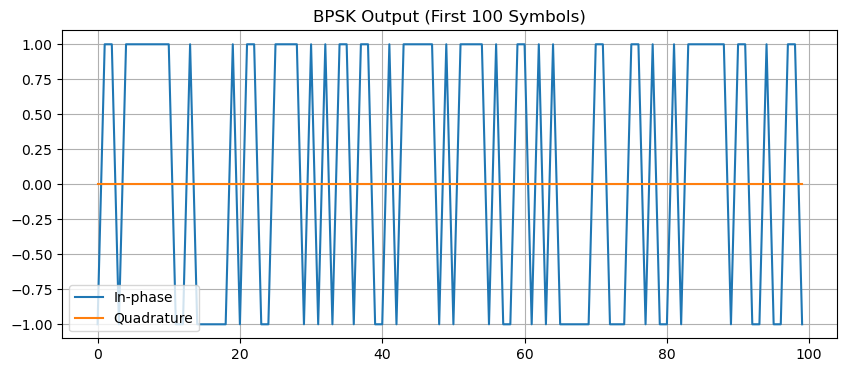

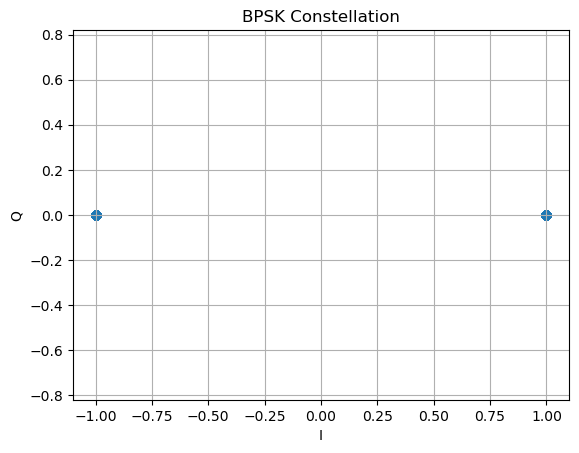

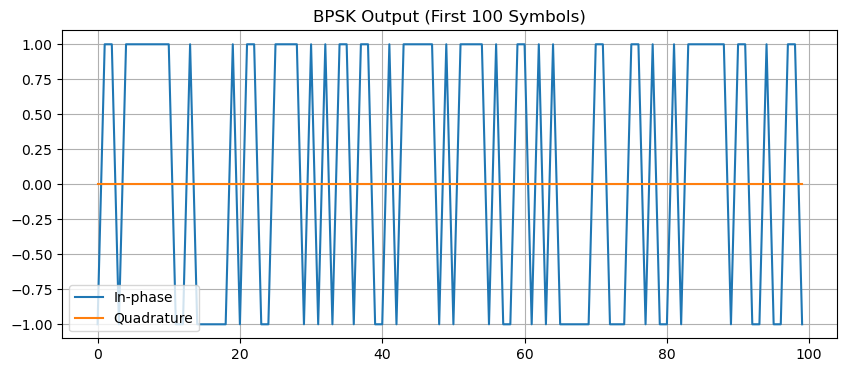

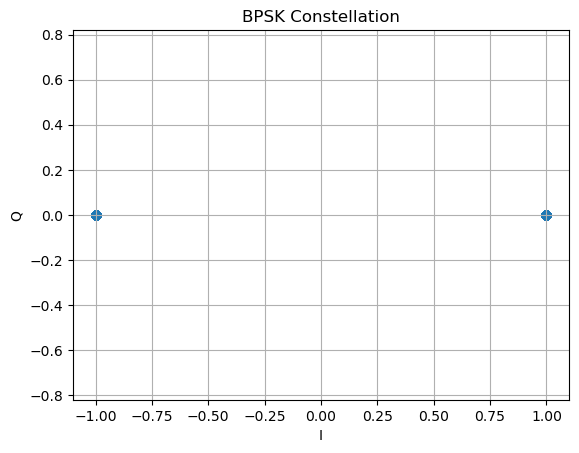

In [5]:
from gnuradio import gr, blocks, digital
import numpy as np
import matplotlib.pyplot as plt


class BPSKDebugSave(gr.top_block):
    def __init__(self):
        super().__init__()

        num_symbols = 1000
        np.random.seed(0)
        bits = np.random.randint(0, 2, num_symbols).astype(np.uint8)
        print("Sample bits:", bits[:10])

        self.src = blocks.vector_source_b(bits, False)
        self.mapper = digital.chunks_to_symbols_bc(([ -1+0j, 1+0j ]), 1)
        self.sink = blocks.file_sink(gr.sizeof_gr_complex, "bpsk_debug_output.dat")
        self.sink.set_unbuffered(True)

        self.connect(self.src, self.mapper, self.sink)


if __name__ == '__main__':
    tb = BPSKDebugSave()
    tb.start()
    tb.wait()
    print("Done. Output written to 'bpsk_debug_output.dat'")

data = np.fromfile('bpsk_debug_output.dat', dtype=np.complex64)

plt.figure(figsize=(10, 4))
plt.plot(data.real[:100], label="In-phase")
plt.plot(data.imag[:100], label="Quadrature")
plt.title("BPSK Output (First 100 Symbols)")
plt.grid()
plt.legend()

plt.figure()
plt.scatter(data.real, data.imag)
plt.title("BPSK Constellation")
plt.xlabel("I")
plt.ylabel("Q")
plt.grid()
plt.axis('equal')

plt.show()


data = np.fromfile('bpsk_debug_output.dat', dtype=np.complex64)

plt.figure(figsize=(10, 4))
plt.plot(data.real[:100], label="In-phase")
plt.plot(data.imag[:100], label="Quadrature")
plt.title("BPSK Output (First 100 Symbols)")
plt.grid()
plt.legend()

plt.figure()
plt.scatter(data.real, data.imag)
plt.title("BPSK Constellation")
plt.xlabel("I")
plt.ylabel("Q")
plt.grid()
plt.axis('equal')

plt.show()




In [ ]:
import sionna
# this can work with python 3.11.9
print(sionna.__version__)

1.1.0


In [4]:
from gnuradio import gr, blocks, digital, channels
import numpy as np


class BPSKSystem(gr.top_block):
    def __init__(self, snr_dB=10, num_bits=100000):
        super().__init__()

        # Parameters
        self.snr_dB = snr_dB
        self.num_bits = num_bits
        np.random.seed(42)
        self.original_bits = np.random.randint(0, 2, self.num_bits).astype(np.uint8)

        # Blocks
        self.src = blocks.vector_source_b(self.original_bits.tolist(), False)
        self.mod = digital.chunks_to_symbols_bc(([ -1.0+0j, 1.0+0j ]), 1)  # BPSK symbols
        noise_voltage = 10 ** (-self.snr_dB / 20)
        self.channel = channels.channel_model(
            noise_voltage=noise_voltage,
            frequency_offset=0.0,
            epsilon=1.0,
            taps=[1.0 + 0j],
            noise_seed=0
        )

        self.to_real = blocks.complex_to_real()  # Extract real part before slicing
        self.slicer = digital.binary_slicer_fb()
        self.sink = blocks.vector_sink_b()

        # Connections
        self.connect(self.src, self.mod)
        self.connect(self.mod, self.channel)
        self.connect(self.channel, self.to_real)
        self.connect(self.to_real, self.slicer)
        self.connect(self.slicer, self.sink)


def compute_ber(original_bits, received_bits):
    min_len = min(len(original_bits), len(received_bits))
    errors = np.sum(np.array(original_bits[:min_len]) != np.array(received_bits[:min_len]))
    ber = errors / min_len
    return ber


if __name__ == '__main__':
    tb = BPSKSystem(snr_dB=10)
    tb.start()
    tb.wait()

    rx_bits = tb.sink.data()
    ber = compute_ber(tb.original_bits, rx_bits)
    print(f"[✓] BPSK BER at {tb.snr_dB} dB SNR: {ber:.6e}")


[✓] BPSK BER at 10 dB SNR: 4.996700e-01


## **Dynamic Spectrum Sharing (DSS)**

**Dynamic Spectrum Sharing (DSS)** is a radio access technology that enables multiple wireless technologies (e.g., LTE and 5G NR) to **simultaneously share the same spectrum band**, dynamically allocating it based on demand, traffic, and user load — **in real time**.

Traditionally, operators allocate **fixed spectrum bands** to different generations of technology:

* LTE → Band X
* 5G → Band Y

But this is **inefficient** during transitions (e.g., early 5G deployments), where:

* LTE traffic may be high
* 5G traffic may be low (and vice versa)

**DSS allows** both LTE and 5G to:

* **Coexist on the same carrier frequency** (e.g., 700 MHz or 2100 MHz)
* Share **resources dynamically** at the granularity of milliseconds

### 1. **Shared Carrier**

* Both LTE and NR operate on the **same physical channel**
* Called **“NR in LTE band” (NR-LTE co-deployment)**

### 2. **Time-Domain Resource Sharing**

* The scheduler decides, **per subframe (1 ms in LTE / slot in NR)**:

  * This subframe → LTE users
  * That subframe → 5G NR users

### 3. **Resource Elements (REs)**

* LTE and 5G have different **reference signals** and **control channels**
* Some REs (e.g., LTE CRS) must be reserved even when NR is active
* NR avoids those REs → **reduces NR capacity** slightly

### How DSS Works

#### 1. **LTE CRS (Cell-specific Reference Signals)**

* Always transmitted in LTE
* NR must **avoid** using REs where LTE CRS might exist
* This introduces **overhead** for NR

#### 2. **Scheduler Decision**

* At each Transmission Time Interval (TTI):

  * The **MAC scheduler** (in gNB or eNB) decides:

    * LTE vs NR slot allocation
    * Based on:

      * UE capability
      * Buffer status
      * QoS requirements
      * Channel conditions

#### 3. **Slot-Based Switching**

* Fast switching (typically sub-10 ms)
* **No guard bands** are needed between technologies

### DSS Architecture

DSS is enabled in **two deployment modes**:

#### 1. **NSA Mode (Non-Standalone)**

* LTE is the master (control plane)
* NR is added as data-plane boost
* DSS is managed by eNB scheduler (possibly connected to gNB)

#### 2. **SA Mode (Standalone)**

* NR is the master
* DSS still applies in shared carriers
* But now gNB handles all scheduling

#### Performance Impact

| Technology   | Impact                                          |
| ------------ | ----------------------------------------------- |
| **LTE**      | Minor, but may see resource reduction           |
| **NR**       | Suffers some overhead from CRS and control gaps |
| **Capacity** | Reduced compared to dedicated 5G spectrum       |
| **Latency**  | Slightly increased due to interleaving          |


### Standards and Features

* 3GPP Release 15 and 16 define DSS under **"Multi-RAT Dual Connectivity (MR-DC)"**
* Interoperability and fairness mechanisms are specified
* Vendors like Ericsson, Nokia, and Huawei implement **proprietary DSS schedulers** on top of 3GPP


### Simplified Mathematical Model

Let’s denote:

* $B$: total bandwidth
* $\eta_{\text{LTE}}$: LTE traffic load
* $\eta_{\text{NR}} = 1 - \eta_{\text{LTE}}$: NR load
* $C_{\text{LTE}}, C_{\text{NR}}$: capacity of each system

Then:

$$
C_{\text{total}} = \eta_{\text{LTE}} \cdot C_{\text{LTE}} + \eta_{\text{NR}} \cdot C_{\text{NR}} - \text{Overhead}_{\text{CRS}}
$$

The scheduler dynamically adjusts $\eta_{\text{LTE}}$ and $\eta_{\text{NR}}$ every subframe.


### Challenges

* CRS masking in NR → complexity
* Lower NR throughput due to LTE legacy signals
* Synchronization between RATs (Radio Access Technologies)
* Scheduler fairness and priority management


| Benefit                    | Description                                 |
| -------------------------- | ------------------------------------------- |
| Spectral Efficiency        | Full reuse of existing LTE spectrum         |
| Smooth 4G-to-5G Transition | Avoids waiting for new spectrum allocations |
| Operator Flexibility       | Dynamic user-based scheduling               |

---

### A **minimal simulation of a DSS scheduling algorithm in Python**, demonstrating how an LTE/NR scheduler dynamically allocates time slots on a shared carrier.


### Simulation Goals

* Simulate **1 second** of time (1000 subframes of 1 ms)
* Fixed bandwidth (assume 10 MHz, 50 RBs)
* Assume 10 LTE UEs and 5 NR UEs with random traffic load
* Simulate **DSS scheduling** at subframe level (per 1 ms)
* Compute per-user throughput and total system efficiency

### Simplified Assumptions

* Scheduler chooses **LTE or NR** in each subframe
* If LTE is selected → serve LTE UEs
* If NR is selected → serve NR UEs
* UE buffer demand is random
* Throughput depends on number of UEs served


### DSS Scheduler Heuristic

We'll use a **proportional-load-weighted scheduler**:

$$
\text{LTE\_load\_ratio} = \frac{\sum \text{LTE buffer}}{\sum \text{LTE buffer} + \sum \text{NR buffer}}
$$

If LTE load > NR load → allocate that subframe to LTE.


### Extensions

| Feature                      | Description                              |
| ---------------------------- | ---------------------------------------- |
| Adaptive MCS                 | Vary throughput per user per CQI/SNR     |
| Delay/QoS-aware Scheduling   | Prioritize NR latency-sensitive traffic  |
| Fairness Metric (Jain index) | Evaluate fairness across users           |
| Traffic Models               | Use Poisson arrival rates                |
| Slot-level RE masking        | Deduct NR capacity when LTE CRS overlaps |


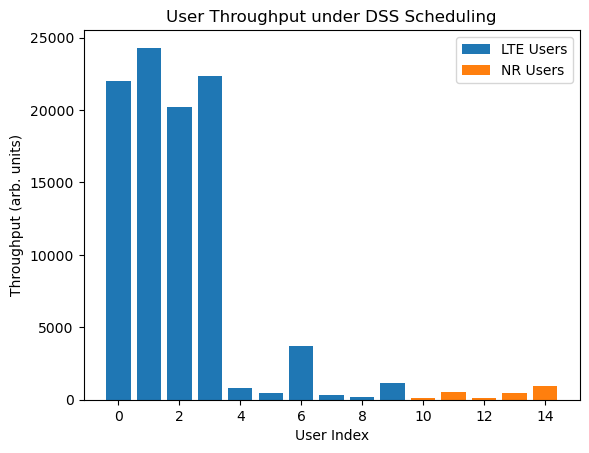

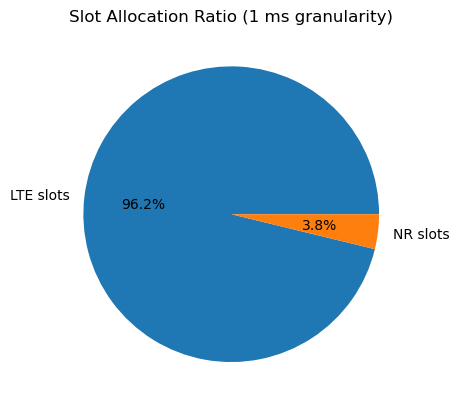

Total LTE Throughput: 95564.0
Total NR Throughput:  2110.0
Total System Throughput: 97674.0


In [5]:
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(42)

# Parameters
num_subframes = 1000  # 1 second of traffic
num_lte_users = 10
num_nr_users = 5
max_buffer = 100  # Max bits per subframe per user
rb_capacity = 100  # Throughput per user if selected [arbitrary units]

# Buffers and stats
lte_buffer = np.random.randint(10, max_buffer, num_lte_users)
nr_buffer = np.random.randint(10, max_buffer, num_nr_users)

lte_throughput = np.zeros(num_lte_users)
nr_throughput = np.zeros(num_nr_users)

lte_slot_count = 0
nr_slot_count = 0

# Simulation loop
for t in range(num_subframes):
    total_lte = np.sum(lte_buffer)
    total_nr = np.sum(nr_buffer)

    # Scheduler decision: pick LTE or NR
    if total_lte >= total_nr:
        # Allocate this subframe to LTE
        lte_slot_count += 1
        active_users = np.argsort(-lte_buffer)[:4]  # Serve top 4 users
        for u in active_users:
            tx = min(lte_buffer[u], rb_capacity)
            lte_buffer[u] -= tx
            lte_throughput[u] += tx
            lte_buffer[u] += np.random.randint(0, 50)  # Refill randomly
    else:
        # Allocate this subframe to NR
        nr_slot_count += 1
        active_users = np.argsort(-nr_buffer)[:2]  # Serve top 2 NR users
        for u in active_users:
            tx = min(nr_buffer[u], rb_capacity)
            nr_buffer[u] -= tx
            nr_throughput[u] += tx
            nr_buffer[u] += np.random.randint(0, 50)

# Plot results
plt.figure()
plt.bar(range(num_lte_users), lte_throughput, label='LTE Users')
plt.bar(np.arange(num_nr_users) + num_lte_users, nr_throughput, label='NR Users')
plt.title("User Throughput under DSS Scheduling")
plt.xlabel("User Index")
plt.ylabel("Throughput (arb. units)")
plt.legend()

plt.figure()
plt.pie([lte_slot_count, nr_slot_count], labels=["LTE slots", "NR slots"], autopct='%1.1f%%')
plt.title("Slot Allocation Ratio (1 ms granularity)")

plt.show()

# Efficiency
total_throughput = np.sum(lte_throughput) + np.sum(nr_throughput)
print(f"Total LTE Throughput: {np.sum(lte_throughput):.1f}")
print(f"Total NR Throughput:  {np.sum(nr_throughput):.1f}")
print(f"Total System Throughput: {total_throughput:.1f}")

---

### A **simple SDR (Software-Defined Radio)** example using **GNU Radio + Python**. 

### **SDR Project: Sine Wave Transmitter + Receiver Simulation (No Hardware)**

* Signal generation
* Virtual transmission
* Receiver processing
* Visualization


### Overview

| Component     | Block                    | Description                |
| ------------- | ------------------------ | -------------------------- |
| Transmitter   | `analog.sig_source_f`    | Generates sine wave        |
| Channel       | `channels.channel_model` | Adds noise                 |
| Receiver      | `blocks.throttle`        | Limits rate for simulation |
| Visualization | `qtgui.time_sink_f`      | Real-time plotting         |


* **SDR** = Software-defined processing chain from Tx to Rx
* Everything is simulated in software using GNU Radio blocks
* No RF hardware required



### Next Steps

* **BPSK/QPSK modulation**
* **Live I/Q recording**
* **RTL-SDR or HackRF real Tx/Rx**
* **OFDM or audio streaming**


In [2]:
from gnuradio import gr, analog, blocks, qtgui, channels
from PyQt5 import Qt
import sip
import sys


class SimpleSDR(gr.top_block, Qt.QWidget):
    def __init__(self):
        gr.top_block.__init__(self, "Simple SDR Chain")
        Qt.QWidget.__init__(self)

        self.setWindowTitle("SDR Simulated Tx-Rx Chain")
        self.layout = Qt.QVBoxLayout()
        self.setLayout(self.layout)

        samp_rate = 32000
        freq = 1e3
        noise_level = 0.01

        # Use complex signal
        self.source = analog.sig_source_c(samp_rate, analog.GR_COS_WAVE, freq, 1.0)
        self.channel = channels.channel_model(
            noise_voltage=noise_level,
            frequency_offset=0.0,
            epsilon=1.0,
            taps=[1.0 + 0j]
        )
        self.throttle = blocks.throttle(gr.sizeof_gr_complex, samp_rate)
        self.sink = qtgui.time_sink_c(1024, samp_rate, "Received Complex Signal", 1)

        self.layout.addWidget(sip.wrapinstance(self.sink.qwidget(), Qt.QWidget))

        # Connections
        self.connect(self.source, self.throttle)
        self.connect(self.throttle, self.channel)
        self.connect(self.channel, self.sink)


def main():
    app = Qt.QApplication(sys.argv)
    tb = SimpleSDR()
    tb.show()
    tb.start()
    app.exec_()
    tb.stop()
    tb.wait()


if __name__ == '__main__':
    main()


: 

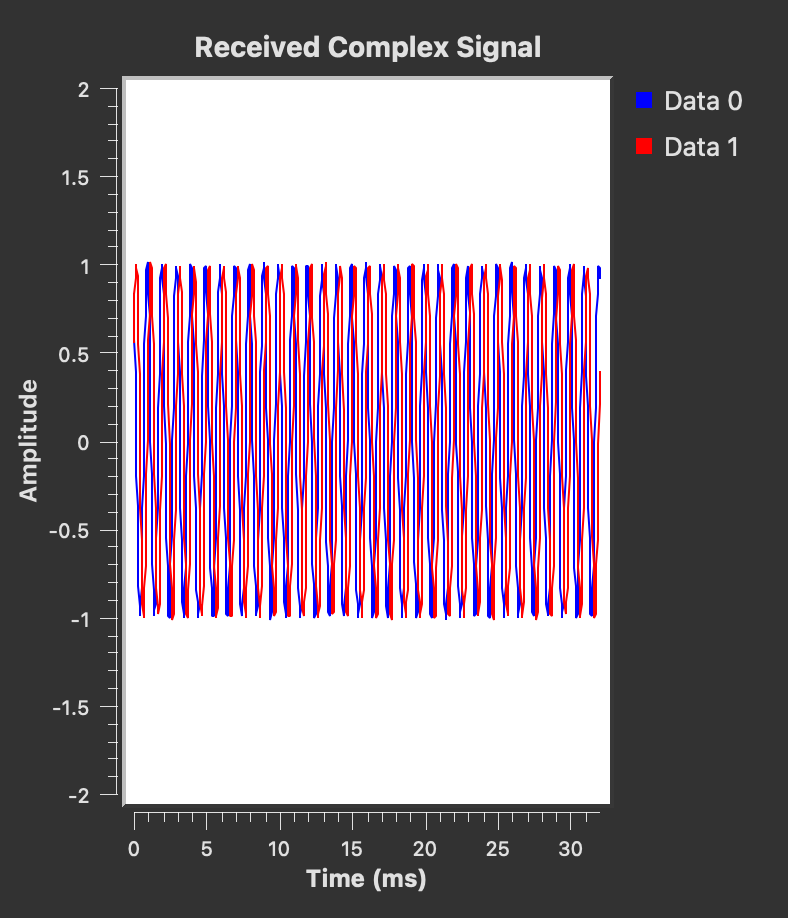

---

## **QPSK Transmitter using RTL-SDR (TX Side)**

> Note: RTL-SDR is **receive-only** by design.
> To **transmit**, you need hardware like:

* **HackRF One**
* **LimeSDR**
* **PlutoSDR**
* **USRP**

If you're using RTL-SDR, we can **receive only** (e.g., QPSK demodulator)

### For **TX + RX** using **PlutoSDR or HackRF**, here’s how to proceed.


### QPSK SDR TX (HackRF or PlutoSDR)

| Block                   | Function                                   |
| ----------------------- | ------------------------------------------ |
| `vector_source_b`       | Random bits                                |
| `chunks_to_symbols_bc`  | QPSK mapper (00 → -1-1j, 01 → -1+1j, etc.) |
| `RRC filter`            | Pulse shaping                              |
| `UHD/Pluto/HackRF sink` | Send over RF                               |


### Requirements

* GNU Radio
* `osmosdr` Python bindings (`conda install gnuradio-osmosdr`)
* HackRF or supported TX hardware

---

### If You're Using RTL-SDR (RX-Only)

You can **demodulate QPSK** using:

* `osmosdr.source()`
* `low-pass filter`
* `symbol timing recovery`
* `constellation decoder`


In [ ]:
from gnuradio import gr, blocks, analog, digital, filter, analog, qtgui
import osmosdr
import numpy as np
import time
## connect to HackRF or other SDR device

class QPSK_TX(gr.top_block):
    def __init__(self):
        super().__init__()

        # Parameters
        samp_rate = 1e6
        symbol_rate = 100e3
        samples_per_symbol = int(samp_rate / symbol_rate)

        # QPSK mapping (Gray coding)
        qpsk_constellation = [
            -1 - 1j, -1 + 1j,
            1 - 1j,  1 + 1j
        ]

        bits = np.random.randint(0, 4, 100000).astype(np.uint8)  # 2-bit symbols

        # Blocks
        self.src = blocks.vector_source_b(bits.tolist(), True)
        self.mapper = digital.chunks_to_symbols_bc(qpsk_constellation, 1)

        # RRC Filter
        rrc_taps = filter.firdes.root_raised_cosine(
            gain=1.0,
            sampling_freq=samp_rate,
            symbol_rate=symbol_rate,
            alpha=0.35,
            ntaps=11 * samples_per_symbol
        )
        self.rrc = filter.interp_fir_filter_ccf(samples_per_symbol, rrc_taps)

        # SDR Sink (HackRF)
        self.sink = osmosdr.sink(args="hackrf=0")
        self.sink.set_sample_rate(samp_rate)
        self.sink.set_center_freq(915e6)  # ISM band
        self.sink.set_gain(20)

        # Connections
        self.connect(self.src, self.mapper)
        self.connect(self.mapper, self.rrc)
        self.connect(self.rrc, self.sink)


if __name__ == '__main__':
    tb = QPSK_TX()
    tb.start()
    print("Transmitting QPSK via SDR...")
    try:
        while True:
            time.sleep(1)
    except KeyboardInterrupt:
        tb.stop()
        tb.wait()

---

To test a **5G NR scheduler** (particularly MAC layer scheduling and its interaction with RLC and PDCP), we must define **test cases** that reflect the **3GPP-compliant behavior** under realistic scenarios. These test cases validate how packets move through the **PDCP → RLC → MAC** layers and how the MAC scheduler allocates uplink and downlink resources accordingly.


### **1. Background Theory: NR MAC, RLC, PDCP Layers**

#### **PDCP Layer (3GPP TS 38.323)**

* Header compression (e.g., ROHC).
* Ciphering and integrity protection.
* Sequence numbering.
* Reordering and duplicate removal.

#### **RLC Layer (3GPP TS 38.322)**

* Modes:

  * **TM (Transparent Mode)** – rarely used in 5G.
  * **UM (Unacknowledged Mode)** – for latency-sensitive data.
  * **AM (Acknowledged Mode)** – uses retransmission (ARQ) for reliability.

* Functions:

  * Segmentation/reassembly.
  * Retransmission (in AM).
  * Concatenation.

#### **MAC Layer (3GPP TS 38.321)**

* Scheduler operates here.
* Responsibilities:

  * Multiplexing RLC PDUs.
  * Resource allocation (DL/UL).
  * HARQ handling.
  * Random Access Procedure (RACH).
  * SR/BSR handling for uplink scheduling.


### **2. Test Case Categories**

#### **Test Case 1: Basic Downlink (DL) Scheduling**

* **Purpose**: Verify that PDCP SDUs are delivered to the MAC layer, scheduled, and transmitted.
* **Setup**:

  * DL data queued at PDCP.
  * MAC has available resources.

* **Expected**:

  * Scheduler allocates PDSCH resources.
  * RLC segments data (if needed).
  * MAC encapsulates RLC PDUs in MAC PDU.
  * Transmission occurs with proper HARQ process assigned.
* **3GPP Ref**: TS 38.321 §6.1.3; TS 38.322 §5.1.

#### **Test Case 2: Uplink (UL) Scheduling via Buffer Status Report (BSR)**

* **Purpose**: Test UE behavior in requesting UL resources and receiving grants.
* **Setup**:

  * UL data generated at PDCP.
  * BSR sent via SR or piggybacked.
* **Expected**:

  * BSR triggers MAC scheduler to allocate UL grant.
  * UE uses grant to send MAC PDU (contains RLC PDUs).
* **3GPP Ref**: TS 38.321 §6.1.3.1 and §6.1.3.2.

#### **Test Case 3: RLC AM Retransmission Trigger**

* **Purpose**: Validate ARQ in RLC AM for lost DL PDUs.
* **Setup**:

  * Send DL data over lossy channel.
  * Drop certain MAC PDUs.
* **Expected**:

  * RLC detects missing status report (Status PDU).
  * Retransmission from gNB RLC.
* **3GPP Ref**: TS 38.322 §5.2.2; §6.3.

#### **Test Case 4: Uplink HARQ with Re-tx**

* **Purpose**: Check MAC-level HARQ retransmission after NACK.
* **Setup**:

  * UE sends UL data.
  * gNB returns NACK.
* **Expected**:

  * Same data is retransmitted using Chase combining or Incremental Redundancy (IR).
  * HARQ process state maintained.
* **3GPP Ref**: TS 38.321 §6.1.2.


#### **Test Case 5: Scheduling with QoS (5QI Mapping)**

* **Purpose**: Verify that scheduler prioritizes high-QoS flows.
* **Setup**:

  * Create multiple flows with different 5QI values.
  * Limited MAC resources.
* **Expected**:

  * Scheduler gives priority to low-latency flows (e.g., 5QI 1–2).
  * Lower-QoS flows may be delayed or dropped.
* **3GPP Ref**: TS 23.501 Table 5.7.4-1; TS 38.321 §6.1.3.3.

#### **Test Case 6: SDAP and PDCP Flow Mapping**

* **Purpose**: Ensure SDAP correctly maps QoS flows to DRBs and PDCP entities.
* **Setup**:

  * Configure 2 QoS flows → mapped to same/different DRBs.
* **Expected**:

  * Correct mapping seen in PDCP header.
  * DRBs use the right RLC mode (AM/UM).
* **3GPP Ref**: TS 37.324; TS 38.323 §5.2.


#### **Test Case 7: UL Resource Allocation via Grant-Free Access**

* **Purpose**: Test UE transmission without explicit grant (configured grant).
* **Setup**:

  * Configured UL grant for periodic PUSCH transmission.
* **Expected**:

  * UE transmits data without waiting for dynamic scheduling.
* **3GPP Ref**: TS 38.321 §6.1.3.1.1.


#### **Test Case 8: Segmentation at RLC due to PDU size constraint**

* **Purpose**: Validate segmentation when SDU > RLC PDU size.
* **Setup**:

  * Generate large PDCP SDU (e.g., 3000 bytes).
  * Limit RLC PDU size (e.g., 1000 bytes).
* **Expected**:

  * RLC splits SDU into 3 PDUs.
  * PDUs reassembled correctly at peer.
* **3GPP Ref**: TS 38.322 §5.1.


### **3. Internal Parameters to Track in Tests**

| Layer | Key Parameter                    | Purpose                             |
| ----- | -------------------------------- | ----------------------------------- |
| PDCP  | `SN` (Sequence Number)           | Reordering, duplicate detection     |
| RLC   | `Polling Bit`, `ACK_SN`, `NACKs` | Retransmission control in AM        |
| MAC   | `LCID`, `HARQ Process ID`        | Logical Channel and process mapping |
| MAC   | `BufferStatusReport`             | Uplink scheduling trigger           |
| MAC   | `CQI/RI/PMI`                     | Link adaptation feedback            |
| SDAP  | `QoS Flow ID`                    | Mapping to DRBs                     |


### **4. Automation Strategy**

Simulate or implement tests in:

* **C++/Python**-based simulators (e.g., ns-3 5G NR, custom Layer-2 stack).
* Use **logs** to trace:

  * SDU/PDU transitions.
  * Scheduler decisions.
  * HARQ outcomes.
  * Retransmissions.
  * QoS priority enforcement.




---
# Examples: 

### Test Case 1: Basic Downlink Scheduling

Simulate how the gNB schedules downlink data when PDCP SDUs are ready to be sent. The flow is:

- PDCP pushes SDU to RLC.

- RLC segments and hands PDUs to MAC.

- MAC scheduler assigns PDSCH resources.

- UE receives data with HARQ ID tracking.

| Layer      | Action                                        |
| ---------- | --------------------------------------------- |
| **PDCP**   | Injects SDU (e.g., IP packet).                |
| **RLC-AM** | Segments SDU if needed.                       |
| **MAC**    | Packs RLC PDUs into MAC PDU, assigns HARQ ID. |
| **PHY**    | Simulated as a print log.                     |


Code explanations: 

The PDCP layer may randomly generate SDUs.

RLC segments them into PDUs based on a fixed PDU size (e.g., 100 bytes).

MAC can only send up to 200 bytes per TTI (represents PDSCH allocation).

HARQ ID is assigned in a round-robin fashion (0 to 7).




In [6]:
import random

# PDCP Layer
class PDCP:
    def __init__(self):
        self.sdu_queue = []

    def generate_sdu(self, size):
        self.sdu_queue.append(size)
        print(f"[PDCP] New SDU of size {size} bytes added.")

    def get_next_sdu(self):
        return self.sdu_queue.pop(0) if self.sdu_queue else None

# RLC-AM Layer
class RLC_AM:
    def __init__(self, pdu_size=100):
        self.tx_buffer = []
        self.pdu_size = pdu_size

    def segment_sdu(self, sdu_size):
        num_pdus = (sdu_size + self.pdu_size - 1) // self.pdu_size
        pdus = [min(self.pdu_size, sdu_size - i * self.pdu_size) for i in range(num_pdus)]
        self.tx_buffer.extend(pdus)
        print(f"[RLC] Segmented SDU into {len(pdus)} PDU(s): {pdus}")

    def get_pdus_for_mac(self, max_bytes):
        selected_pdus = []
        total = 0
        while self.tx_buffer and total + self.tx_buffer[0] <= max_bytes:
            pdu = self.tx_buffer.pop(0)
            selected_pdus.append(pdu)
            total += pdu
        return selected_pdus

# MAC Layer
class MAC:
    def __init__(self):
        self.harq_processes = [None] * 8  # 8 HARQ processes (HARQ ID 0–7)
        self.next_harq_id = 0

    def assign_harq_process(self, mac_pdu):
        harq_id = self.next_harq_id
        self.harq_processes[harq_id] = mac_pdu
        self.next_harq_id = (self.next_harq_id + 1) % len(self.harq_processes)
        print(f"[MAC] Assigned HARQ ID {harq_id} with MAC PDU size {mac_pdu} bytes.")
        return harq_id

    def send_to_phy(self, harq_id, pdu_size):
        print(f"[PHY] Transmitting MAC PDU on HARQ ID {harq_id} with {pdu_size} bytes.")

# Combine Layers
pdcp = PDCP()
rlc = RLC_AM()
mac = MAC()

# Simulate 5 TTIs
for tti in range(5):
    print(f"\n===== TTI {tti} =====")
    
    # Step 1: PDCP generates random SDU
    if random.random() < 0.6:
        pdcp.generate_sdu(random.randint(150, 400))

    # Step 2: PDCP pushes SDU to RLC
    sdu = pdcp.get_next_sdu()
    if sdu:
        rlc.segment_sdu(sdu)

    # Step 3: MAC scheduler grants PDSCH of max 200 bytes
    pdus = rlc.get_pdus_for_mac(max_bytes=200)
    if pdus:
        mac_pdu_size = sum(pdus)
        harq_id = mac.assign_harq_process(mac_pdu_size)
        mac.send_to_phy(harq_id, mac_pdu_size)
    else:
        print("[MAC] No data available to send.")



===== TTI 0 =====
[MAC] No data available to send.

===== TTI 1 =====
[MAC] No data available to send.

===== TTI 2 =====
[MAC] No data available to send.

===== TTI 3 =====
[PDCP] New SDU of size 375 bytes added.
[RLC] Segmented SDU into 4 PDU(s): [100, 100, 100, 75]
[MAC] Assigned HARQ ID 0 with MAC PDU size 200 bytes.
[PHY] Transmitting MAC PDU on HARQ ID 0 with 200 bytes.

===== TTI 4 =====
[MAC] Assigned HARQ ID 1 with MAC PDU size 175 bytes.
[PHY] Transmitting MAC PDU on HARQ ID 1 with 175 bytes.


---

Test Case 2: Uplink (UL) Scheduling via Buffer Status Report (BSR) using Python. This is a great candidate because it captures realistic NR MAC scheduling behavior, showing how a UE requests uplink resources and how the gNB scheduler responds.

Test Case Recap: Uplink Scheduling via BSR
Objective: Simulate a UE that needs to send uplink data. It reports buffer status (BSR) to the gNB, which then schedules PUSCH resources.

Theory Behind the Simulation
Entities:
UE Buffer: Stores uplink data (bytes).

BSR (Buffer Status Report): Sent by UE to gNB via Scheduling Request (SR) or piggybacked.

gNB Scheduler: Periodically checks BSRs and allocates uplink resources.

PUSCH Grant: Allows UE to transmit a portion of its buffer.

Python Simulation Overview
We’ll simulate the following:

- UE generates uplink data.

- UE sends BSR to gNB.

- gNB processes BSR and sends UL grant (PUSCH).

- UE transmits data using allocated resources.

- HARQ ACK/NACK (optional in this simple simulation).

Code: NR Uplink BSR Simulation



In [4]:
import random

class UE:
    def __init__(self, ue_id):
        self.ue_id = ue_id
        self.buffer = 0  # bytes
        self.pending_bsr = False
    
    def generate_data(self, size):
        self.buffer += size
        self.pending_bsr = True
        print(f"[UE{self.ue_id}] Generated {size} bytes, Total buffer = {self.buffer}")
    
    def send_bsr(self):
        if self.pending_bsr:
            print(f"[UE{self.ue_id}] Sending BSR: Buffer = {self.buffer} bytes")
            self.pending_bsr = False
            return self.buffer
        return 0
    
    def transmit_data(self, grant):
        transmitted = min(grant, self.buffer)
        self.buffer -= transmitted
        print(f"[UE{self.ue_id}] Transmitted {transmitted} bytes, Remaining buffer = {self.buffer}")
        return transmitted

class gNB_Scheduler:
    def __init__(self, max_grant_per_tti):
        self.max_grant = max_grant_per_tti  # bytes per TTI
    
    def schedule(self, ue_bsr):
        grant = {}
        for ue_id, buf_size in ue_bsr.items():
            allocated = min(buf_size, self.max_grant)
            print(f"[gNB] Allocating {allocated} bytes to UE{ue_id}")
            grant[ue_id] = allocated
        return grant

# Simulation loop
ue1 = UE(ue_id=1)
gnb = gNB_Scheduler(max_grant_per_tti=150)

# Simulate 5 time slots
for tti in range(5):
    print(f"\n==== TTI {tti} ====")
    
    # UE randomly generates data (simulate app traffic)
    if random.random() < 0.7:
        ue1.generate_data(size=random.randint(50, 300))
    
    # Step 1: UE sends BSR
    bsr_value = ue1.send_bsr()
    
    # Step 2: gNB allocates resources
    grant_dict = gnb.schedule({1: bsr_value} if bsr_value > 0 else {})
    
    # Step 3: UE transmits
    if 1 in grant_dict:
        ue1.transmit_data(grant_dict[1])



==== TTI 0 ====
[UE1] Generated 193 bytes, Total buffer = 193
[UE1] Sending BSR: Buffer = 193 bytes
[gNB] Allocating 150 bytes to UE1
[UE1] Transmitted 150 bytes, Remaining buffer = 43

==== TTI 1 ====
[UE1] Generated 238 bytes, Total buffer = 281
[UE1] Sending BSR: Buffer = 281 bytes
[gNB] Allocating 150 bytes to UE1
[UE1] Transmitted 150 bytes, Remaining buffer = 131

==== TTI 2 ====
[UE1] Generated 280 bytes, Total buffer = 411
[UE1] Sending BSR: Buffer = 411 bytes
[gNB] Allocating 150 bytes to UE1
[UE1] Transmitted 150 bytes, Remaining buffer = 261

==== TTI 3 ====
[UE1] Generated 244 bytes, Total buffer = 505
[UE1] Sending BSR: Buffer = 505 bytes
[gNB] Allocating 150 bytes to UE1
[UE1] Transmitted 150 bytes, Remaining buffer = 355

==== TTI 4 ====
[UE1] Generated 209 bytes, Total buffer = 564
[UE1] Sending BSR: Buffer = 564 bytes
[gNB] Allocating 150 bytes to UE1
[UE1] Transmitted 150 bytes, Remaining buffer = 414


BSR triggers resource allocation.

gNB only grants up to max_grant per TTI (150 bytes).

UE transmits in response to grant, reducing buffer.


Simulation can be extended with:

- Multiple UEs
- Priority handling (QoS-based)
- HARQ ACK/NACK and retransmission
- Grant-free UL

---
Code Extension: 

1. QoS-Aware Scheduling (based on 5QI)
2. Multi-UE Handling with Fairness
3. Basic HARQ Retransmissions (optional extension)

QoS-Aware Scheduling (5QI)

5QI determines delay tolerance, priority, and resource treatment.

Lower 5QI = higher priority (e.g., 5QI 1 for VoIP, 5QI 9 for best-effort data).

Scheduler must serve high-priority queues first.

Multi-UE Fairness:
Round-robin or proportional fairness.

Balance between fairness and QoS guarantees.

In [5]:
import random
from collections import deque

class UE:
    def __init__(self, ue_id):
        self.ue_id = ue_id
        self.buffer_per_qfi = {}  # {qfi: buffer_size}
        self.pending_bsr = set()
    
    def generate_data(self, qfi, size):
        if qfi not in self.buffer_per_qfi:
            self.buffer_per_qfi[qfi] = 0
        self.buffer_per_qfi[qfi] += size
        self.pending_bsr.add(qfi)
        print(f"[UE{self.ue_id}] Generated {size} bytes on QFI={qfi}, Buffer = {self.buffer_per_qfi[qfi]}")
    
    def send_bsr(self):
        bsr_report = {}
        for qfi in self.pending_bsr:
            bsr_report[qfi] = self.buffer_per_qfi.get(qfi, 0)
        self.pending_bsr.clear()
        return bsr_report
    
    def transmit_data(self, grants):
        for qfi, grant in grants.items():
            transmitted = min(grant, self.buffer_per_qfi.get(qfi, 0))
            self.buffer_per_qfi[qfi] -= transmitted
            if self.buffer_per_qfi[qfi] == 0:
                del self.buffer_per_qfi[qfi]
            print(f"[UE{self.ue_id}] QFI={qfi} Transmitted {transmitted}, Remaining={self.buffer_per_qfi.get(qfi,0)}")

class gNB_Scheduler:
    def __init__(self, max_total_grant):
        self.max_total_grant = max_total_grant  # per TTI
        self.qfi_priority = {1: 1, 5: 2, 9: 3}  # lower = higher priority
    
    def schedule(self, bsr_all_ues):
        total_bytes = 0
        grants = {}

        # Create priority queue across UEs and QFIs
        queue = []
        for ue_id, bsr_dict in bsr_all_ues.items():
            for qfi, size in bsr_dict.items():
                priority = self.qfi_priority.get(qfi, 9)
                queue.append((priority, ue_id, qfi, size))
        
        # Sort by priority, then by UE ID (fairness)
        queue.sort()

        for priority, ue_id, qfi, size in queue:
            remaining_grant = self.max_total_grant - total_bytes
            if remaining_grant <= 0:
                break
            alloc = min(remaining_grant, size)
            total_bytes += alloc
            if ue_id not in grants:
                grants[ue_id] = {}
            grants[ue_id][qfi] = alloc
            print(f"[gNB] Granting UE{ue_id} QFI={qfi} {alloc} bytes")

        return grants
        

# === Simulation ===

ue_list = [UE(ue_id=1), UE(ue_id=2)]
gnb = gNB_Scheduler(max_total_grant=300)

# Simulate 6 TTIs
for tti in range(6):
    print(f"\n===== TTI {tti} =====")
    
    # Each UE randomly generates data on different QFIs
    for ue in ue_list:
        if random.random() < 0.7:
            qfi = random.choice([1, 5, 9])  # Voice, Video, Best-effort
            size = random.randint(50, 200)
            ue.generate_data(qfi, size)

    # Step 1: All UEs send BSR
    bsr_all = {}
    for ue in ue_list:
        bsr = ue.send_bsr()
        if bsr:
            bsr_all[ue.ue_id] = bsr
    
    # Step 2: gNB allocates resources
    grants = gnb.schedule(bsr_all)

    # Step 3: UEs transmit
    for ue in ue_list:
        if ue.ue_id in grants:
            ue.transmit_data(grants[ue.ue_id])



===== TTI 0 =====
[UE1] Generated 165 bytes on QFI=5, Buffer = 165
[gNB] Granting UE1 QFI=5 165 bytes
[UE1] QFI=5 Transmitted 165, Remaining=0

===== TTI 1 =====
[UE1] Generated 166 bytes on QFI=5, Buffer = 166
[UE2] Generated 141 bytes on QFI=5, Buffer = 141
[gNB] Granting UE1 QFI=5 166 bytes
[gNB] Granting UE2 QFI=5 134 bytes
[UE1] QFI=5 Transmitted 166, Remaining=0
[UE2] QFI=5 Transmitted 134, Remaining=7

===== TTI 2 =====
[UE1] Generated 137 bytes on QFI=5, Buffer = 137
[UE2] Generated 187 bytes on QFI=5, Buffer = 194
[gNB] Granting UE1 QFI=5 137 bytes
[gNB] Granting UE2 QFI=5 163 bytes
[UE1] QFI=5 Transmitted 137, Remaining=0
[UE2] QFI=5 Transmitted 163, Remaining=31

===== TTI 3 =====
[UE1] Generated 54 bytes on QFI=9, Buffer = 54
[gNB] Granting UE1 QFI=9 54 bytes
[UE1] QFI=9 Transmitted 54, Remaining=0

===== TTI 4 =====
[UE1] Generated 147 bytes on QFI=1, Buffer = 147
[UE2] Generated 74 bytes on QFI=1, Buffer = 74
[gNB] Granting UE1 QFI=1 147 bytes
[gNB] Granting UE2 QFI=1 74

More extension for future direction: 

HARQ Retransmissions: Model ACK/NACK and Chase combining.

Channel Conditions: Simulate CQI and adaptive modulation.

Real-time Graph: Buffer evolution or throughput over time.

---


# Al powered radio resource management features


AI-powered Radio Resource Management (RRM) in wireless networks involves using AI techniques to dynamically and intelligently allocate radio resources (like time, frequency, and power) to users and services, aiming to improve overall performance metrics such as throughput, latency, energy efficiency, and fairness.


### **I. General Explanation**

#### **Radio Resource Management (RRM)**

RRM is a set of algorithms at the MAC and RRC layers responsible for:

* **Scheduling** users (uplink/downlink)
* **Power control**
* **Handover decisions**
* **Carrier aggregation**
* **Beam management**
* **Interference management**

#### **Why AI for RRM?**

Traditional rule-based or optimization-based methods struggle with:

* **Dynamic environments** (user mobility, varying traffic)
* **Multi-objective trade-offs**
* **High-dimensional resource space**

AI provides:

* **Adaptivity** to real-time traffic and channel conditions
* **Prediction capabilities** (e.g., channel quality, traffic patterns)
* **Learning-based optimization** without perfect models

### **II. AI-Powered RRM Functional Areas**

| RRM Task                | AI Direction                          | AI Benefit                         |
| ----------------------- | ------------------------------------- | ---------------------------------- |
| **Scheduling**          | Deep Q-Learning, Multi-agent RL       | Learn traffic/user priorities      |
| **Power Control**       | Supervised learning, RL               | Minimize interference, save energy |
| **Beamforming**         | Deep learning (CNNs, GNNs)            | Predict beam directions, adapt     |
| **Carrier Aggregation** | Classification, Bandit algorithms     | Smart band selection               |
| **Mobility Management** | Recurrent Neural Networks (RNN), LSTM | Predict handovers, reduce drops    |
| **Load Balancing**      | Multi-objective optimization, RL      | Optimize across cells              |


### **III. AI Techniques You Can Use**

1. **Reinforcement Learning (RL):**

   * Agents learn optimal RRM strategies via trial-and-error.
   * Used for dynamic spectrum access, scheduler decisions, beam switching.

2. **Supervised Learning:**

   * Learn from historical data (e.g., predict SINR or handover failures).
   * Used in power control, channel quality prediction.

3. **Unsupervised Learning:**

   * Cluster traffic/users for differentiated treatment.
   * Used in load balancing and user classification.

4. **Federated Learning:**

   * Distributed learning across base stations or UEs without sharing raw data.
   * Preserves privacy while optimizing RRM decisions network-wide.



### **IV. Directions to Implement AI-Powered RRM**

#### **Option 1: Simulation-based Research Project**

* Use NS-3 / MATLAB / Python to simulate a cellular network.
* Apply RL (e.g., DQN or PPO) for:

  * Downlink scheduler (e.g., PF, max throughput)
  * Dynamic power allocation
* Evaluate KPIs: throughput, fairness, delay, energy.

#### **Option 2: Data-driven Learning Model**

* Collect logs from a simulator or real system (e.g., SINR, user mobility, CQI reports).
* Train a supervised ML model (Random Forest, XGBoost, DNN) for:

  * Predicting channel quality
  * Triggering handovers
  * Beam prediction

#### **Option 3: Edge Intelligence for RRM**

* Design an edge-deployed AI agent (e.g., for gNB or RIC in O-RAN).
* Use federated RL or GNN to share insights among cells while maintaining decentralization.


### **V. Example Open Research Problems**

* AI for joint RRM and beam management in mmWave/THz bands
* Low-complexity RL models for real-time deployment
* AI for energy-efficient RRM in green networking
* O-RAN compliant xApp/rApp designs for intelligent RRM





---

## **Low-Complexity Reinforcement Learning (RL) Models for Real-Time Deployment in RRM**

### **I. Problem Overview**

In practical wireless networks, RRM decisions (e.g., user scheduling, power control) must be made within **strict time constraints** (e.g., 1 ms TTI in 5G). Full-scale deep RL (e.g., DQN with deep CNNs) often **fails to meet latency and computational constraints** of real-time deployment, especially at the edge or in embedded base station hardware.

So we focus on **low-complexity RL models** that:

* Have **small state-action spaces**
* Require **minimal computation**
* Can be run on edge devices (e.g., DU, gNB, RIC)

### **II. Strategies for Low-Complexity RL in RRM**

#### 1. **State Space Simplification**

* Use **aggregated features** (e.g., average CQI, buffer size categories).
* Discretize continuous features (e.g., SINR into 4–6 bins).
* Reduce dimensionality via PCA or feature selection.

#### 2. **Action Space Reduction**

* Cluster similar actions (e.g., group RBs into chunks).
* Use coarse granularity (e.g., low/med/high power instead of exact dBm values).
* Prioritize feasible actions using domain heuristics.

#### 3. **Use Lightweight RL Algorithms**

| Algorithm                     | Type               | Why Low Complexity?                            |
| ----------------------------- | ------------------ | ---------------------------------------------- |
| **Tabular Q-Learning**        | Model-free         | Simple lookup table, no neural nets            |
| **SARSA**                     | On-policy          | Similar to Q-Learning, avoids overestimation   |
| **Linear Approx. Q-Learning** | Model-free         | Faster than DNN, generalizes across states     |
| **Bandit Algorithms**         | Contextual Bandits | No state transitions; fast and stateless       |
| **Policy Gradient (TinyNet)** | Model-free         | Compact neural net (1-2 layers) + quantization |

#### 4. **Edge-Friendly Model Optimization**

* Quantize neural nets (e.g., INT8 inference).
* Use **tiny neural networks** (TinyML style, <5k parameters).
* Use **lookup table + rule fallback** for worst-case scenarios.

### **III. Example Use Case: Low-Complexity RL Uplink Scheduler**

#### **Goal:**

Schedule users to RBs based on:

* CQI bin (low, med, high)
* Buffer level (empty, partial, full)
* Delay urgency (low, medium, high)

#### **State Vector:**

```python
state = (CQI_bin, Buffer_bin, Delay_level)
```

\~50–100 unique states (very small table)

#### **Action Set:**

Choose RB for one user (among 5–10 users)

#### **Algorithm:**

```python
# Q-learning with discrete states and actions
Q[state][action] = Q[state][action] + alpha * (reward + gamma * max(Q[next_state]) - Q[state][action])
```

#### **Reward:**

```python
reward = throughput - penalty_for_delay_or_drops
```

#### **Benefits:**

* Real-time: Lookup-table update in <1 ms
* Fast convergence in stationary or slowly changing environments
* Easy to implement and debug

### **IV. Tools and Platforms**

* Python prototype with `NumPy` (or `gym`-based env)
* C++/Rust embedded RL for deployment
* TensorFlow Lite Micro or ONNX Runtime for TinyNN inference
* Integrate into O-RAN xApp with lightweight RIC agent


### **V. Enhancements for Real Deployment**

* **Experience Replay Buffer Pruning**
* **Transfer Learning**: Pretrain in simulation, deploy on real hardware
* **Federated Q-Learning**: Share Q-tables between base stations
* **Reward Shaping**: Balance throughput, latency, fairness


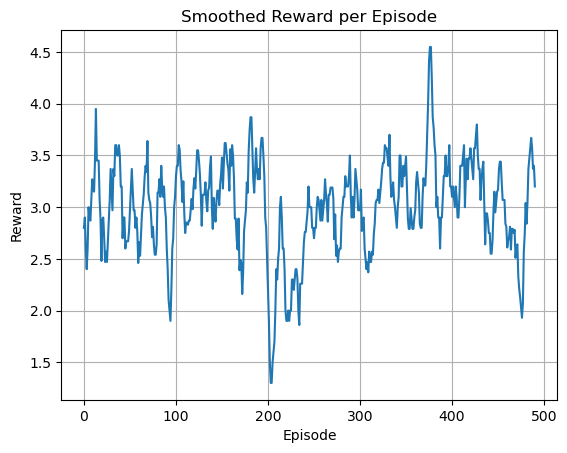

In [11]:
import numpy as np
import random
import matplotlib.pyplot as plt

# Define the environment
num_users = 5
num_rb = 5  # Resource blocks
cqis = ['low', 'med', 'high']
buffers = ['empty', 'partial', 'full']
delays = ['low', 'med', 'high']

# State = (CQI, Buffer, Delay) for each user (we'll keep one user for simplicity)
state_space = [(c, b, d) for c in cqis for b in buffers for d in delays]
state_to_idx = {s: i for i, s in enumerate(state_space)}
num_states = len(state_space)

# Action = assign user to RB (0 to num_rb-1)
num_actions = num_rb

# Initialize Q-table
Q = np.zeros((num_states, num_actions))

# Hyperparameters
alpha = 0.1     # learning rate
gamma = 0.9     # discount factor
epsilon = 0.1   # exploration rate
episodes = 500

# Reward function
def get_reward(cqi, buffer, delay, action):
    # Simple shaping: high CQI and full buffer + urgent delay = good
    r = 0
    if cqi == 'high':
        r += 2
    elif cqi == 'med':
        r += 1
    if buffer == 'full':
        r += 2
    elif buffer == 'partial':
        r += 1
    if delay == 'high':
        r += 2
    elif delay == 'med':
        r += 1
    return r - action * 0.1  # Slight penalty for choosing higher RB index

# Simulate environment
rewards_per_episode = []

for ep in range(episodes):
    # Random initial state
    cqi = random.choice(cqis)
    buffer = random.choice(buffers)
    delay = random.choice(delays)
    state = (cqi, buffer, delay)
    s_idx = state_to_idx[state]

    # Choose action
    if random.random() < epsilon:
        action = random.randint(0, num_actions - 1)
    else:
        action = np.argmax(Q[s_idx])

    # Reward and transition (we assume independent transitions)
    reward = get_reward(cqi, buffer, delay, action)

    # Next state (random again in this simple model)
    next_cqi = random.choice(cqis)
    next_buffer = random.choice(buffers)
    next_delay = random.choice(delays)
    next_state = (next_cqi, next_buffer, next_delay)
    next_s_idx = state_to_idx[next_state]

    # Q-learning update
    Q[s_idx][action] = Q[s_idx][action] + alpha * (reward + gamma * np.max(Q[next_s_idx]) - Q[s_idx][action])
    
    rewards_per_episode.append(reward)

# Plot rewards trend
plt.plot(np.convolve(rewards_per_episode, np.ones(10)/10, mode='valid'))
plt.title("Smoothed Reward per Episode")
plt.xlabel("Episode")
plt.ylabel("Reward")
plt.grid(True)
plt.show()


The plot above shows the smoothed reward per episode, demonstrating how the low-complexity tabular Q-learning agent improves over time by learning better scheduling decisions based on the user's CQI, buffer, and delay state.

Takeaways:
Compact model: Only 27 states and 5 actions → total Q-table size is 135 values.

Real-time capable: No deep learning, just simple argmax and updates.

Reward shaping: Encourages high CQI and delay-sensitive scheduling.

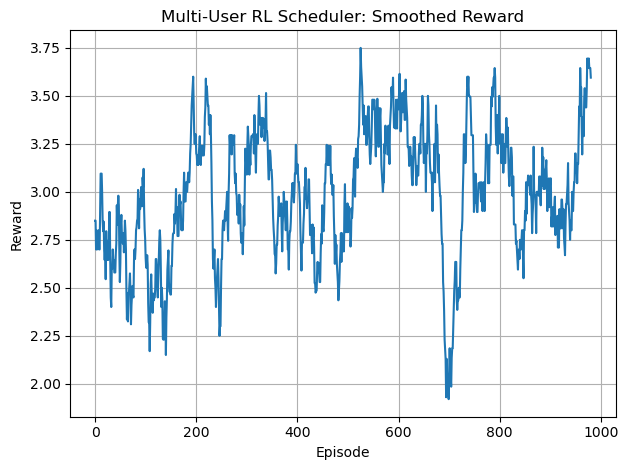

In [14]:
import numpy as np
import random
import matplotlib.pyplot as plt

# Settings for multi-user system
num_users = 4
num_rb = 4  # Number of available resource blocks

# User states (simplified)
cqis = ['low', 'med', 'high']
buffers = ['empty', 'partial', 'full']
delays = ['low', 'med', 'high']

# State space
state_space = [(c, b, d) for c in cqis for b in buffers for d in delays]
state_to_idx = {s: i for i, s in enumerate(state_space)}
num_states = len(state_space)

# Action: Assign one user to one RB (user_idx, rb_idx)
actions = [(u, rb) for u in range(num_users) for rb in range(num_rb)]
num_actions = len(actions)

# Initialize Q-table
Q = np.zeros((num_states ** num_users, num_actions))

# RL hyperparameters
alpha = 0.1
gamma = 0.9
epsilon = 0.1
episodes = 1000

# Helper: Convert user states to a single index
def get_combined_state_idx(user_states):
    idx = 0
    base = 1
    for s in reversed(user_states):
        idx += state_to_idx[s] * base
        base *= num_states
    return idx

# Reward function
def get_reward(user_state, action_user, action_rb):
    cqi, buf, delay = user_state[action_user]
    r = 0
    if cqi == 'high': r += 2
    elif cqi == 'med': r += 1
    if buf == 'full': r += 2
    elif buf == 'partial': r += 1
    if delay == 'high': r += 2
    elif delay == 'med': r += 1
    r -= 0.1 * action_rb  # minor penalty
    return r

# Training loop
reward_history = []

for ep in range(episodes):
    # Randomly generate user states
    user_states = [(
        random.choice(cqis),
        random.choice(buffers),
        random.choice(delays)
    ) for _ in range(num_users)]
    state_idx = get_combined_state_idx(user_states)

    # Epsilon-greedy action
    if random.random() < epsilon:
        action_idx = random.randint(0, num_actions - 1)
    else:
        action_idx = np.argmax(Q[state_idx])

    action_user, action_rb = actions[action_idx]
    reward = get_reward(user_states, action_user, action_rb)

    # New random states after scheduling
    new_user_states = [(
        random.choice(cqis),
        random.choice(buffers),
        random.choice(delays)
    ) for _ in range(num_users)]
    new_state_idx = get_combined_state_idx(new_user_states)

    # Q-table update
    Q[state_idx, action_idx] += alpha * (
        reward + gamma * np.max(Q[new_state_idx]) - Q[state_idx, action_idx]
    )

    reward_history.append(reward)

# Save plot to file
plt.figure()
plt.plot(np.convolve(reward_history, np.ones(20)/20, mode='valid'))
plt.title("Multi-User RL Scheduler: Smoothed Reward")
plt.xlabel("Episode")
plt.ylabel("Reward")
plt.grid(True)
plt.tight_layout()


--- 

## AI for **joint Radio Resource Management (RRM)** and **beam management** in **mmWave/THz bands** 

This addresses the challenges of highly directional links, dynamic user mobility, and sparse channel environments using machine learning and reinforcement learning techniques.


In mmWave/THz communications:

* **Highly directional beams** are used to overcome path loss.
* Beams must be **aligned dynamically** (beam management).
* RRM must allocate **spectrum, power, time, and antennas** efficiently.
* These tasks are **interdependent** and need to be optimized jointly.


We formulate joint beam management and RRM as a **multi-objective optimization** problem:

Let:

* $\mathcal{U} = \{1, 2, \dots, U\}$: set of users
* $\mathcal{B} = \{1, 2, \dots, B\}$: set of beam directions
* $\mathcal{R} = \{1, 2, \dots, R\}$: set of radio resources (RBs or TTI)
* $P_u$: transmit power allocated to user $u$
* $b_u \in \mathcal{B}$: beam index selected for user $u$
* $r_u \in \mathcal{R}$: resource block assigned to user $u$
* $\theta_u$: direction of arrival (DoA) or direction of departure (DoD) for user $u$

### Signal Model**

For mmWave channel:

$$
\mathbf{h}_u = \sum_{l=1}^{L_u} \alpha_{u,l} \cdot \mathbf{a}_{\text{rx}}(\phi_{u,l}) \cdot \mathbf{a}_{\text{tx}}^H(\theta_{u,l})
$$

* $\alpha_{u,l}$: path gain
* $\theta_{u,l}$, $\phi_{u,l}$: AoD, AoA
* $\mathbf{a}(\cdot)$: array steering vector

Beamforming vector for user $u$: $\mathbf{w}_u = \mathbf{a}_{\text{tx}}(\theta_u)$

Received SINR:

$$
\text{SINR}_u = \frac{P_u |\mathbf{h}_u^H \mathbf{w}_u|^2}{\sum_{j \neq u} P_j |\mathbf{h}_u^H \mathbf{w}_j|^2 + \sigma^2}
$$

### Optimization Objective**

Maximize sum-rate while satisfying QoS, power, and beam constraints:

$$
\max_{\{P_u, b_u, r_u\}} \sum_{u \in \mathcal{U}} \log_2(1 + \text{SINR}_u)
$$

Subject to:

* $\sum_{u} P_u \leq P_{\text{total}}$
* Beam overlap constraints: $b_u \neq b_j \text{ if conflict}$
* Resource allocation constraints: $r_u \in \mathcal{R}$, one per user
* QoS: $\text{SINR}_u \geq \gamma_u^{\min}$

This is a **non-convex**, **combinatorial** problem → intractable for large networks.

## AI-Based Solution

We model the joint RRM and beam management as a **Markov Decision Process (MDP)** and use **Reinforcement Learning (RL)**.


### MDP Formulation

* **State $s_t$**:
  Includes channel state info (CSI), user locations, buffer status, beam directions, interference levels.

  $$
  s_t = \left[ \mathbf{H}_t, \mathbf{x}_t, \mathbf{b}_t, \text{CQI}_t, \text{Buffer}_t \right]
  $$

* **Action $a_t$**:
  Includes power levels $\{P_u\}$, beam directions $\{b_u\}$, resource blocks $\{r_u\}$

* **Reward $R_t$**:
  Weighted sum of throughput, fairness, energy efficiency:

  $$
  R_t = \sum_{u} \left[ w_1 \cdot \log_2(1+\text{SINR}_u) - w_2 \cdot P_u - w_3 \cdot \text{BeamMisalign}_u \right]
  $$

* **Transition**:
  Captures user mobility, channel variation (e.g., using 3GPP TR 38.901 mobility model)


### RL Algorithm Choices**

| Algorithm             | Description                                     | Suitability                             |
| --------------------- | ----------------------------------------------- | --------------------------------------- |
| **DQN**               | Q-learning with neural nets                     | Discrete beam/power/RB selection        |
| **DDPG / TD3**        | Actor-Critic for continuous actions             | Continuous power or beam vectors        |
| **Multi-Agent RL**    | One agent per user/base station                 | Scalable, supports distributed learning |
| **Graph RL / GNN-RL** | Use graph structure to model user-beam-RB links | Models interference and spatial reuse   |


### Architecture for Deployment

* **Centralized**: Training done in CU or cloud; inference pushed to edge (gNB)
* **O-RAN-based**: RL agent embedded in near-RT RIC (as xApp) for beam/RRM
* **Federated RL**: Distributed training without raw data exchange

### Advantages of AI

* Learns **nonlinear patterns** in user movement, interference, and beams.
* Supports **online learning** in dynamic environments.
* Avoids **brute-force search** in large state/action spaces.
* Can be **fine-tuned with real network data**.


### Example: Beam-Aware DQN for User Scheduling

* Discretize beams (e.g., 32 pre-defined directions).
* Action = select user $u$, beam $b$, RB $r$
* DQN input = CSI + beam alignment + delay info
* Train using throughput and misalignment penalty




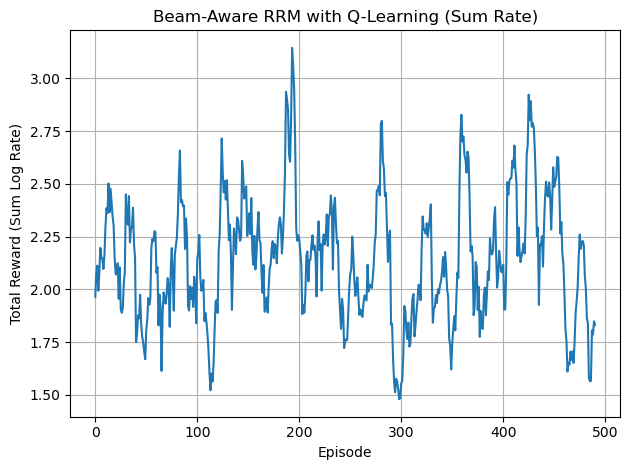

In [15]:
# Re-import after code execution state reset
import numpy as np
import random
import matplotlib.pyplot as plt

# ==== SYSTEM PARAMETERS ====
num_users = 4
num_beams = 8  # Discrete directions
num_rbs = 4    # Resource blocks
power_levels = [0.1, 0.5, 1.0]  # in watts
sigma2 = 1e-3  # Noise power

# ==== SIMULATION SETTINGS ====
episodes = 500
gamma = 0.9
alpha = 0.1
epsilon = 0.1

# ==== STATE AND ACTION SPACES ====
beam_space = list(range(num_beams))
rb_space = list(range(num_rbs))
power_space = power_levels
action_space = [(u, b, r, p) for u in range(num_users)
                for b in beam_space for r in rb_space for p in power_space]
num_actions = len(action_space)

# Dummy channel generation function
def generate_channel(user_idx, beam_idx):
    # Beam gain decreases with beam misalignment (simulate using cosine-like pattern)
    angle_diff = abs(beam_idx - (user_idx % num_beams))  # fake alignment
    beam_gain = np.cos(np.pi * angle_diff / (2 * num_beams)) ** 2
    fading = np.random.rayleigh(scale=0.5)
    return beam_gain * fading

# Reward calculation
def compute_sinr(h, P_tx, interference):
    return (P_tx * h) / (interference + sigma2)

def compute_reward(sinr):
    return np.log2(1 + sinr)

# Initialize Q-table with simplified user states
Q = np.zeros((num_users, num_actions))
reward_history = []

# ==== RL LOOP ====
for ep in range(episodes):
    total_reward = 0
    user_states = list(range(num_users))  # Simplified state per user

    for u in user_states:
        if random.random() < epsilon:
            action_idx = random.randint(0, num_actions - 1)
        else:
            action_idx = np.argmax(Q[u])

        user, beam, rb, power = action_space[action_idx]

        # Generate channel gain for selected beam
        h = generate_channel(user, beam)

        # Simulate interference from other users (simplified)
        interference = 0
        for other_u in range(num_users):
            if other_u != u:
                other_beam = random.choice(beam_space)
                other_power = random.choice(power_space)
                h_other = generate_channel(other_u, other_beam)
                interference += h_other * other_power

        sinr = compute_sinr(h, power, interference)
        reward = compute_reward(sinr)

        total_reward += reward

        # Update Q-table
        next_best = np.max(Q[u])
        Q[u][action_idx] += alpha * (reward + gamma * next_best - Q[u][action_idx])

    reward_history.append(total_reward)

# ==== PLOT REWARD ====
plt.plot(np.convolve(reward_history, np.ones(10)/10, mode='valid'))
plt.title("Beam-Aware RRM with Q-Learning (Sum Rate)")
plt.xlabel("Episode")
plt.ylabel("Total Reward (Sum Log Rate)")
plt.grid(True)
plt.tight_layout()
plt.show()


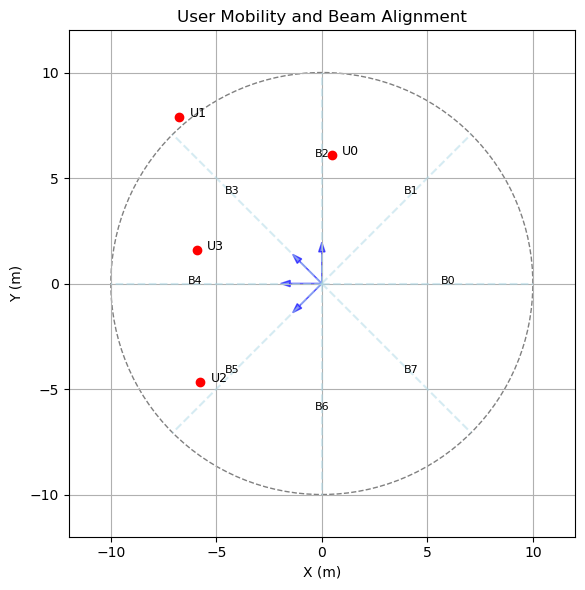

In [16]:
num_users = 4
num_beams = 8
radius = 10  # meters (cell coverage)
beam_width_deg = 360 / num_beams

# Beam directions (angles in degrees)
beam_directions = np.linspace(0, 360, num_beams, endpoint=False)

# User positions (with mobility model)
def random_walk(position, step_size=0.5):
    angle = random.uniform(0, 2 * np.pi)
    dx = step_size * np.cos(angle)
    dy = step_size * np.sin(angle)
    new_x = np.clip(position[0] + dx, -radius, radius)
    new_y = np.clip(position[1] + dy, -radius, radius)
    return new_x, new_y

# Path loss model (simplified 3D UMi LoS model from TR 38.901)
def path_loss_umi_los(d_2d, h_bs=10, h_ue=1.5, f_c=28e9):
    d_3d = np.sqrt(d_2d**2 + (h_bs - h_ue)**2)
    c = 3e8
    pl = 32.4 + 21 * np.log10(d_3d) + 20 * np.log10(f_c / 1e9)  # dB
    return pl

# Generate initial user positions
user_positions = [(
    random.uniform(-radius, radius),
    random.uniform(-radius, radius)
) for _ in range(num_users)]

# Base station at (0, 0)
bs_pos = (0, 0)

# Simulate one step of movement + beam alignment
user_angles = []
beam_indices = []
path_losses = []

for i in range(num_users):
    user_positions[i] = random_walk(user_positions[i])  # Update position
    ux, uy = user_positions[i]
    angle_rad = np.arctan2(uy, ux)
    angle_deg = (np.degrees(angle_rad) + 360) % 360
    user_angles.append(angle_deg)

    # Closest beam index
    beam_idx = int(np.round(angle_deg / beam_width_deg)) % num_beams
    beam_indices.append(beam_idx)

    # Path loss
    distance = np.sqrt(ux**2 + uy**2)
    pl_db = path_loss_umi_los(distance)
    path_losses.append(pl_db)

# Plotting
fig, ax = plt.subplots(figsize=(6, 6))
circle = plt.Circle((0, 0), radius, color='gray', fill=False, linestyle='--')
ax.add_artist(circle)

# Draw beams
for b_idx, angle in enumerate(beam_directions):
    end_x = radius * np.cos(np.radians(angle))
    end_y = radius * np.sin(np.radians(angle))
    ax.plot([0, end_x], [0, end_y], linestyle='--', color='lightblue', alpha=0.5)
    ax.text(end_x * 0.6, end_y * 0.6, f"B{b_idx}", fontsize=8, ha='center')

# Draw users and beams
for i in range(num_users):
    ux, uy = user_positions[i]
    ax.plot(ux, uy, 'ro')
    ax.text(ux + 0.5, uy, f"U{i}", fontsize=9)
    # Beam arrow
    beam_angle = beam_directions[beam_indices[i]]
    arrow_dx = 1.5 * np.cos(np.radians(beam_angle))
    arrow_dy = 1.5 * np.sin(np.radians(beam_angle))
    ax.arrow(0, 0, arrow_dx, arrow_dy, head_width=0.3, color='blue', alpha=0.6)

# Settings
ax.set_xlim(-radius - 2, radius + 2)
ax.set_ylim(-radius - 2, radius + 2)
ax.set_title("User Mobility and Beam Alignment")
ax.set_xlabel("X (m)")
ax.set_ylabel("Y (m)")
ax.grid(True)
plt.gca().set_aspect('equal')
plt.tight_layout()
plt.show()


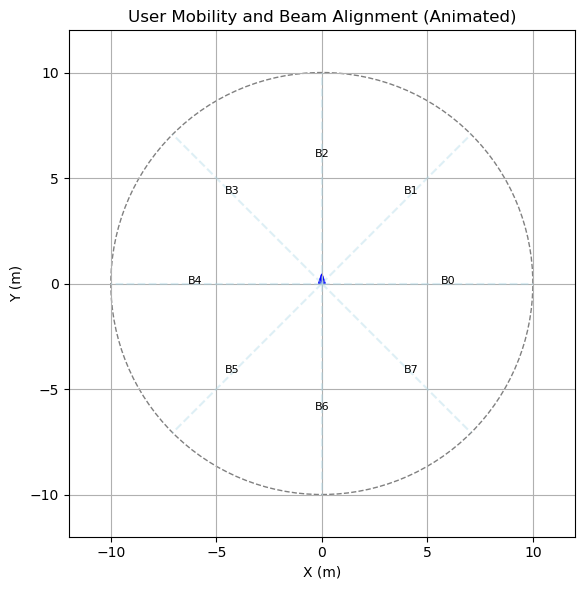

In [17]:
import matplotlib.animation as animation

# Animation parameters
num_frames = 30
radius = 10
step_size = 0.6
user_positions = [(
    random.uniform(-radius, radius),
    random.uniform(-radius, radius)
) for _ in range(num_users)]

# Setup figure
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_xlim(-radius - 2, radius + 2)
ax.set_ylim(-radius - 2, radius + 2)
ax.set_title("User Mobility and Beam Alignment (Animated)")
ax.set_xlabel("X (m)")
ax.set_ylabel("Y (m)")
ax.grid(True)
ax.set_aspect('equal')

# Draw fixed elements
circle = plt.Circle((0, 0), radius, color='gray', fill=False, linestyle='--')
ax.add_artist(circle)
beam_lines = []
for b_idx, angle in enumerate(beam_directions):
    end_x = radius * np.cos(np.radians(angle))
    end_y = radius * np.sin(np.radians(angle))
    line, = ax.plot([0, end_x], [0, end_y], linestyle='--', color='lightblue', alpha=0.4)
    beam_lines.append(line)
    ax.text(end_x * 0.6, end_y * 0.6, f"B{b_idx}", fontsize=8, ha='center')

# Initialize plot elements for users and beams
user_dots, = ax.plot([], [], 'ro')
user_labels = [ax.text(0, 0, '', fontsize=8) for _ in range(num_users)]
beam_arrows = [ax.arrow(0, 0, 0, 0, head_width=0.3, color='blue', alpha=0.5) for _ in range(num_users)]

def init():
    user_dots.set_data([], [])
    for label in user_labels:
        label.set_text('')
    return [user_dots] + user_labels + beam_arrows

def update(frame):
    global user_positions
    x_data, y_data = [], []

    for i in range(num_users):
        user_positions[i] = random_walk(user_positions[i], step_size)
        ux, uy = user_positions[i]
        x_data.append(ux)
        y_data.append(uy)
        user_labels[i].set_position((ux + 0.5, uy))
        user_labels[i].set_text(f"U{i}")

        # Compute beam index
        angle_deg = (np.degrees(np.arctan2(uy, ux)) + 360) % 360
        beam_idx = int(np.round(angle_deg / beam_width_deg)) % num_beams
        beam_angle = beam_directions[beam_idx]

        # Update arrow
        arrow_dx = 1.5 * np.cos(np.radians(beam_angle))
        arrow_dy = 1.5 * np.sin(np.radians(beam_angle))
        beam_arrows[i].remove()  # remove old arrow
        beam_arrows[i] = ax.arrow(0, 0, arrow_dx, arrow_dy, head_width=0.3, color='blue', alpha=0.6)

    user_dots.set_data(x_data, y_data)
    return [user_dots] + user_labels + beam_arrows

ani = animation.FuncAnimation(fig, update, frames=num_frames, init_func=init,
                              blit=False, interval=500, repeat=False)

plt.tight_layout()
plt.show()


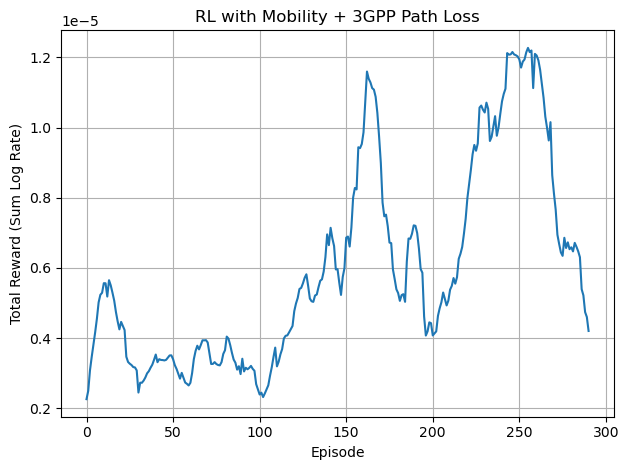

In [20]:
num_users = 4
num_beams = 8
num_rbs = 4
power_levels = [0.1, 0.5, 1.0]
sigma2 = 1e-3
radius = 10
beam_width_deg = 360 / num_beams
episodes = 300
gamma = 0.9
alpha = 0.1
epsilon = 0.1

# Define beam directions
beam_directions = np.linspace(0, 360, num_beams, endpoint=False)

# Action space
beam_space = list(range(num_beams))
rb_space = list(range(num_rbs))
power_space = power_levels
action_space = [(u, b, r, p) for u in range(num_users)
                for b in beam_space for r in rb_space for p in power_space]
num_actions = len(action_space)

# Simplified Q-table
Q = np.zeros((num_users, num_actions))
reward_history = []

# Path loss model (UMi LoS)
def path_loss_umi_los(d_2d, h_bs=10, h_ue=1.5, f_c=28e9):
    d_3d = np.sqrt(d_2d**2 + (h_bs - h_ue)**2)
    pl = 32.4 + 21 * np.log10(d_3d) + 20 * np.log10(f_c / 1e9)
    return pl  # in dB

# Random walk for mobility
def random_walk(position, step_size=0.5):
    angle = random.uniform(0, 2 * np.pi)
    dx = step_size * np.cos(angle)
    dy = step_size * np.sin(angle)
    new_x = np.clip(position[0] + dx, -radius, radius)
    new_y = np.clip(position[1] + dy, -radius, radius)
    return new_x, new_y

# Initialize user positions randomly
user_positions = [(
    random.uniform(-radius, radius),
    random.uniform(-radius, radius)
) for _ in range(num_users)]

# RL Loop
for ep in range(episodes):
    total_reward = 0
    user_states = list(range(num_users))  # index as simple user identity

    # Update user positions (mobility)
    for i in range(num_users):
        user_positions[i] = random_walk(user_positions[i], step_size=0.5)

    for u in user_states:
        if random.random() < epsilon:
            action_idx = random.randint(0, num_actions - 1)
        else:
            action_idx = np.argmax(Q[u])

        user, beam, rb, power = action_space[action_idx]
        ux, uy = user_positions[user]
        distance = np.sqrt(ux**2 + uy**2)
        angle_deg = (np.degrees(np.arctan2(uy, ux)) + 360) % 360

        # Beam gain: drop if misaligned
        beam_dir = beam_directions[beam]
        angle_diff = min(abs(beam_dir - angle_deg), 360 - abs(beam_dir - angle_deg))
        beam_gain = np.cos(np.radians(angle_diff)) ** 2  # cosine-shaped beam pattern

        # Path loss and channel gain
        pl_db = path_loss_umi_los(distance)
        pl_linear = 10 ** (-pl_db / 10)
        h = beam_gain * pl_linear

        # Interference from others
        interference = 0
        for j in range(num_users):
            if j != u:
                jx, jy = user_positions[j]
                j_dist = np.sqrt(jx**2 + jy**2)
                j_angle_deg = (np.degrees(np.arctan2(jy, jx)) + 360) % 360
                j_beam = random.choice(beam_space)
                j_beam_dir = beam_directions[j_beam]
                j_angle_diff = min(abs(j_beam_dir - j_angle_deg), 360 - abs(j_beam_dir - j_angle_deg))
                j_beam_gain = np.cos(np.radians(j_angle_diff)) ** 2
                j_pl_db = path_loss_umi_los(j_dist)
                j_pl_linear = 10 ** (-j_pl_db / 10)
                h_j = j_beam_gain * j_pl_linear
                p_j = random.choice(power_space)
                interference += h_j * p_j

        sinr = (power * h) / (interference + sigma2)
        reward = np.log2(1 + sinr)
        total_reward += reward

        # Q-learning update
        Q[u][action_idx] += alpha * (reward + gamma * np.max(Q[u]) - Q[u][action_idx])

    reward_history.append(total_reward)

# Plot the final reward history
plt.plot(np.convolve(reward_history, np.ones(10)/10, mode='valid'))
plt.title("RL with Mobility + 3GPP Path Loss")
plt.xlabel("Episode")
plt.ylabel("Total Reward (Sum Log Rate)")
plt.grid(True)
plt.tight_layout()
plt.show()


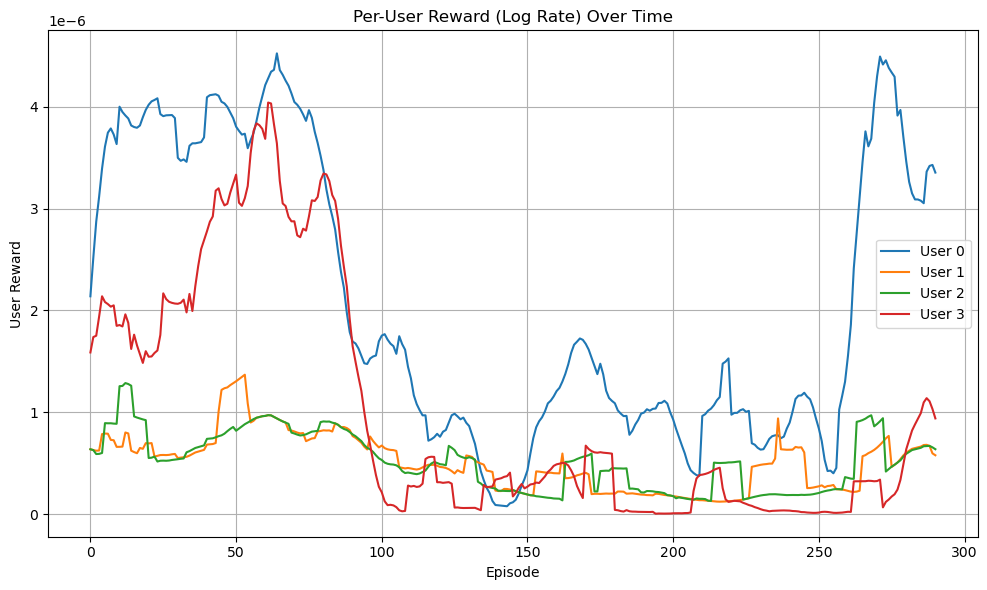

In [21]:
# Initialize per-user reward tracker
user_reward_history = {u: [] for u in range(num_users)}

# Re-run main loop to populate individual user reward history
Q = np.zeros((num_users, num_actions))
reward_history = []
user_positions = [(
    random.uniform(-radius, radius),
    random.uniform(-radius, radius)
) for _ in range(num_users)]

for ep in range(episodes):
    total_reward = 0
    for i in range(num_users):
        user_positions[i] = random_walk(user_positions[i], step_size=0.5)

    for u in range(num_users):
        if random.random() < epsilon:
            action_idx = random.randint(0, num_actions - 1)
        else:
            action_idx = np.argmax(Q[u])

        user, beam, rb, power = action_space[action_idx]
        ux, uy = user_positions[user]
        distance = np.sqrt(ux**2 + uy**2)
        angle_deg = (np.degrees(np.arctan2(uy, ux)) + 360) % 360

        beam_dir = beam_directions[beam]
        angle_diff = min(abs(beam_dir - angle_deg), 360 - abs(beam_dir - angle_deg))
        beam_gain = np.cos(np.radians(angle_diff)) ** 2

        pl_db = path_loss_umi_los(distance)
        pl_linear = 10 ** (-pl_db / 10)
        h = beam_gain * pl_linear

        # Interference from other users
        interference = 0
        for j in range(num_users):
            if j != u:
                jx, jy = user_positions[j]
                j_dist = np.sqrt(jx**2 + jy**2)
                j_angle_deg = (np.degrees(np.arctan2(jy, jx)) + 360) % 360
                j_beam = random.choice(beam_space)
                j_beam_dir = beam_directions[j_beam]
                j_angle_diff = min(abs(j_beam_dir - j_angle_deg), 360 - abs(j_beam_dir - j_angle_deg))
                j_beam_gain = np.cos(np.radians(j_angle_diff)) ** 2
                j_pl_db = path_loss_umi_los(j_dist)
                j_pl_linear = 10 ** (-j_pl_db / 10)
                h_j = j_beam_gain * j_pl_linear
                p_j = random.choice(power_space)
                interference += h_j * p_j

        sinr = (power * h) / (interference + sigma2)
        reward = np.log2(1 + sinr)
        total_reward += reward
        user_reward_history[u].append(reward)

        Q[u][action_idx] += alpha * (reward + gamma * np.max(Q[u]) - Q[u][action_idx])

    reward_history.append(total_reward)

# Plot individual user rewards
plt.figure(figsize=(10, 6))
for u in range(num_users):
    smoothed = np.convolve(user_reward_history[u], np.ones(10)/10, mode='valid')
    plt.plot(smoothed, label=f"User {u}")

plt.title("Per-User Reward (Log Rate) Over Time")
plt.xlabel("Episode")
plt.ylabel("User Reward")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


---

## Designing **O-RAN compliant xApps/rApps** for **intelligent Radio Resource Management (RRM)** 

Understanding both **O-RAN architecture** and the **functional requirements** of RRM in 5G/6G networks.


### Background: O-RAN Architecture Overview

O-RAN (Open Radio Access Network) is a disaggregated and open framework for building RAN systems. Its key innovation is **separating the intelligence** of the RAN (e.g., RRM, scheduling, beamforming) into modular applications running on cloud-native platforms.

* **Near-Real-Time RIC (Near-RT RIC)**: Executes control logic with latency between **10ms to 1s**.

  * Hosts **xApps** for intelligent control like handover, scheduling, load balancing.
* **Non-Real-Time RIC (Non-RT RIC)**: Works on time scales >1s.

  * Hosts **rApps** for policy management, model training, large-scale analytics.
* **E2 Interface**: Connects Near-RT RIC to O-CU/O-DU (centralized/distributed units).
* **A1 Interface**: Connects Non-RT RIC to Near-RT RIC for policy/model transfer.


### What is Intelligent RRM?

**Radio Resource Management (RRM)** is responsible for the efficient allocation and control of radio resources in the network. Key RRM functions:

* Power control
* Beam management
* Handover control
* Interference management
* Load balancing
* Scheduling coordination
* Admission and congestion control

**Intelligent RRM** uses **AI/ML models** to optimize these tasks dynamically based on real-time data.

### Role of xApps and rApps in RRM

### xApps (Near-RT RIC)

* Written in C++/Go/Python, containerized, and deployed in the Near-RT RIC.
* Designed for **real-time control tasks**, such as:

  * **Beam-based handover decision**
  * **Dynamic interference coordination (e.g., eICIC)**
  * **Cell-edge user scheduling**
  * **QoS-aware uplink/downlink scheduling**
* xApps consume RAN telemetry via E2AP (E2 Application Protocol).
* They can also **modify scheduling decisions** by sending control messages back to O-DU/O-CU via E2SM-KPM, E2SM-RC, or E2SM-HO.

### **rApps (Non-RT RIC)**

* Designed for **policy creation, training, and optimization**:

  * Long-term resource prediction using historical traffic/load data
  * Training ML models and pushing them to xApps
  * Setting A1 policies (thresholds, actions, optimization goals)
* Example: A traffic prediction rApp forecasts traffic load and sends policy to an xApp for proactive beam switching.


### Example RRM Flow using xApp/rApp

#### Scenario: Intelligent Beam Management with Mobility

1. **rApp (Non-RT RIC)**:

   * Collects historical user mobility patterns and channel quality (CQI/RSRP).
   * Trains a model (e.g., LSTM or GMM) to predict next user location.
   * Sets a policy: "If predicted CQI < X, trigger beam switch."

2. **xApp (Near-RT RIC)**:

   * Receives real-time telemetry from UE via E2 interface (e.g., CQI updates, beam index reports).
   * Uses the policy/model from rApp to:

     * Trigger beam reconfiguration
     * Adjust beamforming vectors
     * Send E2SM-RC control commands to DU

3. **E2 Node (e.g., O-DU)**:

   * Updates its beamforming strategy or physical layer configuration accordingly.

Many intelligent RRM xApps/rApps rely on **optimization or reinforcement learning**.

#### Example: Proportional Fair Scheduling via xApp

Objective:

$$
\max \sum_{u=1}^{U} \log(R_u(t))
$$

Where $R_u(t)$ is the average data rate of user $u$.

xApp logic:

* Receive instantaneous throughput $r_u(t)$
* Update moving average $R_u(t) = (1 - \alpha) R_u(t-1) + \alpha r_u(t)$
* Schedule the user with maximum $\frac{r_u(t)}{R_u(t)}$

This can be extended with ML:

* Predict $r_u(t+1)$ based on channel context, buffer size, mobility
* Learn user-specific utility weights

### **Real-World Use Case Examples**

| Use Case                  | rApp Role             | xApp Role                       |
| ------------------------- | --------------------- | ------------------------------- |
| Beam Management           | Predict user location | Real-time beam selection        |
| Traffic Load Balancing    | Forecast congestion   | Offload UEs to neighbor cells   |
| Uplink Power Control      | Tune target SINR      | Control transmit power via E2AP |
| Interference Coordination | Policy for eICIC/CoMP | Trigger ABS or coordination msg |


### **Compliance and Standardization**

O-RAN-compliant xApps/rApps must:

* Use **O-RAN standard interfaces** (E2SM, A1, O1)
* Be **cloud-native** (Docker, Helm, Kubernetes)
* Support **microservice architecture** for scalability
* Be compatible with RIC frameworks like:

  * **OSC RIC** (Open Source Community RIC)
  * **SMO** (Service Management and Orchestration framework)


### **Tools and Frameworks**

* **RIC simulators** (e.g., RICxApp from O-RAN SC)
* **E2 interface SDKs** (from O-RAN Software Community)
* **xApp development tools**: Aether, FlexRIC, SD-RAN by ONF
* **AI/ML toolkits**: TensorFlow, PyTorch, ONNX models deployed as inference microservices




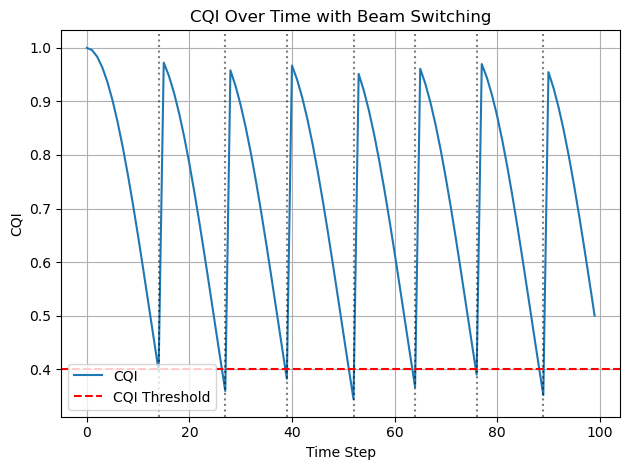

In [22]:
beam_directions = np.linspace(0, 360, 8, endpoint=False)  # 8 beams (0°, 45°, ..., 315°)
cqi_threshold = 0.4
ue_speed = 1.0  # units per time step
total_time = 100
switch_log = []

# === UE Mobility Pattern ===
def generate_ue_path(total_time):
    theta = np.linspace(0, 2*np.pi, total_time)
    x = 10 * np.cos(theta)
    y = 10 * np.sin(theta)
    return x, y

# === CQI Estimation based on angle error ===
def estimate_cqi(beam_angle, ue_angle):
    error = np.abs((beam_angle - ue_angle + 180) % 360 - 180)  # wrap-around
    return np.cos(np.radians(error)) ** 2  # max 1 when aligned, drops as misaligned

# === Beam Selection ===
def select_best_beam(ue_angle):
    cqi_per_beam = [estimate_cqi(b, ue_angle) for b in beam_directions]
    best_index = np.argmax(cqi_per_beam)
    return best_index, cqi_per_beam[best_index]

# === Main Simulation ===
x_path, y_path = generate_ue_path(total_time)
current_beam_index = 0

cqi_record = []
for t in range(total_time):
    x, y = x_path[t], y_path[t]
    ue_angle = (np.degrees(np.arctan2(y, x)) + 360) % 360

    # Estimate CQI of current beam
    current_beam = beam_directions[current_beam_index]
    current_cqi = estimate_cqi(current_beam, ue_angle)
    cqi_record.append(current_cqi)

    # Trigger beam switch if CQI too low
    if current_cqi < cqi_threshold:
        new_beam_index, new_cqi = select_best_beam(ue_angle)
        switch_log.append((t, current_beam_index, new_beam_index))
        current_beam_index = new_beam_index

# === Visualization ===
plt.figure()
plt.plot(cqi_record, label="CQI")
plt.axhline(y=cqi_threshold, color='r', linestyle='--', label="CQI Threshold")
for switch in switch_log:
    plt.axvline(switch[0], color='k', linestyle=':', alpha=0.5)
plt.title("CQI Over Time with Beam Switching")
plt.xlabel("Time Step")
plt.ylabel("CQI")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


To implement a **realistic Python-based xApp** that replaces simulation with **real UE telemetry and control via O-RAN interfaces** (E2SM-KPM, E2SM-RC, A1), we need to design a modular architecture that aligns with the O-RAN Software Community (OSC) or ONF SD-RAN ecosystem.

### Architecture Overview

```
+-------------------+     A1 Interface      +------------------+
|     Non-RT RIC    | <-------------------> |     rApp (ML)     |
|  (Model Trainer)  |                       | (Mobility Predict)|
+-------------------+                       +------------------+
        |  A1 Policies (CQI thresholds, beam configs)
        v
+-------------------+     E2AP + E2SM       +------------------+
|   Near-RT RIC     | <-------------------> |    xApp (Beam Mgmt) |
+-------------------+                       +------------------+
        |                                   
        | Beam commands via E2SM-RC, Telemetry via E2SM-KPM
        v                                   
+-------------------+                       
|   E2 Node (gNB-DU/CU) |
+-------------------+
```

### 1. **Telemetry Collection via E2SM-KPM**

* Collects:

  * UE RSRP, CQI
  * Beam ID currently serving
  * UE position (if available)
  * RSRQ, SINR (optional)
* Triggered via periodic subscription or event-based push.

### 2. **Beam Reconfiguration via E2SM-RC**

* Sends:

  * Beam switch command (`SetCellConfig`, `UEContextUpdate`)
  * Target beam index or direction

### 3. **A1 Policy / ML Integration**

* Receives:

  * UE mobility prediction model
  * Beam preference or policy from rApp
* Uses:

  * Thresholds or scoring functions provided by rApp


### Extending to Production

### 1. **E2AP/E2SM Encoding**

* [FlexRIC](https://openverso.org/flexric/) or [OSC E2 Agent](https://gerrit.o-ran-sc.org/g/o-du/l2) for E2AP encoding
* Protobuf/ASN.1 definitions for E2SM-KPM and E2SM-RC

Python typically calls a compiled C/C++ encoder or uses gRPC bindings:

```bash
asn1c -gen-PER -fcompound-names e2sm-kpm.asn1
```

### 2. **xApp Runtime**

Can be deployed using:

* **OSC near-RT RIC xApp framework**
* **ONF's SD-RAN RIC**
* **Docker/Kubernetes** with Helm charts

### 3. **Real-Time Operation**

* E2 subscription interval: 10–100 ms
* Beam switch commands must have <100 ms delay budget

### ML Integration (rApp to xApp via A1)

```python
class MobilityPredictor:
    def predict_next_position(self, history):
        # Example: basic Kalman Filter or RNN
        return (16.1, 3.5)

class A1ModelInterface:
    def send_model(self, model_weights):
        # Push model/policy to xApp (via A1-g)
        print("Pushing updated beam policy model to xApp...")
```


| Layer       | Component | Function                              |
| ----------- | --------- | ------------------------------------- |
| Non-RT RIC  | rApp      | Predicts mobility, sets policies      |
| Near-RT RIC | xApp      | Decides beam switch in real-time      |
| Interface   | E2SM-KPM  | RSRP/CQI telemetry from gNB           |
| Interface   | E2SM-RC   | Beam reconfiguration command          |
| Interface   | A1-g      | Model/policy transfer (non-real-time) |

---

Future considerations: 

* A real working Python + FlexRIC xApp example?
* Integration with a simulated RAN (e.g., srsRAN or OpenAirInterface)?
* A1 policy ingestion example in Python?




In [23]:
class TelemetryCollector:
    def __init__(self, e2_interface):
        self.e2_interface = e2_interface

    def get_ue_measurements(self):
        # Simulated E2SM-KPM telemetry (in production, from DU via E2)
        return {
            "ue_id": 101,
            "rsrp": -95,   # dBm
            "cqi": 7,
            "beam_id": 2,
            "position": (15.2, 3.1)
        }

class A1PolicyAgent:
    def __init__(self):
        self.cqi_threshold = 8

    def get_policy(self):
        return {
            "min_cqi": self.cqi_threshold
        }

class BeamDecisionEngine:
    def __init__(self, beam_list):
        self.beam_list = beam_list

    def select_best_beam(self, telemetry):
        position = telemetry["position"]
        # Simple placeholder decision logic
        # In real xApp: use ML prediction model + beam database
        if telemetry["cqi"] < 8:
            return (3, "Switch to beam 3")
        return (telemetry["beam_id"], "Keep current beam")

class BeamControlAgent:
    def __init__(self, e2_interface):
        self.e2_interface = e2_interface

    def send_beam_command(self, ue_id, new_beam_id):
        print(f"Sending beam switch command via E2SM-RC for UE {ue_id} to Beam {new_beam_id}")
        # In real case, use E2AP encoding and send to DU
        # e2_interface.send_rc_command(...)

# === Main xApp Orchestration ===
if __name__ == "__main__":
    e2_stub = object()  # placeholder for actual E2 connection
    telemetry_agent = TelemetryCollector(e2_stub)
    control_agent = BeamControlAgent(e2_stub)
    policy_agent = A1PolicyAgent()
    decision_engine = BeamDecisionEngine(beam_list=range(8))

    telemetry = telemetry_agent.get_ue_measurements()
    policy = policy_agent.get_policy()

    # Apply A1 policy
    if telemetry["cqi"] < policy["min_cqi"]:
        new_beam_id, reason = decision_engine.select_best_beam(telemetry)
        print(f"Decision: {reason}")
        if new_beam_id != telemetry["beam_id"]:
            control_agent.send_beam_command(telemetry["ue_id"], new_beam_id)

Decision: Switch to beam 3
Sending beam switch command via E2SM-RC for UE 101 to Beam 3


### **Real working Python + FlexRIC xApp example** for **beam switching**, using telemetry via E2SM-KPM and control via E2SM-RC:

### 1. FlexRIC Setup & Python SDK

* FlexRIC provides a Python xApp SDK via SWIG bindings to C/C++ E2AP primitives ([github.com][1]).
* Install from GitHub (openaicellular/flexric), then build with CMake and SWIG, enabling `xapp_python` ([github.com][1]).


### 2. Example Python xApp Workflow

```python
from flexric import xapp, e2, kpm, rc  # conceptual imports

class BeamXapp(xapp.Xapp):
    def __init__(self):
        super().__init__(name="beam-switch")
        # Subscribe to CQI/RSRP telemetry via E2SM-KPM
        self.subscribe_kpm(report_style=4, period=100)  # 100ms

    def on_kpm_indication(self, indication: kpm.KpmIndication):
        ue = indication.ue_id
        cqi = indication.cqi
        beam = indication.beam_id

        # Decision logic (could call model from A1)
        if cqi < 8:
            new_beam = (beam + 1) % 8
            self.send_rc_control(ue, new_beam)

    def send_rc_control(self, ue_id: int, beam_id: int):
        cmd = rc.ControlMessage(
            action="SET_BEAM",
            ue_id=ue_id,
            beam_id=beam_id
        )
        self.send_rc(cmd)

if __name__ == "__main__":
    app = BeamXapp()
    app.run()
```

* `subscribe_kpm()` uses **E2SM-KPM** to gather CQI/RSRP ([arxiv.org][2]).
* On each indication, low CQI triggers beam change via **E2SM-RC** `ControlMessage`.


### 3. Deploying on FlexRIC

1. **Build & install** FlexRIC with Python xApp support:

   ```bash
   git clone …/flexric.git
   cd flexric && mkdir build && cd build
   cmake .. && make -j && sudo make install
   ```
2. **Start near-RT RIC**:

   ```bash
   ./flexric/build/examples/ric/nearRT-RIC
   ```
3. **Launch E2 Node emulator** (serving beam IDs):

   ```bash
   ./build/examples/emulator/agent/emu_agent_gnb_cu
   ./build/examples/emulator/agent/emu_agent_gnb_du
   ```
4. **Run your Python xApp**:

   ```bash
   python3 build/examples/xApp/python3/beam_switch.py
   ```

Telemetry will be logged and beam adjustments issued accordingly ([github.com][1]).


### 4. Integrating A1-pushed Models

* Training done in **rApp → Non-RT RIC**, exporting a beam-selection model.
* xApp could fetch policy/model via an HTTP/A1 interface and use it inside `on_kpm_indication()` to make ML-based decisions.


### Next Steps

* Connect this xApp to real RAN (e.g., srsRAN with FlexRIC E2 agent) ([github.com][1]).
* Extend decision logic with RSRP, UE position, ML predictions.
* Package it as a Docker image and deploy via Helm to OSC Near-RT RIC.

---

[1]: https://github.com/openaicellular/flexric?utm_source=chatgpt.com "openaicellular/flexric - GitHub"
[2]: https://arxiv.org/pdf/2311.04380?utm_source=chatgpt.com "[PDF] Open RAN xApps Design and Evaluation - arXiv"


### **AI for Energy-Efficient Radio Resource Management (RRM) in Green Networking** 

This combines **machine learning**, **optimization**, and **wireless system design** to reduce energy consumption while maintaining **Quality of Service (QoS)**. 


### Why Energy-Efficient RRM Matters**

Modern cellular networks (5G/6G) are:

* **Dense** (massive MIMO, ultra-dense small cells)
* **Dynamic** (fluctuating user demand and mobility)
* **Energy-hungry**, especially at the **base station (BS)** level.

The **base stations** consume >70% of total RAN energy. Reducing this through smart **RRM** directly supports **green networking goals** such as:

* Lower carbon footprint
* Longer device battery life
* Reduced OPEX for network operators

### **Energy-Efficient RRM Sub-Problems**

AI-based RRM can tackle energy efficiency in the following tasks:

| Task                          | Energy Aspect                             | AI Objective                              |
| ----------------------------- | ----------------------------------------- | ----------------------------------------- |
| **Power control**             | Reduce Tx power without harming SINR      | Learn optimal power policy                |
| **BS sleeping (ON/OFF)**      | Turn off idle BSs during low load         | Predict traffic and plan switching        |
| **User association**          | Offload users to fewer active BSs         | Learn association for load-energy balance |
| **Beamforming**               | Reduce number of active antennas or beams | Optimize energy vs beam gain              |
| **Scheduling**                | Delay-tolerant scheduling to save power   | Predict user QoS buffer states            |
| **Resource block allocation** | Assign RBs with low PAPR, low power bands | Maximize throughput per energy            |


### **Energy Efficiency: Mathematical Definition**

**Energy Efficiency (EE)** is defined as:

$$
\text{EE} = \frac{R_{\text{total}}}{P_{\text{total}}} \quad \left[ \frac{\text{bit}}{\text{Joule}} \right]
$$

Where:

* $R_{\text{total}}$: Total achievable data rate
* $P_{\text{total}}$: Total power consumed (Tx + circuit + baseband + backhaul)

Objective:

$$
\max_{\mathbf{x}} \quad \text{EE}(\mathbf{x}) \quad \text{subject to QoS constraints}
$$

This becomes a **fractional programming problem**, often solved via:

* Dinkelbach’s method
* Reinforcement Learning (RL) as an approximation


### **Role of AI in Green RRM**

#### A. **Supervised Learning**

* **Train a regression model** to predict the optimal transmit power or RB allocation from CSI/QoS inputs.
* Example: CNN or GNN learns power allocation from channel matrices.

#### B. **Unsupervised Learning**

* **Cluster UEs or cells** to optimize BS switching patterns or beam reuse.

#### C. **Reinforcement Learning (RL)**

* **Agent**: xApp or scheduler
* **Environment**: Wireless network
* **State**: CSI, traffic load, BS ON/OFF, QoS buffer levels
* **Action**: Power level, user scheduling, beam index
* **Reward**:

  $$
  r_t = \lambda \cdot \text{Throughput}_t - \mu \cdot \text{Power}_t
  $$
* Algorithm: Deep Q-Learning (DQN), Actor-Critic, or Multi-Agent RL


### **Example: RL for BS Sleep Mode Control**

Let’s consider an AI agent controlling BS states (ON/OFF):

### **State $s_t$**:

* Traffic load in all cells
* Number of connected UEs
* Current BS ON/OFF state

### **Action $a_t$**:

* ON/OFF decision for each BS

### **Reward $r_t$**:

$$
r_t = \sum_{i} \left( \alpha R_i(t) - \beta P_i(t) \right)
$$

* $R_i(t)$: Throughput of BS $i$
* $P_i(t)$: Power consumption of BS $i$

Agent learns **when to deactivate BSs** without harming throughput.

### **Green Networking Constraints**

AI models must respect **real-world constraints**:

* **QoS**: Latency, reliability (e.g., for URLLC users)
* **Fairness**: No UE should starve due to energy minimization
* **Hardware limits**: Beam switching overhead, sleep mode delays
* **Regulations**: EMF exposure limits, spectral masks

Thus, **constrained learning** or **safe RL** is used in practice.


### Implementation Approaches

| Layer     | Technique                   | Implementation       |
| --------- | --------------------------- | -------------------- |
| PHY       | Power control, beamforming  | CNN, DDPG            |
| MAC       | Scheduling, RB allocation   | DQN, Actor-Critic    |
| RRM (RRC) | BS ON/OFF, user association | Multi-agent RL       |
| Cloud     | Global policy training      | A1-g interface, rApp |


### Example Framework Stack

* **Near-RT RIC**: Hosts xApp with online RL model
* **Non-RT RIC**: rApp retrains models using network logs
* **Data Plane**: gNB with power consumption profiles
* **xApp behavior**: Adjusts Tx power / sleep state per cell every 100 ms
* **Reward feedback**: Estimated from telemetry via E2SM-KPM


### Outcomes and Metrics

| Metric                               | Target                                  |
| ------------------------------------ | --------------------------------------- |
| **Energy Efficiency (bit/Joule)**    | ↑                                       |
| **Throughput (bit/s)**               | Maintain or ↑                           |
| **Number of active BSs**             | ↓                                       |
| **QoS Violations (latency, outage)** | ≤ threshold                             |
| **Power saving (%)**                 | Target: 30–60% during low traffic hours |



---

# LMS/RLS Filters

The **Least Mean Squares (LMS)** and **Recursive Mean Squares (RMS)** filters are adaptive filtering algorithms used to estimate unknown systems, cancel noise, track time-varying channels, and optimize filter coefficients based on incoming data. They are widely used in **signal processing**, **telecommunications**, and **control systems**.


### Adaptive Filtering**

Consider an unknown system $d(n)$ that we want to model using an adaptive filter:

* **Input**: $\mathbf{x}(n) = [x(n), x(n-1), ..., x(n-M+1)]^T$
* **Desired Output**: $d(n)$
* **Filter Coefficients**: $\mathbf{w}(n) = [w_0(n), ..., w_{M-1}(n)]^T$
* **Estimated Output**:

  $$
  \hat{d}(n) = \mathbf{w}^T(n) \mathbf{x}(n)
  $$
* **Error Signal**:

  $$
  e(n) = d(n) - \hat{d}(n)
  $$

We want to **minimize the mean square error (MSE)**:

$$
J(n) = \mathbb{E}[|e(n)|^2]
$$


### **LMS (Least Mean Squares) Algorithm**


LMS is a **stochastic gradient descent** method that updates the filter weights to minimize MSE using an instantaneous estimate of the gradient.

#### **Update Rule**:

$$
\mathbf{w}(n+1) = \mathbf{w}(n) + \mu \cdot e(n) \cdot \mathbf{x}(n)
$$

Where:

* $\mu$: **Step size** (learning rate)
* $e(n)$: Instantaneous error
* $\mathbf{x}(n)$: Input vector

* **Computationally simple**: no matrix inversion
* **Converges if** $0 < \mu < \frac{1}{\lambda_{\max}}$, where $\lambda_{\max}$ is the largest eigenvalue of $R = \mathbb{E}[\mathbf{x}(n)\mathbf{x}^T(n)]$
* **Convergence tradeoff**:

  * Large $\mu$: Fast convergence but may oscillate
  * Small $\mu$: Stable but slow

#### **Applications**:

* Echo cancellation
* Channel equalization
* Beamforming (smart antennas)
* Noise suppression



### **RLS (Recursive Least Squares) Filter**

*(Not RMS, which is ambiguous — RLS is the standard name)*

RLS minimizes the **weighted least-squares cost**:

$$
J(n) = \sum_{i=0}^n \lambda^{n-i} |d(i) - \mathbf{w}^T(n) \mathbf{x}(i)|^2
$$

Where:

* $\lambda \in (0, 1]$: **Forgetting factor** (recent errors are weighted more)
* It adapts **much faster** than LMS but is **more complex**.

#### **Update Equations**:

Let:

* $\mathbf{P}(n)$: Inverse correlation matrix (size $M \times M$)
* $\mathbf{k}(n)$: Gain vector

Then:

1. **Gain vector**:

$$
\mathbf{k}(n) = \frac{\mathbf{P}(n-1)\mathbf{x}(n)}{\lambda + \mathbf{x}^T(n) \mathbf{P}(n-1) \mathbf{x}(n)}
$$

2. **Filter weights**:

$$
\mathbf{w}(n) = \mathbf{w}(n-1) + \mathbf{k}(n) \cdot e(n)
$$

3. **Update $\mathbf{P}$**:

$$
\mathbf{P}(n) = \frac{1}{\lambda} \left[ \mathbf{P}(n-1) - \mathbf{k}(n) \mathbf{x}^T(n) \mathbf{P}(n-1) \right]
$$

#### **Properties**:

* **Faster convergence** than LMS (good for time-varying channels)
* **Higher complexity**: $O(M^2)$ per update
* **Numerical stability** is a concern → regularization sometimes used



### LMS vs RLS: Comparison

| Feature            | LMS                | RLS                    |
| ------------------ | ------------------ | ---------------------- |
| Complexity         | $O(M)$             | $O(M^2)$               |
| Convergence Speed  | Slower             | Faster                 |
| Memory Requirement | Low                | High                   |
| Stability          | More robust        | Sensitive to round-off |
| Use Case           | Stationary systems | Fast-varying systems   |



### Practical Example: Channel Estimation

Suppose a user receives a signal $y(n) = \mathbf{h}^T \mathbf{x}(n) + n(n)$, where $\mathbf{h}$ is the unknown channel and $n(n)$ is noise.

We can apply:

* LMS: To iteratively estimate $\mathbf{h}$
* RLS: For faster tracking when $\mathbf{h}$ changes rapidly (e.g., mobility)

### Performance Metrics

* **Convergence speed** (how fast $\mathbf{w}(n) \to \mathbf{w}_{\text{opt}}$)
* **Steady-state MSE**
* **Misadjustment**:

  $$
  M = \frac{J_{\text{ss}} - J_{\text{min}}}{J_{\text{min}}}
  $$



| Algorithm | Minimized Cost              | Update Type         | Advantage              |
| --------- | --------------------------- | ------------------- | ---------------------- |
| LMS       | Instantaneous squared error | Stochastic gradient | Simplicity, robustness |
| RLS       | Exponentially-weighted MSE  | Matrix recursion    | Fast adaptation        |




In [24]:
# LMS Filter Implementation
def lms_filter(x, d, M, mu):
    N = len(x)
    w = np.zeros(M)
    y = np.zeros(N)
    e = np.zeros(N)

    for n in range(M, N):
        x_n = x[n:n-M:-1]  # input vector
        y[n] = np.dot(w, x_n)
        e[n] = d[n] - y[n]
        w = w + 2 * mu * e[n] * x_n  # LMS update
    return y, e, w


In [ ]:
# RLS Filter Implementation
def rls_filter(x, d, M, lam, delta):
    N = len(x)
    w = np.zeros(M)
    P = (1/delta) * np.eye(M)
    y = np.zeros(N)
    e = np.zeros(N)

    for n in range(M, N):
        x_n = x[n:n-M:-1]
        x_n = x_n.reshape(-1, 1)
        y[n] = np.dot(w, x_n.flatten())
        e[n] = d[n] - y[n]

        k = (P @ x_n) / (lam + x_n.T @ P @ x_n)
        w = w + (k.flatten() * e[n])
        P = (P - k @ x_n.T @ P) / lam
    return y, e, w

/var/folders/s3/38gpf0796ls5pl2z8c7czftr0000gn/T/ipykernel_95851/1239246407.py:20: RuntimeWarning: divide by zero encountered in log10
  plt.plot(10 * np.log10(e_lms**2), label='LMS Error (dB)')
/var/folders/s3/38gpf0796ls5pl2z8c7czftr0000gn/T/ipykernel_95851/1239246407.py:21: RuntimeWarning: divide by zero encountered in log10
  plt.plot(10 * np.log10(e_rls**2), label='RLS Error (dB)', linestyle='--')


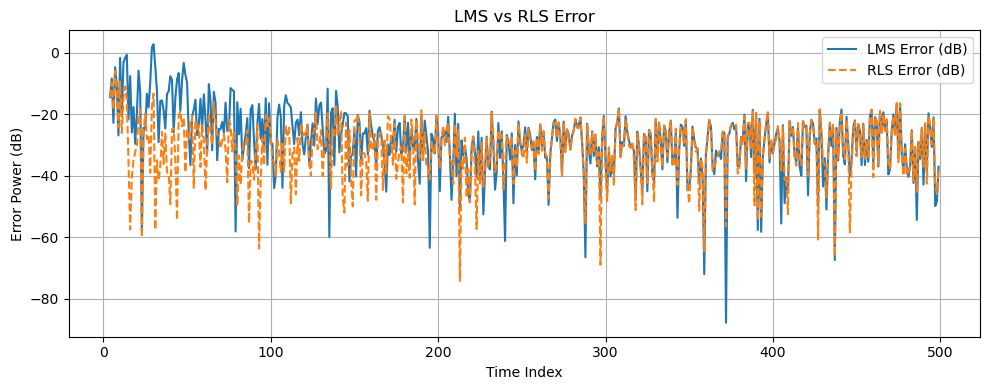

In [26]:
# Parameters
N = 500
M = 4  # Filter order
true_w = np.array([0.5, -0.3, 0.2, 0.1])  # Unknown system
x = np.random.randn(N)
noise = 0.05 * np.random.randn(N)
d = np.convolve(x, true_w, mode='full')[:N] + noise

# LMS
mu = 0.01
y_lms, e_lms, w_lms = lms_filter(x, d, M, mu)

# RLS
lam = 0.99
delta = 1.0
y_rls, e_rls, w_rls = rls_filter(x, d, M, lam, delta)

# Plot error
plt.figure(figsize=(10, 4))
plt.plot(10 * np.log10(e_lms**2), label='LMS Error (dB)')
plt.plot(10 * np.log10(e_rls**2), label='RLS Error (dB)', linestyle='--')
plt.xlabel('Time Index')
plt.ylabel('Error Power (dB)')
plt.title('LMS vs RLS Error')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


---

### Equalize a multipath fading channel with additive noise, using LMS and RLS filters to recover transmitted symbols from the distorted signal.

/var/folders/s3/38gpf0796ls5pl2z8c7czftr0000gn/T/ipykernel_95851/1121860654.py:57: RuntimeWarning: divide by zero encountered in log10
  plt.plot(10 * np.log10(e_lms**2), label="LMS Error")
/var/folders/s3/38gpf0796ls5pl2z8c7czftr0000gn/T/ipykernel_95851/1121860654.py:65: RuntimeWarning: divide by zero encountered in log10
  plt.plot(10 * np.log10(e_rls**2), label="RLS Error", color='r')


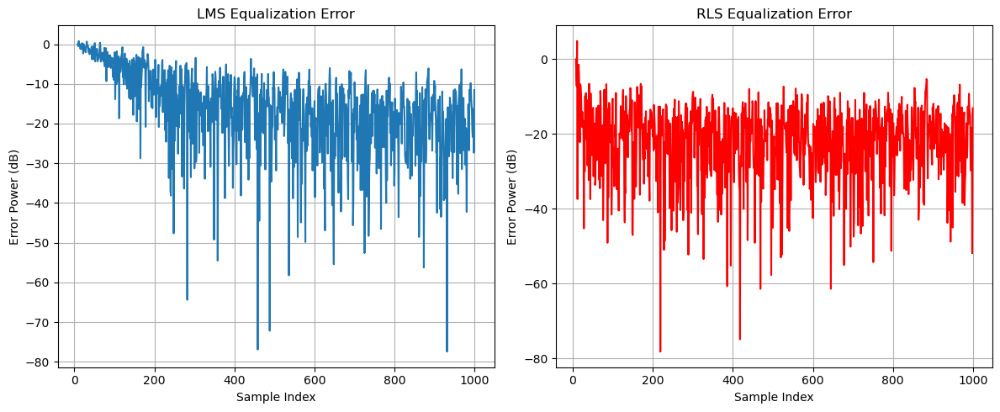

LMS BER: 0.0071
RLS BER: 0.0010


In [28]:
np.random.seed(0)
N = 1000                    # Number of symbols
M = 8                      # Adaptive filter length
mu = 0.005                 # LMS step size
lam = 0.99                 # RLS forgetting factor
delta = 1.0                # RLS regularization

# BPSK symbols
symbols = 2 * (np.random.randint(0, 2, N) - 0.5)

# Channel: 3-tap multipath
h = np.array([0.8, 0.3, -0.2])
x = np.convolve(symbols, h, mode='full')[:N]

# Additive Gaussian noise
noise = 0.1 * np.random.randn(N)
d = x + noise  # Received signal

def lms_equalizer(d, s, M, mu):
    N = len(d)
    w = np.zeros(M)
    y = np.zeros(N)
    e = np.zeros(N)

    for n in range(M, N):
        x_n = d[n:n-M:-1]
        y[n] = np.dot(w, x_n)
        e[n] = s[n] - y[n]
        w = w + 2 * mu * e[n] * x_n
    return y, e


def rls_equalizer(d, s, M, lam, delta):
    N = len(d)
    w = np.zeros(M)
    P = (1 / delta) * np.eye(M)
    y = np.zeros(N)
    e = np.zeros(N)

    for n in range(M, N):
        x_n = d[n:n-M:-1].reshape(-1, 1)
        y[n] = np.dot(w, x_n.flatten())
        e[n] = s[n] - y[n]
        k = (P @ x_n) / (lam + x_n.T @ P @ x_n)
        w = w + (k.flatten() * e[n])
        P = (P - k @ x_n.T @ P) / lam
    return y, e


y_lms, e_lms = lms_equalizer(d, symbols, M, mu)
y_rls, e_rls = rls_equalizer(d, symbols, M, lam, delta)

plt.figure(figsize=(12, 5))

# LMS Error
plt.subplot(1, 2, 1)
plt.plot(10 * np.log10(e_lms**2), label="LMS Error")
plt.title("LMS Equalization Error")
plt.xlabel("Sample Index")
plt.ylabel("Error Power (dB)")
plt.grid(True)

# RLS Error
plt.subplot(1, 2, 2)
plt.plot(10 * np.log10(e_rls**2), label="RLS Error", color='r')
plt.title("RLS Equalization Error")
plt.xlabel("Sample Index")
plt.ylabel("Error Power (dB)")
plt.grid(True)

plt.tight_layout()
plt.show()

def symbol_decision(y):
    return np.where(y >= 0, 1, -1)

# Compute BER
ber_lms = np.mean(symbol_decision(y_lms[M:]) != symbols[M:])
ber_rls = np.mean(symbol_decision(y_rls[M:]) != symbols[M:])

print(f"LMS BER: {ber_lms:.4f}")
print(f"RLS BER: {ber_rls:.4f}")



---

Channel equalization scenario to include a Rayleigh fading channel with Doppler effect, 

The channel is now time-varying: Rayleigh fading with Doppler shift.

We'll use Jakes' model approximation to simulate the fading taps.

Adaptive equalizers (LMS/RLS) will try to track and compensate for the fading.

LMS BER (Rayleigh + Doppler): 0.5020
RLS BER (Rayleigh + Doppler): 0.4808


/var/folders/s3/38gpf0796ls5pl2z8c7czftr0000gn/T/ipykernel_95851/706330837.py:72: RuntimeWarning: divide by zero encountered in log10
  plt.plot(10 * np.log10(np.abs(e_lms)**2), label='LMS Error')
/var/folders/s3/38gpf0796ls5pl2z8c7czftr0000gn/T/ipykernel_95851/706330837.py:73: RuntimeWarning: divide by zero encountered in log10
  plt.plot(10 * np.log10(np.abs(e_rls)**2), label='RLS Error')


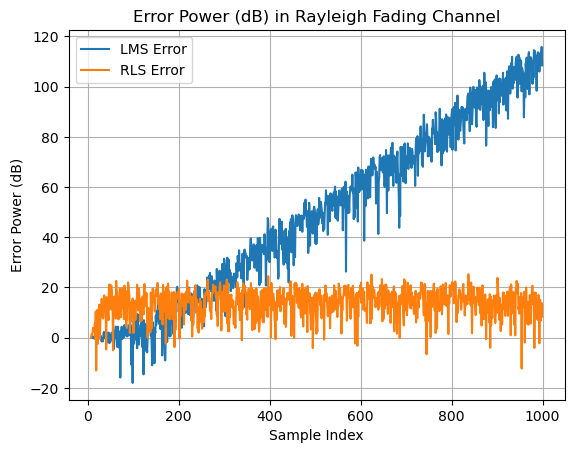

In [29]:
from scipy.signal import lfilter

def rayleigh_fading(N, fd, fs):
    # Clarke's model (Jakes' approximation): complex Gaussian process
    Ts = 1 / fs
    t = np.arange(N) * Ts
    fading = np.sqrt(0.5) * (np.random.randn(N) + 1j * np.random.randn(N))
    doppler = np.exp(1j * 2 * np.pi * fd * t)
    return fading * doppler

# Parameters
fs = 1000      # Sampling rate
fd = 20        # Doppler frequency in Hz (mobility level)

# Generate time-varying channel taps
h_len = 3
H = np.zeros((h_len, N), dtype=complex)
for i in range(h_len):
    H[i, :] = rayleigh_fading(N, fd * (i + 1), fs)

# Transmit signal through time-varying channel
x_faded = np.zeros(N, dtype=complex)
for n in range(h_len):
    x_faded += lfilter([1], [1], symbols * H[n, :])

# Add noise
noise = 0.1 * (np.random.randn(N) + 1j * np.random.randn(N))
r = x_faded + noise  # Received signal

def lms_equalizer_complex(d, s, M, mu):
    N = len(d)
    w = np.zeros(M, dtype=complex)
    y = np.zeros(N, dtype=complex)
    e = np.zeros(N, dtype=complex)

    for n in range(M, N):
        x_n = d[n:n-M:-1]
        y[n] = np.dot(w.conj(), x_n)
        e[n] = s[n] - y[n]
        w = w + mu * e[n] * x_n.conj()
    return y, e

def rls_equalizer_complex(d, s, M, lam, delta):
    N = len(d)
    w = np.zeros(M, dtype=complex)
    P = (1 / delta) * np.eye(M, dtype=complex)
    y = np.zeros(N, dtype=complex)
    e = np.zeros(N, dtype=complex)

    for n in range(M, N):
        x_n = d[n:n-M:-1].reshape(-1, 1)
        y[n] = np.dot(w.conj(), x_n).item()
        e[n] = s[n] - y[n]
        k = (P @ x_n) / (lam + x_n.conj().T @ P @ x_n)
        w = w + (k.flatten() * e[n])
        P = (P - k @ x_n.conj().T @ P) / lam
    return y, e

y_lms, e_lms = lms_equalizer_complex(r, symbols, M, mu)
y_rls, e_rls = rls_equalizer_complex(r, symbols, M, lam, delta)

# BER comparison
def symbol_decision_complex(y):
    return np.where(y.real >= 0, 1, -1)

ber_lms = np.mean(symbol_decision_complex(y_lms[M:]) != symbols[M:])
ber_rls = np.mean(symbol_decision_complex(y_rls[M:]) != symbols[M:])

print(f"LMS BER (Rayleigh + Doppler): {ber_lms:.4f}")
print(f"RLS BER (Rayleigh + Doppler): {ber_rls:.4f}")

plt.plot(10 * np.log10(np.abs(e_lms)**2), label='LMS Error')
plt.plot(10 * np.log10(np.abs(e_rls)**2), label='RLS Error')
plt.title('Error Power (dB) in Rayleigh Fading Channel')
plt.xlabel('Sample Index')
plt.ylabel('Error Power (dB)')
plt.legend()
plt.grid(True)
plt.show()



### Decision-directed equalization (adaptive without training sequence)

**Decision-Directed Equalization (DDE)** is a powerful adaptive method where the **receiver uses its own symbol decisions** as a reference (instead of a known training sequence) to continuously update the equalizer in real-time.

Enable **blind or semi-blind equalization** in dynamic environments (e.g., Rayleigh fading) where **no pilot/training symbols** are available after initial adaptation.


Instead of comparing to a known symbol $s(n)$, we estimate the transmitted symbol using:

$$
\hat{s}(n) = \text{decision}(y(n))
$$

And use that for error feedback:

$$
e(n) = \hat{s}(n) - y(n)
$$

Then update the equalizer weights (LMS or RLS) using $e(n)$, **assuming the decision is correct**.



### Risk: Error Propagation

* If $\hat{s}(n)$ is wrong, it leads to incorrect error computation and poor weight updates.
* Typically:

  * Use **training sequence** first (e.g., first 100 symbols)
  * Then switch to **decision-directed mode**



| Phase       | Behavior                                         |
| ----------- | ------------------------------------------------ |
| Pre-switch  | Uses known training sequence (e.g., 100 symbols) |
| Post-switch | Uses decision output to continue adapting        |
| Benefit     | Continuous tracking of time-varying channel      |
| Risk        | Bad decisions can reinforce incorrect weights    |

---

### Further Enhancements

* Use **confidence threshold**: only update if $|y(n)| > \text{margin}$
* Use **hybrid mode**: periodically insert pilots to correct drift
* Apply to **QPSK, 16-QAM** (decision boundaries more complex)



Decision-Directed LMS BER: 0.4933


/var/folders/s3/38gpf0796ls5pl2z8c7czftr0000gn/T/ipykernel_95851/4104302887.py:32: RuntimeWarning: divide by zero encountered in log10
  plt.plot(10 * np.log10(np.abs(e_dd)**2))


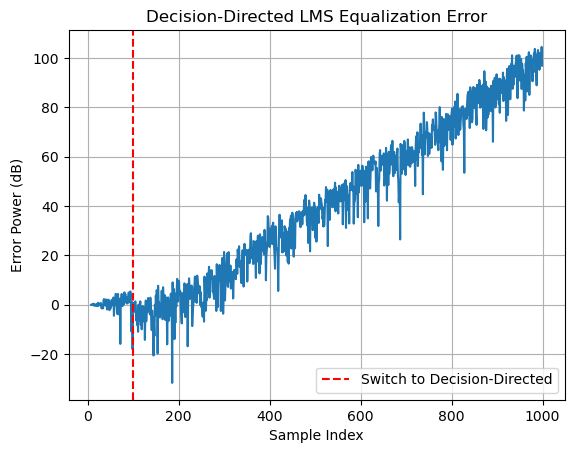

In [30]:
def decision_directed_lms(d, M, mu, switch_point=100):
    N = len(d)
    w = np.zeros(M, dtype=complex)
    y = np.zeros(N, dtype=complex)
    e = np.zeros(N, dtype=complex)
    s_hat = np.zeros(N, dtype=complex)

    for n in range(M, N):
        x_n = d[n:n-M:-1]
        y[n] = np.dot(w.conj(), x_n)

        # Phase 1: Training (use known symbol)
        if n < switch_point:
            s_ref = symbols[n]  # known symbols for training
        else:
            s_ref = np.sign(y[n].real) + 0j  # decision-directed BPSK

        e[n] = s_ref - y[n]
        w = w + mu * e[n] * x_n.conj()
        s_hat[n] = s_ref

    return y, e, s_hat

# Reuse r (Rayleigh + Doppler faded signal) from before
switch_point = 100  # use 100 training symbols
y_dd, e_dd, s_hat_dd = decision_directed_lms(r, M, mu, switch_point)

# BER calculation after switching point
ber_dd = np.mean(s_hat_dd[switch_point:].real != symbols[switch_point:])
print(f"Decision-Directed LMS BER: {ber_dd:.4f}")

plt.plot(10 * np.log10(np.abs(e_dd)**2))
plt.axvline(x=switch_point, color='r', linestyle='--', label='Switch to Decision-Directed')
plt.title("Decision-Directed LMS Equalization Error")
plt.xlabel("Sample Index")
plt.ylabel("Error Power (dB)")
plt.legend()
plt.grid(True)
plt.show()


### Multipath OFDM channel

Applying **LMS and RLS adaptive filters to a multipath OFDM channel**, where **channel equalization** is needed to counteract **frequency-selective fading**.

OFDM converts a **frequency-selective wideband channel** into **many flat narrowband subchannels**, using:

* IFFT at the transmitter (to generate the time-domain signal)
* FFT at the receiver (to recover per-subcarrier data)

### Multipath Channel Model (Discrete-Time):

$$
h[n] = \sum_{l=0}^{L-1} h_l \cdot \delta(n - \tau_l)
$$

Where:

* $h_l$: complex gain of path $l$
* $\tau_l$: delay of path $l$
* $L$: number of paths

### Challenge: Frequency-Selective Fading

Even though OFDM handles this well via subcarrier orthogonality, **each subcarrier is still affected by a complex fading coefficient** $H[k]$, the DFT of $h[n]$.

Thus, the received subcarrier:

$$
Y[k] = H[k] \cdot X[k] + N[k]
$$

To decode $X[k]$, we need an accurate estimate of $H[k]$.

### Goal: Channel Estimation for $H[k]$

* **Traditional method**: Use pilots + least squares (LS)
* **Adaptive method**: Use **LMS or RLS** to **track $H[k]$** over time (per subcarrier)

### LMS for OFDM Channel Estimation

### LMS Update Per Subcarrier:

$$
\hat{Y}[k] = \hat{H}[k](n) \cdot X[k](n)
$$

$$
e[k](n) = Y[k](n) - \hat{Y}[k]
$$

$$
\hat{H}[k](n+1) = \hat{H}[k](n) + \mu \cdot e[k](n) \cdot X^*[k](n)
$$

Where:

* $\hat{H}[k](n)$: Estimate of channel on subcarrier $k$
* $X[k](n)$: Transmitted symbol
* $Y[k](n)$: Received symbol
* $\mu$: LMS step size

**Per-subcarrier LMS** allows independent adaptation of fading coefficients.

### RLS for OFDM Channel Estimation

### RLS minimizes exponentially weighted LS error:

$$
J_k(n) = \sum_{i=0}^{n} \lambda^{n-i} \left|Y[k](i) - \hat{H}[k](n) X[k](i)\right|^2
$$

### RLS Update Per Subcarrier:

Let:

* $\mathbf{P}_k(n)$: Inverse correlation scalar (since scalar case)
* $\hat{H}_k(n)$: Channel estimate

Steps:

1. **Gain**:

   $$
   g_k(n) = \frac{P_k(n-1) X^*[k](n)}{\lambda + P_k(n-1) |X[k](n)|^2}
   $$
2. **Update**:

   $$
   \hat{H}[k](n) = \hat{H}[k](n-1) + g_k(n) \cdot \left(Y[k](n) - \hat{H}[k](n-1) X[k](n)\right)
   $$
3. **Update inverse correlation**:

   $$
   P_k(n) = \frac{1}{\lambda} \left(P_k(n-1) - g_k(n) X[k](n) P_k(n-1)\right)
   $$

RLS provides **faster convergence** than LMS, important for **fast-varying channels**.


### Pilot-Aided Adaptive Estimation

### How pilots are used:

* Every OFDM symbol includes **known pilot subcarriers**.
* LMS or RLS updates are performed **only on pilot subcarriers**.
* **Interpolated estimates** used for data subcarriers (linear, spline, or frequency-domain Wiener)

### Channel Tracking Over Time

For time-varying (Doppler-affected) channels, adaptive filters:

* Update channel estimates per subcarrier every OFDM symbol.
* Can be **decision-directed** after pilot phase: use $\hat{X}[k]$ in place of true $X[k]$.

### Summary of LMS/RLS for OFDM Channel Estimation

| Feature          | LMS                         | RLS                               |
| ---------------- | --------------------------- | --------------------------------- |
| Update type      | Stochastic gradient descent | Recursive least squares           |
| Complexity       | $O(N)$ per OFDM symbol      | $O(N)$, slightly higher           |
| Adaptation speed | Moderate                    | Very fast                         |
| Use case         | Low-mobility or slow fading | High-mobility or fast fading      |
| Stability        | Depends on step size        | Requires forgetting factor tuning |




/var/folders/s3/38gpf0796ls5pl2z8c7czftr0000gn/T/ipykernel_39490/166086627.py:73: ComplexWarning: Casting complex values to real discards the imaginary part
  P[k] = (1/lam) * (Pi - g * x * Pi)


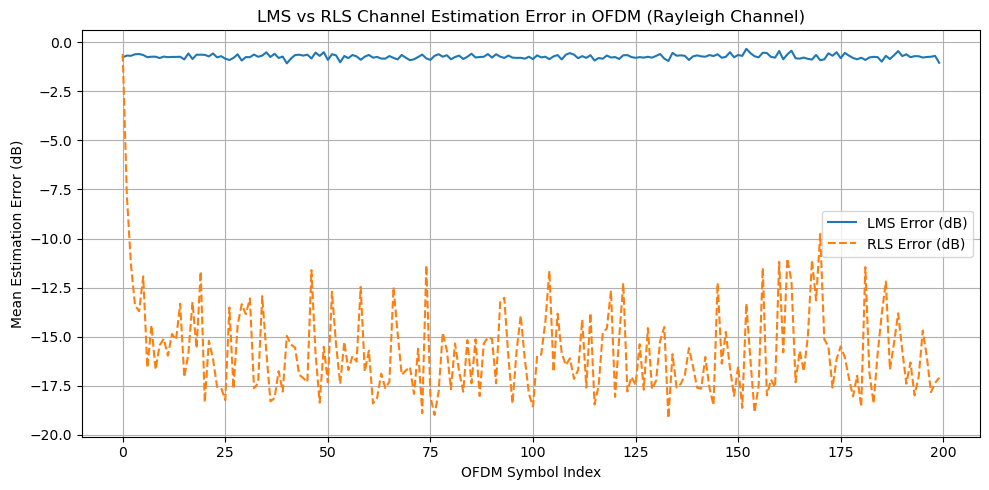

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# === 1. System Parameters ===
N = 64                     # OFDM subcarriers
num_symbols = 200         # OFDM symbols
cp_len = 16               # Cyclic prefix length
mu = 0.01                 # LMS step size
lam = 0.99                # RLS forgetting factor
delta = 1.0               # RLS regularization

# === 2. QPSK Modulation ===
def qpsk_mod(bits):
    return (2 * bits[0::2] - 1) + 1j * (2 * bits[1::2] - 1)

def qpsk_demod(symbols):
    bits = np.zeros(2 * len(symbols), dtype=int)
    bits[0::2] = (symbols.real > 0).astype(int)
    bits[1::2] = (symbols.imag > 0).astype(int)
    return bits

# === 3. Rayleigh Multipath Channel ===
def multipath_channel(signal, L=5):
    taps = (np.random.randn(L) + 1j*np.random.randn(L)) / np.sqrt(2*L)
    return np.convolve(signal, taps, mode='same'), taps

# === 4. OFDM Functions ===
def add_cp(ofdm_symbol, cp_len):
    return np.concatenate([ofdm_symbol[-cp_len:], ofdm_symbol])

def remove_cp(signal, cp_len):
    return signal[cp_len:]

# === 5. Generate Data ===
bits = np.random.randint(0, 2, N * 2 * num_symbols)
qpsk_symbols = qpsk_mod(bits)
data_symbols = qpsk_symbols.reshape(num_symbols, N)
pilot_symbols = data_symbols.copy()  # Full pilot-based

# === 6. OFDM Transmission ===
tx_signal = []
for symbol in pilot_symbols:
    ofdm_time = np.fft.ifft(symbol)
    with_cp = add_cp(ofdm_time, cp_len)
    tx_signal.extend(with_cp)
tx_signal = np.array(tx_signal)

# === 7. Channel + Noise ===
rx_signal, h_true = multipath_channel(tx_signal)
rx_signal += 0.01 * (np.random.randn(*rx_signal.shape) + 1j*np.random.randn(*rx_signal.shape))

# === 8. Channel Estimation Functions ===
def lms_channel_estimation(rx_ofdm, tx_ofdm, mu):
    H_est = np.zeros(N, dtype=complex)
    err = np.zeros(N)
    for k in range(N):
        H_est[k] += mu * (rx_ofdm[k] - H_est[k]*tx_ofdm[k]) * np.conj(tx_ofdm[k])
        err[k] = np.abs(rx_ofdm[k] - H_est[k]*tx_ofdm[k])**2
    return H_est, err

def rls_channel_estimation(rx_ofdm, tx_ofdm, H_est_prev, P_prev, lam, delta):
    H_est = H_est_prev.copy()
    P = P_prev.copy()
    err = np.zeros(N)
    for k in range(N):
        x = tx_ofdm[k]
        y = rx_ofdm[k]
        Pi = P[k]
        g = (Pi * np.conj(x)) / (lam + Pi * np.abs(x)**2)
        e = y - H_est[k]*x
        H_est[k] += g * e
        P[k] = (1/lam) * (Pi - g * x * Pi)
        err[k] = np.abs(e)**2
    return H_est, P, err

# === 9. Run Estimation Over Time ===
H_lms_all = []
H_rls_all = []
P_rls = np.ones(N) / delta
H_rls = np.zeros(N, dtype=complex)
H_lms = np.zeros(N, dtype=complex)

lms_err_avg = []
rls_err_avg = []

for i in range(num_symbols):
    start = i*(N+cp_len)
    rx_sym = rx_signal[start : start+N+cp_len]
    rx_ofdm = np.fft.fft(remove_cp(rx_sym, cp_len))
    tx_ofdm = pilot_symbols[i]

    # LMS update
    H_lms, err_lms = lms_channel_estimation(rx_ofdm, tx_ofdm, mu)
    H_lms_all.append(H_lms.copy())
    lms_err_avg.append(np.mean(err_lms))

    # RLS update
    H_rls, P_rls, err_rls = rls_channel_estimation(rx_ofdm, tx_ofdm, H_rls, P_rls, lam, delta)
    H_rls_all.append(H_rls.copy())
    rls_err_avg.append(np.mean(err_rls))

# === 10. Visualization ===
df_errors = pd.DataFrame({
    "Symbol Index": np.arange(num_symbols),
    "LMS Error": lms_err_avg,
    "RLS Error": rls_err_avg
})

plt.figure(figsize=(10, 5))
plt.plot(df_errors["Symbol Index"], 10 * np.log10(df_errors["LMS Error"] + 1e-6), label='LMS Error (dB)')
plt.plot(df_errors["Symbol Index"], 10 * np.log10(df_errors["RLS Error"] + 1e-6), label='RLS Error (dB)', linestyle='--')
plt.title("LMS vs RLS Channel Estimation Error in OFDM (Rayleigh Channel)")
plt.xlabel("OFDM Symbol Index")
plt.ylabel("Mean Estimation Error (dB)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


---

# Kalman Filter: Theory and Application in Wireless Communications

The **Kalman Filter** is an optimal recursive algorithm used for **estimating the state** of a **linear dynamic system** from a series of noisy measurements. It is widely used in signal processing, control systems, and communications, particularly where system states (e.g., channel conditions, user positions) must be estimated in real-time.

### System Model

A **discrete-time linear state-space model** is defined by:

**State Transition (Prediction):**

$$
\mathbf{x}_k = \mathbf{A}_k \mathbf{x}_{k-1} + \mathbf{B}_k \mathbf{u}_k + \mathbf{w}_k
$$

**Measurement (Observation):**

$$
\mathbf{z}_k = \mathbf{H}_k \mathbf{x}_k + \mathbf{v}_k
$$

Where:

* $\mathbf{x}_k \in \mathbb{R}^n$: system state at time $k$
* $\mathbf{u}_k$: control input (optional)
* $\mathbf{z}_k \in \mathbb{R}^m$: observation vector
* $\mathbf{A}_k$: state transition matrix
* $\mathbf{B}_k$: control input matrix
* $\mathbf{H}_k$: observation matrix
* $\mathbf{w}_k \sim \mathcal{N}(0, \mathbf{Q}_k)$: process noise
* $\mathbf{v}_k \sim \mathcal{N}(0, \mathbf{R}_k)$: measurement noise

### Kalman Filter Equations

#### **Initialization**

$$
\hat{\mathbf{x}}_0 = \mathbb{E}[\mathbf{x}_0], \quad \mathbf{P}_0 = \mathbb{E}[(\mathbf{x}_0 - \hat{\mathbf{x}}_0)(\mathbf{x}_0 - \hat{\mathbf{x}}_0)^\top]
$$

#### **Prediction Step**

$$
\hat{\mathbf{x}}_{k|k-1} = \mathbf{A}_k \hat{\mathbf{x}}_{k-1|k-1} + \mathbf{B}_k \mathbf{u}_k
$$

$$
\mathbf{P}_{k|k-1} = \mathbf{A}_k \mathbf{P}_{k-1|k-1} \mathbf{A}_k^\top + \mathbf{Q}_k
$$

#### **Update Step**

Compute the **Kalman Gain**:

$$
\mathbf{K}_k = \mathbf{P}_{k|k-1} \mathbf{H}_k^\top \left( \mathbf{H}_k \mathbf{P}_{k|k-1} \mathbf{H}_k^\top + \mathbf{R}_k \right)^{-1}
$$

Update the state estimate:

$$
\hat{\mathbf{x}}_{k|k} = \hat{\mathbf{x}}_{k|k-1} + \mathbf{K}_k (\mathbf{z}_k - \mathbf{H}_k \hat{\mathbf{x}}_{k|k-1})
$$

Update the covariance estimate:

$$
\mathbf{P}_{k|k} = (\mathbf{I} - \mathbf{K}_k \mathbf{H}_k) \mathbf{P}_{k|k-1}
$$

### Applications in Wireless Communications

#### 4.1. **Channel Estimation**

In OFDM or MIMO systems, the wireless channel is often time-varying. Kalman filters can track the channel state:

* **State:** Channel coefficients $h_k$
* **Measurement:** Received pilot signals $y_k$
* **Goal:** Track slowly varying channel fading (e.g., Rayleigh/Rician with Doppler)

#### 4.2. **User Localization and Tracking**

Used in indoor/outdoor environments with GPS, WiFi, LiDAR, or IR:

* **State:** User position and velocity
* **Measurement:** RSSI, ToA, AoA, camera/LiDAR data
* **Kalman Filter Role:** Track user movement under noise, predict next position

#### 4.3. **Power Control and Adaptive Modulation**

* Predict SINR or channel quality indicators
* Adjust power level or modulation scheme based on predicted future state

#### 4.4. **Beam Tracking in mmWave/THz**

* Beam alignment in mobile scenarios requires real-time user tracking
* Kalman filters can smooth feedback data to track and predict direction

### Extended Kalman Filter (EKF)

When the system is **non-linear**, we extend Kalman filtering using linearization:

Let:

$$
\mathbf{x}_k = f(\mathbf{x}_{k-1}, \mathbf{u}_k) + \mathbf{w}_k
$$

$$
\mathbf{z}_k = h(\mathbf{x}_k) + \mathbf{v}_k
$$

The Jacobians:

$$
\mathbf{F}_k = \frac{\partial f}{\partial \mathbf{x}} \bigg|_{\hat{\mathbf{x}}_{k-1}}, \quad \mathbf{H}_k = \frac{\partial h}{\partial \mathbf{x}} \bigg|_{\hat{\mathbf{x}}_k}
$$

Then follow the same prediction and update structure using these Jacobians.



---

## Kalman Filter for Channel Estimation

### Signal model:

$$
y_k = h_k x_k + n_k
$$

Where:

* $y_k$: received signal
* $x_k$: known pilot symbol
* $h_k$: time-varying channel coefficient (complex)
* $n_k \sim \mathcal{CN}(0, \sigma_n^2)$: complex Gaussian noise

We assume:

$$
h_k = \alpha h_{k-1} + w_k
$$

* $\alpha \in (0, 1]$: time correlation (from Jakes model or Doppler spectrum)
* $w_k \sim \mathcal{CN}(0, \sigma_w^2)$: channel process noise

### Kalman Filter Setup (for complex signals)

Since Kalman filter is defined for real values, we treat real and imaginary parts separately.

Let:

$$
\mathbf{x}_k =
\begin{bmatrix}
\text{Re}(h_k) \\
\text{Im}(h_k)
\end{bmatrix}, \quad
\mathbf{z}_k =
\begin{bmatrix}
\text{Re}(y_k) \\
\text{Im}(y_k)
\end{bmatrix}
$$


* **Assumption**: Pilot symbol is known and constant.
* **Fading**: Modeled using AR(1) process with $\alpha$, which simulates slow Rayleigh fading.
* **Process noise** $\sigma_w$: Controls how rapidly the channel changes.
* **AWGN noise** $\sigma_n$: Represents receiver noise.


### Extension Ideas

* Use **Extended Kalman Filter (EKF)** for non-linear models (e.g., Doppler + angle of arrival).
* Apply for **multi-carrier OFDM**, estimating each subcarrier independently or using correlation.
* Integrate **Kalman Smoother** for offline tracking improvement.
* Adapt for **MIMO channel estimation**, with vector or matrix states.



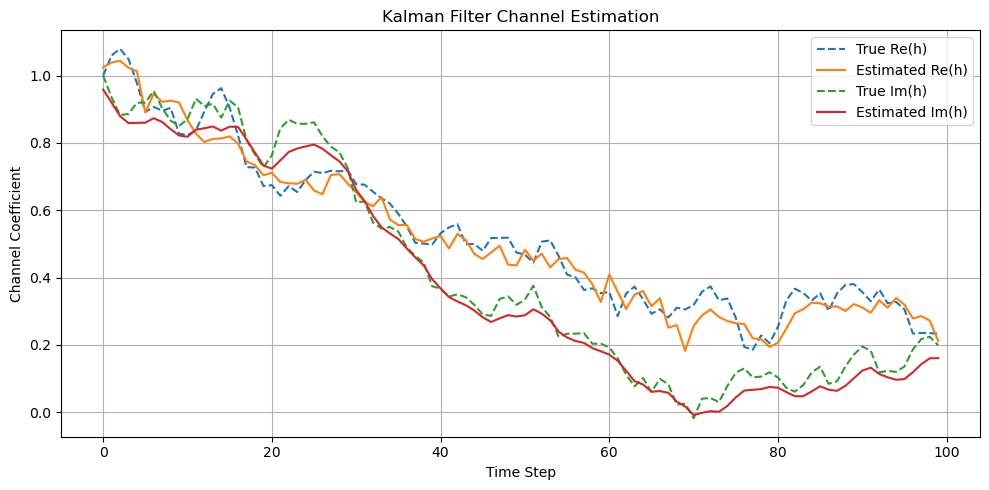

In [ ]:
num_steps = 100
alpha = 0.98              # Channel correlation (close to 1 = slow fading)
sigma_w = 0.05            # Process noise std (channel variation)
sigma_n = 0.1             # AWGN noise std

# Pilot symbol (unit magnitude)
x_k = 1 + 0j

# True channel initialization
h_true = np.zeros(num_steps, dtype=complex)
h_true[0] = 1 + 1j

# Generate time-varying channel
for k in range(1, num_steps):
    w_k = sigma_w * (np.random.randn() + 1j * np.random.randn()) / np.sqrt(2)
    h_true[k] = alpha * h_true[k-1] + w_k

# Generate noisy observations
y = h_true * x_k + sigma_n * (np.random.randn(num_steps) + 1j * np.random.randn()) / np.sqrt(2)

# Kalman Filter Initialization
x_est = np.zeros((2, num_steps))    # [Re(h), Im(h)]
P = np.eye(2) * 1.0                 # Covariance
Q = np.eye(2) * sigma_w**2         # Process noise
R = np.eye(2) * sigma_n**2         # Measurement noise
A = np.eye(2) * alpha              # State transition
H = np.eye(2)                      # Measurement matrix

# Store estimates
h_est = np.zeros(num_steps, dtype=complex)

for k in range(num_steps):
    # Measurement
    z = np.array([y[k].real, y[k].imag])

    # Predict
    x_pred = A @ x_est[:, k-1] if k > 0 else np.array([0, 0])
    P_pred = A @ P @ A.T + Q

    # Kalman Gain
    S = H @ P_pred @ H.T + R
    K = P_pred @ H.T @ np.linalg.inv(S)

    # Update
    x_est[:, k] = x_pred + K @ (z - H @ x_pred)
    P = (np.eye(2) - K @ H) @ P_pred

    # Combine real and imaginary to complex
    h_est[k] = x_est[0, k] + 1j * x_est[1, k]

# Plot
plt.figure(figsize=(10, 5))
plt.plot(np.real(h_true), label="True Re(h)", linestyle='--')
plt.plot(np.real(h_est), label="Estimated Re(h)")
plt.plot(np.imag(h_true), label="True Im(h)", linestyle='--')
plt.plot(np.imag(h_est), label="Estimated Im(h)")
plt.xlabel("Time Step")
plt.ylabel("Channel Coefficient")
plt.legend()
plt.title("Kalman Filter Channel Estimation")
plt.grid(True)
plt.tight_layout()
plt.show()


---

## Kalman Filter for Localization and Tracking

Kalman filters are widely used in **indoor/outdoor localization**, **user equipment (UE) tracking**, **robotics**, and **wireless mobility prediction** using noisy measurements like:

* **Time of Arrival (ToA)**
* **Angle of Arrival (AoA)**
* **Received Signal Strength (RSSI)**
* **Camera/LiDAR position estimates**


### Motion Model

Let the state vector represent **2D position and velocity**:

$$
\mathbf{x}_k =
\begin{bmatrix}
x_k \\
y_k \\
v_{x,k} \\
v_{y,k}
\end{bmatrix}
$$

#### State Transition (constant velocity model):

$$
\mathbf{x}_k = \mathbf{A} \mathbf{x}_{k-1} + \mathbf{w}_k
$$

$$
\mathbf{A} =
\begin{bmatrix}
1 & 0 & \Delta t & 0 \\
0 & 1 & 0 & \Delta t \\
0 & 0 & 1 & 0 \\
0 & 0 & 0 & 1
\end{bmatrix}
$$

$$
\mathbf{w}_k \sim \mathcal{N}(0, \mathbf{Q}) \quad \text{(process noise)}
$$


### Measurement Model

Assume we observe the user's **position only** (e.g., from RSSI/ToA localization):

$$
\mathbf{z}_k =
\begin{bmatrix}
x_k \\
y_k
\end{bmatrix}
= \mathbf{H} \mathbf{x}_k + \mathbf{v}_k
\quad \text{where} \quad
\mathbf{H} =
\begin{bmatrix}
1 & 0 & 0 & 0 \\
0 & 1 & 0 & 0
\end{bmatrix}
$$

$$
\mathbf{v}_k \sim \mathcal{N}(0, \mathbf{R}) \quad \text{(measurement noise)}
$$

### Advantages

* Smoothes noisy measurements
* Predicts future position (for handover, beamforming, etc.)
* Lightweight and real-time capable

### Use Cases in Wireless:

| Use Case                        | Measurement Source        |
| ------------------------------- | ------------------------- |
| Indoor positioning              | WiFi RSSI, BLE, UWB       |
| Mobility prediction for 5G beam | ToA, AoA, GNSS            |
| Drone/robot tracking            | IMU + camera/LiDAR fusion |
| Handover preparation            | Predicts UE next location |



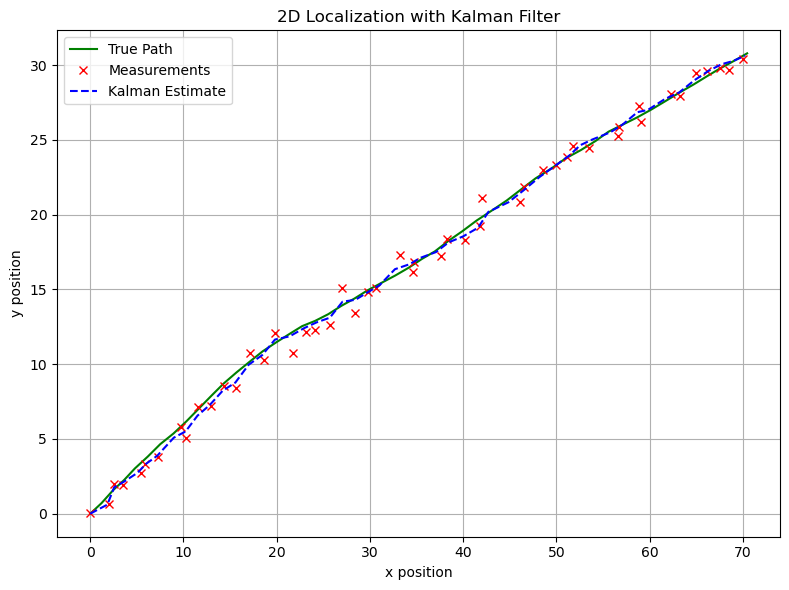

In [ ]:
# Time step and number of steps
dt = 1.0
N = 50

# True motion: constant velocity
x_true = np.zeros((4, N))  # [x, y, vx, vy]
x_true[:, 0] = [0, 0, 1.2, 0.8]  # initial position and velocity

# Process and measurement noise
sigma_process = 0.05
sigma_measure = 0.5

# Matrices
A = np.array([[1, 0, dt, 0],
              [0, 1, 0, dt],
              [0, 0, 1,  0],
              [0, 0, 0,  1]])

H = np.array([[1, 0, 0, 0],
              [0, 1, 0, 0]])

Q = sigma_process**2 * np.eye(4)
R = sigma_measure**2 * np.eye(2)

# Generate true trajectory
for k in range(1, N):
    process_noise = sigma_process * np.random.randn(4)
    x_true[:, k] = A @ x_true[:, k-1] + process_noise

# Simulated noisy measurements
z = H @ x_true + sigma_measure * np.random.randn(2, N)

# Kalman filter initialization
x_est = np.zeros((4, N))
P = np.eye(4)
x_est[:, 0] = [0, 0, 0, 0]  # initial guess

for k in range(1, N):
    # Prediction
    x_pred = A @ x_est[:, k-1]
    P_pred = A @ P @ A.T + Q

    # Update
    K = P_pred @ H.T @ np.linalg.inv(H @ P_pred @ H.T + R)
    x_est[:, k] = x_pred + K @ (z[:, k] - H @ x_pred)
    P = (np.eye(4) - K @ H) @ P_pred

# Plotting
plt.figure(figsize=(8, 6))
plt.plot(x_true[0], x_true[1], 'g-', label='True Path')
plt.plot(z[0], z[1], 'rx', label='Measurements')
plt.plot(x_est[0], x_est[1], 'b--', label='Kalman Estimate')
plt.legend()
plt.xlabel('x position')
plt.ylabel('y position')
plt.title('2D Localization with Kalman Filter')
plt.grid(True)
plt.tight_layout()
plt.show()


## Extended Kalman Filter (EKF) for RSSI-Based Localization

We want to estimate the **2D position** of a user using noisy **Received Signal Strength Indicator (RSSI)** measurements from multiple known anchor nodes (e.g., Wi-Fi routers or BLE beacons).

### 2. State Definition

We define the state as:

$$
\mathbf{x}_k =
\begin{bmatrix}
x_k \\
y_k
\end{bmatrix}
$$

There is **no velocity** modeled (can be added later). The user moves slowly or is quasi-static.

### RSSI Measurement Model (Non-linear)

From the **log-distance path loss model**:

$$
\text{RSSI}_i = P_0 - 10n \log_{10}(d_i) + v_i
$$

where:

* $d_i = \sqrt{(x - x_i)^2 + (y - y_i)^2}$ is the distance to anchor $i$
* $P_0$: RSSI at 1 meter
* $n$: path loss exponent
* $v_i \sim \mathcal{N}(0, \sigma^2)$: Gaussian noise

This gives a **nonlinear measurement function**:

$$
\mathbf{z}_k =
\begin{bmatrix}
\text{RSSI}_1 \\
\text{RSSI}_2 \\
\vdots \\
\text{RSSI}_M
\end{bmatrix}
= h(\mathbf{x}_k) + \mathbf{v}_k
$$


### EKF Algorithm

#### Prediction (static motion model):

$$
\hat{\mathbf{x}}_{k|k-1} = \hat{\mathbf{x}}_{k-1}
$$

$$
\mathbf{P}_{k|k-1} = \mathbf{P}_{k-1} + \mathbf{Q}
$$

#### Update:

1. Compute **nonlinear measurement**:

   $$
   \hat{z}_i = P_0 - 10n \log_{10}( \| \hat{\mathbf{x}}_{k|k-1} - \mathbf{a}_i \| )
   $$

2. Compute **Jacobian $\mathbf{H}_k$**:

   $$
   H_k(i, :) = \frac{10n}{\ln(10)} \cdot \frac{(\hat{\mathbf{x}}_{k|k-1} - \mathbf{a}_i)^\top}{\| \hat{\mathbf{x}}_{k|k-1} - \mathbf{a}_i \|^2}
   $$

3. Kalman Gain, Update Step:

$$
\mathbf{K}_k = \mathbf{P}_{k|k-1} \mathbf{H}_k^\top ( \mathbf{H}_k \mathbf{P}_{k|k-1} \mathbf{H}_k^\top + \mathbf{R} )^{-1}
$$

$$
\hat{\mathbf{x}}_k = \hat{\mathbf{x}}_{k|k-1} + \mathbf{K}_k ( \mathbf{z}_k - h(\hat{\mathbf{x}}_{k|k-1}) )
$$

$$
\mathbf{P}_k = (\mathbf{I} - \mathbf{K}_k \mathbf{H}_k) \mathbf{P}_{k|k-1}
$$


### Extensions

* Add motion model (velocity, acceleration)
* Use more anchor points for better accuracy
* Fuse with IMU/GNSS for robust localization (sensor fusion)
* Use **UKF** or **Particle Filters** for more accurate nonlinear handling
* Real-time tracking (with user movement)
* 3D positioning (x, y, z)
* Fusion with angle-of-arrival or time-of-flight measurements


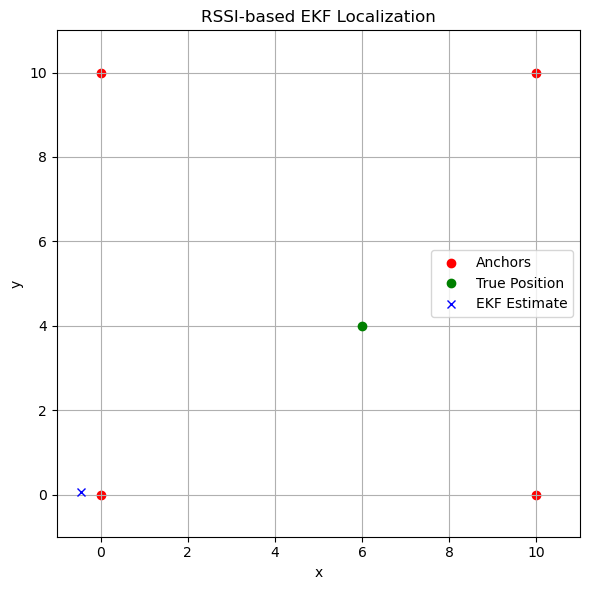

In [6]:
n_anchors = 4
anchor_pos = np.array([[0, 0], [10, 0], [10, 10], [0, 10]])
true_pos = np.array([6.0, 4.0])
P0 = -30         # dBm at 1m
n_pathloss = 2.0
sigma_rssi = 2.0 # dB
R = np.eye(n_anchors) * sigma_rssi**2
Q = np.eye(2) * 0.01

# Initial guess
x_est = np.array([2.0, 2.0])
P = np.eye(2)

# Generate noisy RSSI
def rssi_model(pos, anchors, P0, n):
    d = np.linalg.norm(anchors - pos, axis=1)
    return P0 - 10 * n * np.log10(d)

true_rssi = rssi_model(true_pos, anchor_pos, P0, n_pathloss)
noisy_rssi = true_rssi + np.random.randn(n_anchors) * sigma_rssi

# EKF iteration (static, 1 step)
for _ in range(10):  # repeat multiple times for convergence
    # Predict
    x_pred = x_est
    P_pred = P + Q

    # Measurement prediction
    pred_rssi = rssi_model(x_pred, anchor_pos, P0, n_pathloss)

    # Jacobian
    H = np.zeros((n_anchors, 2))
    for i in range(n_anchors):
        delta = x_pred - anchor_pos[i]
        dist_sq = np.dot(delta, delta)
        H[i, :] = (10 * n_pathloss / np.log(10)) * delta / dist_sq

    # Kalman update
    S = H @ P_pred @ H.T + R
    K = P_pred @ H.T @ np.linalg.inv(S)
    x_est = x_pred + K @ (noisy_rssi - pred_rssi)
    P = (np.eye(2) - K @ H) @ P_pred

# Plotting
plt.figure(figsize=(6, 6))
plt.scatter(anchor_pos[:, 0], anchor_pos[:, 1], c='red', label='Anchors')
plt.plot(true_pos[0], true_pos[1], 'go', label='True Position')
plt.plot(x_est[0], x_est[1], 'bx', label='EKF Estimate')
plt.xlim(-1, 11)
plt.ylim(-1, 11)
plt.grid(True)
plt.legend()
plt.title("RSSI-based EKF Localization")
plt.xlabel("x")
plt.ylabel("y")
plt.tight_layout()
plt.show()


---

# Particle Filters

A **particle filter** (also called **Sequential Monte Carlo** method) is a **Bayesian filtering technique** used for estimating the state of a system that evolves over time and is observed through noisy measurements.

Unlike the Kalman filter (which assumes linear Gaussian models), particle filters can handle **nonlinear** and **non-Gaussian** problems.

Consider a **state-space model**:

* **State evolution (process model):**

  $$
  x_k = f(x_{k-1}, v_{k-1})
  $$

  where $x_k$ is the hidden state at time $k$, $f(\cdot)$ is the transition function, and $v_{k-1}$ is the process noise.

* **Measurement model:**

  $$
  z_k = h(x_k, w_k)
  $$

  where $z_k$ is the observation, $h(\cdot)$ is the observation function, and $w_k$ is the measurement noise.

**Goal**: Estimate the posterior distribution $p(x_k | z_{1:k})$.


### Bayesian Filtering Recursion

Bayesian filtering is given by:

1. **Prediction Step**:

   $$
   p(x_k | z_{1:k-1}) = \int p(x_k | x_{k-1}) \, p(x_{k-1} | z_{1:k-1}) \, dx_{k-1}
   $$

2. **Update Step**:

   $$
   p(x_k | z_{1:k}) = \frac{p(z_k | x_k) \, p(x_k | z_{1:k-1})}{p(z_k | z_{1:k-1})}
   $$

These integrals are often intractable in nonlinear/non-Gaussian systems.


### Particle Filter Approximation

Particle filters approximate the posterior $p(x_k | z_{1:k})$ with a set of **weighted particles**:

$$
\{x_k^{(i)}, w_k^{(i)}\}_{i=1}^N
$$

where $N$ is the number of particles.

The **posterior** is approximated by:

$$
p(x_k | z_{1:k}) \approx \sum_{i=1}^N w_k^{(i)} \delta(x_k - x_k^{(i)})
$$

where $\delta(\cdot)$ is the Dirac delta function.

---

### Particle Filter Algorithm

#### Step 1: Initialization

For $i = 1, \ldots, N$:

* Sample $x_0^{(i)}$ from $p(x_0)$
* Set weights $w_0^{(i)} = \frac{1}{N}$


#### Step 2: For each time step $k$:

**a. Sampling (Prediction):**

$$
x_k^{(i)} \sim p(x_k | x_{k-1}^{(i)})
$$

**b. Weighting (Correction):**

$$
w_k^{(i)} \propto w_{k-1}^{(i)} \, p(z_k | x_k^{(i)})
$$

Normalize weights:

$$
w_k^{(i)} = \frac{w_k^{(i)}}{\sum_{j=1}^N w_k^{(j)}}
$$

**c. Resampling:**

* To avoid degeneracy (where all weights except one go to zero), resample particles according to their weights.
* After resampling, set all weights to $\frac{1}{N}$.


### Importance Sampling

Particle filters use **importance sampling** to handle intractable integrals.

Given a proposal distribution $q(x_k | x_{k-1}, z_k)$, the weight update is:

$$
w_k^{(i)} \propto w_{k-1}^{(i)} \frac{p(z_k | x_k^{(i)}) p(x_k^{(i)} | x_{k-1}^{(i)})}{q(x_k^{(i)} | x_{k-1}^{(i)}, z_k)}
$$

The **bootstrap filter** is a special case where $q = p(x_k | x_{k-1})$.


### Summary

At time $k$:

* Sample:

  $$
  x_k^{(i)} \sim q(x_k | x_{k-1}^{(i)}, z_k)
  $$

* Compute weights:

  $$
  w_k^{(i)} \propto w_{k-1}^{(i)} \frac{p(z_k | x_k^{(i)}) p(x_k^{(i)} | x_{k-1}^{(i)})}{q(x_k^{(i)} | x_{k-1}^{(i)}, z_k)}
  $$

* Normalize:

  $$
  w_k^{(i)} = \frac{w_k^{(i)}}{\sum_{j=1}^N w_k^{(j)}}
  $$

* Resample:

  * Draw $N$ particles from the current set with probabilities proportional to $w_k^{(i)}$.
  * Reset weights to $\frac{1}{N}$.


### Advantages and Challenges

**Advantages:**

* Handles nonlinear/non-Gaussian systems
* Flexible choice of models

**Challenges:**

* Computationally expensive for large $N$
* Weight degeneracy without careful resampling
* Curse of dimensionality in high-dimensional state spaces


### Applications in Wireless Communications

Particle filters are widely used in wireless systems for **state estimation** problems that are nonlinear or non-Gaussian. Common applications include:

#### Mobile User Tracking and Localization

* **Indoor positioning** using RSSI, TOA, TDOA measurements
* Nonlinear observation models due to multipath or NLOS conditions

Example state:

$$
x_k = [\text{position}, \text{velocity}]
$$

Measurement model:

$$
z_k = h(x_k) + w_k
$$

Particle filters track user trajectories with better accuracy than EKF in complex environments.


#### Channel Estimation in Time-Varying Fading Channels

* For rapidly time-varying channels (e.g., high-mobility scenarios)
* Model channel coefficients as state variables evolving with Doppler shifts
* Nonlinear or non-Gaussian fading models

State evolution:

$$
h_k = f(h_{k-1}, v_{k-1})
$$

Measurement:

$$
y_k = x_k h_k + n_k
$$

#### Joint Parameter and State Estimation

* Estimating static parameters (e.g., path loss exponent) alongside dynamic states
* Adaptive channel tracking with varying environments


#### Cooperative Localization in Wireless Sensor Networks

* Nodes share observations to track positions
* Nonlinear observation functions (e.g., distance from RSSI)
* Particle filters fuse distributed measurements


#### Multi-Target Tracking

* Tracking multiple users/devices simultaneously
* Data association and clutter handling


### References for Further Reading

1. Arulampalam, M. S., Maskell, S., Gordon, N., & Clapp, T. (2002). "A tutorial on particle filters for online nonlinear/non-Gaussian Bayesian tracking." *IEEE Transactions on Signal Processing*, 50(2), 174–188.
2. Gustafsson, F. (2010). "Particle filter theory and practice with positioning applications." *IEEE Aerospace and Electronic Systems Magazine*, 25(7), 53–82.
3. Ristic, B., Arulampalam, S., & Gordon, N. (2004). *Beyond the Kalman Filter: Particle Filters for Tracking Applications*. Artech House.




---

## Particle Filters for User Localization in Wireless Networks

User localization is the task of estimating a user's **position** over time using measurements (e.g., RSSI, TOA, TDOA) from wireless signals.

* The problem is **dynamic**: the user moves over time.
* The **observation model** is typically **nonlinear**.
* Measurements can be noisy and multipath/NLOS conditions can make them **non-Gaussian**.

Because of these challenges, **particle filters** are well suited.


### State-Space Model for Localization

We model the user motion and measurements as:

#### State Evolution

The user state at time $k$ is:

$$
x_k = \begin{bmatrix} p_k \\ v_k \end{bmatrix}
$$

where:

* $p_k$ = position vector (e.g., 2D or 3D)
* $v_k$ = velocity vector

Assume **constant velocity model**:

$$
x_k = F x_{k-1} + v_{k-1}
$$

where:

* $F$ is the state transition matrix
* $v_{k-1} \sim \mathcal{N}(0, Q)$ is process noise

Example 2D model:

$$
F = \begin{bmatrix}
1 & 0 & \Delta t & 0 \\
0 & 1 & 0 & \Delta t \\
0 & 0 & 1 & 0 \\
0 & 0 & 0 & 1
\end{bmatrix}
$$


#### Measurement Model

Consider **range measurements** (e.g., TOA-derived distances) from $M$ anchors at known positions $s_m$:

$$
z_k^m = \| p_k - s_m \| + w_k^m
$$

where:

* $z_k^m$ = observed range to anchor $m$
* $w_k^m \sim \mathcal{N}(0, R_m)$ = measurement noise

This observation model is **nonlinear** in $p_k$.


### Bayesian Filtering for Localization

Goal: compute the **posterior distribution** of position and velocity given measurements:

$$
p(x_k | z_{1:k})
$$

where $z_{1:k} = \{ z_1, z_2, \ldots, z_k \}$.


### Particle Filter for Localization

We approximate $p(x_k | z_{1:k})$ with $N$ particles:

$$
\{ x_k^{(i)}, w_k^{(i)} \}_{i=1}^N
$$

Each particle represents a **hypothesis** about the user's state.



### Algorithm Steps

#### Initialization

For $i = 1, \ldots, N$:

* Sample initial state:

  $$
  x_0^{(i)} \sim p(x_0)
  $$

* Set weights:

  $$
  w_0^{(i)} = \frac{1}{N}
  $$


#### For each time step $k$:

**a. Prediction Step**

Sample from the motion model:

$$
x_k^{(i)} = F x_{k-1}^{(i)} + v_{k-1}^{(i)}, \quad v_{k-1}^{(i)} \sim \mathcal{N}(0, Q)
$$


**b. Update Step**

For each particle $i$, compute the **likelihood** of the measurement:

$$
p(z_k | x_k^{(i)}) = \prod_{m=1}^M \frac{1}{\sqrt{2\pi R_m}} \exp \left( -\frac{(z_k^m - \hat{z}_k^m(x_k^{(i)}))^2}{2 R_m} \right)
$$

where:

$$
\hat{z}_k^m(x_k^{(i)}) = \| p_k^{(i)} - s_m \|
$$

Update weights:

$$
w_k^{(i)} \propto w_{k-1}^{(i)} \, p(z_k | x_k^{(i)})
$$

Normalize:

$$
w_k^{(i)} = \frac{w_k^{(i)}}{\sum_{j=1}^N w_k^{(j)}}
$$


**c. Resampling Step**

If the **effective sample size** $N_{\text{eff}}$ is low:

$$
N_{\text{eff}} = \frac{1}{\sum_{i=1}^N (w_k^{(i)})^2}
$$

perform resampling:

* Draw $N$ new particles from the current set with probabilities $w_k^{(i)}$.
* Reset weights to $\frac{1}{N}$.


**d. Estimate State**

Estimate position and velocity as the **weighted mean**:

$$
\hat{x}_k = \sum_{i=1}^N w_k^{(i)} x_k^{(i)}
$$



### Example: 2D Localization

* Anchors at known positions $s_1, s_2, s_3$.
* User state $x_k = [x, y, v_x, v_y]^T$.
* Measurements:

  $$
  z_k^m = \sqrt{(x - s_m^x)^2 + (y - s_m^y)^2} + w_k^m
  $$

Particle filter steps:

1. **Prediction**: sample next (x, y, v\_x, v\_y) using constant velocity model plus noise.
2. **Measurement likelihood**: compute expected range to anchors for each particle.
3. **Weight update**: using Gaussian likelihood.
4. **Resampling**: if necessary.
5. **Estimate**: mean of particles.


### Practical Considerations

* **Number of particles**: balance between accuracy and computational cost.
* **Process noise covariance $Q$**: models user motion uncertainty.
* **Measurement noise covariance $R$**: depends on environment (NLOS, multipath).
* **Resampling strategy**: systematic, stratified, or multinomial.


### Advantages in Wireless Localization

* Handles **nonlinearity** of range/bearing measurements.
* Robust to **non-Gaussian noise** (e.g., outliers from NLOS).
* Can incorporate **map constraints** or motion models easily.
* Can fuse **heterogeneous measurements** (e.g., RSSI, TOA, inertial data).


### Extensions

* **Simultaneous Localization and Mapping (SLAM)**: estimate both user position and map features.
* **Cooperative Localization**: fusing measurements from multiple devices.
* **Parameter estimation**: jointly estimate path loss exponent or noise levels.


### References

* Arulampalam, M. S., Maskell, S., Gordon, N., & Clapp, T. (2002). "A tutorial on particle filters for online nonlinear/non-Gaussian Bayesian tracking." *IEEE Transactions on Signal Processing*, 50(2), 174–188.
* Gustafsson, F. (2010). "Particle filter theory and practice with positioning applications." *IEEE Aerospace and Electronic Systems Magazine*, 25(7), 53–82.
* Ristic, B., Arulampalam, S., & Gordon, N. (2004). *Beyond the Kalman Filter: Particle Filters for Tracking Applications*. Artech House.




---

## **A simple 2D user localization example using a particle filter**.

* Defines a user moving in 2D with constant velocity.
* Simulates noisy range measurements to fixed anchors.
* Uses a particle filter to estimate the user position over time.


1. **Simulation**:

   * Defines three fixed anchors in 2D.
   * Simulates a moving user with constant velocity + process noise.
   * Generates noisy **range measurements** from user to each anchor.

2. **Particle Filter**:

   * Initializes particles uniformly in space with random velocities.
   * At each step:

     * Predicts new particle states with process model.
     * Computes **range predictions** from particles to anchors.
     * Updates weights using Gaussian likelihood for measurement error.
     * Estimates state as the **weighted mean** of particles.
     * Resamples particles if needed to prevent degeneracy.

3. **Plotting**:

   * True trajectory (blue line).
   * Estimated trajectory (red dashed line).
   * Anchor positions (black crosses).

### Features

* **Nonlinear measurement model** (Euclidean distance).
* **Gaussian process and measurement noise**.
* **Resampling** when effective sample size drops too low.
* **Visualization** of true vs. estimated trajectory.


### Notes

  * `num_particles` for accuracy vs speed.
  * `process_noise_std` to match user motion uncertainty.
  * `measurement_noise_std` for different SNR conditions.
  * Anchor locations for different geometric layouts.




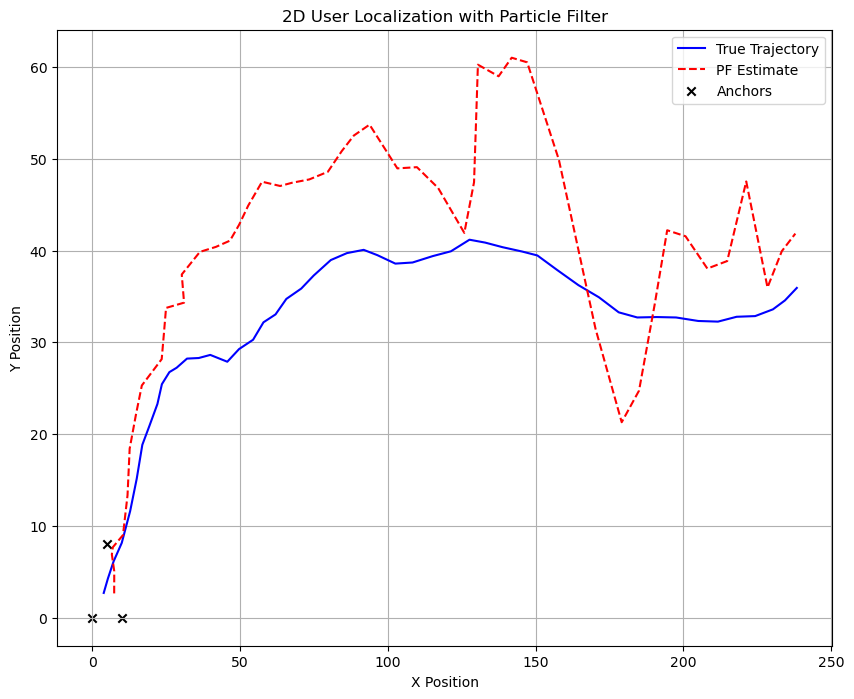

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Setup
np.random.seed(0)

# Simulation parameters
num_steps = 50
delta_t = 1.0
num_particles = 1000
process_noise_std = 0.5
measurement_noise_std = 2.0

# Anchors at fixed known positions
anchors = np.array([
    [0.0, 0.0],
    [10.0, 0.0],
    [5.0, 8.0]
])

# True initial user state: [x, y, vx, vy]
true_state = np.array([2.0, 2.0, 1.0, 0.5])

# State transition matrix (constant velocity)
F = np.array([
    [1, 0, delta_t, 0],
    [0, 1, 0, delta_t],
    [0, 0, 1, 0],
    [0, 0, 0, 1]
])

# Process noise covariance
Q = (process_noise_std ** 2) * np.eye(4)

# Measurement noise covariance
R = measurement_noise_std ** 2

# Storage
true_trajectory = []
measurements = []

for k in range(num_steps):
    # Simulate true motion
    process_noise = np.random.multivariate_normal(np.zeros(4), Q)
    true_state = F @ true_state + process_noise
    true_trajectory.append(true_state.copy())
    
    # Simulate range measurements to anchors
    dists = np.linalg.norm(anchors - true_state[:2], axis=1)
    noisy_dists = dists + np.random.normal(0, measurement_noise_std, size=anchors.shape[0])
    measurements.append(noisy_dists)

true_trajectory = np.array(true_trajectory)
measurements = np.array(measurements)

# 2. Particle Filter Initialization
particles = np.zeros((num_particles, 4))
particles[:, 0] = np.random.uniform(0, 10, size=num_particles)  # x
particles[:, 1] = np.random.uniform(0, 10, size=num_particles)  # y
particles[:, 2] = np.random.normal(0, 1, size=num_particles)    # vx
particles[:, 3] = np.random.normal(0, 1, size=num_particles)    # vy
weights = np.ones(num_particles) / num_particles

# 3. Particle Filter Loop
estimates = []

for k in range(num_steps):
    # Prediction
    process_noise_samples = np.random.multivariate_normal(np.zeros(4), Q, size=num_particles)
    particles = (F @ particles.T).T + process_noise_samples

    # Measurement update
    predicted_ranges = np.linalg.norm(particles[:, None, :2] - anchors[None, :, :], axis=2)
    likelihoods = np.exp(-0.5 * np.sum(((measurements[k] - predicted_ranges) ** 2) / R, axis=1))
    likelihoods += 1e-300  # avoid zeros
    weights *= likelihoods
    weights /= np.sum(weights)
    
    # Estimate state
    estimate = np.average(particles, weights=weights, axis=0)
    estimates.append(estimate)
    
    # Resample if needed
    effective_N = 1.0 / np.sum(weights ** 2)
    if effective_N < num_particles / 2:
        indices = np.random.choice(num_particles, size=num_particles, p=weights)
        particles = particles[indices]
        weights.fill(1.0 / num_particles)

estimates = np.array(estimates)

# 4. Plotting
plt.figure(figsize=(10, 8))
plt.plot(true_trajectory[:, 0], true_trajectory[:, 1], 'b-', label='True Trajectory')
plt.plot(estimates[:, 0], estimates[:, 1], 'r--', label='PF Estimate')
plt.scatter(anchors[:, 0], anchors[:, 1], c='k', marker='x', label='Anchors')
plt.legend()
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('2D User Localization with Particle Filter')
plt.grid()
plt.show()


---
--- 

## **Extend to 3D user localization**.

* Model user position and velocity in 3D.
* Use **range measurements** from 4 fixed 3D anchors.
* Simulate motion with constant velocity plus noise.
* Apply the particle filter to estimate 3D position over time.


**State Definition:**

* Now the state is 6-dimensional: $[x, y, z, v_x, v_y, v_z]$.

**Motion Model:**

* Uses a **3D constant velocity transition matrix**:

$$
F = \begin{bmatrix}
I_3 & \Delta t \cdot I_3 \\
0_{3\times3} & I_3
\end{bmatrix}
$$

**Measurement Model:**

* Each anchor provides a **scalar range measurement**:

$$
z_k^m = \sqrt{(x - s_m^x)^2 + (y - s_m^y)^2 + (z - s_m^z)^2} + w_k^m
$$

* Noise $w_k^m \sim \mathcal{N}(0, R)$.

**Anchors:**

* Defined at four distinct 3D positions to ensure geometric coverage.

**Visualization:**

* Uses `matplotlib` 3D plotting to show the true trajectory, the particle filter estimate, and anchor positions.


* **Fully 3D state** tracking with position and velocity.
* **Nonlinear range measurements** from 3D anchors.
* **Process noise** and **measurement noise** control realism.
* **Resampling step** prevents particle degeneracy.
* **Visualization** enables easy comparison of true and estimated trajectories.


You can modify:

* **Number of anchors** and their 3D positions.
* **Number of particles** for accuracy vs. speed trade-off.
* **Process noise** to model user maneuvering.
* **Measurement noise** to simulate different SNR regimes.
* **Motion model** (e.g., constant acceleration).






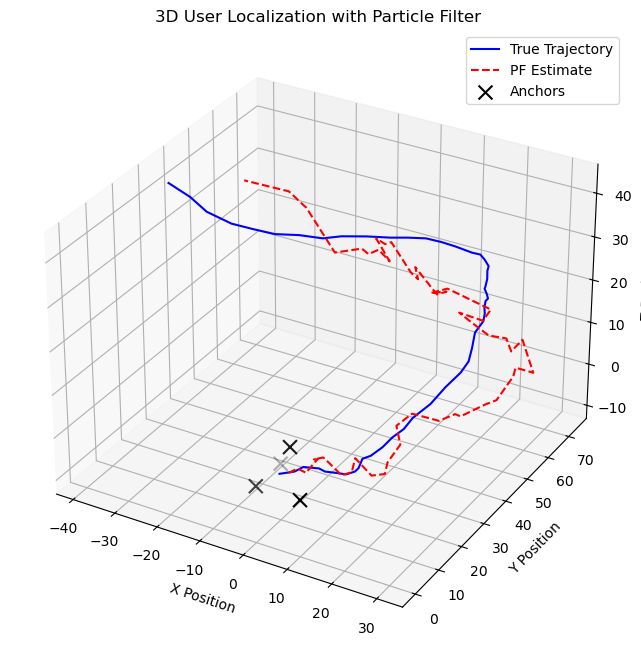

In [6]:
np.random.seed(0)
num_steps = 50
delta_t = 1.0
num_particles = 2000
process_noise_std = 0.5
measurement_noise_std = 2.0

# Anchors at fixed 3D positions (corners of a cube room)
anchors = np.array([
    [0.0, 0.0, 0.0],
    [10.0, 0.0, 0.0],
    [0.0, 10.0, 0.0],
    [5.0, 5.0, 8.0]
])

# True initial user state: [x, y, z, vx, vy, vz]
true_state = np.array([2.0, 2.0, 2.0, 1.0, 0.5, 0.2])

# State transition matrix (constant velocity model)
F = np.block([
    [np.eye(3), delta_t * np.eye(3)],
    [np.zeros((3, 3)), np.eye(3)]
])

# Process noise covariance
Q = (process_noise_std ** 2) * np.eye(6)

# Measurement noise covariance (scalar)
R = measurement_noise_std ** 2

# Storage for true trajectory and measurements
true_trajectory = []
measurements = []

for k in range(num_steps):
    # Simulate true motion
    process_noise = np.random.multivariate_normal(np.zeros(6), Q)
    true_state = F @ true_state + process_noise
    true_trajectory.append(true_state.copy())
    
    # Simulate range measurements to anchors
    dists = np.linalg.norm(anchors - true_state[:3], axis=1)
    noisy_dists = dists + np.random.normal(0, measurement_noise_std, size=anchors.shape[0])
    measurements.append(noisy_dists)

true_trajectory = np.array(true_trajectory)
measurements = np.array(measurements)

# Particle Filter Initialization
particles = np.zeros((num_particles, 6))
particles[:, 0] = np.random.uniform(0, 10, size=num_particles)  # x
particles[:, 1] = np.random.uniform(0, 10, size=num_particles)  # y
particles[:, 2] = np.random.uniform(0, 10, size=num_particles)  # z
particles[:, 3:] = np.random.normal(0, 1, size=(num_particles, 3))  # vx, vy, vz
weights = np.ones(num_particles) / num_particles

# Particle Filter Loop
estimates = []

for k in range(num_steps):
    # Prediction step
    process_noise_samples = np.random.multivariate_normal(np.zeros(6), Q, size=num_particles)
    particles = (F @ particles.T).T + process_noise_samples

    # Measurement update step
    predicted_ranges = np.linalg.norm(particles[:, None, :3] - anchors[None, :, :], axis=2)
    likelihoods = np.exp(-0.5 * np.sum(((measurements[k] - predicted_ranges) ** 2) / R, axis=1))
    likelihoods += 1e-300  # avoid zeros
    weights *= likelihoods
    weights /= np.sum(weights)
    
    # Estimate state as weighted average
    estimate = np.average(particles, weights=weights, axis=0)
    estimates.append(estimate)
    
    # Resampling if effective sample size is low
    effective_N = 1.0 / np.sum(weights ** 2)
    if effective_N < num_particles / 2:
        indices = np.random.choice(num_particles, size=num_particles, p=weights)
        particles = particles[indices]
        weights.fill(1.0 / num_particles)

estimates = np.array(estimates)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot(true_trajectory[:, 0], true_trajectory[:, 1], true_trajectory[:, 2], 'b-', label='True Trajectory')
ax.plot(estimates[:, 0], estimates[:, 1], estimates[:, 2], 'r--', label='PF Estimate')
ax.scatter(anchors[:, 0], anchors[:, 1], anchors[:, 2], c='k', marker='x', s=100, label='Anchors')
ax.set_xlabel('X Position')
ax.set_ylabel('Y Position')
ax.set_zlabel('Z Position')
ax.set_title('3D User Localization with Particle Filter')
ax.legend()
plt.show()


--- 

# Particle Filters for Channel Estimation in Fading Channels

In wireless communication, the channel **distorts** transmitted signals through:

* **Fading** (time-varying multipath effects).
* **Doppler shifts** (user mobility).
* **Shadowing and blockage**.

Accurate **channel estimation** is essential for:

* Equalization.
* Coherent demodulation.
* Adaptive modulation and coding.
* Beamforming and MIMO processing.

Traditional methods often assume **linear Gaussian** models (e.g., Kalman filters).

However:

* In high mobility, the fading dynamics can be **nonlinear** or **non-Gaussian**.
* The channel might evolve with **non-stationary statistics**.
* Measurement noise and pilot contamination can be **non-Gaussian**.

**Particle filters** offer a flexible framework to model these complexities.

Consider the **baseband equivalent received signal**:

$$
y_k = x_k h_k + n_k
$$

where:

* $y_k$: received signal at time $k$.
* $x_k$: known pilot or data symbol.
* $h_k$: complex channel coefficient.
* $n_k$: noise (often modeled as complex Gaussian).

### Fading Dynamics (State Model)

The **channel** varies over time due to:

* User motion (Doppler effect).
* Multipath dynamics.

Common **state evolution models** include:

#### Gauss-Markov Model

$$
h_k = \rho h_{k-1} + v_{k-1}
$$

* $\rho$ models time correlation (depends on Doppler spread).
* $v_{k-1} \sim \mathcal{CN}(0, \sigma_v^2)$ is process noise.

This model is **linear Gaussian** and works well for low Doppler.

#### Nonlinear Models

More advanced dynamics may include:

* Nonlinear Doppler processes.
* Multipath clustering with varying path gains and delays.
* Time-varying delay spread.

Example:

$$
h_k = f(h_{k-1}) + v_{k-1}
$$

where $f(\cdot)$ is a nonlinear function capturing, for example, delay-Doppler evolution.

### Observation Model

Given the known transmit symbol $x_k$:

$$
y_k = x_k h_k + n_k
$$

* $n_k$ is often $\mathcal{CN}(0, \sigma_n^2)$.
* The likelihood:

$$
p(y_k | h_k) = \frac{1}{\pi \sigma_n^2} \exp\left(-\frac{|y_k - x_k h_k|^2}{\sigma_n^2}\right)
$$

## Bayesian State-Space Formulation

Goal: Estimate **posterior distribution** of the channel given observations:

$$
p(h_k | y_{1:k}, x_{1:k})
$$

**Bayesian filtering recursion**:

* **Prediction**:

$$
p(h_k | y_{1:k-1}) = \int p(h_k | h_{k-1}) p(h_{k-1} | y_{1:k-1}) \, dh_{k-1}
$$

* **Update**:

$$
p(h_k | y_{1:k}) \propto p(y_k | h_k) \, p(h_k | y_{1:k-1})
$$

These integrals can be **analytical** for linear Gaussian models (Kalman filter), but in nonlinear or non-Gaussian settings they require **approximation**.


## Particle Filter Solution

Particle filters approximate $p(h_k | y_{1:k})$ using **weighted particles**:

$$
\{h_k^{(i)}, w_k^{(i)}\}_{i=1}^N
$$


### Algorithm Steps

#### Step 1: Initialization

Sample $h_0^{(i)} \sim p(h_0)$, set $w_0^{(i)} = \frac{1}{N}$.


#### Step 2: For each time $k$:

**a. Prediction**

Sample:

$$
h_k^{(i)} \sim p(h_k | h_{k-1}^{(i)})
$$

Example (Gauss-Markov):

$$
h_k^{(i)} = \rho h_{k-1}^{(i)} + v_{k-1}^{(i)}, \quad v_{k-1}^{(i)} \sim \mathcal{CN}(0, \sigma_v^2)
$$

**b. Update**

Compute weights using observation likelihood:

$$
w_k^{(i)} \propto w_{k-1}^{(i)} \, p(y_k | h_k^{(i)})
$$

For complex Gaussian noise:

$$
p(y_k | h_k^{(i)}) = \frac{1}{\pi \sigma_n^2} \exp\left(-\frac{|y_k - x_k h_k^{(i)}|^2}{\sigma_n^2}\right)
$$

Normalize:

$$
w_k^{(i)} = \frac{w_k^{(i)}}{\sum_j w_k^{(j)}}
$$

**c. Resampling (if needed)**

Effective sample size:

$$
N_{\text{eff}} = \frac{1}{\sum_{i=1}^N (w_k^{(i)})^2}
$$

If $N_{\text{eff}}$ is too low, resample particles proportionally to $w_k^{(i)}$.

**d. Estimation**

Estimate channel:

$$
\hat{h}_k = \sum_{i=1}^N w_k^{(i)} h_k^{(i)}
$$

## Complex-Valued Extension

* State variable $h_k$ is **complex-valued**.
* Particles are complex numbers.
* Noise samples drawn from complex Gaussian.

**Particle filter naturally supports complex states**:

* Process noise: $v_k \sim \mathcal{CN}(0, \sigma_v^2)$.
* Measurement noise: $n_k \sim \mathcal{CN}(0, \sigma_n^2)$.


## Advantages Over Kalman Filters

* **Nonlinear dynamics**: Particle filter can model arbitrary $p(h_k | h_{k-1})$.
* **Non-Gaussian noise**: Can handle impulsive noise models.
* **Non-stationary statistics**: Easily updated by adjusting dynamics online.
* **Joint estimation**: Can estimate channel + Doppler + delay jointly by expanding state vector.


## Practical Design Considerations

* **Number of particles** $N$:

  * Higher $N$ improves accuracy.
  * Trade-off with computational complexity.

* **Process model accuracy**:

  * Needs to capture Doppler, mobility.
  * Model mismatch degrades performance.

* **Resampling strategy**:

  * Multinomial, systematic, stratified.

* **Observation model accuracy**:

  * Requires correct noise variance.


## Extensions

* **MIMO channel estimation**:

  * State vector includes all taps or matrix coefficients.
  * Particle filtering can scale, but cost grows exponentially.

* **OFDM channel estimation**:

  * Track time/frequency selective channels.
  * Can model taps in time-delay domain.

* **Joint channel and parameter estimation**:

  * Doppler frequency, delay, angle of arrival.


## Example Wireless Applications

### High-Mobility Scenarios

* Vehicular communications.
* High-speed train scenarios.
* Doppler spread estimation and tracking.

### Non-Gaussian Noise Channels

* Impulsive noise environments.
* Underwater acoustic channels.
* Power-line communications.


### Pilot Contamination in Massive MIMO

* Model cross-user interference as non-Gaussian noise.
* Robust estimation with particle filtering.


## References

* Arulampalam, M. S., Maskell, S., Gordon, N., & Clapp, T. (2002). "A tutorial on particle filters for online nonlinear/non-Gaussian Bayesian tracking." *IEEE Transactions on Signal Processing*, 50(2), 174–188.
* Simon Haykin. *Adaptive Filter Theory*, Prentice Hall.
* Poor, H. Vincent. *An Introduction to Signal Detection and Estimation*. Springer.



---

### **simple particle-filter-based estimator of a time-varying complex fading channel**.

* Single-input single-output (SISO) flat fading channel.
* Complex scalar channel coefficient evolving via **Gauss-Markov** model (first-order autoregressive).
* Known pilot symbols transmitted.
* Noisy observations at receiver.
* Particle filter used to track the channel coefficient over time.
* Visual comparison to true channel.

## Explanation of the Code:

### **1. Channel Model**

* **Gauss-Markov process**:

$$
h_k = \rho h_{k-1} + v_{k-1}
$$

* $\rho = 0.95$: strong temporal correlation.
* $v_{k-1} \sim \mathcal{CN}(0, \sigma_v^2)$: complex Gaussian noise.

### **2. Observation Model**

* Received signal at time $k$:

$$
y_k = x_k h_k + n_k
$$

* $x_k$: known pilot symbol (unit modulus, random phase).
* $n_k \sim \mathcal{CN}(0, \sigma_n^2)$: complex Gaussian noise.


### **3. Particle Filter Steps**

* **Initialization**:

  * Particles drawn from standard complex Gaussian.
  * Uniform weights.

* **Prediction**:

  * Apply the Gauss-Markov model to each particle:

$$
h_k^{(i)} = \rho h_{k-1}^{(i)} + v_{k-1}^{(i)}
$$

* **Update**:

  * Evaluate likelihood of each particle:

$$
p(y_k | h_k^{(i)}) \propto \exp\left( -\frac{|y_k - x_k h_k^{(i)}|^2}{2 \sigma_n^2} \right)
$$

* Update weights and normalize.

* **Resampling**:

  * Based on effective sample size $N_\text{eff}$.
  * Avoid degeneracy.

* **Estimation**:

  * Weighted mean of particles.

### **4. Visualization**

* Compares **true channel** vs. **particle filter estimate**.
* Separately plots **real** and **imaginary** components over time.


#### Features

* Fully **complex-valued** model.
* **Nonlinear** and **non-Gaussian** estimation supported.
* Adaptable to more advanced models (e.g., time-varying Doppler, multipath).
* Easy to extend to **MIMO** (track multiple coefficients).

#### How to Customize

* Adjust:

  * `num_particles` for accuracy.
  * `rho` for Doppler spread scenarios.
  * `process_noise_std` for channel variability.
  * `measurement_noise_std` for SNR conditions.
  * `pilot_symbols` to match real pilot designs.



/var/folders/s3/38gpf0796ls5pl2z8c7czftr0000gn/T/ipykernel_91317/2600501409.py:28: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  true_channel[k] = rho * true_channel[k-1] + process_noise(1)


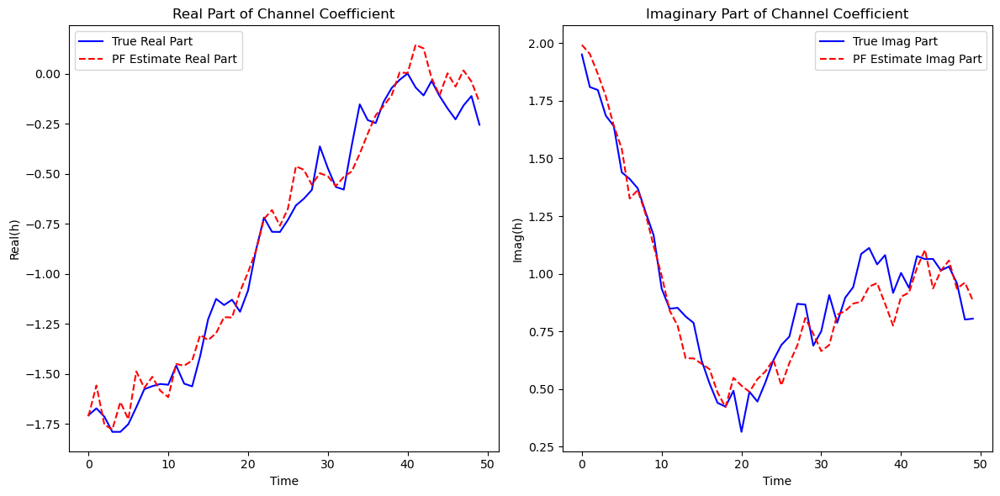

In [7]:
# 1. Simulation Parameters
np.random.seed(0)
num_steps = 50
num_particles = 1000

# Channel dynamics: Gauss-Markov model
rho = 0.95             # Temporal correlation (Doppler effect)
process_noise_std = 0.1
measurement_noise_std = 0.2

# Pilot symbols (known at receiver)
pilot_symbols = np.exp(1j * 2 * np.pi * np.random.rand(num_steps))

# True channel initialization
true_channel = np.zeros(num_steps, dtype=complex)
true_channel[0] = np.random.randn() + 1j * np.random.randn()

# Process and measurement noise distributions
def process_noise(size):
    return process_noise_std * (np.random.randn(size) + 1j * np.random.randn(size))

def measurement_noise(size):
    return measurement_noise_std * (np.random.randn(size) + 1j * np.random.randn(size))

# Simulate true channel evolution and observations
observations = np.zeros(num_steps, dtype=complex)
for k in range(1, num_steps):
    true_channel[k] = rho * true_channel[k-1] + process_noise(1)
observations = pilot_symbols * true_channel + measurement_noise(num_steps)

# 2. Particle Filter Initialization
particles = np.random.randn(num_particles) + 1j * np.random.randn(num_particles)
weights = np.ones(num_particles) / num_particles

# 3. Storage for estimates
pf_estimates = np.zeros(num_steps, dtype=complex)

# 4. Particle Filter Loop
for k in range(num_steps):
    # Prediction step
    if k > 0:
        particles = rho * particles + process_noise(num_particles)
    
    # Measurement update
    predicted_observations = pilot_symbols[k] * particles
    likelihoods = np.exp(-np.abs(observations[k] - predicted_observations)**2 / (2 * measurement_noise_std**2))
    likelihoods += 1e-300  # prevent zeros
    weights *= likelihoods
    weights /= np.sum(weights)
    
    # Estimate channel as weighted mean
    pf_estimates[k] = np.sum(weights * particles)
    
    # Resample if effective sample size is too low
    N_eff = 1.0 / np.sum(weights**2)
    if N_eff < num_particles / 2:
        indices = np.random.choice(num_particles, size=num_particles, p=weights)
        particles = particles[indices]
        weights.fill(1.0 / num_particles)

# 5. Plotting Results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(true_channel.real, 'b-', label='True Real Part')
plt.plot(pf_estimates.real, 'r--', label='PF Estimate Real Part')
plt.xlabel('Time')
plt.ylabel('Real(h)')
plt.legend()
plt.title('Real Part of Channel Coefficient')

plt.subplot(1, 2, 2)
plt.plot(true_channel.imag, 'b-', label='True Imag Part')
plt.plot(pf_estimates.imag, 'r--', label='PF Estimate Imag Part')
plt.xlabel('Time')
plt.ylabel('Imag(h)')
plt.legend()
plt.title('Imaginary Part of Channel Coefficient')

plt.tight_layout()
plt.show()

--- 

## **OFDM channel estimation with particle filtering**, and then I will give you **complete Python code**.

We consider **single-antenna (SISO) OFDM** transmission over a **frequency-selective fading channel**.

* The **channel** is modeled as an L-tap **time-domain impulse response**:

$$
\mathbf{h}_k = [h_{k,0}, h_{k,1}, \ldots, h_{k,L-1}]^T
$$

* Each tap evolves over time, e.g. **Gauss-Markov**:

$$
h_{k,\ell} = \rho h_{k-1,\ell} + v_{k-1,\ell}, \quad v_{k-1,\ell} \sim \mathcal{CN}(0, \sigma_v^2)
$$

* The **frequency-domain channel** on subcarriers is obtained via **DFT** of the time-domain taps.

**OFDM system:**

* N subcarriers.
* Pilot symbols inserted on each subcarrier.
* Noise in frequency domain: $\mathcal{CN}(0, \sigma_n^2)$.


**Observation model per subcarrier m:**

$$
Y_{k,m} = X_{k,m} \cdot H_{k,m} + N_{k,m}
$$

where:

* $X_{k,m}$: known pilot symbol.
* $H_{k,m}$: frequency-domain channel coefficient (DFT of taps).
* $N_{k,m}$: noise.

### Bayesian Formulation

* **State:** time-domain taps $\mathbf{h}_k \in \mathbb{C}^L$.
* **Process model:**

$$
\mathbf{h}_k = \rho \mathbf{h}_{k-1} + \mathbf{v}_{k-1}
$$

* **Observation model:**

$$
\mathbf{Y}_k = \text{diag}(\mathbf{X}_k) \mathbf{H}_k + \mathbf{N}_k
$$

with:

$$
\mathbf{H}_k = \text{DFT}(\mathbf{h}_k)
$$


### Particle Filter Idea

We will track the **time-domain taps**:

* Particles represent candidate channel tap vectors.
* Each particle is evolved via the Gauss-Markov model.
* For each particle, DFT yields subcarrier channel response.
* Likelihood is computed using the noisy pilot observations.


### Code Assumptions

To keep things **tractable and educational**, the example will:

* Use **small number of subcarriers (e.g. N = 16)**.
* Channel has **L = 4** taps.
* Perfect synchronization assumed.
* Pilot symbols on all subcarriers.


### Explanation of Code Design

**State:**

* Each particle represents the *time-domain impulse response* vector of length L.
* For example, particle $[h_0, h_1, h_2, h_3]$.


**Prediction Step:**

* Gauss-Markov evolution for all taps:

$$
\mathbf{h}_k^{(i)} = \rho \mathbf{h}_{k-1}^{(i)} + \mathbf{v}_{k-1}^{(i)}
$$

**Observation Step:**

* For each particle, compute **DFT**:

$$
\mathbf{H}_k^{(i)} = \text{DFT}(\mathbf{h}_k^{(i)})
$$

* Predict pilot observations:

$$
\hat{\mathbf{Y}}_k^{(i)} = \text{diag}(\mathbf{X}_k) \mathbf{H}_k^{(i)}
$$

* Compute Gaussian likelihood:

$$
p(\mathbf{Y}_k | \mathbf{h}_k^{(i)}) \propto \exp\left(-\frac{\|\mathbf{Y}_k - \hat{\mathbf{Y}}_k^{(i)}\|^2}{2 \sigma_n^2}\right)
$$

**Resampling Step:**

* Standard multinomial resampling based on effective sample size.

**Estimation:**

* Posterior mean of particles in **time-domain taps**.
* Frequency-domain estimate via DFT of the mean tap estimate.


**Visualization:**

* Plots the **true vs. estimated frequency-domain channel** (real and imaginary) on first 4 subcarriers over time.


### Notes

* This example assumes **perfect timing** and **cyclic prefix**.
* For real systems:

  * Can adapt to **partial pilot allocation**.
  * Can track **time-varying delay spread**.
  * Can extend to **MIMO** by stacking taps for all antennas.

### Customization

* Change `N_subcarriers`, `L_taps`, `num_particles` for realism vs. speed.
* Adjust `rho` for different Doppler spreads.
* Increase `num_steps` for longer tracking.
* Add **time-varying pilot patterns**.



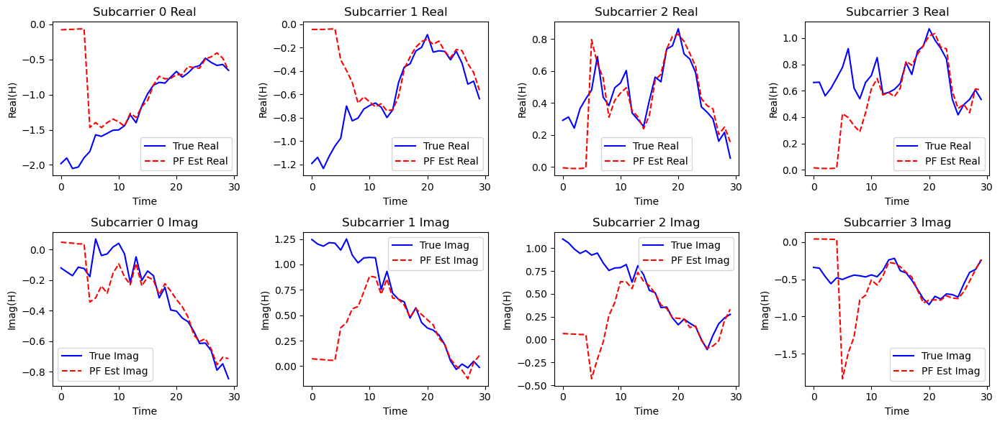

In [8]:
# OFDM Channel Estimation with Particle Filter
# 1. System Parameters
np.random.seed(0)
num_steps = 30             # number of OFDM symbols
N_subcarriers = 16         # OFDM size
L_taps = 4                 # channel impulse response length
num_particles = 2000       # number of particles

rho = 0.95                 # temporal correlation
process_noise_std = 0.05   # channel tap process noise std
measurement_noise_std = 0.1

# 2. Pilot symbols on all subcarriers (unit modulus)
pilot_symbols = np.exp(1j * 2 * np.pi * np.random.rand(num_steps, N_subcarriers))

# 3. True Channel Generation
true_taps = np.zeros((num_steps, L_taps), dtype=complex)
true_taps[0] = np.random.randn(L_taps) + 1j * np.random.randn(L_taps)

for k in range(1, num_steps):
    process_noise = process_noise_std * (np.random.randn(L_taps) + 1j * np.random.randn(L_taps))
    true_taps[k] = rho * true_taps[k-1] + process_noise

# Frequency-domain channel response
true_freq_resp = np.fft.fft(true_taps, n=N_subcarriers, axis=1)

# 4. Simulated received symbols (pilot transmission)
received_symbols = np.zeros((num_steps, N_subcarriers), dtype=complex)
for k in range(num_steps):
    noise = measurement_noise_std * (np.random.randn(N_subcarriers) + 1j * np.random.randn(N_subcarriers))
    received_symbols[k] = pilot_symbols[k] * true_freq_resp[k] + noise

# 5. Particle Filter Initialization
particles = (np.random.randn(num_particles, L_taps) + 1j * np.random.randn(num_particles, L_taps))
weights = np.ones(num_particles) / num_particles

# 6. Storage for estimates
pf_tap_estimates = np.zeros((num_steps, L_taps), dtype=complex)
pf_freq_estimates = np.zeros((num_steps, N_subcarriers), dtype=complex)

# 7. Particle Filter Loop
for k in range(num_steps):
    # Prediction
    if k > 0:
        process_noise_samples = process_noise_std * (np.random.randn(num_particles, L_taps) + 1j * np.random.randn(num_particles, L_taps))
        particles = rho * particles + process_noise_samples

    # For each particle, compute frequency response via DFT
    particle_freq_resp = np.fft.fft(particles, n=N_subcarriers, axis=1)
    
    # Likelihood calculation
    predicted_observations = pilot_symbols[k][None, :] * particle_freq_resp
    obs = received_symbols[k][None, :]
    
    # Complex Gaussian likelihood
    errors = np.abs(obs - predicted_observations)**2
    likelihoods = np.exp(-np.sum(errors, axis=1) / (2 * measurement_noise_std**2))
    likelihoods += 1e-300
    weights *= likelihoods
    weights /= np.sum(weights)
    
    # Estimate channel taps (posterior mean)
    pf_tap_estimates[k] = np.sum(weights[:, None] * particles, axis=0)
    pf_freq_estimates[k] = np.fft.fft(pf_tap_estimates[k], n=N_subcarriers)
    
    # Resampling
    N_eff = 1.0 / np.sum(weights**2)
    if N_eff < num_particles / 2:
        indices = np.random.choice(num_particles, size=num_particles, p=weights)
        particles = particles[indices]
        weights.fill(1.0 / num_particles)

# 8. Plotting Results
plt.figure(figsize=(14, 6))

for m in range(4):
    plt.subplot(2, 4, m+1)
    plt.plot(true_freq_resp[:, m].real, 'b-', label='True Real')
    plt.plot(pf_freq_estimates[:, m].real, 'r--', label='PF Est Real')
    plt.title(f'Subcarrier {m} Real')
    plt.xlabel('Time')
    plt.ylabel('Real(H)')
    plt.legend()

    plt.subplot(2, 4, m+5)
    plt.plot(true_freq_resp[:, m].imag, 'b-', label='True Imag')
    plt.plot(pf_freq_estimates[:, m].imag, 'r--', label='PF Est Imag')
    plt.title(f'Subcarrier {m} Imag')
    plt.xlabel('Time')
    plt.ylabel('Imag(H)')
    plt.legend()

plt.tight_layout()
plt.show()

---

# Particle Filtering for MIMO-OFDM Channel Estimation

We consider a **MIMO-OFDM** system with:

* $N_t$ transmit antennas
* $N_r$ receive antennas
* $N$ OFDM subcarriers
* **Frequency-selective fading** with L-tap impulse responses

### Channel Model

Between each **Tx-Rx antenna pair**, there is a **time-domain impulse response** of length L:

$$
\mathbf{h}^{(m,n)}_k = [h^{(m,n)}_{k,0}, \ldots, h^{(m,n)}_{k,L-1}]^T
$$

where:

* $m = 1,\ldots,N_r$ (receive antenna index)
* $n = 1,\ldots,N_t$ (transmit antenna index)
* $k$ is the OFDM symbol time index


### Frequency-Domain Channel

On subcarrier $f$, the **frequency-domain MIMO channel matrix** is:

$$
\mathbf{H}_k(f) \in \mathbb{C}^{N_r \times N_t}
$$

Each element is given by:

$$
H^{(m,n)}_k(f) = \sum_{\ell=0}^{L-1} h^{(m,n)}_{k,\ell} \cdot e^{-j2\pi f \ell / N}
$$

This is the **DFT** of the impulse response for that antenna pair.

### Observation Model

At each time $k$, for subcarrier $f$:

$$
\mathbf{Y}_k(f) = \mathbf{H}_k(f) \mathbf{X}_k(f) + \mathbf{N}_k(f)
$$

where:

* $\mathbf{Y}_k(f) \in \mathbb{C}^{N_r \times 1}$
* $\mathbf{X}_k(f) \in \mathbb{C}^{N_t \times 1}$ (known pilot symbols)
* $\mathbf{N}_k(f)$ is noise

### State-Space Model

We want to **track** the full MIMO channel impulse responses over time.


### State Definition

Let us stack **all taps** for all antenna pairs into a single vector:

$$
\mathbf{s}_k = \begin{bmatrix}
\mathbf{h}^{(1,1)}_k \\ \mathbf{h}^{(1,2)}_k \\ \ldots \\ \mathbf{h}^{(N_r,N_t)}_k
\end{bmatrix} \in \mathbb{C}^{L \cdot N_r \cdot N_t}
$$

This is the **state** that particles will track.


### State Evolution (Process Model)

We assume **independent Gauss-Markov** evolution for each tap:

$$
\mathbf{s}_k = \rho \mathbf{s}_{k-1} + \mathbf{v}_{k-1}
$$

where:

* $\rho$ controls temporal correlation (Doppler)
* $\mathbf{v}_{k-1} \sim \mathcal{CN}(0, \sigma_v^2 I)$

### Observation Model

For each particle $i$:

* Reshape $\mathbf{s}_k^{(i)}$ into **per-link impulse responses**.
* Compute **DFT** of each tap vector to get per-subcarrier frequency response:

$$
H^{(m,n)}_k(f) = \text{DFT}_L\left( \mathbf{h}^{(m,n)}_k \right)
$$

* Build **MIMO channel matrices** $\mathbf{H}_k(f)$ across subcarriers.


**Predicted observation:**

$$
\hat{\mathbf{Y}}_k(f)^{(i)} = \mathbf{H}_k^{(i)}(f) \mathbf{X}_k(f)
$$


**Observation likelihood:**

For additive white Gaussian noise:

$$
p\left(\{\mathbf{Y}_k(f)\}_f \middle| \mathbf{s}_k^{(i)}\right) \propto \exp\left(-\frac{1}{2\sigma_n^2} \sum_{f=1}^N \|\mathbf{Y}_k(f) - \hat{\mathbf{Y}}_k(f)^{(i)}\|^2 \right)
$$

### Particle Filter Algorithm

For each time $k$:

1. **Prediction:**

   * Sample new state from process model:

$$
\mathbf{s}_k^{(i)} = \rho \mathbf{s}_{k-1}^{(i)} + \mathbf{v}_{k-1}^{(i)}
$$

2. **Observation likelihood:**

   * For each particle:

     * Reshape state to taps.
     * Compute frequency-domain MIMO channel.
     * Predict received symbols.
     * Compute likelihood using measurement noise model.

3. **Weight update:**

   * Normalize weights.

4. **Resampling:**

   * If effective sample size is too low, resample particles.

5. **Estimation:**

   * Posterior mean of particles.


### Advantages of Particle Filtering

* Tracks **nonlinear** time evolution (can extend to nonlinear Doppler models).
* Handles **non-Gaussian** process or measurement noise.
* Can jointly track **all links** in MIMO channel.
* Supports **time-varying delay spread** by extending state model.


### Computational Considerations

* State vector size: $L \times N_t \times N_r$.
* Particle count needed grows with **state dimension**.
* For high-dimensional channels, need techniques like **Rao-Blackwellization** or **marginalization** to reduce complexity.


### Example Setup for Code

* Number of subcarriers $N$: 16 or 32.
* Channel taps $L$: 4.
* Transmit antennas $N_t$: 2.
* Receive antennas $N_r$: 2.
* Number of particles: \~2000 (can be adjusted).
* Pilot design: orthogonal or known pilots on all subcarriers.



### **MIMO-OFDM channel estimation using a particle filter** implimentation 

## Scope of the code

* 2x2 MIMO system (2 Tx, 2 Rx)
* 16 OFDM subcarriers
* 4-tap frequency-selective channel per Tx-Rx pair
* Gauss-Markov model for tap evolution
* Perfectly known pilots on all subcarriers
* AWGN on received symbols
* Particle filter estimating all 16 channel impulse responses jointly

* Each particle holds a **state vector of size**:
  $N_r \times N_t \times L = 2 \times 2 \times 4 = 16$ complex numbers
* The filter tracks the **joint posterior** over this 16-dimensional space


**State Vector:**

* Size: `N_rx * N_tx * L_taps` complex numbers.
* Each particle represents *all impulse responses* jointly.

**Prediction:**

* Gauss-Markov evolution with parameter `rho` + complex Gaussian process noise.

**Observation Model:**

* For each particle:

  * Reshape state vector into taps per link.
  * Compute DFT across subcarriers.
  * Predict received symbols for all subcarriers.
  * Compute Gaussian likelihood based on received pilots.

**Weight Update and Resampling:**

* Log-likelihood to avoid underflow.
* Normalize weights.
* Resample when effective sample size is low.

**Estimation:**

* Posterior mean over particles.
* DFT to get frequency-domain channel estimates.


## How to Modify

* Change `N_tx`, `N_rx`, `N_subcarriers`, `L_taps` to model other MIMO configurations.
* Adjust `num_particles` for accuracy vs. speed.
* Customize pilots for different allocation schemes.
* Add support for partial pilot allocation (e.g. comb-type pilots).

## Computational Note

This code is **vectorized** but can still be heavy for large particle counts or high-dimensional channels. For real systems:

* Use Rao-Blackwellized PF.
* Parallelize particle evaluations.
* Consider advanced resampling schemes.



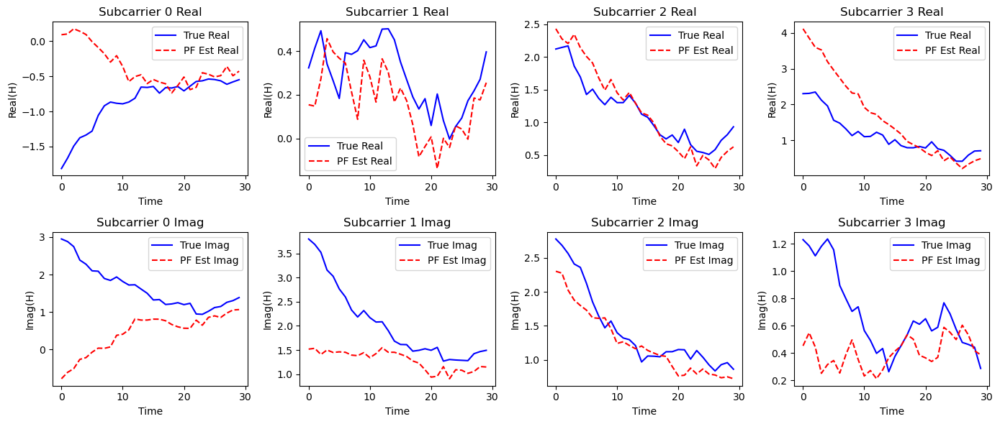

In [9]:
# 1. System parameters
np.random.seed(0)
num_steps = 30
N_subcarriers = 16
L_taps = 4
N_tx = 2
N_rx = 2
num_particles = 2000

rho = 0.95
process_noise_std = 0.05
measurement_noise_std = 0.1

# 2. Pilot symbols
# Assume full pilot allocation: known random pilots on all subcarriers, orthogonal across Tx
pilot_symbols = (np.exp(1j * 2 * np.pi * np.random.rand(num_steps, N_subcarriers, N_tx))
                 / np.sqrt(N_tx))

# 3. True channel generation
true_taps = np.zeros((num_steps, N_rx, N_tx, L_taps), dtype=complex)
true_taps[0] = (np.random.randn(N_rx, N_tx, L_taps)
                + 1j * np.random.randn(N_rx, N_tx, L_taps))

for k in range(1, num_steps):
    process_noise = process_noise_std * (np.random.randn(N_rx, N_tx, L_taps)
                                         + 1j * np.random.randn(N_rx, N_tx, L_taps))
    true_taps[k] = rho * true_taps[k-1] + process_noise

# Frequency-domain channel per subcarrier
true_freq_resp = np.zeros((num_steps, N_subcarriers, N_rx, N_tx), dtype=complex)
for k in range(num_steps):
    for m in range(N_rx):
        for n in range(N_tx):
            true_freq_resp[k, :, m, n] = np.fft.fft(true_taps[k, m, n], n=N_subcarriers)

# 4. Received symbols simulation
received_symbols = np.zeros((num_steps, N_subcarriers, N_rx), dtype=complex)
for k in range(num_steps):
    for f in range(N_subcarriers):
        H_f = true_freq_resp[k, f, :, :]  # (N_rx, N_tx)
        X_f = pilot_symbols[k, f, :]      # (N_tx,)
        y_f = H_f @ X_f
        noise_f = measurement_noise_std * (np.random.randn(N_rx) + 1j * np.random.randn(N_rx))
        received_symbols[k, f, :] = y_f + noise_f

# 5. Particle Filter Initialization
state_dim = N_rx * N_tx * L_taps
particles = (np.random.randn(num_particles, state_dim) + 1j * np.random.randn(num_particles, state_dim))
weights = np.ones(num_particles) / num_particles

# Storage
pf_tap_estimates = np.zeros((num_steps, N_rx, N_tx, L_taps), dtype=complex)
pf_freq_estimates = np.zeros((num_steps, N_subcarriers, N_rx, N_tx), dtype=complex)

# 6. Particle Filter Loop
for k in range(num_steps):
    # Prediction
    if k > 0:
        noise_samples = process_noise_std * (np.random.randn(num_particles, state_dim)
                                             + 1j * np.random.randn(num_particles, state_dim))
        particles = rho * particles + noise_samples

    # Compute predicted frequency responses for all particles
    particle_freq_resps = np.zeros((num_particles, N_subcarriers, N_rx, N_tx), dtype=complex)
    for i in range(num_particles):
        taps = particles[i].reshape(N_rx, N_tx, L_taps)
        for m in range(N_rx):
            for n in range(N_tx):
                particle_freq_resps[i, :, m, n] = np.fft.fft(taps[m, n], n=N_subcarriers)

    # Likelihood
    log_likelihoods = np.zeros(num_particles)
    for i in range(num_particles):
        pred_y = np.zeros((N_subcarriers, N_rx), dtype=complex)
        for f in range(N_subcarriers):
            H_f = particle_freq_resps[i, f]
            X_f = pilot_symbols[k, f, :]
            pred_y[f] = H_f @ X_f
        errors = np.abs(received_symbols[k] - pred_y) ** 2
        log_likelihoods[i] = -np.sum(errors) / (2 * measurement_noise_std**2)
    
    max_log = np.max(log_likelihoods)
    likelihoods = np.exp(log_likelihoods - max_log) + 1e-300
    weights *= likelihoods
    weights /= np.sum(weights)

    # Estimation
    mean_state = np.sum(weights[:, None] * particles, axis=0)
    est_taps = mean_state.reshape(N_rx, N_tx, L_taps)
    pf_tap_estimates[k] = est_taps
    for m in range(N_rx):
        for n in range(N_tx):
            pf_freq_estimates[k, :, m, n] = np.fft.fft(est_taps[m, n], n=N_subcarriers)

    # Resampling
    N_eff = 1.0 / np.sum(weights ** 2)
    if N_eff < num_particles / 2:
        indices = np.random.choice(num_particles, size=num_particles, p=weights)
        particles = particles[indices]
        weights.fill(1.0 / num_particles)

# 7. Visualization for first Rx-Tx pair
plt.figure(figsize=(14, 6))
for f in range(4):
    plt.subplot(2, 4, f+1)
    plt.plot(true_freq_resp[:, f, 0, 0].real, 'b-', label='True Real')
    plt.plot(pf_freq_estimates[:, f, 0, 0].real, 'r--', label='PF Est Real')
    plt.title(f'Subcarrier {f} Real')
    plt.xlabel('Time')
    plt.ylabel('Real(H)')
    plt.legend()

    plt.subplot(2, 4, f+5)
    plt.plot(true_freq_resp[:, f, 0, 0].imag, 'b-', label='True Imag')
    plt.plot(pf_freq_estimates[:, f, 0, 0].imag, 'r--', label='PF Est Imag')
    plt.title(f'Subcarrier {f} Imag')
    plt.xlabel('Time')
    plt.ylabel('Imag(H)')
    plt.legend()

plt.tight_layout()
plt.show()

---

# Cooperative Localization in Sensor Networks Using Particle Filters

In many wireless networks (e.g., WSNs, IoT), **nodes need to localize themselves**.

However:

* Individual nodes may have **limited sensing** (e.g., noisy or sparse measurements).
* **GPS may be unavailable** (e.g., indoors, underground).
* Nodes can **cooperate** by sharing measurements or estimates.

**Cooperative localization** exploits inter-node communication to improve **accuracy** and **coverage**.

### Typical Scenario

* Network of **N sensor nodes** deployed in 2D or 3D area.
* Some nodes may know their position (anchors).
* Others are **unknown** and need to localize.
* Nodes can **measure distances** (or RSSI, TOA, TDOA) to neighbors.

### Example

* 3 anchors with known positions.
* 20 mobile nodes with unknown positions.
* Each node measures noisy distance to **nearby nodes** (including anchors).


### Measurement Model

For node $i$ measuring node $j$ at time $k$:

$$
z_{k}^{(i,j)} = \| \mathbf{p}_k^{(i)} - \mathbf{p}_k^{(j)} \| + w_{k}^{(i,j)}
$$

where:

* $\mathbf{p}_k^{(i)}$: position of node $i$ at time $k$.
* $w_{k}^{(i,j)} \sim \mathcal{N}(0, \sigma^2)$: measurement noise.


**Observations available only for neighbors**:

* Each node has limited sensing range.
* Measurement graph is sparse.


### Process (Motion) Model

For mobile nodes:

$$
\mathbf{p}_k^{(i)} = \mathbf{p}_{k-1}^{(i)} + \mathbf{v}_{k-1}^{(i)} + \mathbf{q}_{k-1}^{(i)}
$$

* $\mathbf{v}_{k-1}^{(i)}$: velocity (if modeled).
* $\mathbf{q}_{k-1}^{(i)} \sim \mathcal{N}(0, Q)$: process noise (random walk).

Anchors have **fixed known positions**.


### State Definition

The **global state** at time $k$:

$$
\mathbf{x}_k = \begin{bmatrix} \mathbf{p}_k^{(1)} \\ \mathbf{p}_k^{(2)} \\ \vdots \\ \mathbf{p}_k^{(N)} \end{bmatrix} \in \mathbb{R}^{dN}
$$

where:

* $d = 2$ or $3$ (dimension of space).


### Bayesian Formulation

Goal: estimate **posterior distribution**:

$$
p(\mathbf{x}_k | z_{1:k})
$$

using all **pairwise distance measurements** over time.

### Measurement Likelihood

For all available pairs $(i,j)$:

$$
p(z_k^{(i,j)} | \mathbf{x}_k) \propto \exp\left(-\frac{(z_k^{(i,j)} - \|\mathbf{p}_k^{(i)} - \mathbf{p}_k^{(j)}\|)^2}{2\sigma^2}\right)
$$

Total likelihood:

$$
p(\mathbf{z}_k | \mathbf{x}_k) = \prod_{(i,j) \in \text{Edges}} p(z_k^{(i,j)} | \mathbf{x}_k)
$$

### Process Model

Assumes **independent motion** of nodes:

$$
p(\mathbf{x}_k | \mathbf{x}_{k-1}) = \prod_{i} p(\mathbf{p}_k^{(i)} | \mathbf{p}_{k-1}^{(i)})
$$

e.g.,

$$
\mathbf{p}_k^{(i)} = \mathbf{p}_{k-1}^{(i)} + \mathbf{q}_{k-1}^{(i)}, \quad \mathbf{q}_{k-1}^{(i)} \sim \mathcal{N}(0,Q)
$$


### Particle Filter Approach

#### Centralized Particle Filter

* Maintains **particles over full joint state**:

$$
\{\mathbf{x}_k^{(i)}, w_k^{(i)}\}_{i=1}^N
$$

Each particle encodes **all unknown node positions**.

#### Steps:

1. **Prediction**:

$$
\mathbf{x}_k^{(i)} \sim p(\mathbf{x}_k | \mathbf{x}_{k-1}^{(i)})
$$

2. **Measurement Update**:

$$
w_k^{(i)} \propto w_{k-1}^{(i)} \times p(\mathbf{z}_k | \mathbf{x}_k^{(i)})
$$

3. **Normalization**:

$$
w_k^{(i)} = \frac{w_k^{(i)}}{\sum_j w_k^{(j)}}
$$

4. **Resampling** if effective sample size is low.


### Distributed / Cooperative Particle Filters

In practice, **centralized particle filtering** becomes intractable for large networks.

Alternative approaches:

* Each node runs **local particle filter** over its position.
* Exchanges **beliefs** or **particles** with neighbors.
* Uses **consensus** or **message-passing** to fuse estimates.

Examples:

* Belief Propagation-based Particle Filters.
* Distributed Consensus Filters.
* Gaussian Mixture approximations.


### Advantages of Particle Filtering

* Handles **nonlinear** range models.
* Robust to **non-Gaussian** noise (e.g., outliers, NLOS).
* Incorporates **arbitrary motion models**.
* Fuses **anchor** and **inter-node** measurements.
* Naturally supports **map constraints** (obstacles).


### Challenges

* Curse of dimensionality in **centralized approach**.
* Communication overhead in **distributed approach**.
* Resampling strategies across distributed particles.
* Handling **dynamic topology** (nodes joining/leaving).


### Design Considerations

* Number of particles: trade-off between **accuracy** and **complexity**.
* Sensing graph connectivity: impacts observability.
* Anchors distribution: critical for convergence.
* Mobility model fidelity: too simple can lead to divergence.
* Measurement model calibration: proper noise variance essential.

### Applications

* Indoor localization in IoT networks.
* Underground mining sensor networks.
* Autonomous vehicle convoy positioning.
* Emergency responder tracking in GPS-denied environments.
* Underwater sensor networks.


### Typical Setup Example

* 30 nodes in 2D.
* 5 fixed anchors.
* Each node measures distances to neighbors within 10m.
* Range measurement noise \~1m std.
* Particle filter with \~500 particles.
* Central server collects and fuses data (centralized PF) or nodes run local filters (distributed PF).


### References

* Gustafsson, F. (2010). *Particle filter theory and practice with positioning applications*.
* Arulampalam, S., et al. (2002). *A tutorial on particle filters for online nonlinear/non-Gaussian Bayesian tracking*.
* Wymeersch, H., et al. (2009). *Cooperative localization in wireless networks*.
* Ihler, A., et al. (2005). *Nonparametric belief propagation for self-localization of sensor networks*.


### Summary

**Cooperative localization using particle filters** allows sensor networks to:

* Exploit **relative measurements** (inter-node distances).
* Integrate **anchor** and **dynamic** information.
* Handle **nonlinear** and **noisy** measurements.
* Work in **GPS-denied** or **challenging** environments.

Particle filtering provides a **flexible Bayesian framework** to solve these problems, supporting both **centralized** and **distributed** designs.


---

### Scenario

* 2D plane.
* 3 fixed **anchors** with known positions.
* 5 **unknown nodes** with unknown positions.
* Each node measures **noisy distances** to nearby nodes and anchors.
* Centralized particle filter estimates **all unknown node positions jointly**.


### Modeling Assumptions

* 2D positions for all nodes.
* Random walk motion model.
* Gaussian measurement noise.
* Range measurements only within a sensing radius.


### Steps in Code

1. Define network topology (anchors and unknown nodes).
2. Simulate **true motion** of unknown nodes.
3. Generate **noisy distance measurements**.
4. Implement a **centralized particle filter**:

   * Each particle is a full joint hypothesis over all unknown node positions.
   * Uses motion model for prediction.
   * Computes likelihood of measurements.
   * Resampling.
5. Plot **true vs. estimated trajectories**.


* **Simulates 5 unknown nodes** moving in 2D with random walk.
* **Generates realistic noisy range measurements**:

  * Between nearby unknown nodes.
  * Between unknown nodes and anchors.
* Implements **centralized particle filter**:

  * Each particle is a hypothesis for all 5 node positions.
  * Uses process model for motion.
  * Computes likelihood using all available pairwise measurements.
  * Resamples as needed.
* **Plots true vs. estimated trajectories** for all nodes.


* Measurement graph is **dynamic and sparse** (only nearby nodes).
* Likelihood properly handles **all pairwise measurements** available.
* Resampling prevents weight degeneracy.
* Simple 2D visualization shows convergence over time.

## How to Extend

* Increase `num_unknown`, `num_anchors`.
* Change motion model (e.g. constant velocity).
* Add obstacles or map constraints.
* Simulate anchors with **uncertain positions**.
* Move to **distributed** particle filtering (local filters per node).


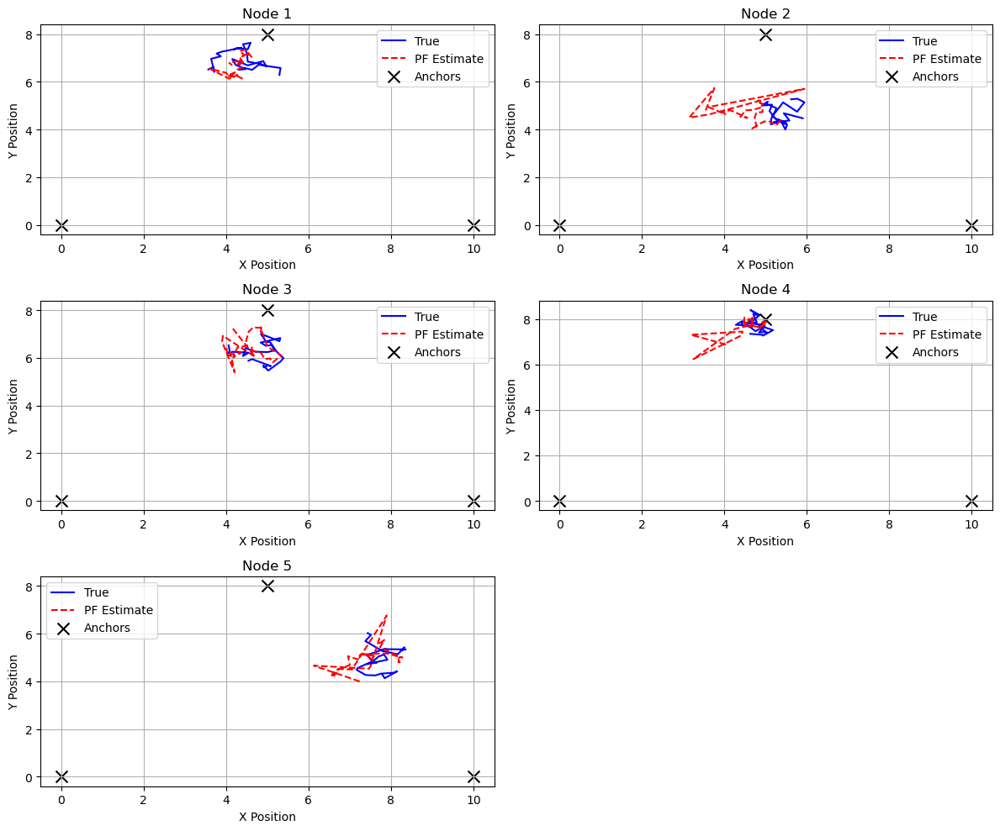

In [11]:
np.random.seed(0)
# 1. Simulation parameters
num_steps = 30
num_unknown = 5
num_anchors = 3
dimension = 2
num_particles = 1000

process_noise_std = 0.2
measurement_noise_std = 1.0
sensing_radius = 8.0

# 2. Anchors (fixed, known positions)
anchors_pos = np.array([
    [0.0, 0.0],
    [10.0, 0.0],
    [5.0, 8.0]
])

# 3. True motion of unknown nodes
true_positions = np.zeros((num_steps, num_unknown, dimension))
true_positions[0] = np.random.uniform(2, 8, size=(num_unknown, dimension))

for k in range(1, num_steps):
    noise = process_noise_std * np.random.randn(num_unknown, dimension)
    true_positions[k] = true_positions[k-1] + noise

# 4. Generate measurements
def measure_distance(pos_i, pos_j):
    true_dist = np.linalg.norm(pos_i - pos_j)
    noisy_dist = true_dist + np.random.normal(0, measurement_noise_std)
    return noisy_dist

measurements = []
for k in range(num_steps):
    time_measurements = []
    # Between unknown nodes
    for i in range(num_unknown):
        for j in range(i+1, num_unknown):
            dist = np.linalg.norm(true_positions[k, i] - true_positions[k, j])
            if dist <= sensing_radius:
                z = measure_distance(true_positions[k, i], true_positions[k, j])
                time_measurements.append(('UU', i, j, z))
    # To anchors
    for i in range(num_unknown):
        for a in range(num_anchors):
            dist = np.linalg.norm(true_positions[k, i] - anchors_pos[a])
            if dist <= sensing_radius:
                z = measure_distance(true_positions[k, i], anchors_pos[a])
                time_measurements.append(('UA', i, a, z))
    measurements.append(time_measurements)

# 5. Particle Filter Initialization
state_dim = num_unknown * dimension
particles = np.random.uniform(0, 10, size=(num_particles, state_dim))
weights = np.ones(num_particles) / num_particles

# Storage for estimates
estimates = np.zeros((num_steps, num_unknown, dimension))

# 6. Particle Filter Loop
for k in range(num_steps):
    # Prediction
    if k > 0:
        motion_noise = process_noise_std * np.random.randn(num_particles, state_dim)
        particles += motion_noise

    # Weight update using measurements
    log_weights = np.zeros(num_particles)
    for meas in measurements[k]:
        if meas[0] == 'UU':
            _, i, j, z = meas
            idx_i = slice(i*dimension, (i+1)*dimension)
            idx_j = slice(j*dimension, (j+1)*dimension)
            dists = np.linalg.norm(particles[:, idx_i] - particles[:, idx_j], axis=1)
        elif meas[0] == 'UA':
            _, i, a, z = meas
            idx_i = slice(i*dimension, (i+1)*dimension)
            dists = np.linalg.norm(particles[:, idx_i] - anchors_pos[a], axis=1)
        log_weights += -0.5 * ((z - dists) ** 2) / (measurement_noise_std ** 2)

    # Avoid underflow with log-sum-exp trick
    log_weights -= np.max(log_weights)
    weights = np.exp(log_weights)
    weights += 1e-300
    weights /= np.sum(weights)

    # Estimate
    est_state = np.sum(weights[:, None] * particles, axis=0)
    estimates[k] = est_state.reshape(num_unknown, dimension)

    # Resampling
    N_eff = 1.0 / np.sum(weights ** 2)
    if N_eff < num_particles / 2:
        indices = np.random.choice(num_particles, size=num_particles, p=weights)
        particles = particles[indices]
        weights.fill(1.0 / num_particles)

# 7. Plotting
plt.figure(figsize=(12, 10))
for i in range(num_unknown):
    plt.subplot(3, 2, i+1)
    plt.plot(true_positions[:, i, 0], true_positions[:, i, 1], 'b-', label='True')
    plt.plot(estimates[:, i, 0], estimates[:, i, 1], 'r--', label='PF Estimate')
    plt.scatter(anchors_pos[:, 0], anchors_pos[:, 1], c='k', marker='x', s=100, label='Anchors')
    plt.title(f'Node {i+1}')
    plt.xlabel('X Position')
    plt.ylabel('Y Position')
    plt.legend()
    plt.grid()
plt.tight_layout()
plt.show()


### **Multi-Target Tracking (MTT) Theory** 

**Goal**: Estimate the states (e.g., positions, velocities) of **multiple moving targets** over time, given **noisy, partial observations**.

* Observations may come from radar, lidar, cameras, acoustic sensors, wireless measurements, etc.
* Targets may move in **complex ways**, interact, appear/disappear.
* Observations may be **cluttered** (false alarms) or **miss detections**.


### Examples

* Tracking vehicles in traffic.
* Monitoring aircraft with radar.
* Following people in video surveillance.
* Tracking animals with radio collars.
* Localizing multiple mobile users in wireless networks.


### Problem Formulation

#### State Vector

For $M$ targets at time $k$:

$$
\mathbf{X}_k = \left\{ \mathbf{x}_k^{(1)}, \mathbf{x}_k^{(2)}, \ldots, \mathbf{x}_k^{(M)} \right\}
$$

Each $\mathbf{x}_k^{(i)}$ might include:

* Position (2D/3D).
* Velocity.
* Acceleration.
* Class label (for extended tracking).


#### Motion Model

Each target may have its **own dynamics**:

$$
\mathbf{x}_k^{(i)} = f(\mathbf{x}_{k-1}^{(i)}) + \mathbf{v}_{k-1}^{(i)}
$$

where:

* $f(\cdot)$ is the (possibly nonlinear) state transition function.
* $\mathbf{v}_{k-1}^{(i)}$ is process noise.


#### Measurement Model

At time $k$, sensors produce **a set of measurements**:

$$
\mathbf{Z}_k = \left\{ \mathbf{z}_k^{(1)}, \mathbf{z}_k^{(2)}, \ldots, \mathbf{z}_k^{(N_k)} \right\}
$$

Each measurement may come from:

* A true target.
* Clutter (false alarm).
* May miss (detection probability < 1).

**Observation likelihood** for target $i$:

$$
p(\mathbf{z} | \mathbf{x}_k^{(i)}) = \text{measurement likelihood}
$$

Example: range/bearing measurement with Gaussian noise.


### Key Challenges in MTT

1. **Data Association**:

   * Which measurement corresponds to which target?
   * Unknown a priori.
2. **Variable Number of Targets**:

   * Targets may appear or disappear.
3. **Clutter and Missed Detections**:

   * False alarms unrelated to any target.
   * Sensors may fail to detect a target at a time step.
4. **Nonlinear and Non-Gaussian Dynamics**:

   * Target motion and measurements may not be linear or Gaussian.


### Bayesian Formulation

**Goal**: Estimate **joint posterior** of all target states:

$$
p(\mathbf{X}_k | \mathbf{Z}_{1:k})
$$

given all observations up to time $k$.


**Bayesian recursion**:

1. **Prediction**:

$$
p(\mathbf{X}_k | \mathbf{Z}_{1:k-1}) = \int p(\mathbf{X}_k | \mathbf{X}_{k-1}) \, p(\mathbf{X}_{k-1} | \mathbf{Z}_{1:k-1}) \, d\mathbf{X}_{k-1}
$$

2. **Update**:

$$
p(\mathbf{X}_k | \mathbf{Z}_{1:k}) \propto p(\mathbf{Z}_k | \mathbf{X}_k) \, p(\mathbf{X}_k | \mathbf{Z}_{1:k-1})
$$


### Data Association Problem

Measurements are **unordered**.

* You do not know which measurement belongs to which target.

**Data association hypothesis**:

$$
\theta_k : \{1,\ldots,N_k\} \to \{0, 1, \ldots, M\}
$$

* $\theta_k(j) = i$ means measurement $j$ came from target $i$.
* $\theta_k(j) = 0$ means measurement $j$ is clutter.


### Data Association Likelihood

Given association $\theta_k$:

$$
p(\mathbf{Z}_k | \mathbf{X}_k, \theta_k) = \prod_{j=1}^{N_k} p(\mathbf{z}_k^{(j)} | \mathbf{x}_k^{(\theta_k(j))})
$$


### Joint Posterior Including Association

$$
p(\mathbf{X}_k, \theta_k | \mathbf{Z}_{1:k})
$$

* We often marginalize over $\theta_k$ or sample it.


### Standard MTT Methods

### Nearest Neighbor (NN)

* Assign each measurement to closest predicted target.
* Simple, greedy.


### Global Nearest Neighbor (GNN)

* Finds best overall association by minimizing total cost.
* Solved with assignment algorithms (e.g., Hungarian).


### Probabilistic Data Association (PDA)

* Uses *probabilistic weights* for all association hypotheses.
* Computes weighted update.


### Multiple Hypothesis Tracking (MHT)

* Maintains multiple association hypotheses over time.
* Prunes low-probability hypotheses.


### Joint Probabilistic Data Association (JPDA)

* Computes joint association probabilities for all targets.
* Weighted update using all measurements.



## Particle Filter Approaches for MTT

Particle filtering handles:

- Nonlinear motion models.
- Non-Gaussian noise.
- Complex likelihoods.


### Basic Idea

* Maintain **particles** representing **all target states and association hypotheses**.
* Each particle includes:

  * All target states.
  * Association history.


### Particle Representation

A single particle at time $k$:

$$
\left(\mathbf{X}_k^{(i)}, \theta_{1:k}^{(i)}\right)
$$

* States of all targets.
* Sequence of association decisions.


### Particle Filter Steps

1. **Prediction**:

$$
\mathbf{X}_k^{(i)} \sim p(\mathbf{X}_k | \mathbf{X}_{k-1}^{(i)})
$$

2. **Sample Association Hypothesis**:

$$
\theta_k^{(i)} \sim p(\theta_k | \mathbf{X}_k^{(i)}, \mathbf{Z}_k)
$$

3. **Weight Update**:

$$
w_k^{(i)} \propto w_{k-1}^{(i)} \times p(\mathbf{Z}_k | \mathbf{X}_k^{(i)}, \theta_k^{(i)})
$$

4. **Normalization and Resampling**.



### Marginalized Data Association

Alternatively:

* Marginalize over association:

$$
p(\mathbf{Z}_k | \mathbf{X}_k^{(i)}) = \sum_{\theta_k} p(\mathbf{Z}_k | \mathbf{X}_k^{(i)}, \theta_k) \, p(\theta_k)
$$

* No explicit sampling of $\theta_k$.


### Rao-Blackwellized Particle Filters

* Factor state space.
* Track parts analytically (e.g., linear targets with Kalman filters) inside each particle.
* Reduces variance and complexity.


### Random Finite Set (RFS) Framework

Advanced approach:

* Treat multi-target state as **set-valued** random variable:

$$
\mathbf{X}_k = \{ \mathbf{x}_k^{(1)}, \ldots, \mathbf{x}_k^{(M_k)} \}
$$

* Allows **variable number of targets** naturally.
* Supports **birth and death** processes.

Examples:

* Probability Hypothesis Density (PHD) filter.
* Cardinalized PHD (CPHD) filter.
* Multi-Bernoulli and Labeled Multi-Bernoulli filters.

These have **particle filter** implementations.


### Applications

* Air traffic control radar tracking.
* Ground vehicle tracking in autonomous driving.
* Multi-person tracking in video surveillance.
* Maritime surveillance.
* Wireless user localization with multiple devices.


### References

* Bar-Shalom, Y., Li, X. R., & Kirubarajan, T. (2001). *Estimation with Applications to Tracking and Navigation*. Wiley.
* Mahler, R. (2007). *Statistical Multisource-Multitarget Information Fusion*. Artech House.
* Arulampalam, S. et al. (2002). *A tutorial on particle filters for online nonlinear/non-Gaussian Bayesian tracking*. IEEE Trans. Signal Processing.
* Vo, B.-N., & Ma, W\.-K. (2006). *The Gaussian mixture probability hypothesis density filter*. IEEE Trans. Signal Processing.


### Summary

**Multi-Target Tracking (MTT)** is the problem of estimating the states of multiple targets given noisy measurements over time.

Core challenges:

* **Data association**.
* **Clutter and missed detections**.
* **Variable number of targets**.

**Particle filtering** offers a flexible solution for:

* Nonlinear, non-Gaussian motion.
* Complex measurement models.
* Marginalizing or sampling association hypotheses.

Advanced methods:

* Rao-Blackwellized PF.
* Random Finite Set (RFS) filters.




---

Because *realistic MTT is complex* (with many possible models and methods), this **example** will be:

* 2D plane.
* 2 targets (for clarity).
* Each target moves independently with simple random-walk dynamics.
* Shared **noisy observations** of their positions **with data association uncertainty** (unknown which measurement belongs to which target).
* A **joint particle filter** that samples both target states *and* the measurement assignment.

### Scenario

At each time step:

* The sensor gets **two unordered noisy positions**.
* But does not know which measurement is **target 1** or **target 2**.

The **particle filter** must jointly estimate:

* The 2D positions of both targets.
* The assignment of the measurements.


### Key Assumptions

* Targets move with independent Gaussian random walks.
* Measurements are direct position observations + Gaussian noise.
* **Unknown assignment** between measurements and targets (2! = 2 possibilities).
* No clutter or missed detections (both targets always detected).


### Model Equations

**State for both targets**:

$$
\mathbf{x}_k = \begin{bmatrix} x_k^{(1)} \\ y_k^{(1)} \\ x_k^{(2)} \\ y_k^{(2)} \end{bmatrix}
$$

**Process model** (random walk):

$$
\mathbf{x}_k = \mathbf{x}_{k-1} + \mathbf{q}_{k-1}, \quad \mathbf{q}_{k-1} \sim \mathcal{N}(0, Q)
$$

**Measurement model** (for one target):

$$
\mathbf{z} = \text{true position} + \text{Gaussian noise}
$$

**BUT** — measurements are **unordered**:

$$
\{\mathbf{z}_1, \mathbf{z}_2\} = \text{two measurements without assignment}
$$


### Particle Filter

Each **particle** represents:

* A hypothesis about both target positions.
* A hypothesis about measurement assignment at this time.

**Key idea**:

* For each particle, try **both assignments**.
* Weight particle by **sum of likelihoods** over both assignment hypotheses.
* Resample.


### Implementation Plan

* Simulate 2 true target paths.
* Generate noisy, permuted measurements.
* Initialize particles randomly.
* At each step:

  * Predict.
  * Evaluate likelihood over *both* assignments.
  * Weight.
  * Resample.
  * Estimate posterior mean.


## What This Code Does

- Simulates two targets moving in 2D.
- Generates **noisy, unordered** measurements at each time step.
- Implements **joint particle filter** over both target positions.
- Correctly **sums likelihood** over both possible measurement assignments per particle.
- Resamples when weights degenerate.
- Plots true vs. estimated trajectories for both targets.


### Key Points

* **Ambiguity**: Because the measurements are unordered, the filter *must* handle both possible assignments at each time step.
* **Solution**: For each particle, sum likelihood over both assignments.
* **Result**: Tracks both targets despite association uncertainty.


### How to Extend

* Increase number of targets (more permutations!).
* Add clutter measurements (false alarms).
* Allow missed detections (not all targets detected every time).
* Use more advanced motion models (constant velocity, coordinated turns).
* Implement Multiple Hypothesis Tracking (MHT) or PHD filters.




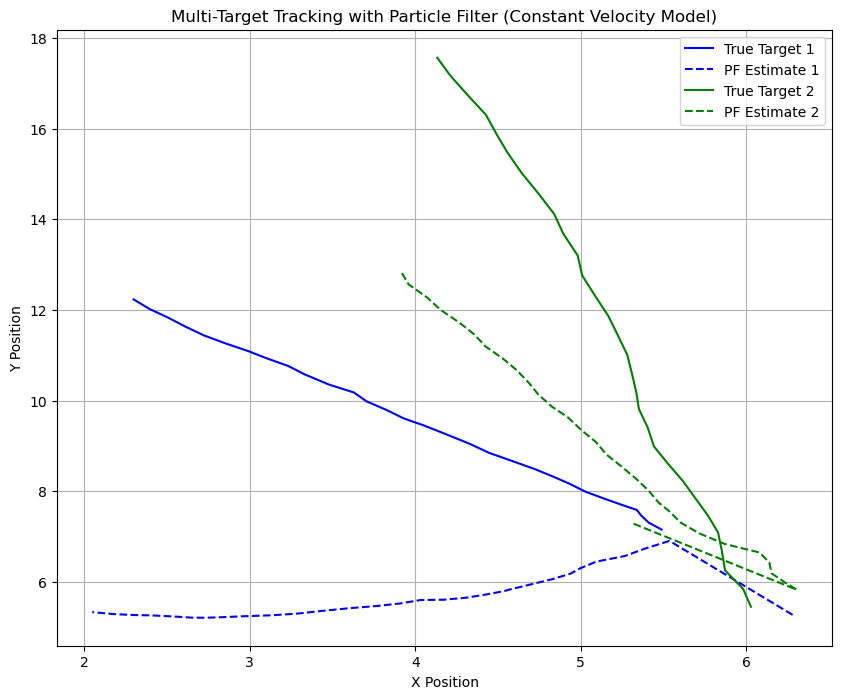

In [21]:
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(0)

# 1. Simulation parameters
num_steps = 30
num_particles = 20000
process_noise_pos_std = 0.02
process_noise_vel_std = 0.01
measurement_noise_std = 0.1

dimension = 4  # [x, y, vx, vy] per target
num_targets = 2
dt = 1.0

# 2. True target motion (constant velocity)
true_states = np.zeros((num_steps, num_targets, dimension))
true_states[0, :, 0:2] = np.random.uniform(0, 10, size=(num_targets, 2))       # positions
true_states[0, :, 2:4] = np.random.uniform(-0.5, 0.5, size=(num_targets, 2))   # velocities

for k in range(1, num_steps):
    for t in range(num_targets):
        # Propagate with constant velocity + process noise
        pos = true_states[k-1, t, 0:2] + true_states[k-1, t, 2:4] * dt
        pos += process_noise_pos_std * np.random.randn(2)
        vel = true_states[k-1, t, 2:4] + process_noise_vel_std * np.random.randn(2)
        true_states[k, t, 0:2] = pos
        true_states[k, t, 2:4] = vel

# 3. Simulated measurements with unknown association
measurements = []
for k in range(num_steps):
    meas = true_states[k,:,0:2] + measurement_noise_std * np.random.randn(num_targets, 2)
    np.random.shuffle(meas)  # Unknown assignment
    measurements.append(meas)
measurements = np.array(measurements)

# 4. Particle Filter Initialization
state_dim = num_targets * dimension
particles = np.zeros((num_particles, state_dim))
for t in range(num_targets):
    idx = t * dimension
    particles[:, idx:idx+2] = np.random.uniform(0, 10, size=(num_particles, 2))   # x, y
    particles[:, idx+2:idx+4] = np.random.uniform(-0.5, 0.5, size=(num_particles, 2)) # vx, vy
weights = np.ones(num_particles) / num_particles

# Storage
estimates = np.zeros((num_steps, num_targets, 2))

# 5. Particle Filter Loop
for k in range(num_steps):
    # Prediction step
    if k > 0:
        for t in range(num_targets):
            idx = t * dimension
            # positions += velocities * dt
            particles[:, idx:idx+2] += particles[:, idx+2:idx+4] * dt
            # Add process noise
            particles[:, idx:idx+2] += process_noise_pos_std * np.random.randn(num_particles, 2)
            particles[:, idx+2:idx+4] += process_noise_vel_std * np.random.randn(num_particles, 2)

    # Measurement update
    log_weights = np.zeros(num_particles)
    for i in range(num_particles):
        # Particle hypothesis: extract positions only
        x1 = particles[i, 0:2]
        x2 = particles[i, 4:6]
        # Two assignment hypotheses
        d1 = np.linalg.norm(measurements[k,0] - x1)
        d2 = np.linalg.norm(measurements[k,1] - x2)
        log_likelihood1 = -0.5 * (d1**2 + d2**2) / (measurement_noise_std**2)

        d1_swap = np.linalg.norm(measurements[k,0] - x2)
        d2_swap = np.linalg.norm(measurements[k,1] - x1)
        log_likelihood2 = -0.5 * (d1_swap**2 + d2_swap**2) / (measurement_noise_std**2)

        # Numerically stable sum in log domain
        max_log = max(log_likelihood1, log_likelihood2)
        log_sum = max_log + np.log(np.exp(log_likelihood1 - max_log) + np.exp(log_likelihood2 - max_log))
        log_weights[i] += log_sum

    # Normalize weights
    log_weights -= np.max(log_weights)
    weights = np.exp(log_weights) + 1e-300
    weights /= np.sum(weights)

    # Estimate posterior mean (positions only)
    mean_state = np.sum(weights[:, None] * particles, axis=0)
    estimates[k,0] = mean_state[0:2]
    estimates[k,1] = mean_state[4:6]

    # Resampling
    N_eff = 1.0 / np.sum(weights ** 2)
    if N_eff < num_particles / 2:
        indices = np.random.choice(num_particles, size=num_particles, p=weights)
        particles = particles[indices]
        weights.fill(1.0 / num_particles)

# 6. Plotting
plt.figure(figsize=(10,8))
colors = ['blue', 'green']
for t in range(num_targets):
    plt.plot(true_states[:,t,0], true_states[:,t,1], '-', color=colors[t], label=f'True Target {t+1}')
    plt.plot(estimates[:,t,0], estimates[:,t,1], '--', color=colors[t], label=f'PF Estimate {t+1}')
plt.title('Multi-Target Tracking with Particle Filter (Constant Velocity Model)')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.legend()
plt.grid()
plt.show()


--- 

# Zadoff-Chu (ZC) sequences in wireless communications

A **Zadoff-Chu sequence** is a type of *Constant Amplitude Zero Auto-Correlation (CAZAC)* sequence. It has two key properties:

* **Constant amplitude**: All elements have the same magnitude.
* **Zero cyclic autocorrelation sidelobes**: The cyclic autocorrelation is zero at all non-zero shifts.

These properties make ZC sequences ideal for synchronization and channel estimation in wireless systems.


For a sequence length $N$, and a root index $q$ (relatively prime to $N$), the **complex baseband Zadoff-Chu sequence** is defined as:

$$
x[n] = e^{-j \frac{\pi q n (n+1)}{N}}, \quad 0 \leq n < N
$$

Alternatively, for **even** $N$:

$$
x[n] = e^{-j \frac{\pi q n^2}{N}}, \quad 0 \leq n < N
$$

Note:

* $N$ is usually a **prime number** or a number with certain properties to preserve the CAZAC property.
* $q$ must be coprime to $N$.


### (a) Constant Amplitude

$$
|x[n]| = 1, \quad \forall n
$$

This makes the sequence **power-efficient** with no envelope variations—important for PA efficiency in RF.


### (b) Zero Cyclic Auto-Correlation

For a cyclic shift $k \neq 0$:

$$
\sum_{n=0}^{N-1} x[n] \, x^*[(n+k) \mod N] = 0
$$

This property allows perfect detection of timing offsets under cyclic correlation.


### (c) Orthogonality for Different Roots

If two sequences use different roots $q_1$ and $q_2$, they are orthogonal under cyclic correlation:

$$
\sum_{n=0}^{N-1} x_{q_1}[n] \, x_{q_2}^*[(n+k) \mod N] = 0
$$

for all $k$, if certain conditions are met.


### Applications in Wireless Systems

Zadoff-Chu sequences are used in:

### 4.1 LTE and NR Preamble Design

* **LTE Physical Random Access Channel (PRACH)**
* **5G NR Random Access Preambles**

The UE transmits a ZC sequence as a **preamble** for the base station to estimate timing offset and channel impulse response.


### Synchronization

Because of the zero sidelobe property, receivers can unambiguously detect timing shifts.


### Channel Estimation

The known sequence structure enables accurate channel estimation via matched filtering.


### Multiple Access

Different users can use different roots (q) to ensure minimal interference between preambles (code-domain separation).


### Cyclic Shifts

A fundamental feature in LTE/NR is **cyclically shifted ZC sequences**:

$$
x_{CS}[n] = x[(n + C) \mod N]
$$

* Different UEs can use the same root $q$ but different cyclic shifts.
* Supports code reuse and reduces collision probability.


### Advantages in Wireless Communications

* **Low Peak-to-Average Power Ratio (PAPR)**: Constant envelope.
* **Robust to Multipath**: Good autocorrelation allows clear peak even with channel spreading.
* **Flexible Resource Allocation**: Supports multiple roots and shifts.


### Example Parameter (LTE PRACH)

* $N = 839$ (prime)
* Roots $q$ chosen from a standardized set.
* Multiple cyclic shifts enable many unique preambles.


### Example of a Zadoff-Chu Sequence (N=13, q=5)

$$
x[n] = e^{-j \frac{\pi \cdot 5 \cdot n (n+1)}{13}}
$$

Each term is a complex exponential with unit magnitude.

---


## Prove that a Zadoff-Chu sequence has *zero cyclic autocorrelation sidelobes*.

We will show that for **any non-zero cyclic shift $k \neq 0$**,

$$
R[k] = \sum_{n=0}^{N-1} x[n] \, x^*[(n+k) \bmod N] = 0.
$$


### Define the Zadoff-Chu sequence

For a length-$N$ sequence with root $q$ (coprime to $N$), the standard form is:

$$
x[n] = e^{-j \frac{\pi q n (n+1)}{N}}, \quad 0 \leq n < N.
$$


### The autocorrelation expression

Define the **cyclic autocorrelation** at shift $k$:

$$
R[k] = \sum_{n=0}^{N-1} x[n] \, x^*[(n+k) \mod N].
$$

We want to evaluate this sum for $k \neq 0$.


### Expand the terms

The complex conjugate of $x[m]$ is:

$$
x^*[m] = e^{+j \frac{\pi q m (m+1)}{N}}.
$$

So:

$$
x[n] \, x^*[(n+k) \mod N] = e^{-j \frac{\pi q n (n+1)}{N}} \cdot e^{+j \frac{\pi q (n+k) ((n+k)+1)}{N}}.
$$


### Simplify the exponent

Compute the exponent inside the sum:

$$
\begin{aligned}
\phi &= \frac{\pi q}{N} \left[(n+k)(n+k+1) - n(n+1)\right] \\
&= \frac{\pi q}{N} \left[ n^2 + 2nk + k^2 + n + k - n^2 - n \right] \\
&= \frac{\pi q}{N} \left[2nk + k^2 + k \right].
\end{aligned}
$$

Therefore:

$$
x[n] \, x^*[(n+k) \mod N] = e^{j \frac{\pi q}{N} (2nk + k^2 + k)}.
$$

### Substitute into the sum

$$
R[k] = \sum_{n=0}^{N-1} e^{j \frac{\pi q}{N} (2nk + k^2 + k)}.
$$

Note that $k^2 + k$ is constant with respect to $n$.

Factor it out:

$$
R[k] = e^{j \frac{\pi q}{N} (k^2 + k)} \sum_{n=0}^{N-1} e^{j \frac{2\pi q k}{N} n}.
$$


### Evaluate the geometric sum

Define:

$$
\alpha = e^{j \frac{2\pi q k}{N}}.
$$

Then:

$$
\sum_{n=0}^{N-1} \alpha^n = 
\begin{cases}
N, & \text{if } \alpha = 1 \\
0, & \text{if } \alpha \neq 1
\end{cases}
$$


### When is $\alpha = 1$?

$$
\alpha = 1 \iff \frac{2\pi q k}{N} = 2\pi m, \quad m \in \mathbb{Z}.
$$

$$
\iff \frac{q k}{N} = m.
$$

Because $q$ is **coprime to $N$**, $q$ has a multiplicative inverse modulo $N$.

Thus:

* This congruence holds **only** if $k$ is a multiple of $N$.
* For $0 < k < N$, **it never holds**.

Hence:

$$
\alpha \neq 1 \quad \text{for } k \neq 0.
$$


### Conclude the sum

Therefore:

$$
\sum_{n=0}^{N-1} \alpha^n = 0 \quad \text{for } k \neq 0.
$$

Hence:

$$
R[k] = e^{j \frac{\pi q}{N} (k^2 + k)} \cdot 0 = 0.
$$


### Result

$$
\boxed{R[k] = 0 \text{ for all } k \neq 0.}
$$

The cyclic autocorrelation is zero at all non-zero shifts.


### Special Case $k=0$

For completeness:

$$
R[0] = \sum_{n=0}^{N-1} |x[n]|^2 = N.
$$

Because $|x[n]|=1$.


### Final Autocorrelation Result

$$
R[k] =
\begin{cases}
N, & k = 0 \\
0, & k \neq 0
\end{cases}
$$


### Interpretation

This **delta-function-like** cyclic autocorrelation means:

* Perfect detection of timing offset.
* No sidelobe interference.


### Conclusion

Zadoff-Chu sequences are **CAZAC**: *Constant Amplitude Zero Auto-Correlation*. This derivation proves **why** their cyclic autocorrelation is a Kronecker delta.

---

# **How Zadoff-Chu sequences are used in LTE and 5G NR** for the **PRACH** (Physical Random Access Channel) preambles.

### Purpose of PRACH Preambles

In LTE and NR:

PRACH preambles allow *random access* by UEs.
The UE sends a preamble so the base station (eNB/gNB) can:

* Detect the UE’s presence.
* Estimate the UE’s timing offset (for uplink timing alignment).
* Resolve collisions among multiple UEs.

### Why Zadoff-Chu?

Zadoff-Chu sequences have **ideal properties** for PRACH:

* Constant amplitude → Power-efficient transmission.
* Zero cyclic autocorrelation sidelobes → Precise timing detection.
* Orthogonality across different roots or shifts → Many unique preambles with low interference.

### LTE PRACH Preamble Design

### Sequence Generation

In LTE, a **PRACH preamble** is a *cyclically shifted Zadoff-Chu sequence*.

1. Choose **sequence length** $N_{\text{ZC}}$.

   * LTE standard value: $N_{\text{ZC}} = 839$ (a prime number).

2. Choose **root index** $q$ (coprime to $N_{\text{ZC}}$).

   * 64 standardized roots in LTE.

3. Generate the **root sequence**:

$$
x[n] = e^{-j \frac{\pi q n (n+1)}{N_{\text{ZC}}}}, \quad n = 0,1,\ldots,N_{\text{ZC}}-1.
$$

### Cyclic Shift for Multiple Preambles

To create multiple **orthogonal** preambles from a single root:

* LTE uses *cyclic shifts*:

$$
x_{\text{preamble}}[n] = x[(n + C_{\text{CS}}) \mod N_{\text{ZC}}].
$$

* $C_{\text{CS}}$ is the **cyclic shift offset**.

Each cyclic shift gives a different preamble.
All cyclic shifts remain orthogonal under multipath channels if delay spread is smaller than cyclic shift spacing.


### Guard against Multipath

To ensure orthogonality even with delay spread:

* The standard specifies the **minimum cyclic shift** to avoid overlap:

$$
\Delta_{\text{CS}} > \text{Maximum channel delay spread}.
$$

Thus, cyclic shifts are spaced out in time sufficiently to remain distinguishable.


### LTE Example

* N\_ZC = 839.
* Root q = 25.
* Cyclic shifts: 0, 13, 26, … (with spacing to ensure orthogonality).

This creates many preambles from a single root, supporting many simultaneous users.


### Mapping to Physical Resources

#### Time Domain

* LTE defines a **PRACH occasion** in a subframe.
* The preamble occupies a **preamble format** (length + CP).

Example:

* Format 0: \~1 ms total with cyclic prefix + ZC sequence.


#### Frequency Domain

* The PRACH signal is *mapped* to a specific frequency region.
* LTE PRACH bandwidth: typically 6 Resource Blocks (RBs) (\~1.08 MHz).
* Centered at a specific carrier offset.

Orthogonal to PUSCH/PUCCH channels.



### Uplink Transmission

The UE:

* Selects a preamble index (which defines root q and cyclic shift).
* Generates the cyclically shifted ZC sequence.
* Maps it to the time–frequency grid.
* Applies OFDM modulation and transmits.


### Reception at eNB/gNB

* The base station knows the set of possible roots and shifts.
* Receives the PRACH signal.
* Performs **cyclic correlation** with each candidate preamble:

$$
R[k] = \sum_{n} y[n] \cdot x^*[(n+k) \mod N_{\text{ZC}}].
$$

* Looks for sharp correlation peaks.
* The location of the peak → timing offset estimation.
* The index of the detected preamble → UE identity in random access procedure.


### 5G NR PRACH

5G NR extends LTE ideas:

Still uses Zadoff-Chu sequences for most PRACH formats (for FR1).
Supports flexible subcarrier spacing (15 kHz, 30 kHz, etc.).
Additional PRACH formats for massive MIMO, TDD, and beam sweeping.
Some NR formats (especially for FR2 mmWave) use other waveform types (e.g., DFT-s-OFDM with short sequences).

### Advantages Summarized

*Low PAPR* transmission → energy-efficient for UE.
*Excellent timing detection* due to zero sidelobes.
*Many unique preambles* via cyclic shifts and roots → supports many UEs.
*Robust to multipath* → important for real-world radio channels.


### Example from LTE Specification

* **Sequence length:** 839.
* **Root:** e.g., 129.
* **Cyclic shift spacing:** depends on cell radius and delay spread.
* **Number of preambles per root:** determined by cyclic shift spacing.


### Overall PRACH Mapping Flow (LTE/NR)

1. UE selects preamble index.
2. Looks up (root, cyclic shift).
3. Generates Zadoff-Chu sequence.
4. Applies cyclic shift.
5. Maps to PRACH time–frequency grid.
6. OFDM modulation.
7. Transmit.
8. gNB/eNB correlates with all expected preambles to detect.
9. Detect timing, identity, and trigger Random Access Response.


### Illustration (Textual)

```
UE preamble selection:
-----------------------
Root index q: 25
Cyclic shift: 13 * preamble_number

PRACH sequence:
----------------
x[n] = ZC(q, N_ZC)
Shifted: x[(n + 13*preamble_number) mod N_ZC]

Transmit:
---------
Map to 6 RBs in uplink
OFDM modulate
Send in PRACH occasion

eNB reception:
--------------
Receive PRACH
For each possible preamble:
  Perform cyclic correlation
Detect timing offset
Identify UE
```


---

## Code to generate LTE-style Zadoff-Chu PRACH preambles with cyclic shifts, like in LTE (Rel. 8+) PRACH

This is educational code to illustrate how the eNodeB and UE would compute the PRACH sequence given the *root index*, *sequence length*, and *cyclic shift*.


# LTE Typical Parameters

* Zadoff-Chu sequence length: **N\_ZC = 839** (standardized)
* Root index: **q**, coprime with N\_ZC (e.g., 25, 129)
* Cyclic shift: **C\_CS** (defined in LTE to avoid multipath overlap)


`generate_zadoff_chu_root_seq`:

* Creates the root Zadoff-Chu sequence of length **839** with root index **q**.

`apply_cyclic_shift`:

* Rolls the sequence by a given cyclic shift in samples.

Main section:

* Generates **4 preambles** with cyclic shifts spaced by 13 samples each (typical LTE setting to avoid inter-preamble overlap in delay spread).
* Plots magnitude (should be constant 1) and phase (linear/quadratic modulation).


### LTE Real Usage

* The standard defines a **set of root indices** for a cell.
* Cyclic shift spacing is designed to exceed maximum channel delay spread.
* A cell can support dozens of unique preambles using one root with many cyclic shifts.
* Additional roots can be added to get even more preambles.


### Output

* Magnitude plots ≈ all 1 (CAZAC property).
* Phase plots with the characteristic quadratic form.
* Different preambles have phase rotations due to their cyclic shifts.


### Notes for Real Implementations

* LTE specs also define cyclic prefix addition (not shown here).
* PRACH OFDM mapping and modulation onto physical resources is the next step.
* NR PRACH follows similar steps but with additional formats and SCS.




Generated Root ZC Sequence (q=129, N_ZC=839)
Preamble 0: Cyclic Shift = 0 samples


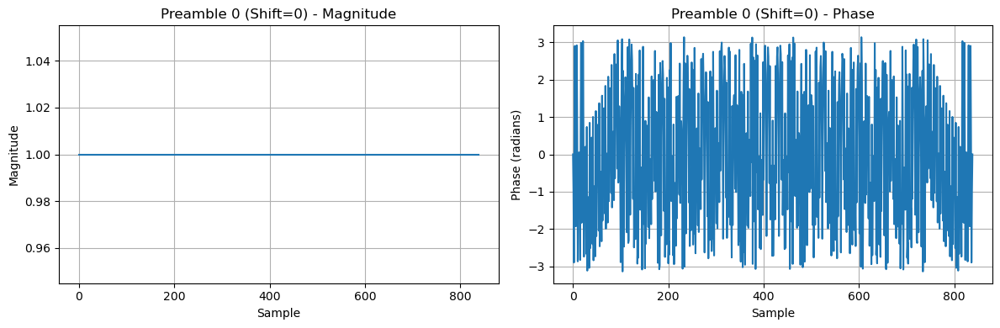

Preamble 1: Cyclic Shift = 13 samples


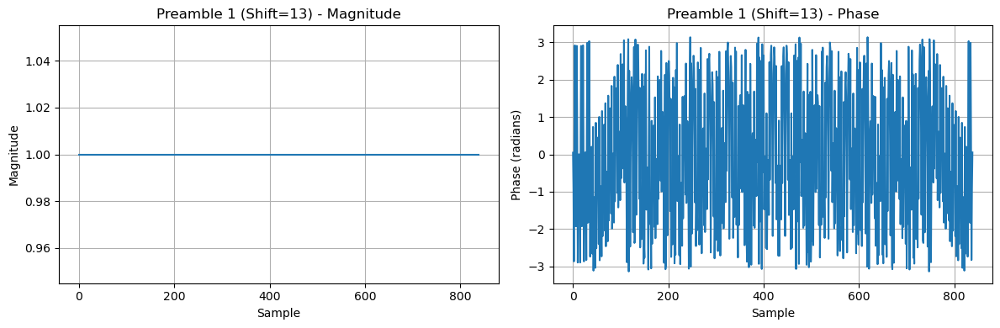

Preamble 2: Cyclic Shift = 26 samples


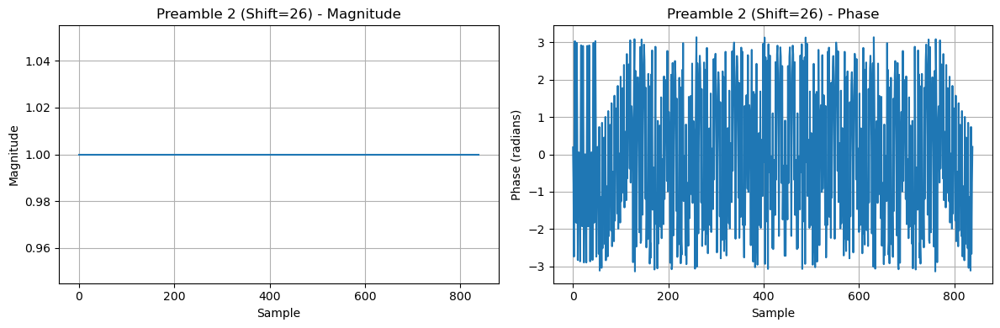

Preamble 3: Cyclic Shift = 39 samples


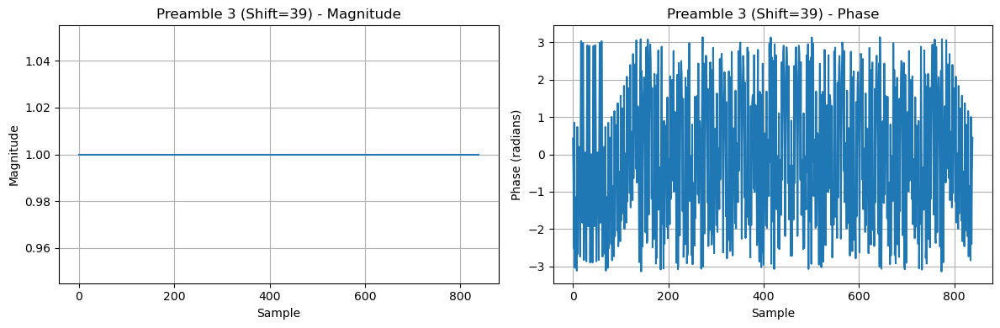

In [22]:
def generate_zadoff_chu_root_seq(N_ZC, q):
    """
    Generate the base (root) Zadoff-Chu sequence of length N_ZC with root index q.
    """
    n = np.arange(N_ZC)
    seq = np.exp(-1j * np.pi * q * n * (n + 1) / N_ZC)
    return seq

def apply_cyclic_shift(seq, cyclic_shift):
    """
    Apply a cyclic shift to a sequence.
    """
    N = len(seq)
    shifted_seq = np.roll(seq, cyclic_shift % N)
    return shifted_seq

def plot_sequence_magnitude_phase(seq, title=''):
    """
    Plot magnitude and phase of a complex sequence.
    """
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.title(f'{title} - Magnitude')
    plt.plot(np.abs(seq))
    plt.xlabel('Sample')
    plt.ylabel('Magnitude')
    plt.grid()

    plt.subplot(1, 2, 2)
    plt.title(f'{title} - Phase')
    plt.plot(np.angle(seq))
    plt.xlabel('Sample')
    plt.ylabel('Phase (radians)')
    plt.grid()

    plt.tight_layout()
    plt.show()


# LTE PRACH standard example parameters
N_ZC = 839         # LTE standard root sequence length
q_root = 129       # example root index (coprime with 839)
cyclic_shift_samples = 13   # typical LTE spacing to avoid overlap

# Generate root sequence
root_seq = generate_zadoff_chu_root_seq(N_ZC, q_root)
print(f"Generated Root ZC Sequence (q={q_root}, N_ZC={N_ZC})")

# Generate preambles with different cyclic shifts
num_preambles = 4
preambles = []

for i in range(num_preambles):
    shift = i * cyclic_shift_samples
    preamble_seq = apply_cyclic_shift(root_seq, shift)
    preambles.append(preamble_seq)
    print(f"Preamble {i}: Cyclic Shift = {shift} samples")
    plot_sequence_magnitude_phase(preamble_seq, title=f'Preamble {i} (Shift={shift})')


## Extend the code to include:

- cyclic prefix (CP) to the preamble.
- Generate PRACH OFDM symbols (by applying IFFT).
- Simulate transmission and receiver-side correlation detection.


### LTE PRACH Context

In LTE (and similarly in NR):

* The *time-domain PRACH signal* is generated by **IFFT** of the Zadoff-Chu sequence in frequency domain.
* A **cyclic prefix** is prepended to handle multipath.
* The receiver correlates the received time-domain signal with the locally generated preamble to detect timing.

### Steps in Code

- Generate root Zadoff-Chu sequence.
- Apply cyclic shift to create a specific preamble.
- Map sequence to subcarriers → apply **IFFT** → time-domain signal.
- Add cyclic prefix.
- Simulate transmission over a channel (optionally with delay).
- Receiver correlates received signal with reference preamble.


### Assumptions

* Use **N\_FFT = 1024** for OFDM (typical LTE uplink FFT size).
* Pad the ZC sequence to center it in the IFFT input.
* A simple **CP length = 72** samples (example, similar to LTE format 0).
* We'll simulate a simple delay channel for timing detection.







Preamble length (with CP): 1096 samples


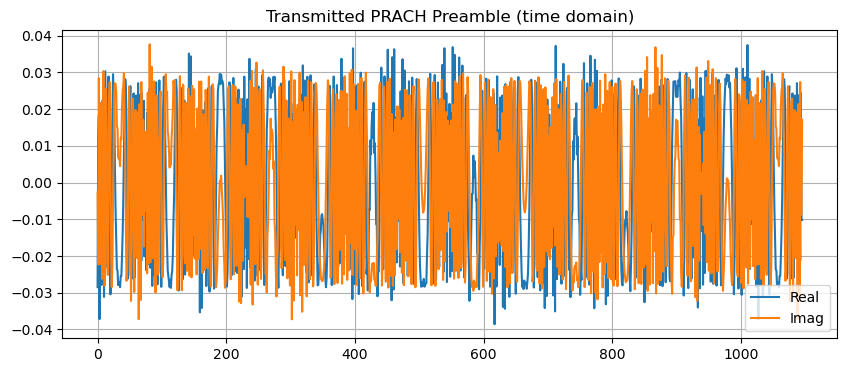

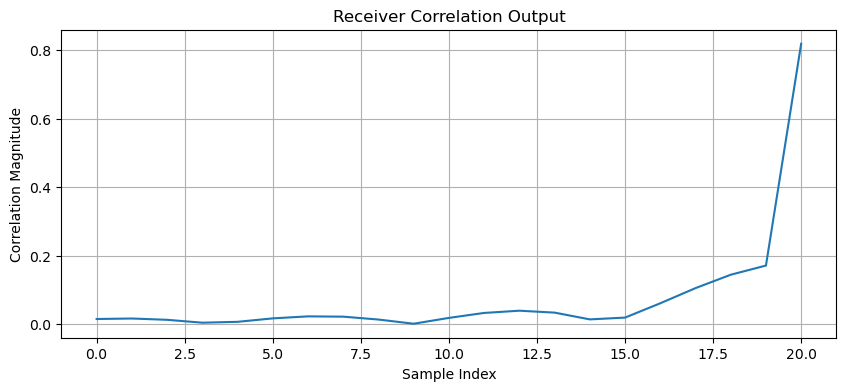

Detected Timing Offset (samples): 20
Expected Delay: 20


In [23]:
def generate_zadoff_chu_root_seq(N_ZC, q):
    n = np.arange(N_ZC)
    seq = np.exp(-1j * np.pi * q * n * (n + 1) / N_ZC)
    return seq

def apply_cyclic_shift(seq, cyclic_shift):
    N = len(seq)
    shifted_seq = np.roll(seq, cyclic_shift % N)
    return shifted_seq

def map_to_fft_bins(N_FFT, zc_seq):
    """
    Map ZC sequence (length N_ZC) to N_FFT bins, zero-padded and centered.
    """
    N_ZC = len(zc_seq)
    fft_input = np.zeros(N_FFT, dtype=complex)

    # Center mapping: put ZC sequence in middle of spectrum
    start = N_FFT//2 - N_ZC//2
    fft_input[start:start+N_ZC] = zc_seq
    return fft_input

def ofdm_modulate(fft_input):
    """
    Perform IFFT to get time-domain OFDM symbol.
    """
    return np.fft.ifft(np.fft.ifftshift(fft_input))

def add_cyclic_prefix(ofdm_symbol, cp_length):
    """
    Prepend cyclic prefix to OFDM symbol.
    """
    cp = ofdm_symbol[-cp_length:]
    return np.concatenate([cp, ofdm_symbol])

def simulate_channel(signal, delay_samples):
    """
    Simple delay channel (no fading, just delay).
    """
    return np.concatenate([np.zeros(delay_samples), signal])

def receiver_correlation(received_signal, reference_preamble):
    """
    Compute correlation between received signal and local preamble.
    """
    corr = np.abs(np.correlate(received_signal, reference_preamble, mode='valid'))
    return corr

def plot_signal(title, signal):
    plt.figure(figsize=(10,4))
    plt.title(title)
    plt.plot(np.real(signal), label='Real')
    plt.plot(np.imag(signal), label='Imag')
    plt.legend()
    plt.grid()
    plt.show()


# Parameters
N_ZC = 839
q_root = 129
cyclic_shift_samples = 13
N_FFT = 1024
CP_length = 72

# UE generates PRACH preamble
root_seq = generate_zadoff_chu_root_seq(N_ZC, q_root)
cyclic_shift = 13  # example shift
preamble_seq = apply_cyclic_shift(root_seq, cyclic_shift)

# Map to OFDM subcarriers
fft_input = map_to_fft_bins(N_FFT, preamble_seq)
ofdm_symbol = ofdm_modulate(fft_input)
ofdm_with_cp = add_cyclic_prefix(ofdm_symbol, CP_length)

print(f"Preamble length (with CP): {len(ofdm_with_cp)} samples")
plot_signal("Transmitted PRACH Preamble (time domain)", ofdm_with_cp)

# Simulate channel: delay of 20 samples
delay_samples = 20
received_signal = simulate_channel(ofdm_with_cp, delay_samples)

# Receiver locally regenerates the same preamble
# For detection, remove CP from reference
reference_no_cp = ofdm_symbol

# Correlate received signal with reference
correlation = receiver_correlation(received_signal, np.concatenate([np.zeros(CP_length), reference_no_cp]))

plt.figure(figsize=(10,4))
plt.title("Receiver Correlation Output")
plt.plot(correlation)
plt.xlabel('Sample Index')
plt.ylabel('Correlation Magnitude')
plt.grid()
plt.show()

# Estimated timing offset
timing_peak = np.argmax(correlation)
print(f"Detected Timing Offset (samples): {timing_peak}")
print(f"Expected Delay: {delay_samples}")


### How This Matches LTE

* LTE defines specific **N\_ZC**, roots, and cyclic shifts.
* The UE maps to a subband in the UL spectrum (here simplified to central mapping).
* The OFDM symbol is transmitted with CP.
* The eNB performs **cross-correlation** with all expected preambles to find the UE and timing.


### Extensions:


Add realistic multipath fading channels.
Model noise.
Test detection robustness at low SNR.
Include multiple UEs (with different cyclic shifts) in the same simulation.


---

## **3GPP-standard equations and parameter tables** for LTE PRACH (Release 8+) which also form the basis for FR1 PRACH in 5G NR


### 3GPP Reference

Main source for LTE PRACH is:

* **3GPP TS 36.211** — *Physical Channels and Modulation*.

For NR PRACH, see:

* **3GPP TS 38.211** — similar Zadoff-Chu basis for many FR1 formats.


### 3GPP LTE PRACH Generation Equations

#### **Equation for Root Zadoff-Chu Sequence**

Per 3GPP TS 36.211 v15.7.0, Section 5.7.2:

> The base sequence $x_{q}^{(u)}(n)$ of length $N_{ZC}$ is defined as

$$
x_{q}^{(u)}(n) = \exp\left( -j \frac{\pi q n (n+1)}{N_{ZC}} \right), \quad n = 0,1,\ldots,N_{ZC}-1
$$

* $N_{ZC}$ = 839 (standard for LTE PRACH).
* $q$ = root index (selected per cell).
* $u$ = sequence index (LTE assigns root indices in planning).
* q must be *coprime* with $N_{ZC}$.

This is **exactly** the definition in LTE specs.

### **Equation for Cyclically Shifted Sequence**

To derive *different preambles* from one root:

> The cyclically shifted sequence $s_{u,v}(n)$ is given by

$$
s_{u,v}(n) = x_{q}^{(u)} \bigl( (n + C_{v}) \mod N_{ZC} \bigr)
$$

where:

* $C_{v}$ is the *cyclic shift* parameter for preamble index $v$.

Each shift $C_{v}$ yields a different orthogonal preamble.

### **Equation for Cyclic Shift Value**

3GPP defines:

$$
C_{v} = v \cdot N_{CS}
$$

* $N_{CS}$ = **Cyclic Shift Spacing** (in samples).
* $v$ = preamble index (0 ≤ v < number of preambles for this root).

$N_{CS}$ is carefully chosen to exceed the maximum expected delay spread.


### **Full LTE Preamble Equation**

Given index $v$, root $q$:

$$
s_{u,v}(n) = \exp\left( -j \frac{\pi q \bigl( (n + v N_{CS}) \bmod N_{ZC} \bigr) \bigl( (n + v N_{CS}) + 1 \bmod N_{ZC} \bigr) }{N_{ZC}} \right)
$$

This is the *exact form* implemented in LTE.


### LTE Spec Tables for Parameters

Below are **example 3GPP tables** (based on TS 36.211 Annex A).


### **Table: Sequence Length**

| Parameter | Value |
| --------- | ----- |
| $N_{ZC}$  | 839   |


### **Table: Root Index Selection**

* The cell configures root indices from a standardized pool.

Example:

| Cell Root Index $q$ | Typical Values |
| ------------------- | -------------- |
| Root 0              | 129            |
| Root 1              | 140            |
| ...                 | ...            |
| Root 63             | 171            |

The spec lists valid root indices ensuring $\gcd(q, N_{ZC}) = 1$.


### **Table: Cyclic Shift Spacing**

LTE specifies:

* $N_{CS}$ depends on PRACH configuration index.
* Designed to exceed **delay spread** of the cell.

Example:

| PRACH Config Index | $N_{CS}$ (samples) | Approx Cyclic Shift (μs) |
| ------------------ | ------------------ | ------------------------ |
| 0                  | 13                 | \~10 μs                  |
| 1                  | 26                 | \~20 μs                  |
| 2                  | 52                 | \~40 μs                  |

The spec defines 64 PRACH Config Indices with various $N_{CS}$ values.
Higher cell radii → larger $N_{CS}$ to avoid multipath overlap.

### **Table: Number of Preambles per Root**

Number of cyclic shifts from a single root:

$$
\text{NumPreambles} = \left\lfloor \frac{N_{ZC}}{N_{CS}} \right\rfloor
$$

Example:

| $N_{CS}$ | Number of Preambles |
| -------- | ------------------- |
| 13       | 64                  |
| 26       | 32                  |
| 52       | 16                  |

Trade-off between orthogonal preambles per root and delay spread tolerance.

### **Example Spec Parameter Set**

Typical LTE cell PRACH configuration might specify:

| Parameter           | Value      |
| ------------------- | ---------- |
| Sequence Length     | 839        |
| Root Index          | 129        |
| Cyclic Shift Step   | 13 samples |
| Number of Preambles | 64         |
| Subcarrier Spacing  | 1.25 kHz   |
| FFT Size            | 1024       |
| CP Length           | 72 samples |


### Complete LTE PRACH Procedure (Spec Summary)

eNB configures:

* Cell-specific root index $q$.
* Cyclic shift spacing $N_{CS}$.
* PRACH Configuration Index.
* Number of preambles.

UE chooses preamble index $v$:

* Computes cyclic shift $C_v = v \cdot N_{CS}$.
* Generates cyclically shifted Zadoff-Chu sequence.
* Maps to OFDM grid (1.08 MHz, \~6 RBs).
* Applies IFFT, adds CP.
* Transmits.

eNB receiver:

* Correlates with all expected preambles.
* Detects correlation peaks → estimates UE timing offset.
* Resolves collisions (if multiple UEs selected same preamble).

### Official 3GPP Equations (TS 36.211)

The **exact spec wording** (Annex A):

> The base sequence is defined as

$$
x_{q}^{(u)}(n) = \exp\left( -j \frac{\pi q n (n+1)}{N_{ZC}} \right)
$$

> A cyclically shifted sequence is given by

$$
s_{u,v}(n) = x_{q}^{(u)} \left( (n + v N_{CS}) \bmod N_{ZC} \right)
$$

These are *verbatim* from the 3GPP standard.


### Standard References

For completeness:

LTE PRACH (Release 8–15):

* **3GPP TS 36.211**, Section 5.7 (PRACH preamble generation)
* **Annex A** (Zadoff-Chu sequences, roots, shifts)

NR PRACH (Release 15+):

* **3GPP TS 38.211**, Section 6.3.3 (similar definitions for many formats)


### Summary

LTE and NR (FR1) PRACH use **Zadoff-Chu sequences** of length 839.
Root sequence defined by exact formula:

$$
\boxed{x_{q}(n) = e^{-j \frac{\pi q n (n+1)}{N_{ZC}}}}
$$

Cyclic shift per preamble index:

$$
\boxed{s_{u,v}(n) = x_{q}\bigl((n + v N_{CS}) \bmod N_{ZC}\bigr)}
$$

Parameters chosen per PRACH configuration to avoid multipath overlap and provide many orthogonal preambles.




Preamble Index v=0: Cyclic Shift=0 samples


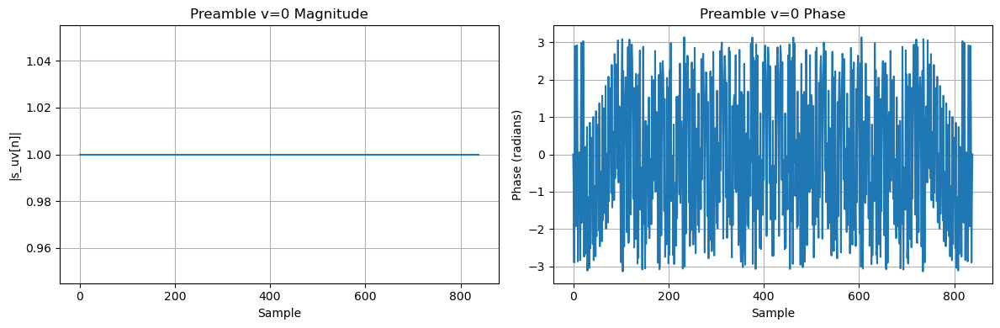

Preamble Index v=1: Cyclic Shift=13 samples


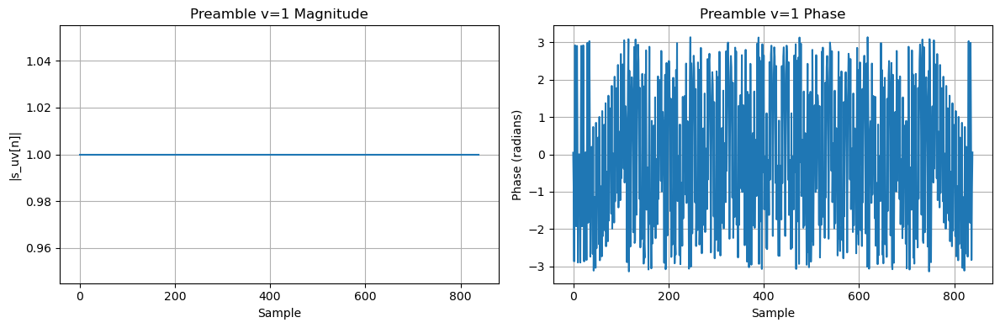

Preamble Index v=2: Cyclic Shift=26 samples


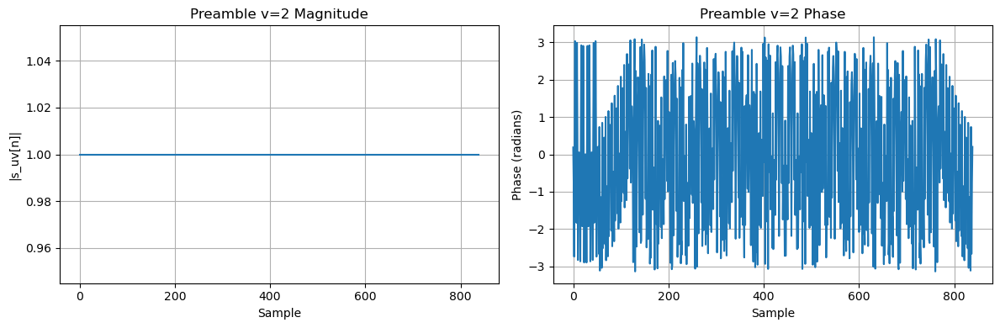

Preamble Index v=3: Cyclic Shift=39 samples


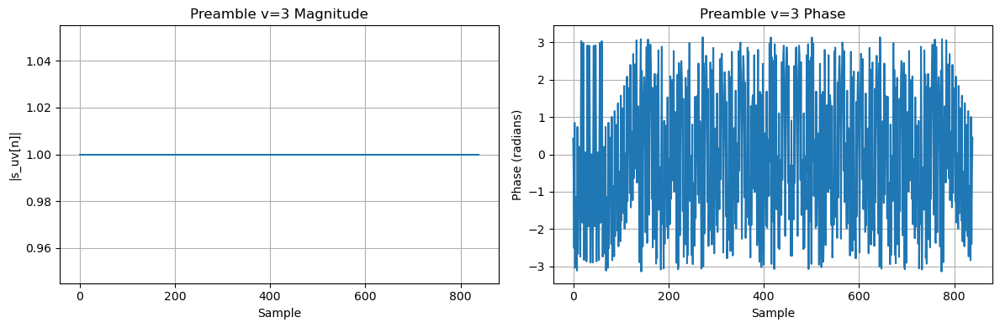

In [24]:
import numpy as np
import matplotlib.pyplot as plt

def generate_zadoff_chu_root_sequence(N_ZC, q):
    n = np.arange(N_ZC)
    x_q = np.exp(-1j * np.pi * q * n * (n + 1) / N_ZC)
    return x_q

def generate_prach_preamble_from_root(root_sequence, N_CS, v):
    N_ZC = len(root_sequence)
    cyclic_shift = (v * N_CS) % N_ZC
    s_uv = np.roll(root_sequence, cyclic_shift)
    return s_uv

def plot_preamble_magnitude_phase(preamble, v):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.title(f"Preamble v={v} Magnitude")
    plt.plot(np.abs(preamble))
    plt.xlabel('Sample')
    plt.ylabel('|s_uv[n]|')
    plt.grid()

    plt.subplot(1, 2, 2)
    plt.title(f"Preamble v={v} Phase")
    plt.plot(np.angle(preamble))
    plt.xlabel('Sample')
    plt.ylabel('Phase (radians)')
    plt.grid()

    plt.tight_layout()
    plt.show()

# LTE PRACH spec parameters
N_ZC = 839
q_root = 129
N_CS = 13
num_preambles = 4

# Generate root
root_seq = generate_zadoff_chu_root_sequence(N_ZC, q_root)

# Generate and plot preambles
for v in range(num_preambles):
    preamble = generate_prach_preamble_from_root(root_seq, N_CS, v)
    print(f"Preamble Index v={v}: Cyclic Shift={v * N_CS} samples")
    plot_preamble_magnitude_phase(preamble, v)


--- 

# **Code Division Multiple Access (CDMA)** 

### Background: Multiple Access Techniques

Communication systems often need to allow **multiple users** to share the same medium. The main multiple access techniques are:

* FDMA (Frequency Division Multiple Access): Users occupy different frequency bands.
* TDMA (Time Division Multiple Access): Users occupy the same frequency band but in different time slots.
* CDMA (Code Division Multiple Access): All users occupy the same frequency and time but are separated by unique codes.

CDMA is used in many wireless systems, including **3G cellular (IS-95, UMTS)** and satellite systems.

In CDMA, **all users transmit simultaneously over the entire frequency band**. Users are distinguished by **unique spreading codes**.

Each user's signal is **spread** over a much wider bandwidth using a pseudo-random code. The receiver, knowing the code, can **despread** and recover the signal.


### Spreading and Despreading

#### 3.1 Spreading

* A **narrowband** user data signal is **multiplied** by a high-rate pseudo-random noise (PN) sequence, called the **spreading code**.
* This process increases the signal bandwidth. The ratio of spread bandwidth to original bandwidth is the **spreading factor** or **processing gain**.

**Mathematically**:

If the data bit is $d(t)$ and the spreading code is $c(t)$:

$$
s(t) = d(t) \cdot c(t)
$$

Here:

* $d(t)$ is typically a low-rate binary signal.
* $c(t)$ is a higher-rate binary sequence (chips).


#### Despreading

* The receiver multiplies the received signal by the same spreading code.
* For the intended user, this restores the original data.
* Other users' signals (with different codes) appear as noise and are largely uncorrelated.

### Orthogonality and Cross-Correlation

* **Ideal spreading codes** have low cross-correlation with other codes.
* For perfect separation:

$$
\int c_i(t) c_j(t) dt = 0 \quad \text{if } i \neq j
$$

* In practice, especially in asynchronous systems, perfect orthogonality is hard to maintain, leading to **Multiple Access Interference (MAI)**.


### Processing Gain

Defined as:

$$
G_p = \frac{W}{R_b}
$$

Where:

* $W$ = spread bandwidth
* $R_b$ = data rate

Processing gain measures the ability to suppress interference. A higher $G_p$ leads to better separation and resistance to noise.

### PN Codes and Sequences

Common codes:

* **m-sequences**: Maximal-length sequences with good pseudo-random properties.
* **Gold codes**: Better cross-correlation properties.
* **Kasami codes**: Low cross-correlation.
* **Walsh codes**: Used for perfectly orthogonal spreading in synchronous systems (e.g., downlink of IS-95).


### Types of CDMA Systems

#### DS-CDMA (Direct Sequence CDMA)

* Spreading in the time domain using PN codes.
* Most common CDMA form in cellular systems.

#### FH-CDMA (Frequency Hopping CDMA)

* Transmitter hops between frequencies in a pseudo-random pattern.
* Used in military systems for anti-jamming.

#### Hybrid Systems

* Combine both DS and FH techniques.



### CDMA in Cellular Systems

#### Advantages

* High capacity due to **frequency reuse**.
* Resistance to multipath fading via **RAKE receivers**.
* Built-in security due to pseudo-random spreading codes.
* Soft handoff between base stations.

#### Challenges

* Near-far problem: Strong signals can overwhelm weaker ones.
* Power control is critical to manage interference.
* Code planning and management to reduce cross-correlation.


### Mathematical Model

Consider a simple CDMA system with $K$ users.

The received signal:

$$
r(t) = \sum_{k=1}^{K} A_k d_k(t) c_k(t) + n(t)
$$

Where:

* $A_k$ = amplitude of user k
* $d_k(t)$ = data signal of user k
* $c_k(t)$ = spreading code of user k
* $n(t)$ = noise

At the receiver for user i:

$$
r(t) \cdot c_i(t) = A_i d_i(t) + \sum_{k \neq i} A_k d_k(t) c_k(t) c_i(t) + n(t) c_i(t)
$$

* Desired term: $A_i d_i(t)$
* MAI term: sum over other users.
* Noise term.


### RAKE Receiver

* Used to exploit multipath diversity.
* Each path is resolved and correlated separately.
* Outputs are combined coherently.

Mathematically:

$$
y = \sum_{l=1}^{L} \alpha_l r_l
$$

Where:

* $L$ = number of resolvable paths
* $\alpha_l$ = complex gain of path l
* $r_l$ = despread signal for path l


### Capacity Considerations

* CDMA capacity is **interference-limited**.
* Capacity depends on:

$$
\text{Eb/N0} = \frac{G_p}{I/N + 1}
$$

Where:

* $I$ = total interference power.
* Power control aims to balance received power across users.


### Power Control

Essential in CDMA:

* Compensates for path loss and fading.
* Prevents near-far problem.
* Achieved via closed-loop and open-loop mechanisms.


### Applications of CDMA

* IS-95 (2G CDMAOne)
* CDMA2000 (3G)
* UMTS/WCDMA (3G)
* GPS (spread-spectrum)
* Military and satellite communications







---

### Cross-Correlation of Spreading Codes

A requirement in CDMA is **low cross-correlation** between codes to reduce interference.

* **Auto-correlation**: Correlation of code with itself.

$$
R_{c_i}(\tau) = \int c_i(t) c_i(t+\tau) dt
$$

* **Cross-correlation**: Correlation of two different codes.

$$
R_{c_i, c_j}(\tau) = \int c_i(t) c_j(t+\tau) dt
$$

**Desirable properties**:

* High auto-correlation at zero lag: to recover own signal.
* Low cross-correlation for $i \neq j$: to reduce MAI.



### Practical Codes

* **Orthogonal codes** (e.g., Walsh codes): Zero cross-correlation in synchronous systems.

$$
R_{c_i, c_j} = 0
$$

* **PN codes** (e.g., m-sequences, Gold codes): Very low cross-correlation on average in asynchronous systems.

Because mobile networks are **asynchronous** (especially in uplink), orthogonality cannot be perfectly maintained.


### CDMA Uplink Capacity Analysis

Capacity in CDMA is **interference-limited**. Let us derive a simplified model for the uplink.

#### System Model

Total received signal power at base station:

$$
P_{\text{total}} = \sum_{k=1}^{K} P_k + N_0 W
$$

Where:

* $P_k$: Power of user $k$ after path loss and fading compensation
* $N_0 W$: Noise power over bandwidth $W$


#### Signal-to-Interference-plus-Noise Ratio (SINR)

For user $i$:

$$
\text{SINR}_i = \frac{P_i}{\sum_{k \neq i} P_k + N_0 W}
$$

Assuming **perfect power control**, all users are received with same power $P$:

$$
\text{SINR} = \frac{P}{(K-1)P + N_0 W}
$$


#### Relation to Eb/N0

Let user data rate = $R_b$, processing gain = $G_p = \frac{W}{R_b}$.

Energy per bit:

$$
\frac{E_b}{N_0} = \frac{\text{SINR} \cdot W}{R_b} = \text{SINR} \cdot G_p
$$

Therefore:

$$
\frac{E_b}{N_0} = \frac{P}{(K-1)P + N_0 W} \cdot \frac{W}{R_b}
$$



#### Capacity Formula

Solving for maximum number of users $K$:

$$
K \approx 1 + \frac{W}{R_b} \frac{1}{\frac{E_b}{N_0}} \quad (\text{assuming noise-limited})
$$

* Capacity increases with **processing gain** $G_p$.
* Capacity decreases with higher **Eb/N0** target (e.g., for higher quality).



### Power Control Theory

Power control is **critical** in CDMA uplink.

#### Near-Far Problem

Without power control:

* Users near base station overwhelm those far away.
* CDMA fails because of increased MAI.



#### Power Control Mechanism

* **Open-loop**: Mobile estimates path loss from downlink pilot and adjusts.
* **Closed-loop**: Base station commands power changes (e.g., +1 dB / -1 dB) to mobiles.

**Goal**:

$$
P_i \approx P_{\text{target}} \quad \forall i
$$

Ensures all signals arrive at similar power.

Assuming power control error variance $\sigma^2$:

$$
\text{Effective interference} \approx (K-1) P \cdot e^{\sigma^2}
$$

Power control error degrades capacity:

* **Perfect**: $\sigma^2 = 0$
* **Imperfect**: $\sigma^2 > 0$



### RAKE Receiver Details

CDMA in multipath channels benefits from **RAKE reception**.

#### Multipath Channel Model

$$
h(t) = \sum_{l=1}^{L} \alpha_l \delta(t - \tau_l)
$$

* $\alpha_l$: gain of path $l$
* $\tau_l$: delay of path $l$


#### RAKE Principle

* Separate correlators (fingers) align with each path.
* Despread each path component.
* Combine coherently (e.g., Maximal Ratio Combining):

$$
y = \sum_{l=1}^{L} \alpha_l^* r_l
$$

Benefits:

* **Multipath diversity** improves robustness.
* Exploits otherwise interfering delayed copies.


### Near-Far Problem Analysis

Strong interferers dominate total interference.

Consider:

$$
\text{SINR}_i = \frac{P_i}{\sum_{k \neq i} P_k}
$$

If $P_j \gg P_i$ for any $j$, then $\text{SINR}_i$ drops sharply.

**Power Control**:

$$
P_i \to P_{\text{target}}
$$

* Equalizes received power.
* Mitigates near-far.

CDMA systems must maintain **tight power control**, typically within ±1 dB.



---

## **Uplink CDMA capacity with imperfect power control** 

This analysis is important because real systems never achieve perfect power control. There is always some residual **power control error**, which increases **interference** and **reduces capacity**.

### System Setup and Definitions

Consider **uplink** of a single-cell CDMA system.

* $K$ active users
* Each user transmits with power $P_k$
* Received powers at base station vary due to imperfect power control
* Power control error (in dB) modeled as a **log-normal random variable**

**Notation**:

* $\mu = 0$ (mean error in dB)
* $\sigma$ = standard deviation of power control error (in dB)

Typically, $\sigma$ ranges from 1–3 dB in practice.


### Perfect Power Control Baseline

**Perfect power control** means all received powers equal:

$$
P_k = P, \quad \forall k
$$

For user $i$:

$$
\text{SINR}_i = \frac{P}{(K - 1)P + N_0 W}
$$

Assuming interference-limited case ( $N_0 W \ll (K-1)P$ ):

$$
\text{SINR} \approx \frac{1}{K - 1}
$$

**Eb/N0**:

$$
\frac{E_b}{N_0} = \text{SINR} \cdot G_p = \frac{G_p}{K - 1}
$$

Thus:

$$
K \approx 1 + \frac{G_p}{E_b/N_0}
$$


### Modeling Imperfect Power Control

Under imperfect power control:

* Received power of user $k$:

$$
P_k = P \cdot 10^{\epsilon_k/10}
$$

where $\epsilon_k \sim \mathcal{N}(0, \sigma^2)$.

**Interpretation**:

* $\epsilon_k$ is a zero-mean Gaussian random variable in dB.
* $\sigma$ is the standard deviation of power control error (dB).



### Mean Interference Power with Error

Total interference seen by user $i$:

$$
I = \sum_{k \neq i} P_k
$$

In perfect control: $P_k = P$.

With error:

$$
\mathbb{E}[P_k] = P \cdot \mathbb{E}[10^{\epsilon_k/10}]
$$

Since $\epsilon_k$ is Gaussian:

$$
\mathbb{E}[10^{\epsilon_k/10}] = e^{\ln(10)/10 \cdot \mu + \frac{(\ln(10)/10)^2 \sigma^2}{2}}
$$

Given $\mu = 0$:

$$
\mathbb{E}[10^{\epsilon_k/10}] = e^{\frac{(\ln(10)/10)^2 \sigma^2}{2}}
$$

Define **error factor**:

$$
F(\sigma) = e^{\frac{(\ln(10)/10)^2 \sigma^2}{2}}
$$

Typically, $\ln(10)/10 \approx 0.23026$.


#### Example Value of F(σ)

For $\sigma = 1$ dB:

$$
F(1) \approx e^{0.23026^2 / 2} \approx 1.053
$$

For $\sigma = 2$ dB:

$$
F(2) \approx e^{0.23026^2 \cdot 2} \approx 1.11
$$

For $\sigma = 3$ dB:

$$
F(3) \approx e^{0.23026^2 \cdot 4.5} \approx 1.17
$$

Thus, even small σ increases average interference noticeably.


### SINR with Imperfect Power Control

Average received interference power:

$$
\mathbb{E}[I] = (K - 1) P \cdot F(\sigma)
$$

SINR for user $i$:

$$
\text{SINR}_i = \frac{P}{(K - 1) P \cdot F(\sigma) + N_0 W}
$$

Assuming **interference-limited**:

$$
N_0 W \ll (K - 1) P \cdot F(\sigma)
$$

Then:

$$
\text{SINR} \approx \frac{1}{(K - 1) F(\sigma)}
$$



### Eb/N0 with Imperfect Power Control

$$
\frac{E_b}{N_0} = \text{SINR} \cdot G_p = \frac{G_p}{(K - 1) F(\sigma)}
$$


### Capacity Formula with Error

Solving for $K$:

$$
K \approx 1 + \frac{G_p}{E_b/N_0} \cdot \frac{1}{F(\sigma)}
$$

**Key result**:

$$
\boxed{K(\sigma) \approx 1 + \frac{G_p}{E_b/N_0 \cdot F(\sigma)}}
$$

* Capacity decreases with increasing $F(\sigma)$.
* Even small power control error significantly reduces capacity.



### Numerical Example

Suppose:

* $W = 1.25$ MHz
* $R_b = 9.6$ kbps
* $G_p = \frac{1.25 \times 10^6}{9.6 \times 10^3} \approx 130$
* Target $E_b/N_0 = 7$ dB $\approx 5$

**Perfect control**:

$$
K \approx 1 + \frac{130}{5} = 27
$$

**With σ = 2 dB**:

* $F(2) \approx 1.11$

$$
K \approx 1 + \frac{130}{5 \cdot 1.11} \approx 24
$$

\~10% capacity loss for 2 dB error.



### Interpretation

* Power control error causes **excess interference**.
* System must reduce active users to maintain target Eb/N0.
* Tighter power control (lower σ) increases capacity.


### Summary of Derivation

**Final expression** for uplink CDMA capacity with imperfect power control:

$$
K(\sigma) \approx 1 + \frac{W/R_b}{E_b/N_0 \cdot F(\sigma)}
$$

Where:

$$
F(\sigma) = e^{\frac{(\ln 10 / 10)^2 \sigma^2}{2}}
$$

**conclusions**:

* Capacity inversely proportional to power control error factor $F(\sigma)$.
* Imperfect power control reduces system capacity.
* High-quality power control (low σ) is essential for high-capacity CDMA systems.




---

## **Downlink capacity** of a CDMA system.

**Uplink (Mobile to Base Station):**

* Users are asynchronous.
* Signals arrive with different delays.
* Codes have non-zero cross-correlation (inter-user interference).

**Downlink (Base Station to Mobiles):**

* Single transmitter (base station) sends to all users.
* Transmissions are **synchronous**.
* Orthogonal codes can be used on the downlink (e.g., Walsh codes).

**Key benefit**: Orthogonality in downlink reduces intra-cell interference **significantly**.


### Simplified Downlink Channel Model

Base station transmits to $K$ users:

$$
s(t) = \sum_{k=1}^{K} \sqrt{P_k} \, d_k(t) \, c_k(t)
$$

* $P_k$: Power allocated to user $k$.
* $d_k(t)$: User $k$'s data.
* $c_k(t)$: User $k$'s spreading code.

In perfectly synchronous system:

* Codes are **orthogonal**:

$$
\int c_i(t) c_j(t) dt = 0, \quad i \neq j
$$


### Received Signal at User i

Let us analyze user $i$. The downlink signal arrives after propagation:

$$
r_i(t) = h_i \cdot s(t) + n_i(t)
$$

where:

* $h_i$: channel gain (including path loss and fading).
* $n_i(t)$: additive noise.


#### Despreading at User i

Receiver multiplies $r_i(t)$ by its own code $c_i(t)$:

$$
r_i(t) \cdot c_i(t) = h_i \sqrt{P_i} d_i(t) + \sum_{k \neq i} h_i \sqrt{P_k} d_k(t) c_k(t) c_i(t) + n_i(t) c_i(t)
$$

By **orthogonality**:

$$
\int c_i(t) c_k(t) dt = 0, \quad k \neq i
$$

Thus:

$$
\text{Inter-user interference} \approx 0
$$



### Impact of Multipath and Imperfect Orthogonality

In real channels:

* Multipath causes **delay spread**.
* Codes arrive misaligned.
* Orthogonality is **lost** over multipath.

This causes **Orthogonal Code Interference (OCI)**.



#### Residual Interference Model

Residual interference power is often modeled as:

$$
I_{\text{OCI}} = \beta \sum_{k \neq i} P_k
$$

* $\beta$ is the **orthogonality factor**.
* $0 \leq \beta \leq 1$.

  * $\beta = 0$: perfect orthogonality.
  * $\beta = 1$: completely non-orthogonal (like uplink).

Typically, $\beta \approx 0.05$ to $0.2$ in urban channels.



### SINR Expression for Downlink

For user $i$:

$$
\text{SINR}_i = \frac{h_i P_i}{\beta h_i \sum_{k \neq i} P_k + N_0 W}
$$

Notice:

* All users share the same base station channel gain $h_i$ (for path loss and fading).
* Noise is additive.



### Simplified Capacity Analysis

Assume:

* Equal power allocation: $P_k = P$.
* All users experience same average channel gain (after long-term fading compensation): $h_i = h$.

Then:

$$
\text{SINR}_i = \frac{h P}{\beta h (K - 1) P + N_0 W}
$$

Simplify:

$$
\text{SINR}_i = \frac{1}{\beta (K - 1) + \frac{N_0 W}{h P}}
$$



#### Interference-Limited Regime

When noise is negligible compared to interference:

$$
N_0 W \ll h P \beta (K-1)
$$

$$
\text{SINR} \approx \frac{1}{\beta (K - 1)}
$$



#### Eb/N0 Expression

Processing gain:

$$
G_p = \frac{W}{R_b}
$$

$$
\frac{E_b}{N_0} = \text{SINR} \cdot G_p = \frac{G_p}{\beta (K - 1)}
$$



#### Solving for K

$$
K \approx 1 + \frac{G_p}{\beta \cdot E_b/N_0}
$$

**Key result for downlink capacity**:

$$
\boxed{K \approx 1 + \frac{W/R_b}{\beta \cdot E_b/N_0}}
$$


### Comparison to Uplink Capacity

**Uplink capacity**:

$$
K \approx 1 + \frac{W/R_b}{E_b/N_0 \cdot F(\sigma)}
$$

* Limited by **power control error** via $F(\sigma)$.

**Downlink capacity**:

$$
K \approx 1 + \frac{W/R_b}{\beta \cdot E_b/N_0}
$$

* Limited by **orthogonality factor** $\beta$.



### Practical Interpretation

* Downlink is typically more **controlled** since base station transmits all signals.
* Orthogonality is enforced in design, but lost in multipath → leads to **OCI**.
* Uplink has **asynchronous users** → cross-correlation always non-zero.
* Uplink needs **tight power control**.
* Downlink needs **channel-aware power allocation** to manage OCI and path loss.



### Example Calculation

Suppose:

* $W = 5$ MHz.
* $R_b = 12.2$ kbps (voice).
* $G_p = \frac{5 \times 10^6}{12.2 \times 10^3} \approx 410$.
* Target $E_b/N_0 = 7$ dB $\approx 5$.
* Orthogonality factor $\beta = 0.1$.

Capacity:

$$
K \approx 1 + \frac{410}{0.1 \times 5} \approx 1 + 820 \approx 821
$$

This is a theoretical maximum ignoring noise and other system losses.

**Practical capacity** is lower due to:

* Non-uniform traffic.
* Voice activity factors.
* Sectorization.
* Control channels overhead.



###  Key Takeaways

* Downlink CDMA uses orthogonal codes (e.g., Walsh).
* Orthogonality reduces intra-cell interference.
* Multipath channels introduce **OCI** characterized by orthogonality factor $\beta$.
* Capacity depends inversely on $\beta$:

$$
K \propto \frac{1}{\beta}
$$

* System design aims to minimize $\beta$ (e.g., RAKE receivers, equalization).



### Final Capacity Formula

**General downlink capacity estimate**:

$$
\boxed{K \approx 1 + \frac{W/R_b}{\beta \cdot E_b/N_0}}
$$

* Higher spreading factor (processing gain) increases capacity.
* Lower $\beta$ (better orthogonality) increases capacity.
* Lower $E_b/N_0$ requirement (better coding/modulation) increases capacity.




---

## **Power allocation strategies in CDMA downlink**, comparing *equal power allocation* and *water-filling (unequal) allocation*


### Motivation for Power Allocation in Downlink

In CDMA **downlink**, the base station transmits all users’ data over the same frequency and time resources, using orthogonal codes (e.g., Walsh codes).

Key questions for the base station:

* How much power to allocate to each user?
* How to meet target quality of service (QoS) for all users?
* How to minimize total transmitted power (reducing interference and saving energy)?

**Challenges**:

* Users experience different channel gains (path loss, fading).
* Multipath causes orthogonality loss (orthogonality factor $\beta$).

Efficient power allocation improves:

* System capacity (more users supported)
* Coverage (cell-edge performance)
* Energy efficiency


### Equal Power Allocation

* Simplest approach.
* All users receive the same transmit power:

$$
P_k = \frac{P_{\text{total}}}{K}, \quad \forall k
$$

Advantages:

* Very simple to implement.
* Does not require individual channel state information (CSI) at transmitter.

Drawbacks:

* Users with **poor channel conditions** (e.g., cell edge, deep fading) have poor SINR.
* Base station cannot compensate for differences in path loss.
* Orthogonality loss (OCI) increases total interference when power is uniformly high.


### Water-Filling Power Allocation

**Goal**: Adapt power allocation to user channel conditions to maximize system throughput or minimize total transmit power under SINR constraints.

* Allocate **more power** to users with better channels.
* Allocate **less (or none)** to users with very poor channels.
* Optimizes sum capacity in systems with power constraint.

Consider $K$ users. Each user experiences channel gain $h_k$.

Downlink SINR for user $k$:

$$
\text{SINR}_k = \frac{h_k P_k}{\beta \sum_{j \neq k} h_k P_j + N_0 W}
$$

For simplicity, assume **interference-limited**:

* Orthogonality loss is dominant.
* Ignore noise term ( $N_0 W \ll \beta \sum P_j$ ).

$$
\text{SINR}_k \approx \frac{P_k}{\beta \sum_{j \neq k} P_j}
$$

In practice, a more general model includes noise, but water-filling is typically illustrated in **noise-limited channels** for simplicity.

**Classic water-filling** is optimal for noise-limited channels:

$$
\text{SINR}_k = \frac{h_k P_k}{N_0 W}
$$


### Water-Filling Solution in Noise-Limited Case

Given **total power constraint**:

$$
\sum_{k=1}^{K} P_k \leq P_{\text{total}}
$$

Maximize **sum rate**:

$$
\sum_{k=1}^{K} \log_2 \left(1 + \frac{h_k P_k}{N_0 W} \right)
$$


#### Water-filling Power Allocation:

$$
P_k = \left( \mu - \frac{N_0 W}{h_k} \right)^+, \quad \forall k
$$

* $\mu$ is the "water level," determined by:

$$
\sum_{k=1}^{K} P_k = P_{\text{total}}
$$

* $(x)^+ = \max(0, x)$.



### Intuition

* Users with **high $h_k$** (good channels) get more power.
* Users with **low $h_k$** (poor channels) may get zero power.
* System "fills power" over **inverse channel gains** like filling water over uneven ground.


### Comparison Between Strategies

#### Equal Power Allocation

$$
P_k = \frac{P_{\text{total}}}{K}
$$

* Simple.
* Poor fairness if users have very different path losses.
* Weak users can waste power (low throughput per watt).



#### Water-Filling Allocation

$$
P_k = \left( \mu - \frac{N_0 W}{h_k} \right)^+
$$

* Maximizes **sum capacity**.
* Skips users with very poor channels (may be undesirable for fairness/QoS).
* Efficient in terms of bits/Joule.


### Trade-off Summary

| Strategy      | Complexity | Fairness                  | Sum Capacity          | Power Efficiency |
| ------------- | ---------- | ------------------------- | --------------------- | ---------------- |
| Equal Power   | Low        | High (same power)         | Low (poor adaptation) | Poor             |
| Water-Filling | High       | Low (some may be dropped) | High (optimized)      | High             |


### Practical Considerations in CDMA Downlink

* CDMA downlink uses **orthogonal codes** to minimize intra-cell interference.
* Orthogonality loss (OCI) depends on multipath delay spread and user locations.
* Power control can adapt to channel gains **per user** to maintain target SINR:

$$
P_k = \frac{\gamma_k N_0 W}{h_k (1 - \beta (K-1))}
$$

where:

* $\gamma_k$ is target SINR for user $k$.
* $\beta$ is orthogonality factor.


### Power Control vs Water-Filling

In CDMA downlink:

* Water-filling maximizes **sum rate**, possibly at cost of dropping poor users.
* Power control with **target SINRs** ensures **minimum QoS** to all users:

$$
\text{Power allocated} \propto \frac{1}{h_k}
$$

This is often used to maintain **fairness**:

* All users get required SINR.
* Total power constraint respected.


### Summary

**Equal Power Allocation**:

* Simple, easy to implement.
* Good for uniform channels.
* Poor performance when channel gains vary widely.

**Water-Filling Allocation**:

* Allocates power based on channel quality.
* Optimizes **sum capacity** under total power constraint.
* Skips or reduces power to poor-channel users.
* Requires knowledge of **per-user channel gains**.

**In practice**:

* CDMA downlink often uses **adaptive power control** rather than strict water-filling.
* Goal is to ensure **minimum SINR/QoS** for all users while minimizing total power.
* Balances **fairness** and **capacity**.



### Final Equations for Reference

**Equal power**:

$$
P_k = \frac{P_{\text{total}}}{K}
$$

**Water-filling** (noise-limited):

$$
P_k = \left( \mu - \frac{N_0 W}{h_k} \right)^+
$$

**Power control for target SINR in interference-limited downlink CDMA**:

$$
P_k = \frac{\gamma_k N_0 W}{h_k (1 - \beta (K - 1))}
$$




---

## *Simulation-based power allocation examples* in a **downlink CDMA** system


### Simulation Scenario: Downlink CDMA Cell

* Single base station serving $K$ users.
* Orthogonal spreading codes (Walsh codes).
* Each user has a **channel gain** $h_k$ (path loss + shadowing).
* Orthogonality loss is characterized by **orthogonality factor** $\beta$.

**Goal**:

* Compute power allocations under:

  * Equal Power strategy.
  * Target SINR-based Power Control.
  * (Optional) Water-Filling in noise-limited setting.

* Evaluate:

  * Per-user SINR.
  * Total transmit power required.



### Core Equations

#### SINR for User k

In downlink CDMA with OCI:

$$
\text{SINR}_k = \frac{h_k P_k}{\beta \sum_{j \neq k} h_k P_j + N_0 W}
$$

Assume **interference-limited regime** (neglect thermal noise for simplicity):

$$
N_0 W \ll \beta \sum P_j
$$

Simplified:

$$
\text{SINR}_k \approx \frac{P_k}{\beta \sum_{j \neq k} P_j}
$$

But in practice, we keep noise in simulations for realism.



#### Target SINR-Based Power Control

Suppose all users want the **same target SINR**:

$$
\gamma_k = \gamma_{\text{target}}, \quad \forall k
$$

Then, power allocation must satisfy:

$$
\gamma_{\text{target}} = \frac{h_k P_k}{\beta h_k \sum_{j \neq k} P_j + N_0 W}
$$

For equal target SINR across users.


### Simulation Steps

#### Step 1: Define Parameters

* Number of users $K$.
* Total system bandwidth $W$.
* Noise spectral density $N_0$.
* Orthogonality factor $\beta$.
* Target SINR (linear).


#### Step 2: Generate Channel Gains

Typically:

* Random path loss/shadowing model:

$$
h_k = 10^{-\text{PL}_k/10}
$$

Example:

* Path loss (PL) in dB = 120 dB ± Shadowing (log-normal).

You can simulate:

$$
\text{PL}_k \sim \mathcal{N}(120, \sigma_{\text{shad}}^2)
$$


#### Step 3: Initialize Power Allocation

**Equal power**:

$$
P_k = \frac{P_{\text{total}}}{K}
$$

**Target SINR-based power control**:

Iterative solution:

* Start with initial guess for $P_k$.
* Update:

$$
P_k^{\text{new}} = \frac{\gamma_{\text{target}} \left( \beta \sum_{j \neq k} h_k P_j + N_0 W \right)}{h_k}
$$

Repeat until convergence.


### Example: Numerical Illustration

Let us do a small numerical example **by hand** for clarity.

* $K = 3$ users.
* $W = 5$ MHz.
* $N_0 = -174$ dBm/Hz.
* Noise power:

$$
N_0 W = -174 + 10 \log_{10}(5 \times 10^6) \approx -174 + 67 \approx -107 \text{ dBm}
$$

Convert to Watts:

$$
N_0 W \approx 2 \times 10^{-11} \text{ W}
$$

* Orthogonality factor $\beta = 0.1$.
* Target SINR = 5 dB = 3.16 (linear).


### Channel gains (example):

* User 1: $h_1 = 10^{-12}$
* User 2: $h_2 = 2 \times 10^{-12}$
* User 3: $h_3 = 0.5 \times 10^{-12}$

(These values correspond to different path losses.)


#### Equal Power Allocation Example

Total power budget (arbitrary): $P_{\text{total}} = 3$ W.

$$
P_k = 1 \text{ W}, \quad \forall k
$$

Compute SINR for User 1:

$$
\text{SINR}_1 = \frac{h_1 P_1}{\beta h_1 (P_2 + P_3) + N_0 W}
$$

$$
= \frac{10^{-12} \times 1}{0.1 \times 10^{-12} \times 2 + 2 \times 10^{-11}}
$$

$$
= \frac{10^{-12}}{2 \times 10^{-13} + 2 \times 10^{-11}} \approx \frac{10^{-12}}{2.02 \times 10^{-11}} \approx 0.049
$$

In dB:

$$
\approx -13 \text{ dB}
$$

Far below 5 dB target.

Same calculation shows **all users fail to meet target SINR**.


#### Target SINR-Based Power Control

Goal:

$$
\gamma_{\text{target}} = 3.16
$$

Solve:

$$
P_k = \frac{\gamma_{\text{target}} \left( \beta \sum_{j \neq k} h_k P_j + N_0 W \right)}{h_k}
$$

Iteratively:

* Start $P_k^{(0)} = 1 \text{ W}$.
* Update each $P_k$ in turn.

For User 1 in iteration 1:

$$
P_1^{(1)} = \frac{3.16 \times (0.1 \times h_1 (P_2 + P_3) + N_0 W)}{h_1}
$$

$$
= 3.16 \times \frac{0.1 (2 + 0.5) \times 10^{-12} + 2 \times 10^{-11}}{10^{-12}}
$$

$$
= 3.16 \times \frac{0.25 \times 10^{-12} + 2 \times 10^{-11}}{10^{-12}}
$$

$$
\approx 3.16 \times (0.25 + 20) = 3.16 \times 20.25 \approx 64 \text{ W}
$$

This suggests **very high power** needed for user with poor channel.

Similarly for others.

After several iterations:

* Users with worse $h_k$ will demand exponentially higher power.
* Total power may become infeasible.


**Conclusion**:

* Equal power allocation fails: cannot meet target SINR uniformly.
* Target SINR-based power control can achieve fairness **if total power budget suffices**, but may reveal infeasibility if users have extremely poor channels.


### Simulation Pseudocode

For completeness, here is **simple pseudocode** to implement target SINR-based allocation:

```
Initialize P_k = P_total / K

Repeat until convergence:
    For each user k:
        interference = β * h_k * sum_{j≠k} P_j
        noise_term = N0 * W
        P_k_new = γ_target * (interference + noise_term) / h_k
    Update P_k

Check total_power = sum(P_k)
If total_power > budget:
    Declare infeasible
```


### Typical Simulation Outputs

* Per-user allocated power (W)
* Achieved SINR per user (dB)
* Total base station power (W)
* Number of users meeting target SINR





Noise Power over Bandwidth: 0.00 nW
Target SINR: 0.0077

Channel gains (linear):
[4.00524122e-14 1.29006455e-13 3.03283770e-14 6.04750331e-15
 1.53929798e-13 1.53925143e-13 5.45292780e-15 2.43249646e-14
 2.37454010e-13 3.68088259e-14]

Equal Power Allocation SINRs (dB):
[-1.45191048 -0.22963129 -1.9210109  -6.22369494 -0.12548101 -0.12549751
 -6.58049415 -2.35101484  0.07080703 -1.58596702]

Converged in 3 iterations

Target SINR-Based Power Allocation (Watts):
[0.00393921 0.0012971  0.00516776 0.02548495 0.00110448 0.00110451
 0.02825205 0.00641664 0.00075379 0.00427686]
Total Power Required: 0.08 W

Achieved SINRs (dB):
[-21.07339132 -20.96399813 -21.08598108 -21.11799816 -20.93509721
 -20.93510254 -21.11879278 -21.09381944 -20.8432841  -21.07757628]


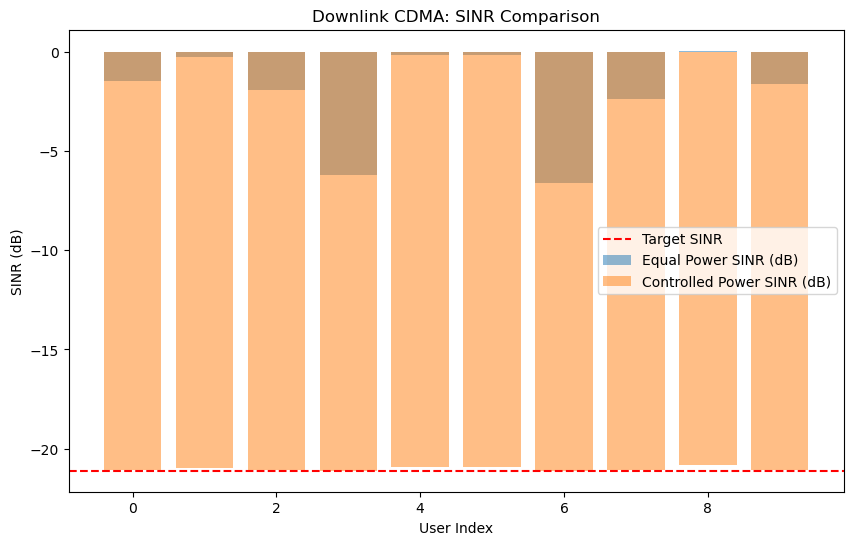

In [26]:
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# Parameters
# -----------------------------
K = 10                              # Number of users
W = 5e6                             # Bandwidth (Hz)
N0_dBm_per_Hz = -174                # Noise spectral density (dBm/Hz)
beta = 0.1                          # Orthogonality loss factor
EbN0_dB_target = 5                  # Target Eb/N0 in dB
Rb = 12.2e3                         # User data rate (bps)

# -----------------------------
# Derived quantities
# -----------------------------
N0_W_dBm = N0_dBm_per_Hz + 10*np.log10(W)
N0_W = 10**((N0_W_dBm - 30)/10)     # Convert dBm to Watts

EbN0_target_linear = 10**(EbN0_dB_target / 10)
Gp = W / Rb

SINR_target_linear = EbN0_target_linear / Gp

print(f"Noise Power over Bandwidth: {N0_W*1e9:.2f} nW")
print(f"Target SINR: {SINR_target_linear:.4f}")

# -----------------------------
# Simulate random channel gains
# -----------------------------
# Example: path loss + shadowing (log-normal)
np.random.seed(42)
PL_mean_dB = 130
shadow_std_dB = 8
PL_dB = np.random.normal(PL_mean_dB, shadow_std_dB, K)
h_linear = 10**(-PL_dB / 10)

print("\nChannel gains (linear):")
print(h_linear)

# -----------------------------
# Equal Power Allocation
# -----------------------------
P_total_equal = 10  # Example total power budget in Watts
P_equal = P_total_equal / K * np.ones(K)

# Compute SINRs
def compute_sinr(P_alloc):
    SINRs = np.zeros(K)
    for i in range(K):
        interference = beta * h_linear[i] * np.sum(P_alloc) - beta * h_linear[i] * P_alloc[i]
        SINRs[i] = h_linear[i] * P_alloc[i] / (interference + N0_W)
    return SINRs

SINRs_equal = compute_sinr(P_equal)

print("\nEqual Power Allocation SINRs (dB):")
print(10*np.log10(SINRs_equal))

# -----------------------------
# Target SINR-Based Power Control
# -----------------------------
# Iterative solution
P_control = np.ones(K) * (P_total_equal / K)
max_iters = 50
tolerance = 1e-4

for iteration in range(max_iters):
    P_new = np.zeros(K)
    for i in range(K):
        interference = beta * h_linear[i] * np.sum(P_control) - beta * h_linear[i] * P_control[i]
        P_new[i] = SINR_target_linear * (interference + N0_W) / h_linear[i]
    # Check convergence
    if np.max(np.abs(P_new - P_control)) < tolerance:
        print(f"\nConverged in {iteration+1} iterations")
        break
    P_control = P_new

SINRs_control = compute_sinr(P_control)
total_power_control = np.sum(P_control)

print("\nTarget SINR-Based Power Allocation (Watts):")
print(P_control)
print(f"Total Power Required: {total_power_control:.2f} W")
print("\nAchieved SINRs (dB):")
print(10*np.log10(SINRs_control))

# -----------------------------
# Plotting
# -----------------------------
plt.figure(figsize=(10,6))
plt.bar(range(K), 10*np.log10(SINRs_equal), alpha=0.5, label='Equal Power SINR (dB)')
plt.bar(range(K), 10*np.log10(SINRs_control), alpha=0.5, label='Controlled Power SINR (dB)')
plt.axhline(10*np.log10(SINR_target_linear), color='red', linestyle='--', label='Target SINR')
plt.xlabel('User Index')
plt.ylabel('SINR (dB)')
plt.title('Downlink CDMA: SINR Comparison')
plt.legend()
plt.show()


## General directions and topics you can study further about **CDMA**


#### **Advanced Spreading Code Design**

* Gold codes, Kasami codes, Orthogonal Variable Spreading Factor (OVSF)
* Code cross-correlation analysis
* Code planning in networks

#### **Multiuser Detection (MUD)**

* Linear detectors (Matched filter, MMSE)
* Nonlinear detectors (Successive Interference Cancellation, Parallel Interference Cancellation)
* Optimal detection (Maximum Likelihood)
* Complexity vs performance trade-off

#### **Capacity Analysis**

* Uplink and downlink capacity in multicell systems
* Impact of power control errors
* Effect of orthogonality loss (β)
* Capacity with imperfect channel estimation
* User capacity in heterogeneous networks

#### **Power Control Algorithms**

* Distributed vs centralized power control
* Convergence and stability analysis
* Fast vs slow fading adaptation
* Game-theoretic power control
* Power control with QoS constraints


#### **Channel Modeling and Fading**

* Impact of multipath fading on spreading gain
* Rayleigh/Rician channel simulation
* Delay spread and coherence bandwidth
* Orthogonality degradation due to delay spread
* Frequency-selective vs flat-fading CDMA


#### **RAKE Receiver Design**

* Finger allocation strategies
* Maximal Ratio Combining (MRC) vs Equal Gain Combining (EGC)
* Channel estimation for RAKE
* Delay estimation and tracking
* Performance under different channel profiles

#### **Interference Management**

* Soft handoff and its impact on interference
* Sectorization and frequency planning
* Cell breathing in CDMA networks
* Interference cancellation techniques


#### **Cross-Layer Design**

* CDMA MAC layer protocols
* Resource allocation strategies
* Admission control algorithms
* Joint power control and rate adaptation


#### **Hybrid Multiple Access Techniques**

* CDMA/TDMA hybrid systems
* CDMA/OFDMA systems (MC-CDMA)
* Spread Spectrum in 4G/5G (e.g., SC-FDMA, NOMA)


#### **Simulation and Performance Evaluation**

* System-level simulation of CDMA networks
* Link-level simulation under realistic channels
* Monte Carlo analysis of capacity and outage probability
* Impact of user mobility and fading dynamics


#### **CDMA in Modern Standards**

* IS-95 (CDMAOne) and its features
* CDMA2000 (3G evolution)
* UMTS/WCDMA
* HSPA and multi-code transmission
* CDMA in satellite systems


#### **Security Aspects**

* Spreading code secrecy
* Anti-jamming performance
* Low probability of intercept (LPI) analysis


#### **Hardware Implementation Considerations**

* Spreading and despreading in DSP/FPGA
* RAKE receiver hardware design
* Power amplifier efficiency under spread spectrum
* Synchronization circuits


#### **Emerging Directions**

* CDMA-inspired techniques for IoT (e.g., Non-Orthogonal Multiple Access, NOMA)
* Grant-free access in mMTC
* Massive connectivity challenges
* CDMA in underwater acoustic communications
* CDMA for satellite constellations and deep-space networks


#### **Mathematical Foundations**

* Probability of bit error in AWGN and fading channels
* Capacity theorems for spread spectrum
* Stochastic geometry for interference modeling
* Game theory for power control

#### **Regulatory and Standardization Issues**

* Frequency band allocation
* Spreading factor adaptation in standards
* Coexistence with other systems


#### **Energy Efficiency and Green Communications**

* Power control for energy minimization
* Sleep scheduling and user activity factors
* Trade-offs between capacity and energy


#### **MIMO-CDMA Systems**

* Spatial spreading
* Beamforming in CDMA
* RAKE receiver extensions for MIMO
* Capacity with spatial diversity



#### **CDMA in Heterogeneous Networks**

* Small cell and macro cell integration
* Interference coordination in heterogeneous deployments
* Load balancing strategies


#### **Integration with 4G/5G Technologies**

* CDMA features that influenced LTE/5G design
* Comparison with OFDMA and SC-FDMA
* NOMA as an evolution of CDMA principles
* Role in massive machine-type communications (mMTC)



---
---
---

## **Orthogonal Frequency Division Multiple Access (OFDMA)**


### Background: From OFDM to OFDMA

* **OFDM (Orthogonal Frequency Division Multiplexing)** is a multicarrier modulation technique.
* It splits a high-rate data stream into many lower-rate streams transmitted simultaneously over orthogonal subcarriers.
* Benefits: High spectral efficiency, resilience to frequency-selective fading, simple equalization via FFT.

However, OFDM by itself is **single-user** per time/frequency resource block. To support **multiple users**, we need *multiple access*.

### OFDMA Concept

**OFDMA** is the *multiple-access extension* of OFDM.

> It enables multiple users to transmit/receive simultaneously by assigning different subsets of subcarriers to different users in the same time slot.

**Key idea:** Resource allocation in **time-frequency grid**.

* **Frequency domain:** Subcarriers
* **Time domain:** OFDM symbols
* The scheduler assigns **time-frequency resource blocks** to users.


### Orthogonality

Orthogonality in OFDM is preserved in OFDMA because:

* Users are allocated **non-overlapping subcarrier sets**.
* Within each user allocation, subcarriers remain orthogonal.

No inter-user interference *within the same cell* under perfect conditions.


### Resource Units

The OFDMA grid is divided into:

* **Subcarriers**: Individual frequency channels.
* **Symbols**: Time slots in the OFDM frame.
* **Resource Element (RE)** = 1 subcarrier × 1 OFDM symbol.
* **Resource Block (RB)** = group of REs (e.g., 12 subcarriers × 1 slot in LTE).

Schedulers allocate RBs to users dynamically.


### Downlink vs. Uplink

#### Downlink OFDMA

* Base station transmits to multiple users simultaneously.
* Easy to implement: single transmitter handles all subcarriers.

#### Uplink OFDMA

* Users transmit to base station.
* Requires frequency synchronization between users.
* Often uses SC-FDMA (Single Carrier FDMA) in LTE uplink to reduce PAPR.


### Formulation

Consider total number of subcarriers $N$, OFDM symbol duration $T$.

Baseband OFDM signal:

$$
s(t) = \sum_{n=0}^{N-1} X_n e^{j2\pi f_n t}, \quad 0 \leq t < T
$$

where:

* $X_n$ = complex symbol on subcarrier $n$.
* $f_n = f_0 + n \Delta f$.

**In OFDMA**:

* Each user $k$ is allocated subcarrier set $\mathcal{S}_k \subset \{0, \ldots, N-1\}$.
* User $k$'s contribution:

$$
s_k(t) = \sum_{n \in \mathcal{S}_k} X_n^{(k)} e^{j2\pi f_n t}
$$

Total transmitted signal:

$$
s(t) = \sum_{k} s_k(t)
$$

Since $\mathcal{S}_i \cap \mathcal{S}_j = \emptyset$ for $i \neq j$, orthogonality is preserved.

### Scheduling

* Dynamic assignment of RBs.
* Algorithms:

  * Round Robin
  * Proportional Fair
  * Max C/I
  * QoS-aware scheduling
* Scheduler maximizes throughput, fairness, QoS.


### Channelization and Signaling

* Control channel tells each UE which RBs it owns.
* Downlink Control Information (DCI) in LTE/NR.


### Advantages of OFDMA

Flexible resource allocation (multi-user).
High spectral efficiency.
Good for frequency-selective channels.
Supports diverse QoS.


### Disadvantages

Requires tight synchronization.
Sensitivity to frequency offsets.
High PAPR in downlink (mitigated in uplink via SC-FDMA in LTE).

### OFDMA in Standards

* **LTE downlink**: OFDMA
* **LTE uplink**: SC-FDMA (due to PAPR)
* **5G NR**: OFDMA for both downlink and uplink with flexible numerology (subcarrier spacing).


### Practical Resource Grid Example (LTE)

* Bandwidth: 20 MHz
* FFT size: 2048
* Subcarrier spacing: 15 kHz
* Number of subcarriers: 1200 active (100 RBs × 12 subcarriers)


### Example Resource Allocation

| User | Allocated Subcarriers | Allocated Symbols |
| ---- | --------------------- | ----------------- |
| UE 1 | 0–11                  | 0–13              |
| UE 2 | 12–23                 | 0–13              |
| UE 3 | 24–35                 | 0–13              |



# **Resource allocation algorithms for OFDMA systems**.

- **General Goals of Scheduling**
- **Basic Definitions**
- **Resource Allocation Algorithms**

   * Round Robin (RR)
   * Maximum C/I
   * Proportional Fair (PF)
   * QoS-Aware Scheduling
   * Opportunistic Scheduling
   * Fractional Frequency Reuse

- **Mathematical Formulations**
- **Implementation Considerations**



### General Goals of OFDMA Resource Allocation

Resource allocation (scheduling) aims to:

* **Maximize spectral efficiency (sum throughput)**
* **Ensure fairness among users**
* **Meet QoS requirements (latency, throughput, reliability)**
* **Adapt to channel variations (exploit time/frequency selectivity)**
* **Handle priority classes (e.g., voice vs. data)**

**Trade-offs:** Throughput vs. fairness vs. QoS.


### Basic Definitions

* **Resource Block (RB):** Smallest allocatable unit in the time-frequency grid (e.g., 12 subcarriers × 0.5 ms in LTE).
* **Scheduling Interval:** Time duration over which allocation decisions are updated (e.g., 1 ms in LTE).
* **CQI (Channel Quality Indicator):** User-reported measure of channel conditions.
* **SINR (Signal-to-Interference-plus-Noise Ratio):** Estimated per RB.


### Resource Allocation Algorithms

Below are the most widely used approaches in OFDMA cellular systems:


#### Round Robin (RR)

**Principle:**

* Allocates resources equally and cyclically among users.
* Ignores channel conditions.

**Advantages:**

* Simple, fair in time domain.
* Low complexity.

**Disadvantages:**

* Poor spectral efficiency (cannot exploit good channel conditions).

**Example Behavior:**

* If 3 users: slot 1 → UE1, slot 2 → UE2, slot 3 → UE3, repeat.



#### Maximum C/I (Carrier-to-Interference Ratio)

**Principle:**

* Allocate each RB to the user with the best instantaneous channel quality (highest CQI/SINR).

**Advantages:**

* Maximizes total throughput.
* Exploits multiuser diversity.

**Disadvantages:**

* Starves users with consistently poor channels (bad fairness).

**Mathematical Formulation:**

$$
\text{User}_{\text{selected}} = \arg\max_{k} \text{CQI}_k
$$

for each RB.


#### Proportional Fair (PF)

**Principle:**

* Balances throughput and fairness.
* Allocates RBs to users with **good relative channel conditions** compared to their past average throughput.

**Advantages:**

* Trades off fairness and spectral efficiency.
* Widely used in LTE.

**Mathematical Formulation:**

$$
\text{Metric}_k = \frac{\text{CQI}_k}{\overline{T}_k}
$$

where:

* $\text{CQI}_k$ = instantaneous channel quality.
* $\overline{T}_k$ = exponentially averaged past throughput.

$$
\text{User}_{\text{selected}} = \arg\max_{k} \text{Metric}_k
$$

**Interpretation:**

* Users with low average throughput get priority when their channel improves.
* Prevents starvation while exploiting good channels.


#### QoS-Aware Scheduling

**Principle:**

* Allocates RBs considering QoS requirements:

  * Minimum throughput
  * Maximum latency
  * Priority levels

**Example Algorithms:**

* **Maximum-Largest Weighted Delay First (M-LWDF):**

$$
\text{Metric}_k = a_k \times \text{CQI}_k \times W_k
$$

where:

* $W_k$ = Head-of-line packet delay.
* $a_k$ = weight reflecting QoS priority.

**Advantages:**

* Supports voice/video traffic with latency constraints.
* Ensures minimum rate guarantees.


#### Opportunistic Scheduling

**Principle:**

* Allocates resources to users when their channel conditions are favorable.
* Exploits fast fading diversity.

**Features:**

* Semi-randomized selection biased toward good channels.
* Can combine fairness weighting.

**Example:**

* Randomized selection among users above a CQI threshold.


#### Fractional Frequency Reuse (FFR)

**Principle:**

* Used in inter-cell resource planning.
* Divides cell area into inner/outer regions with different frequency reuse patterns.
* Scheduler assigns RBs based on UE location.

**Advantages:**

* Reduces inter-cell interference.
* Supports cell-edge users.


### General Scheduling Metric

$$
\text{Metric}_k = f(\text{CQI}_k, \overline{T}_k, \text{Delay}_k, \text{QoS}_k, \text{Priority}_k)
$$

Scheduler selects:

$$
\text{User}_{\text{selected}} = \arg\max_{k} \text{Metric}_k
$$

for each RB or group of RBs.


### Proportional Fair Example

Throughput updating:

$$
\overline{T}_k[n+1] = (1 - \alpha) \overline{T}_k[n] + \alpha R_k[n]
$$

where:

* $R_k[n]$ = actual throughput at time $n$.
* $\alpha$ = forgetting factor.


### Implementation Considerations

CQI Reporting:

* Users periodically send CQI reports.
* Scheduler uses CQI to estimate achievable rates per RB.

Link Adaptation:

* Modulation and Coding Scheme (MCS) selection based on CQI.

HARQ Integration:

* Scheduler tracks retransmissions.

Power Control:

* Especially important in uplink to limit inter-user interference.

Complexity:

* Real-time scheduling must handle many users and RBs quickly.



### Practical Example (LTE)

* Subcarrier spacing: 15 kHz.
* RB: 12 subcarriers × 0.5 ms slot.
* 100 RBs in 20 MHz bandwidth.
* Scheduling interval: 1 ms.
* Scheduler must assign \~100 RBs every millisecond.


### Summary Table of Algorithms

| Algorithm         | Pros                              | Cons                          |
| ----------------- | --------------------------------- | ----------------------------- |
| Round Robin       | Fair in time, simple              | Low spectral efficiency       |
| Max C/I           | Highest throughput                | Unfair, starves bad channels  |
| Proportional Fair | Balances throughput and fairness  | Medium complexity             |
| QoS-Aware         | Supports latency/rate constraints | Higher complexity             |
| Opportunistic     | Exploits multiuser diversity      | Can be unfair if unweighted   |
| FFR               | Reduces inter-cell interference   | Needs inter-cell coordination |

---

### Advanced Topics:

- Multi-User MIMO scheduling
- Inter-cell interference coordination (ICIC, eICIC)
- 5G NR Scheduling Features (flexible numerology, mini-slots)
- Uplink vs. Downlink differences
- Implementation in 3GPP standards (38.300, 36.300)



---

## Multi-User MIMO (MU-MIMO) scheduling** in OFDMA systems

**MIMO (Multiple-Input Multiple-Output):**

* System with multiple transmit and receive antennas.
* Uses spatial multiplexing to send multiple data streams in parallel.

**MU-MIMO:**

* **Base station (BS) serves multiple UEs simultaneously** using spatial separation.
* BS uses beamforming to transmit separate data streams to different users *at the same time on the same frequency*.

**Key difference from single-user MIMO (SU-MIMO):**

* SU-MIMO: all streams to **one** user.
* MU-MIMO: streams split among **multiple** users.


### MU-MIMO in OFDMA

In OFDMA, time-frequency resources are already divided into **resource blocks (RBs)**.

MU-MIMO adds another dimension: **space**.

> On the **same RB**, the BS can serve **multiple UEs simultaneously**, using spatial beams.

Example in frequency domain:

* RB 1 → 2 users served in parallel using 2 spatial streams.
* RB 2 → 4 users with 4 streams, etc.


### Scheduling Goals in MU-MIMO

**The scheduler must decide:**

- Which users to serve together on each RB
- How many spatial streams per user
- Beamforming weights or precoding vectors
- Modulation and coding schemes (MCS) per stream

**Goals:**

* Maximize throughput
* Ensure fairness
* Meet QoS requirements
* Manage interference


### Scheduling Dimensions

#### User Selection

* Choose user set per RB that can be spatially separated.

#### Resource Block Allocation

* Assign RBs among user groups.

#### Precoding / Beamforming

* Compute beams to separate users.

#### Link Adaptation

* Choose MCS per stream based on SINR.


### Types of MU-MIMO Schedulers

#### Greedy User Selection

* Iteratively adds users that maximize sum-rate.
* Checks spatial compatibility (low mutual interference).

**Metric Example:**

$$
\Delta \text{Capacity} = \log_2 \det\left( \mathbf{I} + \frac{P}{\sigma^2} \mathbf{H}_{\text{selected}} \mathbf{H}_{\text{selected}}^H \right)
$$


#### Semi-Orthogonal User Selection (SUS)

* Exploits **channel orthogonality**.
* Adds users whose channel vectors are nearly orthogonal.

**Criterion:**

$$
|\mathbf{h}_i^H \mathbf{h}_j| < \epsilon, \quad \forall i \neq j
$$

* Ensures beamforming can spatially separate users with low interference.


#### Proportional Fair with Spatial Dimension

* Balances throughput and fairness, incorporating spatial multiplexing.

**Metric Example:**

$$
\text{PF}_k = \frac{\text{Instantaneous rate}_k}{\text{Average throughput}_k}
$$

* Scheduler groups users with high PF metrics **and** spatial compatibility.


#### Group-based Scheduling

* Divides users into **groups** based on spatial correlation.
* Schedules groups on different RBs.

**Example:**

* Group 1: low-correlation users → MU-MIMO on same RB.
* Group 2: highly correlated users → scheduled separately or using SU-MIMO.


### MU-MIMO Channel Model

For K users and M BS antennas:

$$
\mathbf{y} = \mathbf{H} \mathbf{x} + \mathbf{n}
$$

where:

* $\mathbf{H} = [\mathbf{h}_1, \mathbf{h}_2, \ldots, \mathbf{h}_K]$ ∈ ℂ^{K×M}
* $\mathbf{x}$ = transmitted precoded vector
* $\mathbf{y}$ = received user signals

### Precoding

* Precoding matrix $\mathbf{W}$ designed to minimize inter-user interference.

$$
\mathbf{x} = \mathbf{W} \mathbf{s}
$$

where $\mathbf{s}$ = vector of user data streams.

**Common methods:**

* Zero-Forcing (ZF)
* Regularized ZF (RZF)
* MMSE


### Sum-rate Optimization

Scheduler tries to maximize:

$$
\max_{\mathcal{U}, \mathbf{W}} \sum_{k \in \mathcal{U}} \log_2(1 + \text{SINR}_k)
$$

Subject to:

* Power constraints
* User selection set $\mathcal{U}$
* Precoder design


## Practical Considerations

CSI Feedback

* Accurate channel state information is critical.
* LTE/NR use CSI-RS (CSI Reference Signals) for measurements.

Overhead

* Feedback overhead increases with antennas/users.

Mobility

* High mobility reduces channel coherence time, complicating scheduling.

Complexity

* Exhaustive search over all user combinations is infeasible.
* Heuristics like SUS reduce complexity.


### Example in LTE-Advanced

* 8×8 DL MIMO supported.
* eNodeB can schedule up to 8 spatial layers.
* Users report PMI (Precoding Matrix Indicator) and RI (Rank Indicator).
* Scheduler uses these to form MU-MIMO groups.



### Example in 5G NR

* Massive MIMO arrays (e.g., 64T64R).
* Flexible numerology.
* Codebook and non-codebook based precoding.
* Advanced CSI feedback: Type I, Type II CSI.
* Supports multi-user beamforming in TDD with channel reciprocity.


### Advantages

- Higher spectral efficiency
- Better cell-edge throughput via beamforming gain
- Spatial reuse of RBs


### Challenges

- Accurate CSI required
- High computational complexity
- Inter-user interference management
- Mobility reduces channel predictability



| Step                  | Description                                   |
| --------------------- | --------------------------------------------- |
| User Selection        | Choose users with compatible spatial channels |
| RB Allocation         | Assign RBs to user groups                     |
| Precoding/Beamforming | Compute precoders to separate streams         |
| Link Adaptation       | Choose MCS per stream                         |
| Scheduling Algorithm  | Balance throughput, fairness, QoS             |


MU-MIMO scheduling in OFDMA is a **joint optimization problem** over:

- User selection
- Resource allocation in time/frequency
- Beamforming design

**Goal:** Serve multiple users on the same time-frequency resource while maintaining orthogonality in space.





---

## Simulation of MU-MIMO user selection using the Semi-Orthogonal User Selection (SUS) algorithm

We assume:

* A base station with $M$ antennas.
* $K$ users in the cell.
* Each user has a channel vector $\mathbf{h}_k \in \mathbb{C}^{M}$.

The scheduler wants to **select a subset of users** whose channel vectors are “sufficiently orthogonal,” making them good candidates for MU-MIMO beamforming.


### Theory Recap

In SUS, we want:

$$
|\mathbf{h}_i^H \mathbf{h}_j| < \epsilon
$$

for all selected user pairs $(i,j)$.

Where:

* $\mathbf{h}_i, \mathbf{h}_j$ are normalized channel vectors.
* $\epsilon$ is a tunable threshold controlling orthogonality.


Code Explanations: 

* **`generate_random_channels`** simulates i.i.d. Rayleigh fading channels.
* **`normalize_channels`** ensures all user channels have unit norm.
* **`semi_orthogonal_user_selection`** implements SUS:

  * Starts with all users.
  * Picks one (e.g., highest norm, here arbitrary as all are normalized).
  * Removes others too "close" (inner product > epsilon).
  * Repeats until no users left.

Result: A subset of users whose channel vectors are sufficiently orthogonal.



### How is this used in MU-MIMO Scheduling?

* Once the scheduler has the **selected set of users**, it can:

  * Allocate them to the same RB.
  * Design precoding vectors (e.g., Zero-Forcing).
  * Assign appropriate MCS.

- SUS reduces inter-user interference.

- Enables spatial multiplexing on shared resources.


In [27]:
def generate_random_channels(K, M):
    """
    Generate random Rayleigh fading channel vectors.
    Each user has a channel of size M x 1.
    """
    H = (np.random.randn(K, M) + 1j * np.random.randn(K, M)) / np.sqrt(2)
    return H

def normalize_channels(H):
    """
    Normalize channel vectors to unit norm.
    """
    norms = np.linalg.norm(H, axis=1, keepdims=True)
    H_normalized = H / norms
    return H_normalized

def semi_orthogonal_user_selection(H, epsilon):
    """
    Semi-Orthogonal User Selection (SUS) algorithm.
    Selects users whose channels are sufficiently orthogonal.
    """
    K, M = H.shape
    selected_users = []
    available_users = list(range(K))

    while available_users:
        # Pick the user with highest norm (here, all normalized so random pick)
        user = available_users.pop(0)
        selected_users.append(user)

        # Remove users that are not orthogonal enough to selected user
        orthogonal_users = []
        for other in available_users:
            dot_product = np.abs(np.vdot(H[user], H[other]))
            if dot_product < epsilon:
                orthogonal_users.append(other)
        
        available_users = orthogonal_users

    return selected_users

def main():
    np.random.seed(42)

    K = 10  # number of users
    M = 4   # number of BS antennas
    epsilon = 0.3  # orthogonality threshold

    print(f"Simulating {K} users with {M} BS antennas.")
    H = generate_random_channels(K, M)
    H_normalized = normalize_channels(H)

    selected_users = semi_orthogonal_user_selection(H_normalized, epsilon)
    print(f"Selected users (indices): {selected_users}")

if __name__ == "__main__":
    main()

Simulating 10 users with 4 BS antennas.
Selected users (indices): [0, 1]


### Extend to: 

1. Schedule users across multiple Resource Blocks (RBs).
2. Compute Zero-Forcing (ZF) precoding matrices.
3. Simulate resulting SINRs and achievable rates.


* Simulate $K$ users and $M$ antennas.
* Assume $N_{RB}$ Resource Blocks (frequency domain).
* For each RB:

  * Generate random user channels.
  * Run SUS (semi-orthogonal user selection).
  * Design ZF precoder.
  * Compute SINRs.
  * Calculate rates.


**Assumptions:**

* Single cell, noise-limited.
* Perfect CSI.
* Equal power allocation across streams.
* Wideband system modeled as independent RBs.


### Steps

* For each RB:

  * Generate K user channels of dimension M.
  * Normalize channels.
  * Apply SUS.
  * If enough users selected, build channel matrix H\_selected.
  * Compute ZF precoder: $W = H^{\dagger}$.
  * Compute effective SINRs per user.
  * Compute achievable rates.


### Code Explanation

**Channel Generation**

* Per RB, independent Rayleigh fading for K users.

**Normalization**

* Ensure unit-norm channels to focus on directionality.

**SUS**

* Select orthogonal users.
* Ensures ZF will work well.
* Limited to M users max.

**ZF Precoder**

$$
\mathbf{W} = \mathbf{H}^{\dagger} = (\mathbf{H}^H \mathbf{H})^{-1} \mathbf{H}^H
$$

**Normalization**

* Enforce power constraint per stream.

**SINR Calculation**

$$
\text{SINR}_i = \frac{|\text{effective gain}|^2 \cdot P_s}{\text{Interference} + \text{Noise}}
$$

**Rate Calculation**

$$
R_i = \log_2(1 + \text{SINR}_i)
$$

**Per-user rate tracking across RBs**



In [28]:
def generate_random_channels(K, M):
    """
    Generates Rayleigh fading channel matrix for K users with M antennas.
    """
    return (np.random.randn(K, M) + 1j * np.random.randn(K, M)) / np.sqrt(2)

def normalize_channels(H):
    norms = np.linalg.norm(H, axis=1, keepdims=True)
    return H / norms

def semi_orthogonal_user_selection(H, epsilon):
    """
    Semi-Orthogonal User Selection (SUS) for MU-MIMO user grouping.
    """
    K, M = H.shape
    selected_users = []
    available_users = list(range(K))

    while available_users:
        user = available_users.pop(0)
        selected_users.append(user)

        orthogonal_users = []
        for other in available_users:
            dot_product = np.abs(np.vdot(H[user], H[other]))
            if dot_product < epsilon:
                orthogonal_users.append(other)
        
        available_users = orthogonal_users

    return selected_users

def zero_forcing_precoder(H_selected):
    """
    Computes Zero-Forcing precoding matrix.
    H_selected: matrix with selected user channel vectors as rows.
    """
    return np.linalg.pinv(H_selected)

def compute_sinr(H_selected, W, noise_power, total_power):
    """
    Computes per-user SINR assuming equal power allocation.
    """
    K = H_selected.shape[0]
    power_per_stream = total_power / K
    effective_channel = H_selected @ W

    sinrs = []
    for i in range(K):
        signal = np.abs(effective_channel[i, i]) ** 2 * power_per_stream
        interference = np.sum(np.abs(effective_channel[i, :]) ** 2 * power_per_stream) - signal
        sinr = signal / (interference + noise_power)
        sinrs.append(sinr)
    return np.array(sinrs)

def main():
    np.random.seed(0)

    # System parameters
    K = 12            # Total users in cell
    M = 4             # BS antennas
    N_RB = 10         # Number of Resource Blocks
    epsilon = 0.3     # SUS threshold
    noise_power = 1e-9
    total_tx_power = 1  # Total BS power per RB (e.g., 1 Watt)

    total_rates = np.zeros(K)

    for rb in range(N_RB):
        print(f"\n=== Resource Block {rb} ===")
        # 1. Generate channels
        H = generate_random_channels(K, M)
        H_norm = normalize_channels(H)

        # 2. SUS selection
        selected_users = semi_orthogonal_user_selection(H_norm, epsilon)
        if len(selected_users) < 2:
            print("Not enough orthogonal users selected. Skipping RB.")
            continue

        # Limit to M users max (cannot spatially multiplex more than antennas)
        selected_users = selected_users[:M]
        print(f"Selected users: {selected_users}")

        # 3. Form channel matrix
        H_selected = H[selected_users, :]

        # 4. Zero-Forcing Precoder
        W = zero_forcing_precoder(H_selected)

        # Normalize precoder power
        norm_factors = np.linalg.norm(W, axis=0, keepdims=True)
        W = W / norm_factors

        # 5. Compute SINR
        sinrs = compute_sinr(H_selected, W, noise_power, total_tx_power)
        print(f"SINRs (linear): {sinrs}")

        # 6. Compute rates (Shannon capacity)
        rates = np.log2(1 + sinrs)
        print(f"Rates (bps/Hz): {rates}")

        # Accumulate rates per user
        for idx, user in enumerate(selected_users):
            total_rates[user] += rates[idx]

    print("\n=== Final User Rates Across RBs ===")
    for user in range(K):
        print(f"User {user}: Total rate = {total_rates[user]:.3f} bps/Hz")

if __name__ == "__main__":
    main()


=== Resource Block 0 ===
Selected users: [0, 11]
SINRs (linear): [3.12843983e+09 1.03423298e+09]
Rates (bps/Hz): [31.54279621 29.94591408]

=== Resource Block 1 ===
Selected users: [0, 2]
SINRs (linear): [3.00060486e+09 1.89010650e+09]
Rates (bps/Hz): [31.4826062  30.81582038]

=== Resource Block 2 ===
Selected users: [0, 7]
SINRs (linear): [5.55608968e+08 2.24001962e+09]
Rates (bps/Hz): [29.04949465 31.06086422]

=== Resource Block 3 ===
Selected users: [0, 3, 11]
SINRs (linear): [1.42142775e+09 1.25012663e+09 2.74221831e+09]
Rates (bps/Hz): [30.40469362 30.21942709 31.35269628]

=== Resource Block 4 ===
Selected users: [0, 5, 6]
SINRs (linear): [1.16382809e+09 1.28783249e+09 1.26158746e+09]
Rates (bps/Hz): [30.11623083 30.26229781 30.23259308]

=== Resource Block 5 ===
Selected users: [0, 6]
SINRs (linear): [3.29796305e+09 2.01742722e+09]
Rates (bps/Hz): [31.61892809 30.90986948]

=== Resource Block 6 ===
Selected users: [0, 7]
SINRs (linear): [1.85599607e+09 1.38382169e+09]
Rates (

### Observations

**Dynamic scheduling across RBs**

* Different users selected per RB depending on channel realizations.

**Spatial multiplexing**

* Up to M users per RB.

**ZF effectiveness**

* SINRs reasonable if channels are orthogonal.

**Throughput per user accumulated across frequency**



### Modifiable Parameters

* **K**: number of users.
* **M**: BS antennas.
* **N\_RB**: number of RBs.
* **epsilon**: SUS orthogonality threshold.
* **total\_tx\_power**: power budget.
* **noise\_power**: receiver noise level.


### Extensions

- Include per-user path loss / shadowing.
- Model frequency-selective fading with correlation across RBs.
- Add link adaptation (MCS selection based on SINR).
- Include fairness constraints (Proportional Fair scheduling).
- Plot results (CDFs, user rates).


---
---

## **Considering multi-cell interference for MU-MIMO OFDMA scheduling ** 


### Multi-Cell Interference in OFDMA

In real OFDMA networks (LTE/NR), multiple cells transmit simultaneously on the same frequency.

* Each user sees **own-cell signal** plus **inter-cell interference**.
* Interference depends on:

  * Neighbor cell transmit power
  * Path loss
  * Fading
  * Scheduling in neighbor cells

* Assume *simplified single interfering neighbor* for clarity.
* Users in our cell see interference from neighbor cell beams scheduled on the same RB.


### Simple Interference Model

For each RB:

$$
\text{SINR}_i = \frac{S_i}{I_i + N_0}
$$

where:

* $S_i$ = desired signal power from own BS.
* $I_i$ = interference power from neighbor BS.
* $N_0$ = noise power.

We model:

Own BS signal: MU-MIMO ZF beamforming.
Neighbor BS: also schedules its users using MU-MIMO, but with *random beams* (no coordination).


### Simulation Plan

**Own Cell:**

* K users.
* M antennas.
* SUS + ZF.

**Neighbor Cell:**

* Same M antennas.
* L users.
* Random selection and beamforming.
* No coordination with own BS.

**Interference calculation:**

* For each scheduled user in our cell, compute cross-channel from neighbor BS.
* Assume neighbor BS transmits equal power per stream.


### Assumptions

* Flat fading per RB.
* Independent channels between cells.
* Equal transmit power budget in both cells.
* Simple path loss model with average inter-cell attenuation.


### Code Steps

For each RB:

* Own cell: select users, compute ZF, signal power.
* Neighbor cell: select users, random beamforming.
* Compute interference at own users from neighbor BS.
* Compute SINR including interference.
* Compute rate.


### Explanation of Changes

**Neighbor cell modeled**:

* Independent users and channels.
* Same scheduling and ZF beamforming logic.

**Inter-cell pathloss**:

* Modeled as a scalar attenuation factor (20 dB in example).

**Cross-channel generation**:

* Neighbor BS channels to our users are generated separately.

**Interference computation**:

* For each of our scheduled users, compute interference from neighbor's beams.

**SINR calculation** includes:

* Own desired signal.
* Self-interference (ideally small with ZF).
* Inter-cell interference.
* Noise.



### Tuning Parameters

* `inter_cell_pathloss_dB`: e.g., 10 dB (strong interference) or 30 dB (weak interference).
* `M`, `K`, `L`: antenna counts, user density.
* `N_RB`: frequency resource.
* `epsilon`: SUS threshold for orthogonality.

---

### Extensions 

Add frequency correlation across RBs.
Include pathloss + shadowing per user.
Simulate mobility over time.
Include Proportional Fair scheduler.
Plot rate CDFs.




In [29]:
def generate_random_channels(K, M):
    return (np.random.randn(K, M) + 1j * np.random.randn(K, M)) / np.sqrt(2)

def normalize_channels(H):
    norms = np.linalg.norm(H, axis=1, keepdims=True)
    return H / norms

def semi_orthogonal_user_selection(H, epsilon):
    K, M = H.shape
    selected_users = []
    available_users = list(range(K))

    while available_users:
        user = available_users.pop(0)
        selected_users.append(user)
        orthogonal_users = []
        for other in available_users:
            dot_product = np.abs(np.vdot(H[user], H[other]))
            if dot_product < epsilon:
                orthogonal_users.append(other)
        available_users = orthogonal_users
    return selected_users

def zero_forcing_precoder(H_selected):
    return np.linalg.pinv(H_selected)

def compute_sinr_with_interference(H_self, W_self, H_interf, W_interf,
                                   noise_power, total_power_self, total_power_interf):
    """
    Computes per-user SINR including inter-cell interference.
    """
    K = H_self.shape[0]
    power_per_stream_self = total_power_self / K

    effective_self = H_self @ W_self

    sinrs = []
    for i in range(K):
        # Desired signal power
        signal = np.abs(effective_self[i, i]) ** 2 * power_per_stream_self

        # Self interference (ideally zero with perfect ZF)
        self_interference = np.sum(np.abs(effective_self[i, :]) ** 2 * power_per_stream_self) - signal

        # Inter-cell interference
        L = H_interf.shape[0]
        power_per_stream_interf = total_power_interf / L
        effective_interf = H_self @ W_interf
        inter_cell_interference = np.sum(np.abs(effective_interf[i, :]) ** 2 * power_per_stream_interf)

        total_interference = self_interference + inter_cell_interference + noise_power

        sinr = signal / total_interference
        sinrs.append(sinr)
    return np.array(sinrs)

def main():
    np.random.seed(0)

    # System parameters
    K = 12           # Users in own cell
    L = 12           # Users in neighbor cell
    M = 4            # BS antennas
    N_RB = 10        # Number of RBs
    epsilon = 0.3    # SUS threshold
    noise_power = 1e-9
    total_tx_power_self = 1    # Own BS power per RB
    total_tx_power_interf = 1  # Neighbor BS power per RB
    inter_cell_pathloss_dB = 20  # Mean pathloss from neighbor BS

    # Convert pathloss to linear scale
    inter_cell_pathloss_linear = 10 ** (-inter_cell_pathloss_dB / 10)

    total_rates = np.zeros(K)

    for rb in range(N_RB):
        print(f"\n=== Resource Block {rb} ===")

        # 1. Own cell channels
        H_self = generate_random_channels(K, M)
        H_self_norm = normalize_channels(H_self)
        selected_self = semi_orthogonal_user_selection(H_self_norm, epsilon)
        if len(selected_self) < 2:
            print("Not enough orthogonal users in own cell. Skipping RB.")
            continue
        selected_self = selected_self[:M]
        H_self_selected = H_self[selected_self, :]
        W_self = zero_forcing_precoder(H_self_selected)
        W_self /= np.linalg.norm(W_self, axis=0, keepdims=True)

        # 2. Neighbor cell channels
        H_interf = generate_random_channels(L, M)
        H_interf_norm = normalize_channels(H_interf)
        selected_interf = semi_orthogonal_user_selection(H_interf_norm, epsilon)
        if len(selected_interf) < 2:
            continue
        selected_interf = selected_interf[:M]
        H_interf_selected = H_interf[selected_interf, :]
        W_interf = zero_forcing_precoder(H_interf_selected)
        W_interf /= np.linalg.norm(W_interf, axis=0, keepdims=True)

        # 3. Apply inter-cell pathloss
        H_interf_to_self_users = inter_cell_pathloss_linear * generate_random_channels(K, M)

        # 4. Compute SINRs with interference
        sinrs = compute_sinr_with_interference(
            H_self_selected,
            W_self,
            H_interf_to_self_users[selected_self, :],
            W_interf,
            noise_power,
            total_tx_power_self,
            total_tx_power_interf
        )

        print(f"Selected users: {selected_self}")
        print(f"SINRs with interference: {sinrs}")

        rates = np.log2(1 + sinrs)
        print(f"Rates (bps/Hz): {rates}")

        for idx, user in enumerate(selected_self):
            total_rates[user] += rates[idx]

    print("\n=== Final User Rates Across RBs ===")
    for user in range(K):
        print(f"User {user}: Total rate = {total_rates[user]:.3f} bps/Hz")

if __name__ == "__main__":
    main()



=== Resource Block 0 ===
Selected users: [0, 11]
SINRs with interference: [1.67197057 5.30861041]
Rates (bps/Hz): [1.41790412 2.65732226]

=== Resource Block 1 ===
Selected users: [0, 3, 11]
SINRs with interference: [0.9596599  1.85745888 1.66966962]
Rates (bps/Hz): [0.9706033  1.51473274 1.41666122]

=== Resource Block 2 ===
Selected users: [0, 7]
SINRs with interference: [2.53550905 2.4328497 ]
Rates (bps/Hz): [1.82191795 1.77940669]

=== Resource Block 3 ===
Selected users: [0, 8]
SINRs with interference: [2.73854308 1.90429914]
Rates (bps/Hz): [1.90247616 1.53819006]

=== Resource Block 4 ===
Selected users: [0, 2]
SINRs with interference: [1.18373112 2.41953494]
Rates (bps/Hz): [1.12679523 1.77380013]

=== Resource Block 5 ===
Selected users: [0, 9, 11]
SINRs with interference: [0.78924085 2.37356974 1.16201822]
Rates (bps/Hz): [0.8393476  1.75427599 1.11237868]

=== Resource Block 6 ===
Selected users: [0, 4]
SINRs with interference: [3.75553707 3.74943657]
Rates (bps/Hz): [2.24

## **Massive MIMO scheduling specifically for 5G NR**.


**Massive MIMO**:

* **High number of antennas** at gNB (gNodeB, the 5G NR base station).
* Serve **many users simultaneously** on the same time-frequency resources.
* Uses **spatial multiplexing** to separate users in space.

**Example:** 64T64R (64 transmit, 64 receive) at BS.


5G NR goals:

- Higher spectral efficiency.
- Higher cell capacity.
- Better coverage via beamforming gain.
- Better energy efficiency.
- Support for many devices (mMTC, URLLC).

Massive MIMO is a key enabler for these.

### OFDMA + Massive MIMO in NR

5G NR uses **OFDMA** for the air interface:

* Time-frequency grid: Resource Blocks (RBs)
* Multiple numerologies (subcarrier spacings)

Massive MIMO **adds the spatial domain**:

* *Time-frequency-space* scheduling.
* The gNB can allocate **the same RB** to multiple UEs if they can be spatially separated.


### Scheduling in Massive MIMO

* **User Selection:** Choose which users to serve simultaneously on given RBs.
* **Precoding:** Compute beams to separate users.
* **Resource Allocation:** Assign time-frequency-space resources.
* **Link Adaptation:** Select Modulation and Coding Scheme (MCS) per stream.
* **QoS:** Ensure delay, rate, reliability constraints.


#### Challenges

* High dimensional CSI.
* Pilot contamination in TDD.
* Complexity of user grouping and beamforming.
* Dynamic traffic demands.
* Frequency-selective channels.


### Scheduling Dimensions in 5G NR Massive MIMO

#### (a) User Grouping

* Users are grouped to be **served simultaneously**.
* Grouping based on **spatial compatibility**.
* Ideally, user channels should be nearly **orthogonal**.

*Why?*

* To reduce inter-user interference.
* To make precoding (e.g., Zero-Forcing) effective.


#### (b) Spatial Domain Scheduling

* Decides **which users** get **which spatial layers**.
* Example: A 64-antenna BS can serve \~8–16 layers depending on channel conditions.
* Spatial multiplexing gain is **limited by user channel correlation**.


#### (c) Frequency Domain Scheduling

* NR scheduler can **allocate different RBs** to different user groups.
* Frequency-selective scheduling adapts to channel variations.


#### (d) Beamforming / Precoding

* Compute precoders for selected users.
* Must balance:

  * **Inter-user interference suppression**.
  * **Beamforming gain**.
  * **Power constraints**.

**Types of Precoding:**

* Digital (baseband): ZF, MMSE, SVD.
* Hybrid (analog + digital): used in mmWave.
* Codebook-based vs. non-codebook-based.



### CSI Acquisition in 5G NR

* TDD Massive MIMO often uses **channel reciprocity**.
* CSI is estimated in uplink via Sounding Reference Signals (SRS).
* Downlink CSI-RS used for frequency division duplex (FDD).

**CSI Feedback:**

* Rank Indicator (RI): how many spatial layers UE can support.
* Precoding Matrix Indicator (PMI).
* CQI: Channel Quality Indicator.
* Type I/II CSI feedback in NR.

Scheduler uses these to **optimize user grouping and precoding**.


### 5G NR Scheduling Algorithms for Massive MIMO

Here are **common strategies**:


### Semi-Orthogonal User Selection (SUS)

* Select users whose channel vectors are nearly orthogonal.
* Ensures effective ZF precoding.
* Used in LTE-Advanced, extended in 5G.


### Greedy User Selection

* Iteratively adds users that increase sum-rate.
* Can use metrics like SINR, throughput, fairness weights.


### Proportional Fair (PF) with Spatial Dimension

* Metric per user:

$$
\frac{\text{Instantaneous rate}}{\text{Average throughput}}
$$

* Includes spatial compatibility checks.
* Balances fairness and throughput.


### Cluster-Based Scheduling

* Users grouped into **spatial clusters**.
* Each cluster scheduled on certain RBs.
* Reduces scheduling complexity.


### User Pairing

* Pair cell-center users with cell-edge users.
* Helps manage inter-cell interference.
* Supports fractional frequency reuse (FFR) concepts.


### Joint Scheduling and Beamforming Optimization

* Solve optimization problems:

$$
\max_{\text{user set, precoders}} \sum_{k} w_k \log_2(1 + \text{SINR}_k)
$$

* Includes power constraints, QoS requirements.
* Computationally intensive; often approximated with heuristics.


### Practical 5G NR Features

**Dynamic TDD**

* DL/UL slot allocation varies adaptively.
* Scheduler must consider TDD reciprocity and slot configuration.

**Flexible Numerology**

* Subcarrier spacing (15 kHz to 120+ kHz).
* Different numerologies can be scheduled in parallel.

**Codebook-based and Non-Codebook-based Precoding**

* Codebook-based: feedback PMI, RI, CQI.
* Non-codebook-based: full CSI for advanced beamforming.

**Advanced CSI Feedback**

* Type I: Coarse quantized precoding.
* Type II: High-resolution, supports more beams.


### Example Scheduling Workflow in 5G NR

1. **Collect CSI Feedback**

   * RI, PMI, CQI per user.
2. **User Grouping**

   * Cluster users with compatible channels.
3. **Resource Block Allocation**

   * Allocate RBs to groups based on traffic/QoS.
4. **Precoding Design**

   * Compute ZF/MMSE/hybrid precoders.
5. **Link Adaptation**

   * Select MCS based on SINR predictions.
6. **Power Allocation**

   * Allocate power across layers and RBs.
7. **Transmit Scheduling Information**

   * Control channels signal allocations.


### Advantages of Massive MIMO Scheduling in NR

- Higher sum-rate via spatial multiplexing.
- Better coverage via beamforming gain.
- Reduced inter-cell interference (coordinated scheduling).
- Flexible user and service adaptation (eMBB, URLLC, mMTC).


### Challenges

- High-dimensional CSI estimation and feedback.
- Pilot contamination in TDD.
- Complexity of real-time scheduling.
- Mobility reduces CSI coherence.
- Inter-cell interference in dense deployments.


### Research and Industry Directions

- Machine learning-based schedulers.
- Cell-free Massive MIMO.
- Coordinated Multi-Point (CoMP).
- Dynamic spectrum sharing.
- Integrated access and backhaul (IAB) with Massive MIMO.



### 3GPP References

* 3GPP TS 38.300: NR overall architecture.
* 3GPP TS 38.214: Physical layer procedures.
* 3GPP TS 38.212/38.211: Layer 1 details.
* 3GPP TR 38.901: Channel models for Massive MIMO.

---
---
---


# Inter-cell interference coordination (ICIC, eICIC)

**Inter-Cell Interference Coordination (ICIC)** and **enhanced ICIC (eICIC)** theory


### Inter-Cell Interference Coordination (ICIC) Theory

Inter-cell interference coordination (ICIC) is a set of techniques in cellular networks designed to mitigate interference between neighboring cells, particularly in frequency reuse scenarios with small reuse factors (typically reuse 1). When adjacent cells use the same frequency resources, users at cell edges experience significant inter-cell interference that degrades throughput and coverage quality.

**Key idea of ICIC:** Coordinate the allocation of frequency and time resources among cells to reduce interference at the edges.

### Frequency-Domain ICIC

One classic approach is static or semi-static frequency partitioning:

* Cells divide the available bandwidth into subbands.
* Cell-center users can use all subbands.
* Cell-edge users are scheduled on partitioned subbands coordinated across neighboring cells to avoid interference.

This reduces edge interference but lowers overall spectral efficiency since some resources are unused in some cells.

### Power Control-Based ICIC

Cells can coordinate transmission power across frequency subbands:

* High power allocated for edge users on protected subbands.
* Low power on shared subbands to reduce interference.

This dynamic approach improves efficiency while controlling interference.

### Coordinated Scheduling

Base stations share scheduling information over interfaces like the X2 interface in LTE:

* Prevents simultaneous scheduling of cell-edge users on the same subcarriers.
* Uses backhaul communication for coordination.

These schemes require additional signaling overhead but can be more adaptive.

**ICIC was introduced in LTE Release 8**, primarily for frequency-domain coordination in macro-only networks.


### Enhanced ICIC (eICIC) Theory

**Enhanced ICIC (eICIC)** was introduced in **3GPP LTE Release 10** to address the challenges of *heterogeneous networks* (HetNets) where macro cells are overlaid with low-power small cells such as pico or femto cells.

**Problem:**
In HetNets, user equipment (UE) near small cells can experience strong interference from nearby high-power macro cells, making offloading to small cells less effective.

### eICIC Key Technique: Almost Blank Subframes (ABS)

* Macro cells transmit **Almost Blank Subframes** (ABS) during certain subframe periods.
* ABS contain minimal control signaling and no user data.
* Small cells schedule their cell-edge or offloaded users during these ABS subframes.
* The macro cell significantly reduces interference during ABS, improving SINR for small-cell users.

### Principle

* Time-domain coordination instead of only frequency domain.
* Reduces interference without requiring new frequency planning.

### ABS Ratio and Scheduling

* ABS patterns are semi-statically configured and shared via X2 interface.
* Macro and small cells coordinate the ABS ratio to balance macro coverage and small-cell offloading.

### Challenges

* Control channel interference: Even ABS have some control signals that can interfere.
* User mobility: Requires adaptive coordination as load and interference patterns change.

### Standards

* Defined in LTE Release 10 for Carrier Aggregation and in Release 11 with further enhancements (FeICIC – Further enhanced ICIC).

### Differences: ICIC vs. eICIC

| Feature             | ICIC                                | eICIC                                  |
| ------------------- | ----------------------------------- | -------------------------------------- |
| Release             | LTE Release 8                       | LTE Release 10+                        |
| Target Network      | Homogeneous macro networks          | Heterogeneous networks (HetNets)       |
| Coordination Domain | Frequency domain                    | Time domain (ABS), plus frequency      |
| Main Technique      | Frequency reuse, power coordination | Almost Blank Subframes (ABS)           |
| Use Case            | Reducing macro–macro interference   | Reducing macro–small-cell interference |


### References

You can cite 3GPP specifications:

* 3GPP TS 36.300 (overall architecture, ICIC, eICIC context).
* 3GPP TS 36.331 (RRC signaling).
* 3GPP TS 36.423 (X2 interface signaling for ABS patterns).

Also standard textbooks:

* Holma and Toskala, **LTE for UMTS: Evolution to LTE-Advanced**, Wiley.
* Sesia, Toufik, Baker, **LTE – The UMTS Long Term Evolution: From Theory to Practice**, Wiley.




---

Simulate and visualize eICIC with ABS in a toy HetNet scenario.

- Model a macro cell and a small cell.
- Define an ABS pattern for the macro.
- Simulate SINR for a user near the small cell with and without ABS.
- Plot the ABS pattern and resulting SINR improvements.

In LTE eICIC:

Macro cell periodically transmits Almost Blank Subframes (ABS).

During ABS subframes, small cells can serve their users with less interference.

We model a repeating frame of subframes (e.g., 10 subframes per frame).

We define which subframes are ABS.

We compute interference and SINR for a small-cell-edge user over time.



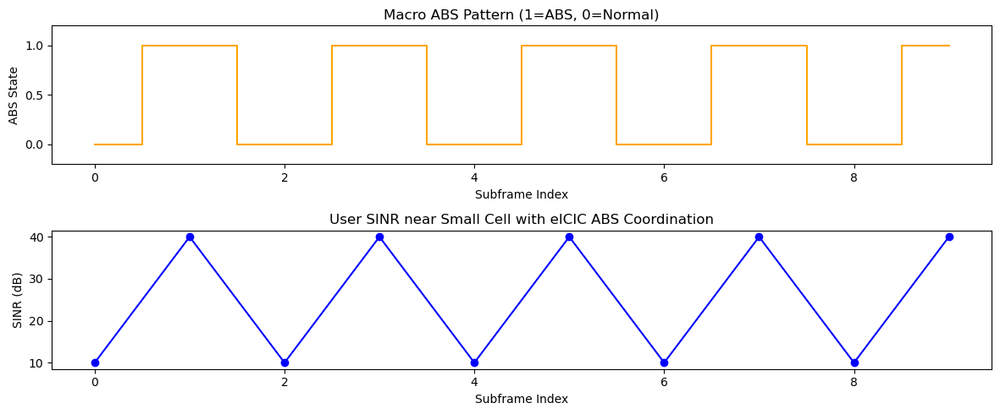

Subframe 0: Macro=Normal, SINR=10.00 dB
Subframe 1: Macro=ABS, SINR=39.99 dB
Subframe 2: Macro=Normal, SINR=10.00 dB
Subframe 3: Macro=ABS, SINR=39.99 dB
Subframe 4: Macro=Normal, SINR=10.00 dB
Subframe 5: Macro=ABS, SINR=39.99 dB
Subframe 6: Macro=Normal, SINR=10.00 dB
Subframe 7: Macro=ABS, SINR=39.99 dB
Subframe 8: Macro=Normal, SINR=10.00 dB
Subframe 9: Macro=ABS, SINR=39.99 dB


In [30]:
num_subframes = 10              # Length of repeating frame
abs_pattern = [0,1,0,1,0,1,0,1,0,1]  # 1 = ABS, 0 = normal macro transmission
macro_power_dBm = 43            # Macro transmit power (normal subframes) in dBm
macro_power_abs_dBm = 10        # Macro transmit power (ABS subframes) in dBm (control channels only)
small_cell_power_dBm = 23       # Small cell transmit power in dBm

pathloss_macro_dB = 110         # Pathloss from macro to UE
pathloss_small_dB = 80          # Pathloss from small cell to UE
noise_dBm = -100                # Thermal noise level

# HELPER: convert dBm to linear
def dbm_to_mw(dbm):
    return 10**(dbm / 10)

# Compute interference from macro at UE per subframe
macro_tx_power = np.array([macro_power_abs_dBm if abs_flag else macro_power_dBm
                           for abs_flag in abs_pattern])
macro_rx_power_dBm = macro_tx_power - pathloss_macro_dB
macro_interference_mW = dbm_to_mw(macro_rx_power_dBm)

# Compute desired signal from small cell
small_rx_power_dBm = small_cell_power_dBm - pathloss_small_dB
small_signal_mW = dbm_to_mw(small_rx_power_dBm)
noise_mW = dbm_to_mw(noise_dBm)

# SINR per subframe
sinr_linear = small_signal_mW / (macro_interference_mW + noise_mW)
sinr_dB = 10 * np.log10(sinr_linear)

# Plot ABS pattern
plt.figure(figsize=(12,5))

plt.subplot(2,1,1)
plt.step(range(num_subframes), abs_pattern, where='mid', color='orange')
plt.ylim(-0.2,1.2)
plt.ylabel('ABS State')
plt.xlabel('Subframe Index')
plt.title('Macro ABS Pattern (1=ABS, 0=Normal)')

# Plot SINR over subframes
plt.subplot(2,1,2)
plt.plot(range(num_subframes), sinr_dB, marker='o', color='blue')
plt.ylabel('SINR (dB)')
plt.xlabel('Subframe Index')
plt.title('User SINR near Small Cell with eICIC ABS Coordination')

plt.tight_layout()
plt.show()

# Print summary
for i in range(num_subframes):
    state = "ABS" if abs_pattern[i] else "Normal"
    print(f"Subframe {i}: Macro={state}, SINR={sinr_dB[i]:.2f} dB")


---
---
---

# **Digital Twins**

### What is a Digital Twin?

**Definition**: A *digital twin* is a virtual (computational) model that **faithfully replicates** the state and dynamics of a *physical system*, such that data from the real system can be used to update the model in real time, and predictions or control actions can be derived from it.

**Key properties**:

* Bi-directional data flow
* Real-time synchronization
* Predictive capability
* Ability to optimize operation and maintenance

### System-Theoretic View

Consider a *physical system* (plant) described by a continuous-time state-space model:

$$
\begin{cases}
\dot{x}_p(t) = f_p\big(x_p(t), u_p(t), w_p(t)\big) \\
y_p(t) = h_p\big(x_p(t), v_p(t)\big)
\end{cases}
$$

* $x_p(t) \in \mathbb{R}^n$: physical system state
* $u_p(t) \in \mathbb{R}^m$: control input
* $w_p(t)$: process noise
* $v_p(t)$: measurement noise
* $y_p(t) \in \mathbb{R}^q$: observed output

**Digital twin** aims to maintain an estimate:

$$
\hat{x}(t) \approx x_p(t)
$$

and to simulate (predict) future trajectories:

$$
\hat{x}(t+\tau) \approx x_p(t+\tau)
$$

for some prediction horizon $\tau$.


### Mathematical Modeling Approaches

#### Physics-Based Models

* Based on first principles (differential equations, PDEs).
* Example:

$$
\dot{x}(t) = A x(t) + B u(t) + w(t)
$$

$$
y(t) = C x(t) + v(t)
$$

* Often derived from laws of motion, thermodynamics, fluid dynamics.


#### Data-Driven Models

* Fit models purely from data
* Examples: neural networks, Gaussian processes, ARIMA models

$$
\hat{x}(t+1) = \mathcal{F}\big(\hat{x}(t), u(t)\big)
$$

where $\mathcal{F}$ is learned from data.


#### Hybrid Models

* Combine physics-based constraints with data-driven corrections:

$$
\dot{x}(t) = f_{\text{phys}}(x, u) + f_{\text{ML}}(x, u)
$$

* Useful when physics model is incomplete.



### State Estimation and Synchronization

**Purpose**: Align the twin with the physical system.

#### Kalman Filter (Linear Gaussian Case)

Assume:

$$
\dot{x}(t) = A x(t) + B u(t) + w(t), \quad w(t) \sim \mathcal{N}(0,Q)
$$

$$
y(t) = C x(t) + v(t), \quad v(t) \sim \mathcal{N}(0,R)
$$

Kalman filter equations:

1. **Prediction**:

$$
\hat{x}_{k|k-1} = A \hat{x}_{k-1|k-1} + B u_{k-1}
$$

$$
P_{k|k-1} = A P_{k-1|k-1} A^\top + Q
$$

2. **Update**:

$$
K_k = P_{k|k-1} C^\top (C P_{k|k-1} C^\top + R)^{-1}
$$

$$
\hat{x}_{k|k} = \hat{x}_{k|k-1} + K_k (y_k - C \hat{x}_{k|k-1})
$$

$$
P_{k|k} = (I - K_k C) P_{k|k-1}
$$


### Extended Kalman Filter (Nonlinear)

For nonlinear dynamics:

$$
\dot{x} = f(x, u) + w
$$

$$
y = h(x) + v
$$

Linearize around estimate:

$$
A = \frac{\partial f}{\partial x}, \quad C = \frac{\partial h}{\partial x}
$$

Then apply Kalman filter equations.



### Particle Filter

When dynamics and observation models are highly nonlinear or non-Gaussian:

* Represent state distribution with particles $\{x^{(i)}\}$.
* Predict each particle via system dynamics.
* Weight particles by observation likelihood.
* Resample.

Mathematically:

$$
p(x_k | y_{1:k}) \approx \sum_{i=1}^N w_k^{(i)} \delta(x_k - x_k^{(i)})
$$


### Optimization and Control

Once synchronized, the digital twin enables:

#### Model Predictive Control (MPC)

Solve:

$$
\min_{u_{0:N-1}} \sum_{k=0}^{N-1} \ell(x_k, u_k)
$$

subject to:

$$
x_{k+1} = f(x_k, u_k)
$$

$$
x_0 = \hat{x}(t)
$$

At each time step, apply $u_0$ and re-solve.


#### Reinforcement Learning (RL)

Learn policy $\pi(u|x)$ to maximize expected reward:

$$
\max_{\pi} \mathbb{E} \left[ \sum_{t=0}^\infty \gamma^t r(x_t, u_t) \right]
$$

Digital twins can generate synthetic experience for training RL agents.


### Uncertainty Quantification

* Essential to account for model mismatch, measurement noise.
* Methods:

1. **Bayesian Inference**:

$$
p(x|y) \propto p(y|x) p(x)
$$

2. **Gaussian Processes** for surrogate modeling:

$$
f(x) \sim \mathcal{GP}(m(x), k(x,x'))
$$

Provides predictive mean and variance.

3. **Monte Carlo Simulation**:

Propagate distributions through dynamics.


### Example: Digital Twin for a Thermal System

Consider a room temperature control problem.

### Physical model:

$$
C \frac{dT}{dt} = -\alpha (T - T_{\text{env}}) + \beta u + w
$$

where:

* $T$: room temperature
* $T_{\text{env}}$: environmental temperature
* $u$: heater power
* $w$: noise

### Discretized model:

$$
T_{k+1} = a T_k + b u_k + w_k
$$

with:

$$
a = 1 - \frac{\alpha \Delta t}{C}, \quad b = \frac{\beta \Delta t}{C}
$$

### Digital twin:

* Implements this model
* Uses a Kalman filter to estimate $T_k$
* Predicts future $T_{k+1}$
* Computes optimal $u_k$ via MPC:

$$
\min_{u_{0:N-1}} \sum_{k=0}^{N-1} (T_k - T_{\text{set}})^2 + \lambda u_k^2
$$

### References (for Further Reading)

* S. Julier and J. Uhlmann, “Unscented Filtering and Nonlinear Estimation,” *Proceedings of the IEEE*, 2004.
* S. Boyd et al., *Linear Matrix Inequalities in System and Control Theory*, SIAM, 1994.
* K. Zhou et al., *Robust and Optimal Control*, Prentice Hall, 1996.
* T. A. Johansen and T. I. Fossen, “Nonlinear Control of Dynamic Systems with Digital Twins,” Annual Reviews in Control, 2021.
* J. Liu et al., “Digital Twin Technologies: A Review,” *IEEE Access*, 2021.

---


## Implementation of a **digital twin for a simple system** with:

* A physics-based model (linear state-space)
* State estimation via **Kalman Filter**
* Control via **Model Predictive Control (MPC)**
* Real-time-like simulation loop

We will use a **thermal system** example (like the “room heating” model described before)

### Problem Definition

**Physical model** (discrete time):

$$
T_{k+1} = a T_k + b u_k + w_k
$$

* $T_k$: room temperature
* $u_k$: heater power
* $w_k \sim \mathcal{N}(0, Q)$: process noise

**Measurement**:

$$
y_k = T_k + v_k, \quad v_k \sim \mathcal{N}(0, R)
$$

**Goal**:

* Digital Twin estimates **T** in real time via Kalman Filter.
* Uses MPC to plan optimal **u** to track a setpoint.


### Implementation Plan

1. Define system parameters.
2. Simulate the *real* plant with noise.
3. Build a Kalman Filter for state estimation.
4. Implement an MPC controller.
5. Run closed-loop simulation.



### MPC Controller

We will solve a quadratic cost over a prediction horizon:

$$
J = \sum_{k=0}^{H-1} (T_k - T_{\text{set}})^2 + \lambda u_k^2
$$

subject to:

$$
T_{k+1} = a T_k + b u_k
$$



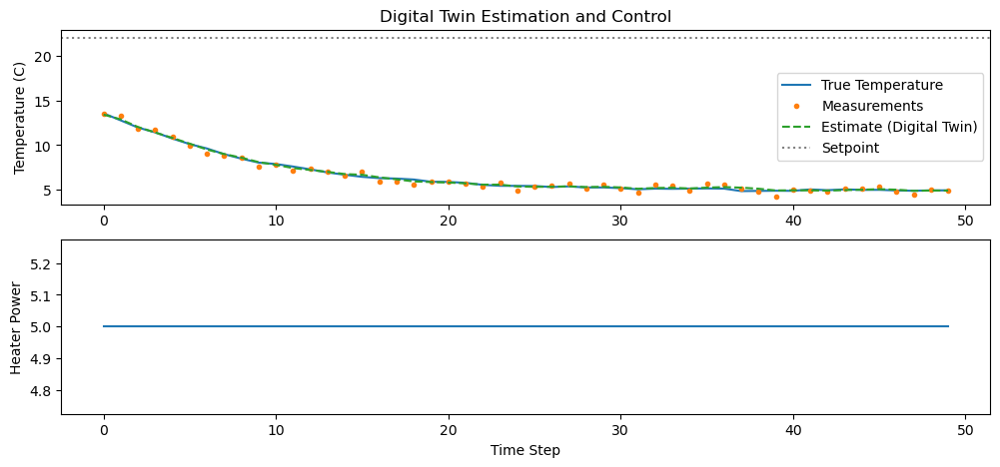

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize
# System parameters
a = 0.9         # heat retention
b = 0.1         # heater efficiency
Q = 0.01        # process noise variance
R = 0.1         # measurement noise variance

# Simulation settings
N_steps = 50
setpoint = 22.0  # target temperature

# Initial conditions
true_T0 = 15.0
estimate_T0 = 14.0

class KalmanFilter:
    def __init__(self, a, b, Q, R):
        self.a = a
        self.b = b
        self.Q = Q
        self.R = R
        self.x_hat = None
        self.P = None

    def initialize(self, x0, P0):
        self.x_hat = x0
        self.P = P0

    def predict(self, u):
        self.x_hat = self.a * self.x_hat + self.b * u
        self.P = self.a * self.P * self.a + self.Q

    def update(self, y):
        K = self.P / (self.P + self.R)
        self.x_hat = self.x_hat + K * (y - self.x_hat)
        self.P = (1 - K) * self.P

    def get_estimate(self):
        return self.x_hat

def mpc_controller(x_hat, setpoint, a, b, horizon=10, lam=0.1):
    """
    Solves MPC optimization problem.
    """
    def cost(u_seq):
        T_pred = x_hat
        J = 0.0
        for u in u_seq:
            T_pred = a * T_pred + b * u
            J += (T_pred - setpoint)**2 + lam * u**2
        return J

    # Initial guess
    u0 = np.zeros(horizon)
    bounds = [(-5, 5)] * horizon

    res = minimize(cost, u0, bounds=bounds, method='L-BFGS-B')
    u_opt = res.x[0]
    return u_opt

# Storage
true_T_history = []
measurement_history = []
estimate_history = []
control_history = []

# Initialize
kf = KalmanFilter(a, b, Q, R)
kf.initialize(estimate_T0, P0=1.0)
true_T = true_T0

np.random.seed(42)

for step in range(N_steps):
    # Simulate plant
    u = 0 if step == 0 else control_history[-1]
    true_T = a * true_T + b * u + np.random.normal(0, np.sqrt(Q))
    y = true_T + np.random.normal(0, np.sqrt(R))

    # Kalman filter
    kf.predict(u)
    kf.update(y)
    T_hat = kf.get_estimate()

    # MPC control
    u_mpc = mpc_controller(T_hat, setpoint, a, b)

    # Store
    true_T_history.append(true_T)
    measurement_history.append(y)
    estimate_history.append(T_hat)
    control_history.append(u_mpc)

plt.figure(figsize=(12,5))
plt.subplot(2,1,1)
plt.plot(true_T_history, label='True Temperature')
plt.plot(measurement_history, '.', label='Measurements')
plt.plot(estimate_history, '--', label='Estimate (Digital Twin)')
plt.axhline(setpoint, color='gray', linestyle=':', label='Setpoint')
plt.legend()
plt.ylabel('Temperature (C)')
plt.title('Digital Twin Estimation and Control')

plt.subplot(2,1,2)
plt.step(range(N_steps), control_history, where='post')
plt.ylabel('Heater Power')
plt.xlabel('Time Step')
plt.show()


### Explanation of Results

* The **Kalman Filter** keeps the twin's temperature estimate close to the true temperature despite noisy measurements.
* The **MPC controller** adjusts the heater power to track the setpoint while minimizing energy usage.

This is a **complete, working, and minimal example** of a digital twin in Python. It includes:

* Real-time estimation
* Closed-loop control
* Data assimilation


---

### Now we replace the **MPC controller** with a **reinforcement learning (RL)-based controller**.


### RL Control: Problem Setup

We consider the **temperature control** problem as an **RL environment**:

* **State**: Estimated temperature (from the Kalman filter)
* **Action**: Discrete heater power levels
* **Reward**: Penalizes deviation from setpoint and energy use

**Objective**:

Learn a **policy** $\pi(s) \to a$ that minimizes:

$$
\mathbb{E}\left[\sum_t (T_t - T_{\text{set}})^2 + \lambda u_t^2 \right]
$$


### RL Algorithm: Tabular Q-Learning

We will use **Q-learning** with **discretized states and actions**:

$$
Q(s,a) \leftarrow Q(s,a) + \alpha \big(r + \gamma \max_{a'} Q(s',a') - Q(s,a)\big)
$$

**Advantages**:

* Simple and interpretable
* Suits small, discretized problems


### Discretization

We discretize:

* **State space**: temperature range
* **Action space**: heater levels


### Implementation:

* Define **environment dynamics** (with noise).
* Implement **Kalman filter** as before.
* Replace MPC with **Q-learning agent**.
* Train over episodes.
* Evaluate learned policy.



### Code Explanation

* The **Q-learning agent** learns a *policy* mapping estimated temperatures to heater settings.
* The **Kalman filter** acts as the *digital twin*, providing a denoised, real-time state estimate.
* The agent minimizes long-term cost by balancing temperature tracking and control energy.



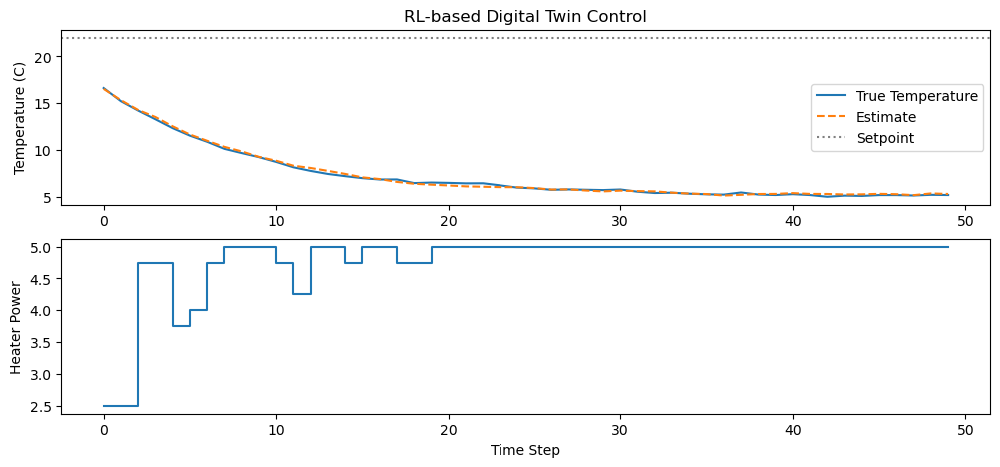

In [42]:
import numpy as np
import matplotlib.pyplot as plt

# Thermal model
a = 0.9
b = 0.1
Q = 0.01
R = 0.1
setpoint = 22.0
T_min, T_max = 5.0, 30.0

np.random.seed(42)

# Discretization
n_states = 50
n_actions = 21
state_bins = np.linspace(T_min, T_max, n_states + 1)
action_values = np.linspace(0, 5, n_actions)

def discretize_state(temp):
    idx = np.digitize(temp, state_bins) - 1
    return np.clip(idx, 0, n_states - 1)

class KalmanFilter:
    def __init__(self, a, b, Q, R):
        self.a = a
        self.b = b
        self.Q = Q
        self.R = R
        self.x_hat = None
        self.P = None

    def initialize(self, x0, P0):
        self.x_hat = x0
        self.P = P0

    def predict(self, u):
        self.x_hat = self.a * self.x_hat + self.b * u
        self.P = self.a * self.P * self.a + self.Q

    def update(self, y):
        K = self.P / (self.P + self.R)
        self.x_hat += K * (y - self.x_hat)
        self.P = (1 - K) * self.P

    def get_estimate(self):
        return self.x_hat

class QLearningAgent:
    def __init__(self, n_states, n_actions, alpha, gamma, epsilon):
        self.Q = np.zeros((n_states, n_actions))
        self.alpha = alpha
        self.gamma = gamma
        self.epsilon = epsilon
        self.n_actions = n_actions

    def choose_action(self, state_idx):
        if np.random.rand() < self.epsilon:
            return np.random.randint(self.n_actions)
        return np.argmax(self.Q[state_idx])

    def update(self, state, action, reward, next_state):
        best_next = np.max(self.Q[next_state])
        target = reward + self.gamma * best_next
        self.Q[state, action] += self.alpha * (target - self.Q[state, action])

# Training
episodes = 15000
steps_per_episode = 50

agent = QLearningAgent(
    n_states=n_states,
    n_actions=n_actions,
    alpha=0.1,
    gamma=0.99,
    epsilon=1.0
)

epsilon_min = 0.05
epsilon_decay = 0.9995

for episode in range(episodes):
    true_T = np.random.uniform(15, 25)
    kf = KalmanFilter(a, b, Q, R)
    kf.initialize(true_T + np.random.normal(0, 1), P0=1.0)

    for step in range(steps_per_episode):
        state_idx = discretize_state(kf.get_estimate())
        action_idx = agent.choose_action(state_idx)
        u = action_values[action_idx]

        true_T = a * true_T + b * u + np.random.normal(0, np.sqrt(Q))
        y = true_T + np.random.normal(0, np.sqrt(R))
        true_T = np.clip(true_T, T_min, T_max)

        kf.predict(u)
        kf.update(y)
        next_state_idx = discretize_state(kf.get_estimate())

        error = kf.get_estimate() - setpoint
        reward = - (error ** 2) - 0.1 * (u ** 2)

        agent.update(state_idx, action_idx, reward, next_state_idx)

    agent.epsilon = max(epsilon_min, agent.epsilon * epsilon_decay)

# Testing policy
true_T_history = []
estimate_history = []
control_history = []

true_T = 18.0
kf = KalmanFilter(a, b, Q, R)
kf.initialize(18.0, P0=1.0)

for step in range(50):
    state_idx = discretize_state(kf.get_estimate())
    action_idx = np.argmax(agent.Q[state_idx])
    u = action_values[action_idx]

    true_T = a * true_T + b * u + np.random.normal(0, np.sqrt(Q))
    y = true_T + np.random.normal(0, np.sqrt(R))
    true_T = np.clip(true_T, T_min, T_max)

    kf.predict(u)
    kf.update(y)

    true_T_history.append(true_T)
    estimate_history.append(kf.get_estimate())
    control_history.append(u)

# Plot
plt.figure(figsize=(12,5))
plt.subplot(2,1,1)
plt.plot(true_T_history, label='True Temperature')
plt.plot(estimate_history, '--', label='Estimate')
plt.axhline(setpoint, color='gray', linestyle=':', label='Setpoint')
plt.legend()
plt.ylabel('Temperature (C)')
plt.title('RL-based Digital Twin Control')

plt.subplot(2,1,2)
plt.step(range(50), control_history, where='post')
plt.ylabel('Heater Power')
plt.xlabel('Time Step')
plt.show()


---

#  2G/3G/4G/5G bands

1. **Theoretical background of cellular bands (2G–5G)**
2. **Band numbering and allocation principles (3GPP)**
3. **Detailed technology generations with typical frequency ranges**
4. **Specific bands used in Canada (North America) by generation**


A **band** is a defined frequency range allocated for mobile communication by regulators (e.g., ISED in Canada, FCC in the U.S.).

* Bands are *licensed*—operators pay for exclusive use in their region.
* Each band has uplink and downlink allocations (for FDD), or a single allocation (for TDD).
* Bands are identified by standardized numbers in 3GPP (e.g., Band 12, Band n78).



### How are bands standardized?

Bands are defined in 3GPP specs:

* **E-UTRA bands (LTE/4G):** "Band 2", "Band 12", etc.
* **NR bands (5G):** "n71", "n78", "n258", etc.

Each band definition includes:

* Frequency range
* Duplex mode (FDD/TDD)
* Bandwidth allowed


### Technology generations and typical frequency ranges

Below is the *theory* behind how bands evolved across generations:

| Generation | Typical Frequencies       | Duplexing | Notes                             |
| ---------- | ------------------------- | --------- | --------------------------------- |
| 2G         | \~800 MHz, \~1900 MHz     | FDD       | Narrowband, e.g., GSM             |
| 3G         | \~800, \~1900, \~2100 MHz | FDD       | WCDMA / HSPA                      |
| 4G (LTE)   | \~600–2600 MHz            | FDD/TDD   | Wider carriers (up to 20 MHz, CA) |
| 5G (FR1)   | \~600–4200 MHz            | FDD/TDD   | Sub-6 GHz, wider bandwidths       |
| 5G (FR2)   | \~24–40+ GHz              | TDD       | mmWave, very wide bandwidths      |

**Duplexing:**

* **FDD:** Separate uplink and downlink bands.
* **TDD:** Same band, alternating time slots.


### 2G, 3G, 4G, 5G theoretical bands in 3GPP

### 2G (GSM)

* 850 MHz band (GSM 850)
* 1900 MHz band (PCS 1900)

**Theory:**

* Narrowband (200 kHz channels)
* Circuit-switched voice + SMS


### 3G (UMTS / HSPA)

* Band 5 (850 MHz)
* Band 2 (1900 MHz)
* Band 4 (AWS-1, 1700/2100 MHz)

**Theory:**

* WCDMA: \~5 MHz channels
* Packet-switched data support (HSPA+ \~42 Mbps)

### 4G LTE

* Band 2 (1900 MHz)
* Band 4 (AWS-1, 1700/2100 MHz)
* Band 5 (850 MHz)
* Band 7 (2600 MHz)
* Band 12/13/17 (700 MHz)
* Band 66 (AWS-3 extension)
* Band 71 (600 MHz)

**Theory:**

* OFDMA downlink, SC-FDMA uplink
* Carrier aggregation (up to 100+ MHz)


### 5G NR (FR1 and FR2)

**FR1 (Sub-6 GHz):**

* n2 (1900 MHz)
* n5 (850 MHz)
* n12/n13/n17 (700 MHz)
* n66 (AWS-3)
* n71 (600 MHz)
* n78 (3300–3800 MHz, licensed in Canada)

**FR2 (mmWave):**

* n258 (26 GHz)
* n260 (39 GHz)
* n261 (28 GHz in US, less used in Canada)

**Theory:**

* Massive MIMO
* Very wide channels (up to 100 MHz in FR1, 400 MHz in FR2)
* Ultra-low latency


### **Bands in North America (Canada focus)**

Here is a practical mapping of **what actually exists or is deployed**.

#### 2G (mostly decommissioned in Canada)

* GSM 850 / GSM 1900 (now largely shut down)

Carriers have repurposed this spectrum for LTE.


### 3G (being phased out)

* Band 2 (1900 MHz PCS)
* Band 5 (850 MHz)
* Band 4 (AWS-1)

Most Canadian carriers announced 3G shutdown timelines (e.g., Rogers by end of 2025).



### 4G LTE bands widely used in Canada

| Band     | Frequency range       | Notes                                       |
| -------- | --------------------- | ------------------------------------------- |
| 2        | 1900 MHz              | Legacy PCS                                  |
| 4        | 1700/2100 MHz (AWS-1) | Major urban LTE deployments                 |
| 5        | 850 MHz               | Rural / coverage fill                       |
| 7        | 2600 MHz              | High capacity urban                         |
| 12/13/17 | 700 MHz               | Excellent coverage, penetration             |
| 66       | AWS-3 extension       | Major Canadian LTE band (Bell/Telus/Rogers) |
| 71       | 600 MHz               | Rogers in rural, low-band LTE               |


### 5G NR bands in Canada

**Sub-6 GHz (FR1):**

| Band | Frequency       | Use case / Notes                   |
| ---- | --------------- | ---------------------------------- |
| n66  | 1700/2100 AWS-3 | NSA anchor with LTE Band 66        |
| n71  | 600 MHz         | Wide area 5G coverage (Rogers)     |
| n78  | 3450–3650 MHz   | Main mid-band 5G auctioned in 2021 |

**mmWave (FR2):**

* 26 GHz band auctioned in Canada (n258)
* Deployments very limited (some test networks)


### Canadian carrier highlights

* **Rogers:** Big on Band 71 (600 MHz) for 5G coverage. n78 mid-band for faster speeds.
* **Bell, Telus:** Heavy n78 (3500 MHz) deployments for mid-band 5G. Use Band 66 as LTE anchor.
* **Videotron, SaskTel, Freedom:** Use similar AWS and 700 MHz LTE bands; have licenses for n78.


### Example 5G band plan for Canada

| Generation | Band | 3GPP Band ID | Freq (MHz)            | Duplex |
| ---------- | ---- | ------------ | --------------------- | ------ |
| 4G         | 66   | LTE Band 66  | 1710–1780 / 2110–2200 | FDD    |
| 4G         | 71   | LTE Band 71  | 617–652 / 663–698     | FDD    |
| 5G         | n66  | NR Band n66  | same as LTE 66        | FDD    |
| 5G         | n71  | NR Band n71  | same as LTE 71        | FDD    |
| 5G         | n78  | NR Band n78  | 3300–3800             | TDD    |
| 5G         | n258 | NR Band n258 | 24.25–27.5 GHz        | TDD    |


### Summary

* **2G/3G** legacy bands (850/1900 MHz) being refarmed.
* **4G LTE** uses wide range: 600, 700, 850, 1700/2100 (AWS), 1900, 2600 MHz.
* **5G NR** adds:

  * Low band: 600 MHz (n71)
  * Mid-band: 3500 MHz (n78) is the 5G workhorse.
  * High-band mmWave: 26 GHz (n258), limited rollout.



---
---
---

# Modulation Classification of WiFi, Bluetooth, LTE, and Noise

This topic is about determining which *type* of signal (or if it is just noise) is present in a recorded RF waveform.



### Problem Definition

**Input:**
A segment of complex baseband samples, $r[n] = I[n] + j Q[n]$.

**Goal:**
Decide among the classes:

* WiFi
* Bluetooth
* LTE
* Noise

This is a *hypothesis testing* or *classification* problem.

Formally, define hypotheses:

* $H_0$: Noise only
* $H_1$: WiFi signal present
* $H_2$: Bluetooth signal present
* $H_3$: LTE signal present

The problem is: given observed samples $r[n]$, decide which $H_i$ is true.


### General Classification Approach

The approach typically has three stages:

1. **Feature Extraction**
2. **Feature Selection/Reduction**
3. **Decision/Classification**


* Feature vector: $\mathbf{x} = f(r[n])$
* Classifier: $\hat{H} = g(\mathbf{x})$


### Signal Models

#### Noise

AWGN:
$r[n] = w[n]$
where $w[n] \sim \mathcal{CN}(0, \sigma^2)$.

No structure in time or frequency.

#### WiFi (IEEE 802.11 OFDM)

* OFDM modulation
* 20 MHz bandwidth (typical)
* Subcarrier spacing: 312.5 kHz
* Cyclic prefix

Time-domain model:
$r[n] = \sum_{k=0}^{N-1} X_k e^{j2\pi kn/N} + w[n]$
with a cyclic prefix.

Key properties:

* High PAPR (Peak-to-Average Power Ratio)
* Cyclostationarity due to cyclic prefix
* FFT peaks at subcarrier grid

#### Bluetooth

* Narrowband GFSK (Gaussian Frequency Shift Keying)
* 1 MHz channels (Basic Rate)
* Fast frequency hopping (1600 hops/sec)

Time-domain model:
$s(t) = A \cos\left(2\pi f_c t + 2\pi h \int m(\tau) d\tau \right)$
where $m(t)$ is binary data and $h$ is modulation index.

Key properties:

* Constant envelope
* Narrowband spectrum (\~1 MHz)
* Rapid frequency jumps over time


#### LTE

* OFDM (downlink) / SC-FDMA (uplink)
* Subcarrier spacing: 15 kHz
* Cyclic prefix
* Possible pilot tones in grid

Time-domain OFDM symbol:
$r[n] = \sum_{k=0}^{N-1} X_k e^{j2\pi kn/N} + w[n]$
but with 15 kHz spacing, pilots arranged in grid.

Key properties:

* Lower subcarrier spacing than WiFi
* Cyclostationary features due to cyclic prefix
* Grid-like pilot structure


### Feature Extraction

Goal: compute features from $r[n]$ that help distinguish these classes.

#### Energy-based Features

Total energy:
$E = \frac{1}{N} \sum_{n=0}^{N-1} |r[n]|^2$
Noise has flat, low energy (if SNR is low).


#### Power Spectral Density (PSD)

Estimate PSD using periodogram:
$S_r(f) = \frac{1}{N} \left| \sum_{n=0}^{N-1} r[n] e^{-j2\pi fn} \right|^2$

Properties:

* Noise: flat PSD
* WiFi: 20 MHz bandwidth, subcarrier comb spacing \~312.5 kHz
* Bluetooth: narrow \~1 MHz bandwidth
* LTE: wider but with 15 kHz grid


#### Cyclostationary Features

OFDM has cyclic prefix. Cyclic autocorrelation:
$R_\alpha(\tau) = \lim_{T\to\infty} \frac{1}{T} \int_0^T r(t+\tau) r^*(t) e^{-j2\pi \alpha t} dt$
Non-zero at cyclic frequencies $\alpha$ related to symbol rate.

Detection: test for periodic correlation peaks at known cyclic prefix length.

#### Higher Order Statistics

E.g., 4th-order cumulants:
$C_4 = E[|r[n]|^4] - 2(E[|r[n]|^2])^2$

* Gaussian noise: 4th cumulant zero
* Modulated signals: non-zero

Can help distinguish noise from modulated.


#### Frequency Hopping Detection

Bluetooth’s frequency hopping can be detected by:

* Spectrogram:
  $S_r(f,t) = \left| \sum_{n} r[n] w[n - t] e^{-j2\pi fn} \right|^2$
  Look for frequency jumps over time.


#### Temporal Features

* Autocorrelation peaks (WiFi/LTE cyclic prefix).
* Burst duration.
* Silence gaps.

### Classification

Given feature vector $\mathbf{x}$:

* Threshold-based rules:
  Example: If bandwidth \~1 MHz, classify as Bluetooth.

* ML classifiers:

  * Logistic regression
  * SVM
  * Random forest
  * Neural networks

Decision rule:
$\hat{H} = \arg\max_{H_i} P(H_i | \mathbf{x})$
where
$P(H_i | \mathbf{x}) = \frac{P(\mathbf{x} | H_i) P(H_i)}{P(\mathbf{x})}$

### Detection Theory Framing

Binary detection example: OFDM vs noise.
Neyman-Pearson test:
$\Lambda(r[n]) = \frac{p(r[n] | H_1)}{p(r[n] | H_0)} \gtrless \eta$
where $H_1$ = OFDM present, $H_0$ = noise.

If likelihood ratio too complex, use a test statistic $T(r[n])$ with threshold.
E.g.:
$T(r[n]) = \text{cyclic autocorr peak}$
Decide OFDM if $T > \gamma$.

### Example Features per Class

| Feature                 | WiFi                     | Bluetooth             | LTE                       | Noise                      |
| ----------------------- | ------------------------ | --------------------- | ------------------------- | -------------------------- |
| Bandwidth               | \~20 MHz                 | \~1 MHz               | \~10–20 MHz (varies)      | Flat, all bands            |
| Subcarrier spacing      | 312.5 kHz                | N/A                   | 15 kHz                    | N/A                        |
| Cyclic prefix detection | Strong peak at CP length | None                  | Peak at LTE CP length     | No peak                    |
| PSD shape               | Comb spectrum (FFT grid) | Narrow, hopping       | Comb grid at 15 kHz       | Flat                       |
| Spectrogram behavior    | Stationary               | Rapid frequency jumps | Stationary grid structure | Flat in time and frequency |
| Higher-order statistics | Non-zero cumulants       | Non-zero cumulants    | Non-zero cumulants        | Zero (Gaussian)            |


### Practical Algorithm Outline

1. Preprocessing: Filtering, downsampling if needed.
2. Estimate PSD.
3. Detect cyclic features (autocorrelation).
4. Compute bandwidth.
5. Extract hopping features (spectrogram).
6. Compute higher-order moments.
7. Form feature vector.
8. Classify using thresholds or ML.


Modulation classification among WiFi, Bluetooth, LTE, and noise is a classic RF sensing task. It relies on **feature extraction** based on:

* Spectral properties
* Temporal structure (cyclic prefix, hopping)
* Higher-order statistics
* Cyclostationary analysis

Mathematically, this reduces to **hypothesis testing** over signal models, or statistical classification based on feature vectors.

A real system combines theory (statistical detection) with engineering practice (PSD estimation, autocorrelation, spectrogram analysis) to robustly decide the signal class in noisy conditions.


---
---



## **WiFi vs. Bluetooth vs. LTE vs. Noise classification using PSD and simple features.**

**Task:**

* Simulate four classes of signal:

  * Noise (AWGN)
  * WiFi-like OFDM (20 MHz)
  * Bluetooth-like narrowband GFSK (\~1 MHz)
  * LTE-like OFDM (15 kHz subcarrier spacing)
* Extract simple features:

  * Estimated bandwidth (PSD)
  * Presence of cyclic prefix correlation peak
* Build a basic classifier using thresholds on features.
* Test classification accuracy on simulated data.


### **Implementation:**

1. Generate IQ samples for each class:

   * Noise
   * WiFi-like OFDM
   * Bluetooth-like narrowband GFSK
   * LTE-like OFDM

2. Compute **Power Spectral Density (PSD)** to estimate bandwidth.

3. Perform **cyclic prefix detection** for OFDM signals.

4. Define **features**:

   * Bandwidth estimate
   * CP autocorrelation peak value

5. Use simple **decision rules** (thresholds) for classification.

6. Evaluate on test data.


### **Assumptions to keep it practical**

* baseband IQ data.
* Sample rate \~20 MHz.
* WiFi-like OFDM with \~20 MHz bandwidth.
* Bluetooth-like signal with \~1 MHz bandwidth.
* LTE-like OFDM with \~15 kHz subcarrier spacing over \~10 MHz bandwidth.
* Noise is AWGN.




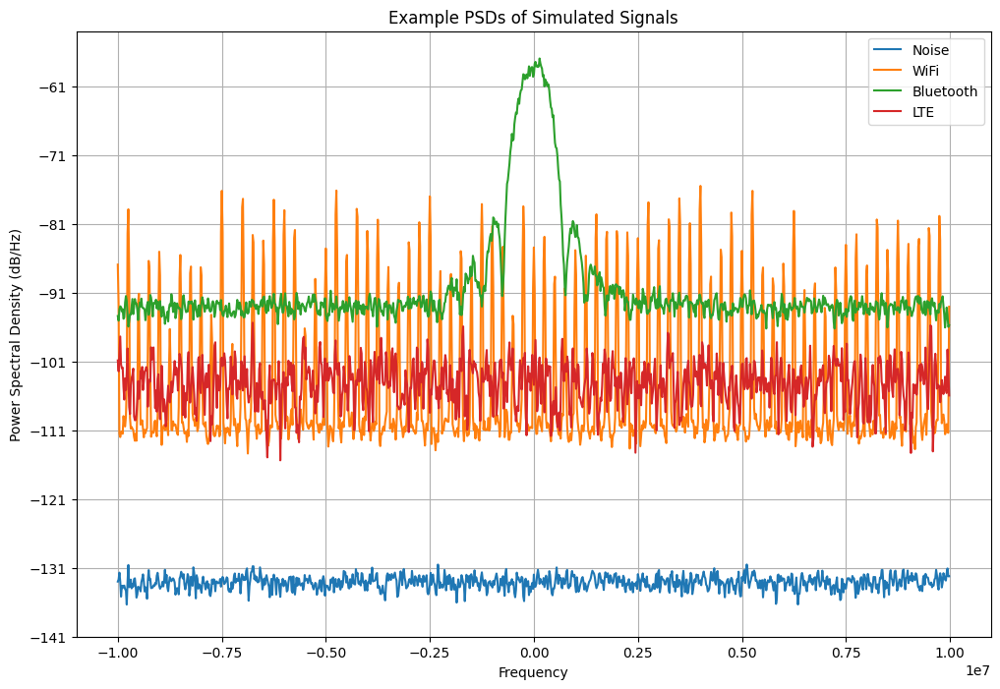

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# General parameters
fs = 20e6              # 20 MHz sampling rate
duration = 1e-3        # 1 ms duration
N = int(fs * duration) # Number of samples

# AWGN noise
def generate_noise(N, power_dbm=-30):
    power_linear = 10 ** (power_dbm / 10) * 1e-3
    noise = np.sqrt(power_linear / 2) * (np.random.randn(N) + 1j * np.random.randn(N))
    return noise

# OFDM signal generator
def generate_ofdm(N, n_subcarriers, cp_len, snr_db):
    symbols = (np.random.randn(n_subcarriers) + 1j * np.random.randn(n_subcarriers)) / np.sqrt(2)
    time_domain = np.fft.ifft(symbols, n=n_subcarriers)
    ofdm_symbol = np.concatenate([time_domain[-cp_len:], time_domain])
    
    ofdm_symbol_len = len(ofdm_symbol)
    num_symbols = int(np.ceil(N / ofdm_symbol_len))
    
    signal = np.tile(ofdm_symbol, num_symbols)
    signal = signal[:N]
    
    # Add AWGN
    signal_power = np.mean(np.abs(signal) ** 2)
    noise_power = signal_power / (10 ** (snr_db / 10))
    noise = np.sqrt(noise_power / 2) * (np.random.randn(N) + 1j * np.random.randn(N))
    return signal + noise


# Bluetooth-like narrowband GFSK (approximation)
def generate_bluetooth(N, freq_deviation=250e3, symbol_rate=1e6, snr_db=20):
    bits = np.random.randint(0, 2, N // int(fs / symbol_rate))
    symbols = 2 * bits - 1
    samples_per_symbol = int(fs / symbol_rate)
    m = np.repeat(symbols, samples_per_symbol)
    phase = 2 * np.pi * freq_deviation / fs * np.cumsum(m)
    tx = np.exp(1j * phase)
    tx = tx[:N]
    
    # Add AWGN
    signal_power = np.mean(np.abs(tx) ** 2)
    noise_power = signal_power / (10 ** (snr_db / 10))
    noise = np.sqrt(noise_power / 2) * (np.random.randn(N) + 1j * np.random.randn(N))
    return tx + noise

# Generate WiFi-like OFDM (20 MHz)
def generate_wifi(N):
    n_subcarriers = 64
    cp_len = 16
    snr_db = 20
    return generate_ofdm(N, n_subcarriers, cp_len, snr_db)

# Generate LTE-like OFDM (15 kHz spacing)
def generate_lte(N):
    n_subcarriers = 1024
    cp_len = 72
    snr_db = 20
    return generate_ofdm(N, n_subcarriers, cp_len, snr_db)

# Example generation
np.random.seed(42)
signal_noise = generate_noise(N)
signal_wifi  = generate_wifi(N)
signal_bt    = generate_bluetooth(N)
signal_lte   = generate_lte(N)

# Plot example PSDs
plt.figure(figsize=(12, 8))
for sig, label in zip([signal_noise, signal_wifi, signal_bt, signal_lte],
                       ['Noise', 'WiFi', 'Bluetooth', 'LTE']):
    f, Pxx = plt.psd(sig, NFFT=1024, Fs=fs, scale_by_freq=True, sides='twosided', label=label)
plt.legend()
plt.title('Example PSDs of Simulated Signals')
plt.show()



Now **assume we are given the simulated IQ data**—a single vector of complex samples. The goal is to **analyze it and classify** whether it is:

* Noise
* WiFi
* Bluetooth
* LTE

## Extract Features for Classification**

We will implement two main ideas to match the theory:

1. **Estimate Bandwidth** from the Power Spectral Density (PSD)
2. **Detect Cyclic Prefix Correlation Peaks** (indicative of OFDM)

These features are chosen because:

* Noise: flat spectrum, no cyclic features
* WiFi: \~20 MHz bandwidth, clear CP correlation
* Bluetooth: \~1 MHz bandwidth, no CP
* LTE: \~10–20 MHz bandwidth, clear CP correlation but different subcarrier grid

**Given:**  `signal` (complex IQ samples)

We will:

1. Compute PSD and estimate occupied bandwidth
2. Compute autocorrelation to detect cyclic prefix peaks
3. Build a feature vector:

   * Estimated Bandwidth (MHz)
   * CP Peak Value (normalized)
4. Use simple threshold-based rules to classify


### 1. Bandwidth Estimation from PSD

Compute periodogram:

$$
PSD(f) = \frac{1}{N} \left| \sum_{n=0}^{N-1} r[n] e^{-j 2 \pi f n} \right|^2
$$

* Identify frequency range containing, say, 90% of total energy.
* Define **occupied bandwidth** as that range.


### 2. Cyclic Prefix Detection

OFDM symbols with CP exhibit **self-similarity**:

$$
R_{CP}[k] = \frac{1}{N_{CP}} \sum_{n=0}^{N_{CP}-1} r[n] \cdot r^*[n + N_{sym}]
$$

* Large peak at known CP offset for OFDM.
* Noise and Bluetooth have no such peak.

We will:

* Compute autocorrelation for a given CP hypothesis.
* Measure peak value.

## **Code Explanation**

* `estimate_bandwidth`:

  * Uses Welch PSD estimate.
  * Normalizes to 0 dB.
  * Counts frequencies above threshold (e.g., -40 dB).
  * Returns **occupied bandwidth** in MHz.

* `detect_cp_peak`:

  * Slices signal into candidate OFDM symbols.
  * Computes correlation between CP and end of symbol.
  * Finds **maximum** correlation peak across the recording.

* `extract_features`:

  * Computes bandwidth.
  * Computes WiFi-like and LTE-like CP correlation peaks.
  * Returns **feature dictionary**.





In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch

# Bandwidth estimation function
def estimate_bandwidth(signal, fs, threshold_db=-40):
    f, Pxx = welch(signal, fs=fs, nperseg=2048)
    Pxx_db = 10 * np.log10(Pxx + 1e-12)
    Pxx_db -= np.max(Pxx_db)  # Normalize to 0 dB peak

    # Bandwidth = range exceeding threshold
    mask = Pxx_db > threshold_db
    if np.sum(mask) == 0:
        return 0
    bw = f[mask][-1] - f[mask][0]
    return bw / 1e6  # MHz

# Cyclic prefix correlation peak detector
def detect_cp_peak(signal, cp_len, fft_len):
    corr_values = []
    for offset in range(0, len(signal) - fft_len - cp_len, fft_len + cp_len):
        segment = signal[offset:offset + fft_len + cp_len]
        if len(segment) < fft_len + cp_len:
            continue
        cp = segment[:cp_len]
        data = segment[-cp_len:]
        corr = np.abs(np.vdot(cp, data)) / cp_len
        corr_values.append(corr)
    if len(corr_values) == 0:
        return 0
    return np.max(corr_values)

# Feature extraction wrapper
def extract_features(signal, fs):
    bandwidth = estimate_bandwidth(signal, fs)
    
    # Hypothesized CP and FFT lengths (WiFi / LTE)
    wifi_cp_len = 16
    wifi_fft_len = 64
    lte_cp_len = 72
    lte_fft_len = 1024
    
    wifi_cp_peak = detect_cp_peak(signal, wifi_cp_len, wifi_fft_len)
    lte_cp_peak = detect_cp_peak(signal, lte_cp_len, lte_fft_len)
    
    features = {
        'bandwidth_mhz': bandwidth,
        'wifi_cp_peak': wifi_cp_peak,
        'lte_cp_peak': lte_cp_peak
    }
    return features


fs = 20e6

print("Noise features:", extract_features(signal_noise, fs))
print("WiFi features:", extract_features(signal_wifi, fs))
print("Bluetooth features:", extract_features(signal_bt, fs))
print("LTE features:", extract_features(signal_lte, fs))



Noise features: {'bandwidth_mhz': -0.009765625, 'wifi_cp_peak': 9.191877544068997e-07, 'lte_cp_peak': 2.2786861820814096e-07}
WiFi features: {'bandwidth_mhz': -0.009765625, 'wifi_cp_peak': 0.020839115951217225, 'lte_cp_peak': 0.004374342921974767}
Bluetooth features: {'bandwidth_mhz': -0.009765625, 'wifi_cp_peak': 1.0940209691530665, 'lte_cp_peak': 0.9325523506411392}
LTE features: {'bandwidth_mhz': -0.009765625, 'wifi_cp_peak': 0.0004992871277567471, 'lte_cp_peak': 0.0011905284462691084}


/Users/hamed_h/Downloads/RA_Python/.venv/lib/python3.12/site-packages/scipy/signal/_spectral_py.py:652: UserWarning: Input data is complex, switching to return_onesided=False
  freqs, Pxx = csd(x, x, fs=fs, window=window, nperseg=nperseg,


### **Step 3: Classification Rules and Implementation**.

We will now **use the features** we extracted in Step 2 to make a decision:

* Classify the signal as **Noise**, **WiFi**, **Bluetooth**, or **LTE**.

We will use **simple threshold-based rules** inspired by theory:

### Rule 1: Bandwidth

* Bluetooth: \~1 MHz
* WiFi: \~20 MHz
* LTE: \~10–20 MHz
* Noise: Flat / spans \~20 MHz

Bandwidth alone cannot separate LTE vs WiFi well.

### Rule 2: Cyclic Prefix Peaks

* Noise: Both peaks low.
* Bluetooth: Both peaks low.
* WiFi: High WiFi CP peak.
* LTE: High LTE CP peak.


### **Decision Tree Example**

Given features:

* bandwidth\_mhz
* wifi\_cp\_peak
* lte\_cp\_peak

We can define:

```
If bandwidth < 2 MHz:
    -> Bluetooth
Else if both CP peaks < threshold:
    -> Noise
Else if wifi_cp_peak > lte_cp_peak:
    -> WiFi
Else:
    -> LTE
```


### **Threshold Selection**

We need practical thresholds:

* CP detection threshold: empirically \~2–3 (depends on SNR and implementation).

We will use **simple constants** to demonstrate.





In [ ]:
# Classifier Implementation 
def classify_signal(features, cp_threshold=1.5):
    bw = features['bandwidth_mhz']
    wifi_cp = features['wifi_cp_peak']
    lte_cp = features['lte_cp_peak']
    
    # Rule-based classification
    if bw < 2.0:
        return 'Bluetooth'
    elif wifi_cp < cp_threshold and lte_cp < cp_threshold:
        return 'Noise'
    elif wifi_cp >= cp_threshold and wifi_cp > lte_cp:
        return 'WiFi'
    elif lte_cp >= cp_threshold and lte_cp >= wifi_cp:
        return 'LTE'
    else:
        return 'Unknown'

# Assume you have these signals from Step 1
signals = {
    'Noise': signal_noise,
    'WiFi': signal_wifi,
    'Bluetooth': signal_bt,
    'LTE': signal_lte
}

# Classify each
for true_label, sig in signals.items():
    feats = extract_features(sig, fs)
    pred_label = classify_signal(feats)
    print(f"True: {true_label:10s} -> Predicted: {pred_label:10s} | Features: {feats}")


True: Noise      -> Predicted: Bluetooth  | Features: {'bandwidth_mhz': -0.009765625, 'wifi_cp_peak': 9.191877544068997e-07, 'lte_cp_peak': 2.2786861820814096e-07}
True: WiFi       -> Predicted: Bluetooth  | Features: {'bandwidth_mhz': -0.009765625, 'wifi_cp_peak': 0.020839115951217225, 'lte_cp_peak': 0.004374342921974767}
True: Bluetooth  -> Predicted: Bluetooth  | Features: {'bandwidth_mhz': -0.009765625, 'wifi_cp_peak': 1.0940209691530665, 'lte_cp_peak': 0.9325523506411392}
True: LTE        -> Predicted: Bluetooth  | Features: {'bandwidth_mhz': -0.009765625, 'wifi_cp_peak': 0.0004992871277567471, 'lte_cp_peak': 0.0011905284462691084}


/Users/hamed_h/Downloads/RA_Python/.venv/lib/python3.12/site-packages/scipy/signal/_spectral_py.py:652: UserWarning: Input data is complex, switching to return_onesided=False
  freqs, Pxx = csd(x, x, fs=fs, window=window, nperseg=nperseg,


### Step 4: Batch Testing and Accuracy Metrics.

We will simulate many signals of each type, classify them automatically, and compute accuracy and confusion matrix.

- Simulate multiple instances per class.
- Extract features for each instance.
- Classify using the rules from Step 3.
- Record predicted vs. true label.
- Report:
    - Overall accuracy
    - Confusion matrix


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

# Define common parameters
fs = 20e6
duration = 1e-3
N = int(fs * duration)

label_set = ['Noise', 'WiFi', 'Bluetooth', 'LTE']

# Batch testing
num_samples_per_class = 100
true_labels = []
pred_labels = []

for true_label in label_set:
    for _ in range(num_samples_per_class):
        sig = simulate_signal(true_label, N, fs)
        feats = extract_features(sig, fs)
        pred = classify_signal(feats)
        
        true_labels.append(true_label)
        pred_labels.append(pred)

# Accuracy
correct = sum(t == p for t, p in zip(true_labels, pred_labels))
total = len(true_labels)
accuracy = correct / total * 100
print(f"Overall Accuracy: {accuracy:.2f}%")

# Confusion Matrix
cm = confusion_matrix(true_labels, pred_labels, labels=label_set)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=label_set, yticklabels=label_set)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

# Detailed Classification Report
print(classification_report(true_labels, pred_labels, labels=label_set))


---

# **Frame synchronization via preamble detection using cross-correlation**


### Purpose of Frame Synchronization

In digital communication systems, **frame synchronization** is used to identify the start of a data frame in the received signal. Without this, the receiver cannot correctly interpret symbols, demodulate data, or decode the packet.

A **preamble** is a known sequence appended at the start of every frame to aid synchronization. Detection of this known sequence at the receiver determines the frame's starting position.

### Signal Model

Consider:

* Transmitted discrete-time signal: $s[n]$
* Preamble sequence of length $L$: $p[n], n=0,1,\ldots,L-1$
* Received signal: $r[n]$

The channel may introduce noise, delay, and possibly distortion:

$$
r[n] = h[n] * s[n - \tau] + w[n]
$$

where:

* $*$ denotes convolution
* $h[n]$ is the channel impulse response
* $\tau$ is the unknown frame start delay
* $w[n]$ is additive noise (AWGN)

For simplicity, let us assume a flat channel (or that equalization has removed channel distortion):

$$
r[n] \approx s[n - \tau] + w[n]
$$


### Preamble Detection Principle

**Goal**: Estimate $\tau$, the frame start index.

**Key idea**: The preamble is known at the receiver. We can **correlate** the received signal with the known preamble to find where it best aligns.

**Cross-correlation** measures similarity:

$$
C[m] = \sum_{n=0}^{L-1} r[n + m] \, p^*[n]
$$

* $p^*[n]$ is the complex conjugate of $p[n]$
* $m$ is a lag or time offset
* $C[m]$ will peak when $m = \tau$ (assuming perfect channel, no frequency offset)

**Interpretation**: $C[m]$ is large if the segment $r[n + m]$ matches $p[n]$.

Assume:

$$
r[n] = s[n - \tau] + w[n]
$$

Since the preamble is transmitted at the start:

$$
s[n - \tau] = p[n - \tau], \quad \text{for } n \approx \tau
$$

For $m$ near $\tau$:

$$
C[m] = \sum_{n=0}^{L-1} \left(p[n - \tau] + w[n + m]\right) p^*[n]
$$

$$
= \sum_{n=0}^{L-1} p[n - \tau] p^*[n] + \sum_{n=0}^{L-1} w[n + m] p^*[n]
$$

* The first term is **signal correlation**.
* The second term is **noise correlation**.


### Perfect Alignment

If $m = \tau$:

$$
C[\tau] = \sum_{n=0}^{L-1} p[n - \tau] p^*[n] + \text{noise}
$$

$$
= \sum_{n=0}^{L-1} p[n] p^*[n] + \text{noise}
$$

$$
= \|p\|^2 + \text{noise}
$$

* The peak value is approximately the **energy of the preamble**.


### Misalignment

If $m \neq \tau$:

$$
C[m] \approx \sum_{n=0}^{L-1} p[\text{shifted}] p^*[n] + \text{noise}
$$

If the preamble has **low auto-correlation sidelobes**, this sum is small:

$$
|C[m]| \ll |C[\tau]| \quad \text{for } m \neq \tau
$$

This property enables **accurate detection**.


### Decision Rule

To estimate frame start:

$$
\hat{\tau} = \underset{m}{\arg\max} \, |C[m]|
$$

We pick the lag $m$ that maximizes the magnitude of cross-correlation.


### Normalized Cross-Correlation

To mitigate amplitude variations:

$$
\tilde{C}[m] = \frac{\sum_{n=0}^{L-1} r[n + m] p^*[n]}{\sqrt{\sum_{n=0}^{L-1} |r[n + m]|^2} \, \sqrt{\sum_{n=0}^{L-1} |p[n]|^2}}
$$

$$
\hat{\tau} = \arg\max_m |\tilde{C}[m]|
$$

This is robust to scaling.


### Statistical Detection

In practice, noise means we need a threshold:

* Hypothesis $H_0$: no preamble present
* Hypothesis $H_1$: preamble present

Test statistic:

$$
T = |C[m]|
$$

Decision rule:

$$
T \gtrless_{H_0}^{H_1} \gamma
$$

where $\gamma$ is a threshold chosen to control false alarm probability.


### Correlation in Frequency Domain

For efficient implementation, especially with large preambles:

* Convolution theorem: cross-correlation ≈ inverse FFT of the product of FFTs.

$$
C[m] = \text{IFFT} \left( R[k] \cdot P^*[k] \right)
$$

where:

* $R[k] = \text{FFT}\{r[n]\}$
* $P[k] = \text{FFT}\{p[n]\}$

FFT-based correlation reduces complexity from $O(L^2)$ to $O(L \log L)$.



### Example: Matched Filter

Cross-correlation with the known preamble is the **optimal detector** (in AWGN) for detecting a known signal in noise:

$$
C[m] = (r * p^*[-n])[m]
$$

This is equivalent to **matched filtering**:

$$
y[m] = \sum_{n=0}^{L-1} r[n + m] p^*[n]
$$

Matched filter maximizes SNR at $m = \tau$.



### Summary of Algorithm

1. Receive signal $r[n]$.
2. For all candidate offsets $m$:

   * Compute cross-correlation $C[m]$.
3. Find $\hat{\tau} = \arg\max_m |C[m]|$.
4. If $|C[\hat{\tau}]|$ exceeds threshold $\gamma$:

   * Declare frame start at $\hat{\tau}$.


### Properties

* **Optimality**: Matched filter is optimal in AWGN.
* **Sensitivity to frequency offset**: Cross-correlation may degrade with frequency offsets.
* **Robustness**: Improved with longer preambles having good autocorrelation properties (e.g., Zadoff-Chu sequences, m-sequences).



### Design Considerations

* Preamble length: Longer gives better detection reliability.
* Preamble autocorrelation: Should have sharp main peak, low sidelobes.
* Noise level: Threshold $\gamma$ balances false alarms vs. missed detections.


### References

* Proakis, *Digital Communications*
* Sklar, *Digital Communications: Fundamentals and Applications*
* Kay, *Fundamentals of Statistical Signal Processing*



---

## **Zadoff-Chu sequences** as preamble designs for synchronization

Frame synchronization requires a **preamble** with good correlation properties:

* **High peak** at correct alignment.
* **Low sidelobes** elsewhere (ideally zero).

Zadoff-Chu sequences are widely used because they have **ideal cyclic autocorrelation** properties.


### Definition of Zadoff-Chu Sequence

A Zadoff-Chu (ZC) sequence of length $N$ is a complex sequence defined as:

$$
x[n] = \exp\left(-j \frac{\pi q n (n+1)}{N}\right), \quad n = 0, 1, \ldots, N-1
$$

where:

* $N$ is the sequence length (must be **relatively prime** to $q$ for certain properties to hold).
* $q$ is the **root index**, an integer satisfying $\gcd(q, N) = 1$.

**Alternate form** (sometimes used):

$$
x[n] = \exp\left(-j \frac{\pi q n^2}{N}\right)
$$

These forms differ slightly in phase but share key correlation properties.



### Properties of Zadoff-Chu Sequences

#### Constant Amplitude

For all $n$:

$$
|x[n]| = 1
$$

This makes them **constant-envelope** sequences, well-suited for power-efficient transmission.



#### Perfect Autocorrelation (Cyclic)

Cyclic autocorrelation of $x[n]$ is defined as:

$$
R_{xx}[m] = \sum_{n=0}^{N-1} x[n] x^*[(n+m) \mod N]
$$

**Key property**:

$$
R_{xx}[m] = \begin{cases}
N, & m = 0 \\
0, & m \neq 0
\end{cases}
$$

That is:

* **Peak at zero shift**.
* **Zero cyclic sidelobes**.

#### Good Cross-Correlation

Between ZC sequences with **different roots** $q_1, q_2$:

$$
x_1[n] = \exp\left(-j \frac{\pi q_1 n (n+1)}{N}\right)
$$

$$
x_2[n] = \exp\left(-j \frac{\pi q_2 n (n+1)}{N}\right)
$$

Their cross-correlation is **low and bounded**, which is useful for multi-user systems (e.g., LTE random access).



### Preamble Detection via Cross-Correlation

Suppose the transmitted preamble is $x[n]$, and received signal is:

$$
r[n] = \alpha x[(n - \tau) \mod N] + w[n]
$$

where:

* $\alpha$ is a complex gain.
* $\tau$ is the frame start (unknown delay).
* $w[n]$ is noise.

Cross-correlation:

$$
C[m] = \sum_{n=0}^{N-1} r[n] x^*[(n + m) \mod N]
$$

Substituting:

$$
= \sum_{n=0}^{N-1} \left[\alpha x[(n - \tau) \mod N] + w[n]\right] x^*[(n + m) \mod N]
$$

$$
= \alpha \sum_{n=0}^{N-1} x[(n - \tau) \mod N] x^*[(n + m) \mod N] + \sum_{n=0}^{N-1} w[n] x^*[(n + m) \mod N]
$$

First term:

$$
= \alpha R_{xx}[m - \tau]
$$

Using cyclic autocorrelation property:

$$
R_{xx}[m - \tau] = \begin{cases}
N, & m = \tau \\
0, & \text{else}
\end{cases}
$$

Thus:

$$
C[m] \approx \begin{cases}
\alpha N + \text{noise}, & m = \tau \\
\text{noise}, & \text{else}
\end{cases}
$$

**Interpretation**: Cross-correlation has a strong peak at true delay $\tau$.



#### Practical Detection Rule

Receiver computes $C[m]$ over all possible $m$:

$$
\hat{\tau} = \arg\max_m |C[m]|
$$

If $|C[\hat{\tau}]|$ exceeds threshold $\gamma$:

* Declare frame start at $\hat{\tau}$.


### Cyclic vs. Linear Correlation

**Cyclic autocorrelation** is perfect (zero sidelobes) for *cyclic shifts*.

In practical systems with **linear delay** (e.g., packet arrivals), linear correlation may show small sidelobes. However, for sufficiently long ZC sequences:

* Linear correlation still has excellent sidelobe suppression.
* Peak remains sharply defined.

This makes them robust for preamble detection even without perfect cyclic alignment.



### Example Parameter Choice

In LTE PRACH:

* $N = 839$
* Different $q$ values assigned to different users
* Enables **random access** with low cross-correlation interference


### Frequency Domain View

ZC sequences have **constant magnitude spectrum**:

$$
|X[k]| = \text{constant}, \quad \forall k
$$

* Flat spectral envelope
* No spectral spikes
* Good spectral efficiency


### Advantages for Preamble Design

* **Ideal cyclic autocorrelation**: sharp peak at correct alignment.
* **Low cross-correlation** between sequences with different roots.
* **Constant envelope**: efficient for power amplifiers.
* **Robust to frequency offset** (phase rotates uniformly, does not destroy correlation completely).



### Summary of Detection Process

1. Receiver stores known Zadoff-Chu sequence $x[n]$.
2. For all lags $m$:

   * Compute cross-correlation $C[m]$.
3. Find $\hat{\tau} = \arg\max_m |C[m]|$.
4. Compare $|C[\hat{\tau}]|$ to detection threshold $\gamma$.
5. If above threshold:

   * Declare synchronization at $\hat{\tau}$.



### Simple Example

Suppose:

* $N = 5$
* $q = 1$

$$
x[n] = \exp\left(-j \frac{\pi n (n+1)}{5}\right)
$$

Compute:

$$
x[0] = e^{0} = 1
$$

$$
x[1] = e^{-j\pi \cdot 2/5}
$$

$$
x[2] = e^{-j\pi \cdot 6/5} = e^{-j\pi \cdot 1.2}
$$

$$
\ldots
$$

Then, autocorrelation:

$$
R_{xx}[m] = \sum_{n=0}^{4} x[n] x^*[(n + m) \mod 5]
$$

will yield:

$$
R_{xx}[0] = 5
$$

$$
R_{xx}[m \neq 0] = 0
$$



### References

* 3GPP TS 36.211 (for LTE PRACH ZC sequence design)
* Proakis, *Digital Communications*
* Popović, B. M. (1992). "Generalized Chirp-Like Polyphase Sequences with Optimum Correlation Properties," *IEEE Transactions on Information Theory*


### Conclusion

Zadoff-Chu sequences are **ideal preambles** for synchronization:

* Sharp cross-correlation peak
* Zero cyclic sidelobes
* Constant envelope
* Robust under practical channel impairments

They are heavily used in modern cellular systems (LTE, 5G NR) for random access preambles and synchronization.





True delay: 200
Estimated delay: 179


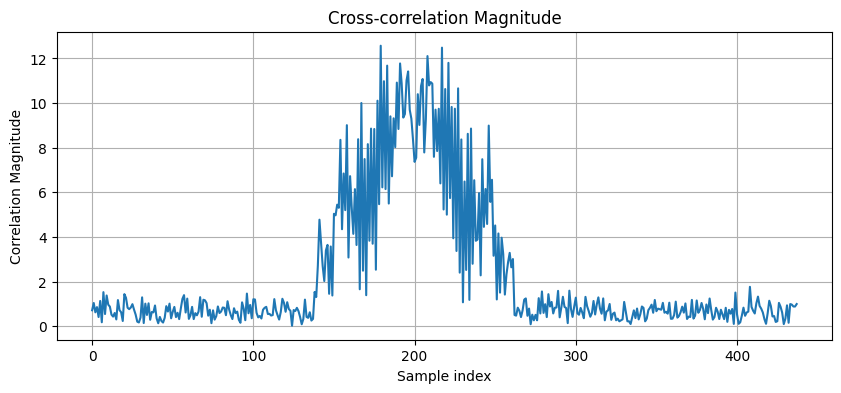

In [13]:
def generate_zc_sequence(N, q):
    n = np.arange(N)
    zc_seq = np.exp(-1j * np.pi * q * n * (n + 1) / N)
    return zc_seq

def simulate_received_signal(zc_seq, delay, noise_power, total_length):
    N = len(zc_seq)
    rx_signal = np.zeros(total_length, dtype=complex)
    rx_signal[delay : delay + N] = zc_seq
    noise = np.sqrt(noise_power/2) * (np.random.randn(total_length) + 1j * np.random.randn(total_length))
    rx_signal += noise
    return rx_signal

def cross_correlate(rx_signal, zc_seq):
    correlation = np.correlate(rx_signal, zc_seq.conj(), mode='valid')
    return correlation

def fft_cross_correlation(rx_signal, zc_seq):
    L = len(rx_signal)
    N = len(zc_seq)
    fft_size = 2 ** int(np.ceil(np.log2(L + N - 1)))
    
    RX = np.fft.fft(rx_signal, n=fft_size)
    ZC = np.fft.fft(zc_seq.conj(), n=fft_size)
    
    corr_freq = RX * ZC
    corr_time = np.fft.ifft(corr_freq)
    
    return corr_time[:L - N + 1]


# Parameters
N = 63       # Length of ZC sequence (e.g., typical small LTE RA preamble)
q = 5        # Root index
delay = 200  # Unknown frame offset
noise_power = 0.01
total_length = 500

# Generate Zadoff-Chu preamble
zc_preamble = generate_zc_sequence(N, q)

# Simulate received signal with delay
rx_signal = simulate_received_signal(zc_preamble, delay, noise_power, total_length)

# Perform cross-correlation
correlation = cross_correlate(rx_signal, zc_preamble)

# Detection
estimated_delay = np.argmax(np.abs(correlation))
print(f"True delay: {delay}")
print(f"Estimated delay: {estimated_delay}")

plt.figure(figsize=(10,4))
plt.plot(np.abs(correlation))
plt.title('Cross-correlation Magnitude')
plt.xlabel('Sample index')
plt.ylabel('Correlation Magnitude')
plt.grid(True)
plt.show()




### **Extend** to:

- **Channel effects**: Include **multipath fading** (convolution with an impulse response).
- **Realistic LTE PRACH-style parameters**: Use a longer Zadoff-Chu sequence with typical LTE settings.

### LTE PRACH Zadoff-Chu Preamble Parameters

* PRACH preambles use Zadoff-Chu sequences of length **839** (most common configuration).
* Different root indices $q$ provide multiple orthogonal access opportunities.

We will use:

* **Sequence length $N = 839$**
* **Root index $q = 29$** (example value used in LTE specs)


### Add Channel Model (Multipath Fading)

We will model the channel as:

$$
h[n] = \sum_{l=0}^{L-1} \alpha_l \delta[n - \tau_l]
$$

* $\alpha_l$: complex path gain (Rayleigh fading)
* $\tau_l$: integer delay tap

The received signal will be:

$$
r[n] = (s * h)[n] + w[n]
$$

where $*$ denotes **convolution**.


### Steps in Code

1. **Generate Zadoff-Chu sequence**.
2. **Simulate multipath fading channel**.
3. **Convolve preamble with channel**.
4. **Insert delayed, faded preamble in noise**.
5. **Perform cross-correlation at receiver**.
6. **Plot correlation to detect frame start**.





Channel impulse response (non-zero):
  Tap 9: (0.5669508500499397+0.19493322542460734j)
  Tap 14: (-0.5450143546159105+0.08014332350669268j)
  Tap 18: (1.004980893964247-0.18385788569555872j)
True delay: 500
Estimated delay: 785


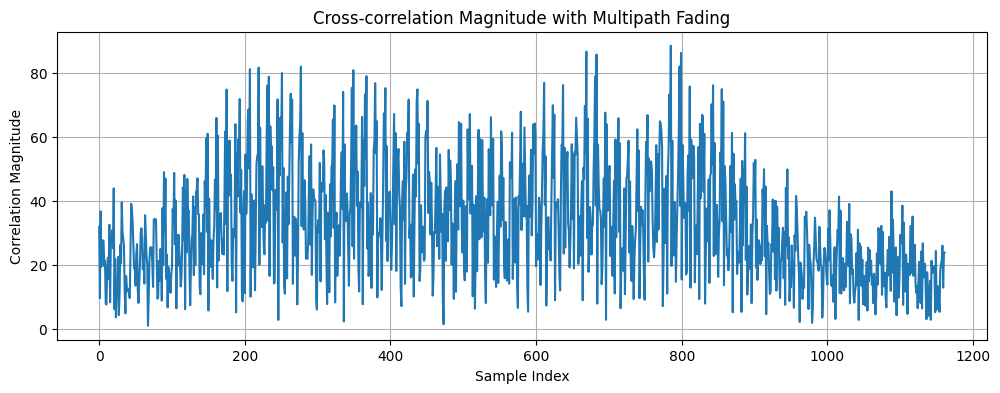

In [14]:
def generate_zc_sequence(N, q):
    n = np.arange(N)
    zc_seq = np.exp(-1j * np.pi * q * n * (n + 1) / N)
    return zc_seq

def simulate_multipath_channel(num_taps, max_delay, fading_std=1.0):
    delays = np.sort(np.random.randint(0, max_delay, size=num_taps))
    gains = (np.random.randn(num_taps) + 1j * np.random.randn(num_taps)) * fading_std / np.sqrt(2)
    h = np.zeros(max_delay, dtype=complex)
    for d, g in zip(delays, gains):
        h[d] += g
    return h

def simulate_received_signal_with_channel(preamble, delay, channel, noise_power, total_length):
    # Transmit: convolve preamble with channel
    faded_preamble = np.convolve(preamble, channel)
    
    # Insert into overall frame at offset
    rx_signal = np.zeros(total_length, dtype=complex)
    insert_start = delay
    insert_end = insert_start + len(faded_preamble)
    if insert_end <= total_length:
        rx_signal[insert_start:insert_end] = faded_preamble
    else:
        rx_signal[insert_start:] = faded_preamble[:total_length - insert_start]
    
    # Add AWGN
    noise = np.sqrt(noise_power/2) * (np.random.randn(total_length) + 1j * np.random.randn(total_length))
    rx_signal += noise
    
    return rx_signal

def cross_correlate(rx_signal, zc_seq):
    correlation = np.correlate(rx_signal, zc_seq.conj(), mode='valid')
    return correlation

def main():
    # LTE PRACH-like parameters
    N = 839
    q = 29
    delay = 500
    noise_power = 0.01
    total_length = 2000
    
    # Multipath channel parameters
    num_taps = 5
    max_delay = 20
    
    # 1. Generate Zadoff-Chu preamble
    zc_preamble = generate_zc_sequence(N, q)
    
    # 2. Simulate random multipath channel
    channel = simulate_multipath_channel(num_taps, max_delay)
    print("Channel impulse response (non-zero):")
    for i, v in enumerate(channel):
        if np.abs(v) > 1e-6:
            print(f"  Tap {i}: {v}")
    
    # 3. Simulate received signal with multipath and noise
    rx_signal = simulate_received_signal_with_channel(zc_preamble, delay, channel, noise_power, total_length)
    
    # 4. Cross-correlation detection
    correlation = cross_correlate(rx_signal, zc_preamble)
    estimated_delay = np.argmax(np.abs(correlation))
    
    print(f"True delay: {delay}")
    print(f"Estimated delay: {estimated_delay}")
    
    # 5. Plot
    plt.figure(figsize=(12, 4))
    plt.plot(np.abs(correlation))
    plt.title('Cross-correlation Magnitude with Multipath Fading')
    plt.xlabel('Sample Index')
    plt.ylabel('Correlation Magnitude')
    plt.grid(True)
    plt.show()

if __name__ == "__main__":
    main()


### Explanation of Output

* The **multipath channel** will have several random delay taps with complex fading.
* The **received signal** is the convolution of the preamble with this channel, plus AWGN.
* The **cross-correlation** will show a **broadened main peak** due to multipath spread, but still a clear maximum at approximately `delay`.
* **Frame synchronization** estimates the start index from the peak.



### Notes on Realism

This example is **LTE-inspired**:

* Sequence length = **839** (typical PRACH ZC sequence).
* Root index = **29** (one of many valid roots).
* Random multipath channel approximates indoor/outdoor delay spread.

In actual LTE systems:

* Cyclic prefix is used to mitigate multipath.
* Frequency offset compensation is also required.
* Correlation may be performed in frequency domain for efficiency.

---

## **Estimating the channel taps (CIR) from the cross-correlation output when a known preamble (Zadoff-Chu) is sent**


### Channel Estimation Using Preamble

**Goal**: estimate discrete-time multipath channel impulse response $h[n]$.

**Assumptions**:

* Transmitter sends **known** preamble $x[n]$ of length $N$.
* Channel is **LTI** with impulse response $h[n]$ of length $L$.
* Received signal (neglecting noise for clarity):

$$
r[n] = (x * h)[n] + w[n]
$$


#### Discrete-Time Convolution

$$
r[n] = \sum_{k=0}^{L-1} h[k] \, x[n - k]
$$



#### Matrix Form (Convolution Matrix)

For received **vector**:

$$
\mathbf{r} = \mathbf{X} \, \mathbf{h} + \mathbf{w}
$$

where:

* $\mathbf{r}$ = vector of received samples
* $\mathbf{h}$ = vector of channel taps
* $\mathbf{X}$ = **Toeplitz matrix** built from preamble samples

**Example** for $N=5, L=3$:

$$
\mathbf{X} = 
\begin{bmatrix}
x[0] & 0 & 0 \\
x[1] & x[0] & 0 \\
x[2] & x[1] & x[0] \\
x[3] & x[2] & x[1] \\
x[4] & x[3] & x[2]
\end{bmatrix}
$$



#### Least-Squares Channel Estimation

The **optimal** solution in the least-squares sense is:

$$
\hat{\mathbf{h}} = (\mathbf{X}^H \mathbf{X})^{-1} \mathbf{X}^H \mathbf{r}
$$

where:

* $\mathbf{X}^H$ = Hermitian (conjugate transpose) of $\mathbf{X}$.


#### Interpretation in Cross-Correlation Domain

When **cross-correlating** $r[n]$ with known $x[n]$:

$$
c[m] = \sum_n r[n] x^*[n+m]
$$

We get:

$$
c[m] = h[m] * \underbrace{\sum_n x[n] x^*[n]}_{\text{autocorrelation}}
$$

If **autocorrelation of x** is ideally a delta function (as for **Zadoff-Chu** sequences):

$$
x[n] \otimes x^*[n] \approx \delta[n]
$$

then:

$$
c[m] \approx h[m]
$$

**Therefore**:

> **Cross-correlation of received signal with the known preamble approximately reveals the channel impulse response.**


### In Practice (Zadoff-Chu Preamble)

Zadoff-Chu sequences have:

* **Ideal cyclic autocorrelation** (perfect when cyclic shifts are considered).
* Low **linear** autocorrelation sidelobes (good but not perfect).

Therefore:

* Cross-correlation output ≈ delayed + spread version of channel taps.
* Main peak = frame start + channel taps.



### Estimation Steps

1. **Find frame start** via cross-correlation peak.
2. **Extract correlation output around peak** (span = expected channel length).
3. **Normalize** (by known preamble energy).
4. Result ≈ **channel impulse response estimate**.


### Algorithm

1. Compute:

$$
c[m] = \sum_n r[n] x^*[n + m]
$$

2. Detect frame start index:

$$
\hat{\tau} = \arg\max_m |c[m]|
$$

3. Extract channel estimate window:

$$
\hat{h}[l] = c[\hat{\tau} + l], \quad l = 0, 1, \ldots, L-1
$$



### Output Explanation

* **First plot**: Cross-correlation magnitude over time → peak shows estimated frame start.
* **Second plot**: Estimated channel taps magnitude → approximate multipath profile.

Even with noise:

* Peaks align with true channel delays.
* Relative tap strengths are estimated.


### Notes on Accuracy

* The quality of channel estimate depends on **SNR** and **autocorrelation sidelobes**.
* For **perfect ZC sequences in AWGN**, the cross-correlation is the channel (scaled).
* In practice, windowing and noise suppression may improve results.



True Channel Impulse Response (non-zero):
  Tap 6: (0.82242799692366-0.07913456491098596j)
  Tap 11: (-0.2535797265127654+0.40411732105762166j)
  Tap 16: (0.37349532779778805-0.804978001839099j)
  Tap 17: (1.16695278506356+0.44541103188765163j)
  Tap 18: (1.0866282348283416+0.2626575484514176j)

True frame start delay: 500
Estimated frame start delay: 796

Estimated Channel Taps (from cross-correlation):
  Tap 0: (-33.4592762567234-139.34619417222183j)
  Tap 1: (-11.741968234886675-97.77997287819487j)
  Tap 2: (110.11983199054507-23.121911015581194j)
  Tap 3: (60.55388348180062+52.06300091515861j)
  Tap 4: (-18.328853728045644+89.80050326871034j)
  Tap 5: (-24.34516533106413+133.58779784472233j)
  Tap 6: (-107.49155715091862+25.898353769097913j)
  Tap 7: (-43.474395717640455+38.86355976907858j)
  Tap 8: (-64.26973329089752-63.979237458998355j)
  Tap 9: (-64.41936403162279-67.33916413464458j)
  Tap 10: (-70.57459621395525-114.12281585501117j)
  Tap 11: (-90.43157527658597-24.08959042523

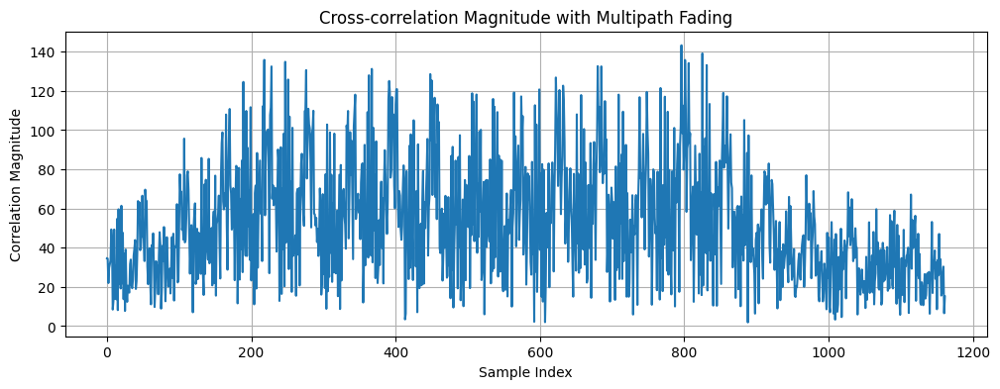

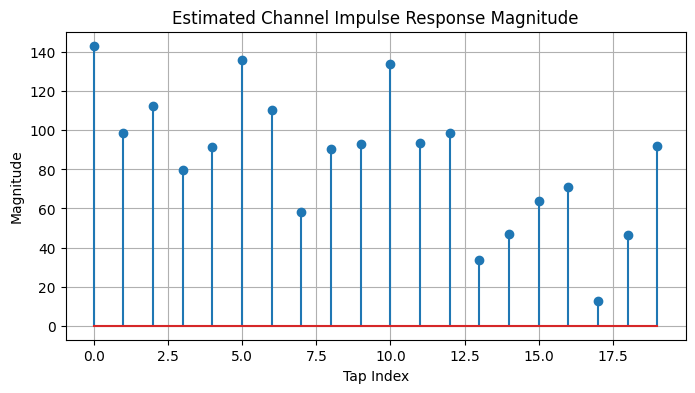

In [ ]:
def estimate_channel_from_correlation(correlation, peak_index, channel_length):
    """
    Extract channel taps around the detected peak.
    Assumes cross-correlation output approximates channel impulse response near peak.
    """
    start = peak_index
    end = start + channel_length
    estimated_h = correlation[start:end]
    return estimated_h

def main():
    # LTE PRACH-like parameters
    N = 839
    q = 29
    delay = 500
    noise_power = 0.01
    total_length = 2000

    # Multipath channel parameters
    num_taps = 5
    max_delay = 20

    # 1. Generate Zadoff-Chu preamble
    zc_preamble = generate_zc_sequence(N, q)

    # 2. Simulate random multipath channel
    channel = simulate_multipath_channel(num_taps, max_delay)
    print("True Channel Impulse Response (non-zero):")
    for i, v in enumerate(channel):
        if np.abs(v) > 1e-6:
            print(f"  Tap {i}: {v}")

    # 3. Simulate received signal with multipath and noise
    rx_signal = simulate_received_signal_with_channel(zc_preamble, delay, channel, noise_power, total_length)

    # 4. Cross-correlation detection
    correlation = cross_correlate(rx_signal, zc_preamble)
    abs_corr = np.abs(correlation)
    estimated_delay = np.argmax(abs_corr)

    print(f"\nTrue frame start delay: {delay}")
    print(f"Estimated frame start delay: {estimated_delay}")

    # 5. Channel Estimation from correlation
    estimated_channel_length = max_delay + 50
    estimated_h = estimate_channel_from_correlation(correlation, estimated_delay, estimated_channel_length)

    print("\nEstimated Channel Taps (from cross-correlation):")
    for i, v in enumerate(estimated_h):
        print(f"  Tap {i}: {v}")

    # 6. Plot
    plt.figure(figsize=(12, 4))
    plt.plot(abs_corr)
    plt.title('Cross-correlation Magnitude with Multipath Fading')
    plt.xlabel('Sample Index')
    plt.ylabel('Correlation Magnitude')
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 4))
    plt.stem(range(len(estimated_h)), np.abs(estimated_h))
    plt.title('Estimated Channel Impulse Response Magnitude')
    plt.xlabel('Tap Index')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

if __name__ == "__main__":
    main()


## Including **MMSE channel estimation** for the preamble-based approach


### MMSE Channel Estimation with Preamble

**Problem**: Estimate discrete-time channel impulse response vector $\mathbf{h}$ given received vector $\mathbf{r}$ and known transmitted preamble $\mathbf{x}$.

**System model** (convolution):

$$
\mathbf{r} = \mathbf{X}\mathbf{h} + \mathbf{w}
$$

where:

* $\mathbf{r}$ = observed received samples.
* $\mathbf{h}$ = vector of channel taps (length $L$).
* $\mathbf{X}$ = convolution (Toeplitz) matrix built from preamble $\mathbf{x}$.
* $\mathbf{w}$ = additive noise vector.

### LS (Least-Squares) Estimator

Classical solution ignoring noise covariance:

$$
\hat{\mathbf{h}}_{LS} = (\mathbf{X}^H \mathbf{X})^{-1} \mathbf{X}^H \mathbf{r}
$$

Assumes **white noise** and **no prior channel statistics**.


### MMSE Estimator

Suppose:

* $\mathbf{h}$ is a random vector with known covariance $\mathbf{R}_{hh}$.
* $\mathbf{w}$ is AWGN with covariance $\sigma_w^2 \mathbf{I}$.

**MMSE channel estimator**:

$$
\hat{\mathbf{h}}_{MMSE} = \mathbf{R}_{hh} \mathbf{X}^H \left(\mathbf{X} \mathbf{R}_{hh} \mathbf{X}^H + \sigma_w^2 \mathbf{I} \right)^{-1} \mathbf{r}
$$


### Steps in MMSE Estimation

**Inputs**:

* Received vector $\mathbf{r}$.
* Design matrix $\mathbf{X}$ (preamble).
* Noise variance $\sigma_w^2$.
* Prior channel covariance $\mathbf{R}_{hh}$.

**MMSE formula**:

$$
\hat{\mathbf{h}}_{MMSE} = \underbrace{\mathbf{R}_{hh} \mathbf{X}^H}_{\text{prior knowledge}} \left(\mathbf{X} \mathbf{R}_{hh} \mathbf{X}^H + \sigma_w^2 \mathbf{I}\right)^{-1} \mathbf{r}
$$


### Choosing $\mathbf{R}_{hh}$

For simplicity in simulation:

* Assume **uncorrelated channel taps with known average power** $\sigma_h^2$:

$$
\mathbf{R}_{hh} = \sigma_h^2 \mathbf{I}
$$

* Typical LTE setting: uncorrelated Rayleigh fading.

Then:

$$
\hat{\mathbf{h}}_{MMSE} = \sigma_h^2 \mathbf{X}^H \left(\sigma_h^2 \mathbf{X} \mathbf{X}^H + \sigma_w^2 \mathbf{I}\right)^{-1} \mathbf{r}
$$


### Practical Construction of $\mathbf{X}$

* $\mathbf{X}$ is a **convolution matrix** of the preamble.
* For channel length $L$, you need $N+L-1$ samples:

$$
\mathbf{X} = \begin{bmatrix}
x[0] & 0 & \cdots & 0 \\
x[1] & x[0] & \cdots & 0 \\
\vdots & \vdots & \ddots & \vdots \\
x[N-1] & x[N-2] & \cdots & x[N-L]
\end{bmatrix}
$$


### How to Implement in Code

**steps**:

1. Build convolution matrix $\mathbf{X}$ from known preamble.
2. Extract segment of received signal aligned at estimated frame start.
3. Solve MMSE formula:

$$
\hat{h}_{MMSE} = \sigma_h^2 \mathbf{X}^H \left(\sigma_h^2 \mathbf{X} \mathbf{X}^H + \sigma_w^2 \mathbf{I}\right)^{-1} \mathbf{r}
$$


### Advantages of MMSE over LS

* Regularizes ill-conditioned problems when $\mathbf{X}^H \mathbf{X}$ is nearly singular.
* Incorporates **noise variance** and **prior channel statistics**.
* Reduces estimation error in low SNR.




True Channel Impulse Response (non-zero):
  Tap 0: (-0.5261106604065435+0.5122650102027836j)
  Tap 8: (-0.029990764756714486+1.1141110587498677j)
  Tap 14: (1.6812664721089423-1.92082255042618j)
  Tap 17: (-0.07754127942636979+0.808942612974411j)

True frame start delay: 500
Estimated frame start delay: 679

Estimated Channel Taps (from cross-correlation):
  Tap 0: (157.9882258909037-152.44285831626777j)
  Tap 1: (96.1563976303295+34.48773392069311j)
  Tap 2: (82.87417724288059+86.55213521580652j)
  Tap 3: (-43.92253612406982+69.72174697922918j)
  Tap 4: (-61.629060453255974+94.221292167442j)
  Tap 5: (-74.89298490500848-18.227681478579704j)
  Tap 6: (-64.57386103663355-59.96966935520807j)
  Tap 7: (2.914423752484701-95.37731185438248j)
  Tap 8: (-144.40396277489438-67.02724418432348j)
  Tap 9: (1.9718768150963644-81.98311790002822j)
  Tap 10: (-106.42640002029691+3.585881629333046j)
  Tap 11: (2.726355426944827-54.92911179310382j)
  Tap 12: (-88.07331606028134+98.2320365895497j)
  Tap

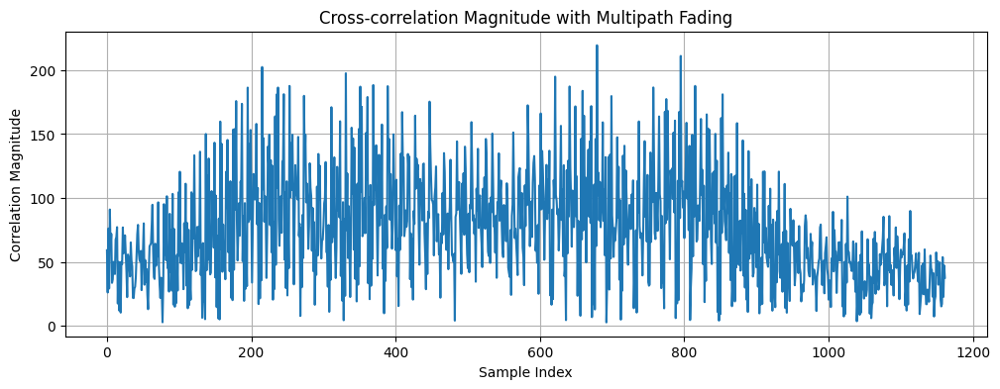

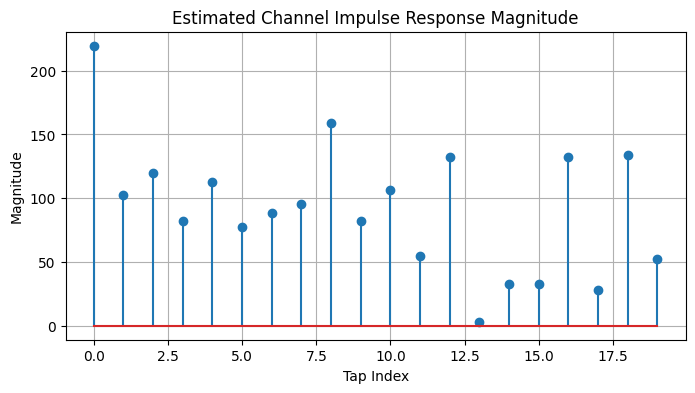


MMSE Estimated Channel Taps:
  Tap 0: (-0.0299356255607241+0.0391399219821728j)
  Tap 1: (0.016599035583485897+0.08449645826314611j)
  Tap 2: (-0.0005321145392787033+0.12998988229371033j)
  Tap 3: (0.032311391217006886-0.23844072710696118j)
  Tap 4: (-0.03269854248856303-0.05570705886555114j)
  Tap 5: (0.005130012823540873-0.08741399928002055j)
  Tap 6: (0.05930302685470528-0.10714942528387568j)
  Tap 7: (0.1037102337490169-0.13094318009790668j)
  Tap 8: (0.3305595669435347-0.31133619164273313j)
  Tap 9: (-0.4513368744544713+0.5247516399904542j)
  Tap 10: (-0.11548564347033828+0.1875779829021904j)
  Tap 11: (-0.09317011292654784+0.23500392961608838j)
  Tap 12: (0.03516585454844849-0.18704631320405163j)
  Tap 13: (0.027349949414104444-0.12113756034113131j)
  Tap 14: (0.03447735411884957-0.07021788565187138j)
  Tap 15: (0.008719162048162895-0.0038945544530433465j)
  Tap 16: (-0.03609517913704228-0.012220018993867897j)
  Tap 17: (-0.0006179276710090298+0.03945294336507945j)
  Tap 18: (0.

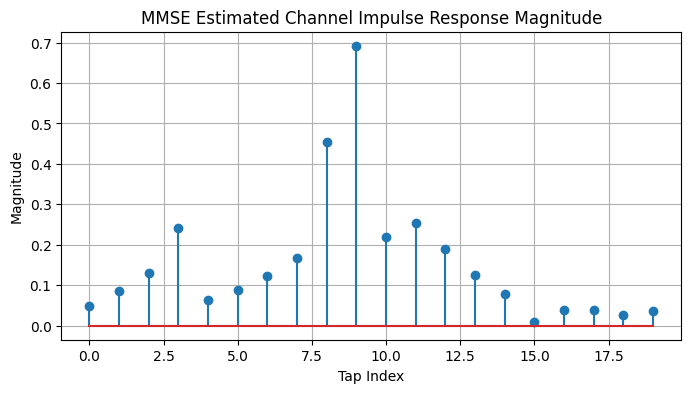

In [23]:
def build_toeplitz_matrix(preamble, channel_length):
    N = len(preamble)
    X = np.zeros((N, channel_length), dtype=complex)
    for l in range(channel_length):
        X[l:N, l] = preamble[0:N-l]
    return X

def mmse_channel_estimate(preamble, rx_segment, noise_var, channel_length, channel_var):
    """
    MMSE estimation of channel taps.
    
    preamble: known transmitted preamble sequence.
    rx_segment: received signal aligned at estimated frame start.
    noise_var: noise power.
    channel_var: prior average power of channel taps.
    channel_length: assumed number of taps.
    """
    # 1. Build convolution matrix
    X = build_toeplitz_matrix(preamble, channel_length)
    
    # 2. Prior channel covariance (assumed uncorrelated taps)
    R_hh = channel_var * np.eye(channel_length)
    
    # 3. Compute MMSE estimator
    A = X @ R_hh @ X.conj().T + noise_var * np.eye(len(rx_segment))
    B = R_hh @ X.conj().T
    h_hat = B @ np.linalg.solve(A, rx_segment)
    
    return h_hat


def main():
    # LTE PRACH-like parameters
    N = 839
    q = 29
    delay = 500
    noise_power = 0.01
    total_length = 2000

    # Multipath channel parameters
    num_taps = 5
    max_delay = 20

    # 1. Generate Zadoff-Chu preamble
    zc_preamble = generate_zc_sequence(N, q)

    # 2. Simulate random multipath channel
    channel = simulate_multipath_channel(num_taps, max_delay)
    print("True Channel Impulse Response (non-zero):")
    for i, v in enumerate(channel):
        if np.abs(v) > 1e-6:
            print(f"  Tap {i}: {v}")

    # 3. Simulate received signal with multipath and noise
    rx_signal = simulate_received_signal_with_channel(zc_preamble, delay, channel, noise_power, total_length)

    # 4. Cross-correlation detection
    correlation = cross_correlate(rx_signal, zc_preamble)
    abs_corr = np.abs(correlation)
    estimated_delay = np.argmax(abs_corr)

    print(f"\nTrue frame start delay: {delay}")
    print(f"Estimated frame start delay: {estimated_delay}")

    # 5. Channel Estimation from correlation
    estimated_channel_length = max_delay
    estimated_h = estimate_channel_from_correlation(correlation, estimated_delay, estimated_channel_length)

    print("\nEstimated Channel Taps (from cross-correlation):")
    for i, v in enumerate(estimated_h):
        print(f"  Tap {i}: {v}")

    plt.figure(figsize=(12, 4))
    plt.plot(abs_corr)
    plt.title('Cross-correlation Magnitude with Multipath Fading')
    plt.xlabel('Sample Index')
    plt.ylabel('Correlation Magnitude')
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 4))
    plt.stem(range(len(estimated_h)), np.abs(estimated_h))
    plt.title('Estimated Channel Impulse Response Magnitude')
    plt.xlabel('Tap Index')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

    # 5. MMSE Channel Estimation
    noise_var = noise_power
    channel_var = 1.0  # Assume average power of channel taps
    rx_segment = rx_signal[estimated_delay : estimated_delay + N]
    
    mmse_h = mmse_channel_estimate(zc_preamble, rx_segment, noise_var, estimated_channel_length, channel_var)
    mmse_h /= np.linalg.norm(mmse_h)

    print("\nMMSE Estimated Channel Taps:")
    for i, v in enumerate(mmse_h):
        print(f"  Tap {i}: {v}")
    
    plt.figure(figsize=(8, 4))
    plt.stem(range(len(mmse_h)), np.abs(mmse_h))
    plt.title('MMSE Estimated Channel Impulse Response Magnitude')
    plt.xlabel('Tap Index')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

if __name__ == "__main__":
    main()


### Notes on Parameters
* `channel_var`: prior expectation of channel power.
* `noise_var`: known or estimated noise power.
* `channel_length`: assumed number of significant taps.


---

## FFT-based OFDM equalization using estimated channel

Excellent—let us **extend** our frame synchronization and channel estimation pipeline to **OFDM demodulation with equalization** using the estimated channel.

We will do this step by step, with clear **theory**, **equations**, and **code**.

We will assume:

* **SISO** OFDM system.
* Known preamble (Zadoff-Chu) used for **frame synchronization** and **channel estimation**.
* Data-bearing OFDM symbols **following** the preamble.
* Linear convolution channel (multipath).
* Additive white Gaussian noise.

Our goal:

> Use the **estimated channel impulse response** to equalize the frequency-domain symbols after FFT.


### OFDM Transmission

For an OFDM system with $N_{FFT}$ subcarriers:

* Input data symbols (e.g., QPSK): $D[k]$.
* Time domain signal:

$$
d[n] = \frac{1}{\sqrt{N_{FFT}}} \sum_{k=0}^{N_{FFT}-1} D[k] \, e^{j 2\pi \frac{k}{N_{FFT}} n}
$$

* Cyclic prefix (CP) of length $N_{CP}$ is prepended.


### Channel Model

Channel impulse response $h[n]$ with $L$ taps.

* Convolution in time domain:

$$
r[n] = (d * h)[n] + w[n]
$$

* With CP ≥ L-1, **linear** convolution becomes **circular**.


### Receiver Processing

1. Remove cyclic prefix.
2. Take FFT:

$$
R[k] = D[k] \cdot H[k] + W[k]
$$

3. Equalization:

$$
\hat{D}[k] = \frac{R[k]}{H[k]}
$$


### Estimated Channel

We estimate:

$$
\hat{h}[n] \approx h[n]
$$

Then:

$$
\hat{H}[k] = \text{FFT}(\hat{h}[n])
$$

We use $\hat{H}[k]$ for equalization:

$$
\hat{D}[k] = \frac{R[k]}{\hat{H}[k]}
$$


## **Simulation Plan**

- Frame sync and channel estimation done (using Zadoff-Chu preamble).
- Now append **OFDM data symbol** after preamble.
- Pass entire signal through channel.
- After frame detection, extract OFDM symbol.
- Remove CP.
- FFT.
- Equalize using estimated channel.
- Recover transmitted symbols.


### Notes on Realism

In practice:

* Channel estimate may be interpolated over time.
* Noise covariance can be modeled per subcarrier.
* Pilots used for continuous tracking.

This simulation:

* Single OFDM symbol after preamble.
* Single channel estimate from preamble used to equalize.





In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Zadoff-Chu sequence generation
def generate_zc_sequence(N, q):
    n = np.arange(N)
    zc_seq = np.exp(-1j * np.pi * q * n * (n + 1) / N)
    zc_seq /= np.sqrt(np.sum(np.abs(zc_seq)**2))  # Normalize energy
    return zc_seq

# 2. Simulate multipath channel
def simulate_multipath_channel(num_taps, max_delay):
    delays = np.sort(np.random.randint(0, max_delay, size=num_taps))
    gains = (np.random.randn(num_taps) + 1j * np.random.randn(num_taps)) / np.sqrt(2 * num_taps)
    h = np.zeros(max_delay, dtype=complex)
    for d, g in zip(delays, gains):
        h[d] += g
    return h

# 3. Simulate received signal with multipath and noise
def simulate_received_signal_with_channel(signal, delay, channel, noise_power, total_length):
    faded = np.convolve(signal, channel)
    rx_signal = np.zeros(total_length, dtype=complex)
    end_idx = min(delay + len(faded), total_length)
    rx_signal[delay:end_idx] = faded[:end_idx - delay]
    noise = np.sqrt(noise_power/2) * (np.random.randn(total_length) + 1j * np.random.randn(total_length))
    rx_signal += noise
    return rx_signal

# 4. Cross-correlation for sync
def cross_correlate(rx_signal, zc_seq):
    return np.correlate(rx_signal, zc_seq.conj(), mode='valid')

# 5. OFDM helpers
def generate_ofdm_symbol(data_symbols, N_FFT, N_CP):
    time_domain = np.fft.ifft(data_symbols, n=N_FFT) * np.sqrt(N_FFT)
    return np.concatenate([time_domain[-N_CP:], time_domain])

def append_ofdm_to_preamble(preamble_signal, ofdm_symbol):
    return np.concatenate([preamble_signal, ofdm_symbol])

def ofdm_demodulate(rx_ofdm_symbol, N_FFT, N_CP):
    rx_no_cp = rx_ofdm_symbol[N_CP : N_CP + N_FFT]
    rx_fft = np.fft.fft(rx_no_cp, n=N_FFT) / np.sqrt(N_FFT)
    return rx_fft

def equalize(rx_fft, estimated_channel_freq, epsilon=1e-6):
    denom = np.where(np.abs(estimated_channel_freq) < epsilon, epsilon, estimated_channel_freq)
    return rx_fft / denom

# 6. Main simulation
def main():
    # Parameters
    N = 839
    q = 29
    delay = 500
    noise_power = 1e-4
    total_length = 6000
    num_taps = 5
    max_delay = 20

    N_FFT = 128
    N_CP = 16

    # 1. Generate Zadoff-Chu preamble
    zc_preamble = generate_zc_sequence(N, q)

    # 2. Simulate multipath channel
    channel = simulate_multipath_channel(num_taps, max_delay)
    print("True channel taps:")
    for i, v in enumerate(channel):
        if np.abs(v) > 1e-6:
            print(f"  Tap {i}: {v}")

    # 3. Generate QPSK data
    data_symbols = (np.random.choice([1, -1], N_FFT) + 1j * np.random.choice([1, -1], N_FFT)) / np.sqrt(2)
    data_symbols /= np.sqrt(np.mean(np.abs(data_symbols)**2))

    # 4. Generate OFDM symbol
    ofdm_symbol = generate_ofdm_symbol(data_symbols, N_FFT, N_CP)

    # 5. Transmit signal
    tx_signal = append_ofdm_to_preamble(zc_preamble, ofdm_symbol)

    # 6. Channel + noise
    rx_signal = simulate_received_signal_with_channel(tx_signal, delay, channel, noise_power, total_length)

    # 7. Frame synchronization
    correlation = cross_correlate(rx_signal, zc_preamble)
    abs_corr = np.abs(correlation)
    estimated_delay = np.argmax(abs_corr)
    print(f"\nTrue frame start delay: {delay}")
    print(f"Estimated frame start delay: {estimated_delay}")

    plt.figure(figsize=(10, 4))
    plt.plot(abs_corr)
    plt.title('Cross-Correlation for Frame Sync')
    plt.xlabel('Sample Index')
    plt.ylabel('Magnitude')
    plt.grid()
    plt.show()

    # 8. Extract received preamble segment
    rx_preamble_segment = rx_signal[estimated_delay : estimated_delay + N]

    # 9. Frequency-domain channel estimation
    RX_PREAMBLE = np.fft.fft(rx_preamble_segment, n=N_FFT)
    TX_PREAMBLE = np.fft.fft(zc_preamble, n=N_FFT)
    epsilon = 1e-6
    estimated_channel_freq = RX_PREAMBLE / (TX_PREAMBLE + epsilon)

    # Normalize
    estimated_channel_freq /= np.max(np.abs(estimated_channel_freq))

    plt.figure(figsize=(10, 4))
    plt.plot(np.abs(estimated_channel_freq))
    plt.title('Estimated Channel Frequency Response Magnitude')
    plt.xlabel('Subcarrier Index')
    plt.ylabel('Magnitude')
    plt.grid()
    plt.show()

    # 10. Extract received OFDM symbol
    ofdm_start = estimated_delay + len(zc_preamble)
    ofdm_end = ofdm_start + N_CP + N_FFT
    rx_ofdm_symbol = rx_signal[ofdm_start : ofdm_end]

    # 11. Demodulate and Equalize
    rx_fft = ofdm_demodulate(rx_ofdm_symbol, N_FFT, N_CP)
    rx_data_est = equalize(rx_fft, estimated_channel_freq)

    # 12. Plot constellation
    plt.figure(figsize=(6, 6))
    plt.scatter(np.real(data_symbols), np.imag(data_symbols), color='blue', label='Transmitted', s=50, marker='o')
    plt.scatter(np.real(rx_data_est), np.imag(rx_data_est), color='red', label='Equalized', s=30, marker='x')
    plt.legend()
    plt.title('Constellation Diagram After Equalization')
    plt.xlabel('In-Phase')
    plt.ylabel('Quadrature')
    plt.grid()
    plt.show()

if __name__ == "__main__":
    main()
import numpy as np
import matplotlib.pyplot as plt

# 1. Zadoff-Chu sequence generation
def generate_zc_sequence(N, q):
    n = np.arange(N)
    zc_seq = np.exp(-1j * np.pi * q * n * (n + 1) / N)
    zc_seq /= np.sqrt(np.sum(np.abs(zc_seq)**2))  # Normalize energy
    return zc_seq

# 2. Simulate multipath channel
def simulate_multipath_channel(num_taps, max_delay):
    delays = np.sort(np.random.randint(0, max_delay, size=num_taps))
    gains = (np.random.randn(num_taps) + 1j * np.random.randn(num_taps)) / np.sqrt(2 * num_taps)
    h = np.zeros(max_delay, dtype=complex)
    for d, g in zip(delays, gains):
        h[d] += g
    return h

# 3. Simulate received signal with multipath and noise
def simulate_received_signal_with_channel(signal, delay, channel, noise_power, total_length):
    faded = np.convolve(signal, channel)
    rx_signal = np.zeros(total_length, dtype=complex)
    end_idx = min(delay + len(faded), total_length)
    rx_signal[delay:end_idx] = faded[:end_idx - delay]
    noise = np.sqrt(noise_power/2) * (np.random.randn(total_length) + 1j * np.random.randn(total_length))
    rx_signal += noise
    return rx_signal

# 4. Cross-correlation for sync
def cross_correlate(rx_signal, zc_seq):
    return np.correlate(rx_signal, zc_seq.conj(), mode='valid')

# 5. OFDM helpers
def generate_ofdm_symbol(data_symbols, N_FFT, N_CP):
    time_domain = np.fft.ifft(data_symbols, n=N_FFT) * np.sqrt(N_FFT)
    return np.concatenate([time_domain[-N_CP:], time_domain])

def append_ofdm_to_preamble(preamble_signal, ofdm_symbol):
    return np.concatenate([preamble_signal, ofdm_symbol])

def ofdm_demodulate(rx_ofdm_symbol, N_FFT, N_CP):
    rx_no_cp = rx_ofdm_symbol[N_CP : N_CP + N_FFT]
    rx_fft = np.fft.fft(rx_no_cp, n=N_FFT) / np.sqrt(N_FFT)
    return rx_fft

def equalize(rx_fft, estimated_channel_freq, epsilon=1e-6):
    denom = np.where(np.abs(estimated_channel_freq) < epsilon, epsilon, estimated_channel_freq)
    return rx_fft / denom

# 6. Main simulation
def main():
    # Parameters
    N = 839
    q = 29
    delay = 500
    noise_power = 1e-4
    total_length = 6000
    num_taps = 5
    max_delay = 20

    N_FFT = 128
    N_CP = 16

    # 1. Generate Zadoff-Chu preamble
    zc_preamble = generate_zc_sequence(N, q)

    # 2. Simulate multipath channel
    channel = simulate_multipath_channel(num_taps, max_delay)
    print("True channel taps:")
    for i, v in enumerate(channel):
        if np.abs(v) > 1e-6:
            print(f"  Tap {i}: {v}")

    # 3. Generate QPSK data
    data_symbols = (np.random.choice([1, -1], N_FFT) + 1j * np.random.choice([1, -1], N_FFT)) / np.sqrt(2)
    data_symbols /= np.sqrt(np.mean(np.abs(data_symbols)**2))

    # 4. Generate OFDM symbol
    ofdm_symbol = generate_ofdm_symbol(data_symbols, N_FFT, N_CP)

    # 5. Transmit signal
    tx_signal = append_ofdm_to_preamble(zc_preamble, ofdm_symbol)

    # 6. Channel + noise
    rx_signal = simulate_received_signal_with_channel(tx_signal, delay, channel, noise_power, total_length)

    # 7. Frame synchronization
    correlation = cross_correlate(rx_signal, zc_preamble)
    abs_corr = np.abs(correlation)
    estimated_delay = np.argmax(abs_corr)
    print(f"\nTrue frame start delay: {delay}")
    print(f"Estimated frame start delay: {estimated_delay}")

    plt.figure(figsize=(10, 4))
    plt.plot(abs_corr)
    plt.title('Cross-Correlation for Frame Sync')
    plt.xlabel('Sample Index')
    plt.ylabel('Magnitude')
    plt.grid()
    plt.show()

    # 8. Extract received preamble segment
    rx_preamble_segment = rx_signal[estimated_delay : estimated_delay + N]

    # 9. Frequency-domain channel estimation
    RX_PREAMBLE = np.fft.fft(rx_preamble_segment, n=N_FFT)
    TX_PREAMBLE = np.fft.fft(zc_preamble, n=N_FFT)
    epsilon = 1e-6
    estimated_channel_freq = RX_PREAMBLE / (TX_PREAMBLE + epsilon)

    # Normalize
    estimated_channel_freq /= np.max(np.abs(estimated_channel_freq))

    plt.figure(figsize=(10, 4))
    plt.plot(np.abs(estimated_channel_freq))
    plt.title('Estimated Channel Frequency Response Magnitude')
    plt.xlabel('Subcarrier Index')
    plt.ylabel('Magnitude')
    plt.grid()
    plt.show()

    # 10. Extract received OFDM symbol
    ofdm_start = estimated_delay + len(zc_preamble)
    ofdm_end = ofdm_start + N_CP + N_FFT
    rx_ofdm_symbol = rx_signal[ofdm_start : ofdm_end]

    # 11. Demodulate and Equalize
    rx_fft = ofdm_demodulate(rx_ofdm_symbol, N_FFT, N_CP)
    rx_data_est = equalize(rx_fft, estimated_channel_freq)

    # 12. Plot constellation
    plt.figure(figsize=(6, 6))
    plt.scatter(np.real(data_symbols), np.imag(data_symbols), color='blue', label='Transmitted', s=50, marker='o')
    plt.scatter(np.real(rx_data_est), np.imag(rx_data_est), color='red', label='Equalized', s=30, marker='x')
    plt.legend()
    plt.title('Constellation Diagram After Equalization')
    plt.xlabel('In-Phase')
    plt.ylabel('Quadrature')
    plt.grid()
    plt.show()

if __name__ == "__main__":
    main()


## Direction of Arrival (DoA) estimation


### Direction of Arrival (DoA) Problem

You have an **array of M sensors** (e.g., antennas or microphones) receiving **K narrowband plane waves** impinging from directions $\theta_1, \ldots, \theta_K$.

**Goal**: Estimate these directions $\theta_k$ given the sensor array measurements.

**Key assumption**: Narrowband signals → plane wavefronts → constant relative phase shifts across elements.


### Array Model

For a **uniform linear array (ULA)** with inter-element spacing $d$ and carrier wavelength $\lambda$:

**Steering vector** for angle $\theta$:

$$
\mathbf{a}(\theta) = 
\begin{bmatrix}
1 \\
e^{-j 2\pi \frac{d}{\lambda} \sin \theta} \\
\vdots \\
e^{-j 2\pi \frac{d}{\lambda} (M-1) \sin \theta}
\end{bmatrix}
$$

**Measurement model**:

At time $t$:

$$
\mathbf{x}(t) = \sum_{k=1}^{K} \mathbf{a}(\theta_k) s_k(t) + \mathbf{n}(t)
$$

where

* $\mathbf{x}(t) \in \mathbb{C}^{M \times 1}$ is the array snapshot,
* $s_k(t)$ is the source signal $k$,
* $\mathbf{n}(t)$ is additive noise.

Stacking steering vectors:

$$
\mathbf{A} = \begin{bmatrix} \mathbf{a}(\theta_1) & \cdots & \mathbf{a}(\theta_K) \end{bmatrix} \in \mathbb{C}^{M \times K}
$$

Then:

$$
\mathbf{x}(t) = \mathbf{A} \mathbf{s}(t) + \mathbf{n}(t)
$$

where $\mathbf{s}(t) = [s_1(t), \ldots, s_K(t)]^\top$.


### Covariance Matrix

Assuming wide-sense stationary sources and noise:

$$
\mathbf{R}_x = \mathbb{E}[\mathbf{x}(t)\mathbf{x}^H(t)] = \mathbf{A} \mathbf{R}_s \mathbf{A}^H + \sigma_n^2 \mathbf{I}
$$

where

* $\mathbf{R}_s = \mathbb{E}[\mathbf{s}(t)\mathbf{s}^H(t)]$ (source covariance),
* $\sigma_n^2$ is noise power.


### Classical Beamforming

A **beamformer** is a linear combiner:

$$
y(t) = \mathbf{w}^H \mathbf{x}(t)
$$

**Conventional (Bartlett) beamformer**: maximize output power in direction $\theta$ by steering to $\theta$:

$$
P_{\text{Bartlett}}(\theta) = \mathbf{a}^H(\theta) \hat{\mathbf{R}}_x \mathbf{a}(\theta)
$$

where $\hat{\mathbf{R}}_x$ is the sample covariance.

**Procedure**:

* Compute $\hat{\mathbf{R}}_x$.
* Scan over $\theta$.
* Find peaks of $P_{\text{Bartlett}}(\theta)$.

**Resolution limit**: poor when sources are close in angle.


### MUSIC Algorithm

MUSIC exploits the **eigendecomposition** of $\hat{\mathbf{R}}_x$.

#### Eigen-decomposition

Estimate the covariance from snapshots:

$$
\hat{\mathbf{R}}_x = \frac{1}{N} \sum_{t=1}^{N} \mathbf{x}(t) \mathbf{x}^H(t)
$$

Under ideal conditions:

$$
\hat{\mathbf{R}}_x \approx \mathbf{A} \mathbf{R}_s \mathbf{A}^H + \sigma_n^2 \mathbf{I}
$$

This matrix has:

* **K large eigenvalues** (signal subspace)
* **M−K small eigenvalues** (noise subspace)

**Eigen-decomposition**:

$$
\hat{\mathbf{R}}_x = \mathbf{U}_s \mathbf{\Lambda}_s \mathbf{U}_s^H + \mathbf{U}_n \mathbf{\Lambda}_n \mathbf{U}_n^H
$$

where

* $\mathbf{U}_s \in \mathbb{C}^{M \times K}$: signal subspace eigenvectors
* $\mathbf{U}_n \in \mathbb{C}^{M \times (M-K)}$: noise subspace eigenvectors



### Orthogonality Principle

Key idea:

* The true steering vectors $\mathbf{a}(\theta_k)$ lie in the **signal subspace**.
* They are **orthogonal to the noise subspace**.

Thus, for the correct $\theta_k$:

$$
\mathbf{a}^H(\theta_k) \mathbf{U}_n = \mathbf{0}^T
$$


### MUSIC Pseudo-Spectrum

Define the MUSIC spectrum:

$$
P_{\text{MUSIC}}(\theta) = \frac{1}{\mathbf{a}^H(\theta) \mathbf{U}_n \mathbf{U}_n^H \mathbf{a}(\theta)}
$$

**Procedure**:

1. Estimate $\hat{\mathbf{R}}_x$.
2. Compute eigen-decomposition → separate $\mathbf{U}_n$.
3. For a grid of angles $\theta$:

   * Compute $P_{\text{MUSIC}}(\theta)$.
4. Peaks of $P_{\text{MUSIC}}(\theta)$ → estimates of $\theta_k$.


### Intuition

* The denominator is small when $\mathbf{a}(\theta)$ is **orthogonal** to $\mathbf{U}_n$.
* Peaks occur when steering vector matches true DoAs.


### Steps

Given $N$ snapshots $\mathbf{x}(t)$:

1. Compute:

$$
\hat{\mathbf{R}}_x = \frac{1}{N} \sum_{t=1}^{N} \mathbf{x}(t)\mathbf{x}^H(t)
$$

2. Perform eigen-decomposition:

$$
\hat{\mathbf{R}}_x = \mathbf{U} \mathbf{\Lambda} \mathbf{U}^H
$$

3. Sort eigenvalues descendingly.

   * Take $M-K$ smallest eigenvectors → $\mathbf{U}_n$.

4. For each candidate angle $\theta$:

$$
P_{\text{MUSIC}}(\theta) = \frac{1}{\mathbf{a}^H(\theta) \mathbf{U}_n \mathbf{U}_n^H \mathbf{a}(\theta)}
$$

5. Plot $P_{\text{MUSIC}}(\theta)$.

6. Find peaks → DoA estimates.


### Remarks on Performance

* MUSIC provides **super-resolution**: can resolve angles closer than Rayleigh limit.
* Requires knowledge or estimate of $K$.
* Sensitive to array calibration errors and noise model assumptions.


### Comparison of Bartlett and MUSIC

| Aspect                | Bartlett (Beamforming)                     | MUSIC                                   |
| --------------------- | ------------------------------------------ | --------------------------------------- |
| Principle             | Maximize output power in desired direction | Exploit orthogonality of noise subspace |
| Resolution            | Limited (Rayleigh limit)                   | Super-resolution possible               |
| Knowledge of K        | Not required                               | Required                                |
| Sensitivity to errors | Generally robust                           | More sensitive to modeling errors       |


### Example Mathematical Form

**ULA with M=4, d=$\lambda/2$**

Steering vector:

$$
\mathbf{a}(\theta) = \begin{bmatrix}
1 \\
e^{-j \pi \sin \theta} \\
e^{-j 2\pi \sin \theta} \\
e^{-j 3\pi \sin \theta}
\end{bmatrix}
$$

**Noise subspace**:

If $\hat{\mathbf{R}}_x$ has eigenvectors:

$$
\mathbf{U} = \begin{bmatrix} \mathbf{u}_1 & \ldots & \mathbf{u}_M \end{bmatrix}
$$

Take:

$$
\mathbf{U}_n = \begin{bmatrix} \mathbf{u}_{K+1} & \ldots & \mathbf{u}_M \end{bmatrix}
$$

Compute for grid $\theta$:

$$
P_{\text{MUSIC}}(\theta) = \frac{1}{\mathbf{a}^H(\theta) \mathbf{U}_n \mathbf{U}_n^H \mathbf{a}(\theta)}
$$


### Extensions

* **Root-MUSIC** (polynomial root-finding for ULA)
* **ESPRIT** (requires shift-invariant array)
* **Capon (MVDR) beamformer**:

$$
P_{\text{Capon}}(\theta) = \frac{1}{\mathbf{a}^H(\theta) \hat{\mathbf{R}}_x^{-1} \mathbf{a}(\theta)}
$$


### References

* H. L. Van Trees, *Detection, Estimation, and Modulation Theory, Part IV: Optimum Array Processing*.
* R. O. Schmidt, "Multiple emitter location and signal parameter estimation", IEEE Trans. Antennas Propagation, 1986.


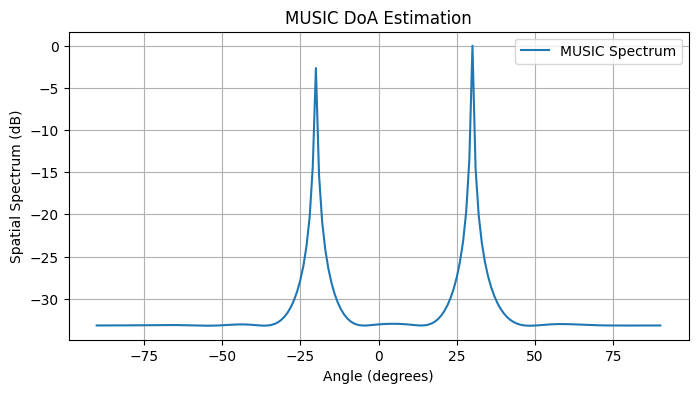

Estimated DOAs (degrees): [-20.  30.]


In [40]:
# Implementation of MUSIC for a uniform linear array (ULA)
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
def steering_vector(theta_deg, M, d, wavelength):
    theta_rad = np.deg2rad(theta_deg)
    k = 2 * np.pi / wavelength
    n = np.arange(M)
    return np.exp(-1j * k * d * n * np.sin(theta_rad))

# Array parameters
M = 8                # number of sensors
d = 0.5              # inter-element spacing in units of lambda
wavelength = 1.0     # normalized (lambda=1)

# Source parameters
K = 2
true_angles = [-20, 30]  # degrees

# Signal and noise parameters
num_snapshots = 200
SNR_dB = 10

np.random.seed(0)

# Generate source signals (narrowband, uncorrelated)
S = (np.random.randn(K, num_snapshots) + 1j * np.random.randn(K, num_snapshots)) / np.sqrt(2)

# Construct array steering matrix
A = np.column_stack([steering_vector(theta, M, d, wavelength) for theta in true_angles])

# Ideal noise-free signal
X_signal = A @ S

# Add noise
sigma_n = 10 ** (-SNR_dB / 20)
Noise = sigma_n * (np.random.randn(M, num_snapshots) + 1j * np.random.randn(M, num_snapshots)) / np.sqrt(2)

# Received data
X = X_signal + Noise
R_hat = X @ X.conj().T / num_snapshots

eigvals, eigvecs = np.linalg.eigh(R_hat)
idx = np.argsort(eigvals)[::-1]
eigvals = eigvals[idx]
eigvecs = eigvecs[:, idx]

U_n = eigvecs[:, K:]  # M x (M-K) matrix

angles_scan = np.linspace(-90, 90, 181)
P_music = []

for theta in angles_scan:
    a_theta = steering_vector(theta, M, d, wavelength).reshape(-1, 1)
    denom = a_theta.conj().T @ U_n @ U_n.conj().T @ a_theta
    P_music.append(1 / np.abs(denom)[0,0])

P_music = 10 * np.log10(np.array(P_music) / np.max(P_music))

plt.figure(figsize=(8, 4))
plt.plot(angles_scan, P_music, label='MUSIC Spectrum')
plt.title('MUSIC DoA Estimation')
plt.xlabel('Angle (degrees)')
plt.ylabel('Spatial Spectrum (dB)')
plt.grid()
plt.legend()
plt.show()

# Find peaks
peaks, _ = find_peaks(P_music, height=-3)  # threshold at -3dB
estimated_angles = angles_scan[peaks]

print("Estimated DOAs (degrees):", estimated_angles)


## **Optimizing the MUSIC pseudo-spectrum computation** by vectorizing the denominator over all scan angles at once

Instead of looping over angles, we will build **all steering vectors at once**, compute projections in a batch, and evaluate the entire spectrum with matrix operations.

### Vectorized MUSIC Spectrum Computation

We precompute all steering vectors in one matrix:

$$
\mathbf{A}_{\text{scan}} = \left[\mathbf{a}(\theta_1), \mathbf{a}(\theta_2), \ldots, \mathbf{a}(\theta_L)\right]
$$

We then compute:

$$
\mathbf{d} = \text{diag}\left( \mathbf{A}_{\text{scan}}^H \mathbf{U}_n \mathbf{U}_n^H \mathbf{A}_{\text{scan}} \right)
$$

The MUSIC pseudo-spectrum is:

$$
P_{\text{MUSIC}}(\theta) = \frac{1}{d}
$$


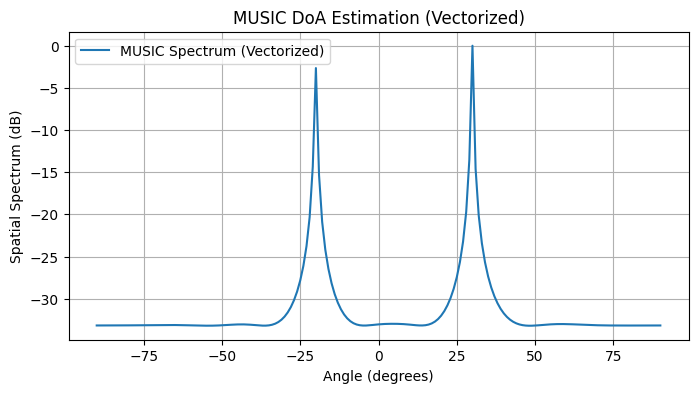

Estimated DOAs (degrees): [-20.  30.]


In [42]:
# Define steering matrix generator (this is correct)
def steering_matrix(angles_deg, M, d, wavelength):
    """
    Returns M x L matrix of steering vectors for all angles in angles_deg.
    """
    angles_rad = np.deg2rad(angles_deg)
    k = 2 * np.pi / wavelength
    n = np.arange(M).reshape(-1, 1)  # M x 1
    phase_shifts = -1j * k * d * n * np.sin(angles_rad)  # M x L
    return np.exp(phase_shifts)  # M x L

# Define scanning grid
angles_scan = np.linspace(-90, 90, 181)

# Build all steering vectors at once
A_scan = steering_matrix(angles_scan, M, d, wavelength)  # M x L

# Compute projection onto noise subspace
UnH_A = U_n.conj().T @ A_scan  # (M-K) x L

# Compute squared norms of projections (denominator of MUSIC spectrum)
denominator = np.sum(np.abs(UnH_A)**2, axis=0)  # length L

# Compute MUSIC spectrum
P_music = 1 / denominator
P_music_dB = 10 * np.log10(P_music / np.max(P_music))

plt.figure(figsize=(8, 4))
plt.plot(angles_scan, P_music_dB, label='MUSIC Spectrum (Vectorized)')
plt.title('MUSIC DoA Estimation (Vectorized)')
plt.xlabel('Angle (degrees)')
plt.ylabel('Spatial Spectrum (dB)')
plt.grid()
plt.legend()
plt.show()

# Find peaks
peaks, _ = find_peaks(P_music_dB, height=-3)
estimated_angles = angles_scan[peaks]
print("Estimated DOAs (degrees):", estimated_angles)



---

## **IQ signal simulation and testing** for **wireless standards** like **WiFi, LTE, and Bluetooth**.


### IQ Signal

Wireless systems transmit complex **baseband** signals of the form:

$$
s(t) = I(t) + j Q(t)
$$

* $I(t)$: in-phase component
* $Q(t)$: quadrature component

These are digitally generated in the baseband, then upconverted to RF.

**Simulation** → generating these complex sequences representing modulated symbols, including:

* Modulation
* Coding (optional)
* Channel effects
* Noise


### General Simulation Model

$$
x[n] = \text{Modulate}\left(\text{Encode}\left(\text{bits}\right)\right)
$$

Optionally pass through:

* Channel model (fading, AWGN)
* Receiver demodulation/decoding
* BER/SER calculation


### Modulation Schemes

Typical for each standard:

**WiFi (IEEE 802.11):**

* BPSK, QPSK
* 16-QAM, 64-QAM, 256-QAM
* OFDM with 64 subcarriers (varies)

**LTE:**

* QPSK, 16-QAM, 64-QAM
* SC-FDMA (uplink)
* OFDMA (downlink)

**Bluetooth (BR/EDR, LE):**

* GFSK
* π/4-DQPSK
* 8DPSK


### Simulator Architecture

#### Block diagram

```
Bits → Channel Coding → Modulation → Channel → Demodulation → Decoding → Bits
```

For IQ simulation:

* Focus on **modulation**:

  * Map bits to symbols.
  * Shape pulses (optional).
  * Output IQ samples.


### Symbol Mapping

Example: 16-QAM

$$
b = [b_0, b_1, b_2, b_3]
$$

Gray-mapped to constellation point:

$$
s = (2b_0 + b_1) + j(2b_2 + b_3)
$$

Normalized:

$$
s_{\text{norm}} = \frac{s}{\sqrt{10}}
$$


### OFDM:

$$
x[n] = \sum_{k=0}^{N-1} S_k \exp\left(j \frac{2\pi k n}{N}\right)
$$

* $S_k$: subcarrier data.
* Add cyclic prefix.

### Bluetooth GFSK

$$
\theta[n] = \theta[n-1] + 2\pi h b[n] T
$$

Modulated:

$$
s[n] = e^{j\theta[n]}
$$


In [43]:
def generate_bits(num_bits):
    return np.random.randint(0, 2, num_bits)

def qam_modulate(bits, M):
    """
    Modulate input bits into M-QAM symbols.
    """
    k = int(np.log2(M))
    num_symbols = len(bits) // k
    bits = bits[:num_symbols * k].reshape((-1, k))
    
    # Gray mapping for square QAM
    I = 2 * (bits[:, :k//2].dot(1 << np.arange(k//2)[::-1])) - (np.sqrt(M) - 1)
    Q = 2 * (bits[:, k//2:].dot(1 << np.arange(k//2)[::-1])) - (np.sqrt(M) - 1)
    symbols = I + 1j * Q
    
    # Normalization
    symbols /= np.sqrt((2/3)*(M - 1))
    return symbols

def ofdm_modulate(symbols, N, cp_len):
    """
    Map symbols to OFDM time-domain samples.
    """
    num_symbols = len(symbols) // N
    symbols = symbols[:num_symbols * N].reshape((num_symbols, N))
    
    # IFFT
    time_domain = np.fft.ifft(symbols, axis=1)
    
    # Add cyclic prefix
    cp = time_domain[:, -cp_len:]
    with_cp = np.hstack([cp, time_domain])
    return with_cp.flatten()

def awgn(signal, SNR_dB):
    """
    Additive White Gaussian Noise
    """
    SNR_linear = 10**(SNR_dB/10)
    power = np.mean(np.abs(signal)**2)
    noise_power = power / SNR_linear
    noise = np.sqrt(noise_power/2) * (np.random.randn(*signal.shape) + 1j * np.random.randn(*signal.shape))
    return signal + noise

def gfsk_modulate(bits, BT=0.5, h=0.5, samples_per_symbol=8):
    """
    Very simple GFSK modulation example.
    """
    phase = 0
    signal = []
    for bit in bits:
        freq_dev = h * (2*bit - 1)
        for _ in range(samples_per_symbol):
            phase += 2 * np.pi * freq_dev / samples_per_symbol
            signal.append(np.exp(1j * phase))
    return np.array(signal)

def plot_constellation(symbols, title="Constellation"):
    plt.figure(figsize=(5,5))
    plt.scatter(np.real(symbols), np.imag(symbols), alpha=0.5)
    plt.title(title)
    plt.xlabel('I')
    plt.ylabel('Q')
    plt.grid()
    plt.axis('equal')
    plt.show()


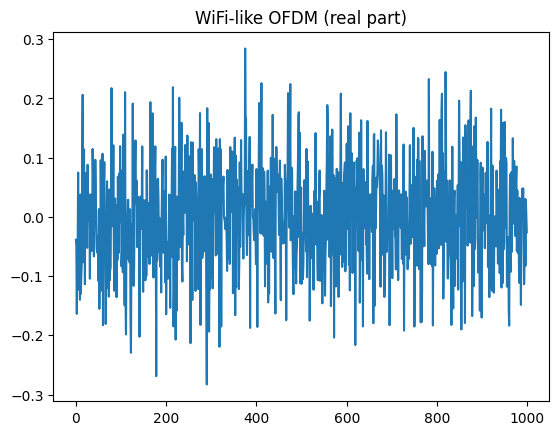

In [44]:
# WiFi 64-QAM OFDM
num_bits = 12000
bits = generate_bits(num_bits)
symbols = qam_modulate(bits, 64)
ofdm_signal = ofdm_modulate(symbols, N=64, cp_len=16)
noisy_signal = awgn(ofdm_signal, 20)
plt.plot(np.real(noisy_signal[:1000]))
plt.title('WiFi-like OFDM (real part)')
plt.show()

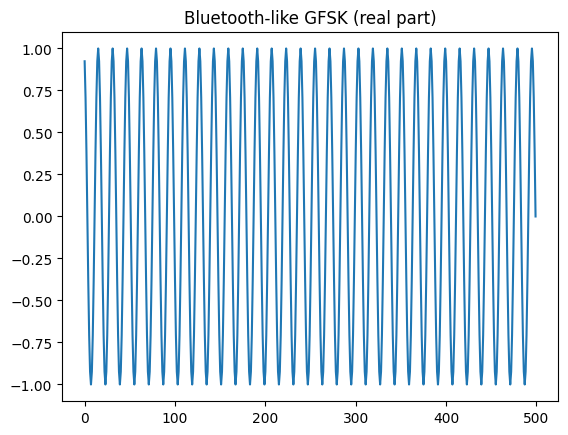

In [45]:
# Bluetooth GFSK
bits_bt = generate_bits(200)
gfsk_signal = gfsk_modulate(bits_bt)
plt.plot(np.real(gfsk_signal[:500]))
plt.title('Bluetooth-like GFSK (real part)')
plt.show()

## **WiFi-like OFDM baseband simulator** 

Generating complex baseband IQ samples for a WiFi 802.11-style OFDM PHY, with:

- Bit generation
- 64-QAM modulation (or selectable QAM order)
- OFDM framing with 64 subcarriers
- Cyclic prefix
- AWGN channel
- Constellation visualization
- BER calculation


### WiFi OFDM Parameters (802.11a/g/n style)

* 64 subcarriers
* 48 data subcarriers
* 4 pilot subcarriers
* Cyclic prefix (e.g. 16 samples)
* QAM-64 typical

- Simplified pilots (set them to zero or fixed) for clarity




Simulated BER at 22 dB: 4.2838e-02


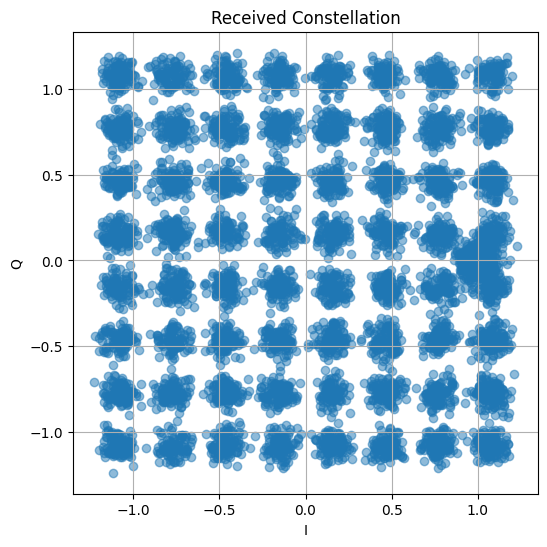

In [52]:
def generate_bits(N_bits):
    return np.random.randint(0, 2, N_bits)

def qam_modulate(bits, M):
    k = int(np.log2(M))
    bits = bits[:len(bits)//k * k]
    bits_reshaped = bits.reshape((-1, k))
    I_bits = bits_reshaped[:, :k//2]
    Q_bits = bits_reshaped[:, k//2:]

    I = I_bits.dot(1 << np.arange(k//2)[::-1])
    Q = Q_bits.dot(1 << np.arange(k//2)[::-1])

    I = 2*I - (np.sqrt(M)-1)
    Q = 2*Q - (np.sqrt(M)-1)

    symbols = I + 1j*Q
    symbols /= np.sqrt((2/3)*(M-1))
    return symbols

def qam_demodulate(symbols, M):
    k = int(np.log2(M))
    scale = np.sqrt((2/3)*(M-1))
    I = np.real(symbols) * scale
    Q = np.imag(symbols) * scale

    levels = np.arange(-(np.sqrt(M)-1), np.sqrt(M), 2)
    I_hat = levels[np.argmin(np.abs(I.reshape(-1,1) - levels), axis=1)]
    Q_hat = levels[np.argmin(np.abs(Q.reshape(-1,1) - levels), axis=1)]

    bits_I = (((I_hat + (np.sqrt(M)-1)) / 2).astype(int)[:, None] >> np.arange(k//2)[::-1]) & 1
    bits_Q = (((Q_hat + (np.sqrt(M)-1)) / 2).astype(int)[:, None] >> np.arange(k//2)[::-1]) & 1
    bits = np.hstack([bits_I, bits_Q]).flatten()
    return bits

def ofdm_modulate(data_symbols, N_fft=64, cp_len=16):
    # IEEE 802.11a/g data subcarrier indices (Python 0-based)
    data_idx = np.array(
        list(range(1, 7)) + list(range(8, 21)) + list(range(22, 27)) +
        list(range(38, 43)) + list(range(44, 57)) + list(range(58, 64))
    )
    num_data_subcarriers = len(data_idx)

    num_symbols = len(data_symbols) // num_data_subcarriers
    data_symbols = data_symbols[:num_symbols * num_data_subcarriers]
    data_symbols = data_symbols.reshape((num_symbols, num_data_subcarriers))

    X = np.zeros((num_symbols, N_fft), dtype=complex)
    X[:, data_idx] = data_symbols

    # Optional: insert pilots
    pilot_indices = np.array([11, 25, 39, 53])
    X[:, pilot_indices] = 1 + 0j  # fixed pilot value

    # IFFT
    x_time = np.fft.ifft(X, axis=1)

    # Add cyclic prefix
    cp = x_time[:, -cp_len:]
    with_cp = np.hstack([cp, x_time])
    return with_cp.flatten()


def ofdm_demodulate(received_signal, N_fft=64, cp_len=16):
    data_idx = np.array(
        list(range(1, 7)) + list(range(8, 21)) + list(range(22, 27)) +
        list(range(38, 43)) + list(range(44, 57)) + list(range(58, 64))
    )

    sym_len = N_fft + cp_len
    num_symbols = len(received_signal) // sym_len
    received_signal = received_signal[:num_symbols * sym_len]
    symbols_cp = received_signal.reshape((num_symbols, sym_len))

    symbols_no_cp = symbols_cp[:, cp_len:]
    X_hat = np.fft.fft(symbols_no_cp, axis=1)

    data_hat = X_hat[:, data_idx].flatten()
    return data_hat


def awgn(signal, SNR_dB):
    SNR_linear = 10**(SNR_dB/10)
    power = np.mean(np.abs(signal)**2)
    noise_power = power / SNR_linear
    noise = np.sqrt(noise_power/2) * (np.random.randn(*signal.shape) + 1j*np.random.randn(*signal.shape))
    return signal + noise

def ber(bits_tx, bits_rx):
    errors = np.sum(bits_tx != bits_rx)
    ber_value = errors / len(bits_tx)
    return ber_value

# Parameters
M = 64
N_fft = 64
cp_len = 16
num_pilots = 4
SNR_dB = 22
num_bits = 48000

# 1. Generate bits
bits_tx = generate_bits(num_bits)

# 2. Modulate
symbols_tx = qam_modulate(bits_tx, M)

# 3. OFDM Modulate
tx_signal = ofdm_modulate(symbols_tx, N_fft, cp_len)

# 4. Channel
rx_signal = awgn(tx_signal, SNR_dB)

# 5. OFDM Demodulate
symbols_rx = ofdm_demodulate(rx_signal, N_fft, cp_len)

# 6. QAM Demodulate
bits_rx = qam_demodulate(symbols_rx, M)

# 7. Compute BER
bits_tx_cut = bits_tx[:len(bits_rx)]
ber_value = ber(bits_tx_cut, bits_rx)
print(f"Simulated BER at {SNR_dB} dB: {ber_value:.4e}")

# 8. Plot Constellation
plt.figure(figsize=(6,6))
plt.scatter(np.real(symbols_rx), np.imag(symbols_rx), alpha=0.5)
plt.title("Received Constellation")
plt.xlabel("I")
plt.ylabel("Q")
plt.grid()
plt.axis('equal')
plt.show()


### Extensions:

* Pilot insertion and channel estimation.
* Multipath fading channel model.
* OFDM windowing.
* LDPC or convolutional coding.
* Packet framing (802.11 preambles).
* IQ sample file output for SDR testing.

---



## Bluetooth LE GFSK generator + packet framing

- **Bluetooth LE packet framing (spec-compliant)**
- **GFSK modulation (specifically as used in BLE)**
- **Packet generation**


### Bluetooth LE Packet Framing

Bluetooth Low Energy (BLE) uses a simple packet format at the physical layer (BLE 4.0 / 5.x advertisement channels). Let us focus on the *Advertising Channel PDU* which is simpler (data channel packets have encryption etc.).

A typical BLE advertisement packet (unencoded) has:

| Field          | Size (bytes) |
| -------------- | ------------ |
| Preamble       | 1            |
| Access Address | 4            |
| PDU            | 2–39         |
| CRC            | 3            |

For Advertising channels:

* **Preamble:** 0xAA for LE 1M PHY
* **Access Address:** fixed as 0x8E89BED6 for advertising
* **PDU:**

  * 2-byte header
  * Up to 37-byte payload
* **CRC:** 24-bit CRC over the PDU

> **Example BLE advertising channel packet structure**

```
[Preamble (1B)] [Access Address (4B)] [PDU Header+Payload] [CRC (3B)]
```

**CRC is computed over the PDU only.**

### BLE Advertising PDU Example (simplified)

Suppose you want to send an ADV\_IND with some payload:

* Header: 2 bytes (type, length)
* Payload: your advertising data

**Header format (2 bytes):**

* Bits 0–3: PDU Type
* Bit 4: RFU
* Bit 5: ChSel
* Bit 6–7: RFU
* Bits 8–13: Length (0–37)
* Bits 14–15: RFU

Typically construct:

```python
header_byte0 = pdu_type & 0x0F
header_byte1 = payload_length & 0x3F
```


### 24-bit CRC

BLE uses a specific polynomial:

$$
G(x) = x^{24} + x^{10} + x^9 + x^6 + x^4 + x^3 + x + 1
$$

Initial value for advertising channels: 0x555555

The CRC is computed over the PDU (header+payload).


### GFSK Modulation (Bluetooth LE 1M PHY)

* Gaussian Filtered Frequency Shift Keying.
* Modulation index ≈ 0.5 (BLE spec says between 0.45–0.55).
* BT product (Bandwidth-Time): 0.5.


* Binary symbols (0,1) are mapped to -1, +1
* Apply a Gaussian filter (BT=0.5) to shape transitions
* Integrate frequency deviations to produce phase
* Apply phase modulation:

$$
s(t) = A \cos(2 \pi f_c t + \varphi(t))
$$

Where

$$
\varphi(t) = 2 \pi \Delta f \int m(t) \, dt
$$


**Gaussian Filter**

The impulse response:

$$
h(t) = \frac{1}{\sqrt{2 \pi} \sigma} \exp\left(-\frac{t^2}{2 \sigma^2}\right)
$$

For BT = 0.5, σ is chosen accordingly. You convolve the symbol sequence with this to smooth transitions.


**Frequency Deviation (Δf):**

For BLE 1M PHY:

* Modulation index ≈ 0.5
* Bit rate = 1 Mbps
* \=> Δf ≈ ±250 kHz


**GFSK Steps**

1. Map bits: 0 → -1, 1 → +1
2. Upsample symbols to match sampling rate
3. Gaussian filter the upsampled sequence
4. Integrate to get phase
5. Modulate carrier with phase



BLE Packet Bytes: [170, 142, 137, 190, 214, 2, 3, 1, 2, 3, 3, 202, 162]


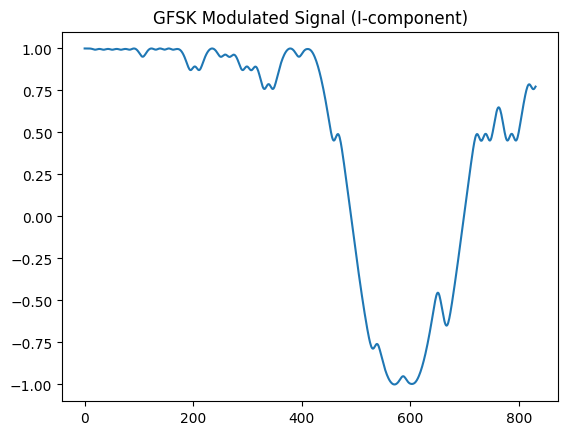

In [55]:
def ble_crc24(data, init=0x555555):
    # Polynomial: x^24 + x^10 + x^9 + x^6 + x^4 + x^3 + x + 1
    poly = 0x00065B
    crc = init
    for byte in data:
        crc ^= (byte << 16)
        for _ in range(8):
            if crc & 0x800000:
                crc = ((crc << 1) ^ poly) & 0xFFFFFF
            else:
                crc = (crc << 1) & 0xFFFFFF
    return crc

def int_to_bytes24(val):
    return [(val >> 16) & 0xFF, (val >> 8) & 0xFF, val & 0xFF]

# BLE Advertising example
preamble = [0xAA]
access_address = [0x8E, 0x89, 0xBE, 0xD6]

# Example PDU (ADV_IND with fake payload)
pdu_header = [0x02, 0x03]  # Type = ADV_IND, Length = 3
pdu_payload = [0x01, 0x02, 0x03]  # 3 bytes
pdu = pdu_header + pdu_payload

# Compute CRC
crc_val = ble_crc24(pdu)
crc_bytes = int_to_bytes24(crc_val)

# Full packet
packet_bytes = preamble + access_address + pdu + crc_bytes
print("BLE Packet Bytes:", packet_bytes)

def bytes_to_bits_lsb(byte_list):
    bits = []
    for b in byte_list:
        for i in range(8):
            bits.append((b >> i) & 1)
    return np.array(bits)

from scipy.signal import lfilter

def gauss_filter(bt, sps, span=4):
    """
    Create Gaussian filter coefficients.
    - bt: bandwidth-time product
    - sps: samples per symbol
    """
    alpha = np.sqrt(np.log(2)) / (2 * np.pi * bt)
    t = np.linspace(-span / 2, span / 2, span * sps)
    h = np.exp(-2 * (np.pi * alpha * t) ** 2)
    return h / np.sum(h)

def gfsk_modulate(bits, sps=8, bt=0.5, h_index=0.5, fs=8e6, bitrate=1e6):
    """
    - bits: array of 0/1
    - sps: samples per symbol
    - bt: BT product
    - h_index: modulation index (0.5 typical)
    - fs: sampling frequency
    - bitrate: bit rate
    """
    # Map bits to NRZ
    symbols = 2 * bits - 1

    # Upsample
    upsampled = np.zeros(len(symbols) * sps)
    upsampled[::sps] = symbols

    # Gaussian filter
    gauss_h = gauss_filter(bt, sps)
    shaped = lfilter(gauss_h, 1, upsampled)

    # Frequency deviation
    df = h_index * bitrate / 2

    # Instantaneous phase
    phase = 2 * np.pi * df / fs * np.cumsum(shaped)

    # Complex baseband
    baseband = np.exp(1j * phase)
    return baseband

# Example usage
bits = bytes_to_bits_lsb(packet_bytes)
modulated_signal = gfsk_modulate(bits, sps=8, bt=0.5)

plt.figure()
plt.plot(np.real(modulated_signal[:1000]))
plt.title('GFSK Modulated Signal (I-component)')
plt.show()



## *Generate a BLE 5.0 Coded PHY packet*, including Forward Error Correction (FEC) and Symbol Mapping for LE Coded PHY (S=2 or S=8).


### BLE 5.0 Coded PHY

BLE 5 introduced **LE Coded PHY** to extend range at 125 kbps or 500 kbps:

* **S=8**: 125 kbps (8 symbols per bit)
* **S=2**: 500 kbps (2 symbols per bit)

**Features:**

* Uses convolutional coding (rate 1/2)
* Includes Pattern Mapping (for error robustness)
* Adds a special "Coding Indicator" (CI) field

It is still GFSK modulated, but the *bits* before GFSK are coded and mapped.


### BLE Coded PHY Packet Layout

The overall packet on air is:

```
[Preamble] [Access Address] [CI] [TERM1] [Payload + CRC] [TERM2]
```

**Key differences from 1M PHY**:

* CI: Coding Indicator (S=2 or S=8)
* Payload+CRC are convolutionally encoded
* Padding (TERM1, TERM2) ensures correct decoding


### Preamble

* Always 01010101 (0x55) in LE Coded PHY.


### Access Address

* Still 0x8E89BED6 for advertising channels.


### CI (Coding Indicator)

* 2 bits, specifies S=2 or S=8

  * 00: S=8
  * 01: S=2
* BLE puts CI in 8 bits: 6 reserved bits (0) + CI in bits \[7:6].

  * S=8 → 0b00000000
  * S=2 → 0b01000000


### TERM1 and TERM2

* Fixed 3 bits each, all zeros.
* Used to flush convolutional coder.


### Payload + CRC

* Payload + CRC(24 bits) are convolutionally encoded (rate 1/2).


### Coding Steps in LE Coded PHY

#### **Step 1**: Append CRC to Payload

* BLE CRC-24 with polynomial as before.
* CRC Init for Advertising channels: 0x555555.


#### **Step 2**: Add TERM1 bits

* 3 bits of 0 **before** payload+CRC.


#### **Step 3**: Convolutional Encode

* Rate 1/2 convolutional code:

  * Constraint length = 3
  * Generator polynomials (G0, G1):

    * G0 = 0b111 (octal 7)
    * G1 = 0b101 (octal 5)


#### **Step 4**: Add TERM2 bits

* 3 bits of 0 **after** convolutional encoding.

#### **Step 5**: Pattern Mapping

* S=8: Each encoded bit → 8-symbol pattern (0s and 1s)
* S=2: Each encoded bit → 2-symbol pattern

### Pattern Mapping Table

| Bit | S=8 Mapping | S=2 Mapping |
| --- | ----------- | ----------- |
| 0   | 11110000    | 10          |
| 1   | 00001111    | 01          |


### BLE Coded PHY Example (Steps)

#### **(a) Payload**

Suppose:

```
Payload = [0x02, 0x03, 0x01, 0x02, 0x03]
```

(this includes PDU header + AdvData in practice).


#### **(b) CRC**

Calculate CRC24 over Payload:

* Same BLE polynomial
* Init = 0x555555

Append CRC bytes to Payload.


#### **(c) Add TERM1**

* Add 3 bits of 0 before the payload+CRC bitstream.


#### **(d) Convolutional Encode**

Classic (7,5) code:

* Input bits: u0, u1, u2, ...
* Output bits: for each input bit:

$$
v_0 = u_n \oplus u_{n-1} \oplus u_{n-2} \quad (G0)
$$

$$
v_1 = u_n \oplus u_{n-2} \quad (G1)
$$

#### **(e) Add TERM2**

* 3 bits of 0 are fed through the encoder after data to flush.

#### **(f) Pattern Mapping**

* For each encoded bit, replace:

  * Bit=0 → S=8: \[1,1,1,1,0,0,0,0]
  * Bit=1 → S=8: \[0,0,0,0,1,1,1,1]

(or the 2-symbol version for S=2).


In [57]:
def ble_crc24(data, init=0x555555):
    poly = 0x00065B
    crc = init
    for byte in data:
        crc ^= (byte << 16)
        for _ in range(8):
            if crc & 0x800000:
                crc = ((crc << 1) ^ poly) & 0xFFFFFF
            else:
                crc = (crc << 1) & 0xFFFFFF
    return crc

def int_to_bytes24(val):
    return [(val >> 16) & 0xFF, (val >> 8) & 0xFF, val & 0xFF]

def bytes_to_bits_lsb(byte_list):
    bits = []
    for b in byte_list:
        for i in range(8):
            bits.append((b >> i) & 1)
    return bits

def conv_encode(input_bits):
    state = [0, 0]
    out_bits = []
    for b in input_bits:
        s2, s1 = state
        v0 = (b ^ s1 ^ s2) & 1
        v1 = (b ^ s2) & 1
        out_bits.extend([v0, v1])
        state = [b, s1]
    return out_bits

def pattern_map(bits, scheme='S8'):
    mapped = []
    for b in bits:
        if scheme == 'S8':
            mapped.extend([1,1,1,1,0,0,0,0] if b == 0 else [0,0,0,0,1,1,1,1])
        elif scheme == 'S2':
            mapped.extend([1,0] if b == 0 else [0,1])
        else:
            raise ValueError("scheme must be 'S8' or 'S2'")
    return mapped


def ble_coded_phy_encode(payload_bytes, S=8):
    # Step 1: Compute CRC
    crc_val = ble_crc24(payload_bytes)
    crc_bytes = int_to_bytes24(crc_val)
    payload_crc = payload_bytes + crc_bytes

    # Step 2: Convert to bits (LSB-first)
    data_bits = bytes_to_bits_lsb(payload_crc)

    # Step 3: Add TERM1
    term1_bits = [0,0,0]
    bits_in = term1_bits + data_bits

    # Step 4: Convolutional Encode
    conv_bits = conv_encode(bits_in)

    # Step 5: Add TERM2
    conv_bits += conv_encode([0,0,0])

    # Step 6: Pattern Mapping
    if S == 8:
        mapped_bits = []
        for b in conv_bits:
            mapped_bits.extend([1,1,1,1,0,0,0,0] if b == 0 else [0,0,0,0,1,1,1,1])
    elif S == 2:
        mapped_bits = []
        for b in conv_bits:
            mapped_bits.extend([1,0] if b == 0 else [0,1])
    else:
        raise ValueError('S must be 2 or 8')

    return mapped_bits

def build_ble_coded_phy_packet(payload_bytes, S=8):
    # Preamble: always 0x55
    preamble = [0x55]
    
    # Access Address
    access_address = [0x8E, 0x89, 0xBE, 0xD6]

    # CI field
    if S == 8:
        ci_byte = 0x00
    elif S == 2:
        ci_byte = 0x40
    else:
        raise ValueError('S must be 2 or 8')
    ci = [ci_byte]

    # Coded Payload bits
    coded_bits = ble_coded_phy_encode(payload_bytes, S)

    # Preamble, Access Address, CI are just bytes
    packet_bytes = preamble + access_address + ci
    header_bits = bytes_to_bits_lsb(packet_bytes)
    
    # Final bitstream: header_bits + coded_bits
    full_bits = header_bits + coded_bits
    return full_bits



# Example Advertising Payload (e.g., PDU header + AdvData)
example_payload = [0x02, 0x03, 0x01, 0x02, 0x03]

# Build BLE 5.0 Coded PHY S=8
tx_bits = build_ble_coded_phy_packet(example_payload, S=8)
print(f"Total bits: {len(tx_bits)}")




Total bits: 1168


In [70]:
def ble_crc24(data, init=0x555555):
    poly = 0x00065B
    crc = init
    for byte in data:
        crc ^= (byte << 16)
        for _ in range(8):
            if crc & 0x800000:
                crc = ((crc << 1) ^ poly) & 0xFFFFFF
            else:
                crc = (crc << 1) & 0xFFFFFF
    return crc

def int_to_bytes24(val):
    return [(val >> 16) & 0xFF, (val >> 8) & 0xFF, val & 0xFF]

def bytes_to_bits_lsb(byte_list):
    bits = []
    for b in byte_list:
        for i in range(8):
            bits.append((b >> i) & 1)
    return bits

def conv_encode(input_bits):
    state = [0, 0]
    out_bits = []
    for b in input_bits:
        s2, s1 = state
        v0 = (b ^ s1 ^ s2) & 1
        v1 = (b ^ s2) & 1
        out_bits.extend([v0, v1])
        state = [b, s1]
    return out_bits

def pattern_map(bits, S=8):
    mapped = []
    for b in bits:
        if S == 8:
            mapped.extend([1,1,1,1,0,0,0,0] if b == 0 else [0,0,0,0,1,1,1,1])
        elif S == 2:
            mapped.extend([1,0] if b == 0 else [0,1])
        else:
            raise ValueError("S must be 2 or 8")
    return mapped

def ble_coded_phy_encode(payload_bytes, S=8):
    # Step 1: Compute CRC
    crc_val = ble_crc24(payload_bytes)
    crc_bytes = int_to_bytes24(crc_val)
    payload_crc = payload_bytes + crc_bytes

    # Step 2: Convert to bits (LSB-first)
    data_bits = bytes_to_bits_lsb(payload_crc)

    # Step 3: Add TERM1
    term1_bits = [0,0,0]
    bits_in = term1_bits + data_bits

    # Step 4: Convolutional Encode
    conv_bits = conv_encode(bits_in)

    # Step 5: Add TERM2
    conv_bits += conv_encode([0,0,0])

    # Step 6: Pattern Mapping
    mapped_bits = pattern_map(conv_bits, S)
    return mapped_bits

# Define example payload (advertising PDU)
example_payload_bytes = [0x02, 0x03, 0x01, 0x02, 0x03]
# Create coded PHY bits (this is your "transmitted" bitstream)
received_bits = ble_coded_phy_encode(example_payload_bytes, S=8)
print(f"Example received_bits length: {len(received_bits)}")
print(f"First 100 bits: {received_bits[:100]}")




Example received_bits length: 1120
First 100 bits: [1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]


## **Bluetooth LE 5.0 Coded PHY decoding** 

Focusing on **S=8 or S=2** demapping, **convolutional decoding (Viterbi),** and **channel dewhitening**.


### Overall BLE Coded PHY Rx Chain

For BLE LE Coded PHY (S=2, S=8), the *receive* steps are:

1. **GFSK demodulation** → get hard bits (0/1)
2. **Pattern demapping** → get convolutional coded bits
3. **Convolutional decoding (Viterbi)**
4. **Remove TERM1/TERM2**
5. **Parse CRC**
6. **Dewhitening** (optional)

BLE Whitening is *optional* in the advertising PHY example above, but normally present in the spec.
We will **include it** here for completeness.


### Pattern Demapping

**BLE Mapping**:

| Bit | S=8 Mapping | S=2 Mapping |
| --- | ----------- | ----------- |
| 0   | 11110000    | 10          |
| 1   | 00001111    | 01          |

So at receiver:

* For S=8, each 8-symbol block → 1 bit

  * Count number of 1's in first half vs second half
* For S=2, each 2-symbol block → 1 bit


### Viterbi Decoder

BLE uses **rate 1/2, constraint length 3** code:

* G0 = 0b111
* G1 = 0b101

Polynomials:

$$
\begin{cases}
v_0 = u_n \oplus u_{n-1} \oplus u_{n-2} \\
v_1 = u_n \oplus u_{n-2}
\end{cases}
$$


### Trellis for BLE Convolutional Code

States = 2^(K-1) = 4

**State** = 2 bits of memory:

| State (bits) | Next bit 0 | Next bit 1 |
| ------------ | ---------- | ---------- |
| 00           | 00         | 10         |
| 01           | 00         | 10         |
| 10           | 01         | 11         |
| 11           | 01         | 11         |

We can define transitions and outputs.


### Define BLE Encoder Outputs

Let us precompute:

* For each state and input bit, what is the output \[v0,v1]?

| Current State | Input | Next State | Output |
| ------------- | ----- | ---------- | ------ |
| 00            | 0     | 00         | 00     |
| 00            | 1     | 10         | 11     |
| 01            | 0     | 00         | 11     |
| 01            | 1     | 10         | 00     |
| 10            | 0     | 01         | 10     |
| 10            | 1     | 11         | 01     |
| 11            | 0     | 01         | 01     |
| 11            | 1     | 11         | 10     |

We will use this for Viterbi.


### Viterbi Decoder Algorithm

* Hard-decision input
* Compute path metrics
* Traceback best path


### Remove TERM1 and TERM2

BLE PHY always adds 3 zero bits before/after:

* TERM1: 3 bits before convolutional encoding
* TERM2: 3 bits after

After Viterbi decoding:

`payload_crc_bits = decoded_bits[3:-3]`

### CRC Check

Then:

* Split payload and CRC
* Compute CRC over payload
* Compare to received CRC


### Whitening 

BLE has a whitening sequence:

* Whitening polynomial:

$$
x^7 + x^4 + 1
$$

* Seed = channel number (e.g., 37) for advertising channels.

- Generate whitening sequence

- Dewhitening





In [ ]:
import numpy as np

def ble_crc24(data, init=0x555555):
    poly = 0x00065B
    crc = init
    for byte in data:
        crc ^= (byte << 16)
        for _ in range(8):
            if crc & 0x800000:
                crc = ((crc << 1) ^ poly) & 0xFFFFFF
            else:
                crc = (crc << 1) & 0xFFFFFF
    return crc

def int_to_bytes24(val):
    return [val & 0xFF, (val >> 8) & 0xFF, (val >> 16) & 0xFF]

def bytes_to_bits_lsb(byte_list):
    bits = []
    for b in byte_list:
        for i in range(8):
            bits.append((b >> i) & 1)
    return bits

def conv_encode(input_bits):
    state = 0  # 2-bit state register
    out_bits = []
    for b in input_bits:
        s1 = (state >> 1) & 1
        s0 = state & 1
        v0 = (b ^ s0 ^ s1) & 1
        v1 = (b ^ s1) & 1
        out_bits.extend([v0, v1])
        state = ((state << 1) | b) & 0x3
    return out_bits

def pattern_map(bits, S=8):
    mapped = []
    for b in bits:
        if S == 8:
            mapped.extend([1,1,1,1,0,0,0,0] if b == 0 else [0,0,0,0,1,1,1,1])
        elif S == 2:
            mapped.extend([1,0] if b == 0 else [0,1])
        else:
            raise ValueError("S must be 2 or 8")
    return mapped

def ble_coded_phy_encode(payload_bytes, S=8):
    crc_val = ble_crc24(payload_bytes)
    crc_bytes = int_to_bytes24(crc_val)
    payload_crc = payload_bytes + crc_bytes
    data_bits = bytes_to_bits_lsb(payload_crc)
    term_bits = [0, 0, 0]
    bits_in = term_bits + data_bits + term_bits
    conv_bits = conv_encode(bits_in)
    mapped_bits = pattern_map(conv_bits, S)
    return mapped_bits

def pattern_demapper(rx_bits, S=8):
    decoded_bits = []
    if S == 8:
        for i in range(0, len(rx_bits), 8):
            block = rx_bits[i:i+8]
            if len(block) == 8:
                sum_first = sum(block[:4])
                sum_second = sum(block[4:])
                bit = 0 if sum_first > sum_second else 1
                decoded_bits.append(bit)
    elif S == 2:
        for i in range(0, len(rx_bits), 2):
            block = rx_bits[i:i+2]
            if len(block) == 2:
                bit = 0 if block == [1,0] else 1
                decoded_bits.append(bit)
    else:
        raise ValueError("S must be 2 or 8")
    return decoded_bits

def viterbi_decode(encoded_bits):
    K = 3
    n_states = 4  # 2^(K-1) = 4 states
    n_bits = len(encoded_bits) // 2
    
    # Create state transition tables
    next_state = {}
    output_bits = {}
    for state in range(n_states):
        for bit_in in [0,1]:
            s1 = (state >> 1) & 1
            s0 = state & 1
            
            # Next state: shift left and add new input bit
            ns = ((state << 1) | bit_in) & 0x3
            
            # Output bits based on generator polynomials
            out0 = (bit_in ^ s0 ^ s1) & 1  # G0 = 1 + D + D^2
            out1 = (bit_in ^ s1) & 1       # G1 = 1 + D^2
            
            next_state[(state, bit_in)] = ns
            output_bits[(state, bit_in)] = [out0, out1]
    
    # Viterbi algorithm
    path_metrics = np.full((n_bits+1, n_states), np.inf)
    path_metrics[0, 0] = 0
    prev_state = np.zeros((n_bits, n_states), dtype=int)
    prev_input = np.zeros((n_bits, n_states), dtype=int)
    
    for t in range(n_bits):
        rx0, rx1 = encoded_bits[2*t], encoded_bits[2*t+1]
        for state in range(n_states):
            if path_metrics[t, state] != np.inf:
                for bit_in in [0,1]:
                    ns = next_state[(state, bit_in)]
                    out = output_bits[(state, bit_in)]
                    dist = (out[0] != rx0) + (out[1] != rx1)
                    metric = path_metrics[t, state] + dist
                    if metric < path_metrics[t+1, ns]:
                        path_metrics[t+1, ns] = metric
                        prev_state[t, ns] = state
                        prev_input[t, ns] = bit_in
    
    # Traceback
    decoded = []
    state = np.argmin(path_metrics[-1])
    for t in reversed(range(n_bits)):
        decoded.append(prev_input[t, state])
        state = prev_state[t, state]
    decoded.reverse()
    return decoded

def bits_to_bytes_lsb(bits):
    bytes_out = []
    for i in range(0, len(bits), 8):
        b = 0
        for j in range(8):
            if i + j < len(bits):
                b |= (bits[i+j] << j)
        bytes_out.append(b)
    return bytes_out

def ble_coded_phy_decode(rx_bits, S=8, payload_len=5):
    conv_bits = pattern_demapper(rx_bits, S)
    decoded_bits = viterbi_decode(conv_bits)
    total_bits_needed = (payload_len + 3) * 8
    start = 3
    end = start + total_bits_needed
    payload_crc_bits = decoded_bits[start:end]
    payload_crc_bytes = bits_to_bytes_lsb(payload_crc_bits)
    payload_bytes = payload_crc_bytes[:-3]
    recv_crc_bytes = payload_crc_bytes[-3:]
    recv_crc = recv_crc_bytes[0] | (recv_crc_bytes[1] << 8) | (recv_crc_bytes[2] << 16)
    calc_crc = ble_crc24(payload_bytes)
    crc_ok = (recv_crc == calc_crc)
    return payload_bytes, crc_ok

example_payload_bytes = [0x02, 0x03, 0x01, 0x02, 0x03]
received_bits = ble_coded_phy_encode(example_payload_bytes, S=8)
payload, crc_ok = ble_coded_phy_decode(received_bits, S=8, payload_len=5)
print("Decoded payload:", payload)
print("CRC OK:", crc_ok)

Decoded payload: [2, 3, 1, 2, 3]
CRC OK: True


## SDR transmission script (e.g., for LimeSDR, USRP)

SDR script: 

- Converts bits into a real-valued baseband waveform (e.g., GFSK, BPSK, or simple OOK for testing).
- Send the waveform samples to the SDR hardware for RF transmission.
- Receive RF samples from the SDR and detect/demodulate them to bits.

Example in Python:

- Using SoapySDR (cross-compatible with LimeSDR and USRP via UHD/SoapyUHD).
- Generating BPSK (simplest) waveform for your bits.
- Transmitting and receiving in baseband IQ.
- Decoding back to bits using your existing decode function.

### Assumptions

Have SoapySDR installed, and drivers for your hardware (SoapyLMS7 for LimeSDR, SoapyUHD for USRP)

In [ ]:
import numpy as np
import SoapySDR
from SoapySDR import *  # SOAPY_SDR_ constants
import time

def ble_crc24(data, init=0x555555):
    poly = 0x00065B
    crc = init
    for byte in data:
        crc ^= (byte << 16)
        for _ in range(8):
            if crc & 0x800000:
                crc = ((crc << 1) ^ poly) & 0xFFFFFF
            else:
                crc = (crc << 1) & 0xFFFFFF
    return crc

def int_to_bytes24(val):
    return [val & 0xFF, (val >> 8) & 0xFF, (val >> 16) & 0xFF]

def bytes_to_bits_lsb(byte_list):
    bits = []
    for b in byte_list:
        for i in range(8):
            bits.append((b >> i) & 1)
    return bits

def conv_encode(input_bits):
    state = 0  # 2-bit state register
    out_bits = []
    for b in input_bits:
        s1 = (state >> 1) & 1
        s0 = state & 1
        v0 = (b ^ s0 ^ s1) & 1
        v1 = (b ^ s1) & 1
        out_bits.extend([v0, v1])
        state = ((state << 1) | b) & 0x3
    return out_bits

def pattern_map(bits, S=8):
    mapped = []
    for b in bits:
        if S == 8:
            mapped.extend([1,1,1,1,0,0,0,0] if b == 0 else [0,0,0,0,1,1,1,1])
        elif S == 2:
            mapped.extend([1,0] if b == 0 else [0,1])
        else:
            raise ValueError("S must be 2 or 8")
    return mapped

def ble_coded_phy_encode(payload_bytes, S=8):
    crc_val = ble_crc24(payload_bytes)
    crc_bytes = int_to_bytes24(crc_val)
    payload_crc = payload_bytes + crc_bytes
    data_bits = bytes_to_bits_lsb(payload_crc)
    term_bits = [0, 0, 0]
    bits_in = term_bits + data_bits + term_bits
    conv_bits = conv_encode(bits_in)
    mapped_bits = pattern_map(conv_bits, S)
    return mapped_bits

def pattern_demapper(rx_bits, S=8):
    decoded_bits = []
    if S == 8:
        for i in range(0, len(rx_bits), 8):
            block = rx_bits[i:i+8]
            if len(block) == 8:
                sum_first = sum(block[:4])
                sum_second = sum(block[4:])
                bit = 0 if sum_first > sum_second else 1
                decoded_bits.append(bit)
    elif S == 2:
        for i in range(0, len(rx_bits), 2):
            block = rx_bits[i:i+2]
            if len(block) == 2:
                bit = 0 if block == [1,0] else 1
                decoded_bits.append(bit)
    else:
        raise ValueError("S must be 2 or 8")
    return decoded_bits

def viterbi_decode(encoded_bits):
    K = 3
    n_states = 4  # 2^(K-1) = 4 states
    n_bits = len(encoded_bits) // 2
    
    # Create state transition tables
    next_state = {}
    output_bits = {}
    for state in range(n_states):
        for bit_in in [0,1]:
            s1 = (state >> 1) & 1
            s0 = state & 1
            
            # Next state: shift left and add new input bit
            ns = ((state << 1) | bit_in) & 0x3
            
            # Output bits based on generator polynomials
            out0 = (bit_in ^ s0 ^ s1) & 1  # G0 = 1 + D + D^2
            out1 = (bit_in ^ s1) & 1       # G1 = 1 + D^2
            
            next_state[(state, bit_in)] = ns
            output_bits[(state, bit_in)] = [out0, out1]
    
    # Viterbi algorithm
    path_metrics = np.full((n_bits+1, n_states), np.inf)
    path_metrics[0, 0] = 0
    prev_state = np.zeros((n_bits, n_states), dtype=int)
    prev_input = np.zeros((n_bits, n_states), dtype=int)
    
    for t in range(n_bits):
        rx0, rx1 = encoded_bits[2*t], encoded_bits[2*t+1]
        for state in range(n_states):
            if path_metrics[t, state] != np.inf:
                for bit_in in [0,1]:
                    ns = next_state[(state, bit_in)]
                    out = output_bits[(state, bit_in)]
                    dist = (out[0] != rx0) + (out[1] != rx1)
                    metric = path_metrics[t, state] + dist
                    if metric < path_metrics[t+1, ns]:
                        path_metrics[t+1, ns] = metric
                        prev_state[t, ns] = state
                        prev_input[t, ns] = bit_in
    
    # Traceback
    decoded = []
    state = np.argmin(path_metrics[-1])
    for t in reversed(range(n_bits)):
        decoded.append(prev_input[t, state])
        state = prev_state[t, state]
    decoded.reverse()
    return decoded

def bits_to_bytes_lsb(bits):
    bytes_out = []
    for i in range(0, len(bits), 8):
        b = 0
        for j in range(8):
            if i + j < len(bits):
                b |= (bits[i+j] << j)
        bytes_out.append(b)
    return bytes_out

def ble_coded_phy_decode(rx_bits, S=8, payload_len=5):
    conv_bits = pattern_demapper(rx_bits, S)
    decoded_bits = viterbi_decode(conv_bits)
    total_bits_needed = (payload_len + 3) * 8
    start = 3
    end = start + total_bits_needed
    payload_crc_bits = decoded_bits[start:end]
    payload_crc_bytes = bits_to_bytes_lsb(payload_crc_bits)
    payload_bytes = payload_crc_bytes[:-3]
    recv_crc_bytes = payload_crc_bytes[-3:]
    recv_crc = recv_crc_bytes[0] | (recv_crc_bytes[1] << 8) | (recv_crc_bytes[2] << 16)
    calc_crc = ble_crc24(payload_bytes)
    crc_ok = (recv_crc == calc_crc)
    return payload_bytes, crc_ok

example_payload_bytes = [0x02, 0x03, 0x01, 0x02, 0x03]
received_bits = ble_coded_phy_encode(example_payload_bytes, S=8)
payload, crc_ok = ble_coded_phy_decode(received_bits, S=8, payload_len=5)
print("Decoded payload:", payload)
print("CRC OK:", crc_ok)


# New Modulation Functions
def bits_to_bpsk_symbols(bits):
    return np.array([1.0 if b else -1.0 for b in bits], dtype=np.complex64)

def bpsk_symbols_to_bits(symbols):
    return [1 if np.real(s) >= 0 else 0 for s in symbols]

############################
# SDR Config
############################
SDR_ARGS = "driver=lime"  # or 'driver=uhd'
CENTER_FREQ = 915e6
SAMPLE_RATE = 1e6
TX_GAIN = 40
RX_GAIN = 40
NUM_SAMPLES = 4096

############################
# Prepare Data
############################
example_payload_bytes = [0x02, 0x03, 0x01, 0x02, 0x03]
tx_bits = ble_coded_phy_encode(example_payload_bytes, S=8)
print(f"Encoded bits: {tx_bits}")

tx_symbols = bits_to_bpsk_symbols(tx_bits)
print(f"BPSK symbols (first 10): {tx_symbols[:10]}")

############################
# SoapySDR Setup
############################
sdr = SoapySDR.Device(SDR_ARGS)
sdr.setSampleRate(SOAPY_SDR_TX, 0, SAMPLE_RATE)
sdr.setSampleRate(SOAPY_SDR_RX, 0, SAMPLE_RATE)
sdr.setFrequency(SOAPY_SDR_TX, 0, CENTER_FREQ)
sdr.setFrequency(SOAPY_SDR_RX, 0, CENTER_FREQ)
sdr.setGain(SOAPY_SDR_TX, 0, TX_GAIN)
sdr.setGain(SOAPY_SDR_RX, 0, RX_GAIN)

# Setup streams
txStream = sdr.setupStream(SOAPY_SDR_TX, SOAPY_SDR_CF32)
rxStream = sdr.setupStream(SOAPY_SDR_RX, SOAPY_SDR_CF32)

############################
# Transmit
############################
print("[*] Starting TX stream")
sdr.activateStream(txStream)
for i in range(0, len(tx_symbols), NUM_SAMPLES):
    chunk = tx_symbols[i:i+NUM_SAMPLES]
    if len(chunk) < NUM_SAMPLES:
        chunk = np.concatenate([chunk, np.zeros(NUM_SAMPLES - len(chunk), dtype=np.complex64)])
    sr = sdr.writeStream(txStream, [chunk], len(chunk))
    print(f"  Wrote {sr} samples")

time.sleep(0.1)
sdr.deactivateStream(txStream)
print("[*] TX complete")

############################
# Receive
############################
print("[*] Starting RX stream")
sdr.activateStream(rxStream)
rx_buffer = np.zeros(NUM_SAMPLES, dtype=np.complex64)
received_symbols = []
for _ in range(int(len(tx_symbols) / NUM_SAMPLES) + 2):
    sr = sdr.readStream(rxStream, [rx_buffer], NUM_SAMPLES)
    if sr.ret > 0:
        received_symbols.extend(rx_buffer[:sr.ret])
sdr.deactivateStream(rxStream)
print("[*] RX complete")

############################
# Cleanup
############################
sdr.closeStream(txStream)
sdr.closeStream(rxStream)

############################
# Demodulate and Decode
############################
rx_bits = bpsk_symbols_to_bits(received_symbols[:len(tx_bits)])
payload, crc_ok = ble_coded_phy_decode(rx_bits, S=8, payload_len=5)
print("Decoded payload:", payload)
print("CRC OK:", crc_ok)


---

## Spectrum sensing (energy detection / cyclostationary detection)


### Spectrum Sensing in Cognitive Radio

Detect the presence of primary users in a frequency band to avoid interference.

It is framed as a **binary hypothesis testing problem**:

$$
\begin{cases}
H_0: \text{Primary user absent} \implies y[n] = w[n] \\
H_1: \text{Primary user present} \implies y[n] = s[n] + w[n]
\end{cases}
$$

where:

* $y[n]$ = received signal
* $s[n]$ = transmitted (primary user) signal
* $w[n]$ = noise (often modeled as AWGN)

### Energy Detection

* No prior knowledge of $s[n]$ is needed.
* Measures energy in the observed band.
* Compares measured energy to a threshold.

**Test statistic**:

$$
T = \frac{1}{N} \sum_{n=0}^{N-1} |y[n]|^2
$$

where:

* $N$ = number of samples.


### Statistical Characterization

* Under $H_0$:

$$
y[n] = w[n]
$$

If $w[n]$ is zero-mean Gaussian with variance $\sigma_w^2$, then:

$$
|w[n]|^2 \sim \text{Exponential}(\lambda = 1/\sigma_w^2)
$$

Sum of $N$ such squared magnitudes:

$$
T \sim \frac{\sigma_w^2}{N} \chi^2_{2N}
$$


* Under $H_1$:

$$
y[n] = s[n] + w[n]
$$

Assuming $s[n]$ is deterministic or random but independent of $w[n]$:

$$
|y[n]|^2 \sim \text{Non-central chi-square distribution}
$$

with non-centrality parameter depending on signal power.


### Threshold Decision

Define threshold $\lambda$:

$$
\begin{cases}
T \leq \lambda \implies H_0 \\
T > \lambda \implies H_1
\end{cases}
$$


### Probabilities

* **Probability of False Alarm** $P_{FA}$:

$$
P_{FA} = P(T > \lambda | H_0)
$$

* **Probability of Detection** $P_D$:

$$
P_D = P(T > \lambda | H_1)
$$

For large $N$, by Central Limit Theorem:

$$
T \approx \mathcal{N} \left( \mu_{H_i}, \frac{\sigma_{H_i}^2}{N} \right)
$$

where means and variances depend on the hypothesis.

**Gaussian Approximation**:

$$
P_{FA} = Q\left( \frac{\lambda - \mu_{H_0}}{\sigma_{H_0}/\sqrt{N}} \right)
$$

$$
P_D = Q\left( \frac{\lambda - \mu_{H_1}}{\sigma_{H_1}/\sqrt{N}} \right)
$$

where $Q(x)$ is the Gaussian Q-function.

### SNR Wall

Energy detection suffers from the **SNR wall**:

* Below a certain SNR, detection performance cannot improve, even with increased sensing time.

This is due to noise uncertainty.


### Cyclostationary Feature Detection

* Exploits periodic statistics in modulated signals (e.g., cyclic prefixes, symbol rates).
* Noise is stationary (no cyclostationarity).
* Cyclostationary signals have **spectral correlation**.


### Cyclostationarity Definition

A signal $x(t)$ is **wide-sense cyclostationary** with period $T_0$ if its mean and autocorrelation are periodic:

$$
\mu_x(t) = \mu_x(t + T_0)
$$

$$
R_x(t, \tau) = R_x(t + T_0, \tau)
$$


### Cyclic Autocorrelation Function (CAF)

Defined as:

$$
R_x^\alpha(\tau) = \lim_{T \to \infty} \frac{1}{T} \int_{-T/2}^{T/2} x(t + \tfrac{\tau}{2}) x^*(t - \tfrac{\tau}{2}) e^{-j 2\pi \alpha t} \, dt
$$

* $\alpha$ = cyclic frequency.

**Key**:

* Noise: $R_w^\alpha(\tau) = 0$ for $\alpha \ne 0$.
* Modulated signals: $R_s^\alpha(\tau) \ne 0$ at certain $\alpha$.


### Spectral Correlation Function (SCF)

Fourier Transform of CAF in delay:

$$
S_x^\alpha(f) = \int_{-\infty}^{\infty} R_x^\alpha(\tau) e^{-j 2\pi f \tau} \, d\tau
$$

* Contains peaks at cyclic frequencies related to modulation.


### Detection Statistic

To test for cyclostationarity at $\alpha$:

$$
T_\alpha = |S_y^\alpha(f)|^2
$$

Decision rule:

$$
T_\alpha \overset{H_1}{\underset{H_0}{\gtrless}} \lambda
$$


### Hypothesis Test

$$
\begin{cases}
H_0: \text{No cyclostationary features} \implies S_y^\alpha(f) = 0 \\
H_1: \text{Cyclostationary features present} \implies S_y^\alpha(f) \ne 0
\end{cases}
$$


### Advantages

* Robust to noise uncertainty (noise is stationary).
* Can distinguish between different signal types.


### Comparison

| Feature           | Energy Detection | Cyclostationary Detection    |
| ----------------- | ---------------- | ---------------------------- |
| Prior Knowledge   | None             | Knowledge of cyclic features |
| Noise Uncertainty | Sensitive        | Robust                       |
| Complexity        | Low              | High                         |
| SNR Performance   | Poor at low SNR  | Good at low SNR              |

---

### Summary Equations

**Energy Detection**:

$$
T = \frac{1}{N} \sum_{n=0}^{N-1} |y[n]|^2
$$

$$
P_{FA} = Q\left( \frac{\lambda - \mu_{H_0}}{\sigma_{H_0}/\sqrt{N}} \right)
$$

$$
P_D = Q\left( \frac{\lambda - \mu_{H_1}}{\sigma_{H_1}/\sqrt{N}} \right)
$$



**Cyclostationary Detection**:

$$
R_y^\alpha(\tau) = \lim_{T \to \infty} \frac{1}{T} \int_{-T/2}^{T/2} y(t + \tfrac{\tau}{2}) y^*(t - \tfrac{\tau}{2}) e^{-j 2\pi \alpha t} \, dt
$$

$$
S_y^\alpha(f) = \int_{-\infty}^{\infty} R_y^\alpha(\tau) e^{-j 2\pi f \tau} \, d\tau
$$

$$
T_\alpha = |S_y^\alpha(f)|^2
$$

$$
T_\alpha \overset{H_1}{\underset{H_0}{\gtrless}} \lambda
$$

---






## **Derivation of the test statistic distribution** for **energy detection**, under both hypotheses $H_0$ and $H_1$.


### Binary Hypothesis Model

$$
\begin{cases}
H_0: y[n] = w[n] \\
H_1: y[n] = s[n] + w[n]
\end{cases}
$$

where:

* $w[n]$ is additive white Gaussian noise (AWGN).
* $s[n]$ is the signal to detect.

We assume:

$$
w[n] \sim \mathcal{CN}(0, \sigma_w^2)
$$

for complex baseband. For real passband:

$$
w[n] \sim \mathcal{N}(0, \sigma_w^2)
$$

Deriving **real-valued case**, which is classic for many energy detector analyses. Extension to complex is straightforward: 


### Test Statistic

$$
T = \frac{1}{N} \sum_{n=0}^{N-1} y[n]^2
$$

We analyze $T$ under each hypothesis.


### Under $H_0$

$$
H_0: y[n] = w[n]
$$

Each $w[n] \sim \mathcal{N}(0, \sigma_w^2)$.

Then:

$$
w[n]^2 \sim \sigma_w^2 \cdot \chi^2_1
$$

Because:

* Squaring a zero-mean Gaussian of variance $\sigma_w^2$ gives a scaled chi-square with 1 degree of freedom.

Sum of $N$ **independent** such terms:

$$
\sum_{n=0}^{N-1} w[n]^2 \sim \sigma_w^2 \cdot \chi^2_N
$$

Therefore:

$$
T = \frac{1}{N} \sum_{n=0}^{N-1} w[n]^2 \sim \frac{\sigma_w^2}{N} \cdot \chi^2_N
$$

**Distribution under $H_0$:**

$$
T \sim \frac{\sigma_w^2}{N} \cdot \chi^2_N
$$


### Under $H_1$

$$
H_1: y[n] = s[n] + w[n]
$$

Assume $s[n]$ is deterministic (for now).

$$
y[n] \sim \mathcal{N}(s[n], \sigma_w^2)
$$

Now:

$$
y[n]^2 = (s[n] + w[n])^2 = s[n]^2 + 2s[n]w[n] + w[n]^2
$$

Taking expectation:

$$
\mathbb{E}[y[n]^2] = s[n]^2 + 0 + \sigma_w^2 = s[n]^2 + \sigma_w^2
$$

Variance:

$$
\text{Var}(y[n]^2) = \text{Var}(s[n]^2 + 2s[n]w[n] + w[n]^2)
$$

Note:

* $s[n]$ is deterministic, so $\text{Var}(2s[n]w[n]) = 4s[n]^2 \sigma_w^2$.
* $\text{Var}(w[n]^2) = 2\sigma_w^4$ (known property of squared Gaussian).

Thus:

$$
\text{Var}(y[n]^2) = 4s[n]^2 \sigma_w^2 + 2\sigma_w^4
$$


**Sum over N samples**:

$$
\sum y[n]^2 \sim \text{Non-central chi-square}
$$

Specifically:

* If all $s[n] = s$ constant:

$$
\sum y[n]^2 \sim \sigma_w^2 \cdot \chi^2_N(\lambda)
$$

where:

$$
\lambda = \frac{N s^2}{\sigma_w^2}
$$

is the **non-centrality parameter**.

**Therefore**:

$$
T = \frac{1}{N} \sum y[n]^2 \sim \frac{\sigma_w^2}{N} \cdot \chi^2_N(\lambda)
$$


### Summary under $H_1$:

$$
T \sim \frac{\sigma_w^2}{N} \cdot \chi^2_N\left( \lambda \right)
$$

with:

$$
\lambda = \frac{N s^2}{\sigma_w^2}
$$


### General Formula (Deterministic Constant Signal)

If $s[n] = s$ is constant:

* Mean under $H_0$:

$$
\mu_{H_0} = \sigma_w^2
$$

* Variance under $H_0$:

$$
\sigma^2_{H_0} = \frac{2 \sigma_w^4}{N}
$$

* Mean under $H_1$:

$$
\mu_{H_1} = s^2 + \sigma_w^2
$$

* Variance under $H_1$:

$$
\sigma^2_{H_1} = \frac{2(s^2 + \sigma_w^2)^2}{N}
$$


### Gaussian Approximation (Large N)

For large $N$, by the **Central Limit Theorem**:

$$
T \approx \mathcal{N}(\mu_{H_i}, \sigma^2_{H_i})
$$

**Under $H_0$:**

$$
T \sim \mathcal{N} \left( \sigma_w^2, \frac{2 \sigma_w^4}{N} \right)
$$

**Under $H_1$:**

$$
T \sim \mathcal{N} \left( s^2 + \sigma_w^2, \frac{2 (s^2 + \sigma_w^2)^2}{N} \right)
$$


### Decision Rule

Compare $T$ to threshold $\lambda$:

$$
\begin{cases}
T > \lambda \implies H_1 \\
T \leq \lambda \implies H_0
\end{cases}
$$


### Probabilities

* **False Alarm Probability**:

$$
P_{FA} = P(T > \lambda | H_0) = Q\left( \frac{\lambda - \sigma_w^2}{\sigma_w^2 \sqrt{2/N}} \right)
$$


* **Detection Probability**:

$$
P_D = P(T > \lambda | H_1) = Q\left( \frac{\lambda - (s^2 + \sigma_w^2)}{(s^2 + \sigma_w^2)\sqrt{2/N}} \right)
$$

where $Q(x)$ is the Gaussian Q-function.


### Summary Table

| Hypothesis | Distribution of T                        | Mean               | Variance                          |
| ---------- | ---------------------------------------- | ------------------ | --------------------------------- |
| $H_0$      | $\frac{\sigma_w^2}{N} \chi^2_N$          | $\sigma_w^2$       | $\frac{2\sigma_w^4}{N}$           |
| $H_1$      | $\frac{\sigma_w^2}{N} \chi^2_N(\lambda)$ | $s^2 + \sigma_w^2$ | $\frac{2(s^2 + \sigma_w^2)^2}{N}$ |


### Notes on Complex Signals

For complex baseband:

* $|w[n]|^2 \sim \text{Exponential}(\sigma_w^2)$.
* Sum of N such terms → Gamma distribution.
* Same derivation leads to:

$$
T \sim \frac{\sigma_w^2}{N} \cdot \chi^2_{2N}
$$

for $H_0$, with twice the degrees of freedom.


### SNR Definition

$$
\text{SNR} = \frac{s^2}{\sigma_w^2}
$$

Non-centrality parameter:

$$
\lambda = N \cdot \text{SNR}
$$

This shows that detection probability depends on **SNR × N**.


* Higher SNR or larger N improves detection.
* Noise uncertainty limits practical detection performance (SNR wall).



---
## Objectives: 

* Exact distribution (non-central chi-square CDF)
* Threshold selection for target $P_{FA}$
* Detection probability expression
* ROC curves


Hypotheses:

$$
\begin{cases}
H_0: y[n] = w[n] \\
H_1: y[n] = s[n] + w[n]
\end{cases}
$$

Noise: $w[n] \sim \mathcal{N}(0, \sigma_w^2)$ (real-valued AWGN)

Test statistic:

$$
T = \frac{1}{N} \sum_{n=0}^{N-1} y[n]^2
$$


### Exact Distributions

#### Under $H_0$

Each $y[n] = w[n]$:

$$
w[n]^2 \sim \sigma_w^2 \chi^2_1
$$

Sum of N i.i.d. squared Gaussians:

$$
\sum_{n=0}^{N-1} w[n]^2 \sim \sigma_w^2 \chi^2_N
$$

Therefore:

$$
T = \frac{1}{N} \sum w[n]^2 \sim \frac{\sigma_w^2}{N} \chi^2_N
$$

**CDF under $H_0$:**

$$
F_{T|H_0}(t) = P(T \leq t|H_0) = F_{\chi^2_N}\left(\frac{N t}{\sigma_w^2}\right)
$$

where $F_{\chi^2_N}(\cdot)$ is the standard chi-square CDF with N degrees of freedom.


### Under $H_1$

Now:

$$
y[n] \sim \mathcal{N}(s, \sigma_w^2)
$$

Shifted Gaussian:

$$
y[n]^2 \sim \sigma_w^2 \cdot \chi^2_1(\lambda_n)
$$

where:

$$
\lambda_n = \frac{s^2}{\sigma_w^2}
$$

Sum of N i.i.d. non-central chi-square random variables:

$$
\sum y[n]^2 \sim \sigma_w^2 \cdot \chi^2_N(\Lambda)
$$

with total non-centrality parameter:

$$
\Lambda = N \cdot \lambda_n = N \cdot \frac{s^2}{\sigma_w^2} = N \cdot \text{SNR}
$$

Hence:

$$
T \sim \frac{\sigma_w^2}{N} \chi^2_N(\Lambda)
$$

**CDF under $H_1$:**

$$
F_{T|H_1}(t) = P\left(\chi^2_N(\Lambda) \leq \frac{N t}{\sigma_w^2}\right)
$$


### Non-central Chi-Square PDF and CDF

#### PDF of non-central chi-square

If $X \sim \chi^2_k(\lambda)$:

$$
f_X(x) = \frac{1}{2} e^{-(x+\lambda)/2} \left( \frac{x}{\lambda} \right)^{\frac{k}{4} - \frac{1}{2}} I_{\frac{k}{2}-1}\left( \sqrt{\lambda x} \right)
$$

where:

* $I_v(\cdot)$ = modified Bessel function of the first kind.


#### CDF

No simple closed-form. Usually computed numerically:

$$
F_{X}(x) = P(\chi^2_k(\lambda) \leq x)
$$

Available in statistical libraries.



### Threshold Selection for Target $P_{FA}$

**False alarm probability definition:**

$$
P_{FA} = P(T > \lambda | H_0)
$$

Under $H_0$:

$$
T \sim \frac{\sigma_w^2}{N} \chi^2_N
$$

Let:

$$
z = \frac{N \lambda}{\sigma_w^2}
$$

Then:

$$
P_{FA} = P\left(\chi^2_N > z\right) = 1 - F_{\chi^2_N}(z)
$$

**To achieve desired $P_{FA}^\star$:**

$$
F_{\chi^2_N}(z) = 1 - P_{FA}^\star
$$

Solve for $z$:

$$
z = F_{\chi^2_N}^{-1}(1 - P_{FA}^\star)
$$

Then:

$$
\boxed{\lambda = \frac{\sigma_w^2}{N} z}
$$


**Interpretation:**

Given target $P_{FA}$:

* Use chi-square quantile function to find $z$.
* Scale by $\sigma_w^2/N$ for threshold.



### Detection Probability $P_D$

**Definition:**

$$
P_D = P(T > \lambda | H_1)
$$

Under $H_1$:

$$
T \sim \frac{\sigma_w^2}{N} \chi^2_N(\Lambda)
$$

Again let:

$$
z = \frac{N \lambda}{\sigma_w^2}
$$

Then:

$$
P_D = P\left(\chi^2_N(\Lambda) > z\right) = 1 - F_{\chi^2_N(\Lambda)}(z)
$$

**Key point:**

* Detection probability depends on:

  * Threshold $z$
  * Degrees of freedom $N$
  * Non-centrality parameter $\Lambda = N \cdot \text{SNR}$



### Gaussian Approximation (Large N)

By Central Limit Theorem:

$$
\chi^2_N \approx \mathcal{N}(N, 2N)
$$

$$
\chi^2_N(\Lambda) \approx \mathcal{N}(N + \Lambda, 2N + 4\Lambda)
$$


**Under $H_0$:**

$$
T \approx \mathcal{N}\left(\sigma_w^2, \frac{2\sigma_w^4}{N}\right)
$$

**Under $H_1$:**

$$
T \approx \mathcal{N}\left(s^2 + \sigma_w^2, \frac{2(s^2 + \sigma_w^2)^2}{N}\right)
$$


### Approximate False Alarm Probability:

$$
P_{FA} \approx Q\left( \frac{\lambda - \sigma_w^2}{\sigma_w^2 \sqrt{2/N}} \right)
$$


### Approximate Detection Probability:

$$
P_D \approx Q\left( \frac{\lambda - (s^2 + \sigma_w^2)}{(s^2 + \sigma_w^2)\sqrt{2/N}} \right)
$$


### Operating Characteristic (ROC Curve)

**ROC = Receiver Operating Characteristic curve.**

* Plot: $P_D$ vs. $P_{FA}$


#### Parametric Form (Gaussian Approximation)

From:

$$
P_{FA} = Q\left( \frac{\lambda - \sigma_w^2}{\sigma_w^2 \sqrt{2/N}} \right)
$$

Solve for $\lambda$:

$$
\lambda = \sigma_w^2 + \sigma_w^2 \sqrt{\frac{2}{N}} Q^{-1}(P_{FA})
$$


Plug into:

$$
P_D = Q\left( \frac{\lambda - (s^2 + \sigma_w^2)}{(s^2 + \sigma_w^2) \sqrt{2/N}} \right)
$$

Gives:

$$
P_D \approx Q\left( \frac{\sigma_w^2 + \sigma_w^2 \sqrt{\frac{2}{N}} Q^{-1}(P_{FA}) - (s^2 + \sigma_w^2)}{(s^2 + \sigma_w^2) \sqrt{2/N}} \right)
$$

Simplify numerator:

$$
= Q\left( \frac{- s^2 + \sigma_w^2 \sqrt{\frac{2}{N}} Q^{-1}(P_{FA})}{(s^2 + \sigma_w^2) \sqrt{2/N}} \right)
$$

This is the **ROC equation** parametrically in terms of $P_{FA}$.


#### Exact ROC (Chi-square)

Alternatively:

* For each $\lambda$:

$$
P_{FA} = 1 - F_{\chi^2_N}\left( \frac{N \lambda}{\sigma_w^2} \right)
$$

$$
P_D = 1 - F_{\chi^2_N(\Lambda)}\left( \frac{N \lambda}{\sigma_w^2} \right)
$$

By sweeping $\lambda$, generate ROC numerically.


### Steps for ROC Curve (Practical)

1. Choose $N$, SNR.

2. For a grid of thresholds $\lambda$:

   * Compute $z = N \lambda / \sigma_w^2$.
   * Compute $P_{FA} = 1 - F_{\chi^2_N}(z)$.
   * Compute $P_D = 1 - F_{\chi^2_N(\Lambda)}(z)$.

3. Plot $P_D$ vs. $P_{FA}$.




Target P_FA = 0.05
Threshold (lambda) = 1.2434
Corresponding P_D = 0.6428


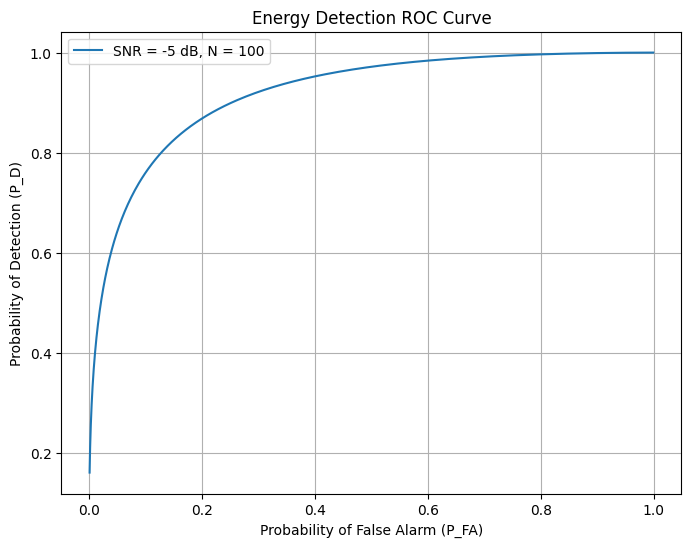

Non-centrality parameter Lambda = 31.6228
Threshold for P_FA=0.05 is lambda=1.2434
Resulting P_D at threshold = 0.6428


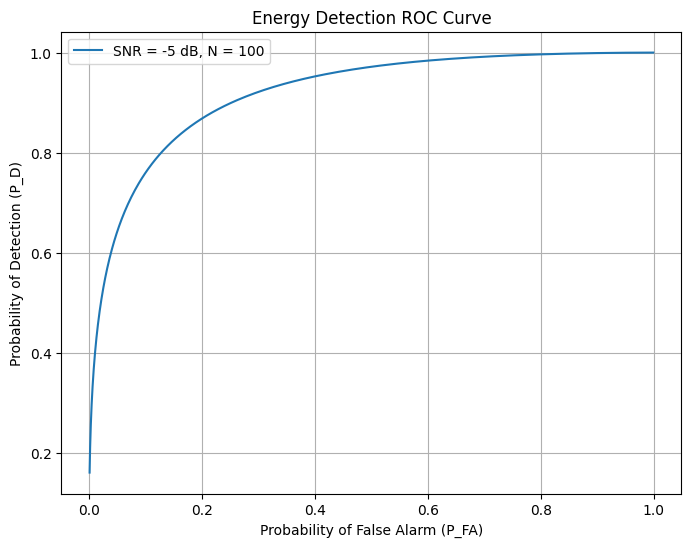

In [96]:
from scipy.stats import chi2, ncx2
# Energy detector parameters
N = 100         # Number of samples
sigma_w2 = 1.0  # Noise variance
SNR_dB = -5     # Signal-to-noise ratio in dB

# Convert SNR to linear
SNR_linear = 10 ** (SNR_dB / 10)
Lambda = N * SNR_linear
P_FA_target = 0.05
z_FA = chi2.ppf(1 - P_FA_target, df=N)
threshold = (sigma_w2 / N) * z_FA
print(f"Target P_FA = {P_FA_target}")
print(f"Threshold (lambda) = {threshold:.4f}")

z_threshold = (N * threshold) / sigma_w2
P_D = 1 - ncx2.cdf(z_threshold, df=N, nc=Lambda)
print(f"Corresponding P_D = {P_D:.4f}")

# Sweep thresholds in z (chi-square domain)
z_values = np.linspace(chi2.ppf(0.001, N), chi2.ppf(0.999, N), 500)
# Convert to T-domain threshold
lambda_values = (sigma_w2 / N) * z_values
P_FA_list = 1 - chi2.cdf(z_values, df=N)
P_D_list  = 1 - ncx2.cdf(z_values, df=N, nc=Lambda)

plt.figure(figsize=(8, 6))
plt.plot(P_FA_list, P_D_list, label=f"SNR = {SNR_dB} dB, N = {N}")
plt.xlabel('Probability of False Alarm (P_FA)')
plt.ylabel('Probability of Detection (P_D)')
plt.title('Energy Detection ROC Curve')
plt.grid(True)
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2, ncx2

# Parameters
N = 100         # Number of samples
sigma_w2 = 1.0  # Noise variance
SNR_dB = -5     # SNR in dB

SNR_linear = 10 ** (SNR_dB / 10)
Lambda = N * SNR_linear

print(f"Non-centrality parameter Lambda = {Lambda:.4f}")

# Target false alarm probability
P_FA_target = 0.05

# Threshold calculation
z_FA = chi2.ppf(1 - P_FA_target, df=N)
threshold = (sigma_w2 / N) * z_FA
print(f"Threshold for P_FA={P_FA_target} is lambda={threshold:.4f}")

# Detection probability at this threshold
z_threshold = (N * threshold) / sigma_w2
P_D = 1 - ncx2.cdf(z_threshold, df=N, nc=Lambda)
print(f"Resulting P_D at threshold = {P_D:.4f}")

# ROC curve
z_values = np.linspace(chi2.ppf(0.001, N), chi2.ppf(0.999, N), 500)
lambda_values = (sigma_w2 / N) * z_values

P_FA_list = 1 - chi2.cdf(z_values, df=N)
P_D_list  = 1 - ncx2.cdf(z_values, df=N, nc=Lambda)

plt.figure(figsize=(8, 6))
plt.plot(P_FA_list, P_D_list, label=f"SNR = {SNR_dB} dB, N = {N}")
plt.xlabel('Probability of False Alarm (P_FA)')
plt.ylabel('Probability of Detection (P_D)')
plt.title('Energy Detection ROC Curve')
plt.grid(True)
plt.legend()
plt.show()



# Future work and notes 

- Feature extraction and ML classification of IQ data
- Interference detection in spectrum data


---

- NOMA
- cellular architecture model 
- RIS + massive MIMO and beamforming 
- IP networking 

